# 此處利用Tensorflow提供之CNN教學code做簡易demo

此demo利用Tensorflow內建之資料集 ─ MNIST，作為我們的訓練以及驗證資料集，MNIST為一機器學習初學者常見之數據集，內容為0~9之手寫阿拉伯數字，目標是利用訓練資料集來讓機器分辨0~9的數字。

## 載入所需 package

In [2]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

# Imports
import numpy as np
import tensorflow as tf
import time

tf.logging.set_verbosity(tf.logging.INFO)

## 設計CNN網路架構

這裡我們設計了一個簡單的CNN網路架構，其架構如下： (括號內為code中代碼名稱)
    1. Convolutional Layer 1 (conv1):
        參數設定為：filters = 32、kernel_size = 5x5、padding = same(output與input同維度)、activation function使用ReLU
    2. Pooling Layer 1 (pool1):
        參數設定為：pool_size = 2x2、strides = 2(每次矩陣移動的距離)
    3. Convolutional Layer 2 (conv2):
        參數設定為：filters = 64、kernel_size = 5x5、padding = same、activation function使用ReLU
    4. Pooling Layer 2 (pool2):
        參數設定為：pool_size = 2x2、strides = 2
    5. Full Connected Layer (dense)：
        參數設定為：units = 1024 (該層有1024個神經元)、activation function使用ReLU
    6. Dropout (dropout)：
        參數設定為：rate = 0.4 (每次隨機抽取四成神經元捨去)、training=mode == tf.estimator.ModeKeys.TRAIN (唯有在train時啟動dropout)
    7. Full Connected Layer (logit)：
        參數設定為：units = 10 (為輸出層，需與欲分類類別數相同)
    8. Predict (predictions)
    8-1. Argmax (tf.argmax)：
        將logit中，得分最高的類別令為預測的結果
    8-2. Softmax (tf.nn.softmax)：
        將logit經過softmax函數處理後得到各類別預測可能百分比
        
    9. Optimizer：SGD (tf.train.GradientDescentOptimizer)
        參數設定為：learning_rate = 0.001

In [3]:
def cnn_model_fn(features, labels, mode):
  """Model function for CNN."""
  # Input Layer
  input_layer = tf.reshape(features["x"], [-1, 28, 28, 1])

  # Convolutional Layer #1
  conv1 = tf.layers.conv2d(
      inputs=input_layer,
      filters=32,
      kernel_size=[5, 5],
      padding="same",
      activation=tf.nn.relu)

  # Pooling Layer #1
  pool1 = tf.layers.max_pooling2d(inputs=conv1, pool_size=[2, 2], strides=2)

  # Convolutional Layer #2 and Pooling Layer #2
  conv2 = tf.layers.conv2d(
      inputs=pool1,
      filters=64,
      kernel_size=[5, 5],
      padding="same",
      activation=tf.nn.relu)
  pool2 = tf.layers.max_pooling2d(inputs=conv2, pool_size=[2, 2], strides=2)

  # Dense Layer
  pool2_flat = tf.reshape(pool2, [-1, 7 * 7 * 64])
  dense = tf.layers.dense(inputs=pool2_flat, units=1024, activation=tf.nn.relu)
  dropout = tf.layers.dropout(
      inputs=dense, rate=0.4, training=mode == tf.estimator.ModeKeys.TRAIN)

  # Logits Layer
  logits = tf.layers.dense(inputs=dropout, units=10)

  predictions = {
      # Generate predictions (for PREDICT and EVAL mode)
      "classes": tf.argmax(input=logits, axis=1),
      # Add `softmax_tensor` to the graph. It is used for PREDICT and by the
      # `logging_hook`.
      "probabilities": tf.nn.softmax(logits, name="softmax_tensor")
  }

  if mode == tf.estimator.ModeKeys.PREDICT:
    return tf.estimator.EstimatorSpec(mode=mode, predictions=predictions)

  # Calculate Loss (for both TRAIN and EVAL modes)
  loss = tf.losses.sparse_softmax_cross_entropy(labels=labels, logits=logits)

  # Configure the Training Op (for TRAIN mode)
  if mode == tf.estimator.ModeKeys.TRAIN:
    optimizer = tf.train.GradientDescentOptimizer(learning_rate=0.001)
    train_op = optimizer.minimize(
        loss=loss,
        global_step=tf.train.get_global_step())
    return tf.estimator.EstimatorSpec(mode=mode, loss=loss, train_op=train_op)

  # Add evaluation metrics (for EVAL mode)
  eval_metric_ops = {
      "accuracy": tf.metrics.accuracy(
          labels=labels, predictions=predictions["classes"])}
  return tf.estimator.EstimatorSpec(
      mode=mode, loss=loss, eval_metric_ops=eval_metric_ops)

## 建構main (運行主體)
分為數個部分
    1. Load training and eval data:
        讀取資料 (MNIST)
    2. Create the Estimator:
        estimator為tensorflow其中一種型態，用以將上述建立之model整合，並應用於之後會使用的模型訓練, 模型評測以及結論
    3. Set up logging for predictions:
        由於CNN需要跑一陣子，我們設定一個logging來在CNN訓練時監測他的訓練狀況
        tensors_to_log為我們想要監測的tensors，此處我們設定為softmax tensor，即，各筆資料可能的分類百分比
    4. Train the model:
        訓練模型，參數設定為：batch_size = 100 (每次投入100筆資料進入我的model進行訓練)，num_epochs = None (不限制我的訓練次數)
    5. Evaluate the model and print results:
        評測模型，將testing data帶入訓練好的模型中，此處num_epochs = 1用意為每一筆testing data都需看過。
        並將結果print出來

In [12]:
def main(unused_argv):
  # Load training and eval data
  start_time = time.time()
  mnist = tf.contrib.learn.datasets.load_dataset("mnist")
  train_data = mnist.train.images  # Returns np.array
  train_labels = np.asarray(mnist.train.labels, dtype=np.int32)
  eval_data = mnist.test.images  # Returns np.array
  eval_labels = np.asarray(mnist.test.labels, dtype=np.int32)

  # Create the Estimator
  mnist_classifier = tf.estimator.Estimator(
      model_fn=cnn_model_fn, model_dir="/tmp/mnist_convnet_model")

  # Set up logging for predictions
  # Log the values in the "Softmax" tensor with label "probabilities"
  tensors_to_log = {"probabilities": "softmax_tensor"}
  logging_hook = tf.train.LoggingTensorHook(
      tensors=tensors_to_log, every_n_iter=50)

  # Train the model
  train_input_fn = tf.estimator.inputs.numpy_input_fn(
      x={"x": train_data},
      y=train_labels,
      batch_size=100,
      num_epochs=None,
      shuffle=True)
  mnist_classifier.train(
      input_fn=train_input_fn,
      steps=20000,
      hooks=[logging_hook])

  # Evaluate the model and print results
  eval_input_fn = tf.estimator.inputs.numpy_input_fn(
      x={"x": eval_data},
      y=eval_labels,
      num_epochs=1,
      shuffle=False)
  eval_results = mnist_classifier.evaluate(input_fn=eval_input_fn)
  print(eval_results)
  return(time.time() - start_time)

## 開始訓練並產出結果
這邊使用的是 GPU 進行訓練，為了瞭解 GPU 以及 CPU 間運算速度的差異，我們在此先將 GPU 總運行時間記錄下來 (gpu_time)

In [13]:
if __name__ == "__main__":
  tf.app.run()

Extracting MNIST-data\train-images-idx3-ubyte.gz
Extracting MNIST-data\train-labels-idx1-ubyte.gz
Extracting MNIST-data\t10k-images-idx3-ubyte.gz
Extracting MNIST-data\t10k-labels-idx1-ubyte.gz
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_keep_checkpoint_every_n_hours': 10000, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000259867A0128>, '_save_checkpoints_secs': 600, '_tf_random_seed': None, '_service': None, '_session_config': None, '_num_worker_replicas': 1, '_evaluation_master': '', '_model_dir': '/tmp/mnist_convnet_model', '_keep_checkpoint_max': 5, '_is_chief': True, '_distribute': None, '_log_step_count_steps': 100, '_task_id': 0, '_save_summary_steps': 100, '_master': '', '_save_checkpoints_steps': None, '_task_type': 'worker', '_num_ps_replicas': 0, '_global_id_in_cluster': 0}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph w

INFO:tensorflow:loss = 0.023784557, step = 160001
INFO:tensorflow:probabilities = [[0.9935182  0.00021844 0.00013227 0.00000062 0.00548567 0.0000024
  0.00039243 0.00002549 0.00000218 0.00022257]
 [0.00000003 0.0000005  0.9996711  0.00002261 0.         0.
  0.00000003 0.00000079 0.00030491 0.        ]
 [0.         0.         0.00000001 0.00008012 0.0000061  0.
  0.         0.00030271 0.00004308 0.9995679 ]
 [0.         0.         0.         0.00000001 0.         0.99999964
  0.         0.         0.         0.00000039]
 [0.00000294 0.9993032  0.00000877 0.00003355 0.00011428 0.00000081
  0.00010093 0.000369   0.00006467 0.00000167]
 [0.9998211  0.         0.00017762 0.         0.00000001 0.
  0.00000002 0.00000095 0.00000024 0.00000008]
 [0.00000001 0.00000011 0.00001297 0.00000292 0.         0.
  0.         0.99998164 0.00000003 0.00000242]
 [0.00000019 0.00000019 0.00000119 0.00000001 0.99999344 0.00000016
  0.00000009 0.00000174 0.         0.00000303]
 [0.00000126 0.0000035  0.99997

INFO:tensorflow:global_step/sec: 121.498
INFO:tensorflow:probabilities = [[0.97671753 0.00000003 0.02311982 0.00000041 0.00000073 0.00000002
  0.00000038 0.00000226 0.00000075 0.00015826]
 [0.99999964 0.         0.00000001 0.         0.         0.
  0.         0.00000037 0.         0.        ]
 [0.         0.         0.00000001 0.9999442  0.         0.00005126
  0.         0.00000001 0.0000002  0.00000426]
 [0.99995875 0.         0.00004123 0.         0.         0.
  0.         0.00000005 0.         0.        ]
 [0.         0.         0.00000003 0.9999813  0.         0.00000003
  0.         0.         0.00000183 0.00001696]
 [0.         0.00000003 0.00000139 0.00000321 0.00000001 0.00003066
  0.00000046 0.00000006 0.9999641  0.        ]
 [0.         0.         0.         0.00000004 0.00000003 0.00000001
  0.         0.         0.9999976  0.00000227]
 [0.00000147 0.00000598 0.0185052  0.00002408 0.00000001 0.00000002
  0.         0.00023722 0.9812252  0.00000078]
 [0.00000001 0.        

INFO:tensorflow:loss = 0.023442516, step = 160101 (0.825 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.00000001 0.00000001 0.         0.        ]
 [0.         0.         0.         0.00000045 0.00000211 0.
  0.         0.00000444 0.         0.99999297]
 [1.         0.         0.00000003 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000003 0.         0.0000037  0.0000008  0.         0.00000001
  0.         0.999987   0.         0.00000841]
 [0.         0.         0.         0.00000048 0.         0.9999989
  0.00000001 0.         0.0000006  0.00000001]
 [0.00000003 0.         0.00006672 0.00000045 0.00000008 0.00000013
  0.00000003 0.00000001 0.9999325  0.00000002]
 [0.00000002 0.00001788 0.99997294 0.00000058 0.00000698 0.
  0.         0.00000115 0.00000039 0.        ]
 [0.         0.         0.00000172 0.00000015 0.00000006 0.00000024
  0.00001302 0.00000134 0.9999833  0.00000008]
 [0.         0.0000

INFO:tensorflow:global_step/sec: 144.831
INFO:tensorflow:probabilities = [[0.00000005 0.0002007  0.00023496 0.00000002 0.00264872 0.0034226
  0.99339163 0.         0.00010135 0.        ]
 [0.00000014 0.00000003 0.00015614 0.00000237 0.00000005 0.
  0.         0.9998338  0.00000365 0.00000374]
 [0.00847948 0.00012098 0.00120628 0.00752664 0.00028247 0.02196584
  0.00034706 0.00003482 0.00413965 0.9558968 ]
 [0.         0.         0.00000001 0.         0.         0.
  0.         1.         0.         0.        ]
 [0.         0.         0.         0.00000087 0.00001081 0.00000539
  0.         0.00002735 0.00000046 0.99995506]
 [0.         0.00000226 0.9999975  0.00000003 0.00000023 0.
  0.         0.         0.00000002 0.        ]
 [0.00001173 0.0001369  0.00003609 0.0004549  0.00000769 0.0045286
  0.00000264 0.00011563 0.9946202  0.00008564]
 [0.00000005 0.00000029 0.00000399 0.0000133  0.00000018 0.00000001
  0.         0.99997795 0.00000006 0.00000408]
 [0.00040323 0.00007822 0.0000002

INFO:tensorflow:loss = 0.003839984, step = 160201 (0.690 sec)
INFO:tensorflow:probabilities = [[0.0000339  0.         0.         0.00002095 0.00000007 0.00174143
  0.99820304 0.         0.00000058 0.        ]
 [0.00000035 0.99308044 0.00001075 0.00000199 0.00006547 0.0000001
  0.00000166 0.00682902 0.00000994 0.00000029]
 [0.00000003 0.00000031 0.         0.         0.00000076 0.
  0.         0.9999989  0.00000001 0.        ]
 [0.         0.         0.         0.00036009 0.         0.9916956
  0.         0.00000004 0.0078265  0.00011782]
 [0.00000003 0.00000016 0.00000639 0.00000254 0.         0.
  0.         0.9999589  0.00000001 0.00003193]
 [0.         0.         0.00000001 0.99999976 0.         0.00000012
  0.         0.         0.00000013 0.00000001]
 [0.         0.99999046 0.00000467 0.00000017 0.00000054 0.
  0.         0.00000379 0.00000038 0.        ]
 [0.9998746  0.         0.00000268 0.         0.00000004 0.00000046
  0.000018   0.00009568 0.00000029 0.00000825]
 [0.00035139

INFO:tensorflow:global_step/sec: 144.177
INFO:tensorflow:probabilities = [[0.00004159 0.00055466 0.00169336 0.9961416  0.00001288 0.00114573
  0.00000805 0.00000433 0.00036693 0.00003101]
 [0.00000006 0.00000608 0.00000019 0.00001671 0.8427879  0.00000359
  0.00000009 0.00792792 0.00051006 0.1487473 ]
 [0.00000004 0.0000019  0.9999895  0.00000227 0.         0.00000001
  0.         0.00000617 0.00000016 0.        ]
 [0.00010455 0.00000742 0.000077   0.         0.00705648 0.00000001
  0.99275416 0.00000003 0.00000033 0.00000004]
 [0.00006825 0.00000854 0.00003691 0.00031124 0.00019431 0.00000498
  0.00000018 0.0001585  0.00000824 0.99920887]
 [0.00002162 0.00000004 0.00042226 0.00027567 0.         0.00003308
  0.00000002 0.00000574 0.9992415  0.00000008]
 [0.0000082  0.00000269 0.98671687 0.00005227 0.0000022  0.00000001
  0.00000092 0.00521178 0.00800504 0.00000006]
 [0.         0.         0.         0.00029519 0.00000013 0.00004535
  0.         0.00000003 0.00000021 0.99965906]
 [0.   

INFO:tensorflow:loss = 0.009755656, step = 160301 (0.695 sec)
INFO:tensorflow:probabilities = [[0.00000004 0.00000003 0.00000003 0.00049372 0.00000112 0.00067054
  0.         0.00020802 0.00000004 0.9986265 ]
 [0.         0.         0.00000004 0.00000485 0.00003773 0.
  0.         0.00003858 0.00001548 0.9999033 ]
 [0.99994564 0.         0.00002238 0.         0.         0.
  0.00000001 0.00002342 0.00000004 0.00000858]
 [0.99999976 0.         0.         0.         0.         0.00000008
  0.00000012 0.00000001 0.00000001 0.        ]
 [0.         0.         0.         0.99999976 0.         0.00000026
  0.         0.         0.         0.00000001]
 [0.00000008 0.99982184 0.00000059 0.00000003 0.000012   0.00000001
  0.00004578 0.00000015 0.0001196  0.00000002]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000004 0.         0.        ]
 [0.00007077 0.00005383 0.00003191 0.00000217 0.00011246 0.0000127
  0.99970347 0.00000001 0.00001262 0.00000002]
 [0.0173800

INFO:tensorflow:global_step/sec: 144.858
INFO:tensorflow:probabilities = [[0.00001425 0.00001595 0.00000561 0.00011243 0.00008712 0.9985453
  0.00100418 0.00005137 0.00004139 0.00012233]
 [0.00156289 0.00000023 0.00544265 0.00000665 0.00000002 0.00000053
  0.         0.99091583 0.00000007 0.00207116]
 [0.00002358 0.08783122 0.00246736 0.0000009  0.00001254 0.00852954
  0.90084064 0.00000055 0.00029367 0.00000005]
 [0.00000018 0.00001058 0.9993142  0.00027379 0.         0.00000004
  0.00000015 0.00000002 0.00040121 0.        ]
 [0.         0.         0.0000013  0.9997991  0.00000025 0.00014099
  0.         0.00000771 0.00001348 0.00003721]
 [0.00000351 0.0000088  0.00003614 0.00003188 0.00031653 0.00004662
  0.00000011 0.00000398 0.00003283 0.9995196 ]
 [0.         0.         0.00000014 0.000001   0.00000052 0.0000078
  0.00000001 0.00001964 0.00009626 0.9998746 ]
 [0.00000022 0.00000028 0.00000134 0.00000005 0.00000779 0.00000764
  0.9999794  0.         0.00000334 0.        ]
 [0.99996

INFO:tensorflow:loss = 0.0065352255, step = 160401 (0.688 sec)
INFO:tensorflow:probabilities = [[0.00814748 0.0022251  0.00088021 0.22155295 0.00000355 0.00003616
  0.00058805 0.00008107 0.76645076 0.00003469]
 [0.00000003 0.9999758  0.00000005 0.00000006 0.00000382 0.00000004
  0.00000448 0.0000114  0.00000423 0.00000023]
 [0.00002299 0.         0.00000001 0.00000629 0.0000002  0.00213679
  0.99781907 0.         0.00001458 0.        ]
 [0.         0.00000018 0.00000001 0.00001432 0.0001035  0.00000068
  0.         0.00000325 0.00008741 0.9997907 ]
 [0.00000001 0.         0.00000162 0.00046329 0.00000008 0.00000168
  0.         0.00000065 0.99920195 0.00033072]
 [0.99937373 0.00000008 0.0000353  0.00000097 0.         0.00001274
  0.00000002 0.00001333 0.00000069 0.00056314]
 [0.00102867 0.00001938 0.00000166 0.00000037 0.000357   0.00007939
  0.9668114  0.00000006 0.03170048 0.00000165]
 [0.00000414 0.99998105 0.00000037 0.         0.00000301 0.
  0.00000014 0.00000655 0.00000483 0.000

INFO:tensorflow:global_step/sec: 145.627
INFO:tensorflow:probabilities = [[0.0004301  0.00080974 0.00028056 0.00020001 0.00000199 0.00135492
  0.9959371  0.00000013 0.00098533 0.00000008]
 [0.         0.         0.00000055 0.00000046 0.         0.
  0.00000001 0.         0.9999988  0.00000017]
 [0.         0.         0.00000041 0.99999726 0.         0.0000002
  0.         0.         0.00000001 0.00000215]
 [0.00000134 0.9999621  0.00000088 0.00000001 0.0000005  0.00000004
  0.00001655 0.00000433 0.00001445 0.00000002]
 [0.         0.00000001 0.         0.00000042 0.00002683 0.0000004
  0.         0.00033741 0.00000147 0.99963343]
 [0.         0.00000001 0.9999951  0.00000016 0.         0.
  0.         0.00000155 0.00000321 0.        ]
 [0.         0.00193828 0.9971233  0.0009332  0.         0.00000002
  0.         0.00000001 0.00000523 0.        ]
 [0.9998115  0.         0.00000213 0.00000001 0.00000014 0.00008229
  0.00008226 0.00000083 0.00000222 0.00001868]
 [0.         0.00000007 0

INFO:tensorflow:loss = 0.03858463, step = 160501 (0.687 sec)
INFO:tensorflow:probabilities = [[0.00004303 0.00000002 0.00000004 0.         0.00000002 0.00000005
  0.         0.999928   0.         0.00002882]
 [0.         0.         0.         0.         0.         0.00000012
  0.9999999  0.         0.00000001 0.        ]
 [0.         0.00009664 0.         0.00000001 0.9998615  0.
  0.00000004 0.00000595 0.00000012 0.00003579]
 [0.         0.00000004 0.00000007 0.9999862  0.         0.00001179
  0.         0.00000002 0.00000185 0.00000006]
 [0.00000015 0.         0.00000002 0.01532124 0.00008165 0.00008447
  0.         0.00000071 0.0032745  0.98123723]
 [0.00000018 0.99996936 0.00000007 0.         0.00001227 0.00000001
  0.00000005 0.00001722 0.00000077 0.0000001 ]
 [0.9998934  0.00000014 0.00007387 0.00000044 0.00000004 0.00000072
  0.00000009 0.00002939 0.00000001 0.00000185]
 [0.00000049 0.00000014 0.0000004  0.00000447 0.00000004 0.00000004
  0.         0.9999639  0.00000521 0.00002

INFO:tensorflow:global_step/sec: 146.278
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000003 0.         1.
  0.         0.         0.         0.00000001]
 [0.99999845 0.         0.00000135 0.         0.         0.00000001
  0.         0.00000005 0.         0.00000021]
 [0.99999917 0.         0.         0.         0.         0.00000078
  0.         0.00000006 0.         0.        ]
 [0.         0.         0.         0.         0.         0.00001241
  0.9999875  0.         0.00000012 0.        ]
 [0.00000024 0.         0.00000009 0.         0.00000244 0.00000043
  0.9999968  0.         0.00000001 0.        ]
 [0.00000005 0.00000002 0.00000006 0.00000304 0.00000002 0.9999888
  0.00000153 0.00000139 0.00000273 0.0000023 ]
 [0.         0.         0.         1.         0.         0.00000001
  0.         0.         0.         0.00000001]
 [0.00000001 0.         0.         0.         0.00000011 0.
  0.9999999  0.         0.         0.        ]
 [0.00000288 0.00000153 

INFO:tensorflow:loss = 0.08947581, step = 160601 (0.685 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00017224 0.00000003 0.00000003 0.9995739  0.0000001
  0.00000007 0.00001735 0.00000027 0.00023597]
 [0.00000001 0.9979634  0.00000001 0.00000001 0.00199651 0.
  0.00000002 0.00000032 0.00000232 0.00003752]
 [0.         0.         0.00000248 0.00000311 0.         0.00000153
  0.0000001  0.         0.9999927  0.00000004]
 [0.00000003 0.0000006  0.00066297 0.         0.9993332  0.00000001
  0.00000016 0.00000273 0.00000003 0.00000034]
 [0.99999845 0.         0.         0.         0.         0.
  0.         0.         0.         0.0000016 ]
 [0.00000006 0.00000026 0.0000001  0.         0.00000165 0.00116246
  0.9988122  0.         0.0000233  0.        ]
 [0.9996673  0.00000005 0.00032589 0.00000009 0.         0.0000016
  0.00000235 0.0000022  0.00000032 0.00000023]
 [0.         0.         0.00000003 0.         0.         0.00000016
  0.9999994  0.         0.00000033 0.        ]
 [0.0

INFO:tensorflow:global_step/sec: 146.499
INFO:tensorflow:probabilities = [[0.99959856 0.00000022 0.00006798 0.00000001 0.00000047 0.00000001
  0.00000015 0.00028298 0.00000012 0.00004962]
 [0.         0.0000001  0.         0.         0.9997875  0.
  0.         0.00000041 0.         0.00021202]
 [0.         0.         0.00000075 0.         0.         0.
  0.         0.         0.9999993  0.00000001]
 [0.00240521 0.00000281 0.00843195 0.00010113 0.00005644 0.00013713
  0.00317827 0.00000189 0.9846985  0.00098664]
 [0.00000209 0.9854891  0.00125189 0.00000185 0.00065791 0.00000004
  0.00000554 0.00565467 0.00693683 0.00000022]
 [0.00000001 0.00004092 0.99990666 0.00000031 0.00001795 0.
  0.         0.00000004 0.00003411 0.00000001]
 [0.9999981  0.         0.00000109 0.         0.00000001 0.
  0.         0.00000069 0.         0.00000008]
 [0.         0.         0.00000006 0.00000184 0.00000071 0.00000584
  0.         0.00001682 0.00000045 0.99997425]
 [0.00000006 0.00000002 0.00000002 0.00

INFO:tensorflow:loss = 0.0032143344, step = 160701 (0.683 sec)
INFO:tensorflow:probabilities = [[0.00000489 0.99875534 0.00006176 0.00000358 0.00003826 0.00000008
  0.00000291 0.00109589 0.00003493 0.00000246]
 [0.         0.00000484 0.9999951  0.00000001 0.         0.
  0.         0.00000003 0.         0.        ]
 [0.         0.         0.00000004 0.99999976 0.         0.00000017
  0.         0.         0.00000004 0.00000016]
 [0.00000003 0.0000001  0.00000102 0.00000458 0.         0.00005038
  0.00000216 0.         0.9999417  0.        ]
 [0.9980578  0.00002053 0.00018132 0.00000017 0.00000142 0.00001062
  0.00157408 0.00000864 0.00014438 0.00000098]
 [0.00327163 0.00030208 0.0005364  0.03994985 0.07544249 0.00113189
  0.00145726 0.01212729 0.11374576 0.7520353 ]
 [0.         0.00000001 0.         0.00007256 0.00000044 0.9948703
  0.         0.00070374 0.00002255 0.00433034]
 [0.         0.00000061 0.00002565 0.99921405 0.00000287 0.00004048
  0.00000001 0.00000125 0.0006042  0.0001

INFO:tensorflow:global_step/sec: 146.611
INFO:tensorflow:probabilities = [[0.         0.99995875 0.00000077 0.00000154 0.00000546 0.00000002
  0.00000007 0.00000017 0.0000332  0.00000004]
 [0.00001764 0.00031653 0.00862337 0.00068777 0.98787177 0.00003603
  0.00228177 0.00003907 0.00012295 0.00000303]
 [0.00000001 0.         0.00000007 0.00007965 0.00000176 0.00000027
  0.         0.00001421 0.00007931 0.9998247 ]
 [0.         0.00000002 0.00000173 0.00000208 0.         0.
  0.         0.99999523 0.         0.00000098]
 [0.         0.         0.         0.00145872 0.00000111 0.00086779
  0.         0.00016017 0.00002318 0.997489  ]
 [0.         0.         0.00000019 0.9999989  0.         0.
  0.         0.00000001 0.00000074 0.00000013]
 [0.99999917 0.         0.00000087 0.         0.         0.
  0.         0.00000001 0.         0.        ]
 [0.0000007  0.99859875 0.00000064 0.00000399 0.00007583 0.00000025
  0.00000029 0.00112543 0.00000788 0.0001863 ]
 [0.00000002 0.00000001 0.     

INFO:tensorflow:loss = 0.017265702, step = 160801 (0.682 sec)
INFO:tensorflow:probabilities = [[0.         0.00000003 0.00000001 0.         0.9999987  0.
  0.         0.00000134 0.         0.00000004]
 [0.9921152  0.00000005 0.00000184 0.00000042 0.00000198 0.00776314
  0.00007327 0.00000337 0.0000003  0.00004047]
 [0.00000052 0.99961346 0.00000096 0.000002   0.00000293 0.
  0.00000001 0.00035748 0.0000156  0.00000702]
 [0.         0.         0.00000007 0.00084069 0.         0.99904627
  0.00000117 0.00000013 0.00008512 0.0000264 ]
 [0.         0.         0.         0.         0.99999046 0.
  0.         0.00000068 0.         0.00000888]
 [0.00000288 0.99686474 0.00000996 0.00000462 0.00129262 0.00000011
  0.00000452 0.00144825 0.00034574 0.00002662]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.00000003 0.        ]
 [0.00000039 0.9996995  0.0001349  0.00000007 0.00003843 0.
  0.00000006 0.00012286 0.00000373 0.00000022]
 [0.00005937 0.00000017 0.

INFO:tensorflow:global_step/sec: 146.713
INFO:tensorflow:probabilities = [[0.00000014 0.00000129 0.99992347 0.00000325 0.00002236 0.00000009
  0.00000019 0.0000475  0.00000169 0.00000004]
 [0.00000015 0.00066419 0.9989999  0.00030848 0.0000052  0.00000015
  0.         0.00001024 0.00001129 0.00000042]
 [0.00000016 0.00000002 0.00005211 0.00000342 0.00000002 0.
  0.00000007 0.00000016 0.9999403  0.00000365]
 [0.         0.         0.00000003 0.00001002 0.00000035 0.00000391
  0.00000001 0.00000457 0.00000389 0.99997723]
 [0.00000051 0.00010779 0.00000001 0.00000003 0.99978703 0.0000001
  0.00000035 0.00001013 0.00000293 0.00009102]
 [0.00000005 0.00000009 0.00001528 0.00018542 0.00000001 0.00000275
  0.00000016 0.00000011 0.99977654 0.00001968]
 [0.9999957  0.         0.00000215 0.         0.         0.00000004
  0.0000014  0.00000012 0.00000001 0.00000054]
 [0.00000003 0.00003    0.00000159 0.00000007 0.9999522  0.0000044
  0.00000139 0.00000095 0.00000001 0.0000093 ]
 [0.9999716  0.  

INFO:tensorflow:loss = 0.003955714, step = 160901 (0.681 sec)
INFO:tensorflow:probabilities = [[0.         0.9999448  0.         0.00000001 0.00005212 0.
  0.00000009 0.00000158 0.00000129 0.00000012]
 [0.00000001 0.00000009 0.00002296 0.0000143  0.00000001 0.
  0.         0.9999621  0.00000001 0.00000056]
 [0.00000002 0.00000075 0.         0.00000064 0.00000028 0.99909246
  0.00023594 0.00001863 0.00062773 0.00002358]
 [0.9963231  0.         0.0026638  0.         0.00000003 0.00000001
  0.00000037 0.00092709 0.00008554 0.00000011]
 [0.         0.00000001 0.         0.00000046 0.00000581 0.00000001
  0.         0.00000018 0.00000037 0.9999932 ]
 [0.         0.00000001 0.         0.00000124 0.         0.9999975
  0.00000042 0.         0.00000074 0.00000003]
 [0.         0.         0.         0.         0.00000916 0.00002192
  0.9999689  0.         0.         0.        ]
 [0.00000029 0.9997272  0.00000022 0.00000028 0.0000036  0.00000041
  0.0000041  0.00024976 0.00001065 0.00000365]
 [0

INFO:tensorflow:global_step/sec: 146.499
INFO:tensorflow:probabilities = [[0.         0.00000001 0.99999654 0.00000273 0.         0.
  0.         0.00000022 0.00000042 0.00000001]
 [0.00000017 0.00000001 0.00000003 0.00000009 0.00000001 0.00000674
  0.99999297 0.         0.00000003 0.        ]
 [0.00000009 0.00000029 0.00007394 0.00009765 0.00000008 0.00005526
  0.00000097 0.00000002 0.99977154 0.00000007]
 [0.00000056 0.00077897 0.0000026  0.00175823 0.04709923 0.00020884
  0.00005    0.0002914  0.0030138  0.94679636]
 [0.00000001 0.         0.00000002 0.00000175 0.00000314 0.00000001
  0.         0.00000089 0.00000048 0.9999937 ]
 [0.         0.00000002 0.00000176 0.00000191 0.00000274 0.
  0.         0.99998915 0.00000015 0.0000043 ]
 [0.00003413 0.00000084 0.00009064 0.0044895  0.00004506 0.00786398
  0.00220743 0.00000052 0.98509604 0.00017193]
 [0.         0.         0.         0.00000004 0.         0.99999547
  0.000004   0.         0.00000005 0.00000045]
 [0.00000006 0.00000003

INFO:tensorflow:loss = 0.035365667, step = 161001 (0.683 sec)
INFO:tensorflow:probabilities = [[0.         0.00000014 0.00002146 0.00023814 0.00000004 0.00000538
  0.         0.00000102 0.9997334  0.00000036]
 [0.         0.         0.         0.00083989 0.0000047  0.00387716
  0.         0.00000022 0.00000332 0.99527466]
 [0.00000003 0.99996746 0.00000475 0.00000001 0.00002447 0.
  0.00000003 0.00000134 0.00000207 0.00000001]
 [0.00000021 0.00000164 0.00000033 0.99917954 0.         0.00081564
  0.         0.00000002 0.00000002 0.00000265]
 [0.000054   0.00000001 0.00000003 0.         0.00000003 0.00000006
  0.         0.99962854 0.00000013 0.00031725]
 [0.00000021 0.00006114 0.00009214 0.00000019 0.99983954 0.00000093
  0.00000416 0.00000142 0.         0.00000018]
 [0.9985892  0.         0.00002198 0.00000005 0.         0.00133622
  0.00000231 0.00004465 0.00000429 0.00000127]
 [0.00006212 0.00000308 0.00000031 0.00000033 0.9991621  0.00000168
  0.00023165 0.00002555 0.00000147 0.0005

INFO:tensorflow:global_step/sec: 147.359
INFO:tensorflow:probabilities = [[0.00000078 0.9998266  0.00000775 0.000001   0.00001317 0.00000002
  0.00000123 0.0000556  0.00009332 0.00000055]
 [0.00000197 0.99868315 0.00000099 0.000021   0.00010781 0.00000142
  0.00000212 0.00073419 0.00041913 0.00002812]
 [0.         0.         0.         0.00000387 0.         0.99999547
  0.         0.         0.00000035 0.00000031]
 [0.00000002 0.         0.00000006 0.00000012 0.00012168 0.
  0.         0.00001476 0.00000037 0.9998629 ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000003]
 [0.         0.00000003 0.9999995  0.         0.         0.
  0.00000004 0.00000052 0.         0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.00000003 0.        ]
 [0.9981639  0.00000026 0.00171395 0.0000001  0.00000027 0.00000235
  0.00007259 0.00000115 0.00004521 0.00000018]
 [0.00000036 0.9999801  0.00000277 0.00

INFO:tensorflow:loss = 0.009050209, step = 161101 (0.679 sec)
INFO:tensorflow:probabilities = [[0.         0.99995327 0.00000002 0.         0.00004545 0.
  0.00000026 0.         0.00000092 0.00000007]
 [0.00009363 0.00000217 0.00000008 0.00000224 0.00000871 0.00086241
  0.00000087 0.99874973 0.00000055 0.00027956]
 [0.         0.         0.         0.00021003 0.         0.9997626
  0.00000002 0.         0.00000935 0.00001816]
 [0.00000001 0.00000004 0.00000031 0.00003072 0.         0.
  0.         0.00000071 0.99996805 0.00000016]
 [0.99999976 0.         0.0000002  0.         0.         0.
  0.00000002 0.00000001 0.         0.00000002]
 [0.00000005 0.99994373 0.00000004 0.00000008 0.00000206 0.00000001
  0.00000051 0.00000892 0.0000444  0.00000021]
 [0.         0.         0.00000007 0.00000001 0.00000003 0.00000519
  0.9999919  0.         0.00000284 0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.    

INFO:tensorflow:global_step/sec: 146.494
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00000007 0.00001176 0.00000005 0.00000045
  0.         0.00000142 0.99998176 0.00000459]
 [0.         0.         0.         0.9999852  0.         0.00000006
  0.         0.         0.0000145  0.00000008]
 [0.         0.         0.         0.9999801  0.         0.00000016
  0.         0.         0.00000008 0.00001972]
 [0.         0.         0.00000058 0.00015718 0.         0.00000797
  0.00000002 0.         0.9998331  0.00000107]
 [0.00000023 0.00000085 0.00000036 0.00007634 0.00000001 0.00000001
  0.         0.9998987  0.00000021 0.00002329]
 [0.00000338 0.00003008 0.00006268 0.9991787  0.00000006 0.00001682
  0.00000006 0.0003067  0.0001256  0.000276  ]
 [0.         0.         0.0000002  0.99999976 0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000001 0.         0.00000002 0.00000067 0.00000543 0.00001095
  0.00000012 0.00011924 0.00000158 0.99986196]
 [0.         0.

INFO:tensorflow:loss = 0.05267285, step = 161201 (0.683 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.00000001]
 [0.         0.00000001 0.00000015 0.9999341  0.         0.00001521
  0.         0.00000008 0.00000673 0.00004379]
 [0.         0.99987316 0.00000001 0.00000522 0.00002592 0.
  0.         0.0000012  0.00009406 0.00000049]
 [0.0000017  0.99989915 0.00000035 0.00000001 0.00003273 0.00000004
  0.00000344 0.0000585  0.00000371 0.0000003 ]
 [0.00000033 0.00010747 0.99222773 0.00001144 0.00000007 0.
  0.         0.00765211 0.00000088 0.        ]
 [0.         0.         0.         0.00000087 0.00000041 0.00000001
  0.         0.00000646 0.00000019 0.999992  ]
 [0.         0.00000006 0.00014748 0.00001117 0.         0.
  0.         0.9998367  0.00000132 0.00000318]
 [0.         0.         0.00000001 0.9999964  0.         0.00000002
  0.         0.00000029 0.00000333 0.00000001]
 [0.00000009 0.9998

INFO:tensorflow:global_step/sec: 146.929
INFO:tensorflow:probabilities = [[0.         0.00001589 0.99998343 0.0000001  0.         0.
  0.         0.00000055 0.00000001 0.        ]
 [1.         0.         0.00000001 0.         0.         0.
  0.         0.00000003 0.         0.        ]
 [0.00000016 0.9999088  0.00000118 0.00000003 0.00008398 0.
  0.00000003 0.00000281 0.00000296 0.00000001]
 [0.00002389 0.00000171 0.00001261 0.9952512  0.         0.00435805
  0.00000003 0.00000159 0.00001057 0.00034054]
 [0.9999137  0.00000018 0.00006342 0.00000006 0.00000001 0.00000614
  0.00000064 0.00000894 0.00000684 0.00000008]
 [0.9999852  0.         0.000006   0.         0.         0.
  0.         0.00000002 0.         0.00000876]
 [0.0000017  0.00000114 0.00007835 0.00009645 0.         0.00000001
  0.         0.9997427  0.00000001 0.00007964]
 [0.0000001  0.9997155  0.00000031 0.00000001 0.00002495 0.00000002
  0.00000006 0.00025797 0.0000009  0.00000016]
 [0.00008776 0.77099675 0.22502558 0.00

INFO:tensorflow:loss = 0.04711558, step = 161301 (0.681 sec)
INFO:tensorflow:probabilities = [[0.00159757 0.00285224 0.01940154 0.9279571  0.00001505 0.04673976
  0.00000994 0.00074365 0.00067216 0.00001104]
 [0.00000123 0.00000154 0.00197455 0.00023199 0.00006766 0.0019594
  0.00006623 0.00000259 0.99569196 0.00000285]
 [0.00000001 0.00000011 0.00004975 0.00010845 0.00000002 0.00000008
  0.00000002 0.00000011 0.99983263 0.00000886]
 [0.00000014 0.00015195 0.99979514 0.00001613 0.00000002 0.00000275
  0.         0.00003164 0.00000057 0.00000166]
 [0.         0.         0.         0.9999974  0.         0.
  0.         0.         0.00000266 0.00000001]
 [0.00000048 0.99977344 0.00000142 0.         0.00001183 0.
  0.00000007 0.00021221 0.00000039 0.00000016]
 [0.00001812 0.00003131 0.00145297 0.00353436 0.00000485 0.00000054
  0.00000002 0.993129   0.0000646  0.00176415]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000871

INFO:tensorflow:global_step/sec: 147.36
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00020106 0.         0.9974227
  0.00000008 0.         0.00099282 0.00138334]
 [0.9999982  0.         0.00000087 0.         0.         0.00000066
  0.         0.00000024 0.         0.00000001]
 [0.00000074 0.00000013 0.00000001 0.         0.         0.00023737
  0.99975854 0.         0.00000324 0.        ]
 [0.         0.00000013 0.99999845 0.00000001 0.         0.
  0.         0.00000138 0.00000003 0.        ]
 [0.         0.00000033 0.00000057 0.0001949  0.00254062 0.0000001
  0.         0.0001425  0.00001504 0.9971059 ]
 [0.         0.         0.         0.00000003 0.00000001 0.9999789
  0.00000281 0.00000001 0.00000153 0.0000167 ]
 [0.00000887 0.00000014 0.00000193 0.00000358 0.00000118 0.00042731
  0.9978161  0.00000013 0.00120265 0.00053811]
 [0.00000095 0.9959121  0.00001268 0.00005609 0.00022194 0.00001072
  0.00000049 0.00038647 0.00059729 0.00280152]
 [0.         0.9999

INFO:tensorflow:loss = 0.0337819, step = 161401 (0.680 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000631 0.         0.99998796
  0.         0.         0.00000006 0.00000577]
 [0.00006093 0.0000332  0.99907494 0.00002553 0.00001011 0.0000104
  0.00000005 0.00077161 0.00000974 0.00000362]
 [0.00000014 0.         0.00001701 0.00000007 0.         0.
  0.         0.9999826  0.         0.00000023]
 [0.         0.00000161 0.00000001 0.         0.9998908  0.00000001
  0.         0.00000037 0.00000009 0.00010705]
 [0.00000283 0.9997855  0.00000006 0.00000002 0.00000181 0.
  0.00000018 0.00020574 0.00000362 0.00000022]
 [0.00000054 0.9998442  0.00000674 0.00005849 0.00000353 0.00000046
  0.00000011 0.0000117  0.00007156 0.00000257]
 [0.         0.         0.00000003 0.00000001 0.00000659 0.
  0.         0.00002646 0.00000007 0.99996686]
 [0.00000465 0.00000014 0.00000559 0.00061962 0.00000017 0.00000025
  0.0000002  0.         0.99936634 0.00000314]
 [0.00000051 

INFO:tensorflow:global_step/sec: 144.8
INFO:tensorflow:probabilities = [[0.00000076 0.00163478 0.0000076  0.99774784 0.00000012 0.00001386
  0.         0.00001969 0.00009921 0.00047601]
 [0.00000005 0.00000055 0.00005269 0.00002091 0.00001858 0.00000296
  0.00000034 0.00000359 0.99989843 0.00000196]
 [0.         0.         0.         0.99999726 0.         0.00000265
  0.         0.         0.00000004 0.00000009]
 [0.00001316 0.07751894 0.00003674 0.00041351 0.00387313 0.0012393
  0.00002317 0.00966573 0.42333624 0.48388007]
 [0.00000205 0.         0.99997485 0.0000034  0.         0.
  0.00000002 0.00000033 0.00001938 0.00000001]
 [0.00000012 0.00000368 0.00013275 0.00014126 0.00000004 0.
  0.         0.998917   0.00012742 0.00067775]
 [0.00000035 0.00000009 0.00000013 0.00004091 0.00000002 0.9998191
  0.00002211 0.00000917 0.00010804 0.00000028]
 [1.         0.         0.00000005 0.         0.         0.
  0.         0.00000001 0.00000004 0.        ]
 [0.         0.00000002 0.00000004 

INFO:tensorflow:loss = 0.032311745, step = 161501 (0.690 sec)
INFO:tensorflow:probabilities = [[0.00000078 0.0003763  0.00110679 0.00000006 0.99847    0.00000014
  0.00001642 0.0000292  0.00000007 0.00000024]
 [0.         0.         0.         0.00001217 0.         0.00000353
  0.         0.         0.9999746  0.00000971]
 [0.         0.00000084 0.         0.         0.9999951  0.
  0.         0.00000007 0.00000001 0.00000394]
 [0.00000006 0.00000008 0.00000166 0.00000132 0.00000001 0.
  0.         0.99997103 0.00000002 0.00002585]
 [0.         0.         0.         0.9999989  0.         0.00000061
  0.         0.         0.0000002  0.00000019]
 [0.00002352 0.00000004 0.9999429  0.00000083 0.00000077 0.
  0.         0.0000044  0.00002756 0.00000001]
 [0.         0.00000055 0.9999944  0.00000474 0.         0.
  0.00000002 0.         0.00000027 0.        ]
 [0.00000001 0.         0.00000001 0.00000002 0.00004417 0.00000259
  0.00000004 0.00000637 0.00001721 0.99992955]
 [0.         0.000

INFO:tensorflow:global_step/sec: 146.495
INFO:tensorflow:probabilities = [[0.00001238 0.00000003 0.00032676 0.         0.99966073 0.
  0.00000009 0.         0.         0.        ]
 [0.00000206 0.         0.00000002 0.         0.00001466 0.00000001
  0.9999832  0.         0.00000001 0.        ]
 [0.00000866 0.         0.00000021 0.00000011 0.00000174 0.0000009
  0.9999881  0.         0.00000021 0.        ]
 [0.0000747  0.00003646 0.00012217 0.00000394 0.9980654  0.00009798
  0.00141102 0.00007962 0.00000337 0.00010554]
 [0.00006895 0.00007861 0.0050823  0.77541125 0.00000745 0.00002105
  0.00000001 0.00189515 0.21659571 0.00083952]
 [0.         0.00000005 0.00000024 0.00000959 0.00000084 0.00000006
  0.         0.00001987 0.00000014 0.99996924]
 [0.         0.         0.         0.9999999  0.         0.00000002
  0.         0.         0.00000008 0.00000002]
 [0.00000009 0.         0.00006547 0.00000015 0.         0.00077378
  0.7987439  0.         0.20041649 0.00000007]
 [0.         0.0

INFO:tensorflow:loss = 0.026860284, step = 161601 (0.683 sec)
INFO:tensorflow:probabilities = [[0.0000007  0.00000042 0.00000034 0.00000214 0.00042217 0.00002426
  0.00000097 0.00022416 0.00000399 0.99932086]
 [0.00001536 0.00000009 0.00000179 0.00000008 0.00000068 0.00025289
  0.99972445 0.         0.00000464 0.00000003]
 [0.         0.         0.00000001 0.00000612 0.00000164 0.00000001
  0.         0.00000542 0.0000001  0.99998665]
 [0.         0.00000015 0.         0.         0.9999124  0.
  0.00000006 0.00006989 0.         0.00001768]
 [0.00197943 0.00000059 0.00000153 0.00000089 0.00000245 0.00011758
  0.9978004  0.00000003 0.00008322 0.00001378]
 [0.00000001 0.         0.         0.00000002 0.         0.99984694
  0.00000046 0.         0.00014086 0.00001165]
 [0.         0.         0.         0.00000087 0.         0.
  0.         0.99999917 0.         0.        ]
 [0.         0.         0.         0.         0.9999974  0.
  0.         0.00000257 0.00000005 0.        ]
 [0.000000

INFO:tensorflow:global_step/sec: 147.795
INFO:tensorflow:probabilities = [[0.         0.         0.00004191 0.9999211  0.         0.00003636
  0.00000052 0.         0.00000012 0.        ]
 [0.99999475 0.         0.00000522 0.         0.         0.
  0.         0.         0.         0.00000002]
 [0.         0.00000001 0.00000016 0.9999217  0.         0.0000727
  0.         0.0000002  0.00000472 0.00000054]
 [0.00000084 0.99796104 0.00014213 0.00003048 0.00046434 0.00000005
  0.00001651 0.00006888 0.0013144  0.00000146]
 [0.         0.0000008  0.00000042 0.00000212 0.9998503  0.00000013
  0.00000003 0.00000009 0.00000303 0.00014312]
 [0.00000018 0.00000007 0.00001441 0.00010112 0.         0.00000001
  0.         0.99988115 0.00000007 0.00000301]
 [0.00000001 0.         0.00000049 0.00210089 0.000003   0.00139835
  0.         0.00092819 0.00000644 0.9955627 ]
 [0.00068616 0.00024501 0.0038548  0.9945878  0.0000001  0.00057623
  0.00002106 0.00000947 0.00001937 0.00000004]
 [0.9415831  0.0

INFO:tensorflow:loss = 0.021406615, step = 161701 (0.678 sec)
INFO:tensorflow:probabilities = [[0.00002555 0.00004218 0.00027711 0.99191296 0.00000034 0.00454288
  0.00000005 0.00001258 0.00006067 0.0031258 ]
 [0.         0.         0.         1.         0.         0.00000004
  0.         0.         0.00000001 0.        ]
 [0.00000064 0.99120843 0.00000252 0.00000063 0.00078888 0.00000004
  0.00000008 0.00788793 0.00000864 0.00010238]
 [0.99999976 0.         0.         0.         0.         0.
  0.         0.00000029 0.         0.        ]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.         0.00000001]
 [0.         0.         0.         0.         0.00000026 0.00000008
  0.         0.         0.9999969  0.00000271]
 [0.00011549 0.00214524 0.01100078 0.00005547 0.00006258 0.05994345
  0.00146829 0.00000882 0.92518115 0.00001876]
 [1.         0.         0.         0.         0.         0.
  0.00000002 0.         0.         0.        ]
 [0.989785

INFO:tensorflow:global_step/sec: 146.929
INFO:tensorflow:probabilities = [[0.00002025 0.00000018 0.00000342 0.00056    0.00000001 0.00000759
  0.         0.9961392  0.00000003 0.00326922]
 [0.         0.         0.         0.00000024 0.         0.99999976
  0.         0.         0.00000004 0.        ]
 [0.         0.         0.         0.         0.9999783  0.
  0.         0.00002054 0.         0.00000117]
 [0.00000013 0.00000068 0.00000018 0.00000002 0.00007803 0.00000582
  0.9999131  0.         0.00000206 0.        ]
 [0.00002517 0.00075262 0.00045514 0.05386962 0.00000186 0.00162023
  0.         0.91881555 0.02040881 0.004051  ]
 [0.         0.         0.00000044 0.00000017 0.         0.00000004
  0.00000006 0.00000001 0.99996006 0.0000392 ]
 [0.00008158 0.00000159 0.00000019 0.         0.00001134 0.0000008
  0.9999045  0.         0.         0.        ]
 [0.0000016  0.00000578 0.00009723 0.0000014  0.00000202 0.0000248
  0.00002089 0.00001708 0.99982435 0.00000493]
 [0.00365674 0.00

INFO:tensorflow:loss = 0.05187182, step = 161801 (0.681 sec)
INFO:tensorflow:probabilities = [[0.9999993  0.         0.00000063 0.         0.         0.
  0.         0.         0.         0.0000001 ]
 [0.00000015 0.00000005 0.00000001 0.00000001 0.00000708 0.00020879
  0.99978346 0.         0.00000029 0.00000027]
 [0.00059873 0.01929033 0.94963473 0.02200153 0.0000044  0.00000075
  0.00000032 0.00766199 0.00080454 0.00000261]
 [0.         0.         0.         0.00000262 0.00000003 0.00000005
  0.         0.00000197 0.00000206 0.9999933 ]
 [0.01475569 0.00000015 0.00000031 0.         0.00682129 0.00000015
  0.00000013 0.97599876 0.00000198 0.00242157]
 [0.0000054  0.00000471 0.00018666 0.00018566 0.00000162 0.00000005
  0.00000004 0.99958366 0.00002839 0.00000379]
 [0.00000157 0.00002825 0.00000227 0.00000641 0.9968732  0.00000181
  0.00000098 0.00274202 0.00000117 0.00034236]
 [0.00000081 0.9997998  0.00000085 0.00000008 0.00000657 0.00000002
  0.00000614 0.00004549 0.00013981 0.00000

INFO:tensorflow:global_step/sec: 147.36
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999993  0.         0.00000077
  0.         0.         0.         0.00000001]
 [0.00000798 0.9999434  0.000009   0.00000035 0.0000027  0.00000002
  0.00000636 0.00000572 0.00002404 0.00000049]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.00000233 0.         0.00000001 0.         0.00000231 0.
  0.999995   0.0000004  0.00000001 0.00000002]
 [0.999884   0.00000055 0.00003823 0.00000132 0.00000013 0.00000001
  0.00001923 0.0000032  0.0000521  0.00000115]
 [0.00000001 0.00000625 0.         0.00000364 0.00232626 0.00000001
  0.         0.00159954 0.00000176 0.9960626 ]
 [0.         0.00000455 0.00000016 0.00149379 0.0000001  0.00000021
  0.         0.00000099 0.99849975 0.00000042]
 [0.00000005 0.         0.         0.00000035 0.00040591 0.00000001
  0.         0.00000075 0.00000003 0.99959296]
 [0.00000033 0.9999287  

INFO:tensorflow:loss = 0.012159631, step = 161901 (0.679 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.9999815  0.0000018  0.00000001 0.00000327 0.
  0.00000106 0.00001113 0.00000127 0.00000004]
 [0.00009814 0.95223397 0.0035111  0.03417299 0.00009187 0.00047743
  0.00002006 0.00075216 0.00054256 0.0080997 ]
 [0.00000407 0.00000001 0.00000006 0.00000118 0.00000164 0.00000118
  0.9999918  0.         0.00000012 0.        ]
 [0.00000003 0.         0.0000003  0.00010348 0.00000002 0.99938965
  0.00000055 0.00000055 0.00004355 0.00046176]
 [0.00000038 0.00000015 0.00000017 0.         0.00000064 0.00000302
  0.99999535 0.         0.00000029 0.        ]
 [0.0005214  0.00263889 0.00038162 0.00017242 0.7873165  0.00070418
  0.18546554 0.00025474 0.00011198 0.02243266]
 [0.00000007 0.00000002 0.9998946  0.00000167 0.         0.
  0.         0.00010337 0.00000029 0.        ]
 [0.00000395 0.00000017 0.9919361  0.00000738 0.00000014 0.00000001
  0.0000001  0.00801003 0.00004221 0.00000003]
 [

INFO:tensorflow:global_step/sec: 147.143
INFO:tensorflow:probabilities = [[0.         0.         0.00000021 0.9999989  0.         0.00000004
  0.         0.00000001 0.00000005 0.00000079]
 [0.00000033 0.9995807  0.00000357 0.00000029 0.0001136  0.00000001
  0.00000115 0.00020718 0.00009227 0.00000094]
 [0.00000003 0.9999926  0.00000054 0.         0.00000406 0.
  0.00000005 0.00000001 0.00000274 0.        ]
 [0.         0.00001451 0.9998306  0.00001907 0.0001252  0.00000886
  0.         0.00000132 0.00000041 0.00000007]
 [0.         0.         0.         0.         0.         0.00119558
  0.99879336 0.         0.00001112 0.        ]
 [0.         0.         0.00000001 0.98256    0.         0.01645621
  0.00000135 0.         0.00098081 0.00000148]
 [0.         0.         0.0000102  0.00018098 0.         0.
  0.         0.         0.9998085  0.00000036]
 [0.99960536 0.00000009 0.00005172 0.00000023 0.         0.00032176
  0.00000002 0.00000247 0.00000003 0.0000183 ]
 [0.00000001 0.        

INFO:tensorflow:loss = 0.008765369, step = 162001 (0.680 sec)
INFO:tensorflow:probabilities = [[0.00000692 0.99913305 0.00001522 0.00000098 0.00017706 0.
  0.00000145 0.00064766 0.0000171  0.00000047]
 [0.00000003 0.00000052 0.0000012  0.00001254 0.00000008 0.00003456
  0.00002918 0.00000027 0.9999126  0.00000891]
 [0.00000001 0.         0.00004945 0.9991929  0.         0.00000769
  0.         0.00000073 0.00073832 0.00001088]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00037863 0.00924849 0.00215138 0.00083649 0.00000168 0.00000025
  0.00000048 0.00186483 0.98407376 0.001444  ]
 [0.00000381 0.0013277  0.00006872 0.00014477 0.9922869  0.00012136
  0.00078839 0.00124319 0.00042388 0.00359128]
 [0.00000006 0.00000007 0.00000399 0.         0.00000009 0.0000142
  0.9996203  0.         0.00036118 0.        ]
 [0.00000001 0.00000001 0.00000003 0.00005292 0.0002782  0.00000191
  0.         0.00001117 0.00006285 0.99959296]
 [0

INFO:tensorflow:global_step/sec: 147.141
INFO:tensorflow:probabilities = [[0.00000239 0.00000015 0.00027369 0.00015042 0.00000002 0.00000001
  0.         0.9994646  0.00000013 0.00010869]
 [0.00000001 0.99999285 0.00000003 0.         0.00000009 0.
  0.         0.00000696 0.00000017 0.        ]
 [0.         0.00000028 0.00000289 0.00000026 0.99942136 0.00000068
  0.00000008 0.00052896 0.00000025 0.0000452 ]
 [0.00028509 0.02834313 0.9500086  0.01264754 0.         0.00000002
  0.         0.00866858 0.00000003 0.00004706]
 [0.         0.00000002 0.00000003 0.00000007 0.9999925  0.
  0.         0.00000657 0.         0.00000087]
 [0.00000003 0.00000402 0.00000004 0.00000033 0.00001181 0.00000304
  0.9999801  0.         0.00000064 0.        ]
 [0.00000055 0.9998673  0.00000975 0.00001436 0.00003798 0.00000048
  0.00000616 0.00000681 0.00005587 0.00000056]
 [0.         0.00000017 0.99999225 0.0000068  0.         0.
  0.         0.00000002 0.00000089 0.        ]
 [0.99999964 0.         0.00000

INFO:tensorflow:loss = 0.03504422, step = 162101 (0.679 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.         0.0000011  0.00000001
  0.9999989  0.         0.         0.        ]
 [0.00000217 0.00000002 0.00000005 0.00000165 0.00000126 0.0000032
  0.99999154 0.         0.00000016 0.00000001]
 [0.00000001 0.00000106 0.00000012 0.00000163 0.         0.
  0.         0.99999714 0.         0.00000001]
 [0.00000002 0.00000001 0.0000096  0.00000715 0.         0.
  0.         0.99996173 0.         0.00002152]
 [0.00000124 0.9999666  0.00000236 0.00000001 0.00000258 0.
  0.00000037 0.00001527 0.0000116  0.00000001]
 [0.00000027 0.99992347 0.00000197 0.00001708 0.00000966 0.00000004
  0.00000068 0.00000303 0.00004102 0.00000299]
 [0.00004152 0.         0.00000061 0.00492627 0.00000003 0.994601
  0.00010001 0.00000194 0.00023113 0.00009758]
 [0.00000005 0.         0.9071371  0.01911114 0.         0.00000286
  0.0000003  0.00743404 0.06631053 0.00000412]
 [0.99796826 0

INFO:tensorflow:global_step/sec: 146.988
INFO:tensorflow:probabilities = [[0.00000055 0.         0.00000016 0.         0.         0.0013584
  0.9986243  0.         0.00001642 0.00000011]
 [0.         0.         0.00000002 0.9999895  0.         0.00000869
  0.         0.         0.0000018  0.        ]
 [0.00000003 0.         0.         0.0000003  0.         0.00001719
  0.         0.9995272  0.         0.00045529]
 [0.00000003 0.         0.00000002 0.00000006 0.00000001 0.00000019
  0.9999993  0.         0.0000004  0.        ]
 [0.         0.00000003 0.         0.00000001 0.00009889 0.00000001
  0.         0.00000004 0.00000002 0.99990106]
 [0.0000026  0.99775165 0.00000045 0.         0.00219326 0.00000001
  0.00000262 0.00004216 0.00000534 0.00000186]
 [0.         0.00000031 0.00000001 0.0000004  0.00002126 0.00000001
  0.         0.0000006  0.00000169 0.9999757 ]
 [0.00001694 0.00056921 0.0000464  0.00005987 0.00008251 0.00000109
  0.00001014 0.99831414 0.00084934 0.00005038]
 [0.0295

INFO:tensorflow:loss = 0.051364753, step = 162201 (0.681 sec)
INFO:tensorflow:probabilities = [[0.00001663 0.00000002 0.00000071 0.00000025 0.00010836 0.00000054
  0.00000018 0.00397824 0.00000152 0.9958936 ]
 [0.00000003 0.         0.         0.         0.         0.00000019
  0.99999976 0.         0.00000001 0.        ]
 [0.00010478 0.00000487 0.00000806 0.0809088  0.00006516 0.00095231
  0.00001948 0.00002719 0.8901959  0.0277135 ]
 [0.         0.00000004 0.00000001 0.         0.99999976 0.
  0.00000004 0.00000025 0.         0.        ]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.00000001 0.        ]
 [0.         0.         0.00014891 0.00001533 0.00000001 0.00000002
  0.         0.00000024 0.99982315 0.00001234]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.         0.00000004 0.00000006]
 [0.99999607 0.         0.00000127 0.         0.         0.00000002
  0.00000036 0.00000001 0.00000003 0.00000231]
 [0.      

INFO:tensorflow:global_step/sec: 146.279
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.         0.00000004 0.00000012
  0.9999999  0.         0.00000004 0.        ]
 [0.0000001  0.00000005 0.00000085 0.00005022 0.00003318 0.0000005
  0.         0.00001178 0.00029101 0.9996123 ]
 [0.         0.         0.         0.00005506 0.         0.9997764
  0.00016453 0.         0.00000398 0.0000001 ]
 [0.00000001 0.0000064  0.00000016 0.00000002 0.9992743  0.00000006
  0.00000028 0.00003491 0.00000834 0.0006757 ]
 [0.00000005 0.00000007 0.00000003 0.00002483 0.00000335 0.00000159
  0.         0.00000012 0.00000205 0.99996793]
 [0.00000001 0.00000016 0.         0.0000002  0.00000009 0.00000004
  0.         0.99996436 0.00000001 0.0000352 ]
 [0.000081   0.9983046  0.00002119 0.00000093 0.00014621 0.00000715
  0.00091213 0.00023423 0.00026818 0.00002437]
 [0.         0.         0.         0.00000213 0.         0.9999261
  0.         0.00002491 0.00000068 0.00004614]
 [0.000000

INFO:tensorflow:loss = 0.02634865, step = 162301 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000151 0.9993254  0.00003827 0.00000006 0.00060075 0.00000018
  0.00000388 0.00002504 0.00000465 0.00000026]
 [0.00000006 0.00000001 0.00000022 0.00002045 0.         0.00003849
  0.0000003  0.00000009 0.9998342  0.00010625]
 [0.         0.         0.         0.0003459  0.         0.9996531
  0.         0.         0.00000001 0.00000093]
 [0.00000093 0.         0.00000001 0.00000001 0.00000006 0.00000231
  0.9999964  0.         0.00000028 0.        ]
 [0.         0.00000001 0.         0.00000424 0.00000003 0.9999945
  0.00000001 0.00000008 0.00000096 0.00000015]
 [0.00000006 0.00000001 0.00000019 0.00030262 0.         0.9994336
  0.00001364 0.00000003 0.0001998  0.00005   ]
 [0.         0.00000851 0.9999734  0.00001222 0.00000001 0.
  0.         0.00000095 0.00000485 0.        ]
 [0.00000021 0.         0.00000035 0.00005379 0.0000008  0.99978596
  0.00006654 0.00000001 0.00000394 0.00008844

INFO:tensorflow:global_step/sec: 146.069
INFO:tensorflow:probabilities = [[0.00000028 0.00000006 0.00000009 0.00000003 0.00000695 0.00000015
  0.         0.9999517  0.00000039 0.00004046]
 [0.0006227  0.0001813  0.00836072 0.00184315 0.01623635 0.0000782
  0.00004208 0.00020058 0.00013501 0.97229993]
 [0.         0.         0.99999785 0.00000217 0.         0.
  0.         0.         0.00000004 0.        ]
 [0.00000057 0.00000005 0.00000063 0.         0.00000001 0.
  0.         0.99872833 0.         0.0012703 ]
 [0.00005531 0.0000081  0.00007413 0.00016135 0.04768769 0.00751211
  0.00538993 0.00003326 0.00001004 0.9390681 ]
 [0.0000104  0.00017976 0.9996123  0.00000633 0.00000044 0.00000099
  0.00000013 0.00016708 0.00002226 0.00000034]
 [0.00000014 0.00000219 0.00001176 0.99848086 0.00000006 0.00020137
  0.00000009 0.00000134 0.00117935 0.00012287]
 [0.         0.         0.00000002 0.00000856 0.00000546 0.00000001
  0.         0.00002114 0.00000045 0.99996436]
 [0.         0.00000001 

INFO:tensorflow:loss = 0.020888055, step = 162401 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000009 0.99889946 0.00001636 0.00057102 0.00039351 0.00000466
  0.00000508 0.00003818 0.00006525 0.00000636]
 [0.00001561 0.9502887  0.00041843 0.00000367 0.00775161 0.00010328
  0.00058906 0.00004317 0.04078393 0.00000244]
 [0.00004704 0.00756036 0.00011045 0.00043625 0.2872397  0.00043094
  0.00019041 0.01341717 0.00375588 0.6868118 ]
 [0.         0.         0.         0.         0.         0.
  0.         0.9999995  0.         0.00000053]
 [0.00000006 0.00028628 0.0000062  0.         0.9997013  0.00000001
  0.00000586 0.00000002 0.0000002  0.        ]
 [0.99999404 0.         0.0000035  0.         0.00000001 0.00000001
  0.00000033 0.00000006 0.00000006 0.00000206]
 [0.00000001 0.9998888  0.00000058 0.00000073 0.00000125 0.
  0.00000017 0.         0.00010856 0.        ]
 [0.         0.         0.         0.00199054 0.         0.99799037
  0.00000001 0.00000014 0.00000253 0.00001653]
 [

INFO:tensorflow:global_step/sec: 146.285
INFO:tensorflow:probabilities = [[0.00000016 0.99997866 0.00000149 0.00000001 0.0000009  0.00000008
  0.00000309 0.00000862 0.00000692 0.00000018]
 [0.00000011 0.         0.00000005 0.00000004 0.         0.00037104
  0.9992812  0.         0.0003472  0.00000035]
 [0.00000604 0.9974101  0.00000507 0.00019234 0.00000906 0.00000003
  0.00000027 0.00023965 0.00192079 0.00021657]
 [0.         0.         0.         0.00000006 0.         0.99999976
  0.         0.         0.00000013 0.00000013]
 [0.00000009 0.9997218  0.00000027 0.00000073 0.00001795 0.00000019
  0.00000517 0.00024815 0.00000287 0.00000269]
 [0.         0.         0.00000048 0.00000004 0.99933296 0.00000009
  0.         0.00066645 0.         0.        ]
 [0.00000005 0.         0.00000168 0.00003664 0.00000469 0.00013758
  0.         0.00022634 0.00026727 0.99932575]
 [0.         0.         0.         0.00000001 0.         0.
  0.         1.         0.         0.        ]
 [0.9999827  0.

INFO:tensorflow:loss = 0.014217128, step = 162501 (0.685 sec)
INFO:tensorflow:probabilities = [[0.         0.00000006 0.00000002 0.         0.9999294  0.
  0.00000001 0.0000003  0.00000011 0.00007001]
 [0.00000001 0.00000013 0.00000026 0.00000683 0.00020876 0.00000626
  0.00000004 0.0000102  0.00015457 0.999613  ]
 [0.         0.         0.         0.00000005 0.         0.99999034
  0.         0.         0.00000018 0.00000939]
 [0.00000022 0.         0.99999976 0.         0.         0.
  0.         0.00000002 0.00000003 0.        ]
 [0.00000004 0.00000617 0.00001013 0.00000089 0.98280454 0.00007253
  0.00000019 0.00000936 0.00000075 0.01709545]
 [0.         0.00000002 0.00000053 0.         0.         0.00000001
  0.         0.99999833 0.         0.00000109]
 [0.00000044 0.00000013 0.00000276 0.00000001 0.00000053 0.00000082
  0.99999475 0.         0.0000006  0.        ]
 [0.00000953 0.9999713  0.00000112 0.         0.0000027  0.00000001
  0.00000035 0.00000087 0.00001414 0.00000003]
 [

INFO:tensorflow:global_step/sec: 146.282
INFO:tensorflow:probabilities = [[0.00000059 0.00001038 0.00000068 0.00003716 0.00083072 0.0000002
  0.0000001  0.00000581 0.00002326 0.99909115]
 [0.00000001 0.00000001 0.00000103 0.00000058 0.00000001 0.
  0.         0.99999833 0.         0.00000002]
 [0.00015009 0.00000002 0.00000056 0.00000026 0.00000004 0.0000001
  0.9997216  0.         0.00012744 0.00000001]
 [0.         0.         0.         0.00001229 0.00000004 0.
  0.         0.00000078 0.00000009 0.99998677]
 [0.         0.         0.         0.00000008 0.9985801  0.
  0.         0.00104926 0.00000002 0.00037061]
 [0.999938   0.         0.00000126 0.         0.         0.00000001
  0.00000001 0.00000106 0.         0.00005962]
 [0.         0.         0.         0.00000071 0.         0.9999933
  0.         0.         0.00000008 0.00000587]
 [0.00000097 0.00000977 0.9995515  0.00029095 0.00000984 0.
  0.00000002 0.00008333 0.00005339 0.00000021]
 [0.         0.         0.00000003 1.     

INFO:tensorflow:loss = 0.007194085, step = 162601 (0.683 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00003427 0.00000001 0.00000021 0.00017479 0.00000009
  0.         0.00019046 0.00002815 0.999572  ]
 [0.00000002 0.00113913 0.00000112 0.00001928 0.92338294 0.00008648
  0.0000001  0.00000375 0.00002774 0.07533945]
 [0.         0.00000042 0.00000007 0.00000001 0.00000004 0.
  0.         0.9999994  0.         0.00000001]
 [0.         0.00000014 0.9999999  0.00000001 0.         0.
  0.         0.         0.         0.        ]
 [0.99999833 0.         0.0000004  0.         0.         0.00000057
  0.00000022 0.00000016 0.00000028 0.00000013]
 [0.00000001 0.9999951  0.00000003 0.         0.00000388 0.
  0.00000007 0.00000047 0.00000035 0.        ]
 [0.00000001 0.         0.         0.         0.         0.00000001
  1.         0.         0.         0.        ]
 [0.         0.         0.9999869  0.00000009 0.         0.
  0.         0.0000004  0.0000126  0.        ]
 [0.00018265 0.000

INFO:tensorflow:global_step/sec: 146.709
INFO:tensorflow:probabilities = [[0.99999833 0.         0.         0.         0.         0.00000039
  0.00000084 0.00000014 0.         0.00000039]
 [0.         0.00000002 0.00004127 0.9999546  0.         0.00000071
  0.         0.0000002  0.00000158 0.00000164]
 [0.99999595 0.         0.00000185 0.         0.00000001 0.00000106
  0.00000105 0.00000002 0.         0.00000001]
 [0.         0.00002267 0.         0.00000001 0.9999511  0.
  0.         0.00002512 0.00000015 0.0000009 ]
 [0.00000427 0.00000005 0.00000004 0.         0.0000018  0.00000037
  0.99999344 0.         0.         0.        ]
 [0.0000329  0.00000006 0.0000021  0.00872566 0.         0.99110353
  0.00000111 0.00000133 0.0001083  0.00002509]
 [0.         0.         0.         0.         0.99999976 0.
  0.         0.         0.         0.00000023]
 [0.99812824 0.         0.00000215 0.         0.00003127 0.00000015
  0.00180424 0.00000014 0.00003294 0.00000097]
 [0.00000001 0.00000003

INFO:tensorflow:loss = 0.023204284, step = 162701 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000016 0.9999931  0.00000001 0.         0.00000047 0.
  0.00000001 0.00000367 0.00000254 0.00000017]
 [0.00000435 0.         0.         0.         0.         0.00000002
  0.99999535 0.         0.00000019 0.        ]
 [0.         0.00061547 0.99938416 0.00000002 0.         0.
  0.         0.00000039 0.00000003 0.        ]
 [0.00000005 0.99997115 0.00000002 0.00000001 0.00001987 0.
  0.00000001 0.00000528 0.00000348 0.00000019]
 [0.         0.00018868 0.9998037  0.00000136 0.00000001 0.00000002
  0.00000002 0.00000062 0.0000057  0.00000001]
 [0.         0.         0.         0.00000071 0.         0.00003213
  0.         0.         0.9999671  0.        ]
 [0.9998951  0.         0.00000095 0.         0.00000002 0.00000091
  0.00008058 0.00000209 0.00000003 0.00002024]
 [0.00000512 0.00000008 0.00000025 0.00000001 0.00000361 0.00000462
  0.9999862  0.         0.00000008 0.        ]
 [0.000000

INFO:tensorflow:global_step/sec: 146.282
INFO:tensorflow:probabilities = [[0.00000365 0.9992545  0.0000149  0.00000031 0.00026042 0.00000009
  0.00000785 0.0002001  0.0002543  0.00000372]
 [0.99997413 0.         0.00000564 0.0000006  0.00000007 0.0000004
  0.00001322 0.00000039 0.0000002  0.0000054 ]
 [0.00010569 0.00013882 0.00045189 0.01031706 0.00093052 0.00080788
  0.00000434 0.00506443 0.00008101 0.9820984 ]
 [0.00006812 0.00022971 0.10701834 0.00143184 0.00019218 0.00032906
  0.00318787 0.00000427 0.87851745 0.00902123]
 [0.00000001 0.         0.00000001 0.00002715 0.00001029 0.00000194
  0.00000001 0.00000557 0.00000248 0.99995255]
 [0.00000064 0.00000001 0.00000007 0.0000013  0.00000362 0.00003965
  0.99995446 0.         0.0000002  0.        ]
 [0.00006605 0.00000265 0.00000797 0.00000102 0.00357792 0.00000003
  0.00000212 0.00052237 0.00016827 0.99565166]
 [0.00000092 0.99744165 0.00000981 0.00000376 0.00003373 0.00000041
  0.00003471 0.00041237 0.00206169 0.00000077]
 [0.0000

INFO:tensorflow:loss = 0.020727772, step = 162801 (0.684 sec)
INFO:tensorflow:probabilities = [[0.99663806 0.00000351 0.00196912 0.00000082 0.0000672  0.00000067
  0.0013023  0.00000407 0.00000049 0.00001366]
 [0.00000078 0.00059433 0.9993924  0.00000001 0.00000002 0.00000009
  0.         0.00001221 0.00000009 0.        ]
 [0.00000013 0.99995625 0.00000001 0.00000002 0.00000837 0.
  0.00000005 0.00003282 0.00000083 0.00000173]
 [0.999962   0.         0.0000264  0.         0.         0.00000004
  0.00000056 0.00000607 0.00000002 0.00000503]
 [0.00000005 0.00000002 0.00000087 0.00000043 0.00110287 0.00000029
  0.         0.00806645 0.0000038  0.99082524]
 [0.00000011 0.00000977 0.00000465 0.00000057 0.999705   0.00000044
  0.00000624 0.00023776 0.00000013 0.00003529]
 [0.99999106 0.         0.00000312 0.         0.         0.
  0.         0.00000589 0.00000001 0.00000002]
 [0.00000063 0.9998697  0.00000003 0.00000001 0.00001339 0.
  0.00000012 0.00011516 0.00000101 0.00000007]
 [0.      

INFO:tensorflow:global_step/sec: 145.914
INFO:tensorflow:probabilities = [[0.00000149 0.00004935 0.9986765  0.00004495 0.00000911 0.00000003
  0.00000014 0.00007689 0.00114091 0.00000059]
 [0.00000003 0.         0.00000004 0.         0.         0.00000004
  0.99999964 0.         0.00000022 0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000001 0.         0.00000002]
 [0.00000033 0.9998988  0.00000097 0.         0.0000869  0.
  0.00000022 0.00000914 0.00000353 0.00000001]
 [0.         0.00000001 1.         0.00000003 0.00000001 0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00012194 0.9998759  0.         0.00000022
  0.         0.00000046 0.00000011 0.00000134]
 [0.00000003 0.00004366 0.         0.00000005 0.00000035 0.
  0.         0.99994683 0.00000003 0.0000091 ]
 [0.00004113 0.8173705  0.00000638 0.00000392 0.00061469 0.00002603
  0.00001589 0.00046653 0.18123774 0.00021732]
 [1.         0.         0.         0.  

INFO:tensorflow:loss = 0.22062598, step = 162901 (0.685 sec)
INFO:tensorflow:probabilities = [[0.         0.2277987  0.5130283  0.25868374 0.         0.00000609
  0.         0.00047953 0.00000346 0.00000009]
 [0.         0.         0.         0.00008313 0.         0.9999008
  0.00000001 0.         0.00000851 0.00000765]
 [0.99619436 0.00000199 0.00000197 0.00000049 0.00000006 0.00367661
  0.00000064 0.00000082 0.00011627 0.00000691]
 [0.         0.00000003 0.         0.         0.9999999  0.
  0.         0.00000007 0.         0.00000001]
 [0.         0.         0.00000001 0.00000006 0.00009677 0.00000026
  0.         0.00003556 0.00000147 0.9998659 ]
 [0.         0.00000008 0.95581466 0.00000102 0.00000001 0.
  0.         0.0441842  0.         0.        ]
 [0.00000087 0.00000006 0.0000065  0.00000111 0.00000037 0.00000771
  0.00002452 0.         0.9999585  0.00000033]
 [0.00000109 0.00002507 0.9998976  0.00000183 0.00000003 0.0000006
  0.00000017 0.00000978 0.00006401 0.00000005]
 [0.0

INFO:tensorflow:global_step/sec: 143.968
INFO:tensorflow:probabilities = [[0.00000041 0.0000002  0.00000135 0.00000149 0.00000293 0.00024634
  0.00002831 0.00000002 0.9997173  0.00000164]
 [0.         0.         0.0000004  0.9998646  0.         0.00000033
  0.         0.         0.00013465 0.00000004]
 [0.         0.00000048 0.9857562  0.0000138  0.00000008 0.00000001
  0.00000001 0.01422944 0.         0.        ]
 [0.00000039 0.99982554 0.00000393 0.0000085  0.00001956 0.00000004
  0.00000069 0.00001288 0.00012295 0.00000557]
 [0.00000051 0.         0.00001891 0.00000044 0.00009076 0.00000002
  0.00000005 0.00001227 0.00000571 0.99987125]
 [0.0000001  0.00000782 0.         0.         0.99996793 0.
  0.00000016 0.00000229 0.00000048 0.00002132]
 [0.         0.         0.         0.00001961 0.         0.9999727
  0.         0.         0.00000005 0.00000774]
 [0.9910075  0.00000012 0.0000001  0.00000004 0.00000039 0.0000025
  0.008986   0.00000009 0.00000088 0.00000243]
 [0.00000821 0.00

INFO:tensorflow:loss = 0.009276403, step = 163001 (0.696 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9999988  0.
  0.         0.00000014 0.         0.00000106]
 [1.         0.         0.         0.         0.         0.00000001
  0.         0.         0.         0.        ]
 [0.00000095 0.00000001 0.00009738 0.00019986 0.00000001 0.00060472
  0.00000083 0.00000069 0.99885154 0.00024397]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000002 0.         0.00000006]
 [0.00000301 0.         0.00000009 0.00494019 0.00000001 0.99485564
  0.00009113 0.0000001  0.00010907 0.00000071]
 [0.00000032 0.99997413 0.00000903 0.         0.00000413 0.
  0.00000029 0.00000483 0.00000714 0.        ]
 [0.00005107 0.00053182 0.00010148 0.00005206 0.94094265 0.00038631
  0.00013861 0.01825491 0.00038352 0.03915757]
 [0.         0.         0.         0.99999845 0.         0.00000016
  0.         0.0000003  0.00000116 0.        ]
 [0.999996

INFO:tensorflow:global_step/sec: 147.134
INFO:tensorflow:probabilities = [[0.00000064 0.00008987 0.00000795 0.00000247 0.9997086  0.00000475
  0.00013388 0.0000435  0.00000784 0.00000044]
 [0.99999166 0.         0.00000514 0.         0.         0.
  0.00000285 0.00000004 0.00000002 0.0000004 ]
 [0.00002716 0.9030612  0.08138922 0.00150353 0.00014951 0.00615385
  0.00767699 0.00002277 0.00000988 0.00000584]
 [0.         0.         0.00000001 0.00000019 0.         0.
  0.         0.9999957  0.         0.00000408]
 [0.         0.9999825  0.00000002 0.00000004 0.00000958 0.
  0.00000001 0.00000024 0.00000739 0.00000031]
 [0.00004845 0.00013736 0.00000901 0.0000007  0.0006554  0.04590638
  0.9529093  0.00000212 0.00032933 0.00000198]
 [0.00000001 0.00000001 0.00002466 0.0000387  0.00000001 0.0000002
  0.         0.         0.9999354  0.00000091]
 [0.00000463 0.00001056 0.00603237 0.00051118 0.0162411  0.00022286
  0.00010744 0.96541834 0.00865247 0.00279904]
 [0.00001637 0.0000078  0.000205

INFO:tensorflow:loss = 0.025297225, step = 163101 (0.680 sec)
INFO:tensorflow:probabilities = [[0.00000016 0.00001298 0.00000139 0.99706095 0.00000001 0.00006771
  0.         0.00001192 0.00036726 0.00247766]
 [0.         0.         0.         0.00000016 0.         0.9999999
  0.         0.         0.00000005 0.00000001]
 [0.         0.00008818 0.00000008 0.00000237 0.9997708  0.00000314
  0.00000006 0.00000021 0.00012832 0.00000676]
 [0.         0.         0.00000016 0.00000018 0.00000002 0.00000443
  0.00000054 0.         0.9999894  0.00000519]
 [0.00000004 0.00000008 0.00000234 0.00000068 0.         0.00000109
  0.00004047 0.         0.9999553  0.        ]
 [0.00000184 0.         0.00002052 0.00001485 0.         0.00001615
  0.0001839  0.         0.99976057 0.0000021 ]
 [0.9999685  0.         0.00002259 0.         0.00000007 0.
  0.         0.00000811 0.         0.00000076]
 [0.00000033 0.         0.00000012 0.00000065 0.00011181 0.00000004
  0.         0.00006788 0.00018426 0.99963

INFO:tensorflow:global_step/sec: 146.492
INFO:tensorflow:probabilities = [[0.00000011 0.00000002 0.999951   0.0000002  0.         0.
  0.         0.00000005 0.00004864 0.        ]
 [0.00000001 0.         0.00006668 0.00000004 0.         0.00000002
  0.00000001 0.00000003 0.9999304  0.00000287]
 [0.00000001 0.         0.         0.00000145 0.00000002 0.9999783
  0.00000003 0.00000068 0.00001016 0.00000942]
 [0.00000013 0.00000026 0.00000001 0.00000052 0.00047648 0.00000084
  0.         0.00084164 0.00000014 0.99867994]
 [0.         0.         0.         0.         0.         0.9992873
  0.00062987 0.         0.00007596 0.00000689]
 [0.0000001  0.9999862  0.00000028 0.00000002 0.00000116 0.00000001
  0.00000071 0.00001023 0.00000127 0.        ]
 [0.0000005  0.00000002 0.9998623  0.00002977 0.00000004 0.00000033
  0.         0.00009042 0.00001656 0.        ]
 [0.         0.         0.         0.         0.9991794  0.
  0.         0.00081365 0.00000001 0.00000688]
 [0.         0.00000001 0

INFO:tensorflow:loss = 0.054939467, step = 163201 (0.684 sec)
INFO:tensorflow:probabilities = [[0.0000045  0.0001811  0.00012337 0.0000007  0.9996842  0.00000011
  0.00000281 0.00000313 0.         0.00000013]
 [0.00000021 0.00000002 0.99975604 0.00000026 0.00000001 0.
  0.         0.00024325 0.00000021 0.        ]
 [0.         0.         0.00000005 0.00000042 0.00000004 0.00002254
  0.         0.         0.9999769  0.00000012]
 [0.00012359 0.00000568 0.00002618 0.00000001 0.         0.00022978
  0.00008323 0.00000009 0.9995315  0.00000001]
 [0.00001412 0.0000016  0.0002017  0.00013888 0.00000002 0.00002794
  0.00010971 0.00000276 0.9994981  0.00000514]
 [0.00000001 0.0000171  0.00000005 0.00009342 0.00000001 0.
  0.         0.9998828  0.00000041 0.00000626]
 [0.00018944 0.00000282 0.00008488 0.00008625 0.00001496 0.00033203
  0.9932995  0.00000003 0.0059901  0.00000002]
 [0.00000037 0.00000002 0.         0.         0.00000674 0.
  0.         0.9998116  0.00000001 0.00018123]
 [0.000043

INFO:tensorflow:global_step/sec: 145.434
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.9999466  0.         0.00004935
  0.         0.00000005 0.00000026 0.00000385]
 [0.00000004 0.00000004 0.00000803 0.00003392 0.00000011 0.00000143
  0.00000001 0.00000021 0.9999548  0.00000138]
 [0.00000016 0.         0.         0.         0.         0.00000151
  0.99976426 0.         0.00023404 0.        ]
 [0.         0.         0.         0.9999975  0.         0.00000001
  0.         0.         0.         0.00000248]
 [0.         0.00000003 0.         0.         0.9999728  0.
  0.         0.         0.         0.00002713]
 [0.00000315 0.99981135 0.0000009  0.00000017 0.00006478 0.00000012
  0.00000287 0.00009804 0.00001195 0.0000067 ]
 [0.00001755 0.973112   0.000258   0.00000703 0.00470322 0.00000074
  0.0000067  0.00588923 0.01558819 0.00041737]
 [0.00000528 0.99851066 0.00002742 0.00008215 0.00045983 0.00000044
  0.00000046 0.00022426 0.00010998 0.00057952]
 [0.00000006 0.

INFO:tensorflow:loss = 0.054216936, step = 163301 (0.687 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999999  0.         0.
  0.         0.         0.         0.00000006]
 [1.         0.         0.00000002 0.         0.         0.
  0.00000002 0.00000002 0.         0.        ]
 [0.         0.00000102 0.00000026 0.99958056 0.00000011 0.00000026
  0.         0.00000064 0.00039586 0.00002131]
 [0.00000095 0.0000801  0.00006758 0.00001089 0.188885   0.0000008
  0.00004293 0.69194925 0.00002168 0.11894081]
 [0.         0.         0.         0.00026655 0.         0.99973243
  0.00000001 0.         0.00000071 0.00000019]
 [0.00000003 0.         0.00000001 0.         0.         0.
  0.9999999  0.         0.00000011 0.        ]
 [0.00005337 0.00104185 0.01357077 0.00790067 0.00808533 0.000162
  0.00000001 0.9179962  0.00732883 0.04386093]
 [0.         0.         0.0000005  0.00000074 0.         0.00000543
  0.00000016 0.         0.9999932  0.        ]
 [0.00000379 

INFO:tensorflow:global_step/sec: 146.069
INFO:tensorflow:probabilities = [[0.00000005 0.00000022 0.00000683 0.9971855  0.         0.00066371
  0.         0.00000004 0.00147376 0.00066989]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00000263 0.00000166 0.         0.
  0.         0.99999356 0.         0.0000022 ]
 [0.00000005 0.00000042 0.00963259 0.9903088  0.00000026 0.00001463
  0.00000177 0.00000035 0.00004075 0.0000004 ]
 [1.         0.         0.00000003 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00002432 0.00000062 0.00000055 0.00383036 0.00044955 0.9932161
  0.00090746 0.00000145 0.00001251 0.00155707]
 [0.         0.         0.         0.0000394  0.         0.99992037
  0.         0.         0.00000015 0.00004009]
 [0.00000063 0.0000003  0.00000204 0.00000455 0.00000036 0.00000007
  0.         0.9999802  0.00000246 0.00000931]
 [0.         0.00000091 0.000000

INFO:tensorflow:loss = 0.004465884, step = 163401 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.0000063  0.
  0.         0.00000401 0.         0.9999896 ]
 [0.00000372 0.00000003 0.00000863 0.00086714 0.00000019 0.99906546
  0.00000122 0.00000004 0.00001248 0.00004118]
 [0.9465626  0.00000942 0.04813048 0.00053538 0.00122216 0.00000232
  0.00020435 0.00000987 0.00008537 0.003238  ]
 [0.00000024 0.0000016  0.00000002 0.00000403 0.00016424 0.00000036
  0.         0.91414523 0.00000018 0.08568395]
 [0.00000004 0.00000015 0.00000001 0.00010739 0.0000801  0.00000012
  0.         0.00010183 0.00000022 0.99971014]
 [0.00000005 0.9998379  0.00000001 0.00000005 0.00002093 0.00000036
  0.00000501 0.00003229 0.00009901 0.00000443]
 [0.         0.00000001 0.         0.         0.9999994  0.
  0.         0.00000021 0.         0.0000004 ]
 [0.00003748 0.00000102 0.00000143 0.00000006 0.00380714 0.00000001
  0.0000019  0.00005631 0.00002358 0.9960711 ]
 [

INFO:tensorflow:global_step/sec: 147.36
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9999999  0.
  0.00000008 0.         0.         0.        ]
 [0.         0.         0.00000004 0.00000005 0.00008243 0.00000069
  0.00000001 0.00005287 0.00000372 0.99986017]
 [0.00001076 0.00000771 0.00016314 0.00008929 0.00026878 0.00000104
  0.00003281 0.00000318 0.999421   0.00000225]
 [0.00004221 0.00002442 0.00000606 0.         0.00003889 0.00000005
  0.00000002 0.99984837 0.00000001 0.00003992]
 [0.         0.         0.         0.00007672 0.         0.9998609
  0.00000679 0.         0.00000329 0.00005218]
 [0.00006625 0.0004749  0.9890864  0.00039908 0.00001162 0.00000326
  0.00070006 0.00846984 0.00078507 0.00000346]
 [0.00000338 0.99998164 0.00000545 0.00000002 0.00000304 0.
  0.00000002 0.00000395 0.00000259 0.00000002]
 [0.0000002  0.00001207 0.00010008 0.00005101 0.00000064 0.00000001
  0.         0.9995801  0.00003578 0.00022025]
 [0.         0.00001081 0

INFO:tensorflow:loss = 0.0045858566, step = 163501 (0.679 sec)
INFO:tensorflow:probabilities = [[0.00000006 0.0000002  0.00000004 0.         0.00000066 0.
  0.         0.9999937  0.         0.00000536]
 [0.         0.         0.         0.9999968  0.         0.00000005
  0.         0.00000124 0.00000003 0.00000204]
 [0.00006755 0.00029238 0.         0.00000132 0.00005921 0.00001455
  0.00000001 0.99828666 0.00000052 0.00127782]
 [0.         0.         0.         0.         0.00000005 0.00000069
  0.99999917 0.         0.00000014 0.        ]
 [0.00000014 0.         0.9991627  0.00061911 0.         0.
  0.         0.00021227 0.00000584 0.        ]
 [0.         0.0000013  0.9999908  0.00000768 0.         0.
  0.         0.00000019 0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.00000004]
 [0.         0.00000002 0.         0.00000009 0.00000393 0.0000001
  0.         0.00000093 0.00000017 0.99999475]
 [0.         0.   

INFO:tensorflow:global_step/sec: 146.711
INFO:tensorflow:probabilities = [[0.99999356 0.         0.00000363 0.         0.         0.00000014
  0.00000026 0.00000206 0.0000002  0.00000026]
 [0.         0.         0.         0.         0.         0.
  0.         0.9999999  0.         0.00000016]
 [0.00000029 0.00000873 0.00000006 0.00005337 0.00003381 0.00000196
  0.         0.00117706 0.00000081 0.9987239 ]
 [0.0000004  0.00000002 0.00000151 0.9916285  0.         0.00003108
  0.00000001 0.00002452 0.00828804 0.00002601]
 [0.         0.00000337 0.9998809  0.00011346 0.         0.
  0.         0.00000199 0.00000019 0.        ]
 [0.9999902  0.         0.00000848 0.         0.         0.
  0.         0.00000127 0.00000002 0.00000003]
 [0.         0.         0.         0.00000039 0.00000017 0.00000002
  0.         0.00000029 0.00000027 0.9999988 ]
 [0.00000114 0.         0.00000014 0.         0.00000372 0.
  0.999995   0.         0.         0.        ]
 [0.99999666 0.         0.00000048 0.  

INFO:tensorflow:loss = 0.008169401, step = 163601 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000168 0.00000183 0.00033146 0.00103791 0.00000329
  0.         0.00017905 0.00000577 0.998439  ]
 [0.00000001 0.         0.         0.         0.00000004 0.00000018
  0.99999976 0.         0.00000002 0.        ]
 [0.         0.         0.00000003 0.99999726 0.         0.00000271
  0.         0.00000001 0.         0.00000002]
 [0.         0.         0.00000001 0.         0.9999995  0.
  0.         0.00000043 0.         0.        ]
 [0.         0.         0.         0.00007715 0.         0.9998989
  0.00000007 0.         0.00001539 0.00000843]
 [0.00001188 0.99494404 0.00050893 0.00000381 0.00013495 0.0000028
  0.000323   0.00003068 0.00403895 0.0000009 ]
 [0.00000593 0.9978759  0.00003024 0.00044438 0.0008004  0.00003857
  0.00017402 0.00036252 0.00020184 0.00006606]
 [0.00043621 0.00000083 0.00000949 0.00000816 0.00000957 0.00731605
  0.00000492 0.8957962  0.00000682 0.096411

INFO:tensorflow:global_step/sec: 147.577
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.00000001
  1.         0.         0.         0.        ]
 [0.         0.         0.         0.00267987 0.         0.9970265
  0.         0.         0.0000449  0.00024877]
 [0.         0.         0.         0.00000021 0.         0.99999535
  0.         0.         0.         0.0000044 ]
 [0.         0.00000105 0.00001005 0.9999633  0.         0.00000107
  0.         0.00000079 0.00002369 0.00000005]
 [0.00000239 0.00003251 0.00000029 0.00000054 0.00005168 0.00004228
  0.9998703  0.         0.00000002 0.00000001]
 [0.00000005 0.         0.00000055 0.00007249 0.00000108 0.00075732
  0.00000002 0.00019512 0.00001499 0.99895835]
 [0.00000002 0.         0.00000005 0.9999502  0.         0.00004953
  0.         0.         0.00000026 0.00000001]
 [0.         0.         0.00000004 0.00000009 0.         0.00000031
  0.         0.         0.9999993  0.00000028]
 [0.0000

INFO:tensorflow:loss = 0.028159823, step = 163701 (0.679 sec)
INFO:tensorflow:probabilities = [[0.9999652  0.00000005 0.00000443 0.00000001 0.         0.00000004
  0.00000046 0.00000276 0.00002714 0.00000001]
 [0.         0.         0.00000002 0.00000402 0.00001916 0.00000015
  0.         0.00001237 0.00000019 0.9999641 ]
 [0.         0.         0.         0.         0.00000024 0.
  0.         0.999998   0.         0.00000177]
 [0.00000001 0.00000037 0.00000007 0.00000575 0.00021485 0.00000018
  0.         0.00006598 0.000001   0.9997118 ]
 [0.9962031  0.00000017 0.0000025  0.00000753 0.0000367  0.00000718
  0.00373784 0.00000007 0.00000467 0.0000003 ]
 [0.00006608 0.00005408 0.00138656 0.18010251 0.00103094 0.01228226
  0.00000039 0.0000068  0.80048156 0.00458878]
 [0.         0.         0.         0.00000569 0.         0.99996996
  0.00000001 0.         0.00000077 0.00002358]
 [0.00018643 0.9206133  0.07658889 0.00132435 0.00001496 0.00007922
  0.00000011 0.00071873 0.0003622  0.0001

INFO:tensorflow:global_step/sec: 145.853
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000008 0.         0.9999999
  0.00000003 0.         0.         0.        ]
 [0.         0.00002283 0.99996233 0.         0.00001456 0.00000001
  0.00000041 0.         0.         0.        ]
 [0.9997694  0.00000001 0.00006908 0.         0.00000042 0.00000002
  0.00000611 0.00006162 0.         0.0000934 ]
 [0.00003309 0.00000177 0.00010466 0.0001378  0.00000844 0.00002207
  0.00000003 0.00000835 0.9996829  0.00000099]
 [0.00000799 0.999889   0.00000553 0.00000022 0.00002458 0.00000004
  0.00000134 0.00004408 0.00002694 0.00000037]
 [0.00000416 0.00013762 0.00000631 0.00003623 0.00006415 0.00000169
  0.00000001 0.9995276  0.00000922 0.00021302]
 [0.9998462  0.00000002 0.00001558 0.00000004 0.00000025 0.
  0.00013671 0.00000014 0.00000004 0.00000105]
 [0.         0.         0.00000001 0.00000019 0.         0.00000001
  0.         0.99999774 0.         0.00000198]
 [0.         0. 

INFO:tensorflow:loss = 0.006088675, step = 163801 (0.687 sec)
INFO:tensorflow:probabilities = [[0.00000129 0.00000027 0.00000028 0.00001012 0.00003155 0.00000009
  0.00000001 0.00001334 0.00000285 0.99994016]
 [0.         0.0000001  0.00000082 0.00000155 0.         0.
  0.         0.9999974  0.         0.00000006]
 [0.         0.00000026 0.         0.         0.9999994  0.
  0.00000006 0.00000024 0.         0.00000002]
 [0.         0.00000001 0.00000348 0.00000011 0.         0.00000001
  0.         0.9999088  0.         0.00008767]
 [0.00000001 0.00000007 0.00000304 0.99997044 0.         0.00001137
  0.         0.00000001 0.00001438 0.00000074]
 [0.9735945  0.00000002 0.00012405 0.00000922 0.00000046 0.02492709
  0.0000638  0.00013167 0.00110663 0.00004255]
 [0.         0.00000006 0.99999166 0.00000001 0.00000824 0.
  0.         0.         0.00000001 0.        ]
 [0.00000001 0.00000022 0.9999989  0.00000069 0.         0.
  0.         0.00000003 0.00000012 0.        ]
 [0.         0.   

INFO:tensorflow:global_step/sec: 147.362
INFO:tensorflow:probabilities = [[0.         0.00000002 0.9999988  0.00000115 0.         0.
  0.         0.00000001 0.         0.        ]
 [0.00000001 0.9998547  0.00000168 0.00000073 0.00010931 0.00000001
  0.00000221 0.00002439 0.00000548 0.00000142]
 [0.00002045 0.00000117 0.00000202 0.00000029 0.00011266 0.00006772
  0.00000001 0.989432   0.00000004 0.01036378]
 [0.         0.         0.         0.00069649 0.         0.99930346
  0.         0.         0.00000001 0.00000001]
 [0.00000005 0.00000054 0.00000013 0.00000014 0.9965048  0.00000004
  0.00000004 0.00002117 0.00000063 0.00347266]
 [0.         0.         0.         0.00000004 0.00005203 0.
  0.         0.00000082 0.00000041 0.9999467 ]
 [0.         0.         0.00000073 0.00007486 0.         0.00000001
  0.         0.         0.9999242  0.00000022]
 [0.         0.         0.         0.0000039  0.         0.9999943
  0.         0.         0.00000064 0.00000121]
 [0.         0.         

INFO:tensorflow:loss = 0.02467729, step = 163901 (0.678 sec)
INFO:tensorflow:probabilities = [[0.00000318 0.00003947 0.00000705 0.9714327  0.00000183 0.02847751
  0.00002304 0.00000582 0.00000347 0.00000587]
 [0.         0.         0.00000006 0.00000027 0.         0.
  0.         0.9999933  0.         0.00000628]
 [0.         0.         0.         0.00000017 0.00000114 0.00000001
  0.         0.00000058 0.         0.9999981 ]
 [0.         0.         0.00000001 0.00032671 0.00000004 0.
  0.         0.9996675  0.         0.00000575]
 [0.         0.00000117 0.00000247 0.00084391 0.00037978 0.00000005
  0.         0.99830604 0.00010313 0.00036328]
 [0.         0.         0.         0.         0.00000048 0.00000001
  0.9999995  0.         0.         0.        ]
 [0.00121186 0.00015062 0.00617874 0.00181156 0.00011051 0.00026098
  0.0000334  0.01883871 0.00395565 0.967448  ]
 [0.00000171 0.00003808 0.00000241 0.00026149 0.00000007 0.98873156
  0.00001232 0.00449909 0.00644855 0.00000469]
 [0

INFO:tensorflow:global_step/sec: 146.065
INFO:tensorflow:probabilities = [[0.00000002 0.00000001 0.00000327 0.         0.00000004 0.00000929
  0.99998724 0.         0.00000016 0.        ]
 [0.00000001 0.         0.         0.         0.00000301 0.
  0.999997   0.         0.         0.        ]
 [0.         0.         0.         0.9999995  0.         0.00000014
  0.         0.         0.         0.00000031]
 [0.         0.         0.         0.00000001 0.         0.99999976
  0.00000025 0.         0.00000006 0.00000002]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.         0.         0.        ]
 [0.         0.00000141 0.         0.         0.988374   0.00000002
  0.         0.00000075 0.00000038 0.01162354]
 [0.         0.         0.         0.         1.         0.
  0.00000001 0.         0.         0.        ]
 [0.0000025  0.99771273 0.00012418 0.00005747 0.00154281 0.0000028
  0.00010837 0.00004212 0.00040131 0.00000567]
 [0.         0.         

INFO:tensorflow:loss = 0.0049125375, step = 164001 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000009 0.99983907 0.00000046 0.00000014 0.00005576 0.
  0.00000004 0.00004086 0.00004443 0.00001903]
 [0.         0.         0.         0.0047907  0.         0.9951981
  0.00000003 0.         0.00000537 0.00000598]
 [0.00008187 0.00000034 0.00002761 0.00001023 0.000001   0.00001197
  0.99985397 0.         0.00001297 0.        ]
 [0.         0.         0.0000001  0.0000008  0.00001757 0.00002531
  0.         0.00127854 0.00006662 0.998611  ]
 [0.9999975  0.         0.00000019 0.         0.         0.00000029
  0.000002   0.         0.         0.00000005]
 [0.00000001 0.         0.00001121 0.00001535 0.         0.00000005
  0.00000004 0.00000001 0.9999732  0.00000009]
 [0.         0.         0.00000001 0.00000018 0.00005819 0.00000001
  0.         0.00000033 0.00000004 0.99994123]
 [0.00000011 0.00005929 0.00002203 0.00002517 0.         0.
  0.         0.00000082 0.9998919  0.00000066]
 [

INFO:tensorflow:global_step/sec: 143.97
INFO:tensorflow:probabilities = [[0.         0.00000002 1.         0.00000004 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000014 0.00000004 0.00000024 0.         0.
  0.         0.9999993  0.         0.00000021]
 [0.         0.00000008 0.         0.         0.99993193 0.00000006
  0.         0.00000039 0.00003882 0.00002865]
 [0.         0.00000003 0.         0.00001459 0.00000199 0.00000109
  0.         0.00003395 0.00000002 0.9999484 ]
 [0.00000913 0.00000006 0.000002   0.         0.         0.0000001
  0.00000086 0.00000032 0.99998665 0.00000078]
 [0.00008304 0.00001862 0.00044718 0.00375076 0.00000305 0.99367696
  0.000051   0.00001651 0.00170025 0.00025267]
 [0.0000018  0.00004898 0.00013029 0.00000626 0.9320776  0.00170876
  0.0077527  0.00009642 0.00003658 0.05814052]
 [0.         0.         0.         0.00019486 0.         0.9997254
  0.         0.         0.00000559 0.00007416]
 [0.9999993  0.         0.

INFO:tensorflow:loss = 0.00817841, step = 164101 (0.696 sec)
INFO:tensorflow:probabilities = [[0.00000009 0.00000026 0.00000001 0.         0.00007661 0.
  0.999923   0.         0.         0.        ]
 [0.         0.00000043 0.00000058 0.99999106 0.00000005 0.00000071
  0.         0.         0.00000091 0.00000627]
 [0.         0.         0.         0.00000165 0.         0.9996593
  0.         0.00000008 0.00000055 0.00033828]
 [0.0000009  0.00000586 0.00013695 0.00062518 0.08482138 0.00006139
  0.00001727 0.00064159 0.00014517 0.91354436]
 [0.         0.         0.         0.         0.99999976 0.
  0.         0.         0.         0.00000023]
 [0.00000988 0.00013269 0.00001522 0.00000405 0.00014785 0.00056982
  0.9990933  0.00000122 0.0000257  0.0000003 ]
 [0.         0.         0.00000051 0.00012814 0.         0.
  0.         0.9998714  0.         0.00000001]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.00000004 0.00000001]
 [0.9780295  0.00000

INFO:tensorflow:global_step/sec: 138.583
INFO:tensorflow:probabilities = [[0.00000008 0.99998915 0.00000012 0.         0.00000699 0.
  0.00000003 0.00000316 0.00000031 0.        ]
 [0.00000003 0.         0.00000158 0.         0.9999976  0.
  0.00000029 0.0000005  0.         0.00000012]
 [0.00000006 0.99982244 0.00000007 0.00000016 0.00008377 0.00000025
  0.0000047  0.00000509 0.00006665 0.00001688]
 [0.         0.         0.00000028 0.99999976 0.         0.00000003
  0.         0.         0.00000002 0.        ]
 [0.00200465 0.00045786 0.00003586 0.00000004 0.00003384 0.00026303
  0.9969777  0.00022305 0.00000017 0.00000389]
 [0.00188871 0.00003541 0.00006404 0.03223084 0.00000144 0.96322566
  0.00033343 0.0000071  0.00028611 0.00192727]
 [0.00000001 0.99998915 0.00000384 0.00000008 0.00000029 0.
  0.         0.00000621 0.00000047 0.        ]
 [0.00000252 0.00000734 0.00008224 0.00000002 0.00001321 0.00001094
  0.9998791  0.         0.00000464 0.        ]
 [0.         0.00000008 0.     

INFO:tensorflow:loss = 0.028689, step = 164201 (0.721 sec)
INFO:tensorflow:probabilities = [[0.00001402 0.00006277 0.9874679  0.01190842 0.00040208 0.00014074
  0.00000013 0.00000031 0.00000234 0.00000124]
 [0.         0.         0.         0.         0.         0.00000011
  0.99999976 0.         0.00000011 0.        ]
 [0.00000297 0.9999287  0.0000001  0.00000002 0.00000383 0.
  0.00000005 0.00005733 0.00000684 0.00000028]
 [0.00000016 0.         0.99189585 0.00157261 0.         0.
  0.00000001 0.0000001  0.00653127 0.        ]
 [0.99760395 0.00000304 0.00148079 0.00000284 0.00000253 0.00015879
  0.00003684 0.00023672 0.00044401 0.00003042]
 [0.00002239 0.00229248 0.00065394 0.00000454 0.00002341 0.00520891
  0.00589964 0.00001917 0.98583734 0.00003825]
 [0.00000411 0.00000001 0.00000029 0.         0.00000002 0.00039958
  0.99951553 0.         0.00008028 0.00000013]
 [0.00000046 0.00000005 0.00000076 0.00000002 0.00004274 0.0000021
  0.9999536  0.00000006 0.00000014 0.00000001]
 [0.99

INFO:tensorflow:global_step/sec: 144.173
INFO:tensorflow:probabilities = [[0.00000047 0.         0.         0.00000161 0.00000004 0.9994099
  0.0000037  0.00000015 0.00003505 0.00054908]
 [0.0000397  0.0000002  0.00001846 0.00923198 0.0000032  0.9863586
  0.00177693 0.00001407 0.00194988 0.00060697]
 [0.00000167 0.         0.00000007 0.00000029 0.00000001 0.00002439
  0.9999714  0.         0.00000213 0.        ]
 [0.00000001 0.         0.         0.00000209 0.         0.99999094
  0.00000403 0.         0.00000289 0.        ]
 [0.00000013 0.00000002 0.00000022 0.9997116  0.         0.00000193
  0.         0.         0.00009771 0.00018844]
 [0.00003315 0.00000543 0.00429054 0.00000364 0.00044919 0.00025782
  0.00001734 0.0020506  0.98036915 0.01252316]
 [0.         0.         0.         0.00000555 0.         0.999956
  0.00000001 0.00000002 0.00000076 0.00003767]
 [0.         0.         0.         0.00000009 0.         0.99999976
  0.         0.         0.         0.00000013]
 [0.0000384

INFO:tensorflow:loss = 0.014579067, step = 164301 (0.695 sec)
INFO:tensorflow:probabilities = [[0.00000016 0.99938905 0.00000024 0.00000126 0.00027736 0.00000218
  0.000005   0.00000351 0.0003184  0.0000029 ]
 [0.         0.00000001 0.         0.00000001 0.9999608  0.00001198
  0.         0.00000018 0.00000001 0.00002701]
 [0.0000007  0.00009425 0.00000018 0.00000052 0.00018037 0.00008897
  0.999635   0.         0.00000001 0.00000002]
 [0.99950385 0.00000024 0.00047521 0.00000062 0.         0.00000313
  0.00000163 0.00000244 0.00000008 0.00001283]
 [0.9967333  0.00000038 0.00000324 0.00000271 0.00000575 0.00266484
  0.00015237 0.00023082 0.00013442 0.00007219]
 [0.99999917 0.         0.00000088 0.         0.         0.
  0.00000001 0.00000002 0.         0.        ]
 [0.00005078 0.99641776 0.0000384  0.00000418 0.00030608 0.00000475
  0.00023946 0.0024165  0.00040751 0.00011455]
 [0.00000002 0.00006427 0.00001214 0.00005652 0.00000034 0.
  0.         0.9993824  0.00001614 0.00046815]
 [

INFO:tensorflow:global_step/sec: 146.071
INFO:tensorflow:probabilities = [[0.00006009 0.00023497 0.0010574  0.00053592 0.00000344 0.00017915
  0.00001311 0.00048102 0.9971439  0.00029096]
 [0.         0.         0.00000013 0.00000001 0.         0.
  0.         0.         0.9999999  0.        ]
 [0.00000007 0.         0.00000001 0.         0.00000124 0.00000001
  0.         0.9999963  0.         0.00000233]
 [0.00000086 0.0000002  0.00000011 0.00000041 0.00000022 0.00029335
  0.9996276  0.00000001 0.00007704 0.00000014]
 [0.00000006 0.         0.         0.00000019 0.         0.9999951
  0.00000334 0.0000003  0.00000089 0.00000029]
 [0.00005133 0.00000001 0.00000738 0.00000004 0.00000083 0.000005
  0.99961394 0.00000009 0.00032132 0.00000003]
 [0.         0.00000085 0.00163942 0.9983537  0.         0.
  0.         0.00000069 0.00000537 0.        ]
 [0.00000537 0.0000007  0.00000022 0.00000032 0.00000102 0.00000023
  0.00000002 0.9999802  0.         0.0000119 ]
 [0.00000338 0.         0.

INFO:tensorflow:loss = 0.06904794, step = 164401 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.99999917 0.         0.00000003
  0.         0.00000002 0.00000048 0.00000035]
 [1.         0.         0.00000003 0.         0.00000001 0.
  0.         0.         0.         0.00000001]
 [0.         0.         0.         0.00000004 0.00000001 0.9999541
  0.00000004 0.         0.00004404 0.00000188]
 [0.00000002 0.00000002 0.00000055 0.9946067  0.00000006 0.00442662
  0.00000004 0.0000009  0.00096364 0.0000014 ]
 [0.99999785 0.         0.00000014 0.         0.         0.00000001
  0.00000205 0.00000001 0.         0.00000002]
 [0.00000009 0.00006946 0.00036875 0.00000001 0.9994791  0.
  0.00000015 0.00008227 0.00000007 0.        ]
 [0.00000025 0.00001588 0.00000382 0.0001178  0.02017766 0.00000004
  0.00000001 0.01669591 0.00000613 0.9629825 ]
 [0.00000001 0.         0.00000002 0.99999166 0.         0.00000291
  0.         0.00000001 0.00000006 0.00000542]
 [0.

INFO:tensorflow:global_step/sec: 126.655
INFO:tensorflow:probabilities = [[0.         0.         0.00000152 0.9999932  0.         0.00000001
  0.         0.         0.00000522 0.        ]
 [0.         0.         0.00000027 0.00000021 0.         0.0000064
  0.         0.00000002 0.9999852  0.00000783]
 [0.00000011 0.00000094 0.00000909 0.00000389 0.00145241 0.00000011
  0.00000001 0.00000256 0.00001088 0.99851996]
 [0.9999962  0.         0.00000272 0.00000001 0.         0.
  0.         0.         0.00000002 0.00000104]
 [0.         0.00000006 0.0000027  0.00000059 0.         0.
  0.         0.99998295 0.         0.00001376]
 [0.00000001 0.         0.         0.         0.00000003 0.00000182
  0.99999523 0.         0.0000029  0.        ]
 [0.999995   0.         0.00000042 0.         0.         0.00000441
  0.00000007 0.00000003 0.00000002 0.        ]
 [0.00000002 0.00000028 0.00000047 0.00001584 0.00000001 0.
  0.         0.9999833  0.00000002 0.00000012]
 [0.00000015 0.0000002  0.000000

INFO:tensorflow:loss = 0.025227642, step = 164501 (0.788 sec)
INFO:tensorflow:probabilities = [[0.00000052 0.0000002  0.00000009 0.00000017 0.00000005 0.00129279
  0.9986902  0.         0.00001591 0.        ]
 [0.9999807  0.00000096 0.00001193 0.00000004 0.00000001 0.
  0.00000573 0.00000024 0.00000033 0.00000007]
 [0.00000049 0.99991393 0.0000001  0.00000002 0.00004237 0.
  0.         0.00003744 0.0000057  0.00000006]
 [0.00000011 0.99984634 0.00000001 0.00000013 0.00000508 0.00000002
  0.00000319 0.00000021 0.00014451 0.00000034]
 [0.00000035 0.999982   0.00000105 0.00000019 0.00000632 0.00000013
  0.0000023  0.00000215 0.00000512 0.0000004 ]
 [0.00000001 0.00000001 0.999995   0.00000123 0.         0.
  0.         0.         0.00000387 0.        ]
 [0.99999845 0.         0.00000002 0.00000003 0.         0.00000001
  0.         0.00000014 0.00000006 0.00000148]
 [0.         0.         0.         0.99978083 0.         0.00001946
  0.         0.         0.00000004 0.00019981]
 [0.      

INFO:tensorflow:global_step/sec: 146.411
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.00003766 0.         0.99995923
  0.         0.         0.00000012 0.00000304]
 [0.         0.         0.00000001 0.999985   0.         0.00000078
  0.         0.         0.00001317 0.00000094]
 [0.         0.         0.00000186 0.9991385  0.         0.00085149
  0.         0.00000001 0.00000079 0.00000727]
 [0.9997992  0.00000071 0.00000345 0.00000001 0.00000074 0.00000828
  0.00004809 0.00000233 0.00000013 0.00013723]
 [0.         0.00000001 0.         0.         0.99999917 0.
  0.00000001 0.00000007 0.00000074 0.00000002]
 [0.00000055 0.         0.00000006 0.         0.00000251 0.00000445
  0.9999826  0.         0.00000028 0.00000955]
 [0.9998523  0.00000002 0.00000011 0.         0.00001117 0.0000119
  0.0000035  0.00000106 0.00000022 0.00011961]
 [0.00001179 0.00000357 0.9923149  0.00124997 0.         0.00000018
  0.00000006 0.00000467 0.00641475 0.        ]
 [0.00000001 0.0

INFO:tensorflow:loss = 0.005113332, step = 164601 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000007 0.00000091 0.99999845 0.00000009 0.         0.
  0.         0.         0.00000048 0.        ]
 [0.         0.00000004 0.         0.         0.9999995  0.
  0.         0.00000002 0.         0.00000048]
 [0.         0.00000002 0.         0.         0.9999974  0.
  0.         0.00000169 0.00000001 0.00000099]
 [0.         0.00000039 0.00000023 0.00000097 0.         0.00000002
  0.         0.9999969  0.00000003 0.00000142]
 [0.         0.00000083 0.00000005 0.00000004 0.999961   0.00001095
  0.0000227  0.0000001  0.00000006 0.00000427]
 [0.         0.         0.         0.99999976 0.         0.
  0.         0.00000009 0.0000001  0.00000001]
 [0.00000001 0.00000178 0.00000009 0.0000036  0.00328336 0.00001342
  0.         0.00057994 0.00000018 0.9961176 ]
 [0.         0.         0.00000001 0.00001285 0.00000518 0.00000003
  0.         0.0003858  0.00002172 0.99957436]
 [0.         0.   

INFO:tensorflow:global_step/sec: 145.856
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00006038 0.         0.9999287
  0.         0.         0.         0.00001079]
 [0.00000679 0.9986665  0.00000582 0.0000083  0.0000298  0.
  0.00000472 0.00000511 0.00126705 0.00000588]
 [0.9999994  0.         0.00000055 0.         0.         0.
  0.00000001 0.         0.         0.        ]
 [0.         0.00000016 0.         0.         0.9999995  0.
  0.00000001 0.00000033 0.         0.        ]
 [0.         0.         1.         0.00000002 0.         0.
  0.         0.         0.         0.        ]
 [0.00000002 0.         0.         0.00015638 0.         0.9998417
  0.00000007 0.         0.00000181 0.00000004]
 [0.00000034 0.9996946  0.00001675 0.00000177 0.00002542 0.00000152
  0.00001415 0.00000015 0.00024515 0.00000014]
 [0.00000033 0.         0.00000003 0.00000946 0.00002334 0.00000754
  0.00000001 0.00014293 0.00000001 0.99981636]
 [0.         0.0000014  0.9999912  0.0000

INFO:tensorflow:loss = 0.008853707, step = 164701 (0.707 sec)
INFO:tensorflow:probabilities = [[0.00006348 0.00000558 0.00000185 0.00000006 0.9929964  0.00000004
  0.00609697 0.00040929 0.00001393 0.00041242]
 [0.         0.         0.         0.00000312 0.00000108 0.00000002
  0.         0.00015901 0.00000058 0.9998362 ]
 [0.0000065  0.         0.9998442  0.00001454 0.00001794 0.00004272
  0.00000461 0.00004599 0.0000233  0.00000002]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000001 0.         0.00000003]
 [0.00000002 0.         0.         0.00000016 0.00001445 0.00000071
  0.         0.0000262  0.00001058 0.9999479 ]
 [0.0000006  0.9996238  0.00000009 0.00000003 0.00005933 0.00000001
  0.00000079 0.00030344 0.00001068 0.00000124]
 [0.0000065  0.98671174 0.00002831 0.00054284 0.00756936 0.00001979
  0.00000257 0.00047775 0.0004932  0.00414789]
 [0.         0.         0.         0.00000011 0.0000001  0.00000004
  0.         0.0000006  0.00000278 0.9999

INFO:tensorflow:global_step/sec: 140.32
INFO:tensorflow:probabilities = [[0.99994457 0.00000004 0.00001911 0.00000003 0.         0.00000095
  0.00000187 0.00000972 0.0000009  0.0000228 ]
 [0.00000006 0.         0.         0.         1.         0.
  0.         0.         0.         0.00000002]
 [0.00000238 0.00000075 0.00003799 0.00007618 0.0002927  0.99682236
  0.00021298 0.00042279 0.0018089  0.0003231 ]
 [0.00000001 0.00000001 0.0000003  0.00000062 0.00011673 0.00000012
  0.         0.00003626 0.00001907 0.99982685]
 [0.00000141 0.         0.         0.00000004 0.         0.9973967
  0.00005525 0.         0.0025462  0.00000037]
 [0.00000001 0.00000601 0.         0.00000203 0.00000336 0.00000001
  0.         0.99995995 0.00000107 0.00002756]
 [0.00000009 0.         0.00000039 0.01510414 0.         0.98446935
  0.00000011 0.         0.0000305  0.00039543]
 [0.00000001 0.00000128 0.99999857 0.00000001 0.00000006 0.
  0.         0.00000002 0.00000001 0.        ]
 [0.99999964 0.         0

INFO:tensorflow:loss = 0.022732696, step = 164801 (0.691 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000002 0.         0.9999995
  0.00000002 0.00000001 0.00000008 0.0000004 ]
 [0.00000003 0.999574   0.00000072 0.00002316 0.0000192  0.00000006
  0.00000002 0.00007533 0.00007975 0.00022792]
 [0.00000618 0.00001948 0.00014238 0.00007053 0.00001268 0.00000059
  0.00000003 0.99794537 0.00000084 0.00180198]
 [0.00000064 0.9995388  0.00018182 0.00000071 0.00002068 0.
  0.00000006 0.00022786 0.00002944 0.00000013]
 [0.00000037 0.00000839 0.00000001 0.00000013 0.00050694 0.00000008
  0.         0.00001493 0.00000352 0.99946564]
 [0.9999473  0.00000001 0.00000013 0.00000032 0.0000001  0.00000089
  0.00004611 0.00000028 0.00000052 0.00000442]
 [0.00045254 0.00046819 0.00001167 0.00000074 0.00000006 0.00030824
  0.9987036  0.00000001 0.00005495 0.00000001]
 [0.00000016 0.99994564 0.00000013 0.00000001 0.00000199 0.00000004
  0.00000387 0.00000246 0.00004544 0.00000

INFO:tensorflow:global_step/sec: 146.286
INFO:tensorflow:probabilities = [[0.         0.00000012 0.00000004 0.00003621 0.00000002 0.99967396
  0.00000866 0.00000004 0.00027399 0.00000708]
 [0.         0.00000033 0.00000001 0.00000393 0.00032472 0.0000001
  0.         0.0000058  0.00000046 0.99966466]
 [0.00003136 0.9989599  0.00003292 0.00000001 0.00002997 0.00000161
  0.00085608 0.00000102 0.0000871  0.        ]
 [0.         0.         0.         0.9999851  0.         0.00000826
  0.         0.         0.         0.00000671]
 [0.00002265 0.00004656 0.10065062 0.00001142 0.89151144 0.00318783
  0.00088454 0.00366194 0.00000368 0.00001921]
 [0.00000001 0.00000013 0.00000003 0.00000002 0.00000201 0.
  0.         0.9999963  0.         0.00000151]
 [0.00000005 0.00000021 0.00000009 0.00005299 0.00000004 0.00010083
  0.00000012 0.00000001 0.9998192  0.00002647]
 [0.00047311 0.00112545 0.00089817 0.00068839 0.00000613 0.00177914
  0.00103136 0.0001897  0.9936885  0.00012014]
 [0.         0.0

INFO:tensorflow:loss = 0.0072405236, step = 164901 (0.685 sec)
INFO:tensorflow:probabilities = [[0.0000001  0.00000124 0.00006215 0.00004661 0.99393916 0.00001277
  0.00000707 0.00406354 0.00186451 0.00000289]
 [0.         0.0000001  0.99999964 0.00000014 0.         0.
  0.         0.00000006 0.         0.        ]
 [0.00000001 0.         0.         0.00000061 0.         0.999866
  0.00000051 0.00000045 0.00013247 0.        ]
 [0.00000023 0.         0.00001827 0.00000519 0.00000002 0.00001206
  0.00000027 0.0000001  0.99995077 0.00001314]
 [0.         0.         0.         0.00000003 0.         1.
  0.         0.         0.         0.00000001]
 [0.         0.         0.         0.         0.9999995  0.
  0.         0.00000028 0.         0.00000024]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00000001 0.         0.99999976 0.
  0.         0.00000028 0.         0.        ]
 [0.         0.         0. 

INFO:tensorflow:global_step/sec: 145.642
INFO:tensorflow:probabilities = [[0.00000042 0.00000075 0.00000643 0.00000186 0.00000017 0.00000002
  0.         0.99997556 0.0000009  0.00001386]
 [0.         0.00000001 0.         0.9999982  0.         0.00000181
  0.         0.         0.00000002 0.        ]
 [0.         0.         0.00025523 0.00000003 0.         0.00000001
  0.         0.         0.9997447  0.        ]
 [0.00000287 0.9998591  0.00000014 0.         0.00002663 0.00000013
  0.00010192 0.00000263 0.00000667 0.        ]
 [0.         0.         0.         0.00000368 0.         0.99996495
  0.00000076 0.         0.00003024 0.00000038]
 [0.00000586 0.0000025  0.00000249 0.00639133 0.00000006 0.99336207
  0.00000197 0.00000014 0.00006958 0.00016385]
 [0.00000025 0.00000004 0.00000009 0.00000187 0.00000896 0.00000035
  0.         0.00002253 0.00000016 0.9999658 ]
 [0.00002132 0.00000098 0.00000084 0.00124794 0.00000017 0.9428722
  0.05508063 0.00000291 0.00077134 0.00000152]
 [0.0000

INFO:tensorflow:loss = 0.047177017, step = 165001 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000013 0.9998368  0.         0.00000012
  0.         0.00000002 0.00000004 0.00016298]
 [0.00000002 0.00000001 0.00000132 0.9999399  0.         0.00000019
  0.         0.         0.00000015 0.00005847]
 [0.         0.00001878 0.00000027 0.00000057 0.00160002 0.00000035
  0.         0.00121115 0.00000197 0.99716693]
 [0.         0.00000019 0.         0.         0.9999987  0.
  0.         0.00000009 0.         0.00000098]
 [0.00000067 0.9996063  0.00000218 0.00000034 0.00002023 0.0000001
  0.0000063  0.00029908 0.00006337 0.00000127]
 [0.99999833 0.         0.00000003 0.         0.00000037 0.
  0.0000013  0.         0.         0.00000001]
 [0.         0.         0.         0.00000009 0.         0.9999993
  0.00000001 0.         0.00000012 0.00000043]
 [0.00000001 0.00000336 0.9999927  0.00000376 0.00000003 0.00000001
  0.00000002 0.00000003 0.00000007 0.        ]
 [0.

INFO:tensorflow:global_step/sec: 146.713
INFO:tensorflow:probabilities = [[0.00000673 0.99927    0.00009997 0.00000003 0.00046128 0.
  0.00000048 0.00007644 0.00008506 0.00000005]
 [0.00000018 0.00000001 0.00000006 0.         0.         0.00026655
  0.99973255 0.         0.00000057 0.        ]
 [0.         0.         0.         0.00000353 0.         0.9999956
  0.00000059 0.         0.         0.00000028]
 [0.00000015 0.99905366 0.00000105 0.00000067 0.00008357 0.00000003
  0.00000142 0.00043573 0.00004036 0.0003833 ]
 [0.00000003 0.         0.00000001 0.         0.         0.00000131
  0.9999974  0.         0.00000131 0.        ]
 [0.00000059 0.99990857 0.00000038 0.         0.00000538 0.00000002
  0.00000296 0.00007863 0.0000035  0.00000002]
 [0.00057952 0.00001334 0.99814165 0.00003514 0.00000538 0.00000374
  0.00000024 0.00000844 0.00120434 0.00000824]
 [0.9999999  0.         0.00000007 0.         0.         0.00000004
  0.00000003 0.         0.         0.        ]
 [0.         0.0

INFO:tensorflow:loss = 0.0139771765, step = 165101 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.         0.         0.         0.00000002 0.
  0.         0.99999034 0.         0.00000967]
 [0.00000117 0.99996066 0.00000039 0.00000002 0.00000353 0.00000002
  0.00000063 0.00000668 0.00002686 0.00000009]
 [0.         0.00000003 0.00000064 0.00023907 0.00000003 0.
  0.         0.99944085 0.00000004 0.00031948]
 [0.9865102  0.00000104 0.00416195 0.00001349 0.00042509 0.00000002
  0.00000001 0.00251539 0.00010494 0.00626794]
 [0.         0.         0.         0.00000068 0.00000188 0.
  0.         0.00000131 0.00000499 0.9999912 ]
 [0.         0.         0.00000005 0.99999976 0.         0.00000026
  0.         0.         0.         0.        ]
 [0.00001457 0.0000152  0.00003137 0.00113658 0.000116   0.00000143
  0.00000004 0.00077058 0.00004824 0.997866  ]
 [0.         0.         0.         0.0000256  0.         0.999974
  0.         0.         0.0000001  0.00000023]
 [0.       

INFO:tensorflow:global_step/sec: 146.927
INFO:tensorflow:probabilities = [[0.00000002 0.00000009 0.00000131 0.00000001 0.00000036 0.00004967
  0.9999484  0.         0.0000001  0.        ]
 [0.00000001 0.9999726  0.00000016 0.00000013 0.00000293 0.00000001
  0.00000014 0.00000988 0.00001404 0.00000009]
 [0.00051963 0.00005907 0.0007878  0.9507695  0.00000087 0.00141911
  0.00000669 0.00001847 0.0240905  0.02232816]
 [0.00000007 0.9995415  0.00000799 0.00021506 0.00009729 0.00000035
  0.0000001  0.00002062 0.00006415 0.00005284]
 [0.00015417 0.00000021 0.00021304 0.00000017 0.00000028 0.00466646
  0.99251515 0.00000057 0.00194788 0.00050211]
 [0.0000007  0.00000002 0.00002272 0.0000014  0.0000001  0.00000008
  0.00000007 0.00000028 0.9999497  0.00002497]
 [0.00127788 0.9975326  0.00017044 0.00004893 0.00000124 0.0000087
  0.00067735 0.00005394 0.00022902 0.00000005]
 [0.00000058 0.00000003 0.00000209 0.04333201 0.0000003  0.00000835
  0.         0.0002334  0.00000103 0.9564222 ]
 [0.0000

INFO:tensorflow:loss = 0.006943795, step = 165201 (0.680 sec)
INFO:tensorflow:probabilities = [[0.00000283 0.         0.0000001  0.00000018 0.00000038 0.00007514
  0.9993709  0.00000001 0.00046829 0.0000822 ]
 [0.00000006 0.         0.00000001 0.         0.9999999  0.
  0.         0.00000001 0.         0.        ]
 [0.00000001 0.00000004 0.00000025 0.00000208 0.00000007 0.00000113
  0.00000079 0.00000009 0.99996686 0.00002869]
 [0.         0.00000002 0.00000009 0.00000159 0.         0.
  0.         0.99994457 0.00000001 0.00005379]
 [0.00000002 0.00000003 0.00000198 0.00004173 0.00000001 0.00000654
  0.00000054 0.00000001 0.9999448  0.00000433]
 [0.00000019 0.00000005 0.00000071 0.         0.00000001 0.00000001
  0.00000608 0.00000001 0.99999297 0.        ]
 [0.         0.00000001 0.         0.         0.99999964 0.
  0.00000003 0.0000001  0.0000002  0.00000003]
 [0.00000024 0.00000001 0.00000001 0.00000012 0.         0.
  0.         0.         0.99999964 0.00000002]
 [0.00000001 0.   

INFO:tensorflow:global_step/sec: 145.641
INFO:tensorflow:probabilities = [[0.00000001 0.00000046 0.99995494 0.00001556 0.00000069 0.
  0.         0.00000271 0.00002561 0.        ]
 [0.99999857 0.         0.         0.         0.         0.
  0.         0.00000001 0.         0.00000141]
 [0.00000025 0.         0.         0.00000001 0.00000015 0.00000001
  0.         0.99990237 0.         0.00009732]
 [0.0000001  0.00000002 0.00000039 0.00001028 0.00000001 0.00000808
  0.00000008 0.         0.99997663 0.00000439]
 [0.         0.00071487 0.99924564 0.00003017 0.00000051 0.00000004
  0.         0.000008   0.00000043 0.00000054]
 [0.9999993  0.         0.         0.         0.         0.00000004
  0.00000024 0.00000001 0.         0.00000049]
 [0.000003   0.99412006 0.00008838 0.00018599 0.00170161 0.00000546
  0.00002737 0.00076911 0.00263904 0.00045989]
 [0.00000002 0.9999989  0.00000002 0.         0.00000035 0.
  0.00000002 0.00000052 0.00000026 0.00000004]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.015899125, step = 165301 (0.686 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.00000002 0.         0.00000014 0.
  0.9999999  0.         0.         0.        ]
 [0.00000005 0.99997807 0.00000091 0.00000001 0.000013   0.
  0.00000003 0.00000745 0.00000057 0.        ]
 [0.99999726 0.         0.00000275 0.         0.         0.
  0.00000005 0.00000003 0.         0.        ]
 [0.         0.00001404 0.         0.0000004  0.00233358 0.0000117
  0.         0.14453182 0.00000681 0.85310173]
 [0.00000174 0.00005809 0.00003036 0.00000009 0.00000029 0.00820784
  0.9916502  0.00000001 0.00005139 0.        ]
 [0.         0.00000149 0.00000004 0.         0.9999578  0.
  0.         0.         0.00000002 0.00004068]
 [0.9999968  0.         0.00000009 0.         0.00000004 0.00000003
  0.00000307 0.00000002 0.00000001 0.00000003]
 [0.00000031 0.00037286 0.00000673 0.9857773  0.00000045 0.00270823
  0.         0.00681853 0.00285659 0.00145896]
 [0.         0.9999

INFO:tensorflow:global_step/sec: 146.499
INFO:tensorflow:probabilities = [[0.0000007  0.00000325 0.00000022 0.00000928 0.00000252 0.00000003
  0.         0.9991148  0.00000067 0.00086845]
 [0.00000002 0.         0.00000022 0.9999168  0.         0.00008299
  0.         0.00000002 0.00000004 0.00000004]
 [0.         0.00000001 0.00000108 0.9999987  0.         0.00000023
  0.         0.         0.         0.00000001]
 [0.00000002 0.         0.00000007 0.00000954 0.00000011 0.9996339
  0.00001117 0.         0.00000206 0.00034302]
 [0.00160781 0.9855769  0.00023721 0.00003917 0.00006768 0.00132387
  0.00309738 0.00061162 0.00742074 0.00001746]
 [0.         0.         0.00000407 0.99999523 0.         0.00000023
  0.         0.         0.00000022 0.00000025]
 [0.         0.         0.00000001 0.00000385 0.00000084 0.00000005
  0.         0.00000066 0.00000085 0.9999938 ]
 [0.99994326 0.00000002 0.0000106  0.         0.00000006 0.00000415
  0.00002235 0.00000754 0.00000005 0.00001206]
 [0.0000

INFO:tensorflow:loss = 0.011877976, step = 165401 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.99998033 0.         0.         0.00000125 0.
  0.00000015 0.00001818 0.00000017 0.        ]
 [0.00001378 0.00000008 0.0000007  0.00000027 0.00001945 0.00000094
  0.00000004 0.9993819  0.00000012 0.00058266]
 [0.         0.         0.00000001 0.9966683  0.         0.00000395
  0.         0.00000003 0.000001   0.00332688]
 [0.00006147 0.00000287 0.00121493 0.00419639 0.00025278 0.01468306
  0.00002325 0.00587681 0.97357994 0.00010855]
 [0.00000001 0.00000062 0.00000046 0.00000346 0.00000426 0.00000093
  0.         0.00000782 0.00002997 0.99995244]
 [0.00000018 0.00000003 0.00000316 0.9999553  0.         0.00000771
  0.         0.00000168 0.00000095 0.000031  ]
 [0.999982   0.00000005 0.00000638 0.00000004 0.         0.00000928
  0.00000059 0.00000077 0.00000057 0.00000034]
 [0.         0.         0.         0.00000795 0.00003415 0.00000016
  0.00000001 0.00001803 0.00000507 0.9999

INFO:tensorflow:global_step/sec: 146.28
INFO:tensorflow:probabilities = [[0.00000099 0.99995816 0.00000118 0.00000004 0.00002989 0.
  0.00000005 0.00000683 0.00000082 0.0000021 ]
 [0.9999893  0.00000022 0.00000161 0.00000322 0.00000001 0.0000001
  0.00000556 0.00000001 0.00000002 0.00000004]
 [0.         0.         0.         0.         0.         0.0001041
  0.9998957  0.         0.00000026 0.        ]
 [0.00000969 0.9992372  0.00000071 0.00000005 0.00000077 0.00000005
  0.00000676 0.00000032 0.00074392 0.00000069]
 [0.9995041  0.00000021 0.00002976 0.         0.00000024 0.0000012
  0.00046093 0.0000005  0.00000055 0.00000255]
 [0.         0.00000052 0.         0.00000003 0.99991095 0.00000001
  0.         0.00000009 0.00000002 0.00008837]
 [0.00000068 0.00000308 0.00000008 0.00000001 0.00000013 0.00006707
  0.99991214 0.00000002 0.00001277 0.00000404]
 [0.00000001 0.00000044 0.00000071 0.00000025 0.99972636 0.0000067
  0.00000087 0.00000279 0.00000038 0.00026161]
 [0.         0.00000

INFO:tensorflow:loss = 0.0066017774, step = 165501 (0.683 sec)
INFO:tensorflow:probabilities = [[0.         0.00000154 0.9999968  0.00000159 0.         0.
  0.         0.00000001 0.0000001  0.        ]
 [0.00000001 0.00000047 0.9999131  0.00000529 0.00000001 0.
  0.         0.00004935 0.00003177 0.        ]
 [0.00000002 0.00000003 0.0000217  0.00007803 0.00000001 0.00000001
  0.00000001 0.00000026 0.9998565  0.00004339]
 [0.         0.         0.         0.00000061 0.         0.99999905
  0.         0.         0.00000001 0.0000004 ]
 [0.         0.         0.         0.0001467  0.         0.9994362
  0.         0.00000001 0.00041533 0.00000175]
 [0.         0.00009415 0.99988997 0.00000866 0.         0.
  0.         0.00000028 0.00000685 0.        ]
 [0.99992824 0.         0.00002103 0.         0.         0.000002
  0.00004539 0.0000018  0.         0.00000157]
 [0.00000013 0.00000477 0.96710324 0.00031    0.         0.
  0.         0.00000871 0.032573   0.        ]
 [0.         0.00000

INFO:tensorflow:global_step/sec: 146.713
INFO:tensorflow:probabilities = [[0.00000158 0.9989969  0.00005009 0.00000028 0.00016052 0.
  0.00000412 0.00063688 0.0001494  0.00000009]
 [0.00000032 0.         0.00000001 0.00014593 0.00000003 0.00001363
  0.         0.00001841 0.00000109 0.99982065]
 [0.00000076 0.00002364 0.0000112  0.001482   0.00735863 0.01153785
  0.12361916 0.00000029 0.85577714 0.00018931]
 [0.00000005 0.9990723  0.00000079 0.00001402 0.00035227 0.00000114
  0.00000016 0.00000101 0.00054784 0.00001031]
 [0.         0.         0.         0.00000005 0.         0.99995005
  0.00004869 0.         0.0000011  0.00000024]
 [0.00000351 0.0000223  0.9998461  0.00000188 0.00001141 0.00000005
  0.00000015 0.00000322 0.00011124 0.00000027]
 [0.00000003 0.00000027 0.00000161 0.00004721 0.00000003 0.0000587
  0.00001072 0.00000001 0.99987936 0.00000198]
 [0.         0.         0.00000001 0.00004754 0.00000003 0.00000044
  0.         0.00002806 0.00000077 0.9999231 ]
 [0.00000002 0.0

INFO:tensorflow:loss = 0.010981236, step = 165601 (0.683 sec)
INFO:tensorflow:probabilities = [[0.00000025 0.00001259 0.9985946  0.00013833 0.00099937 0.00008434
  0.00000023 0.00013581 0.00002969 0.00000484]
 [0.00000007 0.99932826 0.00060914 0.00000019 0.00002138 0.00000001
  0.00000017 0.00000879 0.00003206 0.        ]
 [0.         0.         0.         0.00000382 0.         0.99999607
  0.         0.         0.         0.0000001 ]
 [0.         0.00000003 0.00000002 0.00021222 0.00000139 0.00001369
  0.         0.00000855 0.00001533 0.99974877]
 [0.         0.         0.00000279 0.999788   0.         0.00000007
  0.         0.         0.0002092  0.00000002]
 [0.00000131 0.01940246 0.00018351 0.00024437 0.9774534  0.00008563
  0.00260832 0.00001855 0.00000115 0.00000129]
 [0.         0.00000032 0.         0.         0.99999607 0.
  0.         0.00000215 0.         0.00000143]
 [0.         0.00000066 0.         0.00000002 0.00016517 0.00000006
  0.         0.99983287 0.         0.0000

INFO:tensorflow:global_step/sec: 146.927
INFO:tensorflow:probabilities = [[0.         0.         0.00000007 0.9999999  0.         0.00000002
  0.         0.         0.         0.        ]
 [0.00000032 0.00019069 0.00000383 0.00019652 0.9797591  0.00000007
  0.00000003 0.00521692 0.0000165  0.01461597]
 [0.9999819  0.         0.00000462 0.         0.         0.00000004
  0.00000399 0.00000004 0.00000867 0.00000089]
 [0.00000022 0.         0.00121698 0.00085845 0.         0.00000086
  0.00000003 0.00000003 0.9978514  0.00007208]
 [0.00038194 0.00007291 0.93641096 0.04720782 0.0000002  0.00017363
  0.00000013 0.00040334 0.01130338 0.00404565]
 [0.00000001 0.         0.00000297 0.00054751 0.         0.00001518
  0.00000003 0.         0.99942553 0.00000878]
 [0.         0.         0.00000004 0.00000001 0.00000002 0.0000006
  0.         0.         0.9999993  0.        ]
 [0.00000004 0.00000001 0.00001862 0.00053205 0.         0.00000332
  0.00000011 0.00000005 0.99944574 0.00000007]
 [0.0000

INFO:tensorflow:loss = 0.0072237514, step = 165701 (0.681 sec)
INFO:tensorflow:probabilities = [[0.0000001  0.         0.00000005 0.         0.00000023 0.00005341
  0.99994624 0.         0.00000001 0.        ]
 [0.00000053 0.9998325  0.00000309 0.00000027 0.00000712 0.00000001
  0.00000009 0.00014854 0.00000627 0.00000153]
 [0.00000004 0.00000075 0.00000002 0.00000205 0.00016133 0.0000008
  0.00000001 0.00002171 0.00000165 0.9998117 ]
 [0.         0.00000036 0.9999893  0.00000754 0.         0.
  0.         0.00000115 0.0000017  0.        ]
 [0.00000005 0.00022803 0.00008511 0.00029389 0.00000001 0.00000028
  0.0000002  0.00000013 0.9993919  0.00000041]
 [0.00000167 0.00000156 0.00081776 0.00239767 0.00034469 0.0000291
  0.00000161 0.00006996 0.00111304 0.995223  ]
 [0.         0.         0.         0.         0.         0.00000001
  0.9999999  0.         0.0000001  0.        ]
 [0.99999774 0.         0.0000023  0.         0.         0.
  0.00000002 0.         0.00000001 0.00000001]
 [0

INFO:tensorflow:global_step/sec: 147
INFO:tensorflow:probabilities = [[0.00000079 0.0271302  0.00000193 0.00007657 0.00261932 0.00000175
  0.00000001 0.96933    0.00000884 0.00083045]
 [0.         0.         0.00000001 0.         0.00000212 0.00000353
  0.9999943  0.         0.         0.        ]
 [0.         0.         0.00000003 0.00071228 0.         0.9986713
  0.00000375 0.00000008 0.00052825 0.00008429]
 [0.         0.         0.         0.00000001 0.         0.00000001
  0.         0.9999993  0.         0.00000069]
 [0.00001769 0.00000349 0.00000021 0.31783748 0.00000009 0.00168754
  0.         0.00000004 0.00016051 0.680293  ]
 [0.         0.00000001 0.99996424 0.00000206 0.00000082 0.
  0.00000001 0.00003285 0.00000001 0.        ]
 [0.         0.         0.00000049 0.00000051 0.         0.
  0.         0.99999905 0.         0.00000002]
 [0.00000001 0.00000055 0.         0.00000282 0.00093701 0.00000459
  0.         0.00002686 0.00000075 0.9990274 ]
 [0.00000291 0.0000003  0.00

INFO:tensorflow:loss = 0.061039824, step = 165801 (0.680 sec)
INFO:tensorflow:probabilities = [[0.00031682 0.00000002 0.00000008 0.00000002 0.00016424 0.000096
  0.99940014 0.00000001 0.0000002  0.00002238]
 [0.00000257 0.00000012 0.00001605 0.00101939 0.         0.99889576
  0.00000006 0.00000001 0.00000198 0.00006405]
 [0.9992518  0.00000046 0.0001313  0.00000002 0.00000015 0.00000533
  0.00060743 0.00000223 0.00000104 0.00000025]
 [0.00000012 0.99995613 0.00000062 0.00000036 0.00002685 0.00000008
  0.00000114 0.00000013 0.00001429 0.00000019]
 [0.         0.         0.00003088 0.00037114 0.         0.00000011
  0.         0.00000001 0.99959785 0.        ]
 [0.         0.         0.00002746 0.9997131  0.         0.00000001
  0.         0.00001674 0.00005091 0.0001919 ]
 [0.99362    0.00012965 0.00416784 0.00000261 0.0000012  0.00000003
  0.00200836 0.00000013 0.00007006 0.0000001 ]
 [0.         0.00000009 0.00000002 0.         0.99998605 0.00000017
  0.00000011 0.00000002 0.00000001 

INFO:tensorflow:global_step/sec: 146.501
INFO:tensorflow:probabilities = [[0.         0.00000074 0.99999905 0.00000026 0.         0.
  0.         0.         0.00000003 0.        ]
 [0.00000009 0.00000661 0.00000018 0.00009525 0.00034248 0.00001176
  0.         0.00037504 0.00011499 0.99905354]
 [0.0032044  0.00135761 0.00186213 0.00093786 0.01094399 0.00050223
  0.00019589 0.00562447 0.00126527 0.9741062 ]
 [0.         0.00000042 0.99999297 0.00000656 0.         0.
  0.         0.00000001 0.         0.        ]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.         0.         0.00000002]
 [0.00000023 0.00000006 0.00000003 0.00000002 0.         0.
  0.         0.9999975  0.         0.00000216]
 [0.0000077  0.00000132 0.99070144 0.00011995 0.00000028 0.00000728
  0.00000035 0.00915433 0.00000685 0.00000048]
 [0.0000939  0.00014906 0.0001196  0.00090748 0.0000104  0.00029488
  0.00000006 0.97663444 0.00067537 0.02111483]
 [0.         0.         0.00000

INFO:tensorflow:loss = 0.023165612, step = 165901 (0.683 sec)
INFO:tensorflow:probabilities = [[0.00001313 0.01148363 0.00003186 0.88681036 0.00006105 0.00004354
  0.         0.05970847 0.0002184  0.04162956]
 [0.00002079 0.00061043 0.00000345 0.00000746 0.00790135 0.00000328
  0.00000007 0.00001981 0.00000054 0.9914328 ]
 [0.00000006 0.00000054 0.00000013 0.         0.00000315 0.00000811
  0.9999838  0.         0.00000413 0.        ]
 [0.00000001 0.         0.         0.00000234 0.00001981 0.00000014
  0.         0.00303457 0.00000021 0.99694294]
 [0.00000001 0.00000004 0.00000001 0.00002213 0.00046337 0.00000007
  0.         0.00014624 0.00000011 0.999368  ]
 [0.00000001 0.00000009 0.         0.00000814 0.00002421 0.00000041
  0.         0.00007397 0.00000107 0.9998921 ]
 [0.         0.00000062 0.00000032 0.00003763 0.00002367 0.01187668
  0.00000027 0.0019403  0.9860621  0.00005842]
 [0.00000002 0.00000001 0.         0.0000001  0.00022095 0.00000012
  0.         0.00004621 0.0000002

INFO:tensorflow:global_step/sec: 147.139
INFO:tensorflow:probabilities = [[0.00000004 0.00000111 0.00000158 0.00000008 0.9999821  0.
  0.00000046 0.00001074 0.         0.00000382]
 [0.00001315 0.00008856 0.00427567 0.0145158  0.00155476 0.00251797
  0.00007193 0.00744979 0.9691647  0.00034765]
 [0.         0.         0.         0.         0.99967897 0.
  0.         0.00000001 0.         0.00032109]
 [0.99926037 0.00000008 0.00001675 0.         0.00000002 0.00000218
  0.00071831 0.00000095 0.0000012  0.00000009]
 [0.9999987  0.         0.00000061 0.         0.         0.
  0.         0.00000066 0.         0.00000001]
 [0.00009893 0.00090459 0.00002955 0.00162531 0.00000033 0.00069339
  0.00011595 0.00006491 0.99210876 0.00435826]
 [0.00000004 0.00000416 0.00000009 0.00000107 0.01574645 0.00000037
  0.00000005 0.00002071 0.00000275 0.9842243 ]
 [0.00000818 0.9995981  0.00000169 0.00000029 0.00014705 0.00000037
  0.00000191 0.00022122 0.00000513 0.00001615]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.00614672, step = 166001 (0.679 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.00000001 0.00000001 0.00000571 0.00006532 0.
  0.0000001  0.00000566 0.00000132 0.9999218 ]
 [0.00000095 0.00000013 0.00000027 0.00028387 0.00000076 0.98075074
  0.00588162 0.00000001 0.01284899 0.00023269]
 [0.00000161 0.         0.0000018  0.00000068 0.00000339 0.00000022
  0.00000004 0.00000032 0.00001299 0.9999789 ]
 [0.99998903 0.0000001  0.0000061  0.00000012 0.00000005 0.00000004
  0.00000371 0.00000039 0.00000055 0.        ]
 [0.00000025 0.99983704 0.00000238 0.00000059 0.00002572 0.00000004
  0.00000749 0.00007005 0.00005592 0.00000047]
 [0.00011697 0.00001388 0.99936134 0.00011302 0.00000088 0.0000878
  0.00000003 0.0000377  0.00001666 0.00025188]
 [0.00000004 0.         0.         0.         0.00000019 0.00000107
  0.9999987  0.         0.00000002 0.        ]
 [0.00000001 0.         0.00000003 0.9997944  0.         0.00004515
  0.00000001 0.00000001 0.00015794 0.000002

INFO:tensorflow:global_step/sec: 147.325
INFO:tensorflow:probabilities = [[0.00000012 0.99993694 0.00000057 0.00000017 0.00001732 0.00000006
  0.0000004  0.00000008 0.00004434 0.00000008]
 [0.         0.00000241 0.0000005  0.00000256 0.         0.
  0.         0.9999944  0.00000002 0.00000015]
 [0.00000001 0.00000158 0.00000019 0.00000894 0.00000858 0.
  0.         0.0008174  0.00000015 0.99916315]
 [0.00000004 0.         0.00000001 0.00000669 0.00000001 0.99998736
  0.00000141 0.00000008 0.00000349 0.00000088]
 [0.00000003 0.         0.         0.00000016 0.         0.806771
  0.19322713 0.         0.00000099 0.0000007 ]
 [0.00002702 0.00000022 0.00001097 0.00002506 0.00000004 0.00000004
  0.         0.00000126 0.99993527 0.00000014]
 [0.         0.         0.         0.9999995  0.         0.00000001
  0.         0.         0.         0.00000045]
 [0.         0.         0.         0.99999964 0.         0.00000032
  0.         0.         0.         0.00000002]
 [0.00000001 0.0000001  0

INFO:tensorflow:loss = 0.012729458, step = 166101 (0.679 sec)
INFO:tensorflow:probabilities = [[0.00000037 0.00000039 0.00000004 0.00000002 0.00000766 0.00000032
  0.9999912  0.         0.00000001 0.        ]
 [0.03955369 0.00051322 0.00078727 0.08430406 0.00004923 0.778804
  0.000045   0.0005526  0.00122726 0.09416366]
 [0.00000003 0.00000002 0.00000004 0.         0.00000042 0.00003153
  0.99996173 0.         0.00000622 0.        ]
 [0.         0.         1.         0.         0.00000001 0.
  0.         0.         0.         0.        ]
 [0.99996305 0.         0.00000067 0.         0.         0.00000008
  0.         0.00003616 0.         0.        ]
 [0.00000001 0.00001446 0.         0.00000035 0.99848074 0.
  0.00000002 0.0000302  0.00000099 0.00147317]
 [0.99985087 0.         0.00003513 0.         0.00000001 0.00000009
  0.00011377 0.         0.00000008 0.00000002]
 [0.         0.00000002 0.00000001 0.00000006 0.00000561 0.00000003
  0.         0.00000002 0.         0.9999943 ]
 [0.

INFO:tensorflow:global_step/sec: 146.713
INFO:tensorflow:probabilities = [[0.00000064 0.0001701  0.00000201 0.0000016  0.00008749 0.00000003
  0.00000003 0.99952817 0.00011327 0.00009659]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [1.         0.         0.00000001 0.         0.         0.
  0.00000006 0.00000003 0.00000001 0.        ]
 [0.         0.00000025 0.00000001 0.00000001 0.9999809  0.
  0.00000002 0.0000029  0.00000105 0.00001488]
 [0.         0.         0.0000001  0.99994445 0.         0.00004337
  0.         0.         0.00000901 0.00000294]
 [0.0000008  0.999432   0.0000006  0.00000077 0.00000597 0.00000003
  0.00000028 0.00053966 0.00001626 0.00000374]
 [0.0001325  0.03883237 0.00000226 0.00000558 0.00000048 0.00011698
  0.00035913 0.00001114 0.9605313  0.00000821]
 [0.         0.         0.         0.         0.         0.00035956
  0.9996402  0.         0.00000021 0.        ]
 [0.00000001 0.99997365 0.00000

INFO:tensorflow:loss = 0.01208956, step = 166201 (0.682 sec)
INFO:tensorflow:probabilities = [[0.         0.00000003 0.00000001 0.         0.00003932 0.00000006
  0.99996054 0.         0.         0.        ]
 [0.0000007  0.0017133  0.00000051 0.00000101 0.9973015  0.00001018
  0.00000154 0.00049375 0.00012231 0.00035513]
 [0.00000427 0.00022941 0.96727276 0.00125724 0.00000406 0.00000017
  0.00000806 0.03030451 0.00091949 0.00000008]
 [0.00000031 0.00000623 0.00000033 0.00001273 0.00000076 0.936846
  0.05413237 0.00000042 0.00900077 0.00000006]
 [0.         0.         0.00000021 0.99999785 0.         0.00000071
  0.         0.         0.0000001  0.00000103]
 [0.         0.         0.         0.00000033 0.         0.99934703
  0.00015395 0.         0.00049862 0.00000007]
 [0.00000112 0.00000914 0.00002578 0.00000005 0.00000187 0.0000001
  0.00000049 0.00000535 0.9999398  0.00001629]
 [0.         0.         0.00000009 0.         0.9999987  0.00000008
  0.         0.00000104 0.00000002 0.

INFO:tensorflow:global_step/sec: 147.138
INFO:tensorflow:probabilities = [[0.00000146 0.00000358 0.00000163 0.00000877 0.00000001 0.9998864
  0.00005579 0.00000031 0.00003703 0.00000494]
 [0.         0.         0.00000128 0.999985   0.         0.00000007
  0.         0.         0.00001361 0.        ]
 [0.00000047 0.9998342  0.00002605 0.0000002  0.00003484 0.
  0.         0.00010216 0.00000162 0.00000038]
 [0.         0.00000001 0.00000001 0.00005684 0.         0.99986565
  0.00000056 0.         0.00006288 0.00001395]
 [0.00000099 0.00000106 0.99565625 0.00301527 0.         0.
  0.         0.00132636 0.         0.00000017]
 [0.00000001 0.         0.         0.00000101 0.00000001 0.9999962
  0.00000006 0.0000005  0.00000106 0.00000107]
 [0.00000007 0.99989843 0.00001808 0.0000003  0.00001389 0.00000002
  0.00000124 0.00006723 0.00000048 0.00000019]
 [0.00010197 0.00019485 0.0000608  0.0010349  0.00166364 0.00016099
  0.00002843 0.00188389 0.00029385 0.9945767 ]
 [0.00031222 0.00120401 0

INFO:tensorflow:loss = 0.033494014, step = 166301 (0.681 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999994  0.         0.00000055
  0.         0.         0.00000001 0.        ]
 [0.00000012 0.00000113 0.00000025 0.00088275 0.00017763 0.00000575
  0.00000002 0.00012348 0.00000138 0.99880755]
 [0.0000041  0.         0.00000025 0.00000056 0.         0.99998593
  0.00000132 0.00000004 0.00000792 0.00000005]
 [0.00000009 0.00000072 0.00000082 0.00002255 0.00044076 0.00000018
  0.00000001 0.00032145 0.00001272 0.99920076]
 [0.9999995  0.         0.00000043 0.         0.         0.
  0.00000001 0.         0.         0.        ]
 [0.         0.         1.         0.00000006 0.         0.
  0.         0.         0.         0.        ]
 [0.00000018 0.999954   0.00000021 0.         0.00000033 0.
  0.         0.00003784 0.00000709 0.00000037]
 [0.00000021 0.         0.         0.         0.00000006 0.00000005
  0.9999987  0.         0.00000099 0.        ]
 [0.000000

INFO:tensorflow:global_step/sec: 146.711
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.00000069 0.00003821 0.00000001
  0.         0.00000079 0.         0.9999603 ]
 [0.00000001 0.00000383 0.00022667 0.00748269 0.00000023 0.
  0.         0.9915724  0.00000255 0.00071157]
 [0.00000029 0.         0.00000003 0.00000019 0.         0.00444027
  0.9955289  0.         0.00003036 0.        ]
 [0.         0.00000182 0.9999982  0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00000009 0.00000002 0.         0.00000017
  0.         0.         0.99999964 0.00000012]
 [0.9999999  0.         0.00000009 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.99999654 0.         0.00000036 0.         0.         0.
  0.0000001  0.         0.         0.00000302]
 [0.00000018 0.99988186 0.00000034 0.00000016 0.00005798 0.00000006
  0.00000043 0.00000539 0.00005159 0.00000195]
 [0.         0.         0.         0.99

INFO:tensorflow:loss = 0.015565371, step = 166401 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000007 0.9999684  0.00000026 0.00000169 0.00000649 0.00000001
  0.00000021 0.00001303 0.00000435 0.00000564]
 [0.00000015 0.00003942 0.9999604  0.00000004 0.         0.
  0.         0.         0.00000005 0.        ]
 [0.00000017 0.00000001 0.0000007  0.         0.00000074 0.00000027
  0.99999785 0.         0.00000021 0.        ]
 [0.         0.00000004 0.99999964 0.00000034 0.         0.
  0.         0.00000004 0.00000001 0.        ]
 [0.00012122 0.00000318 0.00000274 0.00004161 0.00000033 0.41502988
  0.45651677 0.00000013 0.12720738 0.00107675]
 [0.         0.         0.         0.9999999  0.         0.00000007
  0.         0.         0.         0.        ]
 [0.         0.00000018 0.9999827  0.00000002 0.         0.
  0.         0.00001709 0.         0.        ]
 [0.         0.00000282 0.00000002 0.         0.9998023  0.
  0.         0.00019475 0.00000002 0.00000012]
 [0.00000031 0.999

INFO:tensorflow:global_step/sec: 147.363
INFO:tensorflow:probabilities = [[0.00000004 0.00000756 0.99742657 0.00082627 0.         0.00000011
  0.00000001 0.00173924 0.00000027 0.        ]
 [0.         0.00000001 0.00000002 0.99995947 0.         0.00000001
  0.         0.00000002 0.00004057 0.00000003]
 [0.         0.00000018 0.00016473 0.00007372 0.00000013 0.00000001
  0.         0.99976116 0.00000014 0.00000001]
 [0.99993515 0.         0.00006016 0.         0.00000002 0.00000001
  0.00000001 0.00000266 0.00000009 0.00000193]
 [0.00018929 0.03242486 0.00105774 0.01040123 0.00008417 0.00001229
  0.00000029 0.9007433  0.00044661 0.05464027]
 [0.00000002 0.         0.00000001 0.         0.00000003 0.00000001
  0.         0.99993706 0.         0.00006279]
 [0.00000005 0.         0.         0.         0.00000058 0.00000012
  0.9999993  0.         0.00000001 0.        ]
 [0.         0.00000006 0.         0.00000175 0.00000432 0.00000026
  0.         0.00000237 0.00000033 0.99999094]
 [0.000

INFO:tensorflow:loss = 0.02950478, step = 166501 (0.680 sec)
INFO:tensorflow:probabilities = [[0.9999989  0.         0.00000024 0.         0.00000007 0.
  0.00000071 0.00000001 0.         0.        ]
 [0.00024515 0.9994825  0.0000781  0.00000484 0.00002176 0.000006
  0.00003926 0.00005664 0.00006553 0.00000015]
 [0.00005643 0.00002214 0.9998566  0.00000712 0.00000003 0.00000005
  0.         0.00001357 0.00000046 0.00004357]
 [0.00000033 0.99994624 0.00000025 0.00000001 0.00002231 0.00000001
  0.00000119 0.00000217 0.00002757 0.00000001]
 [0.00000106 0.00000097 0.00008581 0.00047985 0.00000012 0.00000515
  0.0000002  0.00000818 0.9994128  0.00000578]
 [0.99999154 0.00000001 0.00000252 0.         0.         0.00000002
  0.00000002 0.0000006  0.         0.00000539]
 [0.00000001 0.00000231 0.00000133 0.00000007 0.9996655  0.0000035
  0.00000002 0.00000191 0.00000171 0.00032373]
 [0.00000012 0.99991477 0.00000022 0.00000017 0.00000888 0.
  0.00000003 0.00000756 0.00006844 0.00000004]
 [0.  

INFO:tensorflow:global_step/sec: 148.895
INFO:tensorflow:probabilities = [[0.00000011 0.00000077 0.00018058 0.00033057 0.5269206  0.00000058
  0.00000011 0.47253    0.00002167 0.00001494]
 [0.00000202 0.00000179 0.00010576 0.0083892  0.00000059 0.00001342
  0.00000723 0.00000009 0.9914732  0.00000676]
 [0.         0.         0.00000001 0.00000074 0.00000207 0.00000012
  0.         0.00000613 0.00012591 0.99986506]
 [0.         0.         0.         0.01819107 0.00000002 0.9810616
  0.         0.00000015 0.00020102 0.00054615]
 [0.00000001 0.9996117  0.00000028 0.00000085 0.00000962 0.00000002
  0.0000333  0.00000003 0.00034443 0.00000001]
 [0.         0.         0.00000005 0.999877   0.         0.0001074
  0.         0.         0.00000052 0.00001511]
 [0.00000008 0.00000004 0.00000344 0.00002551 0.         0.
  0.00000001 0.         0.9999701  0.00000088]
 [0.         0.         0.         0.         0.00000002 0.00000091
  0.99999905 0.         0.         0.        ]
 [0.00000001 0.00

INFO:tensorflow:loss = 0.01851371, step = 166601 (0.670 sec)
INFO:tensorflow:probabilities = [[0.99985206 0.00000005 0.00009204 0.00000088 0.00000048 0.00000233
  0.00001882 0.00000076 0.00003194 0.00000072]
 [0.         0.00000199 0.999877   0.00000025 0.00000089 0.
  0.00000002 0.00011979 0.00000009 0.        ]
 [0.00000015 0.00000006 0.00000045 0.00000002 0.00000007 0.00002324
  0.99997497 0.         0.00000106 0.        ]
 [0.00000002 0.         0.00000027 0.00000046 0.         0.
  0.         0.9993113  0.00000001 0.00068796]
 [0.         0.         0.         0.00000017 0.         0.99984753
  0.00000145 0.00000002 0.00000223 0.00014863]
 [0.9999471  0.0000002  0.00004331 0.         0.00000003 0.00000001
  0.00000061 0.000008   0.00000051 0.00000039]
 [0.00000011 0.00000007 0.         0.         0.99997413 0.00000001
  0.00002546 0.00000001 0.00000006 0.00000005]
 [0.00000003 0.         0.00000011 0.00000276 0.00006978 0.00000014
  0.         0.00000349 0.00003798 0.9998857 ]
 [0

INFO:tensorflow:global_step/sec: 146.709
INFO:tensorflow:probabilities = [[0.00000001 0.00000123 0.00000006 0.00001115 0.00000379 0.00000011
  0.         0.9996593  0.00000619 0.00031823]
 [0.9977731  0.00000044 0.000037   0.0000002  0.00000999 0.00007285
  0.00207306 0.00001011 0.00000115 0.000022  ]
 [0.00000016 0.00000018 0.00000027 0.00000381 0.0000001  0.00000002
  0.         0.99993336 0.00000014 0.00006193]
 [0.9999999  0.         0.00000001 0.         0.         0.00000001
  0.00000013 0.         0.         0.00000004]
 [0.00003991 0.00000015 0.00042121 0.44337445 0.00000005 0.0007601
  0.00000018 0.00039373 0.5549982  0.00001197]
 [0.99275666 0.00000189 0.00158453 0.00000148 0.00000979 0.00000001
  0.00555216 0.         0.00009324 0.00000008]
 [0.00000008 0.8509961  0.0000682  0.0000008  0.00210436 0.00002348
  0.14452343 0.00002463 0.00225891 0.00000011]
 [0.         0.00000052 0.9999994  0.         0.         0.
  0.00000001 0.0000001  0.         0.        ]
 [0.00000017 0.0

INFO:tensorflow:loss = 0.03438786, step = 166701 (0.682 sec)
INFO:tensorflow:probabilities = [[0.         0.00000252 0.999969   0.00000783 0.00000103 0.00000007
  0.         0.00000009 0.00001936 0.00000002]
 [0.00000324 0.00001486 0.9881165  0.0000656  0.01161524 0.00009826
  0.00000005 0.00003801 0.00000005 0.00004826]
 [0.0000007  0.00007682 0.00000237 0.00001126 0.0000005  0.00000019
  0.         0.9993285  0.0000001  0.00057958]
 [0.0000002  0.00001465 0.00057315 0.00001416 0.99933666 0.00002031
  0.00003633 0.00000416 0.00000015 0.00000018]
 [0.00000004 0.         0.00000011 0.99852896 0.         0.00137072
  0.         0.00000001 0.00000064 0.0000996 ]
 [0.00000008 0.         0.00000002 0.00027741 0.00000025 0.00000363
  0.00000001 0.00034091 0.0000001  0.99937767]
 [0.         0.00000107 0.00000293 0.99997365 0.00000001 0.0000023
  0.         0.00000207 0.00001263 0.00000539]
 [0.9999343  0.         0.00005663 0.         0.00000018 0.
  0.00000002 0.00000012 0.00000877 0.000000

INFO:tensorflow:global_step/sec: 146.499
INFO:tensorflow:probabilities = [[0.00000018 0.00000014 0.00000007 0.         0.00000101 0.00000036
  0.00000001 0.99721897 0.         0.00277926]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000002 0.         0.        ]
 [0.99999857 0.         0.00000001 0.         0.         0.00000007
  0.00000005 0.00000013 0.         0.00000117]
 [0.         0.00000027 0.9999913  0.00000404 0.         0.
  0.         0.00000021 0.00000416 0.        ]
 [0.00000002 0.         0.00000002 0.         0.         0.
  0.         0.9999981  0.         0.00000187]
 [0.00000044 0.00002967 0.0000349  0.00000049 0.00000004 0.00000001
  0.00000016 0.         0.9999343  0.        ]
 [0.00000975 0.00000343 0.00000591 0.00000183 0.00126197 0.00064438
  0.00000279 0.00004924 0.00120945 0.9968112 ]
 [0.00000006 0.         0.         0.00000001 0.         0.00000227
  0.99999404 0.         0.00000356 0.        ]
 [0.99998796 0.00000003 0.00000

INFO:tensorflow:loss = 0.0033503412, step = 166801 (0.685 sec)
INFO:tensorflow:probabilities = [[0.00000006 0.99921095 0.00000009 0.0000001  0.00000931 0.00000008
  0.00000003 0.00062151 0.00015559 0.00000219]
 [0.0000007  0.9998734  0.00011725 0.         0.00000041 0.
  0.00000004 0.00000007 0.00000816 0.        ]
 [0.00000233 0.00000075 0.00000001 0.00000035 0.0000039  0.0000436
  0.99993336 0.         0.00001574 0.        ]
 [0.9999224  0.         0.00002076 0.00000016 0.00000002 0.00000126
  0.00000667 0.00000002 0.00000029 0.00004853]
 [0.00000001 0.00000035 0.00000015 0.00010792 0.00047524 0.00000011
  0.         0.00143937 0.0005002  0.99747664]
 [0.         0.         0.9999993  0.00000005 0.         0.
  0.         0.00000071 0.         0.        ]
 [0.00000016 0.00007921 0.00001356 0.00031801 0.0133621  0.01041718
  0.00000147 0.00062773 0.00001755 0.97516304]
 [0.00000028 0.00000419 0.00000534 0.00013565 0.00000261 0.00011265
  0.00002741 0.00000191 0.9997038  0.00000608]
 [

INFO:tensorflow:global_step/sec: 146.927
INFO:tensorflow:probabilities = [[0.00000003 0.00000001 0.00000107 0.9940691  0.         0.00585083
  0.00000032 0.00000427 0.00007389 0.00000048]
 [0.         0.00000001 0.00000092 0.00000269 0.         0.
  0.         0.99999523 0.         0.00000114]
 [0.         0.00000001 0.00000002 0.00000164 0.0000028  0.00000133
  0.         0.00002618 0.0000023  0.99996567]
 [0.00000002 0.00001759 0.00026068 0.00127365 0.00006557 0.00000137
  0.00000061 0.00009024 0.82159734 0.176693  ]
 [0.25963047 0.0000011  0.30179337 0.00008953 0.00799924 0.00000038
  0.00000848 0.00064929 0.06131317 0.36851504]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.00000001 0.00000006 0.00000132 0.00000203 0.         0.
  0.         0.9999944  0.00000003 0.00000214]
 [0.         0.00000045 0.9999976  0.00000001 0.         0.
  0.         0.00000192 0.         0.        ]
 [0.         0.         0.00000001 0.00

INFO:tensorflow:loss = 0.038154174, step = 166901 (0.680 sec)
INFO:tensorflow:probabilities = [[0.00000007 0.00000001 0.00002117 0.         0.9990693  0.0000011
  0.00000273 0.00000695 0.00000263 0.00089618]
 [0.00000027 0.0000004  0.00000098 0.00000001 0.00002802 0.00000016
  0.99996734 0.00000001 0.00000288 0.        ]
 [0.00000607 0.00000002 0.         0.00000001 0.00000186 0.
  0.         0.9999691  0.         0.00002288]
 [0.99962354 0.00000161 0.00025016 0.00000003 0.00000002 0.00000001
  0.00012281 0.00000002 0.0000018  0.        ]
 [0.00231672 0.00000066 0.00002344 0.00002307 0.00000397 0.00130586
  0.00000082 0.92791206 0.00000576 0.06840764]
 [0.00000004 0.0000002  0.00000001 0.         0.00000713 0.0000031
  0.9999895  0.         0.00000005 0.        ]
 [0.00000001 0.         0.00000001 0.00000075 0.         0.
  0.         0.99999857 0.         0.00000072]
 [0.9959143  0.00000137 0.00000106 0.00000017 0.00000001 0.00388298
  0.00000093 0.00016717 0.00000061 0.00003141]
 [0.

INFO:tensorflow:global_step/sec: 146.927
INFO:tensorflow:probabilities = [[0.00000006 0.00000026 0.00000001 0.         0.99989784 0.00000031
  0.00006695 0.00000032 0.00000115 0.00003284]
 [0.00001495 0.00002194 0.00000796 0.00021061 0.00003935 0.9989255
  0.00011213 0.00010264 0.00001809 0.0005467 ]
 [0.00000031 0.0000004  0.0000555  0.00138934 0.00000002 0.00008385
  0.00000194 0.0000002  0.99846613 0.00000237]
 [0.00000016 0.00000003 0.00000785 0.00011386 0.00000001 0.00000898
  0.00000003 0.00000021 0.99980825 0.00006067]
 [0.00013688 0.9873214  0.00001901 0.00000363 0.00000089 0.0000006
  0.00000001 0.01163899 0.00080784 0.00007077]
 [0.99999034 0.         0.0000094  0.         0.00000001 0.
  0.00000011 0.00000001 0.         0.00000006]
 [0.00000007 0.         0.00000009 0.0000109  0.00000018 0.00001548
  0.         0.97621274 0.00000018 0.02376024]
 [0.9964212  0.00000002 0.00000236 0.00000003 0.         0.00336155
  0.00020782 0.00000127 0.00000563 0.00000011]
 [0.         0.00

INFO:tensorflow:loss = 0.010994451, step = 167001 (0.681 sec)
INFO:tensorflow:probabilities = [[0.00000007 0.00000001 0.00002713 0.00000136 0.         0.
  0.         0.00000001 0.9999714  0.00000002]
 [0.00040637 0.00001343 0.00030049 0.02585966 0.00000036 0.00036175
  0.         0.7800575  0.00000569 0.19299483]
 [0.00000429 0.0024347  0.9880044  0.00046272 0.00019143 0.00000079
  0.00000359 0.00042221 0.00846169 0.00001408]
 [0.00000011 0.00000672 0.00000002 0.00000193 0.00132923 0.00001856
  0.00000002 0.00121814 0.00000842 0.99741685]
 [0.         0.         0.00000003 0.00000263 0.         0.00001107
  0.00000001 0.         0.9999831  0.00000324]
 [0.00000001 0.00000117 0.00000003 0.00000018 0.28668883 0.00015705
  0.         0.00204068 0.00007169 0.71104044]
 [0.00000002 0.9999908  0.00000049 0.00000001 0.00000364 0.
  0.00000026 0.0000044  0.0000002  0.00000008]
 [0.99958843 0.00000063 0.00005467 0.00000104 0.00000016 0.00000117
  0.00032255 0.00000009 0.00003128 0.00000003]
 [

INFO:tensorflow:global_step/sec: 146.074
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999988  0.         0.00000114
  0.         0.         0.         0.00000001]
 [0.00000002 0.00000007 0.00000071 0.99990165 0.         0.00000179
  0.         0.         0.00002607 0.00006964]
 [0.99997663 0.         0.00000528 0.         0.         0.
  0.00000001 0.00000364 0.00001438 0.00000002]
 [0.00000063 0.00000003 0.00000001 0.00000008 0.00000851 0.00000004
  0.00000009 0.00000098 0.00026368 0.999726  ]
 [0.         0.00000001 0.00000002 0.9999225  0.         0.00007646
  0.         0.00000094 0.00000008 0.00000004]
 [0.         0.         0.         0.00000643 0.0000615  0.00000016
  0.         0.00002551 0.00000004 0.9999063 ]
 [0.00000071 0.00000033 0.0000532  0.00002754 0.00000039 0.
  0.         0.9997019  0.00000084 0.0002151 ]
 [0.00001981 0.00001173 0.00008801 0.00160348 0.         0.00001987
  0.00003398 0.00000556 0.9982175  0.00000001]
 [0.00047341 0.00006359

INFO:tensorflow:loss = 0.036298685, step = 167101 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00056025 0.00002545 0.00007193 0.8648493  0.00000016 0.00116512
  0.00000002 0.00379591 0.00000354 0.12952831]
 [0.00000412 0.00000002 0.0000001  0.00000002 0.00000001 0.
  0.00000001 0.00000016 0.9999956  0.00000003]
 [0.         0.         0.00000491 0.99998367 0.         0.00000004
  0.         0.         0.00001142 0.        ]
 [0.         0.         0.         0.00000048 0.         0.9999938
  0.00000013 0.00000002 0.00000099 0.00000464]
 [0.00000056 0.9976979  0.00007613 0.00000335 0.00006229 0.00000047
  0.00000647 0.00127505 0.00086238 0.00001537]
 [0.00000348 0.00000003 0.0001343  0.00001625 0.         0.
  0.         0.9998122  0.00000001 0.0000337 ]
 [0.         0.         0.         0.9999999  0.         0.00000006
  0.         0.         0.         0.        ]
 [0.00000032 0.00000682 0.09844642 0.85586035 0.00000001 0.00001449
  0.0000007  0.00000579 0.04566491 0.00000024]
 [0

INFO:tensorflow:global_step/sec: 146.626
INFO:tensorflow:probabilities = [[0.         0.         0.         0.0000009  0.         0.9999987
  0.00000001 0.         0.00000017 0.00000028]
 [0.         0.00001645 0.9998976  0.00000414 0.         0.
  0.         0.00008165 0.00000009 0.        ]
 [0.         0.         0.         0.00000088 0.         0.9999944
  0.         0.         0.00000002 0.00000475]
 [0.00000014 0.00000001 0.00017025 0.00925165 0.         0.00000711
  0.         0.00000076 0.9905686  0.00000158]
 [0.         0.         0.         0.9999989  0.         0.
  0.         0.         0.         0.0000011 ]
 [0.00000001 0.00000006 0.00000054 0.00001209 0.00001009 0.00000008
  0.         0.         0.99981135 0.00016582]
 [0.00000059 0.00088426 0.00000024 0.00022172 0.01572155 0.00004351
  0.00000117 0.00044245 0.00002391 0.9826606 ]
 [0.         0.00000001 0.00000042 0.00000029 0.         0.
  0.         0.99999475 0.00000001 0.00000451]
 [0.00000031 0.0000005  0.0000004

INFO:tensorflow:loss = 0.029384155, step = 167201 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00034141 0.05752711 0.00268663 0.03522086 0.000166   0.00827947
  0.00000018 0.00165323 0.02235573 0.87176937]
 [0.00000001 0.00000002 0.00000208 0.99997365 0.         0.00002322
  0.         0.00000002 0.00000029 0.00000074]
 [0.0001279  0.00000005 0.00000141 0.00001654 0.00000027 0.9838747
  0.01580767 0.00000089 0.00016991 0.00000062]
 [0.00005059 0.0000185  0.00003498 0.98992974 0.00000005 0.00688103
  0.00000001 0.00000118 0.0000285  0.00305563]
 [0.00000194 0.00000017 0.00001258 0.00120839 0.00000016 0.9987238
  0.00000197 0.00000043 0.0000172  0.00003338]
 [1.         0.         0.00000001 0.         0.         0.
  0.         0.00000001 0.         0.        ]
 [0.         0.         0.         0.9999999  0.         0.00000009
  0.         0.         0.00000001 0.00000002]
 [0.00000026 0.00000001 0.00000002 0.         0.00000613 0.
  0.99999356 0.         0.         0.        ]
 [0.

INFO:tensorflow:global_step/sec: 147.523
INFO:tensorflow:probabilities = [[0.00000005 0.         0.         0.         0.00000057 0.00000001
  0.9999994  0.         0.00000002 0.        ]
 [0.00000106 0.         0.00000136 0.00001049 0.00000019 0.
  0.00000023 0.00008114 0.00013268 0.99977285]
 [0.00000004 0.00000107 0.00000058 0.         0.99999833 0.00000001
  0.00000005 0.00000004 0.00000004 0.00000005]
 [0.         0.00000055 0.         0.00000001 0.999966   0.00000002
  0.         0.00000305 0.00000536 0.00002489]
 [0.00000128 0.00000094 0.00065642 0.00000976 0.         0.
  0.         0.9993291  0.00000001 0.00000246]
 [0.00000036 0.00000021 0.00000045 0.00000001 0.00000031 0.00000408
  0.9999839  0.         0.00001051 0.00000008]
 [0.00000287 0.00000426 0.9987445  0.00122014 0.         0.
  0.00000709 0.         0.0000211  0.        ]
 [0.9999813  0.         0.00001861 0.         0.         0.
  0.00000001 0.00000001 0.00000001 0.00000006]
 [0.         0.         0.00000021 0.99

INFO:tensorflow:loss = 0.010036882, step = 167301 (0.679 sec)
INFO:tensorflow:probabilities = [[0.         0.00000002 0.9999839  0.00000013 0.00000002 0.
  0.         0.00000001 0.00001592 0.        ]
 [0.00000003 0.00000049 0.00001528 0.00842206 0.00000001 0.00000001
  0.         0.9915011  0.00000758 0.00005339]
 [0.00000004 0.         0.         0.00231142 0.00000014 0.00003295
  0.         0.         0.00025182 0.99740356]
 [0.         0.99997604 0.         0.00000011 0.00000039 0.00000007
  0.00000017 0.00001538 0.00000717 0.00000077]
 [0.00000001 0.         0.         0.         0.0000023  0.00000004
  0.9999976  0.         0.         0.        ]
 [0.00070489 0.00073434 0.00023845 0.00000006 0.00085237 0.00045133
  0.99701095 0.00000003 0.0000034  0.00000413]
 [0.00000174 0.00000003 0.0000001  0.00000002 0.00000185 0.00005077
  0.9999454  0.         0.00000006 0.00000003]
 [0.00000032 0.9935173  0.00000637 0.00002282 0.00617139 0.00000008
  0.00000053 0.00021431 0.00005725 0.0000

INFO:tensorflow:global_step/sec: 145.962
INFO:tensorflow:probabilities = [[0.         0.         0.00000014 0.9999645  0.         0.0000002
  0.         0.         0.00000011 0.00003505]
 [0.00051313 0.00004426 0.00245774 0.00950904 0.00006323 0.02545897
  0.00191566 0.00000513 0.9582655  0.00176747]
 [0.00000164 0.00001989 0.00028498 0.00284796 0.00000004 0.00000002
  0.         0.00000953 0.9968353  0.0000007 ]
 [0.00078227 0.0000012  0.00000017 0.         0.00113659 0.00000635
  0.99796414 0.00000034 0.00000044 0.00010845]
 [0.00000002 0.00026216 0.00000583 0.00096678 0.00224986 0.00007666
  0.         0.00004171 0.0003488  0.99604815]
 [0.00000004 0.00208268 0.9720229  0.02465137 0.00095839 0.00016189
  0.0000028  0.00000055 0.00011603 0.0000034 ]
 [0.00000002 0.00000085 0.00166624 0.00096884 0.00000002 0.00000011
  0.00000002 0.00000149 0.9973603  0.0000021 ]
 [0.         0.         0.         0.         0.00000022 0.00000001
  0.99999976 0.         0.         0.        ]
 [0.0000

INFO:tensorflow:loss = 0.009440116, step = 167401 (0.685 sec)
INFO:tensorflow:probabilities = [[0.00006376 0.00000045 0.00076471 0.000422   0.00000544 0.00413899
  0.0000165  0.00000887 0.9936279  0.0009514 ]
 [0.         0.         0.         0.00000008 0.         0.9999999
  0.         0.         0.         0.00000001]
 [0.00000021 0.00000242 0.00000049 0.00000001 0.9999291  0.
  0.00000047 0.00002001 0.00000002 0.00004734]
 [0.         0.9998209  0.00000095 0.         0.00000292 0.
  0.00000001 0.00017262 0.00000276 0.        ]
 [0.         0.00000001 0.00000001 0.00059224 0.         0.9993699
  0.00000001 0.         0.00000284 0.00003506]
 [0.00000325 0.7562031  0.02483805 0.21807538 0.00000106 0.00003877
  0.00000005 0.0000011  0.00044571 0.00039349]
 [0.00000266 0.00005696 0.00001605 0.00000006 0.00000202 0.02459276
  0.97492665 0.         0.00040184 0.00000091]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.00000001

INFO:tensorflow:global_step/sec: 146.496
INFO:tensorflow:probabilities = [[0.00000035 0.         0.00000795 0.00000035 0.00005965 0.00000013
  0.00000002 0.00000075 0.9999008  0.00002986]
 [0.00000023 0.00093181 0.00000062 0.         0.9986547  0.
  0.00041241 0.00000028 0.00000002 0.        ]
 [0.00005291 0.00000857 0.0000942  0.03921112 0.00096712 0.9320909
  0.00003178 0.01770675 0.00013876 0.00969791]
 [0.00000169 0.00000121 0.9998222  0.0000591  0.00000005 0.00000307
  0.         0.0000667  0.0000456  0.00000037]
 [0.00000011 0.00000001 0.00000515 0.00000128 0.00002345 0.00000417
  0.00000214 0.0000113  0.00002857 0.9999238 ]
 [0.00001497 0.00001196 0.00005941 0.00000937 0.00004527 0.00000002
  0.00000001 0.9979214  0.0000524  0.00188513]
 [0.00000025 0.9997241  0.00001643 0.00000092 0.00001328 0.00000001
  0.00000017 0.00024405 0.00000072 0.00000014]
 [0.         0.         0.         0.0000003  0.         0.9999299
  0.00006833 0.         0.00000001 0.00000139]
 [0.         0.00

INFO:tensorflow:loss = 0.0056523364, step = 167501 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.0000003  0.         0.00000014 0.00001296 0.
  0.         0.9999635  0.00000044 0.00002254]
 [0.00001125 0.99941444 0.00001434 0.00002281 0.0000271  0.00000089
  0.00000631 0.00022488 0.0002503  0.00002785]
 [0.00000008 0.         0.00000022 0.00000002 0.         0.023369
  0.9752377  0.         0.00138905 0.0000038 ]
 [0.00000006 0.9999573  0.00000214 0.         0.00000961 0.
  0.0000001  0.00000268 0.00002801 0.00000002]
 [0.         0.         0.         0.00000012 0.00000012 0.00000129
  0.         0.00000259 0.00004116 0.9999547 ]
 [0.0000003  0.00000007 0.00000032 0.00000001 0.0000004  0.00010553
  0.9998925  0.         0.00000085 0.        ]
 [0.         0.         0.         0.         0.         0.99999964
  0.00000006 0.         0.00000015 0.00000012]
 [0.         0.00000006 0.99995553 0.00000178 0.         0.
  0.         0.00000827 0.00003433 0.        ]
 [0.0000005

INFO:tensorflow:global_step/sec: 146.432
INFO:tensorflow:probabilities = [[0.00000008 0.99972945 0.00000046 0.00000043 0.00021431 0.00000009
  0.00000188 0.00000555 0.00004248 0.00000516]
 [0.00000001 0.00000003 0.         0.00000001 0.00000311 0.00000001
  0.         0.99998593 0.         0.00001088]
 [0.00000004 0.00000032 0.00000447 0.00001113 0.         0.
  0.         0.9999832  0.         0.00000086]
 [0.         0.         0.00000018 0.99999976 0.         0.00000001
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.99999404 0.
  0.         0.00000005 0.00000008 0.00000587]
 [0.00000131 0.999777   0.0000013  0.00000581 0.00007087 0.00000306
  0.0000368  0.00002486 0.00007196 0.00000677]
 [0.         0.00000008 0.99999976 0.00000002 0.00000001 0.
  0.         0.00000002 0.00000011 0.        ]
 [0.9996106  0.00000062 0.00037253 0.00000004 0.0000001  0.00000002
  0.00000363 0.00000948 0.00000283 0.0000002 ]
 [0.8883179  0.00000008 0.04276

INFO:tensorflow:loss = 0.07346588, step = 167601 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000343 0.9987851  0.00000356 0.00000052 0.00056658 0.00000382
  0.00002445 0.00017637 0.00043376 0.00000256]
 [0.00000034 0.00000103 0.00003346 0.00107204 0.00000009 0.000022
  0.00000301 0.00000096 0.9988667  0.00000032]
 [0.00219508 0.00009275 0.9970993  0.00033431 0.00005851 0.00001635
  0.00000068 0.00012784 0.00006503 0.00001007]
 [0.00000862 0.00000002 0.00115979 0.00000397 0.         0.
  0.         0.998825   0.00000005 0.00000263]
 [0.         0.00000002 0.00000145 0.         0.99999833 0.00000001
  0.00000029 0.00000003 0.         0.00000003]
 [0.00000001 0.00000077 0.99528897 0.00454135 0.         0.00000002
  0.         0.00001107 0.00015785 0.        ]
 [0.         0.         0.00000062 0.00007623 0.         0.9987105
  0.00000123 0.0000002  0.00079649 0.00041465]
 [0.00000003 0.00000253 0.00000011 0.00000726 0.00000471 0.00000004
  0.         0.9999428  0.00000009 0.00004243

INFO:tensorflow:global_step/sec: 146.847
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000013 0.         0.99999225
  0.         0.         0.00000001 0.00000765]
 [0.00000003 0.00000018 0.99923694 0.00013161 0.         0.00000001
  0.         0.00062794 0.00000322 0.00000001]
 [0.00000021 0.999954   0.00000069 0.00000005 0.00000841 0.00000001
  0.00000049 0.00003169 0.00000441 0.00000004]
 [0.99998724 0.00000001 0.0000123  0.         0.         0.
  0.00000001 0.         0.         0.00000049]
 [0.         0.         0.00001934 0.9999472  0.00000001 0.00001413
  0.         0.00001888 0.00000001 0.00000054]
 [0.00000146 0.         0.00000017 0.00000209 0.00000211 0.00000007
  0.         0.00001985 0.00000224 0.999972  ]
 [0.0000006  0.         0.00000354 0.00001612 0.         0.00008587
  0.00000541 0.         0.9998869  0.00000157]
 [0.99997544 0.         0.0000008  0.         0.         0.00001321
  0.00000168 0.00000007 0.         0.00000869]
 [0.         0.

INFO:tensorflow:loss = 0.0048158085, step = 167701 (0.681 sec)
INFO:tensorflow:probabilities = [[0.9999945  0.         0.00000133 0.00000001 0.00000001 0.00000002
  0.00000397 0.00000007 0.00000004 0.00000009]
 [0.         0.         0.         0.00128521 0.         0.9986633
  0.         0.         0.00002134 0.00003009]
 [0.00000096 0.         0.         0.00000001 0.00000006 0.00000003
  0.9999988  0.         0.00000016 0.00000001]
 [0.         0.         0.         0.         0.         0.00001186
  0.9999802  0.         0.00000789 0.        ]
 [0.         0.00148791 0.9984926  0.00001328 0.         0.
  0.         0.00000401 0.00000219 0.        ]
 [0.00030308 0.00000288 0.00001991 0.00001231 0.00127336 0.0000039
  0.00001165 0.00020223 0.00072064 0.99745005]
 [0.00000024 0.00000017 0.0000009  0.00254547 0.00000039 0.00004085
  0.00003038 0.00000014 0.99574643 0.00163495]
 [0.00000004 0.00000405 0.00011442 0.00009257 0.99817216 0.00032074
  0.00005373 0.00005888 0.00011222 0.00107

INFO:tensorflow:global_step/sec: 146.052
INFO:tensorflow:probabilities = [[0.         0.00000039 0.0000006  0.         0.         0.
  0.         0.99999905 0.         0.        ]
 [0.         0.         0.         0.00000072 0.00000037 0.
  0.         0.00002058 0.00000694 0.9999714 ]
 [0.00000034 0.00001578 0.00000384 0.00002761 0.00000009 0.00000008
  0.         0.99992275 0.00000062 0.00002883]
 [0.9999969  0.         0.00000235 0.         0.         0.00000003
  0.0000002  0.00000036 0.00000002 0.00000009]
 [0.9999306  0.         0.00006758 0.         0.00000034 0.00000001
  0.00000008 0.00000025 0.00000006 0.00000092]
 [0.         0.         0.00114552 0.00000059 0.         0.
  0.         0.9988539  0.         0.00000005]
 [0.00000015 0.00015647 0.99980897 0.00000044 0.000001   0.00000001
  0.00000022 0.00002839 0.00000443 0.        ]
 [0.         0.         0.         0.99986494 0.         0.
  0.         0.         0.         0.00013503]
 [0.00000059 0.0000003  0.00000011 0.00

INFO:tensorflow:loss = 0.010329666, step = 167801 (0.685 sec)
INFO:tensorflow:probabilities = [[0.99996066 0.00000022 0.00002804 0.         0.00000001 0.00000062
  0.00000007 0.00000878 0.00000018 0.00000129]
 [0.00036515 0.0000384  0.00262294 0.02074891 0.00000056 0.00000676
  0.         0.9447938  0.00000294 0.03142062]
 [0.         0.         0.00000003 0.9999989  0.         0.00000113
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.00001596 0.00000001 0.00000003
  0.         0.00000221 0.         0.99998176]
 [0.0506537  0.0138794  0.7326317  0.17408092 0.00225571 0.00920072
  0.00030117 0.00597668 0.010934   0.0000859 ]
 [0.00000023 0.         0.00000142 0.00000022 0.         0.00000001
  0.         0.999992   0.         0.00000602]
 [0.00000021 0.9999608  0.00000126 0.00000007 0.00000403 0.00000002
  0.00000022 0.0000041  0.00002921 0.        ]
 [0.00000006 0.0000002  0.00000002 0.00007007 0.         0.9999032
  0.00000021 0.00000007 0.00000433

INFO:tensorflow:global_step/sec: 145.302
INFO:tensorflow:probabilities = [[0.00107439 0.99385864 0.00050198 0.00000192 0.00008567 0.00001154
  0.00005281 0.00006106 0.0043361  0.00001601]
 [0.00000042 0.         0.00000004 0.0000733  0.         0.9997894
  0.0000089  0.00000346 0.00007127 0.00005317]
 [0.00000001 0.9999876  0.00000037 0.00000017 0.00000273 0.00000005
  0.0000005  0.00000178 0.00000685 0.00000007]
 [0.00000001 0.         0.         0.00000012 0.         0.9999919
  0.00000032 0.00000007 0.00000592 0.00000159]
 [0.00000002 0.00000002 0.00000435 0.00094056 0.         0.00000026
  0.00000088 0.00000017 0.99905235 0.00000149]
 [0.00000062 0.99983215 0.00000203 0.00000002 0.00002865 0.00000001
  0.00001833 0.00005246 0.00006574 0.00000003]
 [0.00000014 0.00000012 0.00000003 0.         0.00001338 0.00000074
  0.99998546 0.         0.00000016 0.        ]
 [0.00000002 0.00000001 0.00000002 0.         0.99999976 0.
  0.00000001 0.00000002 0.         0.00000029]
 [0.00000062 0.  

INFO:tensorflow:loss = 0.009830053, step = 167901 (0.687 sec)
INFO:tensorflow:probabilities = [[0.         0.00000004 0.00002513 0.00007457 0.         0.00000004
  0.00000005 0.00000007 0.99989986 0.00000021]
 [0.00003844 0.99357057 0.00028403 0.00001577 0.00000015 0.0000476
  0.00164339 0.00000097 0.00439909 0.        ]
 [0.         0.         0.00000001 0.00000103 0.00000163 0.00000001
  0.         0.00122182 0.00000147 0.998774  ]
 [0.00009965 0.00000821 0.00306052 0.9966965  0.00000001 0.00004364
  0.00000007 0.00008675 0.00000104 0.0000037 ]
 [0.00000407 0.00000102 0.00000191 0.00428341 0.00000009 0.99406236
  0.00002708 0.0000002  0.00152986 0.00009   ]
 [0.         0.00000002 0.00000003 0.99997604 0.         0.00002391
  0.         0.         0.00000001 0.        ]
 [0.00003128 0.00000392 0.9998097  0.00003087 0.00006724 0.00000145
  0.00000081 0.00003725 0.00001756 0.        ]
 [0.999974   0.         0.00001508 0.         0.         0.
  0.00000002 0.00000556 0.00000168 0.00000

INFO:tensorflow:global_step/sec: 146.201
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999995  0.         0.00000035
  0.         0.         0.00000003 0.00000015]
 [0.00000001 0.         0.00000025 0.00001688 0.00000271 0.00000414
  0.         0.00038673 0.00001759 0.99957174]
 [0.99999964 0.         0.00000007 0.         0.         0.
  0.00000001 0.         0.         0.00000024]
 [0.00261279 0.71118796 0.00072016 0.00000069 0.00024245 0.00023688
  0.28132188 0.00000226 0.00367497 0.00000002]
 [0.         0.         0.00000005 0.00982562 0.         0.9899492
  0.00000024 0.         0.00015642 0.00006849]
 [0.99992514 0.         0.000074   0.         0.         0.
  0.00000079 0.00000001 0.00000001 0.        ]
 [0.00002049 0.0001294  0.9996679  0.00000974 0.00012723 0.00000034
  0.0000029  0.00001649 0.00000934 0.00001624]
 [0.00000006 0.9998535  0.00000256 0.00000158 0.0000023  0.
  0.00000005 0.00000935 0.00012903 0.00000181]
 [0.9999745  0.         0.000002

INFO:tensorflow:loss = 0.012485322, step = 168001 (0.685 sec)
INFO:tensorflow:probabilities = [[0.00000077 0.99957126 0.00000353 0.00000142 0.00007352 0.00000026
  0.00000311 0.00004843 0.00029331 0.00000439]
 [0.00000026 0.00000108 0.00000958 0.00000146 0.9974025  0.00000001
  0.00000003 0.00003957 0.00000282 0.00254272]
 [0.00000179 0.00000031 0.         0.0000001  0.00000178 0.00000127
  0.         0.99989915 0.00000159 0.00009405]
 [0.00000008 0.         0.00000007 0.00062668 0.00000001 0.9993561
  0.00000683 0.00000001 0.00000081 0.00000937]
 [0.0000026  0.00000192 0.0000044  0.00004329 0.00000078 0.00000364
  0.00000103 0.00000002 0.999908   0.00003434]
 [0.00000041 0.00000001 0.00001878 0.00000136 0.         0.297435
  0.70228136 0.00000001 0.00026259 0.00000052]
 [0.         0.         0.         0.9999999  0.         0.00000016
  0.         0.         0.         0.        ]
 [0.00000003 0.00000052 0.00000006 0.00000002 0.00000208 0.
  0.         0.9999498  0.00000003 0.0000474

INFO:tensorflow:global_step/sec: 146.586
INFO:tensorflow:probabilities = [[0.         0.00000172 0.00000675 0.00001635 0.         0.00000009
  0.         0.         0.99997497 0.00000017]
 [0.0000007  0.9983412  0.00020968 0.00000143 0.00000828 0.
  0.00002339 0.00000432 0.00141092 0.00000005]
 [0.99601316 0.00000231 0.00274599 0.00002192 0.00004785 0.00003648
  0.00091817 0.00000557 0.00000043 0.00020814]
 [0.00000001 0.00000001 0.         0.00000338 0.         0.9999268
  0.00000023 0.         0.00000302 0.00006649]
 [0.99999905 0.         0.00000092 0.         0.         0.
  0.         0.         0.         0.00000001]
 [0.00000001 0.00125655 0.9987435  0.         0.         0.
  0.         0.         0.00000004 0.00000001]
 [0.00000325 0.00000806 0.00399    0.00008088 0.00000012 0.00000003
  0.         0.99591655 0.00000038 0.0000007 ]
 [0.00000002 0.         0.         0.00000009 0.         0.00000115
  0.99999785 0.         0.00000084 0.        ]
 [0.         0.         0.      

INFO:tensorflow:loss = 0.011438223, step = 168101 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000007 0.00001316 0.0000002  0.00000002 0.99995565 0.0000002
  0.00000011 0.00000938 0.00000004 0.00002107]
 [0.         0.00000001 0.99999976 0.00000021 0.         0.
  0.00000001 0.         0.         0.        ]
 [0.00000003 0.00000003 0.00002146 0.9994367  0.00000002 0.00048656
  0.00000002 0.00000046 0.00003964 0.00001506]
 [0.         0.         0.         0.00000018 0.         0.99999976
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.9977095  0.         0.0022847
  0.         0.         0.00000228 0.0000036 ]
 [0.         0.         0.         0.         0.0000003  0.99979323
  0.00018058 0.00000095 0.00002449 0.00000042]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.         0.         0.00000003]
 [0.00026979 0.00017732 0.90485185 0.01271364 0.00007916 0.00006884
  0.00000155 0.08180337 0.00003106 0.000003

INFO:tensorflow:global_step/sec: 146.866
INFO:tensorflow:probabilities = [[0.00000006 0.00000018 0.00019973 0.00044491 0.0000004  0.00021261
  0.00000007 0.00001893 0.99910235 0.00002072]
 [0.         0.         0.         0.         0.00000001 0.00000001
  1.         0.         0.         0.        ]
 [0.00000024 0.9999902  0.00000032 0.00000008 0.00000007 0.00000002
  0.00000119 0.00000414 0.00000356 0.00000001]
 [0.99995387 0.         0.00000107 0.         0.00000023 0.
  0.00000011 0.00000514 0.0000005  0.00003906]
 [0.00001233 0.00000004 0.00000005 0.00000012 0.00000736 0.00000359
  0.         0.999059   0.00000001 0.00091752]
 [0.0007873  0.00024377 0.00000456 0.00000596 0.00016386 0.00422163
  0.99443924 0.0000004  0.00011922 0.00001416]
 [0.         0.         0.         0.9999914  0.         0.00000578
  0.         0.         0.         0.00000274]
 [0.00000001 0.00001499 0.99993634 0.00001812 0.         0.
  0.00000001 0.         0.00003052 0.        ]
 [0.         0.00000001

INFO:tensorflow:loss = 0.0058443416, step = 168201 (0.681 sec)
INFO:tensorflow:probabilities = [[0.00000038 0.00000003 0.99999654 0.00000023 0.         0.
  0.         0.00000205 0.0000008  0.        ]
 [0.         0.         0.         0.00000048 0.00000389 0.
  0.         0.00000019 0.         0.99999547]
 [0.00011088 0.0000002  0.00000001 0.00000001 0.9996358  0.
  0.00020447 0.00000014 0.00000032 0.00004813]
 [0.00000279 0.00006071 0.00001074 0.00258888 0.00005829 0.00000891
  0.00000065 0.00002253 0.00012295 0.99712354]
 [0.00233637 0.0000003  0.00163271 0.0000012  0.00003039 0.16861485
  0.8220567  0.00000074 0.00493347 0.0003932 ]
 [0.         0.         0.         0.9999981  0.         0.00000187
  0.         0.         0.         0.        ]
 [0.00000022 0.         0.00022244 0.9977162  0.         0.00000063
  0.00000008 0.00000002 0.00206034 0.0000001 ]
 [0.00000007 0.9999914  0.00000358 0.00000001 0.00000331 0.
  0.         0.00000126 0.00000028 0.        ]
 [0.00002185 0.99

INFO:tensorflow:global_step/sec: 146.885
INFO:tensorflow:probabilities = [[0.         0.00000008 0.         0.         0.99997497 0.
  0.         0.00002496 0.         0.00000001]
 [0.00029623 0.00000046 0.00000799 0.00099133 0.00000083 0.8818229
  0.11591774 0.0000005  0.00091707 0.00004485]
 [0.00000001 0.         0.00000011 0.00000551 0.         0.999956
  0.00001842 0.         0.00000362 0.00001651]
 [0.99992204 0.00000005 0.00000179 0.         0.         0.0000003
  0.0000737  0.00000109 0.00000097 0.00000015]
 [0.0000019  0.999519   0.00000016 0.00000012 0.0000818  0.00000087
  0.00004768 0.00003042 0.00030933 0.00000877]
 [0.         0.         0.00000001 0.00000009 0.00000004 0.
  0.         0.999764   0.         0.00023588]
 [0.         0.00000001 0.         0.         0.99996114 0.
  0.         0.00000001 0.00000004 0.00003883]
 [0.00000105 0.         0.         0.00019198 0.         0.9997888
  0.00000083 0.00000003 0.00000148 0.00001588]
 [0.         0.         0.00000058 0

INFO:tensorflow:loss = 0.008031442, step = 168301 (0.680 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.         0.         0.00000047 0.00000012 0.9999671
  0.00000301 0.00000003 0.00000642 0.00002286]
 [0.         0.         0.00001835 0.00000494 0.         0.0000078
  0.00000049 0.         0.9999684  0.00000006]
 [0.         0.         0.         0.         0.00000064 0.00000381
  0.9999938  0.         0.00000184 0.        ]
 [0.         0.         0.00000014 0.00001585 0.00000026 0.
  0.         0.00000071 0.         0.9999831 ]
 [0.         0.         0.         0.         0.         0.99999976
  0.00000002 0.         0.00000028 0.        ]
 [0.0000014  0.00000009 0.00000004 0.00024337 0.00000075 0.00009104
  0.         0.00019276 0.00000392 0.9994666 ]
 [0.00000001 0.         0.         0.00000077 0.00000001 0.00000038
  0.         0.00000004 0.99999857 0.00000018]
 [0.9999659  0.00000001 0.00000763 0.000001   0.00000002 0.00000329
  0.00001467 0.00000142 0.00000607 0.000000

INFO:tensorflow:global_step/sec: 146.179
INFO:tensorflow:probabilities = [[0.         0.00000019 0.9999969  0.00000124 0.         0.00000001
  0.         0.00000014 0.00000152 0.        ]
 [0.00000372 0.         0.         0.00000005 0.00000008 0.00000075
  0.99999535 0.         0.00000001 0.00000003]
 [0.00000026 0.00000031 0.00028479 0.00003846 0.         0.
  0.         0.99963856 0.00000004 0.00003763]
 [0.00000001 0.00076395 0.00002141 0.00000001 0.99917907 0.00000003
  0.00000001 0.00000001 0.00001596 0.00001949]
 [0.00000001 0.99997354 0.00000522 0.         0.00000953 0.
  0.0000001  0.00000152 0.00001003 0.        ]
 [0.9999175  0.00000028 0.00003461 0.00000028 0.00000001 0.00001231
  0.00002652 0.00000195 0.00000295 0.00000382]
 [0.         0.         0.         0.00000001 0.         0.99999976
  0.00000007 0.         0.         0.00000009]
 [0.         0.00000003 0.00000014 0.99999595 0.         0.00000034
  0.         0.         0.00000038 0.00000324]
 [0.00000035 0.00099647

INFO:tensorflow:loss = 0.15067086, step = 168401 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.         0.00000003 0.00000007
  0.9999999  0.         0.00000002 0.        ]
 [0.00000002 0.00000002 0.00000001 0.00006267 0.00000594 0.00000093
  0.         0.00002965 0.00000068 0.9999001 ]
 [0.         0.         0.         0.00000011 0.00000613 0.00000008
  0.         0.00000708 0.00000024 0.9999864 ]
 [0.         0.         0.00000018 0.00000004 0.         0.
  0.         0.99997544 0.         0.00002429]
 [0.         0.         0.00000001 0.00000124 0.         0.99990976
  0.00000015 0.         0.0000888  0.00000011]
 [0.         0.         0.9999937  0.00000007 0.         0.
  0.         0.00000128 0.0000049  0.        ]
 [0.00000004 0.99989617 0.00000039 0.00000234 0.00008767 0.00000102
  0.00000383 0.00000007 0.00000826 0.00000016]
 [0.00000029 0.00000003 0.00045031 0.00730288 0.         0.00000005
  0.         0.991975   0.00000001 0.00027138]
 [0

INFO:tensorflow:global_step/sec: 145.861
INFO:tensorflow:probabilities = [[0.00000067 0.99970645 0.00000754 0.00000052 0.00000811 0.00000001
  0.0000011  0.00020224 0.00007279 0.00000058]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.00000004 0.        ]
 [0.         0.00000069 0.9999982  0.00000072 0.         0.
  0.         0.0000001  0.00000028 0.        ]
 [0.00001046 0.00250314 0.00110754 0.0000115  0.9929779  0.00016407
  0.00052139 0.00176749 0.00000171 0.00093475]
 [0.00012804 0.00000038 0.         0.         0.00000141 0.00008869
  0.00000002 0.99976367 0.00000004 0.00001773]
 [0.00000003 0.99994516 0.00000637 0.00000007 0.00000895 0.
  0.00000003 0.00003912 0.00000019 0.00000007]
 [0.         0.         0.00004521 0.02643423 0.         0.00004173
  0.00000073 0.00000003 0.9734779  0.0000001 ]
 [0.00000533 0.9989324  0.0005158  0.00000094 0.00023085 0.00000006
  0.00000779 0.0001029  0.00020111 0.00000281]
 [0.00000445 0.00033383 0.00008

INFO:tensorflow:loss = 0.023982733, step = 168501 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.00000143 0.         0.         0.9990982  0.
  0.00000002 0.0000122  0.         0.00088829]
 [0.00000013 0.00013756 0.         0.00001365 0.00018158 0.00000029
  0.         0.0015389  0.00009605 0.9980318 ]
 [0.00000007 0.0000005  0.00000855 0.00000006 0.9999608  0.0000001
  0.00000036 0.00000031 0.         0.00002915]
 [0.         0.         0.         0.00000033 0.00000001 0.00000345
  0.00000001 0.         0.9998542  0.00014197]
 [0.         0.00000267 0.9999974  0.00000003 0.         0.
  0.         0.00000003 0.00000003 0.        ]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.         0.00000002 0.00000001]
 [0.00000003 0.         0.         0.         1.         0.
  0.00000001 0.00000003 0.         0.        ]
 [0.98222524 0.00000838 0.00000591 0.0000081  0.00016975 0.00026124
  0.01354077 0.00007082 0.00366724 0.00004247]
 [0.0000000

INFO:tensorflow:global_step/sec: 146.468
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.0000027  0.00002486 0.00000001
  0.         0.00005201 0.00000004 0.99992037]
 [0.99990237 0.00000017 0.0000918  0.         0.00000023 0.0000001
  0.         0.00000214 0.         0.00000317]
 [0.00000001 0.00000134 0.00001449 0.0000517  0.         0.
  0.         0.99980825 0.00009857 0.00002566]
 [0.9998994  0.00000063 0.00005013 0.         0.00000221 0.00000007
  0.00000166 0.00004073 0.00000181 0.00000325]
 [0.00000016 0.00000998 0.00000047 0.00000251 0.00000041 0.00000001
  0.         0.99975365 0.00000016 0.00023261]
 [0.         0.         0.         0.00000021 0.         0.
  0.         0.         0.99999976 0.00000002]
 [0.         0.         0.00000002 0.9999999  0.         0.00000008
  0.         0.         0.00000001 0.00000003]
 [0.00041077 0.00551255 0.01135696 0.9734062  0.00000166 0.0001063
  0.0000003  0.00328863 0.00083509 0.00508151]
 [0.         0.00000001 0

INFO:tensorflow:loss = 0.01058911, step = 168601 (0.683 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.0000001  0.00122592 0.         0.00000003 0.00070954 0.00000115
  0.00000001 0.99805284 0.00000001 0.00001053]
 [0.         0.00001254 0.9987984  0.00117207 0.00000011 0.00000003
  0.         0.00000729 0.00000968 0.00000001]
 [0.00000331 0.99986815 0.00000122 0.00000001 0.00000424 0.
  0.00000127 0.00000986 0.00011166 0.00000012]
 [0.71091723 0.0045129  0.00010617 0.0000089  0.00102181 0.00002175
  0.00042805 0.00009829 0.28286278 0.00002206]
 [0.00000001 0.99996257 0.00000101 0.         0.00000627 0.
  0.00000072 0.00000033 0.00002888 0.00000008]
 [0.00000002 0.00000001 0.00000004 0.00000319 0.00016297 0.00000325
  0.00000024 0.00000589 0.0000161  0.9998084 ]
 [0.         0.00000015 0.00000053 0.00004282 0.00000001 0.
  0.         0.9999554  0.         0.00000112]
 [0.         0.0000

INFO:tensorflow:global_step/sec: 146.643
INFO:tensorflow:probabilities = [[0.00000329 0.00021025 0.9997651  0.00000741 0.         0.00000009
  0.         0.00001287 0.00000093 0.00000005]
 [0.00000001 0.99998045 0.00000005 0.00000191 0.00000153 0.00000005
  0.00000158 0.00000013 0.00001441 0.00000002]
 [0.9999993  0.         0.00000008 0.         0.         0.00000005
  0.00000002 0.00000062 0.00000001 0.        ]
 [0.99999976 0.         0.00000006 0.         0.         0.
  0.00000017 0.         0.00000015 0.        ]
 [0.         0.         0.         0.9999999  0.         0.00000013
  0.         0.         0.         0.00000004]
 [0.00000055 0.00000024 0.00000001 0.         0.00000001 0.00001648
  0.9999819  0.         0.0000008  0.00000001]
 [0.00000001 0.99966955 0.00000106 0.00000279 0.00000749 0.00000002
  0.00000085 0.00000035 0.00031768 0.00000028]
 [0.00001502 0.00000048 0.00000008 0.00010964 0.00000116 0.9985494
  0.00000781 0.00000522 0.00024608 0.00106497]
 [0.         0. 

INFO:tensorflow:loss = 0.03096355, step = 168701 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000004 0.         0.         0.         0.00000028 0.00000001
  0.99999964 0.         0.         0.        ]
 [0.00000011 0.9999913  0.00000082 0.         0.00000034 0.
  0.00000016 0.00000421 0.00000307 0.00000001]
 [0.00000003 0.00000086 0.99570554 0.00004962 0.         0.
  0.         0.00424405 0.         0.00000001]
 [0.         0.         0.00000007 0.00000006 0.         0.00000088
  0.0000027  0.         0.9999963  0.00000006]
 [0.9996182  0.         0.00000164 0.00000001 0.         0.00000001
  0.00000001 0.00000282 0.         0.00037731]
 [0.00000031 0.00000636 0.00020818 0.00102682 0.00018245 0.00187618
  0.00000136 0.00107891 0.9952834  0.00033606]
 [0.         0.         0.         0.00000031 0.         0.9999833
  0.00000096 0.         0.00001397 0.00000148]
 [0.99993646 0.00000001 0.00005114 0.         0.00000001 0.00000015
  0.00000039 0.00001101 0.00000007 0.00000078]
 [0.

INFO:tensorflow:global_step/sec: 146.142
INFO:tensorflow:probabilities = [[0.00055276 0.00314992 0.00009521 0.12745413 0.00000876 0.86670995
  0.0005683  0.00078706 0.00000944 0.00066456]
 [0.         0.         0.00000011 0.9999962  0.         0.00000366
  0.         0.         0.00000002 0.00000001]
 [0.00015909 0.00000004 0.         0.         0.9997366  0.
  0.00010195 0.00000026 0.         0.00000212]
 [0.         0.         0.         0.99999833 0.         0.00000058
  0.         0.         0.00000057 0.00000045]
 [0.00001199 0.00000053 0.00002159 0.00000825 0.00000203 0.00000139
  0.00000007 0.00271251 0.98781013 0.00943151]
 [0.00090336 0.00000007 0.00045637 0.0000002  0.00954568 0.00001112
  0.98908055 0.00000002 0.00000251 0.00000006]
 [0.00000108 0.99459416 0.00006953 0.00000005 0.00004869 0.
  0.         0.00016275 0.00512349 0.0000002 ]
 [0.00000053 0.9998938  0.00000033 0.00000011 0.00003996 0.00000001
  0.00000101 0.00000363 0.00005999 0.00000089]
 [0.         0.        

INFO:tensorflow:loss = 0.0073613822, step = 168801 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000044 0.00000038 0.00000071
  0.         0.00000058 0.00000158 0.9999963 ]
 [0.00000004 0.9999441  0.00000022 0.00001827 0.00000095 0.
  0.00000003 0.0000165  0.00001973 0.00000041]
 [0.9999348  0.         0.00002685 0.00000001 0.00000011 0.00000002
  0.00003568 0.00000025 0.00000091 0.00000142]
 [0.00000005 0.99990463 0.00000205 0.000001   0.00002888 0.
  0.00000013 0.00000048 0.00006271 0.0000002 ]
 [0.00002602 0.         0.00000935 0.00079084 0.00000004 0.00936284
  0.00000001 0.00000157 0.00023921 0.98957014]
 [0.         0.00000042 0.         0.         0.99996245 0.
  0.00000001 0.00000587 0.00000188 0.00002927]
 [0.         0.00000019 0.00000428 0.00002752 0.00000498 0.
  0.         0.9998815  0.         0.0000815 ]
 [0.00282416 0.00003643 0.03025177 0.00006533 0.01208438 0.00075394
  0.95376354 0.0000001  0.00022032 0.00000001]
 [0.00000004 0.00

INFO:tensorflow:global_step/sec: 147.458
INFO:tensorflow:probabilities = [[0.         0.00000043 0.00000011 0.00002185 0.00020396 0.0000044
  0.         0.00002448 0.00004801 0.99969685]
 [0.         0.         0.         0.9999695  0.         0.
  0.         0.         0.00000019 0.00003033]
 [0.9999988  0.         0.00000021 0.         0.         0.00000068
  0.00000008 0.00000007 0.         0.00000003]
 [0.00000059 0.00039458 0.00005515 0.0000029  0.9994486  0.00000601
  0.00000431 0.0000763  0.00000017 0.00001155]
 [0.         0.         0.         0.9999999  0.         0.00000013
  0.         0.         0.         0.        ]
 [0.99999845 0.         0.00000004 0.         0.         0.00000005
  0.00000151 0.00000001 0.         0.00000003]
 [0.         0.         0.         0.         0.00000001 0.
  1.         0.         0.         0.        ]
 [0.9999981  0.         0.00000033 0.         0.         0.00000013
  0.         0.0000011  0.         0.00000038]
 [0.0000421  0.4079022  

INFO:tensorflow:loss = 0.006481853, step = 168901 (0.679 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.9999107  0.00000005 0.         0.0000883  0.
  0.         0.00000094 0.00000005 0.        ]
 [0.         0.00000016 0.         0.         0.00000028 0.
  0.         0.9999981  0.         0.00000147]
 [0.0000006  0.9996512  0.00002947 0.         0.00000054 0.
  0.00000018 0.00000527 0.00031281 0.        ]
 [0.00001866 0.00002143 0.90429854 0.00286121 0.00096337 0.00105664
  0.00013915 0.08934606 0.001226   0.00006882]
 [0.00000002 0.00000818 0.00000008 0.00000008 0.00000013 0.00000003
  0.         0.99972004 0.00000734 0.00026412]
 [0.0000019  0.00000057 0.00000259 0.00133727 0.00000019 0.00002933
  0.00000004 0.00000196 0.99852896 0.00009711]
 [0.00000001 0.00000008 0.         0.00000721 0.00006244 0.00000434
  0.         0.00000472 0.00000229 0.99991894]
 [0.00000002 0.         0.00000001 0.         0.00000001 0.00000086
  0.9999964  0.         0.00000259 0.        ]
 [0.      

INFO:tensorflow:global_step/sec: 146.492
INFO:tensorflow:probabilities = [[0.00000064 0.00000014 0.04019824 0.00014331 0.00000003 0.00000028
  0.00000788 0.00000228 0.95964664 0.00000058]
 [0.00001483 0.9989961  0.00078214 0.00000007 0.00013128 0.00000001
  0.00000429 0.00004838 0.00002274 0.00000006]
 [0.99999917 0.         0.0000001  0.         0.         0.
  0.00000068 0.         0.         0.        ]
 [0.00120193 0.00092734 0.00000242 0.05571113 0.00031935 0.03590656
  0.00000006 0.26872414 0.00000386 0.6372032 ]
 [0.00000002 0.00000751 0.0000007  0.00003351 0.00000001 0.
  0.         0.99994195 0.00000002 0.00001636]
 [0.         0.         0.         0.         0.         0.00252621
  0.99747366 0.         0.00000017 0.        ]
 [0.00000262 0.00003769 0.9836374  0.0151079  0.00000634 0.00002457
  0.00000125 0.00008034 0.00089645 0.00020545]
 [0.00734154 0.0000002  0.00003839 0.00000002 0.00010106 0.00000007
  0.99181354 0.00000011 0.00000085 0.00070421]
 [0.         0.00000445

INFO:tensorflow:loss = 0.012252332, step = 169001 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000062 0.00004239 0.00011238 0.00000053 0.00000559
  0.         0.00000135 0.9994259  0.00041133]
 [0.         0.         0.         0.00000001 0.         1.
  0.         0.         0.         0.00000001]
 [0.00000005 0.00000145 0.0000004  0.00333897 0.00000005 0.00002118
  0.00000008 0.00000227 0.99662495 0.0000106 ]
 [0.0000001  0.00000004 0.00000007 0.0055527  0.00000019 0.9718764
  0.00000034 0.00000738 0.00007535 0.02248746]
 [0.9999927  0.         0.00000033 0.         0.         0.00000051
  0.0000001  0.00000567 0.00000001 0.00000063]
 [0.9472234  0.0000049  0.01941962 0.00031469 0.00000027 0.0050911
  0.01775584 0.00010712 0.00766956 0.0024134 ]
 [0.00000786 0.00000001 0.00000241 0.00000011 0.00000003 0.00183572
  0.99811697 0.         0.00003643 0.00000045]
 [0.00005019 0.00000032 0.00000021 0.         0.00035896 0.00000182
  0.9995753  0.0000001  0.00000507 0.000007

INFO:tensorflow:global_step/sec: 146.516
INFO:tensorflow:probabilities = [[0.         0.         0.00000029 0.00000535 0.         0.00000096
  0.         0.         0.9999919  0.00000159]
 [0.         0.         0.0000014  0.00000321 0.00000002 0.00000006
  0.00000002 0.00000009 0.99999523 0.00000002]
 [0.         0.         0.         0.         0.         0.99999833
  0.0000003  0.         0.00000094 0.00000043]
 [0.         0.         0.         0.         0.00000001 0.00000277
  0.99999726 0.         0.00000001 0.        ]
 [0.         0.         0.         0.00006332 0.         0.99992716
  0.00000055 0.00000006 0.00000485 0.0000041 ]
 [0.00000192 0.00000001 0.00001603 0.00000208 0.00000285 0.
  0.00000013 0.00000092 0.00003943 0.9999366 ]
 [0.0000017  0.00000016 0.0000001  0.         0.00003036 0.00000001
  0.9999677  0.         0.         0.        ]
 [0.00000001 0.99987924 0.00000049 0.00000129 0.00004192 0.00000018
  0.00000815 0.00000118 0.00006737 0.00000008]
 [0.00680158 0.

INFO:tensorflow:loss = 0.022318264, step = 169101 (0.684 sec)
INFO:tensorflow:probabilities = [[0.0000005  0.         0.         0.00000001 0.         0.00002446
  0.9999602  0.         0.00001491 0.        ]
 [0.         0.         0.         0.9999578  0.         0.00004085
  0.         0.         0.00000001 0.00000127]
 [0.         0.         0.         0.         0.99992776 0.00000012
  0.00000001 0.00000017 0.00000002 0.00007204]
 [0.         0.         0.         0.00000003 0.         0.9999981
  0.         0.         0.00000007 0.00000185]
 [1.         0.         0.00000003 0.         0.         0.00000002
  0.00000004 0.         0.         0.00000001]
 [0.00001965 0.00000083 0.8068902  0.00284879 0.         0.
  0.         0.00089703 0.1893431  0.00000035]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00001258 0.00000124 0.0000156  0.00012542 0.00000085 0.00000235
  0.00000151 0.00000002 0.9998343  0.00000605]
 [0

INFO:tensorflow:global_step/sec: 146.279
INFO:tensorflow:probabilities = [[0.         0.00000001 0.99999297 0.0000064  0.         0.
  0.         0.         0.00000055 0.        ]
 [0.         0.         0.         0.00000061 0.         0.00000002
  0.         0.         0.9999994  0.00000001]
 [0.00000362 0.0002344  0.99949956 0.00007283 0.00000003 0.00000007
  0.00000003 0.00014899 0.0000346  0.00000594]
 [0.00000008 0.0000175  0.00000036 0.00000049 0.9998987  0.0000007
  0.00000053 0.00007847 0.00000162 0.00000154]
 [0.         0.         0.         0.00169069 0.         0.9983078
  0.         0.         0.00000047 0.00000093]
 [0.00000002 0.00000016 0.00005014 0.         0.99963284 0.00000439
  0.00000011 0.0000055  0.         0.00030681]
 [0.0000189  0.00004144 0.00018914 0.0008587  0.00635182 0.0006561
  0.00005436 0.00704681 0.00498529 0.9797974 ]
 [0.9999974  0.         0.         0.         0.         0.00000001
  0.00000252 0.00000017 0.         0.00000001]
 [0.00000142 0.000

INFO:tensorflow:loss = 0.006064916, step = 169201 (0.683 sec)
INFO:tensorflow:probabilities = [[1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.00000001]
 [0.99905187 0.00000384 0.00065619 0.00000008 0.00000645 0.00000059
  0.00003148 0.0000296  0.00000182 0.00021805]
 [0.9999958  0.         0.00000411 0.         0.         0.
  0.         0.00000006 0.00000001 0.00000003]
 [0.         0.00002631 0.99980646 0.00015077 0.00000387 0.00000034
  0.         0.00001203 0.00000024 0.00000003]
 [0.00000011 0.00000003 0.00000034 0.00000147 0.         0.
  0.         0.99999666 0.00000056 0.00000084]
 [0.         0.00000003 0.         0.         0.99999964 0.
  0.00000005 0.00000035 0.         0.        ]
 [0.         0.00000002 0.         0.         0.9999994  0.
  0.         0.00000009 0.         0.0000005 ]
 [0.00000003 0.         0.         0.         0.         0.00001514
  0.99998474 0.         0.00000014 0.00000001]
 [0.00000074 0.99744415 0.

INFO:tensorflow:global_step/sec: 146.93
INFO:tensorflow:probabilities = [[0.00000105 0.9995141  0.00000328 0.00001538 0.00015088 0.00000029
  0.00000115 0.00028495 0.00001531 0.00001374]
 [0.00001699 0.00000054 0.00007178 0.00009034 0.00000066 0.9989587
  0.00033165 0.00002292 0.0005061  0.0000004 ]
 [0.00000002 0.00000136 0.00000019 0.0000031  0.00000002 0.
  0.         0.99997866 0.00000049 0.00001623]
 [0.00000007 0.00004898 0.00000439 0.00000002 0.99993396 0.00000202
  0.00000048 0.00000048 0.00000002 0.00000949]
 [0.0000146  0.00000011 0.0000344  0.00005551 0.00000083 0.00002925
  0.00000001 0.00000469 0.9998599  0.00000065]
 [0.00000017 0.00000002 0.00001153 0.00000044 0.         0.00000001
  0.         0.9999521  0.00000002 0.00003578]
 [0.00000005 0.9997315  0.00000604 0.00000002 0.0000947  0.
  0.00000001 0.0001611  0.00000633 0.00000022]
 [0.         0.00000001 0.9999999  0.         0.         0.
  0.         0.00000007 0.00000001 0.        ]
 [0.0000023  0.999665   0.0000018

INFO:tensorflow:loss = 0.023075495, step = 169301 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000032 0.0023172  0.00000016 0.0000713  0.37724465 0.00004359
  0.00000005 0.00026786 0.00088464 0.6191702 ]
 [0.         0.         0.         0.00000104 0.00000007 0.00000001
  0.         0.00001172 0.00000001 0.9999871 ]
 [0.00000001 0.         0.         0.00000003 0.00002978 0.
  0.         0.00000016 0.00000004 0.99996996]
 [0.         0.         0.         0.00000012 0.0000608  0.00000001
  0.         0.00000097 0.00000113 0.99993694]
 [0.00000006 0.99937063 0.00001665 0.00001351 0.0000001  0.
  0.00000001 0.00004896 0.0005334  0.00001686]
 [0.00000007 0.00001099 0.00003621 0.00092281 0.00000029 0.00000022
  0.         0.9985108  0.00004513 0.00047356]
 [0.         0.         0.00000979 0.00000027 0.00000002 0.
  0.         0.99998987 0.         0.00000002]
 [0.00002583 0.00000033 0.00006459 0.00000314 0.00000141 0.00000061
  0.         0.9997241  0.         0.00017998]
 [0.000000

INFO:tensorflow:global_step/sec: 145.643
INFO:tensorflow:probabilities = [[0.00009174 0.00000001 0.00000001 0.         0.9995197  0.
  0.00038582 0.00000006 0.0000026  0.00000003]
 [0.00000393 0.00000002 0.00000015 0.         0.         0.00004818
  0.9996859  0.         0.00026181 0.        ]
 [0.         0.         0.00000002 0.         0.99999774 0.
  0.         0.00000229 0.         0.        ]
 [0.00000004 0.9946207  0.00000019 0.00000001 0.00002409 0.
  0.00000001 0.00535006 0.00000497 0.00000001]
 [0.00000016 0.00000031 0.9999528  0.00001587 0.00000035 0.00000042
  0.00000072 0.00000999 0.00001937 0.        ]
 [0.999997   0.         0.00000256 0.         0.00000001 0.
  0.00000004 0.00000002 0.00000003 0.00000044]
 [0.999998   0.         0.00000003 0.00000004 0.         0.00000035
  0.00000007 0.00000001 0.00000045 0.00000109]
 [0.         0.00000076 0.00000498 0.         0.9999932  0.00000046
  0.00000002 0.0000002  0.         0.00000032]
 [0.00000009 0.99998844 0.00000004 0.00

INFO:tensorflow:loss = 0.012994041, step = 169401 (0.687 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         1.         0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000013 0.99964    0.00000007 0.00000002 0.00000909 0.00000001
  0.00000016 0.00034623 0.00000441 0.00000003]
 [0.00000856 0.00008711 0.00005317 0.00036641 0.05334032 0.00003065
  0.00001014 0.00017857 0.00005703 0.9458681 ]
 [0.00000084 0.00000006 0.         0.00000006 0.00000005 0.0001311
  0.9998661  0.         0.00000173 0.        ]
 [0.00000002 0.99986136 0.0000003  0.00000153 0.00000286 0.00000001
  0.00000022 0.0000926  0.00004041 0.00000054]
 [0.         0.         0.         0.9979876  0.         0.00000026
  0.         0.         0.00000134 0.00201088]
 [0.         0.00002347 0.9999714  0.00000497 0.         0.
  0.         0.0000001  0.00000003 0.        ]
 [0.00004857 0.00007673 0.00002256 0.00000004 0.99953246 0.00000059
  0.00028259 0.00001852 0.00000178 0.00001615]
 [0

INFO:tensorflow:global_step/sec: 146.066
INFO:tensorflow:probabilities = [[0.00000107 0.00000155 0.00105134 0.00006384 0.00000081 0.00000002
  0.00000225 0.00000005 0.998879   0.00000003]
 [0.         0.         0.00000015 0.00000004 0.         0.
  0.         0.99999976 0.         0.        ]
 [0.00000004 0.00002517 0.00006336 0.00191151 0.00000004 0.00000184
  0.00000001 0.00002916 0.9979657  0.00000316]
 [0.         0.00000001 1.         0.00000003 0.         0.
  0.         0.         0.         0.        ]
 [0.00000002 0.00000002 0.00000003 0.00000031 0.00000003 0.00000039
  0.         0.99998593 0.         0.0000132 ]
 [0.00015736 0.09362663 0.2902996  0.09781264 0.00000028 0.51375824
  0.         0.00039185 0.00005653 0.00389681]
 [0.         0.00000002 0.00000025 0.00003918 0.00000066 0.00044007
  0.00000002 0.         0.9995141  0.0000057 ]
 [0.         0.         0.         0.00000243 0.00000001 0.00000014
  0.         0.00000249 0.00000008 0.9999949 ]
 [0.00000013 0.00000014

INFO:tensorflow:loss = 0.021886317, step = 169501 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.         0.00000001 0.         0.00000005]
 [0.00000312 0.00000841 0.00004173 0.00000304 0.00000002 0.00000008
  0.         0.99992824 0.00000338 0.00001206]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.0061895  0.00000351 0.00049126 0.00003098 0.000134   0.00013923
  0.9926772  0.00000158 0.00031297 0.00001973]
 [0.00000824 0.0000025  0.000036   0.03774998 0.00000343 0.00167658
  0.00000485 0.00002662 0.9602995  0.00019234]
 [0.         0.         0.00000002 0.00000349 0.         0.
  0.         0.9999964  0.         0.00000015]
 [0.         0.00000121 0.00001643 0.00047857 0.00000137 0.
  0.         0.999476   0.0000187  0.00000778]
 [0.         0.         0.00000004 0.9999982  0.         0.00000097
  0.         0.         0.00000039 0.00000042]
 [0.00000001 0.000

INFO:tensorflow:global_step/sec: 146.494
INFO:tensorflow:probabilities = [[0.99999475 0.         0.00000525 0.         0.         0.
  0.00000002 0.         0.         0.        ]
 [0.         0.         0.         0.00000315 0.00000048 0.00000001
  0.         0.00004179 0.00000316 0.99995136]
 [0.         0.         0.         0.00000004 0.         0.9999795
  0.         0.         0.00000001 0.00002055]
 [0.0000021  0.00019638 0.0001747  0.00000128 0.9993036  0.00008448
  0.00006316 0.00014572 0.00000044 0.00002827]
 [0.00000002 0.00031079 0.00000265 0.02193242 0.01265036 0.00001568
  0.00000005 0.00000263 0.00001588 0.9650695 ]
 [0.00000001 0.99997103 0.00000012 0.00000012 0.00001406 0.
  0.00000022 0.00000129 0.00000735 0.00000576]
 [0.00000007 0.00000008 0.99997675 0.00000801 0.         0.00000001
  0.         0.00001505 0.00000011 0.        ]
 [0.00000001 0.00000124 0.00000026 0.0000063  0.00000001 0.
  0.         0.9999758  0.00000019 0.00001605]
 [0.9999957  0.         0.000001

INFO:tensorflow:loss = 0.030577945, step = 169601 (0.684 sec)
INFO:tensorflow:probabilities = [[0.0000003  0.00000002 0.         0.         0.00000999 0.00000364
  0.9999844  0.00000001 0.00000171 0.00000001]
 [0.         0.00000015 0.99999976 0.00000002 0.         0.
  0.         0.         0.00000007 0.        ]
 [0.00387925 0.00013031 0.4625354  0.18989974 0.00000008 0.34261078
  0.         0.00009349 0.00000355 0.00084725]
 [0.         0.0000004  0.9999962  0.00000097 0.00000056 0.00000002
  0.00000007 0.00000106 0.00000071 0.        ]
 [0.00000011 0.         0.00000002 0.00000124 0.0000172  0.00000015
  0.         0.0031156  0.00002941 0.9968362 ]
 [0.         0.         0.9817239  0.00000002 0.         0.
  0.         0.01827612 0.00000005 0.        ]
 [0.         0.00005957 0.00000004 0.99960834 0.         0.00004409
  0.         0.00000001 0.00000044 0.00028759]
 [0.00105541 0.00162262 0.00048635 0.00006245 0.5520603  0.00155703
  0.43732372 0.00004503 0.00049958 0.00528757]
 [

INFO:tensorflow:global_step/sec: 146.714
INFO:tensorflow:probabilities = [[0.         0.         0.00000019 0.00062447 0.0189782  0.86538047
  0.00033824 0.00023996 0.00077768 0.11366076]
 [0.         0.         0.00000001 0.99999404 0.         0.0000005
  0.         0.00000479 0.00000056 0.00000016]
 [0.00000005 0.00000005 0.00123116 0.00412216 0.00000001 0.00000064
  0.00000004 0.00000416 0.9946413  0.00000034]
 [0.00068936 0.01921308 0.00005179 0.02442973 0.02075994 0.00079713
  0.00020316 0.01688574 0.9163171  0.00065304]
 [0.00001182 0.00056575 0.00009811 0.9987319  0.         0.00020684
  0.         0.00037363 0.0000036  0.0000085 ]
 [0.0000001  0.00002377 0.00001942 0.00000024 0.00065275 0.0020837
  0.9972162  0.         0.00000375 0.        ]
 [0.00001667 0.00000036 0.9993092  0.00001837 0.00002154 0.00000001
  0.00000027 0.00021512 0.00041713 0.00000134]
 [0.         0.         0.         0.         0.99999976 0.
  0.         0.00000002 0.         0.00000024]
 [0.         0.00

INFO:tensorflow:loss = 0.007656859, step = 169701 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000997 0.00000614 0.00000255 0.00004377 0.0000001  0.999894
  0.00000659 0.00000079 0.00003594 0.        ]
 [0.9999324  0.         0.00003952 0.         0.         0.00000002
  0.00000281 0.0000007  0.         0.00002446]
 [0.         0.00000066 0.         0.         0.9999865  0.
  0.         0.00000297 0.00000115 0.00000857]
 [0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.99999857
  0.         0.         0.00000135 0.00000017]
 [0.0000008  0.00763864 0.00000619 0.00236218 0.00212788 0.00024609
  0.0000089  0.00792377 0.13598533 0.8437002 ]
 [0.99985933 0.         0.00000102 0.         0.00000001 0.00000007
  0.0001394  0.00000002 0.00000001 0.00000004]
 [0.00000002

INFO:tensorflow:global_step/sec: 145.856
INFO:tensorflow:probabilities = [[0.         0.         0.         0.0000137  0.00000015 0.00000005
  0.         0.00004605 0.00000016 0.9999399 ]
 [0.00000025 0.00000007 0.00000011 0.00000008 0.00000049 0.00011227
  0.9998857  0.         0.00000106 0.        ]
 [0.00000023 0.00025698 0.00013253 0.000442   0.         0.
  0.         0.9991346  0.00000819 0.00002544]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.00000005 0.         0.         0.         0.         0.00000109
  0.99999595 0.         0.0000029  0.        ]
 [0.         0.         0.00000002 0.00000101 0.         0.
  0.         0.9999989  0.         0.00000002]
 [0.         0.         0.00001309 0.9999858  0.         0.00000103
  0.         0.00000003 0.00000004 0.00000003]
 [0.         0.00000048 0.00002142 0.00000008 0.9995608  0.00000011
  0.00000041 0.00041668 0.         0.        ]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.0034248903, step = 169801 (0.699 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000002 0.00000029 0.00099432
  0.00000182 0.0000003  0.0005075  0.9984957 ]
 [0.00007834 0.00000064 0.00014359 0.00000474 0.00063171 0.00000015
  0.00007117 0.00093201 0.00000481 0.9981329 ]
 [0.00000029 0.00000044 0.00003856 0.00024393 0.00000118 0.00000906
  0.00000011 0.00000208 0.999613   0.00009137]
 [0.00000018 0.00000002 0.00000006 0.00000138 0.         0.00008731
  0.99991024 0.         0.0000008  0.        ]
 [0.00003304 0.00000046 0.00002371 0.00372356 0.00000078 0.9951369
  0.00000293 0.00010905 0.00094559 0.00002395]
 [0.         0.         0.         0.00000003 0.00000003 0.
  0.         0.00000584 0.00000098 0.9999931 ]
 [0.00000004 0.         0.00001196 0.00000139 0.00000001 0.
  0.         0.00000014 0.99998415 0.00000229]
 [0.         0.00000029 0.99999976 0.         0.00000002 0.
  0.         0.         0.         0.        ]
 [0.000018

INFO:tensorflow:global_step/sec: 142.248
INFO:tensorflow:probabilities = [[0.0000024  0.994871   0.0000706  0.00000025 0.00441271 0.
  0.00000001 0.00002848 0.00061349 0.00000123]
 [0.         0.00000002 1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000005 0.         0.00000005 0.00005713 0.00000414 0.00000143
  0.         0.00004775 0.00000007 0.9998894 ]
 [0.00000004 0.00000001 0.00000009 0.         0.00000004 0.00018464
  0.99981517 0.         0.         0.        ]
 [0.00000024 0.00000046 0.         0.         0.0000002  0.
  0.         0.99999535 0.00000015 0.00000353]
 [0.00000006 0.9998797  0.00000276 0.00000006 0.00010118 0.
  0.00000035 0.00001462 0.00000118 0.00000001]
 [0.00000022 0.9999443  0.00000235 0.         0.00004629 0.
  0.00000024 0.00000308 0.00000344 0.        ]
 [0.00000006 0.00000046 0.00004229 0.00007459 0.         0.00000009
  0.         0.00000003 0.99987924 0.00000326]
 [0.         0.         0.         0.00000005 0

INFO:tensorflow:loss = 0.008318191, step = 169901 (0.689 sec)
INFO:tensorflow:probabilities = [[0.00000015 0.00000003 0.00000452 0.0001092  0.         0.
  0.         0.99978286 0.         0.00010316]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.00000001 0.        ]
 [0.00000086 0.00000372 0.00001382 0.00010904 0.00224669 0.00003356
  0.00000307 0.00000207 0.00003133 0.99755585]
 [0.00000002 0.9999629  0.00000004 0.0000002  0.00001218 0.00000012
  0.00000182 0.00001753 0.00000504 0.00000025]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.00000002]
 [0.00002571 0.00000001 0.00000027 0.00000029 0.00000003 0.00012453
  0.9997222  0.00000001 0.00012667 0.00000025]
 [0.         0.         0.         0.         0.         0.00000001
  0.99999976 0.         0.00000021 0.        ]
 [0.         0.         0.         0.00000336 0.0000024  0.00000107
  0.         0.00000017 0.00000008 0.99999297]
 [0.      

INFO:tensorflow:global_step/sec: 146.264
INFO:tensorflow:probabilities = [[0.992573   0.00000097 0.00736781 0.00000013 0.00000042 0.00000575
  0.00000156 0.00000018 0.00000001 0.00005002]
 [0.00000137 0.         0.00001808 0.00000878 0.         0.0000002
  0.0000006  0.         0.9999697  0.00000119]
 [0.         0.00000015 0.         0.00000023 0.         0.
  0.         0.9999665  0.         0.00003317]
 [0.         0.         0.         0.99999964 0.         0.
  0.         0.00000001 0.00000003 0.0000004 ]
 [0.         0.         0.00000001 0.9991684  0.         0.00083114
  0.         0.         0.00000003 0.00000042]
 [0.00000004 0.999889   0.00000013 0.00000079 0.0000233  0.
  0.00000044 0.00000554 0.00008034 0.00000031]
 [0.00000269 0.00000048 0.0000464  0.0000102  0.         0.
  0.         0.9999343  0.00000005 0.00000601]
 [0.9985856  0.00005448 0.00028541 0.00001076 0.00003528 0.00000851
  0.00074242 0.00002252 0.00019112 0.00006387]
 [0.         0.         0.00000003 0.000

INFO:tensorflow:loss = 0.0018378135, step = 170001 (0.685 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         1.
  0.         0.         0.         0.        ]
 [0.00000346 0.99992836 0.00000346 0.00000009 0.00001004 0.
  0.00000009 0.00004357 0.00001094 0.00000001]
 [0.00000011 0.00000002 0.00000017 0.00000001 0.99999535 0.
  0.         0.00000258 0.00000044 0.00000121]
 [0.00756306 0.00000002 0.00000036 0.00000004 0.00000161 0.00013956
  0.9922884  0.         0.00000681 0.00000001]
 [0.00000116 0.99819607 0.00000946 0.00000012 0.00024092 0.00000003
  0.00000029 0.00154532 0.00000637 0.00000036]
 [0.00000005 0.         0.9999703  0.00000374 0.         0.
  0.         0.000026   0.         0.        ]
 [0.00000952 0.         0.9999715  0.0000083  0.00000006 0.
  0.00000014 0.00000016 0.00000958 0.00000067]
 [0.00000998 0.00000732 0.000028   0.00004882 0.00012359 0.00000004
  0.00000003 0.00001791 0.9990802  0.00068414]
 [0.00000006 0.00000035 0

INFO:tensorflow:global_step/sec: 145.193
INFO:tensorflow:probabilities = [[0.         0.9997199  0.00000001 0.00000015 0.00027446 0.00000001
  0.00000011 0.00000001 0.0000054  0.00000003]
 [0.         0.         0.00000009 0.99999404 0.         0.00000008
  0.         0.         0.00000575 0.00000002]
 [0.00003153 0.9914113  0.00037424 0.00002471 0.00144514 0.00002862
  0.00032736 0.00139165 0.00492237 0.00004295]
 [0.9999646  0.00000007 0.00002108 0.         0.00000021 0.
  0.00000004 0.0000041  0.00000936 0.00000047]
 [0.00000001 0.00000026 0.00000001 0.00000062 0.00500423 0.00000001
  0.         0.00003272 0.00004519 0.9949169 ]
 [0.999938   0.00000006 0.00005628 0.00000001 0.00000002 0.
  0.00000024 0.00000434 0.00000003 0.00000103]
 [0.00000009 0.00000003 0.00000324 0.00000049 0.00000023 0.0000027
  0.9999931  0.         0.00000016 0.        ]
 [0.         0.         0.         0.         0.         0.99999964
  0.         0.         0.00000041 0.        ]
 [0.         0.         

INFO:tensorflow:loss = 0.024535445, step = 170101 (0.687 sec)
INFO:tensorflow:probabilities = [[0.9992637  0.00000001 0.00000106 0.         0.00000112 0.
  0.00073408 0.         0.00000006 0.00000002]
 [0.9999926  0.         0.00000607 0.         0.00000001 0.
  0.00000062 0.00000003 0.00000002 0.00000076]
 [0.         0.         0.00000118 0.00000378 0.00000001 0.
  0.         0.9999306  0.         0.00006435]
 [0.00000001 0.00000068 0.00000302 0.00000866 0.         0.
  0.         0.99998665 0.00000001 0.00000092]
 [0.         0.         0.0000001  0.9999999  0.         0.
  0.         0.         0.         0.        ]
 [0.00000012 0.00000218 0.0000012  0.00012022 0.         0.9928202
  0.00005584 0.00001793 0.00698163 0.00000072]
 [0.         0.         0.         0.         0.9972549  0.00005688
  0.         0.00001229 0.00000302 0.00267308]
 [0.13879381 0.00002234 0.00062499 0.00471107 0.00000076 0.8542028
  0.00051675 0.0002611  0.00003782 0.00082853]
 [0.00000285 0.0000003  0.00

INFO:tensorflow:global_step/sec: 145.851
INFO:tensorflow:probabilities = [[0.00000003 0.00000009 0.00000046 0.00000548 0.00011957 0.00001267
  0.00000002 0.0002703  0.00140223 0.99818915]
 [0.         0.         1.         0.00000006 0.         0.
  0.         0.00000001 0.00000001 0.        ]
 [0.         0.         0.         0.00059234 0.         0.99923956
  0.         0.         0.00001277 0.00015529]
 [0.         0.         0.         0.00000004 0.         0.9999999
  0.         0.         0.         0.00000015]
 [0.         0.         0.         0.         0.99999976 0.
  0.00000001 0.00000009 0.00000017 0.00000003]
 [0.0809184  0.03206969 0.8842705  0.00004527 0.00018316 0.00098304
  0.00009138 0.00107968 0.00007652 0.00028243]
 [0.         0.00000021 0.00000008 0.00000449 0.00105256 0.00000018
  0.         0.000005   0.00000173 0.99893576]
 [0.         0.00001852 0.9999473  0.0000332  0.         0.
  0.         0.00000097 0.00000004 0.        ]
 [0.         0.00000048 0.999999

INFO:tensorflow:loss = 0.015794653, step = 170201 (0.686 sec)
INFO:tensorflow:probabilities = [[0.00000014 0.00018184 0.00000737 0.00018981 0.9581573  0.00007621
  0.00000018 0.00010702 0.00001645 0.04126359]
 [0.         0.         0.         0.00000119 0.00000188 0.00000001
  0.         0.00000312 0.00000001 0.9999938 ]
 [0.99930894 0.00000012 0.00066887 0.00000001 0.00000009 0.00000044
  0.00001903 0.00000216 0.00000008 0.00000014]
 [0.         0.00000001 0.         0.00000015 0.00000525 0.
  0.         0.00000018 0.00000011 0.9999943 ]
 [0.         0.00000002 0.00000001 0.00000268 0.         0.
  0.         0.9999893  0.00000003 0.00000796]
 [0.         0.00000001 0.00000004 0.         0.999992   0.00000132
  0.         0.00000001 0.         0.00000669]
 [0.00000189 0.00000002 0.00000427 0.02913848 0.00000001 0.95733076
  0.00121431 0.00000001 0.01230813 0.0000022 ]
 [0.00000003 0.9999548  0.00000014 0.00000107 0.00003777 0.
  0.00000007 0.00000129 0.00000248 0.00000226]
 [0.      

INFO:tensorflow:global_step/sec: 145.201
INFO:tensorflow:probabilities = [[0.00000003 0.00000007 0.9999877  0.00000398 0.         0.
  0.         0.00000183 0.00000639 0.        ]
 [0.00000002 0.00000833 0.00000065 0.         0.00003025 0.00210408
  0.9978331  0.00000002 0.00002355 0.        ]
 [0.         0.         0.         0.9999999  0.         0.00000002
  0.         0.         0.00000005 0.0000001 ]
 [0.         0.         0.         0.         0.99999976 0.
  0.         0.00000007 0.         0.00000014]
 [0.00001227 0.00000782 0.00000298 0.00001019 0.00001468 0.00005849
  0.00000011 0.99153906 0.00000003 0.00835445]
 [0.9999901  0.         0.00000547 0.         0.00000356 0.00000003
  0.00000057 0.00000027 0.00000001 0.00000005]
 [0.         0.00020803 0.99977034 0.0000196  0.         0.00000001
  0.         0.00000103 0.000001   0.00000001]
 [1.         0.         0.         0.         0.         0.
  0.00000001 0.         0.         0.        ]
 [0.00000001 0.         0.     

INFO:tensorflow:loss = 0.029801348, step = 170301 (0.690 sec)
INFO:tensorflow:probabilities = [[0.99999774 0.00000005 0.00000125 0.         0.         0.
  0.         0.00000112 0.         0.00000001]
 [0.00000002 0.         0.0000001  0.99985325 0.         0.00000474
  0.         0.00000006 0.00000336 0.00013834]
 [0.00000034 0.9999651  0.00000006 0.00000003 0.00000098 0.00000007
  0.00000045 0.00001073 0.00002194 0.00000039]
 [0.         0.00000058 0.00000164 0.00000001 0.9999912  0.00000001
  0.         0.00000008 0.00000001 0.00000645]
 [0.         0.00000001 0.9999993  0.00000022 0.         0.
  0.         0.00000002 0.00000049 0.        ]
 [0.00000089 0.00000031 0.00000036 0.00000107 0.9981674  0.00000003
  0.00000051 0.000653   0.00000732 0.00116907]
 [0.         0.         0.         0.         0.         0.9999958
  0.00000391 0.         0.00000001 0.00000026]
 [0.         0.         0.         0.99999976 0.         0.00000013
  0.         0.         0.00000001 0.00000014]
 [0

INFO:tensorflow:global_step/sec: 147.361
INFO:tensorflow:probabilities = [[0.00000001 0.00012029 0.9995276  0.00033044 0.00000005 0.00000018
  0.00000014 0.00000236 0.00001904 0.        ]
 [0.         0.         0.         0.00000002 0.00000024 0.00000002
  0.         0.0000022  0.00000001 0.9999975 ]
 [0.997177   0.0000039  0.00048932 0.00000016 0.00000304 0.00000002
  0.00003316 0.00000246 0.00229059 0.00000037]
 [0.         0.         0.         1.         0.         0.00000003
  0.         0.         0.         0.        ]
 [0.00005226 0.00420354 0.00002151 0.00000822 0.00714417 0.00214171
  0.9864265  0.00000045 0.00000102 0.00000063]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000001 0.         0.         0.00026584 0.00000005
  0.9997341  0.         0.         0.        ]
 [0.00000002 0.00000003 0.00000004 0.         0.00000185 0.00000009
  0.         0.9996101  0.00000007 0.00038777]
 [0.         0.

INFO:tensorflow:loss = 0.004043465, step = 170401 (0.678 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00000837 0.00000924 0.00000007 0.00000029
  0.00000002 0.0000002  0.99997854 0.00000317]
 [0.000001   0.00000004 0.00089761 0.00068328 0.00000001 0.00000575
  0.00000002 0.00000114 0.99838066 0.00003047]
 [0.         0.         0.00000001 0.00000001 0.00000116 0.
  0.         0.00000001 0.00000014 0.9999987 ]
 [0.         0.00000001 0.00000264 0.9963527  0.         0.00000576
  0.         0.00000056 0.00016006 0.0034783 ]
 [0.00001248 0.00001807 0.01165413 0.00000471 0.9876582  0.00014378
  0.00018021 0.00000866 0.00031855 0.00000107]
 [0.00000001 0.00000002 0.99618655 0.00000068 0.00000002 0.00000005
  0.         0.00381277 0.         0.00000003]
 [0.00000323 0.         0.00000001 0.00000002 0.00000001 0.00078105
  0.99905854 0.         0.00015714 0.        ]
 [0.00000006 0.00000159 0.00000173 0.00000212 0.00000008 0.
  0.         0.9999895  0.00000193 0.00000298]
 [

INFO:tensorflow:global_step/sec: 146.129
INFO:tensorflow:probabilities = [[0.9999999  0.         0.         0.         0.         0.00000008
  0.         0.00000001 0.         0.        ]
 [0.00000003 0.00000089 0.00000195 0.0000006  0.97887987 0.0000004
  0.00000052 0.0000056  0.02109297 0.00001726]
 [0.00000098 0.         0.00002105 0.00044042 0.00000715 0.00000078
  0.00000001 0.00011019 0.01831658 0.9811029 ]
 [0.         0.         0.99956065 0.00000017 0.         0.
  0.         0.00043917 0.         0.        ]
 [0.         0.         0.         0.00002297 0.00000003 0.00004381
  0.         0.00000021 0.00000002 0.999933  ]
 [0.         0.00000027 0.99934894 0.00019699 0.         0.
  0.         0.00045028 0.00000301 0.00000044]
 [0.00000001 0.00000006 0.00000027 0.         0.99999404 0.00000007
  0.0000003  0.00000041 0.         0.00000479]
 [0.         0.         0.         0.00000001 0.         0.9999999
  0.         0.         0.00000016 0.00000001]
 [0.00000117 0.00000116 0

INFO:tensorflow:loss = 0.050116044, step = 170501 (0.685 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00000016 0.00001534 0.00000003 0.00000057
  0.         0.00000001 0.9999839  0.        ]
 [0.0000003  0.9999043  0.00000073 0.00000785 0.00001628 0.00000002
  0.00000051 0.00000951 0.00005715 0.00000332]
 [0.00000005 0.9999722  0.00000089 0.00000501 0.00000765 0.00000025
  0.00000106 0.00000046 0.00001239 0.00000007]
 [0.         0.00000001 0.00000011 0.00000002 0.99331516 0.
  0.         0.00001033 0.00000003 0.00667439]
 [0.         0.         0.         0.         0.         0.9999999
  0.         0.         0.00000007 0.        ]
 [0.         0.         0.         0.         0.99999547 0.
  0.         0.         0.         0.00000455]
 [0.00000001 0.         0.00000079 0.00000599 0.         0.00001464
  0.00000036 0.00000001 0.99997675 0.00000142]
 [0.00000138 0.00001988 0.00000025 0.0000001  0.9999567  0.00000113
  0.00000106 0.00001743 0.00000058 0.0000015 ]
 [0

INFO:tensorflow:global_step/sec: 146.927
INFO:tensorflow:probabilities = [[0.00000339 0.00000016 0.00000014 0.00000176 0.00000001 0.999308
  0.00006672 0.00009969 0.00051999 0.00000018]
 [0.00000175 0.9999267  0.00000128 0.00000022 0.00001854 0.00000017
  0.00001153 0.0000096  0.00003    0.00000007]
 [0.         0.00000001 0.9999999  0.         0.         0.
  0.         0.00000006 0.00000001 0.        ]
 [0.00009982 0.00000589 0.9997379  0.00000439 0.00002492 0.00000039
  0.00000004 0.0000021  0.00012281 0.00000179]
 [0.03706618 0.0000293  0.00001816 0.0000049  0.00012623 0.0150867
  0.00015887 0.94683665 0.0000095  0.00066358]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000003 0.99998844 0.00000003 0.         0.00001104 0.
  0.00000003 0.00000051 0.00000006 0.        ]
 [0.00000955 0.00000017 0.00001172 0.00001165 0.00000058 0.999728
  0.00005359 0.0000114  0.00017289 0.00000036]
 [0.00000081 0.00000139 0.00036609 0

INFO:tensorflow:loss = 0.0517666, step = 170601 (0.679 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000012 0.         0.00000252 0.0000417  0.00000029
  0.         0.00003088 0.0000008  0.9999237 ]
 [0.         0.         0.         0.000001   0.000001   0.00000001
  0.         0.00024218 0.00000002 0.9997558 ]
 [0.         0.00000005 0.         0.00000001 0.00002264 0.00002467
  0.         0.00005906 0.00004635 0.9998472 ]
 [0.         0.         0.         0.00463518 0.         0.9952324
  0.00000009 0.00000002 0.00006103 0.00007132]
 [0.         0.         0.         0.9999528  0.         0.00004486
  0.         0.         0.00000046 0.00000194]
 [0.00000014 0.9997117  0.00000348 0.00000166 0.00004222 0.00000228
  0.00000669 0.00003002 0.00020174 0.00000008]
 [0.00000005 0.         0.00001216 0.00006176 0.00000002 0.00000167
  0.00000005 0.         0.9999149  0.00000942]
 [0.998026   0.00000002 0.00001362 0.00000251 0.0000003  0.00142907
  0.00021007 0.00023851 0.00007961 0

INFO:tensorflow:global_step/sec: 145.967
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.00000041 0.
  0.99999964 0.         0.         0.        ]
 [0.02239687 0.00000008 0.00000077 0.00000002 0.00000049 0.00000496
  0.97744787 0.00000067 0.00014779 0.00000048]
 [0.         0.0000078  0.00000253 0.00002028 0.         0.
  0.         0.9999684  0.00000024 0.00000076]
 [0.00034304 0.00375145 0.00274073 0.00085834 0.00026283 0.0051318
  0.9836016  0.00001587 0.00329051 0.00000388]
 [0.00000059 0.00007904 0.00006854 0.00000136 0.99946636 0.00000685
  0.00002493 0.00027767 0.00000029 0.00007443]
 [0.00000009 0.00000101 0.00000001 0.00000001 0.9999101  0.00000066
  0.         0.00000544 0.00001505 0.00006763]
 [0.0000001  0.9997986  0.00000025 0.00000011 0.00000228 0.00000002
  0.00000032 0.00019203 0.00000549 0.00000084]
 [0.         0.         0.         0.99794203 0.         0.00146194
  0.         0.00000004 0.00000001 0.000596  ]
 [0.00045474 0.00001573 

INFO:tensorflow:loss = 0.008602415, step = 170701 (0.686 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.         0.         0.         0.00001686 0.00000001
  0.         0.00004342 0.00000001 0.9999397 ]
 [0.         0.00000006 0.00000011 0.00000176 0.         0.
  0.         0.99999475 0.00000333 0.00000001]
 [0.9999995  0.         0.00000004 0.         0.         0.
  0.00000016 0.00000002 0.         0.00000036]
 [0.9999889  0.         0.00001057 0.         0.00000001 0.
  0.00000038 0.         0.         0.00000017]
 [0.00000133 0.99973804 0.00000102 0.00000083 0.00002331 0.00000015
  0.0000181  0.00011629 0.00008929 0.0000116 ]
 [0.00000331 0.         0.00000073 0.00000757 0.00000037 0.00008268
  0.99990416 0.         0.00000117 0.00000001]
 [0.         0.         0.0000001  0.0000001  0.         0.0000021
  0.         0.         0.99999774 0.00000001]
 [0.         0.         0.         0.99999917 0.         0.00000089
  0.         0.         0.         0.        ]
 [0.0000069

INFO:tensorflow:global_step/sec: 146.281
INFO:tensorflow:probabilities = [[0.00000073 0.00000022 0.9999691  0.00002005 0.00000987 0.
  0.         0.00000003 0.         0.00000002]
 [0.00000021 0.99968386 0.00000414 0.00001111 0.00023451 0.00000083
  0.00000226 0.0000048  0.00005558 0.0000028 ]
 [0.00000001 0.         0.00000037 0.6025459  0.00000006 0.00004235
  0.         0.00000121 0.00000067 0.3974094 ]
 [0.00000001 0.00000047 0.00000923 0.00000077 0.00000017 0.00000007
  0.         0.00000003 0.9999893  0.00000004]
 [0.00000001 0.00000001 0.         0.00001463 0.00000012 0.00000039
  0.         0.00000187 0.00000001 0.99998295]
 [0.         0.         0.00000071 0.9999877  0.         0.00000001
  0.         0.00000018 0.00000031 0.00001101]
 [0.9972282  0.00000565 0.0026016  0.00000012 0.00000132 0.
  0.00015212 0.00000046 0.00000975 0.00000071]
 [0.         0.         0.         0.00004898 0.00000007 0.9999467
  0.00000009 0.         0.0000012  0.000003  ]
 [0.00000001 0.00000013 

INFO:tensorflow:loss = 0.03370976, step = 170801 (0.686 sec)
INFO:tensorflow:probabilities = [[0.0000002  0.00000124 0.00000191 0.00000336 0.00000004 0.
  0.         0.9997819  0.00000001 0.00021131]
 [0.00000294 0.00014448 0.00001742 0.00335259 0.00000022 0.99592364
  0.00002174 0.00000177 0.00053503 0.00000006]
 [0.00023891 0.00003936 0.00001007 0.00000444 0.00005054 0.00020666
  0.0000555  0.00000938 0.99930906 0.00007612]
 [0.9993567  0.00000462 0.00030468 0.00000024 0.00000255 0.00006597
  0.00000743 0.00022367 0.0000035  0.00003071]
 [0.         0.00000009 0.         0.00222725 0.         0.99776244
  0.         0.00000007 0.00000616 0.00000393]
 [0.         0.00000006 0.         0.         0.00000001 0.00000084
  0.9999989  0.         0.00000014 0.        ]
 [0.00000004 0.9999924  0.00000021 0.00000002 0.00000166 0.
  0.         0.00000019 0.00000533 0.00000013]
 [0.00001009 0.00000009 0.00001834 0.00015954 0.00116354 0.00000352
  0.00000003 0.00093286 0.00176061 0.9959514 ]
 [0

INFO:tensorflow:global_step/sec: 145.435
INFO:tensorflow:probabilities = [[0.00000191 0.00028779 0.9996749  0.00002566 0.00000013 0.00000016
  0.         0.00000284 0.00000452 0.0000022 ]
 [0.00000001 0.00000006 0.00002106 0.00139613 0.0000084  0.
  0.00000001 0.         0.9985154  0.0000589 ]
 [0.00000027 0.         0.00000004 0.00000021 0.00000388 0.00000116
  0.         0.00000743 0.00002736 0.9999597 ]
 [0.         0.00000036 0.00000009 0.00000001 0.         0.
  0.         0.9999995  0.         0.        ]
 [0.0001503  0.00004188 0.00050105 0.9945627  0.00000308 0.0023817
  0.00000013 0.00015687 0.0000186  0.00218375]
 [0.         0.         0.00000078 0.99999905 0.         0.00000005
  0.         0.00000004 0.00000004 0.00000015]
 [0.         0.00000036 0.99999833 0.00000001 0.         0.
  0.         0.00000003 0.00000136 0.        ]
 [0.9977314  0.00000002 0.00017272 0.00000267 0.00000303 0.00000302
  0.00000113 0.00014248 0.00000004 0.00194362]
 [0.         0.         0.      

INFO:tensorflow:loss = 0.00842814, step = 170901 (0.687 sec)
INFO:tensorflow:probabilities = [[0.00000004 0.00001365 0.00000096 0.         0.9959825  0.00007569
  0.00387791 0.00000162 0.00001912 0.00002837]
 [0.         0.00000146 0.00000004 0.0000124  0.00000007 0.
  0.         0.99998236 0.00000002 0.0000037 ]
 [0.9999995  0.         0.00000034 0.         0.         0.
  0.         0.00000002 0.00000015 0.        ]
 [0.00000008 0.         0.00000004 0.00000005 0.00000011 0.00016047
  0.9997658  0.         0.00007327 0.00000006]
 [0.         0.         0.         0.         0.00000063 0.00000025
  0.99999917 0.         0.00000001 0.        ]
 [0.00000697 0.0000612  0.00002601 0.0003183  0.00000023 0.90619713
  0.00029453 0.00003183 0.05625689 0.03680693]
 [0.00000127 0.00000094 0.99987555 0.00000016 0.0000002  0.00000002
  0.00000009 0.00012141 0.0000003  0.        ]
 [0.         0.00000001 0.00000003 0.00000801 0.00005038 0.00000014
  0.         0.00000466 0.00067167 0.99926513]
 [0

INFO:tensorflow:global_step/sec: 146.495
INFO:tensorflow:probabilities = [[0.9998747  0.00000004 0.00002346 0.00000003 0.00000005 0.0000001
  0.00007758 0.00000118 0.00000007 0.00002276]
 [0.9999566  0.         0.00004107 0.00000008 0.         0.
  0.         0.00000005 0.         0.00000218]
 [0.         0.         0.         0.99999654 0.         0.00000282
  0.         0.         0.00000046 0.00000009]
 [0.         0.         0.         0.000003   0.00016448 0.00000024
  0.         0.00017628 0.00182315 0.99783283]
 [0.         0.00000368 0.0001207  0.3718138  0.         0.00000002
  0.         0.6280348  0.00000238 0.00002454]
 [0.00000066 0.         0.         0.         0.00000015 0.
  0.99999917 0.         0.         0.        ]
 [0.         0.00000001 0.9999999  0.00000005 0.         0.
  0.         0.00000008 0.00000002 0.        ]
 [0.         0.9999957  0.         0.         0.00000216 0.
  0.00000012 0.00000138 0.00000059 0.00000003]
 [0.0000001  0.         0.         0.000

INFO:tensorflow:loss = 0.011271538, step = 171001 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000161 0.00082005 0.00020744 0.00002856 0.99722266 0.00005838
  0.00000045 0.00047603 0.0000018  0.00118302]
 [0.0000006  0.9998135  0.00000532 0.00002663 0.00001303 0.00000081
  0.00000304 0.00005216 0.00008471 0.00000023]
 [0.         0.         0.         0.         0.99976665 0.
  0.00000002 0.00000004 0.0002332  0.00000007]
 [0.00000011 0.         0.00000681 0.         0.00000935 0.00000089
  0.99998283 0.         0.00000001 0.        ]
 [0.         0.         0.         0.         0.99999905 0.
  0.         0.00000033 0.00000004 0.00000063]
 [0.00000075 0.         0.00000004 0.00000001 0.00000004 0.00000046
  0.9999987  0.         0.00000003 0.        ]
 [0.00000127 0.00000044 0.00000002 0.00101671 0.00000056 0.00000089
  0.         0.0000018  0.00000109 0.9989772 ]
 [0.00000736 0.00007144 0.0001231  0.00082435 0.00000026 0.00000091
  0.00000001 0.9969741  0.00004845 0.00194996]
 [

INFO:tensorflow:global_step/sec: 148.026
INFO:tensorflow:probabilities = [[0.00000007 0.00000821 0.00000345 0.00002075 0.0014019  0.0000178
  0.00000057 0.00009907 0.00019402 0.9982541 ]
 [0.00001    0.00000002 0.00000119 0.00000005 0.00000205 0.00000143
  0.9999852  0.         0.00000002 0.        ]
 [0.00000015 0.00000001 0.00000011 0.00000008 0.00000001 0.00001533
  0.9999194  0.         0.00006486 0.        ]
 [0.00000211 0.9999747  0.00000336 0.         0.00001523 0.
  0.00000094 0.00000121 0.00000235 0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000008 0.         0.99999976 0.         0.         0.
  0.         0.00000012 0.00000002 0.        ]
 [0.         0.00000001 0.         0.         0.99993336 0.
  0.00000001 0.00000023 0.         0.00006642]
 [0.00002824 0.00004492 0.00022562 0.0004261  0.00000129 0.00000037
  0.00000002 0.00085085 0.9981932  0.0002294 ]
 [0.         0.00000019 0.9996644  0.000

INFO:tensorflow:loss = 0.00612343, step = 171101 (0.675 sec)
INFO:tensorflow:probabilities = [[0.00000201 0.00000001 0.00000023 0.00000975 0.         0.00000015
  0.         0.9996207  0.         0.0003671 ]
 [0.00000003 0.00000002 0.00000084 0.00009366 0.00000002 0.00000471
  0.00000001 0.00000275 0.99983823 0.00005969]
 [0.00000008 0.         0.00000001 0.00000355 0.00000023 0.99998844
  0.00000533 0.00000002 0.0000015  0.00000083]
 [0.00000002 0.00000003 0.00031404 0.02949235 0.00000074 0.00000174
  0.         0.00000067 0.9701857  0.00000477]
 [0.         0.00000238 0.00013526 0.00000252 0.00000049 0.
  0.         0.9997768  0.0000023  0.0000803 ]
 [0.00000389 0.00000061 0.00039847 0.00061484 0.00000013 0.00007785
  0.00042829 0.00000003 0.9984748  0.00000102]
 [0.00000007 0.         0.         0.         0.         0.00000039
  0.9999995  0.         0.00000001 0.        ]
 [0.00000912 0.9999478  0.00000458 0.00000004 0.00002011 0.
  0.00000012 0.00001662 0.00000166 0.00000001]
 [0

INFO:tensorflow:global_step/sec: 145.807
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000014 0.         0.99999964
  0.         0.         0.         0.00000028]
 [0.         0.00000005 0.00000002 0.00000069 0.         0.
  0.         0.9999993  0.         0.00000002]
 [0.00001039 0.00024027 0.00000484 0.00022921 0.00000061 0.00122502
  0.99669844 0.00000003 0.00159119 0.        ]
 [0.         0.         0.999967   0.00000284 0.         0.
  0.         0.00003021 0.00000004 0.        ]
 [0.00000012 0.00000021 0.0000024  0.00000106 0.00000012 0.00000007
  0.00000722 0.00000075 0.9999881  0.00000005]
 [0.00000373 0.00000005 0.00000017 0.00000045 0.00000569 0.00000001
  0.         0.0002382  0.0000001  0.9997516 ]
 [0.         0.         0.         0.         0.         0.00000022
  0.         0.9999988  0.         0.00000092]
 [0.         0.00000001 0.         0.9976562  0.         0.00003632
  0.         0.         0.00000806 0.00229937]
 [0.99999964 0.        

INFO:tensorflow:loss = 0.016523743, step = 171201 (0.685 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00042782 0.         0.99955946
  0.0000001  0.         0.00000116 0.00001145]
 [0.00000097 0.         0.         0.00000157 0.         0.01208068
  0.9878619  0.         0.00002692 0.00002794]
 [0.         0.00036264 0.9996346  0.00000057 0.0000002  0.00000001
  0.00000003 0.         0.00000191 0.        ]
 [0.00000001 0.         0.00000163 0.00010291 0.         0.00000206
  0.00000002 0.00000016 0.99989307 0.00000011]
 [0.         0.         0.00000276 0.9999871  0.         0.
  0.         0.00000229 0.00000764 0.00000025]
 [0.00019852 0.00004721 0.00279534 0.00039867 0.00011115 0.00000492
  0.00000028 0.994843   0.00001019 0.00159066]
 [0.         0.0000021  0.00000001 0.0000129  0.00004355 0.00000008
  0.         0.0000014  0.00000042 0.99993956]
 [0.00000059 0.9993331  0.00019903 0.         0.00000423 0.
  0.00000001 0.00038496 0.000078   0.00000002]
 [

INFO:tensorflow:global_step/sec: 147.111
INFO:tensorflow:probabilities = [[0.00002084 0.9976841  0.00007766 0.00000002 0.00001645 0.00000003
  0.00029428 0.00018171 0.00172476 0.00000024]
 [0.         0.00000001 0.9999198  0.00000898 0.00000006 0.
  0.         0.00007123 0.00000004 0.        ]
 [0.0000024  0.99966145 0.00002221 0.00000768 0.00000997 0.00000051
  0.00022411 0.00000361 0.00006662 0.00000159]
 [0.         0.         0.         0.00000056 0.         0.9999902
  0.         0.         0.         0.0000092 ]
 [0.00000005 0.00022062 0.00093977 0.00142575 0.         0.
  0.         0.9974027  0.00000399 0.00000705]
 [0.96101505 0.00139797 0.02373576 0.00011901 0.00004526 0.00034026
  0.00033633 0.00454183 0.0009336  0.00753491]
 [0.00000073 0.         0.00000002 0.00000013 0.00000004 0.00052932
  0.99920064 0.00000001 0.00025249 0.00001663]
 [0.         0.         0.         0.9999869  0.         0.
  0.         0.         0.00001308 0.00000003]
 [0.00000196 0.00000025 0.999775

INFO:tensorflow:loss = 0.039513137, step = 171301 (0.680 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.99999905 0.         0.00000091
  0.         0.         0.         0.00000002]
 [0.         0.00000001 0.         0.         0.99999845 0.
  0.         0.00000154 0.         0.        ]
 [0.         0.00000001 0.00000006 0.9999472  0.         0.00003017
  0.         0.00000002 0.00000398 0.00001861]
 [0.00000001 0.00000002 0.00000005 0.00000147 0.00045701 0.00000382
  0.         0.00002794 0.00000049 0.9995092 ]
 [0.00000226 0.00000214 0.0000001  0.         0.0000029  0.00000076
  0.9999918  0.         0.00000003 0.        ]
 [0.         0.         0.         0.00000001 0.00000004 0.00004359
  0.         0.00000285 0.0000044  0.9999491 ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.00009634 0.99990356 0.0000001  0.         0.
  0.         0.         0.00000001 0.        ]
 [0.000000

INFO:tensorflow:global_step/sec: 146.288
INFO:tensorflow:probabilities = [[0.00727901 0.00025464 0.00625115 0.00632214 0.58205223 0.00001354
  0.02804648 0.00889441 0.3585675  0.00231891]
 [0.00000153 0.00005708 0.00000192 0.00006257 0.00006574 0.00000114
  0.00000006 0.9997044  0.00000274 0.00010267]
 [0.00000004 0.00019946 0.00019713 0.00001696 0.0000015  0.00000019
  0.         0.99931693 0.00023547 0.00003224]
 [0.00000002 0.         0.0000002  0.00000302 0.00000004 0.
  0.         0.0000005  0.00000111 0.9999951 ]
 [0.00000008 0.         0.00011089 0.00039462 0.         0.00000023
  0.         0.00000004 0.9994941  0.00000006]
 [0.00000003 0.00002272 0.00002037 0.00000026 0.99990606 0.00000026
  0.00000007 0.00004703 0.         0.00000315]
 [0.00000048 0.00002172 0.00000229 0.00001259 0.9896702  0.00000404
  0.00000417 0.00427751 0.00000108 0.00600599]
 [0.         0.         0.         0.9999769  0.         0.00001633
  0.         0.         0.0000068  0.00000004]
 [0.00003949 0.

INFO:tensorflow:loss = 0.03848627, step = 171401 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.99999976 0.         0.00000003
  0.         0.         0.         0.00000021]
 [0.00001029 0.00004569 0.00063964 0.00015936 0.00002301 0.00000192
  0.00001559 0.00000035 0.99876213 0.0003421 ]
 [0.00000041 0.9999397  0.00001596 0.         0.0000287  0.00000001
  0.00000047 0.00001285 0.00000185 0.00000005]
 [0.         0.         0.         0.00000189 0.         0.99124724
  0.         0.         0.00000008 0.00875081]
 [0.         0.00000002 0.00000011 0.00000001 0.00000004 0.00000275
  0.999997   0.         0.00000013 0.        ]
 [0.00010433 0.0005446  0.0000007  0.04691799 0.00772323 0.00008409
  0.00000014 0.5339899  0.00011592 0.410519  ]
 [0.00000001 0.9999713  0.00000006 0.         0.00000569 0.
  0.         0.00002279 0.00000019 0.00000001]
 [0.         0.         0.         0.99999905 0.         0.00000048
  0.         0.         0.         0.00000

INFO:tensorflow:global_step/sec: 146.824
INFO:tensorflow:probabilities = [[0.9999993  0.         0.00000005 0.         0.         0.0000006
  0.00000014 0.         0.         0.00000001]
 [0.00000001 0.         0.00000013 0.00000061 0.         0.00000075
  0.         0.         0.99999833 0.00000008]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000001 0.         0.         0.99999917 0.
  0.00000056 0.00000019 0.         0.        ]
 [0.00000024 0.00001042 0.00000141 0.00000204 0.00000121 0.000464
  0.9991721  0.         0.00034862 0.00000001]
 [0.9998085  0.         0.00000001 0.         0.         0.00006789
  0.00000042 0.00012059 0.         0.00000267]
 [0.         0.         0.         0.00000001 0.00011457 0.00000001
  0.         0.00000581 0.00011966 0.99976   ]
 [0.00000006 0.00000587 0.00000008 0.00007283 0.00010617 0.00007751
  0.         0.0112473  0.00000022 0.98849005]
 [0.00000068 0.9997775  0.

INFO:tensorflow:loss = 0.00715679, step = 171501 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00008301 0.00001052 0.00591038 0.01329486 0.00000001 0.00004272
  0.00002186 0.00031812 0.9802831  0.0000354 ]
 [0.         0.         0.00000002 0.00009505 0.00000001 0.00000016
  0.         0.00000271 0.99984145 0.00006059]
 [0.00000018 0.9997688  0.0000065  0.00000001 0.00020243 0.
  0.00000014 0.00002005 0.00000166 0.00000019]
 [0.00000003 0.0029327  0.9966703  0.0001167  0.00000073 0.00000171
  0.00000018 0.00003101 0.0002466  0.00000004]
 [0.00080548 0.00000295 0.00044305 0.00021479 0.00100106 0.0000008
  0.00004214 0.00051492 0.00044564 0.99652916]
 [0.00000008 0.00000325 0.00000043 0.00003476 0.00000001 0.00000001
  0.         0.99961686 0.00000267 0.00034196]
 [0.         0.         0.         0.         0.         0.00000004
  1.         0.         0.00000001 0.        ]
 [0.         0.00000418 0.00000776 0.00001522 0.         0.
  0.         0.9999722  0.00000011 0.00000051]
 [0.

INFO:tensorflow:global_step/sec: 145.572
INFO:tensorflow:probabilities = [[0.9995782  0.         0.00040466 0.         0.00000061 0.
  0.00000573 0.00000143 0.00000009 0.00000932]
 [0.00000002 0.         0.00000007 0.0000438  0.00010148 0.00000002
  0.         0.00011863 0.0000206  0.9997154 ]
 [0.         0.00000027 0.00000011 0.99168265 0.         0.
  0.         0.00000371 0.00830247 0.00001084]
 [0.9999893  0.00000001 0.00000156 0.00000002 0.         0.00000005
  0.00000145 0.0000057  0.00000004 0.00000202]
 [0.00000017 0.00001304 0.00000718 0.00000004 0.00013196 0.01499327
  0.98121107 0.         0.00364313 0.00000007]
 [0.         0.         0.0000045  0.00004273 0.00000009 0.00000001
  0.         0.00001606 0.9999293  0.00000728]
 [0.99013966 0.00042959 0.00002023 0.00035274 0.00022731 0.00002639
  0.00879066 0.00000682 0.00000257 0.00000394]
 [0.00000018 0.         0.00000006 0.         0.00000001 0.0000008
  0.9999989  0.         0.00000001 0.        ]
 [0.99999976 0.         

INFO:tensorflow:loss = 0.008840407, step = 171601 (0.687 sec)
INFO:tensorflow:probabilities = [[0.00004404 0.00000218 0.00006425 0.00010933 0.00041116 0.00001188
  0.00000131 0.00019356 0.00005286 0.99910945]
 [0.00000027 0.00000055 0.00001948 0.0000185  0.00000002 0.00000002
  0.         0.00000005 0.99995494 0.00000622]
 [0.0000019  0.99934345 0.00000017 0.00000038 0.00010738 0.00000026
  0.00000079 0.0005303  0.00001423 0.0000013 ]
 [0.00000002 0.0000002  0.00000143 0.00000301 0.00011356 0.00000012
  0.00000001 0.00000236 0.00000094 0.9998783 ]
 [0.99999785 0.         0.00000212 0.         0.         0.
  0.         0.00000002 0.         0.        ]
 [0.00008071 0.00000006 0.00133917 0.7050127  0.00000003 0.00178853
  0.00000034 0.00008603 0.2916924  0.00000012]
 [0.         0.         0.         0.0000332  0.         0.9999254
  0.00000001 0.         0.00000238 0.00003904]
 [0.00000003 0.00000001 0.0000003  0.         0.00000878 0.0000071
  0.9999838  0.         0.00000002 0.      

INFO:tensorflow:global_step/sec: 145.998
INFO:tensorflow:probabilities = [[0.00000015 0.         0.         0.         0.         0.00001665
  0.99998283 0.         0.0000003  0.        ]
 [0.00000767 0.00000932 0.00009323 0.00049894 0.00000076 0.00000184
  0.00000008 0.00044418 0.99489486 0.00404911]
 [0.00000014 0.         0.00000001 0.00001849 0.00000002 0.9999571
  0.00000174 0.00000143 0.00001957 0.00000145]
 [0.         0.         0.00000059 0.         0.         0.
  0.         0.9999989  0.00000001 0.00000049]
 [0.9999838  0.00000001 0.0000162  0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000032 0.00000001 0.9988727  0.00004282 0.0000005  0.00000002
  0.00000017 0.00094311 0.00014038 0.00000002]
 [0.         0.         0.         0.00000056 0.00000011 0.00022331
  0.         0.00002102 0.00000007 0.99975497]
 [0.00000001 0.         0.         0.00015737 0.         0.99983513
  0.00000003 0.         0.00000177 0.00000574]
 [0.00000001 0.         

INFO:tensorflow:loss = 0.024871172, step = 171701 (0.685 sec)
INFO:tensorflow:probabilities = [[0.0000019  0.00000001 0.0000025  0.00002755 0.00000008 0.9997248
  0.00000138 0.00000928 0.00022976 0.00000263]
 [0.         0.00000028 0.00000001 0.99999344 0.         0.00000037
  0.         0.00000038 0.00000211 0.00000348]
 [0.         0.         0.         1.         0.         0.00000001
  0.         0.         0.         0.        ]
 [0.99998844 0.         0.00001115 0.         0.         0.
  0.00000002 0.0000001  0.00000025 0.        ]
 [0.00000001 0.         0.         0.         0.00000001 0.00000002
  0.         0.9996057  0.         0.00039434]
 [0.00049537 0.00001673 0.01234381 0.00181491 0.00004034 0.00003026
  0.0000553  0.0026987  0.00152208 0.9809825 ]
 [0.00000311 0.00001137 0.00014461 0.00001638 0.18835948 0.00415782
  0.00147456 0.0001979  0.19434376 0.611291  ]
 [0.9996561  0.         0.0000001  0.         0.00000078 0.
  0.00000002 0.00000013 0.         0.00034288]
 [0

INFO:tensorflow:global_step/sec: 146.284
INFO:tensorflow:probabilities = [[0.9999987  0.         0.00000108 0.         0.         0.
  0.00000003 0.00000002 0.         0.00000027]
 [0.         0.         0.         0.         0.00000002 0.
  1.         0.         0.         0.        ]
 [0.00000001 0.         0.         0.00000124 0.00011957 0.00000004
  0.         0.00000157 0.0000009  0.9998766 ]
 [0.         0.00000001 0.         0.00000244 0.         0.
  0.         0.99999416 0.         0.00000328]
 [0.00000229 0.99893206 0.0000033  0.00000446 0.00058588 0.0000085
  0.00031918 0.00000818 0.0001309  0.00000531]
 [0.         0.         0.00000003 0.9999987  0.         0.00000027
  0.         0.00000016 0.         0.00000091]
 [0.0000001  0.00000001 0.00000008 0.         0.00000228 0.00000358
  0.9999939  0.00000006 0.00000002 0.        ]
 [0.9138638  0.00003097 0.00062958 0.00702339 0.00048804 0.01772566
  0.00334743 0.00469775 0.00022823 0.05196509]
 [0.00000131 0.00000051 0.000000

INFO:tensorflow:loss = 0.0047234935, step = 171801 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000063 0.00000001 0.00000294 0.00012186 0.         0.0135832
  0.00000001 0.0000014  0.98628193 0.00000799]
 [0.0000039  0.00000024 0.00000235 0.9762916  0.00000001 0.02369905
  0.00000109 0.         0.00000011 0.0000016 ]
 [0.         0.         0.         0.00000017 0.         0.9999949
  0.         0.         0.00000487 0.00000007]
 [0.00000316 0.00000006 0.00002759 0.02933312 0.00000012 0.00019875
  0.00000009 0.00003921 0.8964839  0.07391391]
 [0.         0.00000014 0.         0.         0.99999917 0.00000003
  0.00000066 0.         0.         0.00000002]
 [0.00000009 0.0000019  0.00000025 0.00000005 0.0000017  0.00000022
  0.99999106 0.         0.00000478 0.        ]
 [0.00035063 0.00002586 0.0913894  0.00001283 0.00103302 0.00009303
  0.00118514 0.00150293 0.02471008 0.879697  ]
 [0.9996049  0.00000001 0.00029165 0.00000006 0.00002288 0.00000059
  0.0000792  0.00000009 0.00000009

INFO:tensorflow:global_step/sec: 146.407
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9998311  0.
  0.         0.0000002  0.         0.00016864]
 [0.00018906 0.00000007 0.00000469 0.00000723 0.00000001 0.00034638
  0.99931765 0.         0.00013408 0.00000087]
 [0.         0.00000014 0.99999976 0.00000014 0.00000001 0.
  0.         0.00000001 0.         0.00000001]
 [0.00000003 0.         0.00000566 0.00000158 0.00001385 0.00000004
  0.         0.00034307 0.00003941 0.9995964 ]
 [0.99999774 0.         0.00000022 0.         0.         0.
  0.00000206 0.         0.         0.        ]
 [0.00000003 0.00000004 0.00000636 0.00003122 0.00002011 0.
  0.00000001 0.00002492 0.00004278 0.9998745 ]
 [0.         0.00000295 0.00000001 0.0000032  0.9996563  0.00000009
  0.         0.00005565 0.00000207 0.00027965]
 [0.999997   0.         0.00000126 0.         0.         0.0000004
  0.00000134 0.         0.         0.00000001]
 [0.00007472 0.996061   0.00011191 0.000

INFO:tensorflow:loss = 0.0022543534, step = 171901 (0.683 sec)
INFO:tensorflow:probabilities = [[0.         0.00000272 0.99999726 0.         0.         0.
  0.         0.         0.00000002 0.        ]
 [0.00000005 0.00000001 0.00000003 0.         0.00001177 0.00021444
  0.99977034 0.         0.00000332 0.00000003]
 [0.00000002 0.00000064 0.00000056 0.0000002  0.9990565  0.00000029
  0.00000014 0.00003229 0.00000001 0.00090939]
 [0.         0.         0.         0.00000041 0.         0.9999994
  0.         0.         0.00000004 0.00000028]
 [0.00004461 0.00000003 0.00003944 0.00000011 0.00000536 0.00000005
  0.00000072 0.00002156 0.00000637 0.99988174]
 [0.00000065 0.00000014 0.00000106 0.0000006  0.         0.99665195
  0.00147295 0.00000012 0.00182334 0.0000491 ]
 [0.         0.00000002 0.         0.         1.         0.
  0.         0.         0.         0.00000006]
 [0.00000001 0.00001053 0.0000008  0.00000059 0.00000095 0.9999089
  0.00000091 0.00000077 0.00007561 0.00000098]
 [0

INFO:tensorflow:global_step/sec: 145.509
INFO:tensorflow:probabilities = [[0.00000073 0.00000029 0.00000015 0.00000025 0.0007911  0.00000198
  0.         0.9991586  0.00000013 0.00004681]
 [0.00000001 0.00000018 0.00006646 0.         0.99993014 0.
  0.         0.00000094 0.         0.00000228]
 [0.         0.         0.         0.00000141 0.         0.9999677
  0.         0.         0.00000045 0.00003039]
 [0.00000109 0.0000889  0.00033839 0.97998226 0.00011859 0.01734169
  0.00000308 0.00191686 0.00003135 0.00017798]
 [0.00000816 0.00037773 0.00000678 0.00000824 0.00010353 0.00026276
  0.99921787 0.00000016 0.00001476 0.00000001]
 [0.00000019 0.00000005 0.         0.00000059 0.00059345 0.00000343
  0.         0.00752359 0.00002083 0.9918578 ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000082 0.         0.         0.00000008 0.         0.00007138
  0.99992585 0.         0.0000019  0.        ]
 [0.00001288 0.00315153 

INFO:tensorflow:loss = 0.0062370263, step = 172001 (0.687 sec)
INFO:tensorflow:probabilities = [[0.00048477 0.25320938 0.0000079  0.00054883 0.00031911 0.00002414
  0.00000048 0.3740012  0.00000433 0.3713998 ]
 [0.         0.         1.         0.00000001 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00510561 0.99472576 0.0000072  0.00000006 0.
  0.         0.00000012 0.00016113 0.        ]
 [0.         0.00010487 0.0000173  0.00004004 0.         0.00000987
  0.00000022 0.00000001 0.9998271  0.00000061]
 [0.         0.         0.         0.00000886 0.         0.99996185
  0.00000043 0.         0.00001077 0.00001816]
 [0.00000001 0.         0.9858312  0.00000149 0.         0.
  0.         0.0140179  0.00014939 0.        ]
 [0.00000176 0.00000002 0.00000003 0.00000001 0.00000001 0.0000002
  0.         0.9999219  0.         0.00007605]
 [0.00000001 0.00000001 0.         0.         0.00000044 0.00000001
  0.         0.99997735 0.00000004 0.00002213]
 [0.000012

INFO:tensorflow:global_step/sec: 147.208
INFO:tensorflow:probabilities = [[0.0000003  0.9955914  0.00007987 0.00002921 0.0000237  0.00016494
  0.00006882 0.00000269 0.00401972 0.00001921]
 [0.         0.00000087 0.         0.         0.9999987  0.
  0.         0.00000002 0.00000003 0.00000045]
 [0.99999857 0.         0.00000034 0.         0.         0.
  0.00000003 0.00000008 0.         0.00000096]
 [0.00000035 0.00000047 0.00001702 0.00000115 0.00000001 0.00010454
  0.00000062 0.00000062 0.9997745  0.00010075]
 [0.         0.         0.00001986 0.00001775 0.         0.00000021
  0.         0.00000002 0.999962   0.00000007]
 [0.00000005 0.00002232 0.         0.         0.00000062 0.00004286
  0.0000004  0.00000013 0.9999335  0.00000006]
 [0.00000002 0.00001606 0.         0.00000035 0.99468225 0.00000039
  0.00000134 0.00009074 0.00000026 0.00520861]
 [0.00000024 0.00000471 0.00011264 0.0023266  0.         0.
  0.         0.9975552  0.00000063 0.00000002]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.013222852, step = 172101 (0.679 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000058 0.00000663 0.00000029
  0.         0.00000349 0.00000001 0.99998903]
 [0.00000002 0.00000801 0.00000026 0.00001016 0.00000048 0.00000002
  0.         0.9996319  0.00000257 0.00034655]
 [0.00047982 0.00008415 0.00020718 0.10021214 0.0001622  0.8970815
  0.00011721 0.00150431 0.00000287 0.00014869]
 [0.00000046 0.999433   0.0000057  0.00000495 0.00026249 0.00000014
  0.00000183 0.00001748 0.0002582  0.00001574]
 [0.         0.         0.         0.00000009 0.         0.9999976
  0.00000153 0.         0.00000072 0.00000004]
 [0.         0.         0.00000002 0.         0.0000052  0.0000001
  0.99999464 0.00000001 0.00000001 0.        ]
 [0.00000157 0.99592483 0.00000454 0.00000005 0.0038832  0.00000006
  0.00000047 0.00006534 0.00011817 0.00000208]
 [0.00000255 0.99918824 0.00000404 0.00000005 0.00073905 0.00000009
  0.0000041  0.00003758 0.00002247 0

INFO:tensorflow:global_step/sec: 146.101
INFO:tensorflow:probabilities = [[0.         0.00000028 0.99999976 0.00000003 0.         0.
  0.         0.         0.         0.        ]
 [0.00000012 0.99982697 0.00000042 0.00000018 0.00000346 0.00000001
  0.00000053 0.00000058 0.00016746 0.00000024]
 [0.99973625 0.00000009 0.00024653 0.00000004 0.00000015 0.00000004
  0.00000079 0.00000718 0.00000208 0.00000688]
 [0.00000006 0.00000006 0.         0.00000066 0.00024266 0.00000102
  0.         0.00001579 0.00000004 0.9997397 ]
 [0.         0.00000012 0.999912   0.00008715 0.         0.
  0.         0.00000009 0.00000062 0.        ]
 [0.         0.         0.00000001 0.00000955 0.00000002 0.9965467
  0.00020089 0.00000004 0.00317422 0.00006859]
 [0.         0.         0.         0.999985   0.00000001 0.00000979
  0.         0.00000002 0.00000364 0.00000149]
 [0.00000062 0.         0.00000003 0.00000001 0.0000029  0.00001564
  0.9999808  0.         0.00000002 0.00000003]
 [0.00000031 0.0018238  

INFO:tensorflow:loss = 0.012909734, step = 172201 (0.685 sec)
INFO:tensorflow:probabilities = [[0.00000052 0.99991906 0.00000314 0.         0.00002119 0.00000001
  0.00000028 0.00004132 0.00001429 0.00000027]
 [0.         0.00000341 0.9999647  0.00000577 0.00000018 0.00000001
  0.         0.00000064 0.00002505 0.00000028]
 [0.00001417 0.00000003 0.00003469 0.00000002 0.00000001 0.00000039
  0.00000002 0.00000566 0.9999379  0.00000716]
 [0.00000006 0.00000003 0.         0.000002   0.00000001 0.00000014
  0.         0.99921787 0.         0.0007799 ]
 [0.99999976 0.         0.00000014 0.         0.         0.
  0.00000011 0.         0.         0.        ]
 [0.         0.0000335  0.9999665  0.00000001 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000019 0.00000939 0.0000865  0.00000011 0.
  0.         0.9998259  0.00007799 0.        ]
 [0.         0.         0.         0.9999988  0.         0.0000003
  0.         0.         0.00000048 0.00000032]
 [0.0000000

INFO:tensorflow:global_step/sec: 145.433
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999999  0.         0.00000004
  0.         0.         0.         0.00000018]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.00000001 0.        ]
 [0.         0.00000014 0.99969614 0.00029598 0.         0.
  0.         0.00000023 0.00000754 0.        ]
 [0.         0.         0.00000007 0.9998969  0.         0.00001546
  0.         0.00000016 0.00000427 0.00008314]
 [0.9999664  0.         0.00000017 0.         0.00000114 0.
  0.00000071 0.00000384 0.         0.00002772]
 [0.9984403  0.0000005  0.00149463 0.00004292 0.00000051 0.00000002
  0.00001145 0.00000035 0.0000094  0.        ]
 [0.0000171  0.99742174 0.00001353 0.00000042 0.0018572  0.00000025
  0.00000328 0.00065612 0.00002047 0.00000969]
 [0.         0.         0.00000001 0.9999441  0.         0.00002187
  0.         0.         0.00000052 0.00003363]
 [0.00000017 0.00006438 0.00000

INFO:tensorflow:loss = 0.010599196, step = 172301 (0.689 sec)
INFO:tensorflow:probabilities = [[0.0000492  0.000889   0.00005207 0.00042825 0.0023236  0.00000614
  0.00004497 0.04712452 0.00075701 0.9483252 ]
 [0.         0.         0.         0.00000082 0.0000027  0.00000045
  0.         0.0000506  0.00002038 0.999925  ]
 [0.         0.0000003  0.00000002 0.0000004  0.9998056  0.00000002
  0.         0.00002898 0.00001346 0.00015128]
 [0.00000004 0.         0.00000002 0.00000011 0.00000662 0.
  0.00000001 0.00006036 0.00000058 0.9999323 ]
 [0.         0.00030118 0.9991109  0.00000513 0.00000002 0.00000133
  0.         0.00058141 0.00000001 0.00000001]
 [0.         0.         0.         0.00000001 0.         1.
  0.00000001 0.         0.         0.00000003]
 [0.         0.00000014 0.00014269 0.00002613 0.         0.
  0.         0.00000018 0.9998307  0.00000018]
 [0.999998   0.         0.00000115 0.         0.         0.
  0.00000009 0.         0.         0.0000007 ]
 [0.00000027 0.000

INFO:tensorflow:global_step/sec: 145.552
INFO:tensorflow:probabilities = [[0.         0.00000008 0.         0.00000249 0.         0.9999114
  0.00000645 0.         0.00007949 0.00000001]
 [0.         0.         0.         0.00023571 0.         0.99522924
  0.         0.00000005 0.00185084 0.00268424]
 [0.9999975  0.         0.00000091 0.         0.         0.00000076
  0.00000001 0.00000067 0.00000007 0.00000001]
 [0.00000053 0.00441964 0.98507243 0.01036263 0.00000003 0.00000006
  0.00000006 0.00008716 0.0000574  0.00000001]
 [0.00001219 0.98872024 0.00028813 0.00029682 0.00632046 0.00022866
  0.00037856 0.00098903 0.00208555 0.00068044]
 [0.00001469 0.0000004  0.0000007  0.00000067 0.00006655 0.00000132
  0.99991477 0.00000001 0.00000077 0.00000007]
 [0.00000044 0.99856204 0.00140893 0.00002487 0.         0.00000006
  0.00000004 0.00000171 0.00000193 0.00000014]
 [0.00000001 0.00000001 0.00000002 0.0005813  0.00000063 0.00000701
  0.         0.00042254 0.00000002 0.99898845]
 [0.    

INFO:tensorflow:loss = 0.008783564, step = 172401 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.0001055  0.00000002 0.00007271 0.00000002 0.
  0.         0.9997788  0.00002295 0.00001994]
 [0.         0.         0.00000002 0.0000309  0.         0.9999541
  0.         0.         0.00000112 0.00001396]
 [0.00000045 0.9996037  0.00000175 0.00000012 0.00003899 0.
  0.00000002 0.00035078 0.0000034  0.00000069]
 [0.99997795 0.         0.00000047 0.         0.         0.00000072
  0.0000203  0.00000026 0.00000041 0.00000002]
 [0.00000172 0.9999378  0.00000015 0.         0.00000052 0.
  0.00000004 0.00003784 0.00002222 0.00000002]
 [0.0000006  0.00000001 0.00000084 0.00001816 0.         0.00000046
  0.         0.9852813  0.         0.01469858]
 [0.         0.00000032 0.         0.         0.99999857 0.
  0.         0.00000108 0.         0.        ]
 [0.00004895 0.9983925  0.00000828 0.00000081 0.00080211 0.00000041
  0.00002191 0.00011542 0.00059571 0.00001392]
 [0.00000044 0.9975

INFO:tensorflow:global_step/sec: 145.988
INFO:tensorflow:probabilities = [[0.999995   0.         0.00000012 0.         0.         0.00000252
  0.00000189 0.00000002 0.00000045 0.        ]
 [0.00025604 0.00000811 0.96929336 0.02926669 0.00000033 0.00002535
  0.00006245 0.00000679 0.00107956 0.0000014 ]
 [0.         0.         0.00000675 0.9999796  0.         0.00000041
  0.         0.00000002 0.00001316 0.00000007]
 [0.99999726 0.         0.00000266 0.         0.00000001 0.
  0.         0.00000017 0.         0.00000006]
 [0.         0.00000002 0.         0.9999219  0.         0.00007805
  0.         0.         0.00000003 0.00000001]
 [0.00000006 0.00000001 0.         0.         0.         0.00094248
  0.99880826 0.         0.00024924 0.00000002]
 [0.         0.         0.         0.9999925  0.         0.00000664
  0.         0.         0.00000078 0.00000001]
 [0.         0.00000073 0.9999939  0.00000159 0.00000369 0.00000001
  0.         0.         0.00000001 0.00000017]
 [0.9897759  0.

INFO:tensorflow:loss = 0.04345862, step = 172501 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.00005343 0.         0.999877
  0.00000012 0.0000001  0.00002232 0.00004711]
 [0.         0.00000002 0.         0.         0.9999932  0.
  0.00000259 0.00000013 0.00000001 0.00000403]
 [0.         0.00000008 0.         0.00000298 0.00015604 0.00001215
  0.00000001 0.00008496 0.00000057 0.99974316]
 [0.         0.         0.00000002 0.         0.00000001 0.00000006
  0.9999999  0.         0.00000001 0.        ]
 [0.00000113 0.00000001 0.00000249 0.00000139 0.00027312 0.00000105
  0.         0.00076759 0.00004361 0.9989096 ]
 [0.00000001 0.9999869  0.00000031 0.         0.0000055  0.
  0.00000063 0.0000063  0.00000034 0.        ]
 [0.         0.         0.         0.00000126 0.00000369 0.00000378
  0.         0.00000091 0.00000011 0.9999902 ]
 [0.00000001 0.00000037 0.00000023 0.         0.99999833 0.00000001
  0.00000005 0.00000001 0.         0.00000112]
 [0.9

INFO:tensorflow:global_step/sec: 147.358
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000002 0.00000001 0.9997329
  0.00000001 0.00012916 0.00009562 0.00004236]
 [0.00005128 0.00000004 0.00000001 0.         0.00001919 0.00000141
  0.00000001 0.9997594  0.00000001 0.00016862]
 [0.         0.         0.00000002 0.9999988  0.         0.
  0.         0.00000106 0.00000007 0.00000001]
 [0.00008168 0.00000134 0.00547595 0.9926076  0.00000009 0.00009629
  0.00000004 0.00000331 0.00169655 0.00003712]
 [0.         0.         0.         0.00000052 0.         0.9999964
  0.00000262 0.         0.00000002 0.00000046]
 [0.         0.         0.00000021 0.00006746 0.         0.01740888
  0.00000447 0.         0.9825135  0.00000552]
 [0.00000018 0.00000002 0.00001371 0.00000082 0.00000108 0.00000011
  0.         0.00070267 0.99927896 0.0000025 ]
 [0.00000013 0.00000128 0.00001176 0.00001185 0.03669307 0.00000011
  0.00000036 0.00000089 0.00001745 0.96326315]
 [0.00000165 0.99

INFO:tensorflow:loss = 0.027031116, step = 172601 (0.680 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000011 0.00000176 0.00000002
  0.         0.00000417 0.0000001  0.9999938 ]
 [0.00000001 0.         0.         0.00000004 0.         0.9999995
  0.00000002 0.00000002 0.00000044 0.        ]
 [0.00422066 0.0015727  0.00378589 0.00057759 0.9789109  0.00163773
  0.00218268 0.00003091 0.00075615 0.00632472]
 [0.         0.00000011 0.00000042 0.0000491  0.         0.
  0.         0.9999504  0.         0.00000004]
 [0.00000003 0.         0.00000001 0.         0.00000002 0.0000001
  0.9999999  0.         0.00000001 0.        ]
 [0.9997714  0.0000002  0.00011166 0.00000001 0.         0.00010137
  0.00000123 0.00001239 0.00000001 0.00000167]
 [0.00000075 0.9986119  0.00032208 0.00068086 0.00001088 0.0002766
  0.00000035 0.00000092 0.0000919  0.00000382]
 [0.00000001 0.0000003  0.00018749 0.00005613 0.00000049 0.
  0.         0.99974793 0.00000335 0.00000433]
 [0.9

INFO:tensorflow:global_step/sec: 147.138
INFO:tensorflow:probabilities = [[0.         0.         0.00000007 0.99999964 0.         0.00000009
  0.         0.         0.00000006 0.00000005]
 [0.         0.         0.00000008 0.99929285 0.         0.00036072
  0.         0.00000006 0.00033479 0.0000116 ]
 [0.02683656 0.00003118 0.00075183 0.00000045 0.00001812 0.00000055
  0.00000017 0.96973354 0.00188361 0.000744  ]
 [0.         0.         0.00000002 0.0024697  0.         0.99751484
  0.00000032 0.         0.00000979 0.0000054 ]
 [0.9995683  0.000001   0.00000307 0.00000087 0.00000029 0.00001677
  0.00000893 0.00000279 0.00000006 0.00039801]
 [0.99969685 0.00000095 0.00029249 0.00000015 0.00000025 0.00000001
  0.00000063 0.00000179 0.00000661 0.00000042]
 [0.00742189 0.00001008 0.00000042 0.00000002 0.00119279 0.00000011
  0.98829275 0.00019195 0.00289011 0.00000001]
 [0.00000022 0.00001006 0.00000062 0.00001371 0.00814643 0.00003124
  0.         0.00049473 0.00000008 0.99130297]
 [0.   

INFO:tensorflow:loss = 0.04278039, step = 172701 (0.680 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000034 0.00000392 0.         0.00000011
  0.         0.         0.9999956  0.00000002]
 [0.00000191 0.00164946 0.00102626 0.00001139 0.975863   0.0000967
  0.02123214 0.00003019 0.0000663  0.0000227 ]
 [0.9999993  0.         0.00000072 0.         0.         0.
  0.00000001 0.00000001 0.         0.        ]
 [0.00000007 0.00066527 0.00000032 0.0000028  0.9864225  0.00000238
  0.0000007  0.000091   0.00000035 0.01281454]
 [0.00047673 0.00111978 0.0294633  0.9402421  0.00001034 0.00015635
  0.00000787 0.00544673 0.0229387  0.00013825]
 [0.         0.00051543 0.9994722  0.00000005 0.00000023 0.
  0.         0.00000979 0.00000233 0.00000002]
 [0.00000003 0.         0.00000048 0.00000119 0.00001132 0.00000118
  0.         0.00012901 0.0000594  0.9997974 ]
 [0.         0.         0.99999964 0.00000001 0.         0.00000001
  0.00000001 0.00000006 0.0000003  0.        ]
 [0.

INFO:tensorflow:global_step/sec: 145.643
INFO:tensorflow:probabilities = [[0.         0.         0.00000262 0.0000151  0.         0.
  0.00000001 0.         0.99998224 0.00000003]
 [0.         0.         0.         0.         0.         0.00001135
  0.9999887  0.         0.         0.        ]
 [0.00000001 0.         0.00000093 0.9999981  0.         0.0000003
  0.         0.         0.00000041 0.00000036]
 [0.00000001 0.00000009 0.00005599 0.00010613 0.00000001 0.
  0.00000003 0.00000006 0.9998375  0.00000012]
 [0.00000517 0.         0.9999361  0.0000157  0.00000001 0.
  0.00001618 0.0000001  0.0000267  0.00000002]
 [0.00000672 0.99952555 0.00003348 0.00000014 0.0001122  0.
  0.00000006 0.00023203 0.00008969 0.00000028]
 [0.0000001  0.00000022 0.00000006 0.00000015 0.00000044 0.00000002
  0.         0.99996936 0.00000029 0.00002948]
 [0.00006993 0.00000001 0.00059286 0.00079801 0.00328478 0.00002814
  0.0026972  0.00011654 0.2930442  0.6993683 ]
 [0.00000373 0.999757   0.00000053 0.000

INFO:tensorflow:loss = 0.01780807, step = 172801 (0.687 sec)
INFO:tensorflow:probabilities = [[0.         0.00000005 0.99999976 0.         0.         0.
  0.         0.00000024 0.00000005 0.        ]
 [0.         0.         0.99999976 0.00000006 0.00000001 0.
  0.         0.00000022 0.00000006 0.        ]
 [0.9960752  0.00000052 0.00001542 0.00001349 0.00000002 0.00375709
  0.00010126 0.00000003 0.00003143 0.00000549]
 [0.         0.         0.00000002 0.07049506 0.00000245 0.00302783
  0.         0.00000001 0.00000459 0.92647004]
 [0.         0.         0.00000033 0.9998622  0.         0.00000002
  0.         0.         0.00013744 0.        ]
 [0.         0.00000006 0.         0.00002411 0.0000045  0.00000001
  0.         0.00001607 0.00000002 0.9999552 ]
 [0.99999964 0.         0.00000001 0.         0.         0.00000001
  0.00000001 0.         0.         0.00000034]
 [0.00000012 0.00000001 0.9990797  0.0001989  0.         0.
  0.         0.00014455 0.00057664 0.00000001]
 [0.0000000

INFO:tensorflow:global_step/sec: 146.069
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.00055273 0.         0.9994443
  0.00000019 0.         0.00000004 0.00000273]
 [0.00000047 0.00007064 0.9996985  0.00007705 0.00000176 0.
  0.00000004 0.00002609 0.00012536 0.00000005]
 [0.         0.00000115 0.00000788 0.00005686 0.00000183 0.00000292
  0.         0.00001628 0.8852193  0.11469378]
 [0.         0.         0.00000707 0.         0.         0.
  0.         0.99999285 0.         0.00000007]
 [0.00000034 0.00027865 0.9996879  0.00003277 0.         0.
  0.         0.00000008 0.0000003  0.        ]
 [0.         0.         0.00000001 0.00158251 0.00000047 0.00259146
  0.         0.00000297 0.00006665 0.995756  ]
 [0.99993634 0.         0.00000112 0.00000002 0.00000001 0.00000562
  0.00000618 0.00000163 0.00000022 0.00004889]
 [0.00000402 0.         0.00000009 0.00000002 0.         0.0000028
  0.9999895  0.         0.00000348 0.00000017]
 [0.00000009 0.00000002 0.0000000

INFO:tensorflow:loss = 0.0348149, step = 172901 (0.685 sec)
INFO:tensorflow:probabilities = [[0.         0.00000088 0.9999013  0.00000081 0.         0.
  0.         0.00009701 0.         0.        ]
 [0.00000026 0.00000005 0.00005495 0.00000525 0.         0.00000199
  0.9997956  0.         0.00014168 0.00000025]
 [0.         0.         0.         0.00001323 0.         0.99998367
  0.         0.         0.00000005 0.0000031 ]
 [0.00000015 0.         0.00000135 0.00006396 0.00000263 0.00000042
  0.         0.00000782 0.0000033  0.99992037]
 [0.         0.00000006 0.         0.9999943  0.         0.00000543
  0.         0.         0.00000007 0.00000002]
 [0.         0.00000025 0.00019497 0.00000044 0.00000033 0.
  0.00000022 0.00000024 0.9998036  0.00000001]
 [0.00000024 0.         0.         0.         0.         0.00000003
  0.99999976 0.         0.         0.        ]
 [0.         0.         0.9999999  0.00000005 0.         0.
  0.00000003 0.00000005 0.00000007 0.        ]
 [0.00003412

INFO:tensorflow:global_step/sec: 146.067
INFO:tensorflow:probabilities = [[0.00000004 0.00000358 0.00000264 0.00006792 0.         0.
  0.         0.99991417 0.00000002 0.00001172]
 [0.00000001 0.00000002 0.9987429  0.00121687 0.         0.
  0.         0.00000331 0.00003694 0.        ]
 [0.         0.00000058 0.00000002 0.         0.9999993  0.
  0.         0.00000007 0.         0.00000003]
 [0.         0.00000004 0.         0.00000553 0.00000522 0.00000001
  0.         0.00001165 0.00000001 0.9999776 ]
 [0.00000002 0.02242913 0.9622776  0.00008376 0.00020843 0.00000054
  0.00000043 0.00000035 0.01483088 0.00016883]
 [0.00015832 0.00079232 0.00010365 0.00013489 0.00018144 0.00031277
  0.00000151 0.9648505  0.00002021 0.03344437]
 [0.9997712  0.00000004 0.00019574 0.00000002 0.00000001 0.
  0.00003286 0.00000001 0.00000024 0.        ]
 [0.9999964  0.         0.00000116 0.         0.         0.0000004
  0.         0.         0.00000203 0.00000001]
 [0.         0.         0.         0.000

INFO:tensorflow:loss = 0.012394577, step = 173001 (0.685 sec)
INFO:tensorflow:probabilities = [[0.00005968 0.00128055 0.00015418 0.00046323 0.00000371 0.00000002
  0.00000007 0.00481801 0.9925419  0.00067874]
 [0.         0.         0.00000102 0.         0.         0.00000272
  0.9999963  0.00000001 0.00000002 0.        ]
 [0.9999846  0.         0.00000789 0.         0.         0.00000002
  0.00000014 0.00000665 0.00000031 0.00000031]
 [0.00000395 0.         0.00000113 0.         0.         0.00000004
  0.00000205 0.         0.99999285 0.00000001]
 [0.99880016 0.00000398 0.00005944 0.00009902 0.0000024  0.00000106
  0.00070666 0.00000219 0.00032299 0.00000211]
 [0.00000006 0.99999166 0.00000003 0.         0.00000272 0.
  0.00000181 0.00000172 0.00000176 0.00000023]
 [0.00000012 0.0000028  0.00001191 0.0000105  0.         0.00000006
  0.         0.99997413 0.00000009 0.00000036]
 [0.9420869  0.00000001 0.00000038 0.00000008 0.00000152 0.00002628
  0.05786015 0.00000028 0.00002232 0.0000

INFO:tensorflow:global_step/sec: 146.711
INFO:tensorflow:probabilities = [[0.00000002 0.99999607 0.00000015 0.         0.00000226 0.
  0.00000003 0.00000106 0.00000048 0.        ]
 [0.00003157 0.         0.         0.00000016 0.00000001 0.00066836
  0.9992379  0.         0.00006192 0.00000016]
 [0.00000077 0.00004746 0.00000171 0.0000083  0.00008149 0.00000821
  0.         0.9985147  0.0000008  0.00133646]
 [0.00000382 0.00000001 0.00000089 0.00000006 0.00008745 0.00000043
  0.00000015 0.00004384 0.00006374 0.99979967]
 [0.9999995  0.         0.00000046 0.         0.         0.
  0.00000004 0.         0.         0.00000002]
 [0.         0.         0.         0.00002195 0.00000094 0.00000053
  0.         0.00120415 0.00001485 0.9987576 ]
 [0.         0.00000001 0.99996686 0.00000126 0.         0.
  0.         0.00000006 0.00003175 0.        ]
 [0.98138684 0.00108051 0.00638139 0.00027908 0.0000757  0.00204228
  0.00586275 0.00042925 0.00209666 0.00036565]
 [0.00000025 0.         0.00000

INFO:tensorflow:loss = 0.06357091, step = 173101 (0.681 sec)
INFO:tensorflow:probabilities = [[0.00000057 0.00000003 0.00000001 0.00000002 0.00000076 0.00003585
  0.99996245 0.         0.00000038 0.00000006]
 [0.         0.00000559 0.9999062  0.00003025 0.         0.
  0.         0.00005794 0.         0.        ]
 [0.00000006 0.00000002 0.00000018 0.00000042 0.00212861 0.00002808
  0.00000105 0.00036365 0.00000007 0.9974778 ]
 [0.9998896  0.00000005 0.00000192 0.         0.00000006 0.
  0.00009089 0.00001743 0.00000008 0.00000005]
 [0.9999989  0.         0.00000089 0.         0.00000002 0.
  0.00000025 0.         0.         0.        ]
 [0.00000551 0.00018919 0.00000084 0.00002212 0.0000432  0.00066308
  0.00000633 0.00000792 0.9984932  0.00056861]
 [0.9822266  0.00000253 0.00000947 0.0000051  0.00000399 0.00000049
  0.01775085 0.00000029 0.00000074 0.00000002]
 [0.00000176 0.00000001 0.00000001 0.         0.         0.00001675
  0.99997926 0.         0.00000232 0.        ]
 [0.0000000

INFO:tensorflow:global_step/sec: 145.858
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000023 0.00000002 0.
  0.         0.00007269 0.00000001 0.99992704]
 [0.00000004 0.00000001 0.00000002 0.00000001 0.00000024 0.00000095
  0.00000001 0.9999895  0.00000003 0.00000917]
 [0.         0.00000011 0.0000001  0.00000003 0.99890506 0.00000152
  0.         0.00000158 0.00000053 0.00109107]
 [0.00000237 0.00000012 0.00000042 0.00000009 0.00000079 0.00000497
  0.9999887  0.         0.00000253 0.00000001]
 [0.         0.00000052 0.00000025 0.00000022 0.         0.
  0.         0.99999905 0.00000001 0.00000001]
 [0.00000006 0.00000978 0.00000267 0.00000041 0.9999702  0.00000016
  0.00000048 0.00001528 0.         0.00000109]
 [0.00000074 0.00000077 0.00000004 0.00000001 0.00000001 0.0000001
  0.         0.9999944  0.00000001 0.00000397]
 [0.99999714 0.         0.00000267 0.         0.         0.00000001
  0.00000008 0.         0.         0.00000007]
 [0.00000012 0.9998909  

INFO:tensorflow:loss = 0.022279255, step = 173201 (0.686 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.         0.         0.00026208 0.00000001 0.99971884
  0.00000026 0.00000009 0.00000039 0.00001831]
 [0.00000085 0.9998987  0.0000072  0.00000164 0.00000818 0.00000064
  0.0000237  0.0000413  0.00001622 0.00000168]
 [0.00000297 0.00001136 0.00455689 0.98472047 0.00000255 0.00013386
  0.00000001 0.00005251 0.01048678 0.00003258]
 [0.         0.         0.         0.         0.         0.0000003
  0.         0.9999958  0.         0.00000399]
 [0.00003721 0.00335681 0.00035127 0.04564708 0.00007264 0.00021733
  0.0000499  0.00001819 0.94995534 0.00029419]
 [0.00000299 0.00000029 0.00000436 0.00000191 0.00000002 0.00000002
  0.         0.9999726  0.00000025 0.00001763]
 [0.00000212 0.9983563  0.00000123 0.00000727 0.00008212 0.
  0.00000007 0.001456   0.00008813 0.00000665]
 [0.00000009 0.00000008 0.00000002 0.         0.9999995  0.
  0.0000002  0.00000001 0.         0.00000002]
 [0

INFO:tensorflow:global_step/sec: 146.709
INFO:tensorflow:probabilities = [[0.00000005 0.         0.00000333 0.0000031  0.0000143  0.
  0.         0.00000267 0.0000003  0.9999763 ]
 [0.         0.00000301 0.00000272 0.00000001 0.99998844 0.
  0.0000001  0.00000512 0.00000018 0.00000038]
 [0.         0.         0.         0.9999976  0.         0.00000244
  0.         0.         0.         0.00000005]
 [0.00000509 0.0022059  0.0004066  0.00009848 0.9479526  0.00002457
  0.00001214 0.00009923 0.00022639 0.04896912]
 [0.00000001 0.         0.00003602 0.00008214 0.00000865 0.00000562
  0.00000013 0.00000002 0.9998425  0.00002491]
 [0.00000014 0.00000002 0.00064954 0.00357004 0.         0.00000006
  0.         0.0000002  0.9957748  0.00000527]
 [0.00000004 0.         0.         0.         0.00000002 0.00000173
  0.9999982  0.         0.00000002 0.        ]
 [0.00000005 0.99946946 0.00000018 0.00000664 0.00034344 0.00000045
  0.00003839 0.00008165 0.00005517 0.00000463]
 [0.00000001 0.00000022

INFO:tensorflow:loss = 0.028333085, step = 173301 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000008 0.00005055 0.0000546  0.         0.
  0.         0.9998946  0.00000005 0.00000018]
 [0.9131924  0.00000013 0.00014366 0.00000004 0.00072101 0.00000003
  0.00000565 0.00002531 0.00000005 0.08591187]
 [0.         0.         0.         0.         0.         0.
  0.         0.9999999  0.         0.00000015]
 [0.         0.00000002 0.         0.99953127 0.         0.00035243
  0.         0.         0.00000074 0.00011563]
 [0.00000001 0.         0.         0.00001897 0.         0.9999676
  0.00000025 0.         0.00000006 0.00001312]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.00000009 0.         0.99999845
  0.         0.         0.         0.00000143]
 [0.00000031 0.9993612  0.0000016  0.00000288 0.00000495 0.
  0.         0.00062659 0.0000019  0.00000049]
 [0.0000154  0.0000

INFO:tensorflow:global_step/sec: 146.817
INFO:tensorflow:probabilities = [[0.00000001 0.00000002 0.         0.00000004 0.03653493 0.00000018
  0.         0.00036159 0.00000007 0.9631031 ]
 [0.         0.00000009 0.99998546 0.00001157 0.00000012 0.00000008
  0.         0.00000017 0.00000245 0.        ]
 [0.00000005 0.         0.00000192 0.999974   0.         0.00000363
  0.         0.00000002 0.00000002 0.00002034]
 [0.00000012 0.9995608  0.00000722 0.00000028 0.00025101 0.00000008
  0.00000194 0.00000012 0.00017829 0.00000015]
 [0.         0.         0.00000073 0.00006192 0.         0.00000123
  0.         0.00000005 0.9999361  0.00000001]
 [0.00000005 0.999938   0.00000002 0.         0.00000842 0.
  0.00000001 0.0000534  0.00000013 0.        ]
 [0.         0.00002379 0.9999752  0.00000046 0.         0.
  0.         0.0000001  0.00000032 0.        ]
 [0.         0.00000117 0.9999987  0.00000003 0.00000003 0.00000001
  0.         0.00000002 0.00000006 0.        ]
 [0.00000001 0.9998031 

INFO:tensorflow:loss = 0.013738773, step = 173401 (0.682 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.0000001  0.         0.99999976
  0.         0.         0.         0.00000009]
 [0.00000001 0.00000118 0.00000038 0.00016725 0.00000022 0.
  0.         0.9997085  0.00000002 0.00012253]
 [0.00000078 0.00000138 0.00000005 0.         0.00000447 0.00002398
  0.9999678  0.         0.00000149 0.00000005]
 [0.9997348  0.         0.00000004 0.         0.00000773 0.
  0.00014846 0.00001164 0.00000017 0.00009709]
 [0.00002268 0.00030569 0.02752832 0.00404614 0.00000073 0.00000018
  0.         0.955086   0.00121097 0.01179928]
 [0.         0.         0.00000003 0.00000004 0.         0.00000001
  0.         0.         0.9999999  0.        ]
 [0.00000003 0.         0.         0.00000006 0.00000005 0.00000491
  0.9999949  0.         0.00000007 0.        ]
 [0.00000003 0.00000213 0.00000013 0.00000059 0.00000002 0.
  0.         0.99999475 0.00000001 0.0000024 ]
 [0.      

INFO:tensorflow:global_step/sec: 145.867
INFO:tensorflow:probabilities = [[0.00001363 0.99784124 0.00000368 0.0000065  0.00008038 0.00002069
  0.00074968 0.0001742  0.00110198 0.00000794]
 [0.         0.         0.00250503 0.00003125 0.         0.
  0.         0.9974632  0.00000001 0.00000046]
 [0.00005546 0.00010325 0.00209401 0.0000024  0.00328757 0.00006328
  0.00000938 0.00012064 0.9930617  0.00120227]
 [0.         0.         0.         0.         0.00000252 0.00000002
  0.9999975  0.         0.         0.        ]
 [0.00004397 0.         0.00000003 0.00000003 0.         0.00000113
  0.9999534  0.         0.00000139 0.00000002]
 [0.         0.0000049  0.9999951  0.00000004 0.         0.
  0.         0.         0.00000006 0.        ]
 [0.         0.         0.00000003 0.00000741 0.         0.00000017
  0.         0.         0.99999213 0.00000028]
 [0.         0.00000575 0.9999529  0.00000011 0.00003043 0.00000027
  0.00000933 0.         0.00000129 0.        ]
 [0.         0.00000056

INFO:tensorflow:loss = 0.035237044, step = 173501 (0.686 sec)
INFO:tensorflow:probabilities = [[0.00000155 0.00065491 0.99925584 0.0000267  0.         0.00000001
  0.         0.00000009 0.0000609  0.00000003]
 [0.000127   0.0000077  0.00007428 0.00664001 0.00078156 0.96665657
  0.00001789 0.01871591 0.00078522 0.00619382]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00011438 0.01644222 0.9818985  0.00121319 0.00000001 0.00000026
  0.00000005 0.00000874 0.00032258 0.00000017]
 [0.00000764 0.00142429 0.00005117 0.00000062 0.00000008 0.00000001
  0.00000014 0.00000074 0.9985078  0.00000752]
 [0.         0.00000006 0.0000052  0.00006584 0.00000044 0.00000004
  0.         0.9999254  0.         0.00000312]
 [0.         0.         0.0000011  0.00000101 0.         0.00000001
  0.         0.         0.99999774 0.00000007]
 [0.00000013 0.         0.         0.         0.         0.
  0.9999999  0.         0.00000003 0.        ]
 [

INFO:tensorflow:global_step/sec: 147.914
INFO:tensorflow:probabilities = [[0.00000003 0.         0.00000001 0.         0.00000158 0.00000009
  0.99999833 0.         0.         0.        ]
 [0.00000001 0.00000032 0.00000014 0.         0.9999964  0.
  0.         0.00000313 0.         0.00000001]
 [0.00000022 0.99969935 0.00000284 0.00001264 0.00005649 0.00000089
  0.0000726  0.00000012 0.00015497 0.00000002]
 [0.00000055 0.00002956 0.9942887  0.00203938 0.0008811  0.00008354
  0.00000005 0.00267607 0.00000059 0.00000048]
 [0.00000293 0.9992306  0.00000136 0.0000008  0.00036444 0.00000288
  0.00006293 0.00008158 0.00024999 0.00000252]
 [0.99993825 0.         0.00000001 0.00000001 0.         0.00005797
  0.00000317 0.00000027 0.00000004 0.00000031]
 [0.00000087 0.00000192 0.00000018 0.         0.9999031  0.00001692
  0.00006461 0.0000015  0.00000012 0.00001075]
 [0.00000065 0.00000767 0.00001245 0.00000023 0.00000302 0.00068684
  0.99876994 0.         0.00051927 0.        ]
 [0.00000664 0.

INFO:tensorflow:loss = 0.021660978, step = 173601 (0.676 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.9999989  0.         0.00000108
  0.         0.         0.         0.00000002]
 [0.         0.         0.         0.00000013 0.0000013  0.00000005
  0.         0.00000198 0.00000001 0.99999654]
 [0.00000029 0.00000002 0.00000009 0.00002666 0.         0.
  0.         0.99996233 0.00000001 0.00001058]
 [0.9999603  0.         0.00001597 0.00000012 0.00000001 0.00000155
  0.00002081 0.0000008  0.0000003  0.00000005]
 [0.99995327 0.         0.00003981 0.         0.         0.00000643
  0.         0.00000051 0.         0.00000001]
 [0.00000127 0.9986534  0.00000392 0.00003055 0.00033193 0.00000074
  0.0000137  0.00050197 0.00009203 0.00037032]
 [0.00000043 0.00005303 0.00000002 0.00000003 0.00000262 0.00000062
  0.         0.99993753 0.00000015 0.00000565]
 [0.         0.         0.         0.         0.99999976 0.
  0.         0.00000018 0.         0.        ]
 [

INFO:tensorflow:global_step/sec: 147.187
INFO:tensorflow:probabilities = [[0.00000241 0.9998016  0.0000089  0.00000006 0.00001239 0.00000091
  0.00003781 0.00009412 0.00003983 0.00000203]
 [0.00000004 0.00000017 0.00000003 0.00003694 0.00000007 0.03241165
  0.00002691 0.00002173 0.9674952  0.00000727]
 [0.000015   0.9997639  0.0000068  0.00000049 0.00015345 0.
  0.00000001 0.00005783 0.00000233 0.00000007]
 [0.         0.00142227 0.9985374  0.00003405 0.         0.
  0.         0.00000361 0.00000277 0.        ]
 [0.00000017 0.00276049 0.00000006 0.00227522 0.00147778 0.00000565
  0.00000002 0.7041498  0.00813433 0.28119653]
 [0.         0.00003198 0.99992704 0.00004055 0.00000006 0.
  0.         0.00000012 0.00000038 0.        ]
 [0.         0.00000001 0.00000002 0.         0.99999547 0.
  0.         0.00000031 0.         0.00000413]
 [0.00000011 0.99994373 0.00000516 0.00000004 0.00003008 0.
  0.00000079 0.00000911 0.00001112 0.00000003]
 [0.00000006 0.         0.00001308 0.00000155 0

INFO:tensorflow:loss = 0.0357443, step = 173701 (0.678 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.         0.         0.00000008
  0.9999999  0.         0.         0.        ]
 [0.00000206 0.         0.00000097 0.00176854 0.00000002 0.00004892
  0.00000008 0.00000001 0.9980202  0.00015913]
 [0.99925846 0.00000022 0.0007133  0.         0.00000003 0.00000098
  0.00001571 0.00000798 0.00000316 0.00000017]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.         0.        ]
 [0.9999777  0.00000006 0.00000705 0.00000001 0.00000032 0.00000025
  0.00000184 0.00000129 0.00000007 0.00001143]
 [0.         0.00000007 0.00000173 0.01243716 0.00000002 0.00003348
  0.         0.00000017 0.9874607  0.00006657]
 [0.         0.         0.         0.00000173 0.         0.99999714
  0.         0.         0.00000109 0.        ]
 [0.0000838  0.00015656 0.0000053  0.00001375 0.0001233  0.00026845
  0.00000002 0.9762038  0.00001342 0.023131

INFO:tensorflow:global_step/sec: 145.789
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999999  0.         0.00000001
  0.         0.         0.00000006 0.        ]
 [0.00000004 0.9998344  0.00000004 0.00000064 0.00016035 0.00000003
  0.00000102 0.00000045 0.00000228 0.00000087]
 [0.00000016 0.00000032 0.98242056 0.00052134 0.         0.
  0.         0.00003171 0.01702584 0.        ]
 [0.99919444 0.00000012 0.00046625 0.00001119 0.00000182 0.00020532
  0.00010289 0.00000522 0.00000881 0.00000392]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000001 0.         0.00000001]
 [0.         0.00000004 0.         0.00167433 0.         0.99819773
  0.00000004 0.         0.00011905 0.00000897]
 [0.00000129 0.00000173 0.00000006 0.00000046 0.00000004 0.
  0.         0.99848527 0.00000009 0.00151104]
 [0.00000051 0.0000001  0.9998877  0.00002604 0.00000102 0.00000001
  0.00000003 0.00003823 0.0000462  0.00000009]
 [0.00011106 0.00024039 0.00005

INFO:tensorflow:loss = 0.031916928, step = 173801 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.00000018 0.00000018
  0.99999964 0.         0.00000001 0.        ]
 [0.         0.00000327 0.99999297 0.00000066 0.00000001 0.00000001
  0.         0.00000001 0.00000326 0.00000006]
 [0.         0.         0.         0.00000145 0.         0.00000002
  0.         0.         0.99999857 0.        ]
 [0.         0.00000003 0.00020305 0.0000129  0.         0.
  0.         0.99978405 0.00000001 0.        ]
 [0.         0.         0.00000021 0.9989635  0.         0.00000031
  0.         0.00000218 0.00000152 0.00103228]
 [0.00000002 0.00000019 0.00000492 0.00000818 0.00001165 0.00000848
  0.0000021  0.00000006 0.99996424 0.00000013]
 [1.         0.         0.00000003 0.         0.         0.
  0.00000001 0.         0.         0.00000001]
 [0.         0.00000001 0.9999994  0.         0.         0.
  0.         0.0000006  0.         0.        ]
 [0.      

INFO:tensorflow:global_step/sec: 145.85
INFO:tensorflow:probabilities = [[0.00000001 0.         0.99956614 0.00024672 0.         0.
  0.         0.00002142 0.00016563 0.        ]
 [0.00000001 0.         0.00000002 0.00000193 0.         0.
  0.         0.00000181 0.9999962  0.00000004]
 [0.00000001 0.00000001 0.00000078 0.         0.00000253 0.00000095
  0.9999957  0.         0.         0.        ]
 [0.00000028 0.0000002  0.00000004 0.00000001 0.00000003 0.00036365
  0.00000293 0.00000132 0.9996315  0.00000004]
 [0.         0.         0.         0.00000001 0.00000003 0.00000001
  0.         0.00000113 0.         0.9999988 ]
 [0.0000129  0.00000447 0.00010166 0.0000488  0.00010652 0.00000163
  0.00000135 0.00198645 0.00039266 0.9973436 ]
 [0.         0.00000738 0.         0.00000069 0.9963811  0.00000185
  0.         0.00086409 0.00007125 0.0026736 ]
 [0.00000071 0.         0.00000011 0.00000001 0.00000004 0.00064924
  0.9993487  0.         0.00000122 0.00000001]
 [0.00000001 0.00000002 

INFO:tensorflow:loss = 0.02534707, step = 173901 (0.686 sec)
INFO:tensorflow:probabilities = [[0.00000064 0.00000711 0.00000586 0.00003202 0.00000136 0.00000018
  0.         0.9995049  0.00000065 0.00044731]
 [0.00000003 0.00000296 0.00300714 0.00002753 0.0000678  0.00000878
  0.00000826 0.9968561  0.00000142 0.00001996]
 [0.00000004 0.00001069 0.00000409 0.00000003 0.99982965 0.
  0.         0.00004078 0.00000197 0.00011263]
 [0.         0.         0.         0.00000136 0.         0.99999464
  0.00000006 0.         0.0000041  0.00000001]
 [0.         0.         0.         0.00000116 0.         0.9999987
  0.         0.         0.00000011 0.00000004]
 [0.         0.         0.         0.99942267 0.         0.00027595
  0.         0.         0.00002423 0.00027727]
 [0.00001623 0.00915153 0.00001422 0.         0.00000008 0.0000003
  0.00001436 0.00000039 0.9908029  0.00000002]
 [0.00000001 0.         0.         0.00005572 0.         0.99994195
  0.00000021 0.00000001 0.00000213 0.0000000

INFO:tensorflow:global_step/sec: 146.822
INFO:tensorflow:probabilities = [[0.00000052 0.00261301 0.00000057 0.00097765 0.00000564 0.9896954
  0.00006809 0.00000292 0.00332731 0.00330884]
 [0.         0.         0.99982315 0.00001761 0.         0.
  0.         0.00015908 0.00000012 0.        ]
 [0.         0.00005868 0.00000008 0.00012512 0.00046236 0.00000304
  0.         0.0000018  0.00019672 0.9991522 ]
 [0.         0.00000011 0.         0.00001615 0.00011613 0.00000002
  0.         0.00016677 0.0000003  0.99970055]
 [0.00000004 0.00000013 0.00000051 0.         0.99997854 0.00000001
  0.         0.00000021 0.         0.00002055]
 [0.0002412  0.00000267 0.00216969 0.00003132 0.00016192 0.0000065
  0.00000378 0.00291052 0.00035783 0.9941146 ]
 [0.00000003 0.00011206 0.0000068  0.00001061 0.9986021  0.00000143
  0.00000001 0.00095375 0.0000001  0.00031308]
 [0.00000011 0.00000263 0.00000104 0.00000004 0.00000022 0.00001301
  0.9999702  0.         0.0000128  0.00000001]
 [0.00000074 0.00

INFO:tensorflow:loss = 0.01175321, step = 174001 (0.681 sec)
INFO:tensorflow:probabilities = [[0.         0.00043004 0.9994306  0.00005653 0.00000007 0.
  0.         0.00008079 0.00000201 0.        ]
 [0.00000406 0.00001562 0.00004387 0.00000352 0.00000001 0.00010485
  0.00115897 0.00000147 0.9986675  0.00000007]
 [0.00014442 0.00000121 0.0000129  0.00033817 0.00054618 0.00817473
  0.18509349 0.0000039  0.8056286  0.00005638]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.00000002]
 [0.         0.         0.         0.         1.         0.
  0.00000001 0.         0.         0.        ]
 [0.         0.         0.00000021 0.0001144  0.00000007 0.00000009
  0.         0.00001086 0.00000042 0.999874  ]
 [0.0000023  0.00000016 0.00001399 0.00070526 0.00082374 0.00000835
  0.         0.00000211 0.0000006  0.99844354]
 [0.         0.         0.         0.         0.         0.
  0.         0.99999976 0.         0.00000021]
 [0.         0.    

INFO:tensorflow:global_step/sec: 145.852
INFO:tensorflow:probabilities = [[0.         0.00000006 0.00000002 0.         0.99999857 0.
  0.         0.00000061 0.         0.00000074]
 [0.         0.         0.         0.00016088 0.         0.99970466
  0.00000002 0.00000002 0.00000353 0.00013082]
 [0.00000003 0.00000001 0.00000009 0.         0.00000021 0.00000033
  0.9999981  0.         0.00000114 0.        ]
 [0.99886787 0.00000227 0.00004494 0.00000114 0.0000001  0.00000024
  0.00001703 0.00000012 0.0010662  0.00000017]
 [0.00000106 0.00000368 0.00000418 0.00059998 0.00009153 0.00000098
  0.00000001 0.00000758 0.82191753 0.1773735 ]
 [0.00000004 0.00002251 0.00000004 0.00000023 0.31605235 0.17819947
  0.00042314 0.00044531 0.00042332 0.5044336 ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.00000001 0.00000001]
 [0.00001173 0.00000003 0.00000012 0.00000453 0.00000076 0.9998609
  0.00004243 0.0000002  0.0000033  0.00007597]
 [0.         0.         

INFO:tensorflow:loss = 0.024370207, step = 174101 (0.687 sec)
INFO:tensorflow:probabilities = [[0.0000512  0.00038697 0.9982316  0.00125681 0.0000003  0.00006405
  0.         0.00000299 0.00000013 0.000006  ]
 [0.00000014 0.00000343 0.00010141 0.99817383 0.0000008  0.00001097
  0.         0.00000257 0.00149458 0.00021226]
 [0.         0.         0.         0.         0.00000011 0.
  0.9999999  0.         0.         0.        ]
 [0.00000004 0.99981743 0.00000048 0.00000009 0.00002319 0.00000008
  0.00000289 0.00000022 0.00015543 0.00000014]
 [0.00000013 0.         0.00000398 0.         0.         0.
  0.00000013 0.         0.9999957  0.        ]
 [0.         0.00000024 0.00003921 0.00007255 0.         0.
  0.         0.9998803  0.00000019 0.00000743]
 [0.99996424 0.         0.00000429 0.         0.00000019 0.00000014
  0.00003044 0.00000016 0.00000048 0.00000008]
 [0.00099311 0.         0.00002029 0.         0.00000108 0.00000007
  0.00000025 0.00305718 0.00000161 0.9959264 ]
 [0.      

INFO:tensorflow:global_step/sec: 146.106
INFO:tensorflow:probabilities = [[0.9999678  0.         0.00000272 0.00000001 0.         0.00000002
  0.00000016 0.00000143 0.00000253 0.00002543]
 [0.         0.         0.00000001 0.00000335 0.         0.00000711
  0.00000004 0.         0.9999056  0.00008392]
 [0.00000015 0.         0.00000316 0.9972888  0.00000002 0.00270339
  0.0000026  0.00000029 0.00000131 0.00000038]
 [0.         0.0000133  0.99957055 0.00000125 0.         0.
  0.         0.00041474 0.00000006 0.        ]
 [0.         0.00000269 0.00000003 0.00000001 0.98709226 0.00000019
  0.         0.00000099 0.00002076 0.01288314]
 [0.00000001 0.00000004 0.0000013  0.00000009 0.00000055 0.
  0.         0.9999975  0.00000049 0.00000001]
 [0.00000001 0.00000014 0.00000027 0.9999713  0.         0.00001018
  0.         0.00000005 0.00000216 0.00001599]
 [0.         0.         0.         0.99840325 0.         0.00142418
  0.         0.         0.00000017 0.0001725 ]
 [0.00000145 0.0000039 

INFO:tensorflow:loss = 0.05683085, step = 174201 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000081 0.01047437 0.9878991  0.         0.00000002
  0.         0.00153873 0.00002699 0.00005994]
 [0.00000469 0.00000004 0.00020443 0.01008165 0.00000001 0.00000014
  0.00000035 0.0000137  0.9896833  0.00001169]
 [0.00009295 0.00023038 0.00046677 0.00101193 0.00028648 0.00001505
  0.00000613 0.00728883 0.00011857 0.9904829 ]
 [0.         0.         0.9999994  0.         0.00000011 0.
  0.         0.00000044 0.         0.        ]
 [0.         0.00000004 0.00000004 0.9999609  0.         0.00003704
  0.         0.         0.00000075 0.00000123]
 [0.         0.00001281 0.00000372 0.00001219 0.         0.
  0.         0.9999709  0.00000019 0.00000007]
 [0.00000001 0.00000008 0.00000017 0.00001744 0.00000325 0.00000002
  0.         0.00055705 0.00004165 0.99938035]
 [0.00006709 0.00000018 0.00000349 0.00000034 0.00142229 0.00000011
  0.00002264 0.00029741 0.00000314 0.9981833 ]
 [0

INFO:tensorflow:global_step/sec: 146.834
INFO:tensorflow:probabilities = [[0.99999833 0.         0.         0.         0.         0.00000135
  0.00000027 0.         0.         0.00000011]
 [0.00000004 0.         0.00000001 0.00001531 0.00000064 0.00000166
  0.         0.00003453 0.00000003 0.9999478 ]
 [0.00000012 0.99997914 0.00000026 0.00000002 0.00001526 0.
  0.00000009 0.00000392 0.00000115 0.        ]
 [0.00000013 0.00000173 0.0000003  0.00000516 0.00025364 0.00000001
  0.00000014 0.00003021 0.00000161 0.99970704]
 [0.         0.00000019 0.0000001  0.00000058 0.00000003 0.00000001
  0.         0.99998546 0.00000001 0.00001353]
 [0.00000001 0.00002357 0.00000001 0.00004608 0.00044304 0.00621567
  0.00001506 0.00222211 0.00009395 0.9909406 ]
 [0.         0.0000362  0.0000041  0.00006243 0.00000006 0.
  0.         0.9998783  0.00000739 0.00001152]
 [0.00000001 0.00000052 0.00000035 0.00000881 0.00000001 0.
  0.         0.9998043  0.00000008 0.00018593]
 [0.0000001  0.99998844 0.     

INFO:tensorflow:loss = 0.02723406, step = 174301 (0.681 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.0000001  0.         0.00000013 0.00000003
  0.99999976 0.         0.00000001 0.        ]
 [0.99999976 0.         0.         0.         0.         0.
  0.         0.00000007 0.         0.00000007]
 [0.         0.00000002 0.00000009 0.99997973 0.         0.00001995
  0.         0.         0.00000012 0.00000009]
 [0.00000449 0.9992506  0.00000087 0.00002874 0.00059456 0.00000192
  0.00002933 0.00000221 0.0000869  0.00000036]
 [0.00000111 0.99997914 0.00000007 0.00000004 0.00000255 0.00000001
  0.00000013 0.0000155  0.00000156 0.00000001]
 [0.         0.00000139 0.99999845 0.00000006 0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000212 0.0003022  0.00000105 0.0001326  0.9547224  0.00027047
  0.00001195 0.00199884 0.00019259 0.04236583]
 [0.         0.         0.         0.00000022 0.         0.99999917
  0.         0.         0.00000056 0.00000005]
 [0

INFO:tensorflow:global_step/sec: 146.733
INFO:tensorflow:probabilities = [[0.9830509  0.00136465 0.00936496 0.00479108 0.00021193 0.00008834
  0.00073289 0.00016716 0.00022346 0.00000483]
 [0.00000069 0.9992518  0.00001718 0.00000003 0.00063556 0.00000004
  0.00000344 0.00007823 0.00001248 0.00000055]
 [0.00000111 0.998747   0.00002857 0.00000022 0.00088506 0.00000057
  0.00010518 0.0001279  0.00010447 0.00000002]
 [0.00000012 0.         0.00000001 0.00000346 0.         0.99997747
  0.         0.00001003 0.00000881 0.00000012]
 [0.99993503 0.         0.00000472 0.00000003 0.00000374 0.0000001
  0.00001112 0.00000023 0.00000019 0.0000448 ]
 [0.00000001 0.00000005 0.0000691  0.00000001 0.00000237 0.00025099
  0.99967754 0.         0.00000001 0.        ]
 [0.9999999  0.         0.00000008 0.         0.         0.
  0.00000003 0.         0.         0.        ]
 [0.00000234 0.9999776  0.00000344 0.00000002 0.0000068  0.
  0.0000012  0.00000135 0.00000722 0.00000001]
 [0.99999774 0.         

INFO:tensorflow:loss = 0.017751398, step = 174401 (0.681 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.00000002 0.00000004 0.00000002 0.9999976  0.00000001
  0.0000021  0.0000001  0.00000002 0.00000001]
 [0.00000027 0.00000012 0.00000023 0.00000001 0.00000004 0.01038607
  0.00000013 0.00000311 0.98960984 0.00000015]
 [0.         0.         0.00000002 0.99999607 0.         0.00000348
  0.         0.         0.00000008 0.00000039]
 [0.00000031 0.00000002 0.00011242 0.00015396 0.         0.
  0.         0.99971336 0.00000013 0.00001973]
 [0.93337035 0.00013345 0.00004367 0.00228815 0.00015303 0.00400231
  0.05965031 0.00011696 0.00004963 0.00019231]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000041 0.9997589  0.00000023 0.00000071 0.00001033 0.
  0.00000012 0.00021654 0.0000112  0.0000016 ]
 [0.         0.00002889 0.9999707  0.00000001 0.         0.
  0.         0.00000046 0.         0.        ]
 [0.00000001 0.000

INFO:tensorflow:global_step/sec: 145.735
INFO:tensorflow:probabilities = [[0.0000005  0.00000289 0.00147147 0.0002128  0.00002457 0.00000002
  0.00000018 0.9902222  0.00017926 0.00788607]
 [0.         0.00000001 0.9999969  0.00000119 0.         0.
  0.         0.00000036 0.00000153 0.        ]
 [0.00001895 0.00000202 0.0001077  0.00072722 0.00002224 0.8639145
  0.06232332 0.00000019 0.07288218 0.0000016 ]
 [0.00007807 0.00001311 0.00070936 0.00129724 0.00249581 0.00001425
  0.00012283 0.00003344 0.00007298 0.99516284]
 [0.00000046 0.00003609 0.00022391 0.00019527 0.43887874 0.00448492
  0.00365292 0.0005338  0.5322967  0.01969713]
 [0.00000001 0.00020402 0.00000006 0.00000667 0.19060451 0.00000046
  0.         0.0001586  0.00001683 0.8090088 ]
 [0.00000513 0.00000012 0.00005248 0.00028369 0.00000639 0.76946694
  0.07656656 0.0000005  0.15341516 0.000203  ]
 [0.         0.         0.00000001 0.00073793 0.         0.99926156
  0.         0.         0.00000007 0.0000003 ]
 [0.00000001 0.0

INFO:tensorflow:loss = 0.04092404, step = 174501 (0.687 sec)
INFO:tensorflow:probabilities = [[0.00000067 0.9922707  0.00002109 0.00156521 0.00540036 0.00000457
  0.0000007  0.00000523 0.00036493 0.00036663]
 [0.00000001 0.0000002  0.00000002 0.00000026 0.00000105 0.
  0.         0.9999964  0.         0.00000205]
 [0.         0.00000016 0.99997795 0.00001563 0.         0.
  0.         0.00000625 0.0000001  0.        ]
 [0.         0.9999969  0.00000001 0.00000002 0.00000025 0.
  0.00000002 0.00000048 0.00000242 0.        ]
 [0.00000011 0.00000691 0.00000072 0.0001258  0.00000001 0.
  0.         0.99984694 0.00000003 0.00001949]
 [0.00000012 0.00001927 0.00006549 0.00001145 0.9984213  0.00002221
  0.00000036 0.00001846 0.00000005 0.0014413 ]
 [0.         0.         0.00000006 0.00005813 0.00000004 0.00000043
  0.         0.00000001 0.9999269  0.00001444]
 [0.00000011 0.         0.9999993  0.00000042 0.         0.
  0.         0.00000004 0.00000011 0.        ]
 [0.00000563 0.00000315 0.0

INFO:tensorflow:global_step/sec: 146.927
INFO:tensorflow:probabilities = [[0.         0.00000002 0.00000026 0.00000354 0.         0.00000003
  0.         0.         0.99999416 0.000002  ]
 [0.         0.         0.00028135 0.9991763  0.         0.00053134
  0.00000008 0.00000004 0.00001089 0.        ]
 [0.         0.00000001 0.         0.         0.99999464 0.
  0.00000004 0.00000537 0.         0.        ]
 [0.0000001  0.0000001  0.00000004 0.00000047 0.00002226 0.
  0.00000003 0.00001221 0.00000151 0.9999633 ]
 [0.         0.         0.         0.00266539 0.         0.99673957
  0.         0.         0.00002212 0.00057294]
 [0.00000013 0.9993845  0.00000036 0.00000978 0.00051949 0.00000002
  0.00000055 0.00001761 0.0000475  0.00002006]
 [0.         0.         0.         0.00000342 0.         0.9999964
  0.         0.         0.         0.00000014]
 [0.00000239 0.         0.0000004  0.00000124 0.00000001 0.00000501
  0.99998605 0.         0.00000454 0.0000003 ]
 [0.         0.         

INFO:tensorflow:loss = 0.010685437, step = 174601 (0.681 sec)
INFO:tensorflow:probabilities = [[0.00000004 0.999974   0.00000129 0.00000064 0.00000128 0.00000004
  0.00000093 0.00000268 0.00001923 0.00000002]
 [0.         0.         0.         0.         0.         0.99998605
  0.0000138  0.         0.00000016 0.00000001]
 [0.00001163 0.00006693 0.0000839  0.96534336 0.00000036 0.00062622
  0.00000019 0.00000064 0.03299453 0.00087204]
 [0.00000236 0.00000003 0.00000302 0.00000714 0.00000163 0.00026438
  0.9997155  0.         0.00000592 0.        ]
 [0.         0.00000012 0.00002553 0.97593033 0.00000002 0.00000024
  0.         0.02403995 0.0000008  0.0000031 ]
 [0.00000011 0.000001   0.00002232 0.00000199 0.00005529 0.00000393
  0.00000001 0.0009357  0.99896014 0.00001958]
 [0.00000005 0.00003752 0.00000031 0.00004504 0.00000002 0.
  0.         0.99991155 0.00000002 0.00000546]
 [0.00010722 0.00000182 0.93272763 0.0000219  0.00000822 0.00000173
  0.00015349 0.00001311 0.06695389 0.0000

INFO:tensorflow:global_step/sec: 146.496
INFO:tensorflow:probabilities = [[0.00000075 0.00000105 0.9980178  0.00006508 0.00001337 0.00001794
  0.00000003 0.00188409 0.00000001 0.        ]
 [0.00000203 0.00000016 0.00001118 0.00002834 0.00714239 0.00013389
  0.0000002  0.00313295 0.00039889 0.98915   ]
 [0.00000149 0.00004757 0.00024687 0.00006747 0.00006057 0.
  0.         0.9932417  0.00153524 0.00479901]
 [0.         0.         0.         0.         0.00000001 0.
  1.         0.         0.         0.        ]
 [0.00491683 0.00000022 0.00043023 0.00000036 0.00003623 0.00000189
  0.00000488 0.00627238 0.00037239 0.98796463]
 [0.         0.00000149 0.9999968  0.0000017  0.         0.
  0.         0.         0.         0.        ]
 [0.00000036 0.99999094 0.00000001 0.         0.00000015 0.00000001
  0.00000028 0.00000302 0.00000534 0.        ]
 [0.00000061 0.00000017 0.00000238 0.00000265 0.00086865 0.00000028
  0.00000013 0.01576749 0.03579233 0.9475653 ]
 [0.9999988  0.         0.00000

INFO:tensorflow:loss = 0.014239531, step = 174701 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000282 0.00000044 0.00034498 0.00000384 0.00000001 0.00000002
  0.         0.00000042 0.99964666 0.00000085]
 [0.00000116 0.00000027 0.0000003  0.00000005 0.00000466 0.00006797
  0.9999256  0.         0.         0.        ]
 [0.00074295 0.00012713 0.0009363  0.0006584  0.02041608 0.00195729
  0.00003594 0.00604094 0.00051619 0.9685688 ]
 [0.00000003 0.99998724 0.00000003 0.         0.00000543 0.
  0.         0.00000046 0.00000684 0.        ]
 [0.         0.00000016 0.00000016 0.         0.9999995  0.
  0.         0.00000002 0.00000001 0.00000015]
 [0.         0.         0.9999958  0.00000001 0.         0.
  0.         0.         0.00000421 0.        ]
 [0.00000024 0.00000002 0.00000005 0.00000054 0.00010575 0.00001149
  0.00000012 0.00007031 0.00029371 0.9995178 ]
 [0.         0.00000004 0.00000001 0.0000476  0.         0.99871314
  0.00002568 0.00000034 0.00021668 0.00099647]
 [0.000606

INFO:tensorflow:global_step/sec: 146.497
INFO:tensorflow:probabilities = [[0.         0.00000024 0.9999988  0.00000099 0.00000004 0.
  0.         0.         0.00000001 0.        ]
 [0.00001649 0.00007269 0.00012483 0.00002749 0.00015122 0.000009
  0.00000904 0.99759895 0.00003657 0.00195376]
 [0.00000001 0.         0.         0.0002075  0.         0.9997352
  0.         0.         0.00000006 0.00005737]
 [0.00000007 0.9999231  0.00000067 0.00000341 0.00004166 0.
  0.00000014 0.00000005 0.0000304  0.00000051]
 [0.00000043 0.00003832 0.01061055 0.00024458 0.00004966 0.00000041
  0.0000002  0.9889979  0.00000193 0.00005599]
 [0.00000001 0.         0.00000006 0.         0.00000103 0.00000145
  0.9999975  0.         0.         0.        ]
 [0.00000003 0.00000341 0.9982595  0.00005823 0.00150647 0.00001045
  0.         0.00016189 0.00000014 0.00000004]
 [0.9999895  0.         0.00001032 0.         0.         0.00000001
  0.00000002 0.00000008 0.         0.        ]
 [0.00000069 0.99999094 0.

INFO:tensorflow:loss = 0.0517634, step = 174801 (0.684 sec)
INFO:tensorflow:probabilities = [[0.9987865  0.00000008 0.00001583 0.         0.00101126 0.
  0.0001863  0.00000005 0.00000002 0.00000003]
 [0.00000059 0.00000511 0.00000035 0.00005168 0.00002453 0.00000059
  0.00000156 0.00388827 0.00017184 0.9958555 ]
 [0.         0.         0.00000004 0.00000056 0.00000003 0.00000001
  0.         0.         0.9999888  0.00001061]
 [0.00000042 0.         0.00000029 0.00000001 0.00000032 0.0000541
  0.9999447  0.         0.0000001  0.        ]
 [0.         0.         0.         0.00000001 0.         0.9999982
  0.00000067 0.         0.00000109 0.00000002]
 [0.00000019 0.00000016 0.00000707 0.00000026 0.9999777  0.00000135
  0.00000021 0.00001223 0.00000072 0.00000009]
 [0.00000118 0.00000095 0.00023005 0.00035145 0.         0.
  0.         0.99927765 0.00000005 0.00013881]
 [0.00000004 0.         0.00000006 0.0003904  0.00000131 0.0000016
  0.         0.00033475 0.00004692 0.9992249 ]
 [0.000

INFO:tensorflow:global_step/sec: 147.143
INFO:tensorflow:probabilities = [[0.00000328 0.00000021 0.00000025 0.00000001 0.00000001 0.00000115
  0.99998975 0.         0.00000495 0.00000031]
 [0.         0.         0.         0.00000001 0.         1.
  0.00000001 0.         0.00000005 0.        ]
 [0.         0.00000557 0.00000005 0.00000002 0.9997141  0.00000011
  0.         0.0000002  0.00000007 0.0002798 ]
 [0.00000366 0.99943715 0.000256   0.0000003  0.00001183 0.00000004
  0.00000675 0.00001159 0.00027213 0.00000043]
 [0.         0.         0.00000006 0.0124915  0.00000004 0.00063445
  0.00000013 0.00000055 0.98686683 0.0000065 ]
 [0.         0.00000004 0.00000002 0.999974   0.         0.00000632
  0.         0.         0.00000524 0.0000143 ]
 [0.00000892 0.00000896 0.00085301 0.00003398 0.00001002 0.00000026
  0.00002129 0.00005052 0.9987889  0.00022416]
 [0.00000009 0.00000008 0.00000099 0.9941916  0.         0.00433902
  0.00000006 0.         0.00144663 0.00002154]
 [0.00000876 0.

INFO:tensorflow:loss = 0.009332604, step = 174901 (0.680 sec)
INFO:tensorflow:probabilities = [[0.00000069 0.9996283  0.00000661 0.00000162 0.0000278  0.00000257
  0.00000625 0.00029745 0.00002608 0.00000259]
 [0.00000203 0.00010448 0.00000145 0.0000619  0.00000362 0.00013654
  0.00000001 0.9971835  0.00000865 0.00249783]
 [0.         0.         0.00000015 0.0012167  0.         0.9984713
  0.0000003  0.         0.00029433 0.00001718]
 [0.00000005 0.0000104  0.0000001  0.00000149 0.9994061  0.00002006
  0.00000072 0.00000785 0.00000622 0.00054714]
 [0.9999887  0.         0.00001119 0.         0.         0.
  0.00000017 0.00000001 0.         0.00000001]
 [0.00001721 0.00048894 0.00713497 0.01916298 0.00000105 0.00000025
  0.00000001 0.00024037 0.9722853  0.00066896]
 [0.00000009 0.00000266 0.0000788  0.00000024 0.99991    0.00000406
  0.00000036 0.00000225 0.00000014 0.00000148]
 [0.         0.         0.         0.00000062 0.0000115  0.00000005
  0.         0.00000551 0.0000006  0.99998

INFO:tensorflow:global_step/sec: 139.94
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000134 0.         0.99998236
  0.         0.         0.00000028 0.00001614]
 [0.00000092 0.9996921  0.00001298 0.         0.00029338 0.
  0.00000005 0.00000055 0.00000006 0.        ]
 [0.         0.00000229 0.00000079 0.         0.9999963  0.00000002
  0.00000006 0.00000043 0.         0.00000001]
 [0.         0.         0.00000516 0.00000013 0.         0.00000002
  0.00000002 0.         0.99999464 0.00000001]
 [0.         0.         0.         0.9999887  0.         0.00000242
  0.         0.         0.         0.00000898]
 [0.00003047 0.00000167 0.00000014 0.00000213 0.00095351 0.00000068
  0.00000001 0.00020068 0.0000259  0.99878484]
 [0.         0.         0.         0.00000003 0.00000262 0.00000001
  0.         0.00002268 0.0000005  0.99997413]
 [0.99999404 0.         0.00000022 0.         0.00000154 0.
  0.00000237 0.00000031 0.00000001 0.0000014 ]
 [0.00086505 0.00000429 

INFO:tensorflow:loss = 0.18964177, step = 175001 (0.804 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000125 0.         0.9999745
  0.00000055 0.         0.0000229  0.00000085]
 [0.00001072 0.0000001  0.0000013  0.00000019 0.00000096 0.5442119
  0.438083   0.00000024 0.0176703  0.00002124]
 [0.00060469 0.00004398 0.00000118 0.00000018 0.         0.9102559
  0.03708105 0.00001422 0.05196237 0.00003654]
 [0.00000821 0.00000006 0.0000912  0.0001216  0.00000095 0.00065809
  0.9990482  0.00000001 0.0000717  0.00000001]
 [0.00000005 0.00048258 0.00341077 0.00173322 0.00000001 0.00000002
  0.00000001 0.9924663  0.00190709 0.00000005]
 [0.0000001  0.99998033 0.00000677 0.00000001 0.0000045  0.
  0.00000002 0.00000564 0.00000259 0.        ]
 [0.00000001 0.00000003 0.00000003 0.00008597 0.00000083 0.00000078
  0.         0.00000569 0.0000117  0.999895  ]
 [0.00000004 0.         0.00000081 0.00000481 0.00000002 0.0000001
  0.         0.00000003 0.9999933  0.00000087]

INFO:tensorflow:global_step/sec: 127.298
INFO:tensorflow:probabilities = [[0.9999999  0.         0.00000004 0.         0.         0.0000001
  0.         0.         0.         0.        ]
 [0.00005932 0.00000018 0.999622   0.00019528 0.00000372 0.00000041
  0.00000065 0.00003027 0.00008438 0.00000391]
 [0.00000061 0.9999459  0.00003097 0.00000004 0.00001188 0.00000011
  0.00000239 0.00000185 0.00000622 0.00000002]
 [0.999998   0.         0.00000182 0.         0.         0.
  0.00000028 0.         0.         0.        ]
 [0.00000001 0.00000064 0.00000287 0.00192159 0.00000077 0.98125815
  0.0000164  0.0019793  0.0006099  0.01421038]
 [0.         0.00000003 0.9999914  0.00000001 0.         0.
  0.         0.00000845 0.00000017 0.        ]
 [0.00000499 0.00049904 0.0000005  0.00000009 0.9994746  0.00000082
  0.00000423 0.00000583 0.00000774 0.00000224]
 [0.00000377 0.00019238 0.7800691  0.00159736 0.00000001 0.
  0.         0.21810842 0.00002819 0.00000095]
 [0.8807294  0.00000001 0.000002

INFO:tensorflow:loss = 0.024908025, step = 175101 (0.697 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.00000547 0.00000429 0.
  0.         0.0000005  0.00000033 0.9999894 ]
 [0.00000002 0.9998123  0.00000203 0.00000285 0.00000049 0.00000001
  0.00000044 0.00000065 0.00018132 0.00000002]
 [0.00000001 0.         0.00000002 0.         0.00000033 0.00000008
  0.99999857 0.         0.00000098 0.        ]
 [0.00000004 0.         0.         0.         0.9999999  0.
  0.         0.00000017 0.         0.        ]
 [1.         0.         0.         0.         0.         0.00000002
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.99999964 0.         0.00000034
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.00017761 0.         0.9998221
  0.         0.         0.00000008 0.00000023]
 [0.         0.         1.         0.00000004 0.         0.
  0.         0.         0.         0.        ]
 [0.       

INFO:tensorflow:global_step/sec: 145.434
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.
  1.         0.         0.00000001 0.        ]
 [0.         0.00000278 0.00000005 0.         0.9999962  0.00000009
  0.00000009 0.00000003 0.         0.00000075]
 [0.         0.00000046 0.99999857 0.00000096 0.00000002 0.
  0.         0.         0.         0.        ]
 [0.00000008 0.00000005 0.99777114 0.00000405 0.00001886 0.00000164
  0.         0.00220418 0.00000002 0.        ]
 [0.99999976 0.         0.00000028 0.         0.         0.
  0.         0.00000001 0.         0.        ]
 [0.00000075 0.00000146 0.00000008 0.         0.99460876 0.00000001
  0.00000672 0.00001541 0.00000001 0.00536677]
 [0.         0.00000057 0.00000001 0.         0.999992   0.
  0.         0.00000736 0.         0.        ]
 [0.00000003 0.         0.00000001 0.00000005 0.00000007 0.00102207
  0.0000034  0.00000006 0.9989743  0.        ]
 [0.99999785 0.         0.00000218 0.  

INFO:tensorflow:loss = 0.014931045, step = 175201 (0.688 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000177 0.         0.9999919
  0.00000059 0.         0.00000431 0.00000139]
 [0.00000006 0.         0.00000005 0.00000001 0.00000007 0.00008653
  0.9999118  0.         0.00000152 0.        ]
 [0.00000001 0.00000006 0.9998758  0.00001102 0.         0.
  0.         0.0000028  0.00011025 0.00000001]
 [0.0000017  0.00000084 0.00000079 0.00008644 0.00000171 0.99969256
  0.00006465 0.00001031 0.00000515 0.00013572]
 [0.         0.00000014 0.         0.00007316 0.00002351 0.99800664
  0.00000019 0.00008137 0.00000651 0.00180838]
 [0.00000015 0.9998684  0.00000018 0.00000311 0.00000743 0.00000003
  0.00000064 0.00004278 0.00006672 0.00001069]
 [0.         0.00000024 0.00000001 0.         0.9999981  0.
  0.00000001 0.00000085 0.00000001 0.00000082]
 [0.00000001 0.         0.00000007 0.00000001 0.         0.9999716
  0.0000007  0.         0.0000274  0.00000017]
 [0.

INFO:tensorflow:global_step/sec: 142.939
INFO:tensorflow:probabilities = [[0.         0.         0.00002629 0.00118964 0.00000001 0.00000066
  0.         0.00000001 0.9987231  0.00006029]
 [0.00000003 0.         0.00000004 0.0000117  0.00000104 0.00000005
  0.         0.00001103 0.00000389 0.9999722 ]
 [0.         0.         0.         0.00200797 0.         0.99798596
  0.         0.         0.00000075 0.00000541]
 [0.00000221 0.00000358 0.00000748 0.00056315 0.00000014 0.000002
  0.         0.9993204  0.00000132 0.00009972]
 [0.         0.00000001 0.00000029 0.0000004  0.         0.
  0.         0.9999993  0.         0.00000001]
 [0.00000007 0.00000001 0.00000339 0.00000022 0.0002177  0.00000002
  0.         0.00000303 0.00000266 0.99977297]
 [0.00000017 0.00000086 0.00000474 0.00000069 0.00000002 0.
  0.00000005 0.         0.99999344 0.00000001]
 [0.00012326 0.00000019 0.00001324 0.00000248 0.00000994 0.00000007
  0.00000006 0.00001511 0.00000464 0.99983096]
 [0.00000002 0.         0

INFO:tensorflow:loss = 0.01845311, step = 175301 (0.700 sec)
INFO:tensorflow:probabilities = [[0.00000014 0.9998902  0.00000016 0.00000001 0.00001253 0.00000001
  0.0000008  0.00007025 0.0000077  0.00001824]
 [0.         0.00002322 0.00000001 0.00001775 0.00002816 0.0000002
  0.         0.9727894  0.02553174 0.00160953]
 [0.00000015 0.00001117 0.00049634 0.00000168 0.00000004 0.00000001
  0.00000001 0.99916947 0.0000146  0.00030648]
 [0.         0.         0.         0.00000077 0.00000096 0.
  0.         0.00000758 0.00000011 0.9999906 ]
 [0.00000056 0.00000004 0.00015112 0.99793386 0.00000018 0.00005639
  0.00000001 0.00000029 0.00119845 0.00065915]
 [0.00000005 0.9999548  0.000002   0.         0.00003289 0.
  0.00000005 0.00000962 0.00000062 0.00000001]
 [0.00000093 0.00000002 0.00000001 0.00000001 0.         0.99040484
  0.0001904  0.00000237 0.00940149 0.        ]
 [0.00000008 0.00000001 0.00000027 0.9999738  0.         0.00000817
  0.         0.00000011 0.00000356 0.00001396]
 [0.

INFO:tensorflow:global_step/sec: 146.086
INFO:tensorflow:probabilities = [[0.00000523 0.00000191 0.00527362 0.00130155 0.00000009 0.00000017
  0.00006276 0.00001085 0.9932666  0.0000772 ]
 [0.49889547 0.00001622 0.00000074 0.00000223 0.00000242 0.0002584
  0.00000205 0.5007077  0.0000028  0.00011199]
 [0.00000003 0.         0.00000103 0.00004453 0.         0.
  0.         0.9997992  0.         0.00015517]
 [0.00000417 0.         0.00000014 0.00000018 0.00000174 0.00000387
  0.9999895  0.         0.0000004  0.00000001]
 [0.         0.00000015 0.0000001  0.00000008 0.9985667  0.00000097
  0.00000001 0.0000072  0.00000006 0.00142491]
 [0.00000001 0.00000474 0.98988414 0.00051646 0.00000004 0.
  0.         0.00000019 0.00959437 0.00000001]
 [0.         0.         0.         0.00000274 0.         0.99999726
  0.         0.         0.00000002 0.00000005]
 [0.00000029 0.99822325 0.00000139 0.         0.00140346 0.
  0.00000033 0.00000779 0.00036337 0.        ]
 [0.00000076 0.99923146 0.000000

INFO:tensorflow:loss = 0.010962133, step = 175401 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000001 0.         0.
  0.         0.9999999  0.         0.00000014]
 [0.00001267 0.00000024 0.9927434  0.00013831 0.00000464 0.00000005
  0.00000002 0.00699971 0.0000981  0.00000301]
 [0.9999846  0.         0.00000159 0.         0.00000001 0.00000001
  0.00001291 0.         0.0000006  0.00000036]
 [0.00000666 0.9943996  0.000019   0.00000759 0.0021353  0.00000018
  0.00206981 0.0000043  0.0013409  0.00001658]
 [0.99997747 0.         0.00001256 0.00000006 0.00000002 0.00000007
  0.000002   0.00000001 0.00000727 0.00000045]
 [0.00000021 0.         0.         0.         0.00000966 0.00000001
  0.9999901  0.         0.         0.        ]
 [0.         0.         0.99999857 0.00000002 0.         0.
  0.         0.00000142 0.         0.        ]
 [0.00000093 0.         0.00000237 0.00007436 0.00000003 0.99955076
  0.00036663 0.00000002 0.00000477 0.00000007]
 [

INFO:tensorflow:global_step/sec: 146.232
INFO:tensorflow:probabilities = [[0.00000023 0.         0.00002504 0.0000001  0.00014095 0.
  0.         0.00004678 0.00000003 0.9997869 ]
 [0.         0.         0.00000022 0.99999666 0.         0.00000006
  0.         0.         0.00000173 0.00000124]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000013 0.         0.        ]
 [0.00000413 0.00000018 0.00000048 0.0000001  0.00000194 0.00000396
  0.9999608  0.         0.00002845 0.00000001]
 [0.0000039  0.0000002  0.00003157 0.         0.0000004  0.00000172
  0.99996173 0.         0.00000046 0.        ]
 [0.00000001 0.99971396 0.         0.00000004 0.00023041 0.
  0.00000003 0.00000059 0.00000387 0.00005122]
 [0.00083059 0.00022139 0.00237246 0.94263345 0.000003   0.002862
  0.00000009 0.00003577 0.00016483 0.05087651]
 [0.00023037 0.         0.00000012 0.00000001 0.00009937 0.00003121
  0.9996296  0.         0.00000571 0.00000361]
 [0.00000011 0.         0.0000001

INFO:tensorflow:loss = 0.037280284, step = 175501 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.99999857 0.         0.00000137
  0.         0.         0.00000007 0.00000001]
 [0.99975234 0.00000001 0.00024769 0.00000001 0.         0.00000001
  0.00000003 0.         0.00000002 0.        ]
 [0.00000741 0.9922651  0.00000787 0.00000328 0.00002283 0.00000383
  0.00000172 0.00545423 0.00223314 0.00000052]
 [0.00000002 0.00000001 0.00005687 0.00000047 0.         0.
  0.         0.00000002 0.9999422  0.00000033]
 [0.99998903 0.00000001 0.00000555 0.00000093 0.00000008 0.00000005
  0.00000405 0.00000001 0.0000002  0.00000001]
 [0.00000038 0.00000019 0.00001661 0.00000182 0.00000134 0.00001453
  0.00002476 0.00000002 0.9999399  0.00000043]
 [0.00000001 0.00000007 0.00000001 0.00000056 0.00000088 0.00000019
  0.         0.9999807  0.         0.00001763]
 [0.         0.         0.9999999  0.00000003 0.         0.
  0.         0.00000007 0.         0.        ]
 [

INFO:tensorflow:global_step/sec: 145.457
INFO:tensorflow:probabilities = [[0.         0.00000028 0.00000001 0.00000009 0.9993845  0.00000003
  0.         0.00039461 0.00000314 0.00021748]
 [0.00000063 0.00000014 0.00000026 0.         0.00000003 0.00000021
  0.         0.99997735 0.00000002 0.00002128]
 [0.9999957  0.         0.00000214 0.         0.         0.00000001
  0.         0.00000207 0.0000001  0.        ]
 [0.9999894  0.         0.0000001  0.         0.         0.00000174
  0.00000009 0.00000848 0.00000001 0.00000014]
 [0.00000019 0.00013492 0.00000006 0.00000004 0.9998084  0.00000001
  0.00000011 0.00001989 0.00000657 0.00002991]
 [0.         0.00006848 0.9999298  0.00000134 0.         0.
  0.         0.0000005  0.         0.        ]
 [0.00124702 0.00000001 0.00795961 0.00088087 0.         0.00002602
  0.00047738 0.00000013 0.98924005 0.00016897]
 [0.         0.         0.00000008 0.99999774 0.         0.0000007
  0.         0.         0.00000138 0.00000006]
 [0.00004964 0. 

INFO:tensorflow:loss = 0.034367528, step = 175601 (0.688 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00002839 0.         0.996854
  0.         0.         0.00000174 0.00311586]
 [0.         0.         0.         0.00000001 0.         0.9999931
  0.00000533 0.         0.00000154 0.        ]
 [0.         0.00000001 0.9999951  0.00000033 0.         0.
  0.         0.00000005 0.00000454 0.        ]
 [0.         0.         0.         0.00000341 0.         0.9999466
  0.00000003 0.00000001 0.00000004 0.00004999]
 [0.00001757 0.         0.00000032 0.00000324 0.00000005 0.00075817
  0.99922    0.         0.00000057 0.        ]
 [0.00025574 0.0002757  0.98377776 0.01436275 0.00002205 0.00025224
  0.00010986 0.00001296 0.00034551 0.00058538]
 [0.00005772 0.00000049 0.00000024 0.00000051 0.00942085 0.00000046
  0.9905103  0.00000016 0.00000032 0.000009  ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000005]
 [0.  

INFO:tensorflow:global_step/sec: 146.499
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000011 0.         0.9998454
  0.00000002 0.         0.00000532 0.00014908]
 [0.0000001  0.9711474  0.00608786 0.02267068 0.00000002 0.00002185
  0.         0.00004863 0.00002238 0.00000109]
 [0.00000004 0.00000114 0.00004827 0.99828964 0.00000001 0.00013339
  0.00000012 0.00001909 0.00150738 0.00000086]
 [0.00000069 0.00000049 0.         0.         0.9999851  0.
  0.00000723 0.00000127 0.         0.00000511]
 [0.00000001 0.         0.9963361  0.00000135 0.         0.
  0.         0.00366254 0.00000004 0.        ]
 [0.00003312 0.00000007 0.         0.         0.00002614 0.00000065
  0.00000002 0.9932367  0.00000003 0.00670332]
 [0.         0.         0.00000002 0.         0.00000071 0.00000001
  0.9999993  0.         0.         0.        ]
 [0.0000001  0.9998436  0.00000054 0.00001365 0.00004036 0.00000035
  0.0000001  0.00001177 0.00005116 0.00003811]
 [0.         0.00000011 

INFO:tensorflow:loss = 0.023717543, step = 175701 (0.683 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.         0.00000001 0.         0.00000001]
 [0.00000336 0.         0.00000004 0.00000011 0.0000004  0.00000372
  0.9999918  0.         0.00000055 0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.9815087  0.         0.01547606
  0.         0.00000031 0.00002306 0.00299198]
 [0.         0.00000014 0.99991226 0.00007051 0.00000018 0.00000001
  0.         0.0000126  0.00000419 0.        ]
 [0.0000001  0.97840524 0.00000007 0.0000006  0.02017423 0.00000005
  0.00000015 0.00058565 0.00008737 0.00074655]
 [0.00000098 0.         0.00022907 0.00002652 0.00000015 0.00016157
  0.00673875 0.00000002 0.9928429  0.        ]
 [0.00000004 0.00000015 0.         0.00001103 0.00003197 0.00001688
  0.         0.0069128  0.00000001 0.99302715]
 [

INFO:tensorflow:global_step/sec: 144.8
INFO:tensorflow:probabilities = [[0.         0.00000342 0.00000001 0.00000294 0.00000006 0.
  0.         0.9999918  0.00000135 0.00000042]
 [0.00000857 0.00000021 0.00046854 0.00000434 0.00000475 0.0000113
  0.00000001 0.00014942 0.9993333  0.00001955]
 [0.00000886 0.99485    0.00212716 0.00000104 0.00244788 0.00000018
  0.00000451 0.00026665 0.0002916  0.00000199]
 [0.9999999  0.         0.00000007 0.         0.         0.
  0.00000005 0.         0.         0.        ]
 [0.00000111 0.00000004 0.99997294 0.0000175  0.00000001 0.00000474
  0.00000016 0.00000179 0.0000013  0.00000033]
 [0.00000002 0.         0.00000001 0.         0.0000031  0.
  0.9999969  0.         0.         0.        ]
 [0.00000002 0.00000005 0.00000029 0.00000045 0.         0.
  0.         0.9999907  0.         0.00000851]
 [0.         0.00008928 0.9999106  0.00000013 0.         0.
  0.         0.         0.00000005 0.        ]
 [0.         0.         0.00141231 0.99766314 0.  

INFO:tensorflow:loss = 0.02877238, step = 175801 (0.691 sec)
INFO:tensorflow:probabilities = [[0.00000957 0.9996927  0.000002   0.00000097 0.00011216 0.0000154
  0.00006928 0.00002376 0.00007082 0.00000355]
 [0.00000041 0.99996257 0.00000001 0.00000002 0.00001083 0.00000002
  0.00000081 0.00000641 0.00001706 0.00000195]
 [0.         0.         0.         0.00000012 0.00000934 0.
  0.         0.00000904 0.         0.9999815 ]
 [0.00000002 0.00000006 0.00000646 0.00447549 0.00001071 0.00000399
  0.00000001 0.00000426 0.00008402 0.995415  ]
 [0.00000014 0.9992417  0.00000002 0.         0.00074262 0.
  0.         0.00000022 0.00001511 0.00000028]
 [0.         0.         0.         0.00000098 0.00000001 0.00000035
  0.         0.         0.99999547 0.0000032 ]
 [0.         0.         0.         0.9998405  0.         0.00001778
  0.         0.         0.         0.00014167]
 [0.00000002 0.9999913  0.         0.00000003 0.00000593 0.
  0.00000205 0.00000008 0.00000055 0.00000004]
 [0.00000001

INFO:tensorflow:global_step/sec: 146.279
INFO:tensorflow:probabilities = [[0.         0.00000002 0.00003366 0.0000011  0.00000053 0.00000001
  0.         0.00000024 0.9999645  0.        ]
 [0.         0.         0.         0.99999976 0.         0.00000011
  0.         0.         0.00000017 0.00000001]
 [0.         0.         0.00000027 0.9999989  0.         0.00000027
  0.         0.         0.00000024 0.00000041]
 [0.00000012 0.00004478 0.0000008  0.00000071 0.96876615 0.00000313
  0.00000168 0.00002044 0.0000002  0.0311619 ]
 [0.         0.00000001 0.         0.         0.9999863  0.
  0.00000003 0.00000041 0.00001276 0.00000059]
 [0.00002865 0.00004091 0.00553573 0.00496261 0.00006538 0.00002379
  0.00000132 0.98668057 0.00257562 0.00008542]
 [0.9967398  0.00000012 0.00000806 0.0000003  0.00000705 0.00001082
  0.00029134 0.00000227 0.00015626 0.00278398]
 [0.0000404  0.9867591  0.00028581 0.00119084 0.00537421 0.00025632
  0.00003951 0.00058415 0.00442649 0.00104313]
 [0.00015409 0.

INFO:tensorflow:loss = 0.01674249, step = 175901 (0.684 sec)
INFO:tensorflow:probabilities = [[0.         0.00000015 0.9999523  0.00001497 0.         0.
  0.         0.00000087 0.00003166 0.        ]
 [0.00000003 0.00000134 0.00010003 0.00006145 0.         0.00000004
  0.         0.00000014 0.9998342  0.00000278]
 [0.00000001 0.00000189 0.00002783 0.01387033 0.00000001 0.00000146
  0.00000005 0.         0.98609805 0.00000032]
 [0.99998105 0.         0.0000176  0.         0.         0.
  0.00000136 0.00000001 0.00000005 0.        ]
 [0.0000001  0.00169629 0.9971731  0.00000698 0.00000026 0.00000014
  0.00000002 0.00001117 0.00111179 0.00000009]
 [0.00000002 0.99996793 0.00000008 0.00000334 0.00002211 0.
  0.00000007 0.00000138 0.00000329 0.00000157]
 [0.00000015 0.00000014 0.00000003 0.00000001 0.00000941 0.00000084
  0.99998915 0.         0.00000026 0.00000001]
 [0.999998   0.         0.00000065 0.         0.         0.00000049
  0.00000087 0.00000002 0.00000009 0.        ]
 [0.0000067

INFO:tensorflow:global_step/sec: 144.595
INFO:tensorflow:probabilities = [[0.99997354 0.         0.00000016 0.         0.00000001 0.00000015
  0.00002378 0.00000013 0.00000003 0.00000242]
 [0.         0.00000832 0.00000008 0.00002177 0.00125479 0.00000006
  0.         0.00000211 0.00000913 0.9987037 ]
 [0.         0.         0.00000006 0.0000002  0.00001083 0.00000032
  0.         0.00007374 0.0000057  0.99990916]
 [0.0000003  0.00000017 0.00000105 0.99969375 0.         0.00027225
  0.         0.00000002 0.00002696 0.00000564]
 [0.00000013 0.00000014 0.00000092 0.00017945 0.00000743 0.00008675
  0.         0.00000753 0.00019592 0.99952173]
 [0.00000001 0.         0.00000015 0.9999727  0.         0.00002151
  0.         0.         0.0000055  0.00000022]
 [0.00000057 0.00000001 0.         0.00000899 0.00003381 0.00001116
  0.         0.00851941 0.00001989 0.9914062 ]
 [0.00000792 0.00000001 0.00000001 0.         0.00000151 0.00000002
  0.9999901  0.         0.00000043 0.        ]
 [0.   

INFO:tensorflow:loss = 0.023175687, step = 176001 (0.692 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         1.         0.         0.00000004
  0.         0.         0.         0.        ]
 [0.9999919  0.         0.00000662 0.         0.         0.
  0.00000002 0.00000144 0.         0.00000003]
 [0.00037553 0.00041423 0.00007703 0.00024668 0.00336216 0.00511493
  0.99031067 0.00000015 0.00009805 0.00000043]
 [0.         0.00000059 0.00000005 0.00000046 0.99806255 0.00000526
  0.         0.00000818 0.00000008 0.00192283]
 [0.         0.00000016 0.00000063 0.968869   0.         0.00003189
  0.         0.00000004 0.00002496 0.0310734 ]
 [0.00000002 0.         0.00000005 0.00000001 0.00000003 0.00000001
  0.9999999  0.         0.         0.        ]
 [0.00000001 0.         0.         0.         0.00000114 0.00000001
  0.9999988  0.         0.         0.        ]
 [0.         0.00000001 0.00000002 0.00000122 0.         0.00000045
  0.         0.9999974  0.00000004 0.0000

INFO:tensorflow:global_step/sec: 145.33
INFO:tensorflow:probabilities = [[0.00000842 0.00000291 0.00000194 0.00000459 0.0000916  0.00023334
  0.00000214 0.00206717 0.99670404 0.0008839 ]
 [0.         0.00000005 0.         0.         0.99999845 0.
  0.         0.00000148 0.         0.00000015]
 [0.00000006 0.00000414 0.999708   0.00028638 0.00000023 0.00000001
  0.00000039 0.00000001 0.00000082 0.        ]
 [0.00000441 0.9998369  0.00000172 0.00000097 0.00004352 0.0000002
  0.00000468 0.00007928 0.00001798 0.00001035]
 [0.         0.         0.         0.99999976 0.         0.00000002
  0.         0.         0.00000014 0.00000013]
 [0.         0.         0.         0.00024032 0.         0.9997521
  0.         0.         0.00000001 0.00000763]
 [0.00000835 0.00000001 0.0000673  0.00000002 0.00000008 0.0000004
  0.00000014 0.0000074  0.9998956  0.00002071]
 [0.         0.         0.         0.         0.99999714 0.
  0.         0.00000044 0.00000093 0.00000139]
 [0.00000003 0.00000032 0.0

INFO:tensorflow:loss = 0.0038812247, step = 176101 (0.687 sec)
INFO:tensorflow:probabilities = [[0.9998915  0.         0.00000042 0.00000001 0.00000041 0.00000034
  0.00010299 0.00000034 0.00000003 0.00000391]
 [0.99999595 0.         0.00000061 0.         0.         0.
  0.00000002 0.00000003 0.         0.00000348]
 [0.         0.         0.         0.00000078 0.         0.99999845
  0.00000032 0.         0.00000022 0.00000014]
 [0.00000664 0.0004609  0.06179176 0.00005273 0.00003489 0.
  0.         0.9376296  0.00000178 0.00002164]
 [0.9999999  0.         0.00000007 0.         0.         0.
  0.00000004 0.         0.00000001 0.        ]
 [0.00002025 0.00000076 0.00000002 0.0000007  0.00008375 0.9966708
  0.00247357 0.00000288 0.00074483 0.00000251]
 [0.         0.         0.00000002 0.99999845 0.         0.00000013
  0.         0.         0.00000001 0.00000139]
 [0.         0.         0.00000001 0.99999964 0.         0.
  0.         0.         0.00000013 0.00000029]
 [0.         0.   

INFO:tensorflow:global_step/sec: 145.758
INFO:tensorflow:probabilities = [[0.         0.         0.00000007 0.9999999  0.         0.
  0.         0.         0.00000003 0.00000003]
 [0.         0.         0.         0.00002925 0.00000001 0.
  0.         0.00000766 0.0000123  0.99995077]
 [0.00000768 0.0000678  0.00000161 0.00000001 0.00000014 0.01694314
  0.982408   0.00000022 0.00057124 0.00000011]
 [0.00017282 0.00000059 0.00000001 0.00000002 0.00000134 0.00006536
  0.00000001 0.99974984 0.00000015 0.0000099 ]
 [0.         0.         0.9999856  0.00000537 0.         0.
  0.00000643 0.00000267 0.00000001 0.        ]
 [0.00000291 0.00002272 0.00000073 0.00000003 0.00000597 0.00000286
  0.9999597  0.         0.00000509 0.        ]
 [0.0000021  0.00000002 0.00000126 0.00002319 0.00021979 0.01682999
  0.00000315 0.0000121  0.00035383 0.9825546 ]
 [0.00000021 0.00001541 0.0008553  0.00003517 0.         0.00000002
  0.00000002 0.00000078 0.9990922  0.00000087]
 [0.00000223 0.998892   0.00000

INFO:tensorflow:loss = 0.01794366, step = 176201 (0.686 sec)
INFO:tensorflow:probabilities = [[0.00000057 0.9998447  0.00000011 0.         0.00001853 0.
  0.00000062 0.00013505 0.00000048 0.        ]
 [0.00000145 0.00010187 0.00000691 0.0000002  0.9933582  0.0000422
  0.00638675 0.00003813 0.00006391 0.00000041]
 [0.0000016  0.         0.00000001 0.00000001 0.0000732  0.
  0.00000008 0.00000742 0.00000065 0.99991703]
 [0.00000001 0.00000004 0.00000204 0.0000101  0.00000001 0.00000227
  0.00005496 0.00000007 0.9999188  0.00001165]
 [0.         0.00000002 0.         0.00000002 0.99906665 0.00000026
  0.00000001 0.00000002 0.00000013 0.00093304]
 [0.00000001 0.9999416  0.00000003 0.00000043 0.00000532 0.0000001
  0.00000016 0.0000047  0.00004746 0.00000029]
 [0.0000001  0.00181259 0.00000018 0.00000352 0.00042097 0.00000555
  0.         0.00037769 0.00000124 0.99737823]
 [0.00007984 0.0000935  0.00004246 0.00003846 0.9173456  0.00012073
  0.00005439 0.06564739 0.00001169 0.01656602]
 [0.9

INFO:tensorflow:global_step/sec: 146.84
INFO:tensorflow:probabilities = [[0.         0.00000037 0.9999995  0.00000015 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000231 0.00000004 0.00000044 0.00000002 0.
  0.         0.99999475 0.00000002 0.0000024 ]
 [0.         0.         0.99999917 0.00000025 0.         0.
  0.         0.00000046 0.00000014 0.        ]
 [0.9999932  0.         0.00000651 0.         0.         0.
  0.0000002  0.         0.00000003 0.00000001]
 [0.         0.         0.         0.00000002 0.         0.9999989
  0.         0.         0.         0.00000107]
 [0.00000296 0.01012724 0.00001655 0.00034317 0.         0.
  0.         0.98918825 0.0003198  0.00000201]
 [0.00000065 0.9999665  0.00000026 0.00000004 0.0000014  0.
  0.00000001 0.00002225 0.0000019  0.00000707]
 [0.00000148 0.00000029 0.00000363 0.00006203 0.00000027 0.9995809
  0.00000573 0.00001281 0.00032898 0.00000383]
 [0.         0.00000002 0.         0.00000002 0.         0

INFO:tensorflow:loss = 0.0067577716, step = 176301 (0.683 sec)
INFO:tensorflow:probabilities = [[0.         0.00006576 0.         0.         0.99991643 0.00000003
  0.00000001 0.00000101 0.00000004 0.00001676]
 [0.         0.         0.00000004 0.00000014 0.00000003 0.
  0.         0.99999964 0.         0.00000012]
 [0.00003856 0.00002293 0.00000263 0.00000002 0.00006096 0.01118774
  0.96427375 0.00000013 0.02441265 0.00000054]
 [0.0000001  0.9997596  0.00000069 0.         0.00022688 0.
  0.00000008 0.00000024 0.00001227 0.00000001]
 [0.00000038 0.00000038 0.00000936 0.00000003 0.00000616 0.00001004
  0.9999715  0.00000001 0.00000212 0.00000003]
 [0.00000015 0.         0.00000282 0.0002597  0.         0.99689204
  0.00000091 0.0000002  0.00266808 0.00017611]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000002 0.         0.        ]
 [0.00000047 0.00000167 0.00000179 0.00000023 0.00000059 0.00000126
  0.00000024 0.00000071 0.9999894  0.00000366]
 [0.00000

INFO:tensorflow:global_step/sec: 146.665
INFO:tensorflow:probabilities = [[0.00000009 0.         0.0000016  0.00016776 0.         0.00000005
  0.00000002 0.00000002 0.9997737  0.00005687]
 [0.         0.         0.         0.00000061 0.00000054 0.
  0.         0.00000672 0.00000001 0.99999213]
 [0.0000053  0.00003068 0.00002451 0.00021719 0.66901195 0.000147
  0.00000121 0.00023999 0.00073486 0.3295873 ]
 [0.00000941 0.00016539 0.00069918 0.05140251 0.000004   0.00044215
  0.00000014 0.9234446  0.00144243 0.02239011]
 [0.00000429 0.         0.00000011 0.00000028 0.0000001  0.00016361
  0.99978644 0.         0.00004516 0.00000001]
 [0.         0.00000003 0.00000015 0.00000001 0.99999154 0.00000001
  0.         0.00000792 0.         0.00000041]
 [0.         0.00000409 0.00000001 0.00000001 0.9999919  0.00000013
  0.0000001  0.00000002 0.         0.00000377]
 [0.00012534 0.0000374  0.00022143 0.0000025  0.00000405 0.00000007
  0.0000004  0.00045837 0.99913627 0.00001413]
 [0.99749255 0.  

INFO:tensorflow:loss = 0.070562385, step = 176401 (0.681 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000046 0.00001457 0.00000018
  0.         0.0000233  0.00000052 0.999961  ]
 [0.00000066 0.99997544 0.00000253 0.         0.00001264 0.
  0.00000291 0.00000501 0.00000037 0.0000005 ]
 [0.         0.         0.         0.9999999  0.         0.00000012
  0.         0.00000004 0.         0.00000001]
 [0.9999089  0.00000014 0.00004466 0.00000004 0.         0.00000222
  0.00000079 0.00003537 0.00000738 0.0000004 ]
 [0.00000004 0.00000025 0.00000004 0.00000054 0.00000003 0.00000002
  0.         0.99999654 0.0000002  0.00000229]
 [0.         0.00000015 0.         0.         0.99999416 0.00000013
  0.00000219 0.00000007 0.00000004 0.00000334]
 [0.         0.         0.         0.         0.9998217  0.
  0.         0.00000001 0.         0.00017832]
 [0.00000001 0.9999528  0.0000004  0.00000086 0.00000388 0.00000001
  0.00000028 0.00000147 0.00004037 0.00000006]
 [

INFO:tensorflow:global_step/sec: 146.143
INFO:tensorflow:probabilities = [[0.00000874 0.00000104 0.00003581 0.00000853 0.00000623 0.00000014
  0.00001506 0.00000274 0.99817014 0.00175161]
 [0.00000007 0.9999927  0.00000004 0.         0.00000378 0.
  0.00000014 0.00000031 0.00000284 0.        ]
 [0.00000006 0.0000038  0.00000001 0.00000837 0.00510189 0.00000044
  0.00000001 0.00000576 0.00000739 0.9948723 ]
 [0.00000149 0.00001792 0.9979457  0.00062213 0.00001315 0.0000019
  0.00000057 0.00000623 0.00139051 0.0000004 ]
 [0.         0.         0.00000001 0.00000021 0.00000389 0.
  0.00000001 0.00000052 0.00001228 0.9999831 ]
 [0.         0.         0.         0.         0.00000001 0.00000002
  1.         0.         0.         0.        ]
 [0.00000026 0.9999778  0.00000068 0.00000005 0.0000013  0.
  0.00000124 0.00000716 0.0000116  0.00000002]
 [0.         0.0000015  0.00321829 0.00000136 0.00000001 0.
  0.         0.9967782  0.00000012 0.00000055]
 [0.         0.00000163 0.00000018 0.000

INFO:tensorflow:loss = 0.02798034, step = 176501 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000009 0.00000046 0.         0.
  0.         0.         0.9999994  0.00000001]
 [0.         0.         0.         0.00000056 0.         0.9999994
  0.         0.         0.         0.        ]
 [0.         0.0000153  0.99997985 0.00000114 0.00000244 0.
  0.         0.00000017 0.0000012  0.        ]
 [0.         0.         0.         0.00000006 0.         1.
  0.         0.         0.         0.        ]
 [0.9999982  0.         0.00000014 0.         0.         0.00000001
  0.00000004 0.00000022 0.00000003 0.00000144]
 [0.         0.         1.         0.         0.         0.
  0.         0.00000002 0.         0.        ]
 [0.00007    0.00179664 0.00003539 0.00000344 0.9068051  0.0000124
  0.0000002  0.05113496 0.00000025 0.04014161]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000094 0.00000148 0.000

INFO:tensorflow:global_step/sec: 144.275
INFO:tensorflow:probabilities = [[0.         0.00000162 0.00000002 0.00000007 0.99997497 0.00000005
  0.         0.00000317 0.00000016 0.00002003]
 [0.00000006 0.         0.00000459 0.00000015 0.00001081 0.
  0.         0.00000444 0.         0.99998   ]
 [0.00000137 0.         0.00000001 0.00000005 0.00000166 0.00000024
  0.9999918  0.         0.00000485 0.        ]
 [0.00000033 0.00000048 0.00002851 0.00000544 0.00000039 0.00000317
  0.0000005  0.00000006 0.99996006 0.00000102]
 [0.9999323  0.00000005 0.00004289 0.00000002 0.00000361 0.00000002
  0.0000061  0.00000048 0.00000005 0.00001463]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.00000002 0.        ]
 [0.00000065 0.9995579  0.00018098 0.00000036 0.00016289 0.00000006
  0.00000063 0.00008198 0.00001448 0.00000004]
 [0.         0.         0.         1.         0.         0.
  0.         0.00000005 0.         0.00000005]
 [0.00000017 0.0016148  0.00002

INFO:tensorflow:loss = 0.012770424, step = 176601 (0.691 sec)
INFO:tensorflow:probabilities = [[0.00004254 0.00000087 0.00000115 0.00000016 0.0000001  0.00000071
  0.         0.99994755 0.00000007 0.00000678]
 [0.00000001 0.00000034 0.00019928 0.00001298 0.         0.00000004
  0.00000005 0.00000005 0.99978715 0.00000013]
 [0.00000013 0.9999472  0.00000162 0.00000016 0.00003531 0.00000001
  0.00000274 0.00000206 0.00001089 0.        ]
 [0.99999917 0.         0.         0.         0.         0.00000066
  0.00000004 0.00000003 0.         0.00000013]
 [0.         0.         0.9999871  0.00001207 0.         0.
  0.         0.0000007  0.00000011 0.        ]
 [0.00000011 0.         0.         0.00000015 0.         0.9999516
  0.00004535 0.         0.00000007 0.00000277]
 [0.         0.         0.         0.00000038 0.00000646 0.
  0.         0.0000031  0.00000035 0.99998975]
 [0.         0.00000027 0.00000929 0.00003272 0.00000002 0.
  0.         0.99995494 0.00000279 0.        ]
 [0.0000007

INFO:tensorflow:global_step/sec: 145.002
INFO:tensorflow:probabilities = [[0.99924624 0.0000209  0.00012494 0.00000789 0.00000015 0.00029061
  0.00011236 0.00000575 0.0001898  0.0000016 ]
 [0.00000022 0.99976796 0.00000496 0.00000108 0.00001891 0.00000001
  0.00000072 0.00000442 0.00020161 0.00000002]
 [0.00000003 0.00008396 0.99990845 0.00000298 0.         0.00000003
  0.         0.00000431 0.00000001 0.00000026]
 [0.         0.00000006 0.00000028 0.99989474 0.00000005 0.00001141
  0.         0.00000007 0.00002278 0.00007057]
 [0.         0.         0.00000143 0.9997105  0.         0.0000434
  0.00000001 0.00000002 0.00024374 0.00000097]
 [0.         0.         0.0034008  0.9965989  0.         0.00000003
  0.         0.         0.00000041 0.        ]
 [0.00000003 0.00000009 0.00003109 0.00000904 0.         0.
  0.         0.9999596  0.         0.00000006]
 [0.00000005 0.00000006 0.00000001 0.00000531 0.00000057 0.00000005
  0.         0.00000935 0.00000012 0.9999845 ]
 [0.00006114 0.0

INFO:tensorflow:loss = 0.035836615, step = 176701 (0.690 sec)
INFO:tensorflow:probabilities = [[0.0000022  0.9986786  0.00000498 0.00000497 0.00001492 0.00000054
  0.0000097  0.00095473 0.00031428 0.00001509]
 [0.         0.         0.         0.00018334 0.         0.99981636
  0.         0.         0.         0.00000032]
 [0.00001466 0.00005688 0.00266542 0.00000013 0.00000001 0.00000016
  0.00001346 0.00000431 0.99724483 0.00000007]
 [0.         0.00000948 0.9999832  0.00000002 0.         0.
  0.         0.00000002 0.00000725 0.        ]
 [0.         0.         0.00000002 0.9999999  0.         0.00000006
  0.         0.         0.         0.00000007]
 [0.00056829 0.0000003  0.00000671 0.00000026 0.00000135 0.00000079
  0.00000004 0.9930102  0.00000029 0.00641176]
 [0.00000016 0.00000016 0.         0.00000003 0.00135495 0.00000127
  0.         0.00000713 0.00000056 0.9986357 ]
 [0.00000097 0.00000045 0.00000006 0.00000531 0.00000004 0.00010072
  0.9998889  0.         0.00000343 0.0000

INFO:tensorflow:global_step/sec: 145.494
INFO:tensorflow:probabilities = [[0.00000075 0.00000035 0.00000003 0.         0.00000101 0.00044813
  0.99954957 0.00000002 0.00000006 0.00000001]
 [0.9981085  0.00000776 0.0017817  0.00000009 0.00000403 0.00000006
  0.00007599 0.00000339 0.00001776 0.00000081]
 [0.00000008 0.00000006 0.00000001 0.00000003 0.00000022 0.00010961
  0.99988997 0.         0.00000002 0.        ]
 [0.         0.         0.         0.00000001 0.         0.99999976
  0.00000009 0.         0.00000001 0.00000012]
 [0.         0.00000005 0.00015656 0.00000469 0.         0.
  0.         0.9998356  0.00000004 0.00000313]
 [0.         0.00000001 0.00000002 0.         0.9999999  0.
  0.         0.00000006 0.         0.        ]
 [0.00000002 0.00000001 0.00000002 0.00000003 0.00000001 0.00000212
  0.99999785 0.         0.00000003 0.        ]
 [0.         0.         0.         0.00002652 0.         0.9999671
  0.00000009 0.         0.00000636 0.        ]
 [0.00048041 0.9906617  

INFO:tensorflow:loss = 0.01758602, step = 176801 (0.687 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.
  1.         0.         0.00000001 0.        ]
 [0.0000003  0.00000145 0.00000046 0.0000111  0.01239984 0.00000154
  0.00000019 0.00009439 0.00007382 0.98741686]
 [0.00000695 0.00000578 0.00000015 0.00006557 0.00532745 0.00000088
  0.00000001 0.9077957  0.0000104  0.08678707]
 [0.         0.00000024 0.00000021 0.00000009 0.0000004  0.
  0.         0.99999845 0.00000002 0.00000059]
 [0.         0.         0.         0.99958926 0.         0.00024994
  0.         0.00015999 0.00000005 0.00000067]
 [0.00000004 0.00011832 0.00000008 0.00000129 0.9969522  0.00000002
  0.00000002 0.00007653 0.00021059 0.00264098]
 [0.00000016 0.         0.0000001  0.         0.         0.00000281
  0.99999666 0.         0.00000022 0.        ]
 [0.00000055 0.00032623 0.00010557 0.00095777 0.00000005 0.00000005
  0.         0.9984388  0.00000301 0.0001681 ]
 [0

INFO:tensorflow:global_step/sec: 146.65
INFO:tensorflow:probabilities = [[0.         0.         0.00000029 0.00000061 0.         0.
  0.         0.999998   0.         0.00000101]
 [0.00000047 0.00000052 0.00000004 0.00000069 0.00037097 0.00000002
  0.         0.99958855 0.00001117 0.00002754]
 [0.00007131 0.00016684 0.00031677 0.00006264 0.00000177 0.00057336
  0.00002041 0.00002424 0.99876237 0.00000039]
 [0.00000025 0.00000917 0.00000004 0.00000034 0.00001598 0.00000061
  0.00000002 0.99991965 0.00000032 0.00005355]
 [0.00005056 0.00000301 0.00496953 0.00039238 0.00000076 0.00000004
  0.         0.9945491  0.00000565 0.00002895]
 [0.99992824 0.         0.00003282 0.         0.         0.00003177
  0.00000536 0.00000182 0.00000004 0.00000001]
 [0.         0.         0.         0.00004399 0.         0.99954504
  0.         0.00022096 0.00016506 0.00002505]
 [0.         0.00049414 0.9995059  0.00000002 0.         0.
  0.         0.00000004 0.00000001 0.        ]
 [0.         0.         

INFO:tensorflow:loss = 0.009809619, step = 176901 (0.682 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000006 0.0000511  0.         0.00001901
  0.         0.         0.9998493  0.00008042]
 [0.         0.         0.00000029 0.9999517  0.         0.0000066
  0.         0.         0.00003247 0.0000091 ]
 [0.         0.         0.         0.00000015 0.         0.9999993
  0.         0.         0.         0.00000062]
 [0.0000001  0.9999088  0.00000148 0.00000041 0.00000995 0.00000025
  0.00000128 0.00002631 0.00004775 0.00000353]
 [0.         0.00000003 0.00000005 0.00000017 0.00000002 0.
  0.         0.99998844 0.         0.0000113 ]
 [0.0000161  0.         0.         0.         0.00000001 0.00008191
  0.9999019  0.         0.00000013 0.        ]
 [0.00000469 0.00000063 0.00000009 0.00000027 0.00000269 0.00000142
  0.9999893  0.00000071 0.00000021 0.00000002]
 [0.00000082 0.00000047 0.00000022 0.00000441 0.00006059 0.00000001
  0.00000005 0.00002789 0.00002984 0.999875

INFO:tensorflow:global_step/sec: 146.78
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.00000005 0.998216   0.00000037
  0.         0.00000455 0.0000101  0.00176886]
 [0.         0.         0.00000018 0.9992805  0.         0.00071155
  0.         0.00000006 0.00000126 0.00000637]
 [0.00009881 0.0000008  0.02754732 0.00031791 0.00000063 0.00008713
  0.00000263 0.00006971 0.9718625  0.00001247]
 [0.         0.         0.         0.00000002 0.00000003 0.00065507
  0.00000009 0.00000006 0.0000859  0.9992588 ]
 [0.         0.00017793 0.00000001 0.00000209 0.99520266 0.
  0.         0.00001699 0.         0.00460042]
 [0.9999987  0.         0.00000085 0.         0.         0.
  0.00000049 0.         0.         0.00000001]
 [0.00001554 0.00066426 0.0000058  0.00012239 0.00000191 0.8494348
  0.000716   0.00003118 0.1465646  0.00244352]
 [0.00000017 0.00000027 0.00000006 0.00000008 0.00000001 0.00000002
  0.         0.9998883  0.00001148 0.0000997 ]
 [0.9973127  0.00000061 0

INFO:tensorflow:loss = 0.038720082, step = 177001 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000011 0.00000072 0.00000009 0.00002624 0.00433446 0.00000022
  0.         0.00007551 0.00000741 0.9955552 ]
 [0.         0.         0.         0.00000005 0.         0.00000002
  0.         0.         0.9999999  0.        ]
 [0.00034496 0.00000622 0.00000003 0.00000021 0.9650212  0.0000009
  0.00000094 0.00000696 0.00000035 0.03461821]
 [0.         0.         0.         0.00000117 0.         0.10916847
  0.00000061 0.00000043 0.8907722  0.00005698]
 [0.00000008 0.9999243  0.00000031 0.00000097 0.00004239 0.
  0.00000005 0.00000389 0.00001765 0.00001019]
 [0.00000007 0.00004892 0.00000128 0.00021944 0.00000007 0.00000002
  0.         0.99971706 0.00000938 0.00000364]
 [0.00000713 0.00002764 0.00011313 0.00000226 0.00000037 0.00000005
  0.00000001 0.9998492  0.00000006 0.00000009]
 [0.9999999  0.         0.00000001 0.         0.         0.
  0.00000004 0.         0.         0.00000006]
 [0

INFO:tensorflow:global_step/sec: 146.708
INFO:tensorflow:probabilities = [[0.00000377 0.00000627 0.00021832 0.0000083  0.016807   0.00029753
  0.982589   0.00000861 0.00005488 0.00000631]
 [0.00000024 0.         0.00000002 0.00000359 0.0000024  0.9998369
  0.00000601 0.00000716 0.00002267 0.00012105]
 [0.99999416 0.         0.00000309 0.         0.         0.
  0.00000014 0.00000219 0.         0.0000005 ]
 [0.         0.         0.00000001 0.00007976 0.00000019 0.
  0.         0.0000825  0.0237182  0.9761194 ]
 [0.         0.         0.         0.00000133 0.00002177 0.00000001
  0.         0.00035204 0.00000002 0.99962485]
 [0.00000007 0.0000039  0.00004453 0.01064263 0.00000045 0.00000015
  0.         0.00000121 0.9854848  0.00382228]
 [0.00000001 0.00000173 0.0000355  0.00007448 0.         0.
  0.         0.9998536  0.00000001 0.00003473]
 [0.00000902 0.00001044 0.00000115 0.00709912 0.00000003 0.99244165
  0.00002692 0.00000019 0.0000399  0.00037151]
 [0.         0.         0.      

INFO:tensorflow:loss = 0.015282642, step = 177101 (0.681 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000057 0.00000001 0.00006289 0.00000612 0.00000002
  0.         0.00066983 0.00000016 0.99926037]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000099 0.0000122  0.01591204 0.00354372 0.00000007 0.00000123
  0.0000006  0.00005296 0.9804718  0.00000436]
 [1.         0.         0.         0.         0.         0.
  0.00000001 0.         0.         0.00000001]
 [0.00000003 0.00000004 0.         0.00000003 0.17486489 0.00620658
  0.         0.00053057 0.00001182 0.8183861 ]
 [0.00000517 0.         0.         0.00000004 0.00000001 0.00007035
  0.99992275 0.         0.00000164 0.        ]
 [0.         0.         0.         0.9999807  0.         0.0000015
  0.         0.         0.00000015 0.00001768]
 [0.00000018 0.00000886 0.0019522  0.00364815 0.00001715 0.00000669
  0.00000002 0.00386554 0.9862207  0.00428043]
 [0

INFO:tensorflow:global_step/sec: 145.976
INFO:tensorflow:probabilities = [[0.00000001 0.00000038 0.00000295 0.9978503  0.00000062 0.00009811
  0.         0.0000001  0.00010164 0.0019459 ]
 [0.99999964 0.         0.00000003 0.         0.         0.
  0.         0.00000001 0.         0.00000033]
 [0.99992514 0.00000006 0.00007392 0.         0.         0.00000001
  0.00000012 0.00000031 0.00000031 0.00000005]
 [0.00000012 0.         0.         0.00000002 0.         0.00007734
  0.9999219  0.         0.00000062 0.        ]
 [0.00000001 0.         0.00000134 0.00000062 0.00000005 0.
  0.         0.00000022 0.9999976  0.00000016]
 [0.         0.00000892 0.         0.00000024 0.9998324  0.00000139
  0.         0.00009366 0.00001215 0.00005114]
 [0.         0.         0.         0.00000062 0.00000123 0.00000073
  0.         0.00000157 0.00000038 0.99999547]
 [0.00000001 0.00000617 0.00002271 0.99224937 0.         0.00000452
  0.00000001 0.00000035 0.00768871 0.00002824]
 [0.00001912 0.00000933

INFO:tensorflow:loss = 0.014922373, step = 177201 (0.684 sec)
INFO:tensorflow:probabilities = [[0.00000087 0.9983814  0.00000117 0.00000179 0.00106863 0.00000582
  0.00032989 0.00003144 0.00015496 0.00002399]
 [0.00000009 0.00000007 0.00000742 0.00000048 0.00000588 0.00019224
  0.9997913  0.         0.00000251 0.        ]
 [0.00000002 0.00000001 0.00001553 0.0004393  0.         0.00000434
  0.00000001 0.00000021 0.99953353 0.00000704]
 [0.00000001 0.000004   0.99999595 0.00000004 0.00000001 0.
  0.         0.00000001 0.00000004 0.        ]
 [0.00000014 0.00000161 0.9999931  0.00000165 0.         0.
  0.00000009 0.00000013 0.00000321 0.        ]
 [0.         0.         0.9999999  0.         0.         0.
  0.         0.00000007 0.         0.        ]
 [0.00000008 0.         0.         0.         0.00000062 0.00000197
  0.         0.99959105 0.         0.00040638]
 [0.         0.         0.         0.00094113 0.0000026  0.00008968
  0.         0.00000685 0.00000011 0.99895966]
 [0.      

INFO:tensorflow:global_step/sec: 146.492
INFO:tensorflow:probabilities = [[0.00000431 0.9998926  0.00007485 0.00000008 0.00001721 0.00000005
  0.00000048 0.00000593 0.00000455 0.00000003]
 [0.         0.         0.         0.00002048 0.         0.9999784
  0.         0.         0.         0.00000106]
 [0.00000005 0.9999558  0.00000168 0.         0.00003766 0.
  0.00000001 0.00000466 0.00000021 0.00000001]
 [0.9999373  0.         0.00006236 0.         0.00000007 0.
  0.         0.         0.00000001 0.00000022]
 [0.00006312 0.00000001 0.00000007 0.00005886 0.00000003 0.00000848
  0.9998448  0.         0.00002461 0.00000002]
 [0.00068355 0.9973098  0.00001009 0.         0.00000011 0.00000217
  0.0001646  0.00000994 0.00181971 0.00000003]
 [0.         0.00002589 0.0000042  0.00008768 0.00000002 0.
  0.         0.99987566 0.00000062 0.00000598]
 [0.         0.         0.00000256 0.00299008 0.         0.00000035
  0.00000004 0.         0.99700695 0.        ]
 [0.00000021 0.00000002 0.000040

INFO:tensorflow:loss = 0.010401196, step = 177301 (0.685 sec)
INFO:tensorflow:probabilities = [[0.         0.00000002 0.00000089 0.0000207  0.         0.00000001
  0.00000003 0.         0.9999777  0.00000063]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000008 0.         0.00000003]
 [0.00007077 0.         0.9892195  0.00000118 0.00000282 0.
  0.00000309 0.00000032 0.01069927 0.0000031 ]
 [0.00004567 0.31356016 0.10243239 0.57797307 0.00000562 0.00112799
  0.00000014 0.00016005 0.00359883 0.00109606]
 [0.00000301 0.9957495  0.00012704 0.0000178  0.00165309 0.00000243
  0.00004742 0.00015313 0.00220078 0.000046  ]
 [0.         0.         0.         0.00000627 0.         0.99987257
  0.00000003 0.00000001 0.00001555 0.00010565]
 [0.00000001 0.         0.         0.         0.         0.00000024
  0.99999976 0.         0.00000002 0.        ]
 [0.00000023 0.00000913 0.00000049 0.00000002 0.99998605 0.00000039
  0.00000009 0.00000251 0.00000006 0.00000094]
 [

INFO:tensorflow:global_step/sec: 145.642
INFO:tensorflow:probabilities = [[0.         0.0000001  0.         0.00000011 0.00000257 0.00000008
  0.         0.9999871  0.00000002 0.00000999]
 [0.00000138 0.00002319 0.00001081 0.00003563 0.00000121 0.00005381
  0.9995869  0.         0.00028706 0.        ]
 [0.00000001 0.         0.00000004 0.00000168 0.00007804 0.00000003
  0.         0.00002559 0.00003166 0.9998629 ]
 [0.         0.99999046 0.00000001 0.         0.00000867 0.
  0.         0.00000086 0.00000004 0.00000005]
 [0.00000009 0.         0.00007525 0.         0.         0.00127621
  0.99864274 0.         0.00000524 0.00000047]
 [0.00000004 0.00000001 0.00000014 0.00000002 0.         0.00048284
  0.9994698  0.         0.00004717 0.00000001]
 [0.00056721 0.00540015 0.00026055 0.06491857 0.42395768 0.03099387
  0.0000016  0.00217931 0.00001623 0.47170493]
 [0.00000005 0.00000027 0.00000044 0.         0.999995   0.
  0.00000017 0.00000416 0.         0.00000004]
 [0.0000002  0.0000014 

INFO:tensorflow:loss = 0.037411846, step = 177401 (0.686 sec)
INFO:tensorflow:probabilities = [[0.0000034  0.00000008 0.00000212 0.00000003 0.000599   0.00000193
  0.9993925  0.         0.00000093 0.        ]
 [0.000006   0.00063692 0.00005899 0.00035794 0.00000123 0.00000013
  0.00000003 0.00002353 0.99890256 0.00001266]
 [0.         0.         0.         0.00038839 0.         0.999577
  0.         0.0000001  0.00000013 0.00003446]
 [0.00000008 0.         0.9999993  0.0000003  0.         0.
  0.         0.00000001 0.00000028 0.        ]
 [0.002124   0.00001643 0.00031045 0.00000052 0.00185815 0.00000015
  0.00000562 0.01890081 0.00007091 0.976713  ]
 [1.         0.         0.         0.         0.         0.
  0.00000001 0.         0.         0.00000004]
 [0.99982387 0.00000001 0.00000314 0.00000001 0.00000003 0.00011798
  0.00001373 0.00000737 0.00000042 0.00003344]
 [0.         0.00000715 0.9999925  0.00000005 0.         0.
  0.         0.         0.00000037 0.        ]
 [0.00000103

INFO:tensorflow:global_step/sec: 147.141
INFO:tensorflow:probabilities = [[0.         0.00000041 0.00000463 0.00002316 0.0000684  0.00007645
  0.00000417 0.00000935 0.00492128 0.9948921 ]
 [0.00000634 0.00602481 0.9937016  0.00000109 0.         0.00000004
  0.00000007 0.00000007 0.00026594 0.        ]
 [0.         0.         0.         0.99785703 0.         0.00211668
  0.         0.         0.00000054 0.00002565]
 [0.9999987  0.         0.00000107 0.         0.         0.
  0.00000001 0.         0.00000002 0.00000019]
 [0.00000004 0.99991655 0.00006361 0.00000001 0.00001506 0.
  0.00000001 0.00000452 0.00000028 0.        ]
 [0.         0.         0.         0.00000311 0.         0.99996114
  0.00000001 0.         0.00000012 0.00003562]
 [0.00037001 0.00001307 0.00395683 0.00000936 0.00000073 0.00000029
  0.00000007 0.99244034 0.00013411 0.00307511]
 [0.         0.         0.         0.         0.         0.99999857
  0.         0.         0.00000008 0.00000136]
 [0.         0.00000001

INFO:tensorflow:loss = 0.019942485, step = 177501 (0.679 sec)
INFO:tensorflow:probabilities = [[0.         0.00000003 0.         0.00000001 0.99999416 0.
  0.00000002 0.00000287 0.00000291 0.0000001 ]
 [0.         0.00454203 0.99545515 0.0000012  0.00000019 0.
  0.00000031 0.00000027 0.00000082 0.        ]
 [0.         0.         0.         0.00002828 0.         0.9999614
  0.         0.         0.00000012 0.00001025]
 [0.999995   0.         0.00000022 0.00000006 0.         0.00000038
  0.         0.00000024 0.         0.00000423]
 [0.         0.00000007 0.00001721 0.00000141 0.         0.
  0.         0.9999813  0.         0.00000002]
 [0.9999999  0.         0.00000002 0.         0.         0.
  0.00000011 0.         0.         0.00000003]
 [0.         0.         0.         0.00000068 0.00000174 0.
  0.         0.00015714 0.00000005 0.9998404 ]
 [0.00000007 0.00000677 0.00000423 0.00000533 0.00000001 0.00000001
  0.         0.999982   0.00000007 0.00000148]
 [0.00000033 0.         0.0

INFO:tensorflow:global_step/sec: 145.613
INFO:tensorflow:probabilities = [[0.         0.00000578 0.99986863 0.00008637 0.00000002 0.0000001
  0.00000058 0.00000258 0.00003584 0.        ]
 [0.00000024 0.00000012 0.00000002 0.         0.00079668 0.
  0.         0.9990941  0.00000005 0.00010885]
 [0.00000692 0.0004956  0.00006288 0.00000085 0.00011675 0.00001136
  0.00000031 0.99911076 0.00000309 0.00019155]
 [0.00000001 0.         0.00000004 0.00000016 0.         0.00000033
  0.         0.9997694  0.         0.00022999]
 [0.00000003 0.         0.00000001 0.06165938 0.00001896 0.00012875
  0.00000001 0.00000191 0.00186976 0.93632114]
 [0.00000025 0.99999666 0.00000001 0.0000001  0.00000015 0.
  0.00000004 0.00000006 0.00000289 0.00000001]
 [0.00000006 0.9999436  0.00000006 0.00000001 0.0000016  0.00000001
  0.00000106 0.00004676 0.00000673 0.0000002 ]
 [0.         0.         0.00000003 0.         0.00000006 0.00000688
  0.9999931  0.         0.00000004 0.        ]
 [0.00000147 0.00000001 

INFO:tensorflow:loss = 0.03066987, step = 177601 (0.690 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.9999999
  0.00000001 0.         0.00000017 0.00000002]
 [0.00002492 0.00000005 0.00000024 0.00000001 0.9994641  0.00000008
  0.00000352 0.00000254 0.00000024 0.00050426]
 [0.00000039 0.6598127  0.33951393 0.00000787 0.         0.00000001
  0.00000176 0.00000888 0.00065431 0.00000014]
 [0.00000046 0.         0.00000002 0.00011721 0.00000079 0.99983025
  0.00000412 0.0000004  0.00000614 0.0000405 ]
 [0.00000031 0.00000045 0.00000139 0.1142989  0.00000002 0.7608631
  0.         0.00000079 0.0180991  0.10673588]
 [0.00000112 0.99996364 0.0000171  0.         0.00000831 0.
  0.00000001 0.00000067 0.00000923 0.        ]
 [0.00000002 0.00000042 0.0000004  0.00004764 0.         0.
  0.         0.99992955 0.00000001 0.00002198]
 [0.00026238 0.00000001 0.85130805 0.01204021 0.00002246 0.00128984
  0.00020287 0.00035726 0.13450548 0.00001157]
 [0.9

INFO:tensorflow:global_step/sec: 145.221
INFO:tensorflow:probabilities = [[0.         0.         0.00000004 0.00000446 0.0000044  0.
  0.         0.00001258 0.00000237 0.99997616]
 [0.00013014 0.0000115  0.00008109 0.98158056 0.00000374 0.0161435
  0.00028264 0.00000487 0.00172823 0.00003368]
 [0.999938   0.         0.00005968 0.         0.00000002 0.
  0.00000013 0.00000002 0.00000212 0.00000002]
 [0.         0.0000001  0.         0.         0.999998   0.
  0.         0.00000185 0.00000001 0.00000014]
 [0.00000001 0.00000023 0.00000074 0.00000004 0.999941   0.00000001
  0.00000002 0.00000093 0.00000031 0.00005658]
 [0.00000076 0.00005352 0.00000046 0.0000085  0.0000089  0.00000007
  0.         0.9975159  0.0000001  0.00241177]
 [0.00001872 0.00005322 0.00001091 0.000007   0.00015077 0.00221719
  0.9931623  0.00000121 0.00437864 0.        ]
 [0.         0.00000003 0.         0.         0.9999982  0.00000003
  0.         0.00000116 0.         0.00000059]
 [0.         0.00000001 0.      

INFO:tensorflow:loss = 0.009345529, step = 177701 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.9998467  0.         0.00015312
  0.         0.         0.00000008 0.        ]
 [0.         0.         0.         0.9999896  0.         0.00000122
  0.         0.         0.00000916 0.        ]
 [0.00000076 0.00000003 0.00000952 0.00000735 0.00000001 0.00000054
  0.00000001 0.00000017 0.99990916 0.00007253]
 [0.9597047  0.00003689 0.03936303 0.00000505 0.00029252 0.00000003
  0.00000702 0.00006567 0.00052289 0.00000224]
 [0.         0.00000007 0.00000006 0.         0.         0.
  0.         0.9999999  0.         0.        ]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.00000003 0.        ]
 [0.00000044 0.9996536  0.00021172 0.00000111 0.00011893 0.
  0.00000014 0.0000066  0.00000749 0.00000005]
 [0.00000128 0.99964917 0.00000001 0.         0.00000662 0.00000244
  0.00000022 0.00033627 0.0000038  0.00000007]
 [0.000001

INFO:tensorflow:global_step/sec: 145.644
INFO:tensorflow:probabilities = [[0.         0.         0.00002527 0.9996996  0.         0.00000323
  0.         0.00000001 0.0002719  0.00000003]
 [0.         0.         0.00000003 0.         0.999995   0.
  0.         0.00000001 0.         0.00000496]
 [0.00000019 0.0000003  0.00008476 0.00000002 0.00000031 0.00000004
  0.00000044 0.0000011  0.9999126  0.0000002 ]
 [0.9999707  0.         0.00000451 0.         0.00000027 0.
  0.00000199 0.00000005 0.00000002 0.0000225 ]
 [0.00000001 0.00000035 0.         0.00000168 0.0000275  0.00000141
  0.         0.00009115 0.00000052 0.99987733]
 [0.9999782  0.00000015 0.00000685 0.         0.         0.00000001
  0.00001478 0.00000003 0.00000009 0.        ]
 [0.         0.         0.         0.00000284 0.         0.9999794
  0.00000063 0.         0.00000325 0.00001389]
 [0.         0.00000002 0.         0.00000144 0.         0.
  0.         0.9999981  0.         0.00000049]
 [0.00009183 0.00029364 0.001773

INFO:tensorflow:loss = 0.036286987, step = 177801 (0.688 sec)
INFO:tensorflow:probabilities = [[0.00000024 0.9999473  0.00001407 0.         0.00000443 0.
  0.00000002 0.00002848 0.00000552 0.00000004]
 [0.9999906  0.         0.00000004 0.         0.00000007 0.00000009
  0.00000397 0.00000016 0.00000001 0.00000509]
 [0.00000026 0.00000002 0.00001287 0.01030798 0.00000007 0.00195875
  0.00001689 0.00000014 0.98709583 0.00060723]
 [0.00000016 0.00000004 0.00004955 0.00000113 0.         0.00001831
  0.         0.00000141 0.9999294  0.        ]
 [0.00000088 0.99986684 0.0000194  0.00000045 0.00007015 0.0000003
  0.00000155 0.00001454 0.00002578 0.        ]
 [0.         0.0000001  0.9999217  0.00000097 0.00000022 0.
  0.         0.00002377 0.00005328 0.00000002]
 [0.00000023 0.00000655 0.00044927 0.9990374  0.00000195 0.00032376
  0.00000086 0.00015502 0.00002445 0.0000007 ]
 [0.0000006  0.9965101  0.00002221 0.00001122 0.00025013 0.00000223
  0.00000178 0.0000053  0.00316738 0.00002896]
 [0

INFO:tensorflow:global_step/sec: 144.8
INFO:tensorflow:probabilities = [[0.         0.00000003 0.9999025  0.00008508 0.         0.00000002
  0.         0.00001215 0.0000002  0.        ]
 [0.00000002 0.00001767 0.9897418  0.00061984 0.00000672 0.00000018
  0.00000012 0.00936999 0.00024344 0.00000024]
 [0.9999999  0.         0.00000008 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000057 0.00010429 0.00000027 0.00000472 0.0009086  0.
  0.00000004 0.00006859 0.00000083 0.9989121 ]
 [0.00000001 0.9998566  0.00000018 0.00000011 0.0000464  0.00000001
  0.00000076 0.00005806 0.00003441 0.00000344]
 [0.00000005 0.9999789  0.00000005 0.00000169 0.00000199 0.00000002
  0.00000049 0.00000166 0.00001497 0.0000003 ]
 [0.         0.         0.         0.         0.         0.99995875
  0.00003848 0.         0.00000144 0.00000136]
 [0.9999999  0.         0.00000006 0.         0.         0.
  0.         0.         0.         0.00000009]
 [0.         0.00006692 0.0000281

INFO:tensorflow:loss = 0.040053505, step = 177901 (0.691 sec)
INFO:tensorflow:probabilities = [[0.         0.00000064 0.99995947 0.00000419 0.0000339  0.
  0.         0.         0.00000191 0.        ]
 [0.00002287 0.00000001 0.0000177  0.00003916 0.0000002  0.99935645
  0.00047399 0.00000097 0.00008758 0.00000107]
 [0.00005385 0.00000012 0.00049266 0.00010391 0.0000003  0.000004
  0.00204219 0.00000114 0.99729437 0.00000748]
 [0.         0.00000006 0.00000001 0.00081252 0.00001411 0.99070436
  0.00215855 0.00000002 0.00318408 0.00312622]
 [0.00000127 0.00008189 0.99987614 0.00001739 0.         0.0000001
  0.00000659 0.00000933 0.00000731 0.        ]
 [0.9999249  0.00000003 0.00000316 0.00000002 0.00000003 0.00000588
  0.00000237 0.00000103 0.00000001 0.00006257]
 [0.         0.         0.         0.9997726  0.         0.00000003
  0.         0.00000002 0.         0.00022737]
 [0.00003208 0.00000465 0.00000489 0.00009299 0.63682276 0.00068184
  0.00000153 0.00562024 0.00000408 0.3567349

INFO:tensorflow:global_step/sec: 146.069
INFO:tensorflow:probabilities = [[0.9999757  0.00000001 0.00000134 0.         0.00000002 0.
  0.00000015 0.00000394 0.000019   0.00000001]
 [0.         0.00000005 0.00000001 0.99996734 0.         0.00000175
  0.         0.00002324 0.0000066  0.00000094]
 [0.9999994  0.         0.00000001 0.         0.         0.00000001
  0.         0.00000001 0.         0.00000054]
 [0.00000005 0.00000351 0.         0.         0.00003559 0.00000014
  0.         0.9999604  0.         0.00000029]
 [0.         0.         0.00000012 0.00000913 0.         0.00004859
  0.00000003 0.         0.99994195 0.00000015]
 [0.00000115 0.04509746 0.00000327 0.00014825 0.87403494 0.00000118
  0.00000004 0.01332059 0.00300656 0.06438669]
 [0.9990859  0.00000001 0.00001088 0.00000817 0.00000001 0.00061029
  0.0002616  0.00000178 0.00000233 0.00001911]
 [0.00000472 0.00000384 0.00023782 0.0000013  0.00004075 0.00000005
  0.00000001 0.9997036  0.00000089 0.00000699]
 [0.9995759  0.

INFO:tensorflow:loss = 0.03987301, step = 178001 (0.685 sec)
INFO:tensorflow:probabilities = [[0.00009209 0.00069152 0.0019407  0.00000017 0.99611276 0.00000181
  0.00026842 0.00029664 0.00055988 0.00003611]
 [0.         0.         0.         0.00002405 0.         0.9998784
  0.         0.         0.00002376 0.00007377]
 [0.         0.00023416 0.9997657  0.00000002 0.00000002 0.
  0.         0.00000009 0.00000004 0.        ]
 [0.         0.         0.         0.99999964 0.         0.00000035
  0.         0.         0.         0.00000005]
 [0.00000123 0.00000003 0.00000042 0.00000774 0.         0.00000001
  0.         0.9993144  0.00000001 0.00067622]
 [0.00000012 0.         0.00001843 0.         0.         0.
  0.00000001 0.         0.9999808  0.0000006 ]
 [0.00001257 0.9987174  0.00001117 0.0000115  0.00027775 0.00000158
  0.00029819 0.00007254 0.00058788 0.00000923]
 [0.         0.00002345 0.00003409 0.00174386 0.00000556 0.00030576
  0.00000017 0.00001584 0.99786997 0.0000013 ]
 [0.

INFO:tensorflow:global_step/sec: 145.006
INFO:tensorflow:probabilities = [[0.00000014 0.00000021 0.00001852 0.00000117 0.00002285 0.00022273
  0.00002176 0.00008633 0.00089749 0.9987288 ]
 [0.00000024 0.00000027 0.00000145 0.00187429 0.00000012 0.00000001
  0.         0.00003838 0.00012782 0.99795747]
 [0.00000013 0.         0.         0.         0.         0.00000368
  0.9999962  0.         0.00000004 0.        ]
 [0.00000007 0.00000003 0.00000021 0.         0.00000088 0.00000556
  0.99999297 0.         0.00000027 0.00000002]
 [0.9999418  0.         0.0000018  0.         0.         0.00000001
  0.00000003 0.00000022 0.         0.00005619]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.00000001 0.        ]
 [0.         0.         0.         0.99999964 0.         0.
  0.         0.         0.         0.00000037]
 [0.         0.00000625 0.         0.00000002 0.99976104 0.00000002
  0.         0.00000412 0.00009771 0.00013074]
 [0.00003946 0.00003351

INFO:tensorflow:loss = 0.003102466, step = 178101 (0.689 sec)
INFO:tensorflow:probabilities = [[0.00000443 0.00000004 0.         0.         0.00000094 0.
  0.99999464 0.         0.00000002 0.        ]
 [0.00000122 0.00000096 0.00042047 0.00008116 0.00000008 0.00000004
  0.00000027 0.00000044 0.9994879  0.00000738]
 [0.         0.         0.         0.         0.         1.
  0.00000002 0.         0.         0.00000005]
 [0.9999217  0.         0.00000004 0.00000001 0.00000028 0.00005991
  0.00000117 0.00000071 0.00000007 0.00001611]
 [0.         0.         0.         0.00005273 0.00000001 0.9997974
  0.00000001 0.         0.00001381 0.00013601]
 [0.00000605 0.00001458 0.00000323 0.0000173  0.00000128 0.00000131
  0.00000001 0.9952911  0.00000154 0.00466352]
 [0.         0.         0.         0.         0.         0.9999999
  0.         0.         0.0000001  0.        ]
 [0.99951506 0.00000001 0.00000578 0.         0.00000004 0.00005356
  0.00034347 0.00002016 0.00000391 0.00005805]
 [0.

INFO:tensorflow:global_step/sec: 145.86
INFO:tensorflow:probabilities = [[0.00000318 0.9981059  0.00001439 0.00024638 0.00006867 0.00001838
  0.00021735 0.00000668 0.00131574 0.00000327]
 [0.         0.         0.00000042 0.99999905 0.         0.00000016
  0.         0.         0.00000006 0.00000027]
 [0.00000004 0.00000832 0.00000213 0.         0.00000044 0.00284913
  0.99686664 0.         0.00027327 0.00000002]
 [0.         0.00000638 0.9999901  0.00000257 0.         0.
  0.         0.00000017 0.00000067 0.        ]
 [0.         0.         0.         0.         0.99998593 0.
  0.         0.00000127 0.00000005 0.00001273]
 [0.00000026 0.00000001 0.00000119 0.00004628 0.00000353 0.00035897
  0.00000011 0.00135682 0.00007021 0.9981627 ]
 [0.         0.00000003 0.99999976 0.00000012 0.         0.
  0.         0.00000017 0.         0.        ]
 [0.00000002 0.00002904 0.99996436 0.00000148 0.         0.
  0.         0.00000412 0.00000093 0.        ]
 [0.00000104 0.9979785  0.00179402 0.000

INFO:tensorflow:loss = 0.031253345, step = 178201 (0.686 sec)
INFO:tensorflow:probabilities = [[0.00000019 0.         0.00000007 0.         0.00000085 0.00000317
  0.99999547 0.         0.0000002  0.        ]
 [0.         0.00000001 0.00000004 0.00000011 0.00002407 0.00000027
  0.         0.00000165 0.0003504  0.9996234 ]
 [0.00000004 0.         0.         0.         0.         0.00000001
  0.         0.99999917 0.         0.00000082]
 [0.00000002 0.999861   0.00000007 0.0000003  0.00002621 0.00000001
  0.00000052 0.0000043  0.00010537 0.00000212]
 [0.99087393 0.00189318 0.00171334 0.00153125 0.00026326 0.00021132
  0.00311959 0.00013599 0.00025436 0.00000387]
 [0.         0.00000003 0.         0.         0.9999987  0.
  0.00000023 0.00000105 0.         0.        ]
 [0.         0.         0.         0.00000267 0.00000002 0.
  0.         0.0000012  0.00000254 0.99999356]
 [0.0000077  0.9988451  0.00004416 0.00001344 0.00026022 0.00000186
  0.0000731  0.00047069 0.00028158 0.00000205]
 [

INFO:tensorflow:global_step/sec: 146.927
INFO:tensorflow:probabilities = [[0.00000041 0.00000007 0.00000021 0.00000008 0.00000465 0.00000659
  0.99998677 0.         0.00000124 0.        ]
 [0.00001334 0.00000006 0.00006014 0.00000091 0.0000002  0.00000306
  0.00000088 0.00002654 0.9998934  0.00000137]
 [0.         0.         0.         0.00001541 0.0000152  0.00000481
  0.         0.00000161 0.00000005 0.9999629 ]
 [0.00000087 0.00000228 0.00000003 0.00000001 0.00017158 0.00000178
  0.9998235  0.         0.         0.        ]
 [0.00000003 0.         0.00000006 0.00000001 0.00000004 0.00001628
  0.9999833  0.         0.00000029 0.        ]
 [0.0000005  0.00000001 0.00000033 0.00029431 0.00000052 0.99932635
  0.00027224 0.0000002  0.00000452 0.00010108]
 [0.00000181 0.00000001 0.0007835  0.00057399 0.00000023 0.43607998
  0.51429254 0.00000005 0.04809204 0.00017586]
 [0.         0.00000018 0.99999976 0.00000004 0.         0.
  0.         0.00000003 0.00000003 0.        ]
 [0.         0.

INFO:tensorflow:loss = 0.019619318, step = 178301 (0.682 sec)
INFO:tensorflow:probabilities = [[0.00000042 0.00000002 0.00000566 0.02217121 0.00000008 0.9754397
  0.00000047 0.00000013 0.00012103 0.00226127]
 [0.99987686 0.0000002  0.00011839 0.00000001 0.00000018 0.
  0.00000113 0.00000055 0.00000039 0.00000227]
 [0.9999949  0.         0.         0.         0.         0.
  0.         0.         0.         0.00000513]
 [0.00000016 0.998629   0.00000186 0.00002079 0.00021766 0.00000557
  0.00001832 0.00000722 0.00107552 0.00002399]
 [0.00000002 0.00000067 0.00000098 0.00009696 0.         0.
  0.         0.9998987  0.00000002 0.00000273]
 [0.00000002 0.00000062 0.99997795 0.00000109 0.00000002 0.
  0.         0.00000005 0.00002034 0.00000002]
 [0.         0.00000017 0.         0.         0.99999905 0.
  0.         0.00000043 0.00000001 0.00000039]
 [0.         0.00000004 0.00000001 0.         0.99631613 0.00000002
  0.00000037 0.00000039 0.00000007 0.00368305]
 [0.         0.         0. 

INFO:tensorflow:global_step/sec: 145.43
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.         0.00000003 0.         0.00000002]
 [0.00000053 0.00000043 0.00000002 0.0000009  0.00015642 0.00000348
  0.00000001 0.0001727  0.00000228 0.99966323]
 [0.99996805 0.         0.00002995 0.         0.         0.
  0.00000001 0.00000007 0.         0.00000192]
 [0.         0.00000041 0.         0.         0.9998739  0.
  0.00000005 0.00012577 0.         0.        ]
 [0.00002355 0.0003057  0.00000288 0.         0.00000066 0.00336543
  0.9958133  0.00000005 0.0004885  0.00000002]
 [0.         0.00000011 0.         0.         0.99999976 0.
  0.         0.         0.         0.00000008]
 [0.         0.         0.00000009 0.00003502 0.00003233 0.00000003
  0.         0.00147788 0.00001781 0.99843687]
 [0.00000002 0.00000003 0.9968766  0.00254856 0.         0.
  0.         0.00053786 0.00003697 0.        ]
 [0.         0.00000016 0.99586654 0.00000277 0.

INFO:tensorflow:loss = 0.009291807, step = 178401 (0.687 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000109 0.9999238  0.00000005 0.00000001 0.00003126 0.00000004
  0.00000002 0.00003498 0.00000639 0.00000249]
 [0.9999932  0.         0.00000632 0.         0.         0.
  0.         0.0000001  0.00000038 0.        ]
 [0.00000162 0.00000001 0.00010471 0.00033834 0.00000002 0.00000079
  0.00000223 0.0000012  0.9995497  0.00000145]
 [0.         0.         0.         0.         0.         0.
  0.         0.99999905 0.         0.00000091]
 [0.         0.00000002 0.00000012 0.00000041 0.         0.
  0.         0.99999726 0.00000001 0.00000217]
 [0.01189079 0.00002065 0.9849474  0.00011968 0.00000892 0.00000027
  0.00000708 0.00032624 0.00262165 0.00005739]
 [0.00000001 0.         0.00081949 0.99902296 0.         0.00000031
  0.         0.00000002 0.00015725 0.        ]
 [0.         0.000

INFO:tensorflow:global_step/sec: 145.782
INFO:tensorflow:probabilities = [[0.0000017  0.9992379  0.00000596 0.00007404 0.00016274 0.00000397
  0.00003081 0.00001245 0.00046387 0.0000065 ]
 [0.00000024 0.9999784  0.00000003 0.         0.0000137  0.
  0.00000016 0.00000646 0.00000087 0.0000002 ]
 [0.         0.00000006 0.00000276 0.99953914 0.00000451 0.00044984
  0.00000011 0.00000001 0.00000363 0.00000001]
 [0.00000147 0.         0.00000007 0.         0.00000002 0.000003
  0.9999901  0.         0.00000537 0.        ]
 [0.00000122 0.00000215 0.00000026 0.00000002 0.00000186 0.00000005
  0.         0.99991846 0.00000003 0.00007592]
 [0.         0.00000063 0.         0.00000007 0.00161869 0.00000004
  0.         0.00000937 0.0000008  0.99837047]
 [0.00007811 0.00000005 0.00004227 0.0000049  0.00000121 0.0000775
  0.0000071  0.00000048 0.9997849  0.00000348]
 [0.00000001 0.00111705 0.9986143  0.00000002 0.0002545  0.
  0.         0.00000006 0.00001389 0.        ]
 [0.999995   0.         0.

INFO:tensorflow:loss = 0.009231288, step = 178501 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.         0.         0.        ]
 [0.00000375 0.00000562 0.00000731 0.00006166 0.00020978 0.0000024
  0.00000002 0.00073936 0.00012028 0.99884975]
 [0.00000034 0.00000004 0.00000369 0.0000002  0.         0.
  0.         0.99993837 0.00000048 0.00005688]
 [0.         0.         0.         0.99996376 0.         0.00003574
  0.         0.         0.00000036 0.00000011]
 [0.         0.00000055 0.9999988  0.         0.         0.
  0.         0.00000001 0.00000061 0.        ]
 [0.00000019 0.00000007 0.00005431 0.00013594 0.00000016 0.00000033
  0.00000047 0.00000003 0.9998085  0.00000003]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000004 0.         0.        ]
 [0.0000001  0.0000

INFO:tensorflow:global_step/sec: 146.065
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000011 0.         0.99999917
  0.00000001 0.00000001 0.00000017 0.00000063]
 [0.         0.00000008 0.00000004 0.         0.9999994  0.
  0.00000018 0.00000029 0.         0.        ]
 [0.         0.         0.         0.00000004 0.00000521 0.
  0.         0.00037065 0.         0.999624  ]
 [0.00000016 0.00000008 0.99605453 0.000009   0.00000001 0.
  0.         0.00389713 0.00003893 0.00000009]
 [0.00000187 0.00297283 0.00014084 0.0000349  0.00000067 0.00000001
  0.         0.9968155  0.00002326 0.00001015]
 [0.0000386  0.00158039 0.9921056  0.00617721 0.00001205 0.00001186
  0.00000004 0.00007398 0.00000011 0.00000016]
 [0.         0.         0.00000007 0.9999863  0.         0.
  0.         0.         0.00000006 0.00001361]
 [0.99989355 0.00000019 0.00002954 0.00000019 0.         0.00000778
  0.00000066 0.00003399 0.00003367 0.00000038]
 [0.         0.00000013 0.00001939 0.99

INFO:tensorflow:loss = 0.008173352, step = 178601 (0.686 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000004 0.9994548  0.         0.00000092
  0.         0.00009653 0.00000045 0.00044726]
 [0.00000004 0.00009622 0.00000026 0.00000581 0.02144472 0.00551801
  0.00003801 0.00000278 0.97288936 0.00000478]
 [0.         0.         0.         0.00000001 0.00000003 0.00000799
  0.         0.99999034 0.         0.00000169]
 [0.0000012  0.00000001 0.00203913 0.00000477 0.         0.
  0.00000093 0.00000039 0.9979506  0.00000301]
 [0.00000002 0.00000011 0.8952688  0.00023157 0.         0.
  0.         0.10417473 0.00032476 0.        ]
 [0.00000344 0.00000072 0.00000445 0.04131364 0.00000026 0.00580246
  0.00002239 0.00000073 0.9527419  0.00010994]
 [0.00000637 0.00000036 0.9951984  0.00000182 0.00000052 0.
  0.         0.00478211 0.00001049 0.00000003]
 [0.         0.00000032 0.9998889  0.00000476 0.00010386 0.00000041
  0.         0.00000175 0.         0.        ]
 [0.000000

INFO:tensorflow:global_step/sec: 145.01
INFO:tensorflow:probabilities = [[0.08083127 0.00001629 0.00000078 0.00000057 0.00015191 0.00971424
  0.00001614 0.89907134 0.00023385 0.0099636 ]
 [0.00000071 0.00000013 0.91482127 0.00001627 0.0000103  0.00002264
  0.00001614 0.08509281 0.00000201 0.00001782]
 [0.00000004 0.00000008 0.00000311 0.00000012 0.00000001 0.
  0.         0.9999956  0.00000002 0.00000113]
 [0.00000032 0.00003735 0.00067174 0.00181802 0.         0.00000001
  0.         0.9974578  0.00001106 0.00000366]
 [0.0000014  0.00002404 0.00000204 0.00033644 0.00000694 0.99877805
  0.00028461 0.00000523 0.00053523 0.00002607]
 [0.         0.00000001 0.         0.00000056 0.00002328 0.
  0.         0.00000145 0.00000011 0.9999746 ]
 [0.00000001 0.00000214 0.00005113 0.989565   0.00000755 0.00028845
  0.00000001 0.00000002 0.01000275 0.00008291]
 [0.         0.         0.         0.0000071  0.00000109 0.00001026
  0.         0.00001836 0.00000251 0.99996066]
 [0.         0.9999939  

INFO:tensorflow:loss = 0.003962389, step = 178701 (0.690 sec)
INFO:tensorflow:probabilities = [[0.00000713 0.99986005 0.00000066 0.00000014 0.00000478 0.00000032
  0.00000169 0.00003009 0.00003968 0.00005541]
 [0.00000009 0.         0.00000007 0.00000404 0.         0.9999924
  0.00000013 0.00000022 0.00000248 0.00000062]
 [0.9999702  0.00000003 0.00002304 0.00000001 0.00000001 0.00000007
  0.00000661 0.00000002 0.0000001  0.00000001]
 [0.00005604 0.00000097 0.00001152 0.11161929 0.00000095 0.86907923
  0.00001217 0.00000643 0.00078556 0.01842795]
 [0.00000001 0.00000001 0.00002181 0.9999279  0.00000001 0.00002305
  0.         0.00002656 0.00000074 0.00000001]
 [0.00035572 0.00000714 0.07774701 0.00419379 0.00000015 0.00000596
  0.00000021 0.9152087  0.00226956 0.00021175]
 [0.         0.         0.         0.         1.         0.
  0.00000003 0.00000004 0.         0.00000003]
 [0.         0.00000001 0.00000002 0.         0.99999917 0.
  0.         0.         0.         0.00000084]
 [0

INFO:tensorflow:global_step/sec: 142.94
INFO:tensorflow:probabilities = [[0.0000008  0.00000013 0.01542231 0.98427963 0.00000038 0.00006653
  0.00000128 0.00000114 0.0002268  0.00000088]
 [0.00003827 0.0000028  0.00000614 0.00002128 0.00000001 0.61014944
  0.1885822  0.00000017 0.20118867 0.00001102]
 [0.         0.00000479 0.9835693  0.00059472 0.         0.
  0.         0.01487764 0.00095365 0.        ]
 [0.00000005 0.         0.         0.         0.00000175 0.
  0.9999982  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.         0.        ]
 [0.         0.00000004 0.9999999  0.00000006 0.         0.
  0.         0.         0.00000001 0.        ]
 [0.         0.         0.         0.99982786 0.         0.0001587
  0.         0.         0.00000007 0.00001333]
 [0.00000001 0.00000005 0.00000004 0.00001332 0.         0.9999449
  0.00000742 0.00000035 0.00003399 0.00000006]
 [0.         0.         0.         0.00000

INFO:tensorflow:loss = 0.02443141, step = 178801 (0.701 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999887  0.         0.00000011
  0.         0.         0.00000002 0.00001116]
 [0.00001947 0.00000958 0.00003711 0.00035851 0.00003582 0.00192828
  0.00033205 0.00000251 0.9972518  0.00002481]
 [0.00119353 0.00000002 0.00001593 0.00014548 0.00000037 0.00000569
  0.00000869 0.00000001 0.99856853 0.00006169]
 [0.         0.00000006 0.         0.         1.         0.
  0.00000001 0.00000004 0.         0.        ]
 [0.00000068 0.00018599 0.00000023 0.00000092 0.00000289 0.00000013
  0.         0.99968374 0.00000014 0.00012543]
 [0.00000179 0.00000003 0.0000004  0.00000001 0.00005548 0.00000049
  0.9999417  0.         0.00000004 0.00000014]
 [0.         0.         0.         0.00022525 0.         0.99748874
  0.         0.         0.00000039 0.00228574]
 [0.00000007 0.0000047  0.00000009 0.00000042 0.         0.9998894
  0.00000704 0.00000005 0.00009683 0.000001

INFO:tensorflow:global_step/sec: 145.434
INFO:tensorflow:probabilities = [[0.00000012 0.00001778 0.00000129 0.00000412 0.99383634 0.00000235
  0.00000819 0.0061201  0.00000273 0.00000687]
 [0.         0.00000001 0.00000027 0.9999229  0.         0.00000172
  0.         0.00000783 0.00003678 0.00003057]
 [0.00000011 0.00010678 0.         0.00003827 0.98248476 0.00000369
  0.00000002 0.00001381 0.00000739 0.01734534]
 [0.00001151 0.00000049 0.00001059 0.00000001 0.0003254  0.00003853
  0.9995838  0.         0.00002939 0.00000023]
 [0.         0.         0.         0.99999845 0.         0.00000101
  0.         0.         0.00000011 0.00000049]
 [0.00000003 0.00000118 0.9999652  0.00002532 0.         0.
  0.         0.0000084  0.00000006 0.        ]
 [0.986219   0.00000046 0.00826963 0.0000003  0.00025938 0.00000003
  0.00000003 0.00368102 0.00065653 0.00091367]
 [0.00000001 0.00000042 0.9999924  0.00000179 0.         0.00000002
  0.         0.00000004 0.00000534 0.        ]
 [0.00000003 0.

INFO:tensorflow:loss = 0.0031550007, step = 178901 (0.687 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.         0.         0.02431681
  0.9753601  0.         0.00032293 0.00000022]
 [0.         0.00000019 0.00000077 0.9999776  0.         0.00000004
  0.         0.00000001 0.00002146 0.00000004]
 [0.00000073 0.00000061 0.99875236 0.00122521 0.         0.00000003
  0.         0.00000535 0.00001501 0.00000069]
 [0.99995995 0.         0.00000125 0.         0.00000002 0.00000002
  0.         0.00000039 0.0000001  0.00003822]
 [0.         0.00000001 0.00000027 0.9999714  0.         0.00000005
  0.         0.         0.00002836 0.00000005]
 [0.0050746  0.00240741 0.26514995 0.00000511 0.00000589 0.00000756
  0.72734797 0.         0.00000145 0.        ]
 [0.00000003 0.00073018 0.00000003 0.00000088 0.9986528  0.00000004
  0.00000006 0.00027811 0.00000023 0.00033771]
 [0.00000004 0.         0.00000154 0.         0.00000059 0.00000758
  0.9999902  0.         0.      

INFO:tensorflow:global_step/sec: 145.007
INFO:tensorflow:probabilities = [[0.         0.00000032 0.         0.00000434 0.00001086 0.00000021
  0.         0.00015173 0.         0.9998325 ]
 [0.         0.         0.         0.         0.00000001 0.
  0.         0.9999944  0.         0.00000557]
 [0.00000001 0.00004576 0.00000353 0.00000002 0.00030952 0.00000001
  0.00000001 0.00001771 0.9996234  0.        ]
 [0.00003695 0.99935025 0.0005142  0.00000001 0.00005077 0.
  0.00000637 0.00002284 0.00001858 0.0000001 ]
 [0.         0.         0.0000013  0.         0.00000005 0.00011997
  0.99987864 0.         0.         0.        ]
 [0.00000014 0.00001633 0.0021729  0.00000206 0.99677855 0.00000187
  0.00000104 0.00000267 0.00000007 0.00102429]
 [0.99820244 0.00000012 0.00012642 0.0000451  0.000123   0.00040525
  0.00049913 0.0000043  0.00003156 0.0005626 ]
 [0.         0.         0.         0.         0.         0.9999981
  0.00000005 0.         0.00000176 0.00000016]
 [0.         0.         

INFO:tensorflow:loss = 0.039916277, step = 179001 (0.689 sec)
INFO:tensorflow:probabilities = [[0.99972016 0.00000009 0.00000638 0.00000001 0.00006095 0.00000071
  0.00002124 0.00000191 0.00000038 0.00018819]
 [0.0000001  0.00000007 0.00041867 0.0000209  0.00000001 0.00000048
  0.00000018 0.00000449 0.9995229  0.00003213]
 [0.00000002 0.9999949  0.00000003 0.00000014 0.00000022 0.00000003
  0.00000072 0.00000068 0.00000331 0.00000001]
 [0.         0.00006806 0.         0.00000036 0.00037165 0.00000011
  0.         0.00083568 0.00000017 0.9987239 ]
 [0.00000006 0.00008615 0.00000007 0.00000047 0.99980587 0.00000033
  0.00000014 0.00001115 0.00000079 0.00009486]
 [0.00000002 0.00004531 0.00000372 0.9999497  0.         0.00000013
  0.         0.00000029 0.00000065 0.00000028]
 [0.         0.         0.00000022 0.9999995  0.         0.00000002
  0.         0.00000003 0.00000025 0.        ]
 [0.         0.0000011  0.99999523 0.00000355 0.         0.
  0.         0.00000006 0.         0.    

INFO:tensorflow:global_step/sec: 142.989
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000005]
 [0.00000002 0.00000141 0.99974436 0.00014425 0.         0.
  0.         0.         0.00010997 0.        ]
 [0.00005629 0.00029106 0.00002323 0.00001479 0.9288138  0.00020989
  0.0001758  0.00647079 0.00009711 0.06384715]
 [0.00002763 0.00153197 0.00008241 0.00001183 0.00000596 0.00314767
  0.994286   0.00000029 0.00090628 0.00000004]
 [0.00000002 0.00000001 0.         0.         0.00000038 0.
  0.         0.99998987 0.         0.00000982]
 [0.         0.00000016 0.00000001 0.00001682 0.00000001 0.
  0.         0.9999739  0.         0.0000091 ]
 [0.00000041 0.00000286 0.00000011 0.00001219 0.00102257 0.00003662
  0.00000003 0.00030613 0.00000741 0.9986117 ]
 [0.00000008 0.9998733  0.00000859 0.00000005 0.00009204 0.00000001
  0.00000273 0.00000132 0.00002197 0.00000001]
 [0.00000003 0.         0.         0.  

INFO:tensorflow:loss = 0.015138819, step = 179101 (0.700 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.9995939  0.00000033 0.00000037 0.00001079 0.00000007
  0.00000004 0.00038853 0.00000088 0.000005  ]
 [0.         0.00000003 0.00004991 0.00090082 0.         0.00006575
  0.00000008 0.         0.99898344 0.        ]
 [0.9999932  0.         0.00000006 0.         0.         0.00000617
  0.00000004 0.0000003  0.         0.00000008]
 [0.         0.         0.00000001 1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000006 0.00000096 0.         0.         0.99999774 0.00000005
  0.00000097 0.00000016 0.00000001 0.00000016]
 [0.00000002 0.         0.00000005 0.         0.0000003  0.00000027
  0.9999994  0.         0.00000004 0.        ]
 [0.00000041 0.00000092 0.00009493 0.0000327  0.00000005 0.
  0.         0.9998398  0.00000005 0.00003121]
 [0.99893075 0.00000009 0.00000001 0.00000057 0.00000066 0.00087753
  0.00015799 0.00002189 0.00000026 0.00001012]
 [

INFO:tensorflow:global_step/sec: 145.116
INFO:tensorflow:probabilities = [[0.         0.00000002 0.         0.00000001 0.00000001 0.
  0.         0.99999964 0.         0.00000038]
 [0.00001407 0.00000001 0.         0.         0.0000019  0.00000004
  0.         0.999899   0.00000001 0.00008501]
 [0.         0.00000058 0.00004927 0.00000913 0.00000001 0.
  0.         0.9998988  0.00004151 0.00000068]
 [0.0000006  0.         0.00000043 0.00407612 0.         0.9959039
  0.00000006 0.0000001  0.00001535 0.0000036 ]
 [0.00000002 0.         0.         0.00000003 0.         0.9998822
  0.00000576 0.00000003 0.0001117  0.00000028]
 [0.00000001 0.         0.0000008  0.00043744 0.         0.00000081
  0.         0.0000001  0.9995604  0.0000003 ]
 [0.00000001 0.00000027 0.00000097 0.00000293 0.         0.00000003
  0.         0.00000003 0.9999956  0.00000017]
 [0.00000313 0.0000003  0.9990777  0.00001241 0.         0.
  0.         0.00090644 0.         0.        ]
 [0.00000008 0.00000299 0.0000000

INFO:tensorflow:loss = 0.0058172247, step = 179201 (0.688 sec)
INFO:tensorflow:probabilities = [[0.99981207 0.00000029 0.00000705 0.0000001  0.00000013 0.00000505
  0.00000006 0.00001079 0.000004   0.00016046]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000003 0.00005055 0.00000007 0.00018849 0.00000001 0.
  0.         0.99973184 0.00000005 0.00002893]
 [0.99999905 0.         0.00000005 0.         0.00000006 0.
  0.00000006 0.00000002 0.         0.0000007 ]
 [0.999907   0.00003414 0.00004497 0.00000271 0.00000235 0.00000018
  0.00000726 0.00000011 0.0000013  0.00000001]
 [0.00001585 0.99939346 0.00000499 0.00000104 0.00025473 0.0000003
  0.00000538 0.00029014 0.0000338  0.00000023]
 [0.000021   0.0000002  0.00001314 0.00042024 0.00006327 0.9973984
  0.00018682 0.00061307 0.00126324 0.00002083]
 [0.         0.         0.0016175  0.9983393  0.         0.
  0.         0.00000002 0.00004324 0.        ]
 [0.         0.0000

INFO:tensorflow:global_step/sec: 145.823
INFO:tensorflow:probabilities = [[0.00001119 0.00114525 0.00080953 0.9980179  0.00000003 0.00000282
  0.00000004 0.00000548 0.00000769 0.00000002]
 [0.00000131 0.00000002 0.00103174 0.02700003 0.         0.00000057
  0.00000001 0.00000167 0.97196305 0.00000164]
 [0.         0.00000003 0.9999999  0.00000001 0.00000001 0.00000001
  0.00000001 0.00000001 0.00000007 0.        ]
 [0.01058564 0.00000001 0.9871749  0.0001919  0.00001225 0.00000449
  0.00028442 0.00001616 0.00172949 0.00000066]
 [0.00000003 0.00000001 0.00000006 0.         0.00000001 0.0000023
  0.9999969  0.         0.00000076 0.        ]
 [0.00000009 0.999811   0.00000056 0.00001611 0.00003406 0.
  0.00000002 0.00000002 0.00013785 0.00000027]
 [0.00000004 0.00000036 0.         0.00000001 0.99985373 0.00000001
  0.0000012  0.00001065 0.00000005 0.00013412]
 [0.00007159 0.00001377 0.03594883 0.00106027 0.00000375 0.00000121
  0.00000044 0.00031355 0.9625133  0.00007319]
 [0.         0.0

INFO:tensorflow:loss = 0.02962116, step = 179301 (0.687 sec)
INFO:tensorflow:probabilities = [[0.9999845  0.         0.00000011 0.00000005 0.00000036 0.00000063
  0.00000289 0.         0.         0.00001158]
 [0.00000045 0.999984   0.00000775 0.         0.00000611 0.
  0.00000031 0.00000084 0.00000048 0.00000002]
 [0.00000003 0.00000144 0.00000022 0.         0.99990165 0.00000003
  0.00000056 0.00009043 0.00000083 0.00000474]
 [0.9999212  0.         0.00001537 0.00000002 0.00000027 0.0000003
  0.00006247 0.00000018 0.00000009 0.00000009]
 [0.00000094 0.00000001 0.00000007 0.00000239 0.00000006 0.00033168
  0.9996649  0.         0.00000001 0.        ]
 [0.         0.         0.         0.         0.99999416 0.
  0.         0.00000586 0.         0.        ]
 [0.9981505  0.00000002 0.00134516 0.0000012  0.         0.00001923
  0.00000317 0.00000168 0.00047868 0.00000021]
 [0.         0.00000083 0.         0.00000212 0.00005942 0.00000005
  0.         0.0000032  0.00000011 0.9999343 ]
 [0.

INFO:tensorflow:global_step/sec: 144.998
INFO:tensorflow:probabilities = [[0.00000001 0.00000001 0.         0.00000112 0.00001713 0.00000001
  0.         0.00018888 0.00000181 0.9997911 ]
 [0.         0.00000001 0.         1.         0.         0.
  0.         0.         0.00000004 0.        ]
 [0.00000003 0.         0.00081419 0.00000346 0.         0.00000001
  0.         0.00000002 0.9991823  0.        ]
 [0.00005929 0.00000017 0.00206622 0.00028281 0.00006207 0.00005837
  0.00089036 0.00000001 0.99657923 0.00000145]
 [0.0000088  0.7828106  0.00299702 0.02012561 0.00074886 0.02308767
  0.00051342 0.0000992  0.16954827 0.00006061]
 [0.00001082 0.873045   0.00000217 0.00000034 0.07908937 0.00000015
  0.00000049 0.01158096 0.00000045 0.03627023]
 [0.         0.00000019 0.00000005 0.         0.99999917 0.
  0.         0.00000055 0.00000001 0.00000001]
 [0.         0.0000002  0.         0.9998728  0.         0.00003158
  0.         0.00000483 0.00008607 0.00000437]
 [0.         0.        

INFO:tensorflow:loss = 0.019677801, step = 179401 (0.689 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000017 0.00000047 0.00000048 0.
  0.         0.0000037  0.0000005  0.99999464]
 [0.         0.         0.         0.         0.         0.00000002
  0.         0.99989486 0.         0.00010517]
 [0.         0.         1.         0.00000003 0.00000003 0.
  0.         0.         0.00000004 0.        ]
 [0.         0.00000004 0.         0.         0.99999857 0.
  0.         0.00000093 0.         0.00000047]
 [0.         0.00000009 0.00000004 0.99763286 0.         0.00226824
  0.         0.00000001 0.00005324 0.00004542]
 [0.00000023 0.00000647 0.01723402 0.00005321 0.         0.
  0.         0.98270583 0.00000008 0.0000001 ]
 [0.         0.00000001 0.         0.00000037 0.00000067 0.
  0.         0.99999535 0.00000001 0.00000354]
 [0.00001046 0.00000337 0.9993637  0.00051582 0.00000004 0.00000009
  0.00000001 0.00000129 0.00010514 0.00000003]
 [0.00000041 0.00000475 0.

INFO:tensorflow:global_step/sec: 145.137
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9999924  0.
  0.00000001 0.00000594 0.         0.00000164]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.00000005]
 [0.00000014 0.9999676  0.00000037 0.00000011 0.00001813 0.00000006
  0.00000508 0.00000601 0.00000252 0.00000018]
 [0.         0.         0.         0.         0.         0.00000011
  0.9999995  0.         0.00000035 0.        ]
 [0.00004716 0.0000057  0.00000005 0.00003686 0.0000732  0.00000158
  0.00000017 0.00000049 0.00000266 0.99983215]
 [0.00000387 0.00001137 0.0000032  0.         0.99882776 0.
  0.0010007  0.00015007 0.00000309 0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000001 0.         0.99932647 0.00056846 0.         0.00000001
  0.         0.00010513 0.00000004 0.        ]
 [0.         0.00000006 0.00000018 0.  

INFO:tensorflow:loss = 0.030833783, step = 179501 (0.690 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.99999404 0.00000008 0.00000003 0.
  0.         0.00000588 0.         0.        ]
 [0.00000019 0.0000011  0.00000752 0.0000456  0.00166263 0.00005269
  0.00000018 0.0002237  0.00005187 0.9979545 ]
 [0.         0.00000169 0.9999982  0.00000012 0.         0.
  0.         0.00000006 0.00000001 0.        ]
 [0.         0.         0.00000001 0.9999968  0.         0.00000011
  0.         0.         0.00000002 0.00000308]
 [0.00000037 0.         0.00000001 0.00000001 0.00000001 0.00001346
  0.99998593 0.         0.0000003  0.00000004]
 [0.00002091 0.         0.00000006 0.00002653 0.00000092 0.96145153
  0.00017262 0.0000019  0.03829516 0.00003031]
 [0.00003139 0.7357734  0.00016433 0.0003866  0.00005352 0.0136357
  0.24006893 0.00072787 0.00915139 0.00000675]
 [0.99999785 0.         0.00000004 0.         0.         0.00000002
  0.00000002 0.00000007 0.         0.00000205]
 [0

INFO:tensorflow:global_step/sec: 145.16
INFO:tensorflow:probabilities = [[0.         0.         0.         0.99999976 0.         0.00000029
  0.         0.         0.00000003 0.        ]
 [0.00000032 0.00000037 0.00001147 0.00018124 0.00000005 0.00010695
  0.00001009 0.0000011  0.99916077 0.0005277 ]
 [0.         0.00000001 0.         0.00000037 0.00004071 0.00000001
  0.         0.00000031 0.00000023 0.9999584 ]
 [0.         0.         0.00000007 0.00058736 0.         0.9993806
  0.00000176 0.         0.00000688 0.00002327]
 [0.         0.         0.         0.         0.00000059 0.
  0.         0.00000018 0.         0.99999917]
 [0.00000882 0.         0.00000002 0.         0.00000014 0.00000001
  0.99999106 0.         0.00000001 0.        ]
 [0.00007406 0.00000018 0.7896118  0.00299669 0.00000038 0.00000002
  0.00000023 0.0009073  0.20637757 0.00003168]
 [0.99998033 0.00000007 0.00000243 0.00000004 0.00000002 0.00000877
  0.00000178 0.00000044 0.00000001 0.00000611]
 [0.         0.  

INFO:tensorflow:loss = 0.009508039, step = 179601 (0.689 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00000003 0.00000032 0.         0.
  0.         0.99999845 0.         0.00000118]
 [0.00000053 0.         0.         0.         0.00000001 0.00000004
  0.9999994  0.         0.00000006 0.        ]
 [0.         0.         0.         0.9999999  0.         0.
  0.         0.         0.00000011 0.00000001]
 [0.00000022 0.00000047 0.00002198 0.00000019 0.00000002 0.00136208
  0.00175395 0.00003516 0.99284345 0.00398248]
 [0.00000003 0.         0.         0.00070181 0.00000002 0.00380236
  0.         0.99549294 0.00000086 0.00000198]
 [0.00000937 0.00000043 0.00000427 0.00000067 0.00000549 0.00016558
  0.99969876 0.00000067 0.00011455 0.00000025]
 [0.         0.00000002 0.00000072 0.0000307  0.         0.
  0.         0.9999372  0.00000058 0.0000307 ]
 [0.         0.00000005 0.         0.         0.9996056  0.00000482
  0.00000005 0.00000067 0.00000032 0.00038862]
 [0.000066

INFO:tensorflow:global_step/sec: 145.38
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999912  0.         0.00000421
  0.         0.         0.00000019 0.00000435]
 [0.00000041 0.00000003 0.         0.         0.00000013 0.00000023
  0.         0.999984   0.00000001 0.00001508]
 [0.00000002 0.00000003 0.00000017 0.00000002 0.97069204 0.00001047
  0.00046271 0.00070662 0.00000024 0.02812768]
 [0.00000001 0.         0.         0.00000006 0.         0.9999956
  0.00000001 0.00000423 0.00000006 0.00000001]
 [0.00000054 0.99987495 0.00000039 0.00000016 0.00000065 0.
  0.00000072 0.00000333 0.00011914 0.00000011]
 [0.         0.         0.         0.00000002 0.         0.9999993
  0.00000073 0.         0.00000001 0.        ]
 [0.00000018 0.         0.         0.00000005 0.00000147 0.
  0.00000026 0.9999956  0.00000006 0.00000236]
 [0.         0.         0.00000017 0.00028327 0.         0.00000027
  0.         0.         0.9997106  0.0000056 ]
 [0.00000041 0.         0.

INFO:tensorflow:loss = 0.0070164395, step = 179701 (0.690 sec)
INFO:tensorflow:probabilities = [[0.00000183 0.00000321 0.00002473 0.00000083 0.00005665 0.000343
  0.9995585  0.00000002 0.00001114 0.00000007]
 [0.9999634  0.00000002 0.0000007  0.         0.         0.00000002
  0.0000358  0.         0.00000014 0.        ]
 [0.00000029 0.9993863  0.00000236 0.00000977 0.00004144 0.00000732
  0.00004582 0.00001953 0.00046587 0.00002136]
 [0.         0.00000002 0.         0.00000073 0.00029681 0.00000065
  0.         0.00017992 0.00002427 0.99949753]
 [0.         0.         0.         0.99998534 0.         0.00001469
  0.         0.         0.00000002 0.00000004]
 [0.00000126 0.00000208 0.00052661 0.00235334 0.00000176 0.0000036
  0.0000001  0.0000308  0.99702543 0.00005509]
 [0.00000001 0.         0.0000001  0.00000059 0.         0.00000419
  0.9997913  0.         0.00020377 0.        ]
 [0.999959   0.00000003 0.00000258 0.         0.         0.00000346
  0.00003335 0.00000068 0.00000087 

INFO:tensorflow:global_step/sec: 144.302
INFO:tensorflow:probabilities = [[0.00000075 0.         0.00013833 0.00001272 0.00000004 0.
  0.00000004 0.         0.99984777 0.00000031]
 [0.         0.         0.         0.         0.         0.9999962
  0.00000055 0.         0.00000062 0.0000026 ]
 [0.00000001 0.0000046  0.00000014 0.         0.99999523 0.
  0.00000005 0.         0.         0.        ]
 [0.         0.         0.         0.9999933  0.         0.00000114
  0.         0.         0.00000005 0.00000549]
 [0.00000006 0.0000432  0.99989355 0.00005967 0.         0.
  0.         0.00000343 0.00000004 0.00000006]
 [0.00000002 0.         0.00000002 0.00000058 0.0000024  0.
  0.         0.00000118 0.00000212 0.9999937 ]
 [0.00000014 0.00000002 0.00000235 0.00014005 0.00000001 0.9994561
  0.00001767 0.00005527 0.00032783 0.00000047]
 [0.00000001 0.         0.         0.         0.         0.
  1.         0.         0.00000001 0.        ]
 [0.00000001 0.9999801  0.00000004 0.         0.0

INFO:tensorflow:loss = 0.028650833, step = 179801 (0.691 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000134 0.         0.00000001 0.00000001
  0.00000002 0.00000003 0.99999857 0.        ]
 [0.         0.00000013 0.00000003 0.00000014 0.9966169  0.00000002
  0.00000002 0.00000051 0.00000615 0.00337624]
 [0.9999709  0.00000002 0.0000106  0.         0.         0.00001345
  0.00000139 0.00000343 0.00000007 0.00000003]
 [0.         0.00000457 0.00000165 0.00099818 0.00000037 0.
  0.         0.9989938  0.00000008 0.00000135]
 [0.         0.00000001 0.00000027 0.00003559 0.00001786 0.0000109
  0.00000001 0.00031303 0.00006451 0.9995578 ]
 [0.         0.00000001 0.         0.00001177 0.         0.9999707
  0.00000007 0.         0.00001246 0.00000484]
 [0.         0.         0.         0.00052946 0.00000024 0.9976077
  0.00000001 0.00000006 0.00186229 0.00000041]
 [0.         0.0005176  0.9994796  0.00000009 0.0000014  0.00000004
  0.         0.00000011 0.00000121 0.       

INFO:tensorflow:global_step/sec: 145.67
INFO:tensorflow:probabilities = [[0.00000061 0.9991943  0.00000383 0.00000085 0.00027877 0.00000054
  0.00000721 0.00047401 0.00003448 0.00000533]
 [0.         0.         0.00000152 0.99999833 0.         0.00000003
  0.         0.         0.00000016 0.00000002]
 [0.         0.         0.         0.9926414  0.         0.00735821
  0.         0.         0.00000006 0.00000024]
 [0.         0.         0.         0.00058068 0.         0.999418
  0.         0.00000001 0.00000106 0.00000026]
 [0.00000016 0.         0.         0.00000004 0.         0.9999788
  0.         0.00001013 0.00001085 0.        ]
 [0.00000058 0.00046477 0.00003869 0.00002185 0.00008847 0.0000001
  0.00000001 0.00013616 0.99921334 0.00003597]
 [0.         0.         0.         0.         0.00000016 0.00000002
  0.99999976 0.         0.         0.        ]
 [0.00000047 0.00000025 0.00000019 0.00000427 0.00000028 0.00532151
  0.00005942 0.00000031 0.99461114 0.00000217]
 [0.00000001

INFO:tensorflow:loss = 0.019300286, step = 179901 (0.685 sec)
INFO:tensorflow:probabilities = [[0.00001266 0.00000002 0.00000001 0.00000022 0.00009352 0.00000002
  0.         0.00002207 0.00000145 0.99987006]
 [0.         0.         0.         0.         0.         0.00000002
  1.         0.         0.00000001 0.        ]
 [0.00021101 0.00049065 0.00182247 0.00068952 0.9961253  0.00059065
  0.00001777 0.0000247  0.00002742 0.0000005 ]
 [0.         0.         0.         0.00000001 0.         0.9999567
  0.000043   0.         0.00000013 0.00000008]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.00000002 0.        ]
 [0.         0.         0.         0.00000381 0.         0.99990654
  0.00000009 0.00000001 0.00000605 0.00008339]
 [0.00000967 0.00000345 0.00000155 0.00000093 0.00000437 0.00000315
  0.0000002  0.9998467  0.00000226 0.00012765]
 [0.9999999  0.         0.00000018 0.         0.         0.
  0.00000001 0.00000001 0.         0.        ]
 [0

INFO:tensorflow:Saving checkpoints for 180001 into /tmp/mnist_convnet_model\model.ckpt.
INFO:tensorflow:Loss for final step: 0.028396057.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-06-27-14:46:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /tmp/mnist_convnet_model\model.ckpt-180001
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-06-27-14:46:10
INFO:tensorflow:Saving dict for global step 180001: accuracy = 0.9898, global_step = 180001, loss = 0.030293139
{'loss': 0.030293139, 'accuracy': 0.9898, 'global_step': 180001}


SystemExit: 139.93686032295227

C:\Users\kami\Anaconda3\envs\tensorflow_gpu\lib\site-packages\IPython\core\interactiveshell.py:2918: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


我們模型訓練的結果為： <br>
    acc : 0.9898 <br> 
    loss : 0.030293139 <br>
    time : 139.93686032295227 sec 

我們可以在訓練模型的過程中，使用windows之工作管理員來監控我們是否真的有使用到GPU進行運算，如圖所示：

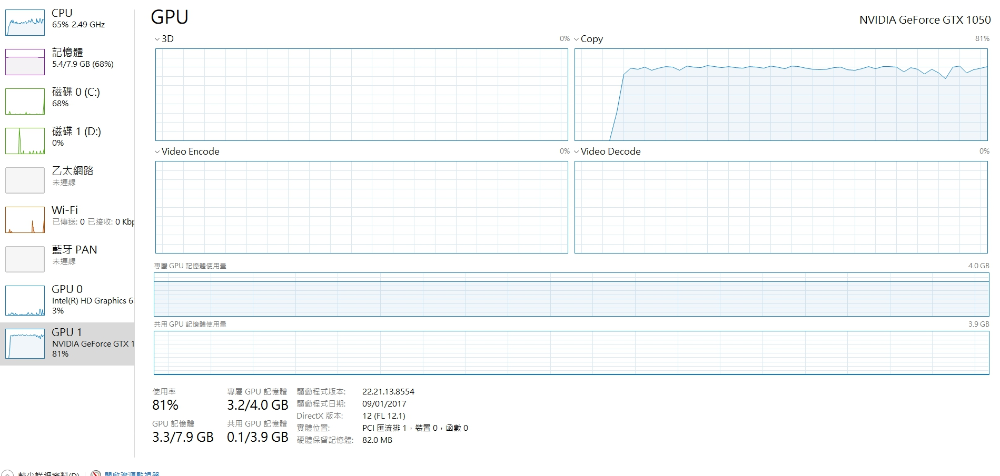

In [2]:
from IPython.display import Image
Image(filename = 'image/admin.jpg', width = 1000)

可以看到我們使用了80%的GPU以及65%CPU，成功的利用GPU進行運算。
接下來我們來試試看單獨使用 CPU 計算所需要的時間

## 單獨使用 CPU
我們必須讓 tensorflow 在運算裝置上單獨選擇 cpu 而這可以利用 <br>
with tf.device() <br>
來做到這個效果

將 with tf.device 安在 cnn_model_fn 之中

In [25]:
def cnn_model_fn(features, labels, mode):
# 使用 cpu 進行運算
  with tf.device('/cpu:0'): 
    """Model function for CNN."""
    # Input Layer
    input_layer = tf.reshape(features["x"], [-1, 28, 28, 1])

    # Convolutional Layer #1
    conv1 = tf.layers.conv2d(
        inputs=input_layer,
        filters=32,
        kernel_size=[5, 5],
        padding="same",
        activation=tf.nn.relu)

    # Pooling Layer #1
    pool1 = tf.layers.max_pooling2d(inputs=conv1, pool_size=[2, 2], strides=2)

    # Convolutional Layer #2 and Pooling Layer #2
    conv2 = tf.layers.conv2d(
        inputs=pool1,
        filters=64,
        kernel_size=[5, 5],
        padding="same",
        activation=tf.nn.relu)
    pool2 = tf.layers.max_pooling2d(inputs=conv2, pool_size=[2, 2], strides=2)

    # Dense Layer
    pool2_flat = tf.reshape(pool2, [-1, 7 * 7 * 64])
    dense = tf.layers.dense(inputs=pool2_flat, units=1024, activation=tf.nn.relu)
    dropout = tf.layers.dropout(
        inputs=dense, rate=0.4, training=mode == tf.estimator.ModeKeys.TRAIN)

    # Logits Layer
    logits = tf.layers.dense(inputs=dropout, units=10)

    predictions = {
        # Generate predictions (for PREDICT and EVAL mode)
        "classes": tf.argmax(input=logits, axis=1),
        # Add `softmax_tensor` to the graph. It is used for PREDICT and by the
        # `logging_hook`.
        "probabilities": tf.nn.softmax(logits, name="softmax_tensor")
    }

    if mode == tf.estimator.ModeKeys.PREDICT:
      return tf.estimator.EstimatorSpec(mode=mode, predictions=predictions)

    # Calculate Loss (for both TRAIN and EVAL modes)
    loss = tf.losses.sparse_softmax_cross_entropy(labels=labels, logits=logits)

    # Configure the Training Op (for TRAIN mode)
    if mode == tf.estimator.ModeKeys.TRAIN:
      optimizer = tf.train.GradientDescentOptimizer(learning_rate=0.001)
      train_op = optimizer.minimize(
          loss=loss,
          global_step=tf.train.get_global_step())
      return tf.estimator.EstimatorSpec(mode=mode, loss=loss, train_op=train_op)

    # Add evaluation metrics (for EVAL mode)
    eval_metric_ops = {
        "accuracy": tf.metrics.accuracy(
            labels=labels, predictions=predictions["classes"])}
    return tf.estimator.EstimatorSpec(
        mode=mode, loss=loss, eval_metric_ops=eval_metric_ops)

In [26]:
if __name__ == "__main__":
    tf.app.run()

Extracting MNIST-data\train-images-idx3-ubyte.gz
Extracting MNIST-data\train-labels-idx1-ubyte.gz
Extracting MNIST-data\t10k-images-idx3-ubyte.gz
Extracting MNIST-data\t10k-labels-idx1-ubyte.gz
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_keep_checkpoint_every_n_hours': 10000, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000259D5A49198>, '_save_checkpoints_secs': 600, '_tf_random_seed': None, '_service': None, '_session_config': None, '_num_worker_replicas': 1, '_evaluation_master': '', '_model_dir': '/tmp/mnist_convnet_model', '_keep_checkpoint_max': 5, '_is_chief': True, '_distribute': None, '_log_step_count_steps': 100, '_task_id': 0, '_save_summary_steps': 100, '_master': '', '_save_checkpoints_steps': None, '_task_type': 'worker', '_num_ps_replicas': 0, '_global_id_in_cluster': 0}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph w

INFO:tensorflow:loss = 0.007902555, step = 180004
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.00000008 0.00015991
  0.99984    0.         0.         0.        ]
 [0.00000032 0.9999503  0.0000003  0.         0.00004369 0.
  0.0000012  0.00000383 0.00000018 0.        ]
 [0.         0.00002337 0.00000181 0.00000005 0.9999367  0.00000198
  0.00000001 0.00003399 0.00000059 0.00000139]
 [0.         0.         0.         0.9999999  0.         0.00000012
  0.         0.         0.00000006 0.        ]
 [0.         0.         0.         0.         0.         1.
  0.00000002 0.         0.00000004 0.00000004]
 [0.         0.00000015 0.0000004  0.00000188 0.         0.
  0.         0.99999726 0.         0.00000032]
 [0.00000053 0.00000011 0.00013251 0.00000453 0.         0.
  0.         0.9998621  0.         0.00000027]
 [0.00000013 0.         0.00000001 0.00000008 0.         0.00290196
  0.99709773 0.         0.00000013 0.        ]
 [0.         0.         0.    

INFO:tensorflow:global_step/sec: 5.56136
INFO:tensorflow:probabilities = [[0.         0.00000285 0.00000001 0.00000001 0.9999871  0.00000002
  0.00000001 0.00000374 0.00000009 0.00000621]
 [0.00000024 0.9998722  0.00000039 0.         0.00011291 0.
  0.00000021 0.00000628 0.00000764 0.00000017]
 [0.00021761 0.00014825 0.00164215 0.00019593 0.00016397 0.00729234
  0.00012166 0.00126471 0.00087124 0.9880822 ]
 [0.         0.         0.         1.         0.         0.00000001
  0.         0.         0.         0.        ]
 [0.         0.00000003 0.9999937  0.00000007 0.00000588 0.00000002
  0.         0.00000029 0.         0.00000014]
 [0.00000219 0.00000667 0.00056114 0.00005623 0.00000009 0.
  0.         0.9993123  0.00001266 0.00004877]
 [0.0007649  0.00000943 0.08228016 0.00218863 0.00000031 0.00154469
  0.00000004 0.9123923  0.00065558 0.00016402]
 [0.00000053 0.99999714 0.00000034 0.         0.00000047 0.
  0.00000006 0.00000002 0.00000139 0.        ]
 [0.00000002 0.         0.99998

INFO:tensorflow:loss = 0.019117713, step = 180104 (17.982 sec)
INFO:tensorflow:probabilities = [[0.00000254 0.00000025 0.00000138 0.0000121  0.00031664 0.00000005
  0.00000006 0.00028314 0.00006558 0.99931824]
 [0.         0.         0.00000031 0.00000281 0.00000021 0.00000005
  0.00000014 0.00000002 0.9999964  0.00000001]
 [0.         0.         0.         0.9999963  0.         0.00000374
  0.         0.         0.00000001 0.00000002]
 [0.00000001 0.00001635 0.00000002 0.00000041 0.999569   0.00000101
  0.000008   0.00000333 0.00000043 0.00040148]
 [0.00000001 0.00000002 0.99998856 0.00000083 0.00000007 0.
  0.         0.00000148 0.00000907 0.        ]
 [0.         0.         0.         0.00000188 0.00000482 0.
  0.         0.00000177 0.00000898 0.9999826 ]
 [0.         0.         0.         0.00000001 0.         0.9999994
  0.         0.00000001 0.00000058 0.00000001]
 [0.         0.00000001 0.00000032 0.00000011 0.         0.
  0.         0.99999905 0.         0.00000046]
 [0.000003

INFO:tensorflow:global_step/sec: 5.68057
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9999919  0.
  0.         0.         0.         0.00000812]
 [0.         0.00000015 0.         0.00000419 0.0000419  0.00029721
  0.00003136 0.00000019 0.9996247  0.00000029]
 [0.00000038 0.00004819 0.00000022 0.0002545  0.00000094 0.00000006
  0.         0.9988954  0.0000001  0.00080026]
 [0.00001696 0.99993134 0.00000765 0.         0.00001375 0.00000001
  0.00000021 0.00000662 0.00002182 0.00000183]
 [0.         0.         0.         0.00000724 0.         0.99654394
  0.00000001 0.         0.00329933 0.00014944]
 [0.00034963 0.00000016 0.00000715 0.00001589 0.00019713 0.00000116
  0.00013046 0.00047187 0.00025836 0.9985682 ]
 [0.00009057 0.00000064 0.00000116 0.00000023 0.00000028 0.00003991
  0.9899985  0.         0.00986828 0.00000048]
 [0.         0.         0.         0.00000001 0.         1.
  0.         0.         0.00000002 0.        ]
 [0.00000003 0.        

INFO:tensorflow:loss = 0.007312084, step = 180204 (17.605 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.9999999  0.         0.         0.
  0.         0.00000016 0.         0.        ]
 [0.00000078 0.9999579  0.00000002 0.         0.00000614 0.00000001
  0.00000002 0.00003487 0.00000006 0.00000025]
 [0.         0.00000798 0.00000001 0.         0.9999796  0.
  0.         0.00000007 0.00000001 0.00001233]
 [0.00000007 0.00002911 0.00000001 0.0000003  0.00000033 0.00000065
  0.         0.99986064 0.00000076 0.00010806]
 [0.         0.         0.00000004 0.99999404 0.         0.00000548
  0.         0.         0.00000018 0.00000022]
 [0.00000029 0.00000079 0.00000001 0.00007105 0.0000103  0.00000126
  0.         0.00019548 0.00000018 0.99972063]
 [0.00000075 0.         0.00000015 0.00497711 0.00000015 0.99490535
  0.0000561  0.00000035 0.00005352 0.00000648]
 [0.         0.         0.         0.00000001 0.         0.9998789
  0.00000078 0.         0.00011919 0.0000011 ]
 [

INFO:tensorflow:global_step/sec: 5.12469
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999702  0.         0.00002681
  0.         0.         0.00000278 0.00000022]
 [0.00000009 0.9998672  0.00000067 0.00000004 0.00001894 0.00000016
  0.00004405 0.00000003 0.00006883 0.00000001]
 [0.00220737 0.00000039 0.00000111 0.00084558 0.00005261 0.9932064
  0.00002337 0.00316814 0.00044612 0.00004898]
 [0.00000002 0.00000064 0.00000015 0.01307855 0.02999219 0.00085318
  0.00000097 0.00039086 0.00000649 0.9556769 ]
 [0.         0.         0.         0.00000033 0.00000166 0.00000014
  0.         0.0000013  0.00000243 0.99999416]
 [0.00000059 0.00005046 0.00000186 0.00004571 0.00156617 0.00001752
  0.0000033  0.00006895 0.00918505 0.9890604 ]
 [0.00000321 0.00001232 0.00000154 0.00000012 0.00000017 0.00004987
  0.9994881  0.         0.00044461 0.00000002]
 [0.85236543 0.00000002 0.00213867 0.00004212 0.         0.00410571
  0.00001826 0.00005685 0.14127177 0.00000113]
 [0.    

INFO:tensorflow:loss = 0.016896743, step = 180304 (19.517 sec)
INFO:tensorflow:probabilities = [[0.00000066 0.00030157 0.00000373 0.00000129 0.9992384  0.00005589
  0.00003939 0.00000588 0.00003607 0.00031719]
 [0.         0.99999654 0.00000079 0.         0.00000101 0.
  0.         0.00000154 0.00000003 0.        ]
 [0.00000382 0.999793   0.0000292  0.00000001 0.00016768 0.00000001
  0.00000103 0.00000196 0.00000334 0.        ]
 [0.00000016 0.00000001 0.00000002 0.00000002 0.00000037 0.00000001
  0.         0.00000546 0.00000012 0.9999938 ]
 [0.00000418 0.         0.00000001 0.00000004 0.         0.00004513
  0.99993837 0.         0.0000123  0.00000002]
 [0.00000005 0.         0.00000006 0.00001038 0.00000001 0.99853516
  0.00072736 0.00000001 0.00009356 0.00063342]
 [0.         0.00000005 0.00000001 0.00000065 0.         0.
  0.         0.9999932  0.         0.00000602]
 [0.         0.0000058  0.         0.         0.00002363 0.00000001
  0.         0.99996734 0.         0.00000318]
 

INFO:tensorflow:global_step/sec: 4.90905
INFO:tensorflow:probabilities = [[0.99999976 0.         0.00000019 0.         0.         0.00000002
  0.         0.00000001 0.         0.00000004]
 [0.         0.         0.         0.00041731 0.         0.99950683
  0.         0.         0.00004393 0.00003189]
 [0.         0.         0.         0.00000112 0.00000003 0.9999976
  0.00000111 0.         0.00000001 0.00000009]
 [0.         0.00000001 0.         0.         0.99999964 0.
  0.         0.00000038 0.         0.00000001]
 [0.         0.00000002 0.00000002 0.00000046 0.         0.
  0.         0.9999995  0.         0.        ]
 [0.         0.         0.         0.99998033 0.         0.00001958
  0.         0.         0.         0.00000006]
 [0.00000084 0.         0.00000002 0.00088971 0.00000013 0.99902344
  0.00006927 0.00000001 0.00000321 0.00001334]
 [0.00114413 0.00000299 0.00000088 0.0000001  0.00002078 0.00001908
  0.9988121  0.00000001 0.00000001 0.00000002]
 [0.         0.         

INFO:tensorflow:loss = 0.015906395, step = 180404 (20.369 sec)
INFO:tensorflow:probabilities = [[0.00000092 0.99988174 0.00000036 0.00000046 0.00005331 0.00000025
  0.00001592 0.00000123 0.00004553 0.00000024]
 [0.00000018 0.         0.00004809 0.         0.         0.00000335
  0.00000277 0.00000157 0.99993265 0.00001148]
 [0.00000006 0.00000002 0.         0.00115584 0.00000002 0.99883384
  0.00000025 0.00000003 0.00000554 0.00000436]
 [0.         0.00000003 0.         0.         0.999995   0.00000002
  0.         0.00000024 0.00000427 0.00000047]
 [0.         0.00000324 0.99999404 0.00000002 0.         0.
  0.         0.00000278 0.         0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000002 0.00002541 0.00002971 0.00000057 0.
  0.         0.99994385 0.         0.00000045]
 [0.         0.00000121 0.9999987  0.00000008 0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000648 0.00

INFO:tensorflow:global_step/sec: 5.48729
INFO:tensorflow:probabilities = [[0.00000008 0.00001911 0.00005269 0.00004852 0.00000053 0.
  0.00000001 0.99960476 0.00026535 0.00000892]
 [0.00000002 0.00001621 0.00000078 0.00000008 0.9975399  0.00000144
  0.0000001  0.00000466 0.00000586 0.00243106]
 [0.00000025 0.00000003 0.00000164 0.00000009 0.00039295 0.00000008
  0.00000001 0.00000548 0.00000273 0.9995968 ]
 [0.00000001 0.00000009 0.00000001 0.99998987 0.         0.00000017
  0.         0.         0.         0.00000995]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000109 0.00000001 0.00000089 0.00000042 0.00000002 0.99997675
  0.00000378 0.00000548 0.0000096  0.0000019 ]
 [0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.        ]
 [0.00000641 0.00000001 0.00000021 0.00612955 0.00000777 0.99360174
  0.000004   0.00000003 0.00000257 0.00024763]
 [0.00000002 0.         0.00000

INFO:tensorflow:loss = 0.012443541, step = 180504 (18.222 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.         0.00000002 0.00000026 0.00000035 0.00000026
  0.         0.00005718 0.00000004 0.9999418 ]
 [0.99998367 0.         0.00000002 0.         0.         0.00001125
  0.00000393 0.00000036 0.00000001 0.00000087]
 [0.         0.         0.00000002 0.         0.         0.
  1.         0.         0.00000005 0.        ]
 [0.0000001  0.         0.         0.         0.00000002 0.00000002
  0.99999976 0.         0.00000017 0.        ]
 [0.9999689  0.         0.00000989 0.         0.         0.00000072
  0.00002016 0.00000002 0.00000003 0.00000033]
 [0.         0.00000021 0.00000004 0.0056132  0.         0.99371016
  0.         0.         0.00000322 0.00067315]
 [0.00000079 0.00000006 0.00006364 0.9994325  0.         0.00041184
  0.00000003 0.00000045 0.0000901  0.00000057]
 [0.00001194 0.00000002 0.99979144 0.00001504 0.00000019 0.00000011
  0.00000007 0.00010697 0.00007384 0.000

INFO:tensorflow:global_step/sec: 5.79848
INFO:tensorflow:probabilities = [[0.9999974  0.         0.00000022 0.00000051 0.         0.00000114
  0.         0.00000001 0.         0.0000007 ]
 [0.         0.00000002 0.         0.00012421 0.00000052 0.00375227
  0.00000021 0.00036814 0.00002779 0.9957268 ]
 [0.         0.00000011 0.0000001  0.9999596  0.         0.00000057
  0.00000001 0.00000006 0.00003369 0.00000585]
 [0.         0.00000003 0.00000001 0.         1.         0.
  0.         0.00000001 0.00000003 0.        ]
 [0.         0.         0.         0.00000099 0.00000027 0.00000021
  0.         0.00000042 0.00000002 0.9999981 ]
 [0.         0.         0.         0.00001551 0.00000161 0.00000145
  0.         0.00000124 0.00000032 0.99997985]
 [0.99999774 0.         0.00000027 0.         0.         0.
  0.         0.00000011 0.         0.00000187]
 [0.99995804 0.         0.00000013 0.         0.00000029 0.
  0.00000659 0.00000146 0.00000013 0.00003352]
 [0.         0.         0.99999

INFO:tensorflow:loss = 0.027878534, step = 180604 (17.245 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.         0.00000002 0.         0.         0.00000002
  0.         0.99996233 0.         0.0000375 ]
 [0.         0.00000109 0.00001148 0.99998105 0.         0.0000031
  0.         0.00000041 0.00000128 0.00000169]
 [0.         0.         0.         0.00000172 0.00000018 0.00000284
  0.         0.00000798 0.00000059 0.99998665]
 [0.         0.00000003 0.00000001 0.00000219 0.         0.
  0.         0.9999976  0.         0.00000009]
 [0.00000001 0.00000001 0.0034048  0.01836299 0.         0.
  0.         0.9782242  0.00000414 0.00000387]
 [0.00000007 0.         0.         0.00011759 0.         0.99968934
  0.00000006 0.00000006 0.0001287  0.00006412]
 [0.0000004  0.00046849 0.00000049 0.0005534  0.9315105  0.00000165
  0.00000007 0.00280257 0.00013048 0.06453181]
 [0.00000025 0.99990296 0.00003215 0.         0.00004939 0.00000003
  0.00000006 0.00000896 0.00000637 0.00000001]
 [

INFO:tensorflow:global_step/sec: 5.83306
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.00000003 0.00000002
  1.         0.         0.         0.        ]
 [0.00001074 0.00000051 0.00000689 0.00000862 0.00011595 0.0000003
  0.0000016  0.00000921 0.00013161 0.99971455]
 [0.         0.         0.         0.00000012 0.00000001 0.9999443
  0.00004838 0.         0.00000075 0.0000065 ]
 [0.00000005 0.0000002  0.00000714 0.00546839 0.00000055 0.93126106
  0.00000821 0.00054496 0.00091371 0.06179566]
 [0.00029463 0.00000243 0.00001285 0.         0.99967945 0.00000001
  0.00000695 0.00000346 0.00000008 0.00000016]
 [0.         0.         0.         1.         0.         0.00000005
  0.         0.         0.00000002 0.        ]
 [0.00000218 0.00000092 0.00000004 0.00000001 0.00000149 0.00000052
  0.         0.99977773 0.00000033 0.00021677]
 [0.00000001 0.         0.00000002 0.99942833 0.         0.00031941
  0.         0.00000002 0.0000062  0.00024606]
 [0.     

INFO:tensorflow:loss = 0.008845033, step = 180704 (17.178 sec)
INFO:tensorflow:probabilities = [[0.00000009 0.00000001 0.00040748 0.00000431 0.         0.
  0.         0.9995859  0.         0.00000209]
 [0.99999905 0.         0.         0.         0.         0.00000003
  0.00000005 0.00000094 0.00000002 0.        ]
 [0.00000101 0.9999893  0.00000016 0.         0.00000163 0.
  0.00000014 0.00000082 0.00000704 0.00000002]
 [0.00000037 0.         0.00000001 0.00000002 0.00000049 0.
  0.         0.99997234 0.00000003 0.00002687]
 [0.         0.         0.00000004 0.00011889 0.         0.00000087
  0.         0.00000003 0.99987817 0.00000201]
 [0.0000006  0.00000002 0.00002184 0.00005213 0.00000001 0.00808012
  0.00000002 0.00000127 0.9917888  0.00005522]
 [0.00000012 0.9838307  0.00003763 0.00769663 0.00026212 0.00004592
  0.00000081 0.00004171 0.00787965 0.00020457]
 [0.         0.00000084 0.         0.00000316 0.9971003  0.00000018
  0.         0.00249873 0.00000055 0.00039605]
 [0.00000

INFO:tensorflow:global_step/sec: 5.85268
INFO:tensorflow:probabilities = [[0.00001286 0.00006625 0.00001023 0.0000015  0.00000019 0.00000884
  0.00000045 0.00048433 0.99575317 0.00366223]
 [0.00000007 0.99963856 0.00000046 0.00000555 0.00033608 0.00000014
  0.00000124 0.00000776 0.00000789 0.00000232]
 [0.99994826 0.         0.00004847 0.         0.00000003 0.
  0.0000031  0.00000001 0.00000018 0.        ]
 [0.         0.         0.000021   0.00040048 0.         0.
  0.         0.         0.9995784  0.00000008]
 [0.00000015 0.00000031 0.         0.00000706 0.00019124 0.00000083
  0.00000002 0.00003531 0.00000013 0.999765  ]
 [0.00000738 0.9997373  0.00000635 0.00000003 0.00004367 0.00000002
  0.00000021 0.00002629 0.00017505 0.00000364]
 [0.99998415 0.         0.00000005 0.         0.         0.00000726
  0.00000727 0.00000006 0.00000114 0.        ]
 [0.0000006  0.9996741  0.00000404 0.00000065 0.0000214  0.00000292
  0.0000018  0.00000118 0.00026764 0.00002559]
 [0.9999995  0.        

INFO:tensorflow:loss = 0.006401456, step = 180804 (17.053 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.00000087 0.00000002
  0.99999905 0.         0.         0.        ]
 [0.00003596 0.0000115  0.00003178 0.00000784 0.00000566 0.00091468
  0.9979196  0.         0.00107281 0.00000009]
 [0.         0.         0.         0.         0.9999908  0.
  0.00000083 0.00000829 0.00000002 0.        ]
 [0.         0.00000012 0.00000087 0.00000452 0.         0.
  0.         0.9999943  0.00000004 0.00000018]
 [0.00000005 0.00000021 0.00000965 0.         0.9999857  0.00000014
  0.00000227 0.00000181 0.00000023 0.00000004]
 [0.         0.99996257 0.00000062 0.         0.00003657 0.
  0.00000003 0.00000005 0.00000024 0.        ]
 [0.00000192 0.00000003 0.00002093 0.00000293 0.00000499 0.00000001
  0.00000001 0.00001537 0.00000665 0.9999472 ]
 [0.00000195 0.00023152 0.00125384 0.00925844 0.00000004 0.00000002
  0.         0.9863019  0.00003065 0.0029217 ]
 [0.00000

INFO:tensorflow:global_step/sec: 5.85643
INFO:tensorflow:probabilities = [[0.         0.000001   0.00000003 0.99963415 0.00000001 0.00027413
  0.         0.00000053 0.00001337 0.00007685]
 [0.         0.00000005 0.00000791 0.00000166 0.00000003 0.
  0.         0.99998856 0.00000014 0.00000163]
 [0.         0.         0.         0.         0.9999995  0.
  0.         0.00000044 0.         0.        ]
 [0.00000004 0.00000003 0.00000287 0.00033484 0.         0.00161124
  0.00006984 0.00000001 0.99797875 0.00000235]
 [0.00093797 0.00000321 0.9985876  0.00004657 0.00000029 0.0000016
  0.0000061  0.00000459 0.00040859 0.00000373]
 [0.00096338 0.00000655 0.00000021 0.00000002 0.00005126 0.00000165
  0.9989594  0.00000024 0.00000005 0.00001728]
 [0.99999964 0.         0.00000002 0.         0.         0.00000008
  0.00000008 0.00000001 0.         0.00000009]
 [0.         0.         0.00000018 0.00010597 0.         0.00000515
  0.         0.         0.99988663 0.00000205]
 [0.11798212 0.         

INFO:tensorflow:loss = 0.024453549, step = 180904 (17.074 sec)
INFO:tensorflow:probabilities = [[0.00017782 0.0000219  0.00002523 0.00018237 0.00001833 0.00019016
  0.9988738  0.00000445 0.00050545 0.0000005 ]
 [0.000003   0.00000042 0.00051915 0.00639038 0.00004275 0.04288954
  0.00003021 0.00100453 0.9481703  0.0009497 ]
 [0.0000002  0.00000001 0.9999287  0.0000075  0.00005341 0.00000975
  0.         0.00000036 0.         0.        ]
 [0.00000094 0.         0.00000001 0.00000015 0.00000001 0.00513776
  0.9946883  0.         0.00017119 0.00000165]
 [0.00000001 0.00001701 0.00000231 0.         0.9999577  0.00000052
  0.00000004 0.00001827 0.         0.00000429]
 [0.         0.         0.         0.00000122 0.00000001 0.
  0.         0.9999912  0.         0.00000759]
 [0.0000047  0.00000004 0.00000411 0.00000003 0.00000522 0.00013425
  0.9998472  0.00000001 0.00000436 0.        ]
 [0.         0.00000001 0.00000002 0.00000448 0.         0.99999297
  0.00000233 0.         0.00000002 0.000

INFO:tensorflow:global_step/sec: 5.84185
INFO:tensorflow:probabilities = [[0.00000024 0.00000039 0.00000037 0.00000139 0.         0.
  0.         0.9999641  0.00000058 0.00003287]
 [0.         0.         0.         0.00437987 0.         0.995598
  0.         0.         0.00000145 0.00002073]
 [0.         0.         0.00000002 0.00000001 0.         0.
  0.         0.9999981  0.         0.00000195]
 [0.999851   0.         0.00005604 0.00000047 0.00000114 0.
  0.00008172 0.         0.0000091  0.0000005 ]
 [0.00000036 0.99997044 0.00000002 0.00000003 0.00000445 0.00000001
  0.00000052 0.0000025  0.00002119 0.00000059]
 [0.         0.00000005 0.00000428 0.9999956  0.         0.
  0.         0.00000005 0.00000007 0.00000004]
 [0.         0.00004733 0.9999405  0.00000441 0.         0.
  0.         0.00000773 0.         0.        ]
 [0.         0.0000385  0.         0.00000001 0.9998553  0.00000007
  0.00000019 0.00000151 0.00004555 0.00005877]
 [0.00000053 0.         0.00000063 0.00000355 0. 

INFO:tensorflow:loss = 0.052590728, step = 181004 (17.119 sec)
INFO:tensorflow:probabilities = [[0.         0.00000003 0.00000002 0.00002554 0.00002278 0.00000004
  0.         0.00000181 0.00000005 0.9999497 ]
 [0.00000005 0.9999436  0.00000001 0.         0.00000193 0.
  0.00000002 0.00005416 0.00000025 0.00000015]
 [0.00004858 0.00005678 0.00004066 0.00000015 0.37717256 0.00000428
  0.62267494 0.00000176 0.00000027 0.00000003]
 [0.99957544 0.00000732 0.00035443 0.         0.00000029 0.00000002
  0.00001333 0.00000991 0.00003922 0.00000022]
 [0.00000004 0.         0.00000004 0.00005326 0.00000802 0.00010531
  0.00000006 0.00059142 0.00010901 0.9991328 ]
 [0.00000002 0.00000032 0.00000074 0.00008082 0.00000026 0.00000009
  0.00000006 0.00000226 0.99940157 0.00051384]
 [0.         0.00000021 0.00000005 0.9992906  0.00000001 0.0000007
  0.         0.00000041 0.00065054 0.00005756]
 [0.0000001  0.999969   0.00000156 0.00000063 0.00000576 0.00000036
  0.00000087 0.00000718 0.00001456 0.0000

INFO:tensorflow:global_step/sec: 5.70728
INFO:tensorflow:probabilities = [[0.         0.00000472 0.00002225 0.00000002 0.9992368  0.00013079
  0.         0.00060389 0.0000004  0.00000113]
 [0.00000003 0.0000001  0.00000022 0.00000002 0.0000002  0.00000882
  0.9999882  0.         0.00000234 0.        ]
 [0.         0.00000029 0.         0.         0.9999919  0.
  0.         0.00000189 0.         0.00000593]
 [0.9999995  0.         0.00000005 0.         0.         0.00000001
  0.00000012 0.0000001  0.00000023 0.00000003]
 [0.00000024 0.99999714 0.00000006 0.         0.00000015 0.
  0.00000001 0.00000039 0.000002   0.        ]
 [0.00000006 0.00000002 0.00000001 0.00000123 0.00000298 0.00000389
  0.         0.00001234 0.00000048 0.999979  ]
 [0.         0.00000006 0.00000001 0.00009248 0.00000482 0.0000001
  0.         0.00000553 0.00000013 0.9998969 ]
 [0.         0.         0.00000089 0.99945647 0.         0.00040401
  0.         0.         0.0001265  0.00001205]
 [0.00000005 0.0000003  

INFO:tensorflow:loss = 0.0033702746, step = 181104 (17.521 sec)
INFO:tensorflow:probabilities = [[0.         0.00000284 0.00000007 0.000001   0.00000142 0.
  0.         0.99999344 0.00000003 0.00000116]
 [0.99999833 0.         0.00000161 0.         0.         0.
  0.00000001 0.         0.00000003 0.        ]
 [0.00000004 0.00000018 0.00132417 0.00002707 0.00000001 0.
  0.         0.9986457  0.00000001 0.00000286]
 [0.         0.00000014 0.9999782  0.00000886 0.         0.
  0.         0.00000036 0.00001257 0.        ]
 [0.9999995  0.         0.00000024 0.         0.         0.
  0.         0.00000008 0.         0.0000001 ]
 [0.00000003 0.00000001 0.00000004 0.00000006 0.00000695 0.
  0.         0.00004865 0.00000003 0.9999442 ]
 [0.         0.         0.00000006 0.         0.         0.00000631
  0.9999937  0.         0.00000003 0.        ]
 [0.         0.00000001 0.00000003 0.99854386 0.         0.00010079
  0.00000048 0.00000001 0.00135097 0.00000396]
 [0.00000003 0.00003356 0.000005

INFO:tensorflow:global_step/sec: 5.16824
INFO:tensorflow:probabilities = [[0.00000065 0.00000129 0.00000036 0.00000142 0.00000015 0.00000003
  0.         0.99991727 0.00000044 0.00007828]
 [0.99994123 0.         0.00000077 0.         0.00000171 0.
  0.00000018 0.00000029 0.00000003 0.00005603]
 [0.         0.00000002 0.         0.         0.9999989  0.
  0.         0.         0.         0.00000105]
 [0.         0.00000006 0.00000022 0.00000001 0.00000821 0.
  0.         0.9999906  0.00000009 0.00000088]
 [0.00000006 0.00000165 0.00001103 0.00000076 0.00000001 0.00000025
  0.00000003 0.         0.9999858  0.00000032]
 [0.00000938 0.0000163  0.00107206 0.18368882 0.0002884  0.02525705
  0.00131018 0.0001121  0.7876518  0.000594  ]
 [0.         0.         0.00000001 0.00000126 0.         0.99998105
  0.         0.         0.00001574 0.00000196]
 [0.00000001 0.         0.00000001 0.         0.00000783 0.00000044
  0.99999166 0.         0.         0.        ]
 [0.00043328 0.00000711 0.00000

INFO:tensorflow:loss = 0.056093294, step = 181204 (19.349 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9999999  0.
  0.         0.00000006 0.         0.        ]
 [0.00000015 0.99890316 0.00000182 0.00000474 0.00095673 0.00000045
  0.00000036 0.00001119 0.00011507 0.00000644]
 [0.9999902  0.         0.00000949 0.         0.         0.
  0.00000014 0.00000001 0.0000001  0.        ]
 [0.         0.00000008 0.9999999  0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000002 0.00000006 0.00000103 0.00000074 0.00013744 0.00092438
  0.         0.04618913 0.00000943 0.95273775]
 [0.         0.         0.         0.999995   0.         0.
  0.         0.         0.00000503 0.        ]
 [0.00001227 0.00000015 0.9712692  0.013017   0.00000154 0.00000177
  0.0000058  0.01531669 0.00036098 0.00001467]
 [0.         0.9999858  0.00000193 0.00000001 0.00000554 0.
  0.00000587 0.         0.000001   0.00000001]
 [0.         0.00000002 0

INFO:tensorflow:global_step/sec: 5.78932
INFO:tensorflow:probabilities = [[0.         0.         1.         0.00000001 0.00000001 0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.00000002 0.0000335  0.
  0.         0.00000129 0.00000008 0.9999651 ]
 [0.00000003 0.00000227 0.00000007 0.00751695 0.00000214 0.00000458
  0.00000008 0.00000053 0.99243987 0.00003345]
 [0.00000012 0.00000001 0.00000002 0.00000016 0.00000003 0.00054261
  0.9994537  0.         0.00000339 0.        ]
 [0.00000003 0.00000076 0.00000026 0.0000099  0.999818   0.00002833
  0.0000015  0.00000046 0.0000031  0.00013753]
 [0.00000012 0.99978    0.00000012 0.         0.00001896 0.00000002
  0.00000023 0.00019637 0.00000421 0.00000003]
 [0.         0.         0.         0.         0.         0.00000016
  0.9999999  0.         0.         0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000009 0.0000028  0.99998

INFO:tensorflow:loss = 0.043972943, step = 181304 (17.272 sec)
INFO:tensorflow:probabilities = [[0.9999999  0.         0.00000017 0.         0.         0.00000001
  0.         0.00000001 0.         0.00000002]
 [0.00008425 0.00009479 0.000001   0.01806206 0.00341229 0.00018641
  0.0000018  0.00000718 0.77531433 0.20283587]
 [0.0000028  0.00000045 0.99751174 0.00000437 0.00000002 0.
  0.00000002 0.00247451 0.00000619 0.00000001]
 [0.00000003 0.00001178 0.00029357 0.62656945 0.00000004 0.00001688
  0.00000005 0.00033934 0.37276834 0.00000049]
 [0.         0.         0.         0.00000005 0.         0.9999999
  0.         0.         0.         0.00000007]
 [0.00005385 0.00002698 0.00001148 0.01404883 0.00012347 0.00002031
  0.00000044 0.00000154 0.98139775 0.00431534]
 [0.00000013 0.         0.         0.0048371  0.         0.9775904
  0.         0.00000186 0.0000001  0.01757037]
 [0.         0.00001184 0.99986815 0.00011899 0.0000003  0.00000001
  0.         0.         0.00000084 0.     

INFO:tensorflow:global_step/sec: 5.7979
INFO:tensorflow:probabilities = [[0.00000304 0.00120931 0.02704786 0.00000642 0.03835629 0.00030951
  0.9328884  0.00000002 0.00017913 0.00000002]
 [0.00000078 0.99999    0.00000005 0.         0.00000425 0.
  0.00000063 0.00000029 0.00000407 0.00000002]
 [0.99750286 0.0000129  0.00034244 0.00000011 0.00000426 0.00042375
  0.0016523  0.0000278  0.00003229 0.00000114]
 [0.00000917 0.00223869 0.00298827 0.93941337 0.00101284 0.04753084
  0.00004963 0.00000766 0.00139075 0.0053588 ]
 [0.9999788  0.         0.00002012 0.         0.         0.00000015
  0.00000021 0.         0.         0.00000073]
 [0.         0.         0.00000004 0.9999683  0.         0.00002858
  0.         0.         0.00000205 0.00000109]
 [0.00000005 0.99965286 0.00000091 0.00000011 0.00032073 0.00000001
  0.00000397 0.00000395 0.0000167  0.00000078]
 [0.         0.         0.00000018 0.         0.         0.
  0.         0.99999905 0.         0.00000072]
 [0.         0.         

INFO:tensorflow:loss = 0.02100346, step = 181404 (17.279 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.         0.99989724 0.
  0.00000003 0.00000402 0.00000533 0.00009338]
 [0.00000006 0.         0.00003323 0.0000077  0.         0.00000001
  0.00000003 0.         0.9999589  0.00000011]
 [0.         0.         0.00000003 0.         0.         0.00000061
  0.         0.         0.9999994  0.        ]
 [0.00000001 0.9999825  0.00000091 0.         0.0000061  0.
  0.         0.00001033 0.00000009 0.        ]
 [0.         0.         0.         0.00000247 0.00000003 0.
  0.         0.0000047  0.00000022 0.9999926 ]
 [0.         0.9999995  0.         0.         0.00000002 0.
  0.         0.00000046 0.00000002 0.        ]
 [0.00000032 0.         0.00000001 0.00000005 0.00000077 0.00000023
  0.99988544 0.         0.00011315 0.00000001]
 [0.00000455 0.9991429  0.00016062 0.00006071 0.00000419 0.00000017
  0.00009665 0.00005255 0.0004777  0.00000002]
 [0.00000009 0.000

INFO:tensorflow:global_step/sec: 5.8282
INFO:tensorflow:probabilities = [[0.         0.         0.00000028 0.         0.00000001 0.00000002
  0.         0.         0.99999964 0.00000003]
 [0.         0.         0.00000007 0.00000155 0.00008998 0.00000002
  0.         0.00001391 0.00006339 0.9998311 ]
 [0.99994457 0.         0.00000054 0.         0.         0.
  0.00000056 0.00005412 0.00000009 0.00000002]
 [0.00002812 0.00000214 0.9990182  0.00020357 0.         0.
  0.00000001 0.00000488 0.00074317 0.        ]
 [0.         0.         0.         1.         0.         0.00000001
  0.         0.         0.         0.        ]
 [0.00000005 0.00000825 0.00000856 0.00002605 0.00000006 0.
  0.         0.999902   0.00000001 0.00005497]
 [0.00000045 0.00000008 0.00000041 0.0001704  0.00000001 0.0000133
  0.00000127 0.00000003 0.9998093  0.0000048 ]
 [0.9999993  0.         0.00000002 0.         0.         0.
  0.00000003 0.00000056 0.         0.00000007]
 [0.         0.         0.         0.    

INFO:tensorflow:loss = 0.038630508, step = 181504 (17.128 sec)
INFO:tensorflow:probabilities = [[0.         0.00000102 0.00000002 0.         0.9999981  0.
  0.00000002 0.00000002 0.         0.00000084]
 [0.         0.99998856 0.00000003 0.00000001 0.00000807 0.00000001
  0.00000218 0.         0.00000114 0.        ]
 [0.00000001 0.00003562 0.99994266 0.00002031 0.         0.
  0.         0.0000001  0.00000132 0.        ]
 [0.00000012 0.00000029 0.00000002 0.         0.99991226 0.00000002
  0.0000068  0.00000004 0.00000001 0.00008042]
 [0.         0.         0.         0.00000025 0.00000007 0.
  0.         0.00000004 0.00000188 0.99999774]
 [0.00000006 0.00000001 0.00000006 0.00004246 0.00000017 0.99991524
  0.0000016  0.0000017  0.00003689 0.00000175]
 [0.         0.         0.         0.00000058 0.00001319 0.
  0.         0.00000022 0.00000201 0.999984  ]
 [0.00002822 0.         0.00000404 0.00001059 0.00007182 0.00030148
  0.00022572 0.00000511 0.9885119  0.01084117]
 [0.00000004 0.00

INFO:tensorflow:global_step/sec: 5.81019
INFO:tensorflow:probabilities = [[0.00000003 0.9999341  0.00000014 0.00000006 0.00000216 0.
  0.00000002 0.00001841 0.00004484 0.0000004 ]
 [0.         0.         0.00000055 0.99997234 0.         0.00002613
  0.         0.00000001 0.0000007  0.00000028]
 [0.00037358 0.00000494 0.00001892 0.00000446 0.         0.00035151
  0.00223879 0.00000061 0.99700683 0.00000038]
 [0.9998827  0.00000002 0.00010908 0.         0.00000013 0.
  0.0000075  0.0000001  0.0000005  0.00000002]
 [0.00000109 0.00001076 0.99714905 0.00036357 0.         0.00000001
  0.00000007 0.00247422 0.00000101 0.00000001]
 [0.00000004 0.9999213  0.00000001 0.00000096 0.00003164 0.00000001
  0.00000005 0.00000354 0.00004175 0.00000089]
 [0.         0.         0.00000027 0.99934345 0.         0.0006152
  0.         0.00000002 0.00000915 0.00003189]
 [0.00000049 0.9961306  0.00000872 0.00000274 0.0000577  0.00000007
  0.00000058 0.00377816 0.00001351 0.00000741]
 [0.         0.         

INFO:tensorflow:loss = 0.008734913, step = 181604 (17.211 sec)
INFO:tensorflow:probabilities = [[0.99998236 0.         0.0000041  0.         0.00000005 0.00000019
  0.00000927 0.00000381 0.00000003 0.00000024]
 [0.         0.         0.         0.00000005 0.         0.99999964
  0.         0.         0.00000009 0.00000021]
 [0.         0.         0.00000017 0.99999976 0.         0.00000013
  0.         0.         0.00000004 0.        ]
 [0.000674   0.00002508 0.00023447 0.78323776 0.00000005 0.21475741
  0.00000024 0.00000025 0.00035453 0.00071614]
 [0.         0.00000001 0.00000001 0.         0.9999939  0.
  0.         0.00000038 0.         0.00000573]
 [0.00000047 0.00000379 0.00014884 0.0030342  0.00000547 0.00000052
  0.00000281 0.00002587 0.99516857 0.00160947]
 [0.         0.         0.00000001 0.9999999  0.         0.00000003
  0.         0.         0.         0.00000007]
 [0.00000214 0.00000006 0.00000005 0.00002416 0.0000003  0.9763783
  0.02245623 0.00000004 0.00036739 0.0007

INFO:tensorflow:global_step/sec: 5.86912
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999999  0.         0.00000014
  0.         0.         0.00000004 0.        ]
 [0.         0.         0.00000002 0.9999906  0.         0.00000102
  0.         0.         0.00000807 0.00000021]
 [0.0000002  0.00000189 0.00000013 0.00000002 0.00001367 0.0000002
  0.9999839  0.         0.         0.        ]
 [0.         0.         0.         0.9996736  0.         0.00016732
  0.         0.00000001 0.00002383 0.00013524]
 [0.         0.         0.00000003 0.00000041 0.         0.00000009
  0.         0.         0.9999995  0.00000001]
 [0.         0.00000001 0.9996383  0.00035693 0.         0.
  0.         0.00000044 0.00000435 0.00000001]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000186 0.00008068 0.9947125  0.00302202 0.00006356 0.00011958
  0.00042688 0.00000218 0.00157071 0.00000024]
 [0.         0.         

INFO:tensorflow:loss = 0.17371477, step = 181704 (17.038 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.         0.00000225 0.00000013
  0.9999887  0.         0.00000899 0.        ]
 [0.00000013 0.00000017 0.00001593 0.00002884 0.00000244 0.00000009
  0.         0.00000375 0.9999485  0.00000011]
 [0.00000001 0.00000006 0.00000031 0.9999299  0.         0.00006087
  0.         0.00000013 0.00000697 0.00000174]
 [0.00000012 0.00000002 0.00000041 0.00000001 0.00000215 0.00000001
  0.99999595 0.         0.00000134 0.        ]
 [0.00000796 0.00000451 0.00000092 0.00000169 0.00000008 0.00009255
  0.99969864 0.00000001 0.00019367 0.00000003]
 [0.99999833 0.         0.         0.         0.         0.00000002
  0.00000164 0.         0.         0.00000001]
 [0.9999945  0.         0.00000507 0.         0.         0.
  0.00000039 0.         0.00000005 0.        ]
 [0.00000032 0.00000006 0.00000328 0.         0.99999285 0.
  0.00000024 0.00000109 0.         0.00000212]
 [

INFO:tensorflow:global_step/sec: 5.84173
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000338 0.         0.9999113
  0.         0.00000006 0.00008531 0.00000005]
 [0.00000033 0.         0.00005364 0.00000002 0.         0.00000001
  0.00000009 0.         0.9999459  0.        ]
 [0.00000419 0.00000121 0.00000082 0.00000006 0.         0.00013571
  0.9997969  0.00000011 0.00004179 0.00001916]
 [0.00000001 0.00000002 0.0000001  0.00022983 0.00058999 0.00000001
  0.         0.00660668 0.0017265  0.9908468 ]
 [0.         0.         0.         0.00000302 0.         0.00000001
  0.         0.         0.999997   0.        ]
 [0.         0.         0.00000011 0.         0.         0.
  0.         0.         0.9999999  0.        ]
 [0.00000001 0.00000065 0.00000047 0.0000898  0.00009971 0.00000069
  0.         0.00003743 0.00006149 0.99970967]
 [0.         0.00000175 0.00001726 0.00000057 0.00003254 0.
  0.         0.99994075 0.         0.00000718]
 [0.99999976 0.         

INFO:tensorflow:loss = 0.00383295, step = 181804 (17.117 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.         0.         0.         0.         0.00000007
  0.99999976 0.         0.00000016 0.        ]
 [0.         0.         0.         0.9999919  0.         0.00000011
  0.         0.00000001 0.00000207 0.00000591]
 [0.0000001  0.00000022 0.00000542 0.00014609 0.0008022  0.00003975
  0.00000007 0.000221   0.00002523 0.99876   ]
 [0.         0.00000012 0.00000413 0.00000033 0.00000018 0.00000004
  0.00000003 0.00000001 0.999995   0.00000007]
 [0.         0.         0.         0.99999917 0.         0.
  0.         0.00000087 0.         0.00000004]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00001207 0.0005448  0.00001567 0.00000076 0.00007456 0.00431474
  0.99431396 0.00000001 0.00072308 0.00000051]
 [0.00000091 0.         0.00000014 0.00000002 0.         0.0000392
  0.9999391  0.         0.00002058 0.        ]
 [0

INFO:tensorflow:global_step/sec: 5.81976
INFO:tensorflow:probabilities = [[0.         0.         0.         1.         0.         0.00000005
  0.         0.         0.         0.        ]
 [0.00000001 0.00001962 0.         0.00000013 0.99936956 0.00000135
  0.00000017 0.00000036 0.00002279 0.00058618]
 [0.         0.00000533 0.00000001 0.         0.9999945  0.
  0.         0.00000003 0.         0.00000009]
 [0.00000005 0.99960643 0.00000369 0.00000957 0.00007323 0.00000007
  0.00000063 0.0000262  0.00027855 0.00000151]
 [0.00000752 0.00000222 0.00000051 0.9217886  0.00000054 0.07610241
  0.00000659 0.00001106 0.0000519  0.00202868]
 [0.00000009 0.99763036 0.00001513 0.00000031 0.00007448 0.00000002
  0.0000018  0.00014278 0.00213441 0.00000055]
 [0.         0.0000264  0.00000012 0.00002943 0.         0.
  0.         0.999944   0.         0.00000015]
 [0.         0.         0.00000053 0.00005592 0.00000004 0.00000034
  0.00000001 0.00000002 0.99993956 0.00000358]
 [0.         0.        

INFO:tensorflow:loss = 0.0030902945, step = 181904 (17.184 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.99999034 0.00000019 0.         0.00000012 0.
  0.         0.00000025 0.00000908 0.        ]
 [0.         0.         0.         0.99999595 0.         0.00000093
  0.         0.         0.00000008 0.00000298]
 [0.         0.99978775 0.00000002 0.00000056 0.00015787 0.00000001
  0.00000007 0.00000512 0.00003149 0.00001703]
 [0.00025253 0.00001993 0.00056827 0.00000581 0.00002536 0.00552136
  0.00228697 0.00000474 0.99131495 0.00000007]
 [0.00000037 0.         0.00000021 0.00000002 0.         0.00016138
  0.9972727  0.         0.00256524 0.00000003]
 [0.         0.         0.         0.00000443 0.00000029 0.0000002
  0.         0.00000194 0.00000085 0.99999225]
 [0.         0.         0.00000001 0.99999595 0.         0.00000385
  0.         0.         0.         0.0000002 ]
 [0.0000282  0.00000139 0.9999361  0.00000051 0.0000034  0.00000005
  0.0000074  0.000023   0.00000001 0.   

INFO:tensorflow:global_step/sec: 5.80827
INFO:tensorflow:probabilities = [[0.         0.00008293 0.0000002  0.00001086 0.         0.
  0.         0.9999038  0.00000188 0.0000002 ]
 [0.00000001 0.00000731 0.00000284 0.         0.9999875  0.00000001
  0.00000008 0.00000223 0.         0.        ]
 [0.00000438 0.00000004 0.00000722 0.00006017 0.00001416 0.00000628
  0.00000007 0.00026527 0.00002216 0.9996202 ]
 [0.         0.         0.00000038 0.00001574 0.00000011 0.00000051
  0.         0.00000049 0.99996567 0.00001701]
 [0.00000019 0.99986017 0.00000334 0.00000011 0.00012061 0.
  0.00000184 0.0000129  0.00000072 0.00000008]
 [0.00000042 0.00003175 0.00000002 0.00002539 0.00074724 0.00375621
  0.00000601 0.00023504 0.00002742 0.99517053]
 [0.00000006 0.0000004  0.00000029 0.0000001  0.00000072 0.00000154
  0.00000151 0.         0.99999535 0.        ]
 [0.00005954 0.         0.00000001 0.         0.00000269 0.00000418
  0.999926   0.00000002 0.00000769 0.        ]
 [0.00000007 0.        

INFO:tensorflow:loss = 0.002672878, step = 182004 (17.217 sec)
INFO:tensorflow:probabilities = [[0.         0.00000014 0.00000588 0.0000016  0.         0.
  0.         0.9999924  0.00000001 0.        ]
 [0.         0.00000001 0.00000001 0.00000004 0.99999654 0.00000004
  0.         0.00000021 0.         0.00000315]
 [0.00000019 0.00000024 0.00000917 0.00056296 0.00050196 0.00044566
  0.00000004 0.00000784 0.00000538 0.9984666 ]
 [0.00007487 0.00397581 0.00007231 0.00000053 0.9958112  0.0000138
  0.00002116 0.00001255 0.0000081  0.00000973]
 [0.00000131 0.00000004 0.00000014 0.00073658 0.000001   0.9971853
  0.00022748 0.00000041 0.00000222 0.00184556]
 [0.00000054 0.9999218  0.00000039 0.00000001 0.00000284 0.00000001
  0.000001   0.0000069  0.00006651 0.00000004]
 [0.9990144  0.         0.00000629 0.00005936 0.00000001 0.00038703
  0.00000005 0.00053277 0.         0.00000017]
 [0.00000007 0.00000458 0.00001773 0.0000003  0.9999671  0.00000063
  0.00000012 0.00000063 0.00000009 0.00000

INFO:tensorflow:global_step/sec: 5.86535
INFO:tensorflow:probabilities = [[0.         0.00000004 0.         0.         0.9999894  0.
  0.00000025 0.00000115 0.00000018 0.00000896]
 [0.         0.         0.         0.         0.         1.
  0.00000001 0.         0.         0.00000002]
 [0.9999932  0.00000001 0.00000662 0.         0.00000008 0.
  0.00000001 0.         0.         0.00000004]
 [0.00000115 0.         0.         0.00000005 0.         0.9771741
  0.02281617 0.         0.00000157 0.00000704]
 [0.00000001 0.99975735 0.00000018 0.00000051 0.00011856 0.00000026
  0.00000899 0.00000049 0.00011308 0.00000062]
 [0.00000004 0.00000001 0.00000278 0.00016244 0.         0.00000352
  0.00000036 0.         0.9998299  0.00000101]
 [0.00000068 0.99983656 0.0000059  0.00000008 0.00003486 0.00000002
  0.00000047 0.0001173  0.00000339 0.00000077]
 [0.00005846 0.00000023 0.00001077 0.00000485 0.00001874 0.00000338
  0.00000045 0.00221381 0.00001181 0.9976775 ]
 [0.00000005 0.9992637  0.000010

INFO:tensorflow:loss = 0.056132212, step = 182104 (17.049 sec)
INFO:tensorflow:probabilities = [[0.9999958  0.         0.00000406 0.         0.         0.
  0.         0.00000013 0.         0.00000003]
 [0.         0.         0.00000014 0.         0.9999993  0.
  0.         0.00000064 0.         0.        ]
 [0.         0.         0.         0.9999999  0.         0.00000001
  0.         0.         0.00000003 0.00000011]
 [0.00000356 0.00000022 0.00026227 0.00002742 0.00007252 0.00151253
  0.80780005 0.00000003 0.19032137 0.        ]
 [0.99978465 0.         0.00021303 0.         0.00000001 0.
  0.00000005 0.00000153 0.00000001 0.00000081]
 [0.00000539 0.00087204 0.00117748 0.00006792 0.00005883 0.00000001
  0.         0.98090345 0.00169795 0.01521694]
 [0.         0.         0.         0.         0.9994475  0.
  0.         0.00000288 0.00000026 0.00054937]
 [0.         0.         0.00000017 0.0011142  0.         0.
  0.         0.9988857  0.         0.        ]
 [0.         0.         1

INFO:tensorflow:global_step/sec: 5.87314
INFO:tensorflow:probabilities = [[0.00000001 0.00000001 0.0001335  0.00055802 0.         0.00000001
  0.         0.00000008 0.9993055  0.00000291]
 [0.00000049 0.00000006 0.00000003 0.         0.         0.00000006
  0.         0.00000008 0.9999993  0.        ]
 [0.00000126 0.00000141 0.00000607 0.00001381 0.00000596 0.00001906
  0.00000819 0.00000019 0.99993825 0.00000582]
 [0.0000032  0.999597   0.00000392 0.00000001 0.00021492 0.
  0.00000121 0.00005939 0.00012031 0.00000001]
 [0.         0.         0.         0.         0.         0.9999999
  0.         0.         0.00000007 0.00000001]
 [0.00000188 0.00000296 0.00000007 0.00000015 0.00000036 0.9988335
  0.00092182 0.00001025 0.00022195 0.00000704]
 [0.00000001 0.00003473 0.00016924 0.00021155 0.00000013 0.00002373
  0.00000767 0.00000022 0.99955124 0.00000147]
 [0.00001458 0.         0.         0.         0.         0.00000012
  0.9999678  0.         0.00001753 0.        ]
 [0.00000009 0.  

INFO:tensorflow:loss = 0.0051297736, step = 182204 (17.059 sec)
INFO:tensorflow:probabilities = [[0.         0.0000008  0.99942493 0.0005431  0.         0.
  0.00000001 0.00000001 0.00003115 0.        ]
 [0.         0.         0.00000023 0.9999949  0.         0.00000003
  0.         0.         0.00000466 0.00000018]
 [0.00000003 0.         0.00000001 0.         0.00000085 0.00000069
  0.99999845 0.         0.00000001 0.        ]
 [0.00000001 0.00000021 0.00000001 0.00000001 0.999908   0.00000002
  0.00000011 0.00000298 0.00000037 0.00008827]
 [0.00002215 0.9992337  0.00003294 0.00000074 0.00014684 0.000001
  0.00001799 0.00046613 0.00007471 0.00000384]
 [0.00000007 0.00000183 0.00010776 0.00000219 0.00000354 0.00000282
  0.         0.00000144 0.9998803  0.00000002]
 [0.         0.         0.         0.00053654 0.         0.00002797
  0.00000001 0.00000138 0.99943405 0.00000004]
 [0.         0.         0.00000786 0.00004155 0.         0.0000001
  0.00000017 0.         0.9999503  0.     

INFO:tensorflow:global_step/sec: 5.85211
INFO:tensorflow:probabilities = [[0.00000001 0.99999774 0.00000011 0.         0.00000144 0.
  0.         0.00000036 0.00000039 0.        ]
 [0.         0.00000028 0.99999976 0.00000005 0.00000002 0.
  0.         0.         0.         0.        ]
 [0.00000007 0.         0.00000002 0.         0.         0.00041433
  0.99953735 0.         0.00004802 0.00000022]
 [0.00596354 0.00004925 0.36656028 0.0210543  0.00000431 0.00000011
  0.         0.5684884  0.03769066 0.00018906]
 [0.         0.00000003 0.00000001 0.00015131 0.00000023 0.9998022
  0.00002261 0.         0.00000007 0.00002345]
 [0.         0.         0.         0.00002054 0.         0.9999794
  0.         0.         0.00000008 0.00000005]
 [0.00000003 0.00004229 0.         0.00000647 0.00074036 0.00002311
  0.         0.00144097 0.         0.99774677]
 [0.00000003 0.0000132  0.00000334 0.00002338 0.         0.
  0.         0.9999596  0.00000009 0.00000034]
 [0.         0.00000006 0.0000000

INFO:tensorflow:loss = 0.03566252, step = 182304 (17.056 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.00000143 0.00001539 0.00000015 0.00000625
  0.         0.00000004 0.99996686 0.0000099 ]
 [0.00011754 0.         0.         0.         0.00000039 0.00000102
  0.9998778  0.         0.00000324 0.        ]
 [0.00037824 0.00087741 0.00000884 0.0379915  0.00000162 0.00074081
  0.00000005 0.00000621 0.95833105 0.00166424]
 [0.         0.         0.         0.00000163 0.00000024 0.00000734
  0.         0.00004503 0.00000018 0.9999455 ]
 [0.00000005 0.00000035 0.00000006 0.         0.99999785 0.
  0.00000055 0.00000044 0.         0.00000055]
 [0.00000001 0.         0.00000001 0.00000175 0.00000015 0.00000001
  0.         0.00002939 0.00000001 0.99996865]
 [0.         0.         0.         0.99999416 0.         0.00000583
  0.         0.         0.         0.00000003]
 [0.00022687 0.01097388 0.00129814 0.00045531 0.00013221 0.00018984
  0.00095498 0.00002097 0.98568094 0.0000

INFO:tensorflow:global_step/sec: 5.86879
INFO:tensorflow:probabilities = [[0.00000188 0.00000007 0.00043919 0.00003602 0.00000002 0.00000106
  0.00000057 0.00000101 0.9993499  0.00017028]
 [0.99999845 0.         0.00000012 0.         0.         0.00000001
  0.         0.00000114 0.         0.00000021]
 [0.00000003 0.         0.9831799  0.00000007 0.00000006 0.
  0.         0.00000001 0.01681998 0.        ]
 [0.         0.         0.         0.9998392  0.         0.00000016
  0.         0.         0.00006601 0.00009468]
 [0.00000003 0.9999058  0.00000058 0.00000001 0.00002019 0.
  0.00000002 0.00003848 0.00003497 0.00000004]
 [0.00000004 0.9997991  0.00000006 0.00000003 0.00000532 0.
  0.00000022 0.00001619 0.00005018 0.00012899]
 [0.00000537 0.00000002 0.00028827 0.0000009  0.00000783 0.0000047
  0.00000608 0.00015994 0.997936   0.00159094]
 [0.         0.         0.         0.00000081 0.         0.9999968
  0.         0.         0.00000006 0.0000024 ]
 [0.         0.         0.0000000

INFO:tensorflow:loss = 0.017847445, step = 182404 (17.039 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000904 0.         0.99994063
  0.00003595 0.         0.00001424 0.00000017]
 [0.         0.9999932  0.00000188 0.00000001 0.00000045 0.
  0.         0.00000446 0.00000002 0.        ]
 [0.00000003 0.         0.         0.         0.         0.00000001
  1.         0.         0.         0.        ]
 [0.00000031 0.00000002 0.00000008 0.         0.00000394 0.0000002
  0.9999883  0.00000001 0.00000713 0.00000001]
 [0.         0.         0.         0.00012447 0.         0.99987435
  0.         0.         0.         0.00000114]
 [0.         0.         0.00000001 0.         0.         0.00000061
  0.9999994  0.         0.         0.        ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000104 0.         0.00000553 0.00003372 0.0000979  0.00006387
  0.00000719 0.00033429 0.00898888 0.9904676 ]
 [

INFO:tensorflow:global_step/sec: 5.88969
INFO:tensorflow:probabilities = [[0.00000152 0.00000006 0.00000026 0.00126679 0.00055594 0.00005986
  0.00001004 0.00026798 0.00001419 0.99782336]
 [0.         0.00000047 0.         0.         0.9999994  0.
  0.         0.00000008 0.         0.00000004]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000017 0.00000001 0.00000001]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00022792 0.00004873 0.00178288 0.89079005 0.00007179 0.02613074
  0.00000014 0.00219311 0.0024926  0.07626208]
 [0.         0.00000015 0.99999964 0.00000028 0.         0.
  0.         0.         0.         0.        ]
 [0.9999968  0.         0.00000007 0.         0.         0.00000009
  0.00000191 0.00000004 0.00000107 0.        ]
 [0.         0.00000539 0.99999464 0.         0

INFO:tensorflow:loss = 0.015074829, step = 182504 (16.979 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000001 0.00000023 0.00032096 0.00000002 0.00000134
  0.00000002 0.00000004 0.99957436 0.00010298]
 [0.         0.         0.         0.9999999  0.         0.
  0.         0.         0.00000002 0.00000008]
 [0.00000037 0.99709463 0.00011323 0.00000003 0.00222478 0.
  0.         0.00056552 0.00000043 0.00000095]
 [0.         0.         0.         0.00000244 0.         0.99993503
  0.0000001  0.         0.00000012 0.00006223]
 [0.00000036 0.9987387  0.00000118 0.00000028 0.00111531 0.
  0.00000003 0.00014298 0.00000074 0.00000047]
 [0.         0.         0.00000002 0.9999964  0.         0.00000359
  0.         0.         0.         0.        ]
 [0.9999865  0.00000002 0.00000537 0.00000001 0.         0.00000014
  0.00000737 0.00000005 0.00000055 0.        ]
 [0.0006186  0.00002241 0.00013247 0.00001726 0.00119963 0.00001404
  0.00000059 0.00001934 0.00001245 0.9979632 ]
 [0.     

INFO:tensorflow:global_step/sec: 5.76786
INFO:tensorflow:probabilities = [[0.00006812 0.00000225 0.00000244 0.00006258 0.00014603 0.00000201
  0.         0.99857783 0.00002723 0.00111149]
 [0.99999905 0.         0.         0.         0.         0.
  0.00000097 0.         0.         0.        ]
 [0.         0.00000094 0.9998864  0.000109   0.00000006 0.00000001
  0.00000001 0.0000003  0.00000337 0.        ]
 [0.9999999  0.         0.         0.         0.         0.00000015
  0.00000005 0.00000004 0.         0.00000004]
 [0.00000282 0.9999305  0.00000132 0.00000225 0.00000464 0.00000001
  0.00000063 0.00001904 0.00003838 0.0000004 ]
 [0.00000002 0.00000003 0.99997663 0.00000143 0.         0.
  0.         0.00002061 0.00000134 0.        ]
 [0.         0.         0.         0.0000065  0.0000002  0.00000061
  0.         0.00002335 0.00000065 0.99996865]
 [0.         0.         0.00000002 0.00007987 0.         0.0000005
  0.         0.00000004 0.99991405 0.00000547]
 [0.         0.00000003 

INFO:tensorflow:loss = 0.012076045, step = 182604 (17.337 sec)
INFO:tensorflow:probabilities = [[0.         0.00000029 0.00001299 0.00006286 0.0000001  0.
  0.         0.99989545 0.00000037 0.00002793]
 [0.         0.         0.00000006 0.00000228 0.00000113 0.
  0.         0.00000225 0.00000209 0.99999213]
 [0.00000002 0.         0.00008113 0.00043397 0.         0.00002098
  0.00000061 0.         0.9994628  0.00000042]
 [0.00000044 0.00000012 0.0000002  0.00027067 0.00000234 0.00000088
  0.         0.00022274 0.00000378 0.99949884]
 [0.         0.00000008 0.99999857 0.00000002 0.00000004 0.
  0.         0.00000131 0.         0.        ]
 [0.         0.         0.         0.0000488  0.00000008 0.00000009
  0.         0.00000417 0.00000315 0.99994373]
 [0.         0.         0.00000001 0.00000004 0.         0.00000003
  0.         0.         0.99999833 0.0000016 ]
 [0.9999995  0.         0.         0.         0.         0.00000016
  0.00000032 0.         0.         0.        ]
 [0.67700

INFO:tensorflow:global_step/sec: 5.8664
INFO:tensorflow:probabilities = [[0.00000046 0.00000039 0.00000471 0.00264728 0.00000018 0.00000017
  0.00000001 0.00000155 0.9973207  0.00002446]
 [0.00000008 0.         0.         0.         0.         0.00000028
  0.         0.9999887  0.         0.00001099]
 [0.00000244 0.         0.00001087 0.00000048 0.00000741 0.
  0.00000001 0.0000356  0.00000061 0.99994254]
 [0.00000001 0.00000003 0.00000047 0.         0.9999989  0.00000005
  0.         0.00000014 0.         0.00000052]
 [0.         0.         0.         0.00000001 0.         0.9999994
  0.00000053 0.         0.0000001  0.00000002]
 [0.00000001 0.00000006 0.         0.00000007 0.00156629 0.00001319
  0.00000002 0.0008721  0.00003387 0.99751437]
 [0.         0.         0.00000206 0.0000021  0.         0.00000006
  0.00000001 0.         0.9999957  0.00000002]
 [0.         0.00000236 0.99998593 0.0000002  0.00001147 0.00000001
  0.         0.00000002 0.         0.        ]
 [0.         0.00

INFO:tensorflow:loss = 0.01946577, step = 182704 (17.046 sec)
INFO:tensorflow:probabilities = [[0.         0.00000002 0.9999999  0.0000001  0.         0.
  0.         0.         0.00000004 0.        ]
 [0.00000002 0.         0.         0.         0.         0.9998425
  0.00000152 0.00000001 0.00015591 0.00000003]
 [0.00000001 0.00000377 0.00000015 0.9959616  0.00000025 0.00158396
  0.00000033 0.00000004 0.0024455  0.00000448]
 [0.         0.         0.         0.9998627  0.         0.00000003
  0.         0.         0.0000059  0.00013134]
 [0.00000026 0.99997294 0.00000021 0.00000077 0.00001269 0.
  0.00000702 0.00000175 0.00000437 0.00000002]
 [0.00000205 0.00000016 0.00000271 0.0000033  0.00000898 0.00000068
  0.00000002 0.00316913 0.00000007 0.9968129 ]
 [0.00000171 0.00001253 0.999967   0.00001461 0.         0.
  0.00000001 0.00000047 0.0000037  0.        ]
 [0.00000036 0.         0.         0.00000009 0.00000003 0.9995047
  0.00005613 0.00000007 0.00043799 0.00000056]
 [0.00000033

INFO:tensorflow:global_step/sec: 5.26631
INFO:tensorflow:probabilities = [[0.00106144 0.00001277 0.00005898 0.00005783 0.00000253 0.00000736
  0.         0.9982008  0.00013691 0.00046138]
 [0.00000021 0.00000015 0.9999831  0.00000352 0.00000006 0.
  0.         0.00001007 0.00000285 0.        ]
 [0.00000371 0.0000003  0.00000868 0.00004879 0.00000006 0.00000372
  0.00008404 0.00000001 0.9998503  0.00000032]
 [0.00000072 0.00000003 0.99269027 0.00012946 0.00000053 0.00000001
  0.         0.00000095 0.00717807 0.00000008]
 [0.         0.         0.         0.00000045 0.         0.9999982
  0.00000001 0.         0.00000056 0.00000072]
 [0.         0.         0.         0.00000003 0.         0.9999999
  0.         0.         0.         0.00000014]
 [0.00000002 0.00000001 0.00009946 0.00001504 0.00000008 0.00000001
  0.         0.9997727  0.00000006 0.00011261]
 [0.9999999  0.         0.00000008 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0

INFO:tensorflow:loss = 0.027903603, step = 182804 (18.989 sec)
INFO:tensorflow:probabilities = [[0.00000081 0.00002329 0.00000414 0.00000876 0.00000058 0.00000012
  0.         0.9997044  0.00000078 0.00025707]
 [0.00000001 0.         0.00000029 0.00000023 0.00000327 0.0000003
  0.         0.00009135 0.00000147 0.9999031 ]
 [0.99934655 0.         0.00000115 0.         0.00000102 0.0000018
  0.00064109 0.00000344 0.00000009 0.00000471]
 [0.         0.0000027  0.43014532 0.39005417 0.00000008 0.00000002
  0.         0.00016858 0.17961898 0.00001003]
 [0.00000044 0.00000023 0.9999145  0.00001368 0.00003564 0.00003453
  0.00000002 0.00000017 0.00000004 0.00000074]
 [0.         0.00000014 0.         0.         0.99996614 0.
  0.         0.00000001 0.         0.00003373]
 [0.00000425 0.00000239 0.00000017 0.00003157 0.00042632 0.00001848
  0.00000016 0.0000189  0.01780485 0.9816929 ]
 [0.         0.         0.         0.         0.99999917 0.
  0.0000002  0.00000003 0.         0.00000062]
 [0

INFO:tensorflow:global_step/sec: 5.32005
INFO:tensorflow:probabilities = [[0.00000111 0.         0.00000902 0.00000312 0.00001585 0.00080426
  0.00000442 0.00003967 0.99905294 0.00006956]
 [0.         0.00000001 0.00000031 0.00000239 0.00000001 0.00000001
  0.         0.         0.99999714 0.00000011]
 [0.00000008 0.00000032 0.00000009 0.         0.99999034 0.
  0.00000914 0.         0.00000001 0.        ]
 [0.00000147 0.00540477 0.00000485 0.00093622 0.04462072 0.00001832
  0.00000094 0.6819806  0.00006764 0.26696444]
 [0.00000018 0.01473157 0.0002245  0.00688151 0.00005958 0.00000005
  0.         0.7440593  0.00010726 0.23393603]
 [0.         0.00000002 0.00000585 0.99999297 0.         0.00000027
  0.         0.         0.0000009  0.        ]
 [0.00000511 0.9999839  0.00000041 0.         0.00000372 0.
  0.00000063 0.00000548 0.00000089 0.        ]
 [0.         0.         0.00000015 0.9999999  0.         0.
  0.         0.         0.         0.        ]
 [0.00025271 0.00001279 0.00319

INFO:tensorflow:loss = 0.05011691, step = 182904 (18.830 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.0073726  0.00061047 0.00005216 0.00000025 0.
  0.         0.9918291  0.00005612 0.00007925]
 [0.00001631 0.00000048 0.00000008 0.00000155 0.00012881 0.00000019
  0.00000035 0.00017846 0.00000068 0.9996731 ]
 [0.99999976 0.         0.00000002 0.         0.         0.
  0.00000006 0.00000009 0.         0.        ]
 [0.9950277  0.00000035 0.00431252 0.00000037 0.00023553 0.00001305
  0.0003978  0.00000868 0.00000231 0.00000172]
 [0.00014705 0.995723   0.00004572 0.00001159 0.00005845 0.00000546
  0.00069238 0.00032724 0.00298086 0.00000818]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000004 0.         0.00000002]
 [0.00000006 0.00000168 0.00004849 0.00003372 0.         0.
  0.         0.9999136  0.         0.00000245]
 [0.00000003 0.9997404  0.0000045  0.00001094 0.00000299 0.00000001
  0.00000017 0.00000117 0.00023979 0.00000002]
 [0.99998283 0.   

INFO:tensorflow:global_step/sec: 5.86517
INFO:tensorflow:probabilities = [[0.         0.00000116 0.00000001 0.00000043 0.         0.
  0.         0.9999982  0.         0.00000021]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.         0.         0.00000002]
 [0.00000014 0.9995957  0.00000057 0.00000326 0.00032727 0.00000048
  0.00001839 0.0000135  0.00003787 0.00000301]
 [0.         0.         0.00000044 0.9999937  0.         0.00000083
  0.         0.         0.00000005 0.00000498]
 [0.9999999  0.         0.00000007 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.00000005 0.         0.
  0.         1.         0.         0.00000002]
 [0.         0.         0.00000013 0.         0.00000006 0.00001083
  0.99998903 0.         0.00000002 0.        ]
 [0.00000001 0.00001995 0.99924856 0.00036619 0.00000002 0.
  0.         0.00029836 0.00006679 0.00000007]
 [0.00000348 0.9998839  0.00000234 0.  

INFO:tensorflow:loss = 0.004977377, step = 183004 (17.018 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.99983394 0.00000002 0.00000012 0.00000104 0.
  0.00000001 0.00014071 0.00002339 0.00000077]
 [0.00000001 0.00000001 0.00005311 0.99875903 0.         0.00000001
  0.         0.00010936 0.0009317  0.00014677]
 [0.00000116 0.         0.00002802 0.00000012 0.00000001 0.00000029
  0.00000159 0.         0.9999671  0.00000171]
 [0.9999927  0.         0.00000014 0.         0.         0.00000102
  0.00000001 0.00000411 0.         0.00000202]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000002]
 [0.         0.         0.00000001 0.99998033 0.         0.00001773
  0.         0.         0.00000193 0.        ]
 [0.00000016 0.00000001 0.00000074 0.         0.00000205 0.00005644
  0.99993765 0.         0.00000295 0.        ]
 [0.99999976 0.         0.0000001  0.         0.         0.
  0.00000007 0.00000001 0.00000001 0.        ]
 [0.     

INFO:tensorflow:global_step/sec: 5.74455
INFO:tensorflow:probabilities = [[0.00000003 0.9999802  0.00000051 0.         0.00000173 0.
  0.00000002 0.00001661 0.00000092 0.        ]
 [0.         0.00000015 0.99999976 0.00000002 0.         0.
  0.0000001  0.         0.         0.        ]
 [0.         0.         0.00000399 0.9999577  0.         0.00001309
  0.         0.00000003 0.00002439 0.00000081]
 [0.         0.         0.         0.00000036 0.         0.
  0.         0.9999981  0.         0.0000016 ]
 [0.00000357 0.00000001 0.         0.         0.00063126 0.00000001
  0.99936515 0.         0.         0.00000003]
 [0.00000001 0.         0.00000022 0.         0.9999988  0.
  0.00000002 0.00000092 0.00000003 0.00000002]
 [0.00000006 0.00000003 0.00001507 0.00003317 0.0000502  0.00000075
  0.00000004 0.0000094  0.00009108 0.99980026]
 [0.00000002 0.00000778 0.         0.99967504 0.00000002 0.00030136
  0.00000001 0.00000108 0.00000187 0.00001283]
 [0.00000015 0.99994445 0.00000016 0.00

INFO:tensorflow:loss = 0.051275685, step = 183104 (17.406 sec)
INFO:tensorflow:probabilities = [[0.99998224 0.         0.00001339 0.         0.         0.00000049
  0.00000379 0.         0.00000017 0.00000001]
 [0.         0.00000013 0.00000002 0.00000767 0.00001969 0.00000041
  0.         0.00000969 0.00000351 0.9999589 ]
 [0.00007777 0.00000002 0.00000004 0.00000001 0.00000192 0.00005531
  0.99986494 0.         0.00000002 0.        ]
 [0.00000002 0.         0.         0.         0.00002152 0.
  0.9999784  0.         0.         0.        ]
 [0.00000002 0.00000048 0.00000003 0.         0.00009469 0.
  0.         0.9999045  0.         0.00000029]
 [0.         0.         0.         0.00000216 0.         0.99999774
  0.         0.         0.         0.0000001 ]
 [0.9852718  0.01074821 0.00207884 0.00013136 0.00086267 0.00002624
  0.00019485 0.00005501 0.00057315 0.00005803]
 [0.00000001 0.00002943 0.99997056 0.00000003 0.         0.
  0.         0.         0.00000005 0.        ]
 [0.00000

INFO:tensorflow:global_step/sec: 5.81428
INFO:tensorflow:probabilities = [[0.00000223 0.         0.         0.         0.00000001 0.00000128
  0.         0.99966383 0.         0.00033262]
 [0.         0.00000058 0.00000192 0.9992101  0.         0.00000587
  0.         0.00003192 0.00016809 0.00058147]
 [0.00000012 0.00000082 0.00000017 0.00001765 0.00024385 0.00000765
  0.0000001  0.00009544 0.00007754 0.9995566 ]
 [0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.        ]
 [0.         0.0000508  0.9999436  0.00000426 0.00000002 0.
  0.         0.00000079 0.00000052 0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.99994826
  0.00005169 0.         0.00000003 0.        ]
 [0.00000002 0.00000055 0.0000001  0.999931   0.00000004 0.00002888
  0.         0.00000072 0.00001898 0.00001977]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.043841965, step = 183204 (17.202 sec)
INFO:tensorflow:probabilities = [[0.00000184 0.9999361  0.00002882 0.         0.00002374 0.
  0.00000109 0.00000773 0.00000077 0.00000001]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000002]
 [0.         0.         0.00002232 0.00002172 0.         0.00000001
  0.         0.00000016 0.9996835  0.0002723 ]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.         0.        ]
 [0.         0.         0.00000198 0.9914807  0.         0.00000007
  0.         0.         0.00851698 0.00000013]
 [0.         0.         0.         0.0002171  0.         0.99975497
  0.         0.         0.00002756 0.00000037]
 [0.         0.99996066 0.00000607 0.         0.00003211 0.
  0.         0.00000117 0.00000005 0.        ]
 [0.00000748 0.0000025  0.00012563 0.0003441  0.00000502 0.00000916
  0.00000745 0.00006719 0.9971609  0.00227057]
 [0.00481274 0.00

INFO:tensorflow:global_step/sec: 5.76865
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00000004 0.         0.9999999  0.
  0.         0.00000002 0.         0.00000016]
 [0.         0.         0.         0.00000001 0.         1.
  0.00000001 0.         0.00000002 0.        ]
 [0.00054547 0.00192372 0.00194193 0.00002346 0.00490472 0.0000276
  0.00000442 0.55600715 0.00116537 0.43345615]
 [0.00000004 0.         0.99995184 0.00000735 0.         0.
  0.         0.00000033 0.00004041 0.00000001]
 [0.         0.         0.         0.         0.         0.99999857
  0.         0.         0.         0.0000014 ]
 [0.         0.00000001 0.         0.         0.00000232 0.00000043
  0.99999726 0.         0.00000001 0.        ]
 [0.         0.00000012 0.00000005 0.         0.00000424 0.00001192
  0.99998367 0.         0.00000001 0.        ]
 [0.00000008 0.9998877  0.00000214 0.00000346 0.00003928 0.00000054
  0.0000041  0.00004744 0.00001416 0.00000093]
 [0.         0.00000015 0.999999

INFO:tensorflow:loss = 0.06452409, step = 183304 (17.333 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.99999845 0.00000001 0.         0.
  0.         0.00000001 0.00000151 0.        ]
 [0.         0.00000129 0.00001098 0.00027539 0.00000052 0.
  0.         0.9997118  0.00000001 0.00000002]
 [0.00000002 0.00000003 0.00000031 0.         0.00000006 0.00064264
  0.9991818  0.         0.00017498 0.00000008]
 [0.00000001 0.99999833 0.00000001 0.         0.00000015 0.
  0.         0.00000144 0.00000011 0.        ]
 [0.00001157 0.00000007 0.00000005 0.00000015 0.00000029 0.00018397
  0.99980325 0.         0.00000074 0.        ]
 [0.         0.00000028 0.         0.         0.9999584  0.
  0.00000017 0.00000013 0.         0.00004108]
 [0.00000493 0.0002192  0.00001708 0.00144202 0.00000039 0.00000099
  0.         0.99791557 0.0001483  0.00025145]
 [0.00000007 0.0000003  0.00000003 0.00000001 0.00000004 0.00002549
  0.99981815 0.         0.00015586 0.00000001]
 [0.00000001 0.   

INFO:tensorflow:global_step/sec: 5.84926
INFO:tensorflow:probabilities = [[0.00000097 0.00000033 0.00000176 0.00001968 0.00163599 0.00010249
  0.9982387  0.         0.00000006 0.00000013]
 [0.         0.00000005 0.00000004 0.00000652 0.         0.
  0.         0.9999933  0.         0.00000003]
 [0.00000092 0.99952626 0.00002597 0.00000022 0.00006615 0.
  0.00000879 0.00000084 0.00037073 0.00000011]
 [0.         0.         0.         0.         0.99999    0.
  0.         0.00001001 0.         0.00000001]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000001 0.9999138  0.00000007 0.00000002 0.00002208 0.
  0.00000006 0.00006319 0.00000067 0.00000009]
 [0.00031768 0.00000061 0.00001041 0.00007588 0.00000025 0.00002345
  0.00003424 0.00000003 0.9995216  0.00001584]
 [0.         0.00000045 0.9996717  0.00004354 0.00027086 0.00000002
  0.         0.00001344 0.         0.        ]
 [0.9999825  0.         0.00001604 0.         0

INFO:tensorflow:loss = 0.028079614, step = 183404 (17.096 sec)
INFO:tensorflow:Saving checkpoints for 183420 into /tmp/mnist_convnet_model\model.ckpt.
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.99999714 0.
  0.         0.00000192 0.00000095 0.00000005]
 [0.         0.         0.00000002 0.00000003 0.00000002 0.
  0.         0.9999999  0.         0.        ]
 [0.00000001 0.00000003 0.00000031 0.99993336 0.00000001 0.00001341
  0.         0.00000297 0.00000107 0.0000488 ]
 [0.00000137 0.00059996 0.00034411 0.00076482 0.00668361 0.00023143
  0.00000884 0.93884003 0.05244023 0.00008562]
 [0.         0.00000001 0.00000002 0.         0.9999999  0.
  0.         0.00000005 0.         0.00000013]
 [0.00000005 0.         0.9999974  0.00000001 0.00000006 0.
  0.         0.00000098 0.00000151 0.        ]
 [0.         0.00000001 0.00001498 0.87097687 0.         0.00000042
  0.         0.12900683 0.00000075 0.00000018]
 [0.00381021 0.00000003 0.00000175 0.0000000

INFO:tensorflow:global_step/sec: 5.65642
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999999  0.         0.0000001
  0.         0.         0.         0.00000001]
 [0.         0.         0.         0.00000034 0.00000048 0.00000077
  0.         0.00001775 0.00000002 0.9999807 ]
 [0.00000023 0.9856617  0.00000083 0.00000045 0.01425496 0.00000148
  0.00000729 0.00000011 0.0000226  0.00005023]
 [0.         0.         0.00000571 0.00000808 0.         0.
  0.         0.00000047 0.9999856  0.00000006]
 [0.         0.00000275 0.00000332 0.00000923 0.00000176 0.00000058
  0.00000003 0.0000002  0.9999821  0.00000004]
 [0.         0.         0.00000024 0.00000049 0.         0.
  0.         0.         0.99999917 0.00000012]
 [0.         0.         0.00000007 0.         0.         0.
  0.         0.99999976 0.         0.00000009]
 [0.         0.00000301 0.9974711  0.00252339 0.         0.
  0.00000001 0.0000005  0.00000212 0.        ]
 [0.00586097 0.00036768 0.00280591 0.000

INFO:tensorflow:loss = 0.009820596, step = 183504 (17.679 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00013773 0.         0.99986124
  0.         0.         0.         0.00000109]
 [0.00000068 0.00037988 0.00000148 0.00007874 0.0029697  0.00000017
  0.         0.02596354 0.00003019 0.9705756 ]
 [0.         0.         0.         0.9999999  0.         0.00000014
  0.         0.         0.         0.00000001]
 [0.         0.00000014 0.         0.0000007  0.13435315 0.00000003
  0.         0.00178094 0.         0.863865  ]
 [0.9960079  0.00000031 0.00034665 0.00000047 0.00000132 0.00003144
  0.00002083 0.0000254  0.0000002  0.00356534]
 [0.00000001 0.00000003 0.9998981  0.00000353 0.         0.
  0.00000004 0.0000983  0.00000002 0.        ]
 [0.0000004  0.00010321 0.00002924 0.00000008 0.94162804 0.00000146
  0.0000147  0.0002221  0.00000355 0.05799719]
 [0.0001647  0.0001193  0.00001078 0.00000664 0.9980398  0.00030263
  0.0009028  0.00034349 0.0000188  0.000

INFO:tensorflow:global_step/sec: 5.83369
INFO:tensorflow:probabilities = [[0.00000541 0.00130595 0.997216   0.00051494 0.00000116 0.00002117
  0.00000004 0.00089093 0.00002263 0.00002183]
 [0.00000001 0.00000001 0.00045779 0.9994342  0.         0.0000106
  0.00000002 0.00000218 0.00009517 0.00000002]
 [0.00000022 0.00000035 0.00000041 0.00000001 0.99994874 0.00000045
  0.00000082 0.00002995 0.00000039 0.00001866]
 [0.         0.         0.00000011 0.         0.9999963  0.00000002
  0.         0.00000289 0.         0.00000072]
 [0.00000018 0.0000003  0.00000032 0.00000006 0.0000002  0.00009235
  0.9998753  0.         0.00003128 0.        ]
 [0.9999776  0.         0.         0.         0.         0.
  0.00002232 0.00000008 0.         0.00000002]
 [0.00000002 0.9770702  0.0228619  0.00006383 0.00000026 0.0000001
  0.0000001  0.00000253 0.00000109 0.        ]
 [0.00000048 0.99988794 0.00000222 0.00000004 0.00004122 0.
  0.00000003 0.00006679 0.00000125 0.0000001 ]
 [0.00001771 0.00019122 0

INFO:tensorflow:loss = 0.004249808, step = 183604 (17.176 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.         0.73082256 0.00000042
  0.         0.00000232 0.00001803 0.26915658]
 [0.00000002 0.00000845 0.00000921 0.00000032 0.99962425 0.00000014
  0.00000158 0.00032596 0.00000004 0.00003014]
 [0.9999875  0.00000008 0.0000067  0.00000004 0.00000003 0.00000124
  0.00000428 0.00000001 0.00000023 0.00000001]
 [0.00000001 0.         0.00000003 0.999846   0.         0.0000604
  0.         0.         0.00001813 0.00007549]
 [0.         0.00000002 0.00000002 0.9999037  0.         0.00009552
  0.         0.         0.00000001 0.00000081]
 [0.00000001 0.00000016 0.         0.         0.00003737 0.00000008
  0.         0.999962   0.         0.00000037]
 [0.00000006 0.         0.00000001 0.00000001 0.         0.00010257
  0.9997782  0.         0.0001192  0.        ]
 [0.00002244 0.00000285 0.00197905 0.00035487 0.00000083 0.00024058
  0.00000056 0.0000119  0.9971584

INFO:tensorflow:global_step/sec: 5.83084
INFO:tensorflow:probabilities = [[0.00000043 0.         0.00000002 0.00037881 0.         0.99915445
  0.00000671 0.00000094 0.00000011 0.0004586 ]
 [0.999992   0.         0.00000763 0.         0.00000001 0.00000002
  0.00000002 0.00000028 0.00000005 0.00000011]
 [0.0000001  0.00000086 0.         0.         0.00012362 0.00000001
  0.         0.99985147 0.         0.00002397]
 [0.99763215 0.00000002 0.00235183 0.00000004 0.         0.00000014
  0.         0.00001593 0.00000006 0.00000006]
 [0.         0.         0.         0.00000046 0.00001291 0.00000001
  0.         0.00000046 0.00000058 0.9999856 ]
 [0.00000008 0.9998312  0.00000047 0.00001824 0.00013677 0.00000029
  0.00000146 0.0000014  0.00000801 0.00000206]
 [0.00000017 0.00000269 0.         0.00000041 0.00000677 0.00000039
  0.         0.99969065 0.00000069 0.0002982 ]
 [0.00000014 0.00000664 0.753791   0.00241508 0.         0.
  0.         0.24001263 0.00377454 0.00000008]
 [0.00000001 0.

INFO:tensorflow:loss = 0.0073256753, step = 183704 (17.116 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.99999857 0.         0.         0.         0.         0.00000007
  0.0000008  0.00000002 0.         0.00000045]
 [0.         0.         0.         0.         0.         0.9999876
  0.00001068 0.         0.00000167 0.        ]
 [0.99999344 0.         0.00000047 0.00000002 0.00000003 0.00000092
  0.00000413 0.00000016 0.00000001 0.00000088]
 [0.00000006 0.00000068 0.00000157 0.0003359  0.00000019 0.00544849
  0.00029806 0.00000001 0.9939075  0.00000759]
 [0.00000717 0.00000099 0.00000022 0.00003167 0.00006566 0.00000004
  0.00000006 0.00000614 0.00000085 0.9998872 ]
 [0.00000009 0.9999763  0.         0.00000003 0.00000316 0.
  0.00000032 0.00000564 0.00001443 0.00000004]
 [0.00000074 0.00000002 0.00002141 0.00000522 0.00000001 0.00000007
  0.00000072 0.         0.99997187 0.        ]
 

INFO:tensorflow:global_step/sec: 5.79083
INFO:tensorflow:probabilities = [[0.         0.00093655 0.9990055  0.00000191 0.000001   0.00000001
  0.         0.00000007 0.00005504 0.        ]
 [0.00000005 0.00009173 0.00000004 0.00000002 0.9977203  0.0000004
  0.00000019 0.00001584 0.00000606 0.00216533]
 [0.00464085 0.00029119 0.0002015  0.05936237 0.00004439 0.00039677
  0.00671892 0.00004057 0.92814326 0.00016018]
 [0.00000002 0.0000001  0.         0.00000223 0.00000718 0.
  0.         0.00000135 0.0000068  0.99998236]
 [0.99792457 0.00000012 0.00000986 0.00000477 0.00000001 0.00000002
  0.0000223  0.0000002  0.00203823 0.00000004]
 [0.         0.00000003 0.00000812 0.9999901  0.         0.00000046
  0.         0.0000011  0.00000012 0.00000011]
 [0.00000004 0.00001772 0.0001063  0.00001996 0.99702317 0.00003668
  0.00003634 0.00001781 0.00241652 0.00032531]
 [0.         0.         0.         0.00000075 0.00003854 0.00000067
  0.         0.00001248 0.00002679 0.9999207 ]
 [0.00000002 0.0

INFO:tensorflow:loss = 0.018223397, step = 183804 (17.270 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.         0.00000181 0.00000264 0.         0.00013872
  0.00000027 0.         0.99985504 0.00000138]
 [0.         0.00000001 0.00000004 0.00123494 0.00000002 0.00018352
  0.00000031 0.         0.9985753  0.00000589]
 [0.         0.         0.00000019 0.99999917 0.         0.00000065
  0.         0.00000003 0.00000001 0.        ]
 [0.         0.         0.         0.         0.99999964 0.
  0.         0.00000009 0.         0.00000019]
 [0.         0.         0.00001101 0.00000578 0.         0.
  0.         0.         0.9999832  0.00000003]
 [0.         0.         0.9999999  0.         0.         0.
  0.         0.00000016 0.         0.        ]
 [0.00000831 0.00002577 0.00000273 0.0000002  0.99989235 0.00000093
  0.00004093 0.00001313 0.00000446 0.00001125]
 [0.9999685  0.         0.00000002 0.         0.00000001 0.00000273
  0.00002789 0.00000001 0.         0.00000087]
 [0.00000

INFO:tensorflow:global_step/sec: 5.79975
INFO:tensorflow:probabilities = [[0.00000001 0.         0.00000092 0.00000052 0.         0.
  0.         0.         0.99999857 0.00000001]
 [0.         0.         0.         0.00000024 0.00000151 0.
  0.         0.00000073 0.00000029 0.99999726]
 [0.00000068 0.00000336 0.00000276 0.00000029 0.00001271 0.00000025
  0.         0.9999547  0.00000048 0.00002474]
 [0.         0.         0.         0.00000001 0.00000045 0.00000427
  0.         0.00001251 0.00000125 0.9999815 ]
 [0.0000003  0.0002881  0.00003516 0.00002958 0.00000415 0.00000061
  0.00000134 0.00000209 0.9996253  0.0000133 ]
 [0.99995387 0.00000001 0.00004542 0.         0.         0.00000017
  0.00000001 0.00000044 0.00000007 0.00000001]
 [0.         0.00079469 0.9992052  0.00000011 0.         0.
  0.         0.         0.         0.        ]
 [0.00000001 0.00000001 0.00000006 0.00026953 0.00014566 0.00000175
  0.         0.00095687 0.00000029 0.9986259 ]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.0016614185, step = 183904 (17.241 sec)
INFO:tensorflow:probabilities = [[0.0000001  0.00000001 0.00000002 0.         0.00626844 0.00000006
  0.9937309  0.         0.00000047 0.00000001]
 [0.00000005 0.00000009 0.         0.00000003 0.00556732 0.00000314
  0.         0.00319895 0.         0.9912305 ]
 [0.00008783 0.00000006 0.0000002  0.00000019 0.00001754 0.00001231
  0.99988186 0.         0.00000005 0.        ]
 [0.9998746  0.0000001  0.00009144 0.00000004 0.00000003 0.00000001
  0.00002678 0.00000002 0.00000709 0.        ]
 [0.00002916 0.00000228 0.00029992 0.96658516 0.         0.00036698
  0.         0.00050988 0.00000313 0.03220347]
 [0.00000026 0.00002196 0.00121171 0.99624074 0.00000064 0.00000368
  0.00000098 0.0000297  0.00249022 0.00000028]
 [0.00000007 0.         0.00000718 0.00000424 0.         0.
  0.         0.9999864  0.         0.0000022 ]
 [0.00000007 0.99989736 0.00000421 0.00000008 0.00000077 0.00000014
  0.00000177 0.00000277 0.00009287 0.00

INFO:tensorflow:global_step/sec: 5.77316
INFO:tensorflow:probabilities = [[0.         0.00000128 0.99968624 0.00007979 0.00000033 0.
  0.         0.00002621 0.00020605 0.00000001]
 [0.         0.         0.00000002 0.999928   0.         0.00000039
  0.         0.00000028 0.00000138 0.00006993]
 [0.00003487 0.00002101 0.00086029 0.00000023 0.83336467 0.00007232
  0.16462277 0.00098075 0.00002564 0.00001752]
 [0.         0.         0.99999976 0.00000002 0.         0.
  0.         0.00000019 0.         0.        ]
 [0.00000046 0.00000002 0.00000009 0.00000662 0.0000654  0.00000018
  0.00000007 0.00066329 0.00035524 0.99890864]
 [0.00000001 0.0052819  0.99471587 0.00000085 0.         0.00000001
  0.00000042 0.         0.00000094 0.        ]
 [0.00000086 0.01819212 0.00001929 0.00000134 0.00023565 0.00182866
  0.9789473  0.00000003 0.00077468 0.00000008]
 [0.         0.         0.         0.99999905 0.         0.00000066
  0.         0.         0.         0.00000024]
 [0.         0.        

INFO:tensorflow:loss = 0.0066703814, step = 184004 (17.322 sec)
INFO:tensorflow:probabilities = [[0.9926272  0.00000521 0.00014898 0.00032484 0.         0.00503319
  0.000007   0.00115062 0.00002521 0.00067785]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000491 0.0035974  0.00006411 0.00002132 0.9910136  0.00000107
  0.00071361 0.00071048 0.00386229 0.00001123]
 [0.0000001  0.9992667  0.00000272 0.00005728 0.00064192 0.00000007
  0.00000008 0.00000342 0.00001655 0.00001094]
 [0.         0.         0.         0.00075422 0.         0.99922144
  0.         0.         0.00000217 0.00002216]
 [0.         0.00000009 0.00000081 0.99385965 0.00000001 0.00344005
  0.         0.00000003 0.00002721 0.00267201]
 [0.00000004 0.         0.00000797 0.00000031 0.99503374 0.00000013
  0.         0.00235749 0.00044488 0.00215541]
 [0.00000001 0.00000025 0.00000001 0.00014396 0.00011119 0.00000003
  0.         0.00006976 0.00000062 0.99

INFO:tensorflow:global_step/sec: 5.82649
INFO:tensorflow:probabilities = [[0.00000002 0.99998164 0.         0.00000007 0.00001133 0.
  0.00000096 0.00000016 0.00000401 0.00000179]
 [0.00000001 0.00000304 0.         0.00000032 0.00063441 0.00000002
  0.         0.00000874 0.00000273 0.9993507 ]
 [0.9999405  0.         0.00000013 0.         0.         0.00000005
  0.00000006 0.00000005 0.         0.00005925]
 [0.00011328 0.00000508 0.00106837 0.         0.0041396  0.00000389
  0.00028317 0.00000146 0.9943851  0.        ]
 [0.00000231 0.         0.         0.00000008 0.00000004 0.00004385
  0.99995303 0.         0.00000071 0.00000001]
 [0.         0.00000005 0.00000001 0.00000012 0.00000001 0.00000007
  0.99999976 0.         0.         0.        ]
 [0.         0.         0.         0.         0.00000001 0.
  0.         1.         0.00000001 0.00000003]
 [0.00000038 0.9999372  0.00000001 0.00000044 0.00001899 0.00000004
  0.00000008 0.00001601 0.00002285 0.00000409]
 [0.         0.        

INFO:tensorflow:loss = 0.045447543, step = 184104 (17.164 sec)
INFO:tensorflow:probabilities = [[0.00000004 0.00000183 0.00000004 0.00001686 0.         0.99998
  0.00000017 0.00000012 0.00000102 0.        ]
 [0.00000002 0.00000104 0.00070253 0.9986344  0.00000071 0.00000191
  0.         0.00000107 0.00044165 0.00021664]
 [0.00014558 0.00084008 0.00000637 0.00000128 0.00000004 0.00027609
  0.9986953  0.00000027 0.00003505 0.        ]
 [0.         0.         0.         0.00000001 0.         0.9998983
  0.0000987  0.         0.00000299 0.00000002]
 [0.         0.00000556 0.00000002 0.         0.9999864  0.00000003
  0.00000001 0.00000091 0.00000006 0.00000701]
 [0.         0.         0.00000001 0.00001265 0.         0.99976987
  0.00001416 0.00000001 0.00010138 0.0001019 ]
 [0.00000007 0.00000079 0.00000003 0.00004372 0.00032304 0.00000393
  0.         0.00229334 0.00000005 0.997335  ]
 [0.00000007 0.9997863  0.00000005 0.00000003 0.00000607 0.
  0.         0.00018676 0.00000016 0.0000206

INFO:tensorflow:global_step/sec: 5.84308
INFO:tensorflow:probabilities = [[0.00000001 0.00001194 0.00000036 0.00000371 0.00000005 0.
  0.         0.9999596  0.         0.0000243 ]
 [0.00000001 0.         0.00004083 0.00000218 0.         0.00000001
  0.00000025 0.         0.9999565  0.00000023]
 [0.         0.         0.         0.         0.         0.00000001
  0.         0.         1.         0.00000001]
 [0.         0.         0.00000002 0.00000838 0.         0.00000008
  0.         0.         0.9999914  0.00000011]
 [0.00000221 0.00000009 0.00001203 0.0000238  0.00000019 0.00000001
  0.         0.000001   0.9991916  0.00076909]
 [0.00000077 0.00000002 0.00000049 0.99956244 0.         0.00003436
  0.         0.00000006 0.00000988 0.00039189]
 [0.00000766 0.00055757 0.00036744 0.00000009 0.0370461  0.000044
  0.9619757  0.00000007 0.00000111 0.00000011]
 [0.         0.         0.         0.99977773 0.         0.00000015
  0.         0.00000004 0.00000001 0.00022212]
 [0.00000007 0.00

INFO:tensorflow:loss = 0.046070088, step = 184204 (17.113 sec)
INFO:tensorflow:probabilities = [[0.9999974  0.         0.         0.         0.         0.00000003
  0.         0.00000117 0.         0.00000139]
 [0.00000009 0.00003889 0.00005232 0.00008769 0.00010582 0.00000263
  0.00000012 0.00000198 0.00144261 0.99826777]
 [0.         0.         0.         0.00000133 0.         0.99999547
  0.         0.         0.0000023  0.00000099]
 [0.00000071 0.00006857 0.00058513 0.00003018 0.00000651 0.
  0.         0.9979329  0.0000443  0.00133174]
 [0.         0.0000001  0.         0.         0.9999989  0.
  0.         0.         0.         0.00000091]
 [0.         0.00000427 0.9999764  0.00000203 0.00000003 0.
  0.00000002 0.00001728 0.00000006 0.        ]
 [0.99999154 0.         0.00000011 0.         0.00000002 0.
  0.00000001 0.         0.         0.00000831]
 [0.         0.         0.         1.         0.         0.00000001
  0.         0.         0.         0.        ]
 [0.00001114 0.00

INFO:tensorflow:global_step/sec: 5.7678
INFO:tensorflow:probabilities = [[0.99999356 0.         0.00000015 0.         0.         0.
  0.00000492 0.         0.00000145 0.00000001]
 [0.9999467  0.00000004 0.00000003 0.00000006 0.00000002 0.00004303
  0.00000035 0.00000838 0.00000002 0.00000148]
 [0.00000044 0.99978036 0.00000917 0.00000017 0.00007899 0.00000001
  0.00000038 0.00012794 0.00000253 0.00000013]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000001 0.00000001 0.00000001]
 [0.00000006 0.00000024 0.00000301 0.00000007 0.00000036 0.
  0.         0.99999404 0.00000074 0.00000152]
 [0.00000002 0.         0.         0.         0.         0.00001207
  0.99998164 0.         0.00000627 0.        ]
 [0.00000003 0.00000005 0.00000003 0.36445117 0.         0.63066596
  0.         0.00000002 0.00001625 0.00486654]
 [0.00000091 0.00366925 0.00007069 0.0001933  0.00000018 0.00000002
  0.         0.9959571  0.00004116 0.00006727]
 [0.         0.         0.000000

INFO:tensorflow:loss = 0.02000422, step = 184304 (17.368 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000185 0.         0.99492115
  0.0050425  0.         0.0000256  0.00000893]
 [0.0000012  0.00000005 0.00000002 0.         0.00000048 0.00000038
  0.         0.999482   0.00000037 0.00051557]
 [0.0000013  0.00000039 0.00001806 0.00031754 0.00309572 0.00000142
  0.00000004 0.03183675 0.00258943 0.9621393 ]
 [0.00000928 0.0000048  0.0000304  0.00002263 0.00169111 0.00000009
  0.00000007 0.00002394 0.0000052  0.99821246]
 [0.         0.         0.         0.00000012 0.         0.99997497
  0.00000005 0.         0.00002351 0.00000148]
 [0.9999988  0.         0.00000004 0.         0.         0.0000012
  0.         0.         0.         0.        ]
 [0.         0.0000001  0.00000004 0.00000001 0.99996316 0.00000001
  0.00000015 0.00000401 0.0000001  0.00003237]
 [0.         0.         0.9999695  0.00000004 0.         0.
  0.         0.00003055 0.         0.     

INFO:tensorflow:global_step/sec: 5.80187
INFO:tensorflow:probabilities = [[0.00051293 0.00000023 0.98414594 0.00852914 0.00004454 0.00077929
  0.00051162 0.00000114 0.00544015 0.00003501]
 [0.00000075 0.99886155 0.00000096 0.00000009 0.00004643 0.00000019
  0.00001238 0.00100508 0.00007215 0.0000004 ]
 [0.         0.0000008  0.00000277 0.00000002 0.9999956  0.00000008
  0.00000009 0.00000055 0.         0.00000005]
 [0.         0.         0.         0.00000378 0.         0.9953897
  0.00000001 0.00000012 0.00000258 0.00460375]
 [0.         0.         0.00000001 0.99954873 0.         0.0004511
  0.         0.         0.00000001 0.00000014]
 [0.00000222 0.00000144 0.00001689 0.00001594 0.00000014 0.9976708
  0.00204244 0.00000154 0.00023911 0.00000956]
 [0.99999595 0.         0.00000076 0.         0.         0.
  0.00000336 0.00000004 0.         0.        ]
 [0.00000012 0.00000096 0.00000058 0.00005444 0.         0.00000015
  0.         0.9993575  0.00000003 0.0005862 ]
 [0.0000003  0.000

INFO:tensorflow:loss = 0.0059063327, step = 184404 (17.205 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.0000003
  0.9999995  0.         0.00000017 0.        ]
 [0.         0.         0.         0.         0.00000001 0.00000076
  0.9999993  0.         0.00000001 0.        ]
 [0.00000129 0.00001498 0.00010136 0.00033385 0.00759936 0.00001676
  0.0000034  0.00004557 0.9618441  0.03003932]
 [0.00000002 0.9999502  0.00000081 0.         0.0000408  0.
  0.         0.00000529 0.0000029  0.00000013]
 [0.         0.00000147 0.0000011  0.00000239 0.         0.
  0.         0.9999943  0.         0.00000074]
 [0.         0.00000003 0.00001312 0.         0.9999821  0.
  0.00000256 0.00000229 0.00000001 0.        ]
 [0.00001229 0.00000002 0.00000006 0.         0.00000006 0.00000002
  0.         0.9999386  0.         0.00004899]
 [0.         0.         0.         0.         0.00000002 0.00000004
  0.9999999  0.         0.00000003 0.        ]
 [0.     

INFO:tensorflow:global_step/sec: 5.8255
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999981  0.         0.00000004
  0.         0.         0.00000022 0.00000168]
 [0.         0.         0.00000021 0.00000361 0.0000017  0.00000018
  0.         0.00000112 0.99827373 0.00171949]
 [0.00000007 0.00000011 0.00001585 0.0029643  0.00000047 0.0001661
  0.00001785 0.00000061 0.99674606 0.00008854]
 [0.         0.         0.00000053 0.00000143 0.         0.00000001
  0.00000001 0.00000004 0.999998   0.00000002]
 [0.00000498 0.         0.00000002 0.         0.         0.00001409
  0.9999808  0.         0.00000007 0.        ]
 [0.         0.00000106 0.00007942 0.91941255 0.0000001  0.00000034
  0.00000003 0.08044816 0.00005839 0.        ]
 [0.         0.         0.         0.0019063  0.         0.9980914
  0.         0.         0.         0.00000229]
 [0.0000302  0.00008206 0.00000021 0.00001152 0.00000006 0.9765597
  0.00592371 0.00956988 0.00775757 0.00006502]
 [0.0000003

INFO:tensorflow:loss = 0.03603923, step = 184504 (17.167 sec)
INFO:tensorflow:probabilities = [[0.00000015 0.9998185  0.00000211 0.0000001  0.000036   0.
  0.00000015 0.00014224 0.00000061 0.00000023]
 [0.         0.         0.         0.00000218 0.         0.9999958
  0.         0.         0.00000001 0.00000197]
 [0.00000017 0.00000031 0.00000024 0.00000003 0.9999912  0.00000011
  0.00000066 0.00000279 0.0000002  0.00000433]
 [0.00000002 0.00000001 0.00000114 0.00000021 0.00003462 0.
  0.         0.00000242 0.0000886  0.9998729 ]
 [0.00000038 0.9998623  0.00000042 0.         0.00004164 0.00000001
  0.00000002 0.00009443 0.00000052 0.00000032]
 [0.00000012 0.00000334 0.00000009 0.00005493 0.00000134 0.00005813
  0.00000113 0.00000171 0.9998758  0.00000342]
 [0.         0.         0.         0.9999937  0.         0.00000006
  0.         0.         0.         0.00000623]
 [0.00000099 0.9999721  0.00000253 0.00000005 0.00001865 0.
  0.00000001 0.00000118 0.00000452 0.00000009]
 [0.0000008

INFO:tensorflow:global_step/sec: 5.85385
INFO:tensorflow:probabilities = [[0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000007 0.00000583 0.00000352 0.00000003 0.99997246 0.00000508
  0.00000081 0.00000114 0.00000981 0.00000114]
 [0.         0.         0.00000001 0.00000084 0.         0.00000001
  0.         0.         0.99999917 0.00000001]
 [0.00008692 0.00000747 0.00001107 0.00152713 0.00025231 0.08986011
  0.4216419  0.00000342 0.48640406 0.00020565]
 [0.00000002 0.00000363 0.00000008 0.         0.9999243  0.00000001
  0.0000001  0.         0.         0.00007185]
 [0.00000001 0.         0.         0.         0.         0.00000006
  0.9999999  0.         0.00000001 0.        ]
 [0.00000094 0.9926757  0.00627213 0.00000129 0.00093023 0.
  0.00000057 0.00010552 0.00001333 0.0000001 ]
 [0.00000126 0.         0.00000042 0.0000018  0.         0.9999324
  0.00002009 0.00000007 0.00004362 0.00000021]
 [0.00000024 0.00000392 

INFO:tensorflow:loss = 0.02070905, step = 184604 (17.083 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000022 0.00000002 0.00000083 0.00001756 0.00000034
  0.         0.99988985 0.00000004 0.00009117]
 [0.00000019 0.         0.00000105 0.00000003 0.0000005  0.00000016
  0.         0.0000495  0.00017454 0.99977404]
 [0.00000001 0.00000093 0.99985397 0.00002182 0.00000004 0.00000002
  0.00000002 0.00002693 0.00009617 0.00000014]
 [0.00000027 0.999225   0.00000006 0.00003792 0.00065469 0.00000001
  0.00000215 0.00000013 0.00007963 0.00000022]
 [0.0001346  0.99787295 0.00026604 0.00000262 0.00017143 0.00000253
  0.00004546 0.00058117 0.00092095 0.00000243]
 [0.         0.00000002 0.         0.         1.         0.
  0.         0.         0.         0.00000004]
 [0.9999758  0.         0.00000263 0.         0.         0.0000004
  0.00002095 0.00000027 0.00000001 0.00000002]
 [0.00000032 0.         0.         0.00032502 0.00000009 0.9995142
  0.00000041 0.0000009  0.00002534 0.000133

INFO:tensorflow:global_step/sec: 5.76134
INFO:tensorflow:probabilities = [[0.00000083 0.99960965 0.00000053 0.00000003 0.00001962 0.00000002
  0.00016169 0.00000597 0.00020114 0.00000063]
 [0.00000001 0.9999927  0.00000011 0.00000008 0.00000285 0.
  0.00000019 0.00000023 0.00000368 0.00000001]
 [0.00000178 0.00000001 0.00000693 0.00012962 0.00000018 0.00000182
  0.00000222 0.00000003 0.99984443 0.00001297]
 [0.         0.00000424 0.00000016 0.00000001 0.99999166 0.00000037
  0.00000006 0.00000275 0.00000049 0.00000032]
 [0.00000458 0.00015757 0.0000343  0.         0.00000588 0.00406031
  0.9954991  0.00000245 0.00023059 0.00000523]
 [0.00000016 0.00000045 0.00000009 0.00000169 0.00003147 0.00000027
  0.00000003 0.00001124 0.00000211 0.99995244]
 [0.         0.         0.         0.00000236 0.         0.9999976
  0.00000001 0.         0.00000001 0.00000002]
 [0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.00000005]
 [0.         0.00000021 

INFO:tensorflow:loss = 0.008833376, step = 184704 (17.357 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000065 0.00000022 0.00000655 0.00059278 0.00000014
  0.00000017 0.00000064 0.00070274 0.99869615]
 [0.00006087 0.         0.00000032 0.         0.00000105 0.00000734
  0.9999293  0.         0.00000108 0.        ]
 [0.00000008 0.00000019 0.00000831 0.00021621 0.00000027 0.0000116
  0.         0.00000015 0.9997024  0.00006075]
 [0.99998605 0.         0.00001346 0.         0.         0.
  0.         0.         0.         0.00000046]
 [0.00000355 0.         0.00000033 0.16814385 0.00000007 0.00097085
  0.00000004 0.00022377 0.0001401  0.8305174 ]
 [0.         0.00000019 0.99999976 0.         0.         0.
  0.         0.00000002 0.00000001 0.        ]
 [0.00002086 0.00000006 0.00000133 0.00000052 0.00001228 0.00000092
  0.00000001 0.9985391  0.00000135 0.00142366]
 [0.00001425 0.         0.00000004 0.00000002 0.         0.00725224
  0.99258864 0.00000001 0.0001385  0.00000638]
 [

INFO:tensorflow:global_step/sec: 5.8321
INFO:tensorflow:probabilities = [[0.         0.00000989 0.99980396 0.00018178 0.         0.
  0.         0.00000429 0.00000012 0.        ]
 [0.         0.         0.00000174 0.00000013 0.         0.00001906
  0.00000013 0.         0.9999789  0.        ]
 [0.00000415 0.9997514  0.00000086 0.00000004 0.00000505 0.00000014
  0.00005068 0.0000013  0.0001852  0.00000135]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.         0.00000002]
 [0.00000322 0.99985695 0.00000322 0.0000004  0.00003209 0.00000002
  0.0000012  0.00009229 0.00001027 0.00000049]
 [0.99997485 0.         0.00000096 0.         0.         0.
  0.00002406 0.         0.00000014 0.00000002]
 [0.         0.         0.00014837 0.00000026 0.         0.
  0.         0.         0.99985135 0.00000001]
 [0.         0.         0.00000021 0.9999875  0.         0.
  0.         0.00000014 0.00000538 0.00000683]
 [0.00000001 0.         0.         0.         0.

INFO:tensorflow:loss = 0.011257197, step = 184804 (17.145 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.00000001 0.         0.         0.00013814
  0.9998605  0.         0.00000123 0.00000014]
 [0.         0.00000055 0.00000055 0.00011257 0.00032757 0.00000184
  0.00000002 0.00000362 0.00012872 0.9994246 ]
 [0.00000018 0.9996321  0.00000037 0.00000277 0.00015638 0.
  0.00000003 0.00001313 0.00018518 0.00000991]
 [0.         0.00000001 0.9999051  0.00004371 0.00000001 0.00000009
  0.         0.00000059 0.00002582 0.00002459]
 [0.00000013 0.00000175 0.00068948 0.00007902 0.00000029 0.
  0.         0.9990226  0.00017861 0.00002812]
 [0.         0.         0.         0.         0.         0.9999615
  0.00000001 0.         0.00003855 0.00000001]
 [0.00000202 0.99964166 0.00000019 0.         0.00015276 0.00000009
  0.0000013  0.00017054 0.00003095 0.00000035]
 [0.00000016 0.99899787 0.00001641 0.0000271  0.00062393 0.00000118
  0.00001773 0.00005038 0.0002516  0.00001363]
 [

INFO:tensorflow:global_step/sec: 5.84134
INFO:tensorflow:probabilities = [[0.66034377 0.04410747 0.00210462 0.00136818 0.11765312 0.00004443
  0.12447519 0.0000881  0.04377098 0.00604406]
 [0.00000018 0.00000006 0.00134796 0.00137185 0.00000001 0.00000026
  0.00000008 0.00000039 0.9972792  0.00000002]
 [0.00000235 0.9992601  0.00001709 0.00000026 0.00037527 0.00000001
  0.00000059 0.00022633 0.00011634 0.00000164]
 [0.         0.         0.         0.9999994  0.         0.00000051
  0.         0.         0.00000016 0.        ]
 [0.         0.         0.         0.         0.00000002 0.
  1.         0.         0.         0.        ]
 [0.00000001 0.00000001 0.         0.00002573 0.00001691 0.00000003
  0.         0.00000369 0.00000452 0.9999491 ]
 [0.00000003 0.00000001 0.         0.         0.00000079 0.00000017
  0.99999905 0.         0.         0.        ]
 [0.00001474 0.00006981 0.9967445  0.00038614 0.00000024 0.00000105
  0.00002314 0.00000492 0.00275533 0.        ]
 [0.         0.

INFO:tensorflow:loss = 0.028900994, step = 184904 (17.120 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000056 0.9984275  0.         0.00153782
  0.         0.00000001 0.00000837 0.00002581]
 [0.00481231 0.00004367 0.00186207 0.00002268 0.00160135 0.00049684
  0.99091876 0.00000011 0.00023974 0.00000231]
 [0.00000004 0.00000027 0.00185701 0.00018557 0.00000004 0.
  0.         0.99716276 0.00075531 0.00003894]
 [0.99998903 0.         0.00000163 0.         0.         0.
  0.00000909 0.         0.00000022 0.        ]
 [0.         0.         0.         0.         0.00000416 0.00000071
  0.9999951  0.         0.         0.        ]
 [0.0000001  0.0000004  0.00000039 0.00005231 0.00005017 0.00000006
  0.         0.00000139 0.00000041 0.99989474]
 [0.         0.         0.0000074  0.00001116 0.         0.00000029
  0.00000001 0.         0.99998105 0.00000008]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.         0.         0.        ]
 

INFO:tensorflow:global_step/sec: 5.89321
INFO:tensorflow:probabilities = [[0.00000033 0.         0.9998801  0.00004367 0.00000001 0.00000003
  0.00000153 0.00000081 0.00007356 0.        ]
 [0.0000772  0.         0.00004302 0.00000614 0.00000302 0.00008637
  0.00075545 0.         0.9988709  0.00015786]
 [0.00000158 0.9704983  0.00000351 0.00000004 0.0000283  0.00000183
  0.00000355 0.00406531 0.02539746 0.00000001]
 [0.00000001 0.         0.00000004 0.00000003 0.         0.00000003
  0.         0.         0.9999999  0.00000001]
 [0.00000301 0.         0.00000948 0.00000147 0.00000006 0.99966
  0.00032119 0.00000009 0.00000027 0.00000437]
 [0.00000059 0.9999957  0.00000056 0.         0.000001   0.
  0.00000036 0.00000021 0.0000015  0.00000002]
 [0.0000002  0.00007468 0.00001903 0.00000232 0.0002697  0.00001292
  0.00000439 0.00001994 0.99885154 0.00074525]
 [0.         0.         0.         0.9999993  0.         0.00000036
  0.         0.         0.00000001 0.00000041]
 [0.         0.   

INFO:tensorflow:loss = 0.005674261, step = 185004 (17.001 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000108 0.         0.00000072 0.00000195 0.00000002
  0.         0.99953413 0.00000085 0.00046122]
 [0.         0.         0.         0.         0.00000008 0.00000004
  0.         0.9999875  0.         0.0000124 ]
 [0.00000058 0.00000039 0.00000402 0.99945253 0.00000001 0.00042521
  0.00000007 0.00000011 0.0000968  0.00002028]
 [0.0000014  0.0000045  0.00000392 0.00345864 0.00000057 0.00000261
  0.00000008 0.00000061 0.99608386 0.00044387]
 [0.00000009 0.         0.         0.00000002 0.         0.9989802
  0.00101935 0.         0.00000003 0.0000002 ]
 [0.00000111 0.9999763  0.00000802 0.         0.00000332 0.
  0.00000003 0.00001077 0.00000062 0.        ]
 [0.         0.00000522 0.         0.00000023 0.00000703 0.
  0.         0.99998724 0.00000017 0.00000017]
 [0.00646199 0.9882697  0.00022297 0.00000162 0.00277858 0.00000011
  0.00000453 0.00000865 0.00224875 0.00000308]
 [

INFO:tensorflow:global_step/sec: 5.87779
INFO:tensorflow:probabilities = [[0.99992704 0.         0.00007247 0.         0.         0.00000002
  0.00000008 0.00000005 0.00000026 0.00000008]
 [0.00000023 0.00000008 0.00000906 0.00000001 0.00001243 0.00000005
  0.9999776  0.00000064 0.         0.00000004]
 [0.00000005 0.         0.00000002 0.00000001 0.00000022 0.00000031
  0.9999994  0.         0.         0.        ]
 [0.00000005 0.000001   0.00000058 0.00001032 0.00000044 0.00000039
  0.00000001 0.00000039 0.99964225 0.00034451]
 [0.00000007 0.9999907  0.00000003 0.00000001 0.00000212 0.00000001
  0.0000001  0.00000573 0.00000107 0.0000001 ]
 [0.0000001  0.00000778 0.000163   0.00089974 0.00000102 0.00000022
  0.00000026 0.00000068 0.9989241  0.00000306]
 [0.         0.00000003 0.         0.         0.9999994  0.
  0.         0.         0.         0.00000059]
 [0.00000004 0.00000614 0.00000046 0.00005744 0.         0.00000001
  0.         0.9998287  0.00000001 0.0001072 ]
 [0.         0.

INFO:tensorflow:loss = 0.010562681, step = 185104 (16.981 sec)
INFO:tensorflow:probabilities = [[0.00000004 0.9965514  0.00344511 0.00000143 0.         0.
  0.00000003 0.00000015 0.00000187 0.        ]
 [0.00000013 0.999846   0.00000552 0.00001728 0.00002253 0.
  0.00000122 0.00003877 0.0000682  0.00000043]
 [0.         0.         0.         0.9999999  0.         0.00000006
  0.         0.         0.         0.00000001]
 [0.00000003 0.00000002 0.00000001 0.00001754 0.         0.9999664
  0.00001305 0.         0.00000113 0.00000186]
 [0.00000276 0.         0.00000003 0.00000001 0.         0.00031307
  0.9996816  0.         0.00000264 0.        ]
 [0.00000002 0.9999995  0.00000003 0.         0.00000005 0.
  0.         0.0000005  0.00000001 0.        ]
 [0.         0.00000028 0.00517734 0.00003472 0.         0.
  0.         0.9947871  0.00000023 0.0000004 ]
 [0.         0.00000003 0.00000002 0.0000001  0.         0.
  0.         0.99999976 0.         0.00000017]
 [0.99841154 0.0000002  0.

INFO:tensorflow:global_step/sec: 5.86367
INFO:tensorflow:probabilities = [[0.         0.         0.9999958  0.         0.         0.
  0.         0.00000417 0.         0.        ]
 [0.00000005 0.00003725 0.00000015 0.00000679 0.00000221 0.
  0.         0.9997911  0.00000049 0.00016194]
 [0.         0.00000001 0.         0.00000029 0.         0.00005562
  0.99994385 0.         0.00000024 0.        ]
 [0.         0.99993515 0.00000025 0.00000118 0.00004548 0.
  0.00000002 0.00000004 0.0000179  0.00000001]
 [0.99999917 0.         0.00000087 0.         0.         0.
  0.00000003 0.         0.00000001 0.        ]
 [0.         0.00000007 0.         0.         0.9999957  0.
  0.         0.         0.         0.00000419]
 [0.00000078 0.9999119  0.00003513 0.00000023 0.00000582 0.00000007
  0.00000001 0.00004008 0.0000058  0.00000003]
 [0.00000004 0.00001776 0.00000006 0.00002752 0.00016137 0.00000035
  0.         0.00003742 0.00031023 0.99944526]
 [0.00000229 0.00000036 0.0000688  0.0002325  0

INFO:tensorflow:loss = 0.0097866, step = 185204 (17.054 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000004 0.00000005 0.00272188 0.00000897 0.99601245
  0.00001859 0.00001432 0.00013739 0.00108619]
 [0.00000001 0.00075979 0.9971258  0.00006974 0.         0.
  0.         0.00043046 0.00161425 0.        ]
 [0.00000001 0.         0.00000001 0.00000595 0.         0.99997103
  0.00000022 0.00000001 0.0000108  0.0000119 ]
 [0.00012491 0.         0.00000002 0.00000006 0.00000126 0.00000612
  0.99986756 0.         0.00000002 0.        ]
 [0.00000005 0.9999392  0.00000009 0.00000055 0.00000315 0.00000003
  0.00000061 0.00005152 0.00000468 0.00000023]
 [0.         0.         0.         0.00000615 0.         0.9999856
  0.         0.         0.00000025 0.00000795]
 [0.         0.         0.00000002 0.9999924  0.         0.00000077
  0.         0.         0.00000003 0.00000691]
 [0.00000136 0.00000059 0.00000199 0.00000092 0.00000088 0.00004814
  0.99968374 0.00000001 0.00026227 0.000000

INFO:tensorflow:global_step/sec: 5.84719
INFO:tensorflow:probabilities = [[0.         0.99988985 0.         0.         0.00001757 0.
  0.         0.00009237 0.00000024 0.00000001]
 [0.         0.         0.00000066 0.00002829 0.         0.
  0.         0.99997103 0.00000002 0.00000005]
 [0.00000397 0.00000001 0.00000219 0.00000335 0.00000264 0.00171729
  0.00029061 0.00000035 0.99662006 0.00135955]
 [0.00000029 0.00000022 0.00000322 0.9635004  0.00000042 0.03616662
  0.00000096 0.00000472 0.00029502 0.00002808]
 [0.00000066 0.00000006 0.00000011 0.9879417  0.00000002 0.01155104
  0.         0.00000005 0.00001921 0.00048721]
 [0.00000001 0.00000005 0.00000014 0.00001074 0.00000063 0.00000791
  0.0000003  0.00000006 0.9999391  0.00004116]
 [0.         0.00000001 0.00000002 0.00000125 0.00000002 0.00000002
  0.         0.9999987  0.00000001 0.00000005]
 [0.         0.         0.         0.00000408 0.         0.99997246
  0.00000005 0.         0.00000005 0.00002346]
 [0.00000001 0.00000001

INFO:tensorflow:loss = 0.01955006, step = 185304 (17.101 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         1.         0.         0.00000001
  0.         0.00000001 0.00000001 0.        ]
 [0.         0.00000733 0.9998517  0.00012959 0.00000277 0.00000029
  0.00000049 0.00000194 0.00000609 0.        ]
 [0.         0.00000001 0.         0.00000027 0.00000053 0.
  0.         0.99999154 0.         0.00000766]
 [0.         0.00000032 0.00000003 0.         0.9999932  0.
  0.00000001 0.00000461 0.         0.00000176]
 [0.         0.00000008 0.00000012 0.00000753 0.00000211 0.00000561
  0.         0.         0.00000003 0.9999845 ]
 [0.         0.         0.         0.00000018 0.00000008 0.
  0.         0.00000022 0.00000091 0.99999857]
 [0.00000081 0.         0.00000342 0.0000024  0.00010102 0.00004784
  0.00000026 0.00002687 0.0004345  0.99938285]
 [0.         0.         0.00000001 1.         0.         0.00000005
  0.         0.         0.00000004 0.        ]
 [0.      

INFO:tensorflow:global_step/sec: 5.79587
INFO:tensorflow:probabilities = [[0.         0.00000008 0.9999982  0.00000155 0.         0.
  0.         0.00000001 0.00000008 0.        ]
 [0.99999785 0.         0.00000083 0.         0.         0.
  0.         0.00000121 0.00000001 0.00000017]
 [0.00000002 0.00000056 0.         0.00720839 0.         0.9927745
  0.00001626 0.         0.00000015 0.00000018]
 [0.9999999  0.         0.00000004 0.         0.         0.00000001
  0.         0.         0.         0.0000001 ]
 [0.00000001 0.00000057 0.00000227 0.00000004 0.9998318  0.00000001
  0.00000036 0.00001187 0.00000003 0.00015307]
 [0.9999881  0.         0.00000643 0.         0.         0.00000004
  0.00000543 0.         0.         0.        ]
 [0.00001919 0.00000015 0.00000348 0.00067904 0.00001613 0.9976699
  0.0000784  0.00026226 0.00119943 0.00007211]
 [0.         0.         0.         0.99998975 0.         0.00000761
  0.         0.         0.00000042 0.00000232]
 [0.00000006 0.         0

INFO:tensorflow:loss = 0.0082260445, step = 185404 (17.255 sec)
INFO:tensorflow:probabilities = [[0.         0.00000176 0.9999169  0.00008086 0.         0.
  0.         0.00000037 0.00000007 0.        ]
 [0.         0.00000035 0.00000002 0.00001794 0.00011041 0.00000278
  0.         0.00168555 0.00002851 0.99815446]
 [0.99995685 0.         0.00000438 0.         0.         0.00002498
  0.00000619 0.00000692 0.00000057 0.        ]
 [0.00000003 0.00000018 0.00000287 0.00020202 0.00001149 0.00000717
  0.00000007 0.0000163  0.00003046 0.99972945]
 [0.         0.         0.00000001 0.00000222 0.0000706  0.00000006
  0.00000002 0.00000054 0.00000431 0.9999223 ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00001261 0.00001526 0.00031015 0.0097901  0.00031005 0.00009954
  0.00000091 0.00124923 0.00009879 0.98811334]
 [0.00729107 0.00001211 0.0063859  0.00000037 0.05653751 0.00006703
  0.9291062  0.00038746 0.00000082 0.00021163]


INFO:tensorflow:global_step/sec: 5.85097
INFO:tensorflow:probabilities = [[0.         0.00000013 0.00000094 0.00000003 0.9894525  0.
  0.00000004 0.00017315 0.00000083 0.01037246]
 [0.00022585 0.31537235 0.0000222  0.00026693 0.00008799 0.00007878
  0.00000008 0.00628579 0.66310024 0.01455972]
 [0.         0.00002058 0.9998678  0.00001397 0.         0.
  0.         0.00009757 0.         0.        ]
 [0.9999964  0.         0.00000331 0.         0.         0.
  0.00000022 0.00000002 0.         0.        ]
 [0.         0.         0.         0.9999994  0.         0.
  0.         0.         0.00000062 0.        ]
 [0.         0.         0.9999714  0.00000048 0.         0.
  0.         0.00000007 0.00002807 0.00000001]
 [0.00000017 0.         0.         0.         0.         0.00000115
  0.         0.9999825  0.         0.00001625]
 [0.         0.00000002 0.00000001 0.         1.         0.
  0.         0.         0.         0.00000001]
 [0.         0.         0.9999999  0.00000017 0.0000000

INFO:tensorflow:loss = 0.009209806, step = 185504 (17.092 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.00000019 0.00000351 0.         0.00002353 0.00000615
  0.9999666  0.         0.         0.        ]
 [0.00000069 0.00002637 0.0000049  0.00001545 0.01020605 0.00000048
  0.00000043 0.00361764 0.00000031 0.98612773]
 [0.00009873 0.99413234 0.00005238 0.00000001 0.00007857 0.0000021
  0.00128178 0.0000891  0.00426488 0.00000001]
 [0.         0.         0.         0.00000472 0.         0.9999926
  0.00000015 0.         0.00000016 0.00000235]
 [0.         0.00000001 0.00000001 0.         0.99999774 0.
  0.00000185 0.00000026 0.0000001  0.        ]
 [0.00328922 0.00001785 0.00022934 0.00131483 0.00000867 0.21155424
  0.00340526 0.00005048 0.77997917 0.00015087]
 [0.         0.00000006 0.         0.         0.9999933  0.
  0.         0.00000477 0.         0.0000018 ]
 [0.         0.9999032  0.00000009 0.00000671 0.00006985 0.
  0.         0.0000003  0.00001736 0.00000237]
 [0.0000000

INFO:tensorflow:global_step/sec: 5.84615
INFO:tensorflow:probabilities = [[0.         0.         0.         0.0000002  0.00000004 0.
  0.         0.00000033 0.         0.9999994 ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00002255 0.00000803 0.00000506 0.00001448 0.9873771  0.00000046
  0.00000071 0.01211163 0.00000692 0.00045298]
 [0.         0.00000001 0.         0.         0.9999999  0.
  0.         0.00000002 0.         0.00000008]
 [0.9999989  0.         0.00000064 0.         0.         0.
  0.00000006 0.         0.         0.00000048]
 [0.00000079 0.00000069 0.0000181  0.00009747 0.00044957 0.00000004
  0.00000011 0.00012852 0.00000518 0.9992995 ]
 [0.         0.00000081 0.00027667 0.01915539 0.00000048 0.00003605
  0.00000007 0.00014447 0.98037624 0.00000986]
 [0.00000002 0.         0.00000008 0.00142543 0.00000001 0.9978109
  0.00000006 0.         0.00000863 0.00075467]
 [0.         0.         0.         0.   

INFO:tensorflow:loss = 0.007859935, step = 185604 (17.104 sec)
INFO:tensorflow:probabilities = [[0.         0.00000236 0.         0.00000013 0.9942826  0.00000046
  0.00000281 0.00014354 0.00002946 0.00553851]
 [0.0000003  0.9993957  0.0000003  0.00000001 0.00005339 0.
  0.00000008 0.00053954 0.00000932 0.00000117]
 [0.         0.         0.00000005 0.00038995 0.         0.9995945
  0.         0.         0.00000043 0.00001506]
 [0.9932209  0.00000041 0.00639335 0.00000005 0.000217   0.00000021
  0.00013051 0.0000053  0.00003089 0.00000145]
 [0.         0.         0.         0.         0.         0.99999845
  0.         0.         0.00000159 0.        ]
 [0.00000004 0.00024678 0.99897265 0.00007611 0.         0.00000001
  0.00000001 0.00000207 0.00070241 0.        ]
 [0.00000015 0.00000246 0.00000218 0.00000004 0.00000411 0.00000072
  0.9999902  0.         0.00000015 0.        ]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [

INFO:tensorflow:global_step/sec: 5.59275
INFO:tensorflow:probabilities = [[0.9999999  0.         0.         0.         0.         0.
  0.00000009 0.         0.         0.        ]
 [0.00000004 0.00000009 0.00000011 0.00000532 0.00000039 0.00000909
  0.00000079 0.         0.9999778  0.00000632]
 [0.9999896  0.00000001 0.00000089 0.         0.00000004 0.
  0.00000928 0.00000007 0.00000016 0.00000006]
 [0.00042822 0.00000011 0.00000108 0.0000002  0.00042134 0.00000597
  0.00077158 0.00004279 0.00006293 0.9982658 ]
 [0.00000002 0.00001863 0.00000241 0.00000001 0.00000055 0.
  0.         0.00000094 0.99997747 0.        ]
 [0.00000005 0.00000059 0.         0.         0.9999852  0.
  0.00000015 0.0000119  0.00000019 0.00000185]
 [0.         0.         0.         0.9999994  0.         0.
  0.         0.         0.00000011 0.00000052]
 [0.00000296 0.9997187  0.00000809 0.0000023  0.00000321 0.
  0.         0.00001766 0.0002386  0.00000852]
 [0.         0.         0.         0.9999999  0.       

INFO:tensorflow:loss = 0.023303611, step = 185704 (17.914 sec)
INFO:tensorflow:probabilities = [[0.         0.0000002  0.         0.         0.9999987  0.
  0.00000004 0.00000004 0.         0.00000104]
 [0.00000001 0.9997031  0.00000013 0.000001   0.00028329 0.
  0.00000013 0.00000005 0.00001239 0.00000001]
 [0.         0.00000001 0.         0.         0.9997032  0.
  0.         0.00000009 0.00000001 0.00029664]
 [0.         0.         0.00002501 0.9999318  0.         0.00000021
  0.         0.         0.00004288 0.00000004]
 [0.999997   0.         0.00000283 0.         0.         0.00000001
  0.         0.00000002 0.         0.00000013]
 [0.00000005 0.00007797 0.00001379 0.00008583 0.00000003 0.00000034
  0.00000011 0.00000269 0.9998154  0.00000382]
 [0.00002609 0.9880001  0.00010189 0.00002448 0.00009171 0.00003814
  0.00006231 0.00016494 0.01142459 0.00006568]
 [0.00000003 0.         0.00000002 0.         0.00000027 0.00000019
  0.99999905 0.         0.00000051 0.        ]
 [0.00000

INFO:tensorflow:global_step/sec: 5.64273
INFO:tensorflow:probabilities = [[0.9999995  0.         0.00000026 0.         0.         0.
  0.00000002 0.00000004 0.         0.00000018]
 [0.00000001 0.0008395  0.00170228 0.00252201 0.00000002 0.
  0.         0.99491054 0.00001228 0.00001325]
 [0.00000014 0.00000001 0.         0.         0.         0.
  0.         0.9999124  0.         0.00008753]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.00000001 0.00000001]
 [0.         0.         0.00000002 0.00041676 0.         0.9995191
  0.00000021 0.         0.00001043 0.00005352]
 [0.         0.         0.00000004 0.00043396 0.         0.9995369
  0.00000006 0.         0.00002332 0.00000572]
 [0.00000002 0.00000003 0.00000002 0.00000031 0.00000551 0.00000526
  0.9999887  0.         0.00000013 0.        ]
 [0.         0.         0.00000003 0.00286015 0.         0.99711883
  0.00000002 0.         0.00002072 0.00000038]
 [0.         0.         0.         0.    

INFO:tensorflow:loss = 0.023873704, step = 185804 (17.688 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000001 0.00000169 0.00003992 0.00053587 0.00000302
  0.         0.00001066 0.00000391 0.9994049 ]
 [0.00001043 0.11040029 0.00013806 0.00024898 0.00248101 0.00700275
  0.8711733  0.0002301  0.00827486 0.00004023]
 [0.         0.         0.         0.00003008 0.00000721 0.00000263
  0.         0.0013316  0.00000043 0.998628  ]
 [0.         0.         0.         0.00000009 0.         0.99999976
  0.         0.         0.0000001  0.00000001]
 [0.999985   0.         0.00001211 0.         0.         0.00000005
  0.0000019  0.00000037 0.00000006 0.0000006 ]
 [0.00000372 0.0000018  0.00065406 0.00000355 0.00000072 0.
  0.         0.9993112  0.00002431 0.0000006 ]
 [0.00000012 0.00004004 0.00001662 0.00000952 0.         0.
  0.         0.99954945 0.00016411 0.00022019]
 [0.00009837 0.01179864 0.00023303 0.00003236 0.00000464 0.00000465
  0.03308826 0.00002612 0.9547139  0.00000002]
 

INFO:tensorflow:global_step/sec: 5.9251
INFO:tensorflow:probabilities = [[0.00000024 0.00002981 0.00000005 0.00001644 0.00120164 0.00000011
  0.         0.00005797 0.00001764 0.9986761 ]
 [0.00000003 0.00000001 0.00000006 0.00003282 0.01703383 0.00000488
  0.00000012 0.00013124 0.00000144 0.98279554]
 [0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         0.99999976 0.00000001 0.0000002 ]
 [0.00001099 0.00000046 0.0000054  0.00000474 0.0006242  0.00006992
  0.00000731 0.00127364 0.00132028 0.99668306]
 [0.99999917 0.         0.00000005 0.         0.         0.
  0.00000079 0.         0.         0.        ]
 [0.00052391 0.00088552 0.00035256 0.00001984 0.00000009 0.00012691
  0.00023089 0.00002213 0.99781597 0.00002218]
 [0.9999651  0.00000003 0.00003091 0.         0.00000002 0.00000001
  0.00000316 0.00000062 0.00000001 0.00000022]
 [0.         0.00000032 0.00000026 0.         0.99999917 0.
  0.         0.00000025 0.         0.00000003]
 [0.00000017 0.99997747 0.000000

INFO:tensorflow:loss = 0.0279729, step = 185904 (16.876 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.0000009  0.00000262 0.         0.8368095  0.00000027
  0.00000542 0.00000101 0.00000582 0.16317454]
 [0.00000005 0.00000096 0.9987941  0.00023992 0.         0.00000001
  0.00000001 0.00096319 0.0000017  0.        ]
 [0.00013491 0.00655698 0.00013731 0.00112778 0.00037368 0.00000773
  0.00000028 0.7695678  0.00012258 0.221971  ]
 [0.         0.00000006 0.00000139 0.00054991 0.         0.00000023
  0.00000005 0.00000002 0.9994469  0.00000147]
 [0.00000012 0.999775   0.00005676 0.00000005 0.00004666 0.
  0.00000004 0.00011864 0.000003   0.        ]
 [0.         0.         0.00146101 0.9978098  0.         0.00000001
  0.         0.00069435 0.00002943 0.00000548]
 [0.00000159 0.9999496  0.00000076 0.00000018 0.00000321 0.00000003
  0.00000027 0.00003345 0.00000803 0.00000312]
 [0.         0.         0.00000172 0.00000003 0.00000001 0.
  0.         0.9999982  0.         0.00000002]
 [0

INFO:tensorflow:global_step/sec: 5.94058
INFO:tensorflow:probabilities = [[0.99999166 0.         0.00000076 0.         0.         0.00000729
  0.00000013 0.00000022 0.00000004 0.00000001]
 [0.         0.00000045 0.0000007  0.00000016 0.00000081 0.00002083
  0.9981263  0.         0.00185073 0.        ]
 [0.00000193 0.00000002 0.00000014 0.         0.00000002 0.00000389
  0.99999285 0.         0.00000118 0.        ]
 [0.         0.         0.         0.99999475 0.         0.00000101
  0.         0.         0.         0.00000434]
 [0.9999993  0.         0.         0.         0.         0.00000001
  0.00000007 0.00000004 0.         0.00000064]
 [0.         0.         0.         0.         0.         0.9999999
  0.         0.         0.00000006 0.        ]
 [0.00001808 0.00000344 0.00056739 0.00946297 0.         0.00000099
  0.00000002 0.00004359 0.98990345 0.00000007]
 [0.00001329 0.00000022 0.00070162 0.00046569 0.00000066 0.9444164
  0.00011606 0.00018385 0.05410015 0.00000203]
 [0.99999

INFO:tensorflow:loss = 0.027805457, step = 186004 (16.834 sec)
INFO:tensorflow:probabilities = [[0.         0.00000485 0.99999464 0.00000002 0.00000001 0.
  0.         0.         0.00000051 0.        ]
 [0.         0.00001849 0.01354047 0.9846874  0.00000015 0.0011179
  0.         0.00062054 0.00000003 0.00001511]
 [0.98058194 0.00000004 0.00005077 0.00000001 0.         0.01903427
  0.00032228 0.00000851 0.00000222 0.00000002]
 [0.00003589 0.9955805  0.00000541 0.00000689 0.00001336 0.00000019
  0.00000079 0.00411415 0.00021812 0.00002454]
 [0.00136139 0.00000741 0.00029081 0.00085163 0.00000103 0.00177047
  0.00007163 0.00001233 0.9956316  0.0000018 ]
 [0.00000002 0.9998963  0.00000032 0.         0.00000296 0.
  0.         0.00010025 0.00000008 0.        ]
 [0.         0.00000011 0.9999999  0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.9999906  0.         0.00000945
  0.         0.         0.00000001 0.00000001]
 [0.000000

INFO:tensorflow:global_step/sec: 5.87569
INFO:tensorflow:probabilities = [[0.00000001 0.00001819 0.00000605 0.00000045 0.99961156 0.000001
  0.00000007 0.00035206 0.00000006 0.00001069]
 [0.00000026 0.0000129  0.9975006  0.00214251 0.00003859 0.00000622
  0.00000003 0.00000044 0.00014592 0.00015239]
 [0.         0.00000052 0.9999608  0.00000829 0.         0.
  0.         0.00002757 0.00000285 0.        ]
 [0.00000013 0.9999443  0.00000333 0.00000031 0.00003093 0.00000006
  0.00000355 0.0000049  0.00001244 0.00000005]
 [0.99999917 0.         0.00000083 0.         0.         0.
  0.00000003 0.00000001 0.         0.        ]
 [0.00000005 0.00000002 0.00000002 0.00000233 0.00000025 0.
  0.         0.00028568 0.00000557 0.9997061 ]
 [0.         0.         0.         0.00000459 0.00006714 0.00000001
  0.         0.00001431 0.00000083 0.9999131 ]
 [0.         0.99999595 0.         0.         0.00000018 0.
  0.         0.00000386 0.00000003 0.        ]
 [0.99672675 0.00002665 0.00081689 0.0000

INFO:tensorflow:loss = 0.03260838, step = 186104 (17.019 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.         0.00000001 0.
  0.         0.9999908  0.00000006 0.00000915]
 [0.00000046 0.00000204 0.9996699  0.00026046 0.00000014 0.00000001
  0.         0.00003741 0.00002901 0.00000063]
 [0.00000021 0.         0.00000004 0.00539595 0.00000002 0.9945385
  0.00000003 0.00000001 0.00000691 0.00005849]
 [0.         0.0000071  0.00000001 0.00000002 0.9988304  0.00006595
  0.00000004 0.00023957 0.0000107  0.00084624]
 [0.         0.         0.         0.         0.9999987  0.
  0.         0.00000007 0.         0.00000122]
 [0.         0.         0.         0.9999999  0.         0.00000001
  0.         0.         0.00000004 0.00000007]
 [0.00000007 0.00008826 0.9996518  0.00008    0.         0.
  0.         0.00000062 0.00017935 0.00000001]
 [0.         0.00000002 0.         0.00000581 0.00000074 0.
  0.         0.00000136 0.0000002  0.9999919 ]
 [0.         0.9999

INFO:tensorflow:global_step/sec: 5.94199
INFO:tensorflow:probabilities = [[0.00000132 0.         0.00000071 0.         0.         0.02180215
  0.97797775 0.         0.00021806 0.00000007]
 [0.9999975  0.         0.00000255 0.         0.         0.
  0.00000001 0.         0.         0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000003 0.00000068 0.0000001  0.0000008  0.00000065 0.00000001
  0.         0.9999956  0.00000001 0.00000211]
 [0.         0.00000005 0.99997854 0.00000061 0.00000098 0.
  0.         0.00001996 0.         0.        ]
 [0.00000006 0.99815553 0.00000301 0.00014502 0.00132661 0.0000022
  0.00000018 0.00001682 0.00034755 0.00000298]
 [0.         0.00000019 0.         0.00000847 0.00021756 0.
  0.         0.00003165 0.00000007 0.9997421 ]
 [0.00000004 0.00000096 0.00000341 0.03070759 0.00000341 0.3258973
  0.00000011 0.00080552 0.00043877 0.64214283]
 [0.00000032 0.00000016 0.00000192 0.0000

INFO:tensorflow:loss = 0.0150734885, step = 186204 (16.828 sec)
INFO:tensorflow:probabilities = [[0.00000018 0.0000212  0.00000258 0.0000423  0.04276123 0.00000017
  0.         0.00155089 0.00000062 0.9556208 ]
 [0.         0.00000001 0.00000002 0.00000001 0.         0.
  0.         1.         0.         0.        ]
 [0.         0.00000001 0.         0.         0.9999746  0.
  0.         0.00000109 0.         0.00002433]
 [0.         0.         0.         0.9999994  0.         0.00000012
  0.         0.00000001 0.00000004 0.00000051]
 [0.         0.         0.         0.00000017 0.0000122  0.00000001
  0.         0.00000095 0.00000038 0.9999863 ]
 [0.00011713 0.0000002  0.00000089 0.00019675 0.0000078  0.97596574
  0.00000506 0.00007706 0.00388365 0.01974587]
 [0.         0.         0.00000006 0.         0.         0.
  0.         0.9999999  0.         0.00000001]
 [0.00015502 0.00000001 0.00000641 0.00000126 0.00005811 0.0000008
  0.00003878 0.00002105 0.00001959 0.999699  ]
 [0.00000

INFO:tensorflow:global_step/sec: 5.94234
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999999  0.         0.00000001
  0.         0.         0.         0.00000006]
 [0.00000001 0.00000173 0.9998696  0.00000254 0.         0.
  0.         0.00011845 0.00000026 0.0000074 ]
 [0.9999665  0.         0.0000037  0.         0.0000002  0.00000003
  0.00002882 0.00000032 0.00000029 0.00000013]
 [0.99968684 0.00000001 0.00000253 0.00000006 0.00000001 0.00000382
  0.00000119 0.000019   0.00000008 0.00028653]
 [0.         0.         0.99999964 0.         0.00000037 0.
  0.         0.00000001 0.         0.        ]
 [0.00000127 0.9968984  0.00001682 0.00002584 0.00238825 0.0000035
  0.00002412 0.00000753 0.00040011 0.00023426]
 [0.00000041 0.99999285 0.00000135 0.         0.00000335 0.
  0.00000021 0.00000011 0.00000182 0.        ]
 [0.9999969  0.         0.00000307 0.         0.         0.00000002
  0.         0.00000002 0.         0.00000002]
 [0.         0.00000048 0.000027

INFO:tensorflow:loss = 0.06928753, step = 186304 (16.829 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.         0.99999976 0.
  0.         0.0000001  0.         0.0000001 ]
 [0.00000034 0.00022415 0.00023414 0.00025372 0.00000008 0.00000001
  0.         0.9992675  0.00000109 0.00001898]
 [0.         0.         0.         0.99999857 0.         0.00000113
  0.         0.         0.         0.00000024]
 [0.00000008 0.9998307  0.00000041 0.00000193 0.00005506 0.
  0.00000225 0.00000066 0.00010854 0.0000002 ]
 [0.0000001  0.00000288 0.00000095 0.00150029 0.16082868 0.00017869
  0.00001391 0.00101304 0.00003614 0.8364253 ]
 [0.00000372 0.9998956  0.00000148 0.00000169 0.00001257 0.00000002
  0.00000037 0.00002631 0.00005792 0.00000048]
 [0.00000016 0.         0.00001164 0.99985516 0.         0.00000015
  0.         0.00000022 0.0001327  0.        ]
 [0.00000001 0.00000093 0.00000015 0.00000081 0.00000003 0.
  0.         0.99995446 0.         0.00004368]
 [0.999990

INFO:tensorflow:global_step/sec: 5.94517
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000039 0.         0.99999964
  0.         0.         0.00000002 0.        ]
 [0.         0.         0.         0.99998355 0.         0.00001454
  0.         0.         0.00000068 0.00000122]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.99986815 0.00000002 0.00000487 0.         0.00000001 0.00000004
  0.00012644 0.0000001  0.00000026 0.00000013]
 [0.         0.         0.00000001 0.         0.00000063 0.
  0.9999994  0.         0.         0.        ]
 [0.         0.00000014 0.9999999  0.00000005 0.00000002 0.
  0.         0.         0.00000001 0.        ]
 [0.00000059 0.         0.00000076 0.00001779 0.00000519 0.00828296
  0.00010949 0.00000005 0.9914786  0.00010463]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000006 0.         0.00000002]
 [0.00000005 0.00000642 0.         0.00

INFO:tensorflow:loss = 0.035564277, step = 186404 (16.819 sec)
INFO:tensorflow:probabilities = [[0.9999964  0.         0.00000004 0.         0.         0.
  0.00000001 0.0000025  0.00000113 0.        ]
 [0.00000002 0.00007834 0.99988365 0.00000194 0.         0.
  0.         0.0000022  0.00003398 0.        ]
 [0.         0.00000563 0.00000041 0.00000119 0.         0.
  0.         0.99999213 0.         0.00000065]
 [0.00000144 0.00000893 0.         0.00000005 0.99735105 0.
  0.00037615 0.00001122 0.00225014 0.00000093]
 [0.00000008 0.00000009 0.         0.         0.99999404 0.
  0.00000204 0.00000306 0.00000007 0.00000059]
 [0.         0.99999905 0.00000001 0.         0.00000078 0.
  0.         0.0000001  0.00000001 0.        ]
 [0.00000001 0.00001634 0.         0.00000034 0.00000476 0.
  0.         0.9998579  0.00000004 0.00012063]
 [0.         0.00000051 0.9999995  0.00000004 0.00000001 0.
  0.         0.         0.         0.        ]
 [0.00000123 0.00000008 0.9956038  0.00435164 0.0

INFO:tensorflow:global_step/sec: 5.95224
INFO:tensorflow:probabilities = [[0.         0.00000002 0.         0.99998033 0.         0.00001963
  0.         0.         0.00000001 0.00000001]
 [0.00001293 0.0000257  0.00000016 0.00000009 0.00000001 0.00001684
  0.00002466 0.00000096 0.9999101  0.00000857]
 [0.00000001 0.         0.00000004 0.00000055 0.00000116 0.
  0.         0.00000545 0.00000006 0.9999927 ]
 [0.00000014 0.00000019 0.00000635 0.00002969 0.00000049 0.00000001
  0.         0.9999449  0.00001005 0.00000827]
 [0.         0.         0.         0.0000021  0.         0.99999726
  0.00000005 0.         0.00000058 0.00000005]
 [0.00000592 0.         0.00000445 0.00000592 0.00014018 0.00092564
  0.00002475 0.00000197 0.99767107 0.00122011]
 [0.         0.         0.         0.00056673 0.         0.99940586
  0.         0.00000116 0.00002077 0.00000553]
 [0.         0.         0.         0.00000001 0.         0.99999833
  0.00000002 0.         0.00000076 0.00000096]
 [0.00002367 0.

INFO:tensorflow:loss = 0.017057836, step = 186504 (16.831 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.00000001 0.00000006 0.00014175 0.00002515 0.00000028
  0.         0.00002337 0.00000537 0.99980396]
 [0.         0.         0.         0.99999964 0.         0.00000033
  0.         0.         0.         0.00000001]
 [0.00423006 0.00004336 0.01013316 0.00019926 0.00081869 0.0000778
  0.00002454 0.26898438 0.00885247 0.7066363 ]
 [0.         0.00000042 0.00000005 0.         0.9993711  0.
  0.00000016 0.00000504 0.00000051 0.00062289]
 [0.49926507 0.         0.00013115 0.         0.         0.00000747
  0.12457012 0.         0.37602606 0.        ]
 [0.00000172 0.99959    0.00007278 0.00000021 0.00017894 0.00000001
  0.00000055 0.00011302 0.00004248 0.00000039]
 [0.         0.         0.         0.00000063 0.         0.99999905
  0.         0.         0.         0.0000004 ]
 [0.99998736 0.         0.00000001 0.         0.00000001 0.
  0.00000546 0.00000001 0.         0.00000712]
 [

INFO:tensorflow:global_step/sec: 5.94976
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.99999654
  0.         0.         0.00000351 0.        ]
 [0.00000004 0.00000471 0.         0.00007627 0.00001807 0.00000161
  0.         0.00050462 0.00000088 0.9993938 ]
 [0.00018326 0.00000141 0.00001371 0.00000164 0.00000005 0.00003862
  0.0000398  0.00000113 0.9997204  0.00000004]
 [0.00020921 0.9966428  0.00014807 0.00021334 0.00018377 0.00007173
  0.00028444 0.00117354 0.00089584 0.0001771 ]
 [0.00000171 0.00000571 0.00000534 0.00000385 0.00000015 0.00089121
  0.00040385 0.00000003 0.99868816 0.        ]
 [0.         0.         0.         0.99999976 0.         0.
  0.         0.         0.00000028 0.00000001]
 [0.00000006 0.         0.00014746 0.00204547 0.         0.00000003
  0.         0.00000015 0.9978067  0.00000009]
 [0.00000503 0.99722856 0.00000498 0.00000155 0.00127124 0.0000006
  0.00000839 0.00145654 0.0000229  0.00000014]
 [0.         0.0

INFO:tensorflow:loss = 0.018007714, step = 186604 (16.777 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00000001 0.00000058 0.00004104 0.00001769
  0.         0.00000078 0.00000218 0.99993765]
 [0.00000533 0.0003213  0.9996244  0.00002606 0.         0.00000003
  0.         0.00002129 0.00000156 0.00000002]
 [0.         0.         0.00000001 0.         0.         0.00000011
  0.         0.         0.9999999  0.        ]
 [0.         0.         0.00000004 0.         0.         0.00001407
  0.00008186 0.         0.99990404 0.        ]
 [0.00000227 0.00000239 0.00000034 0.         0.00000304 0.00000102
  0.99998975 0.00000039 0.00000081 0.00000002]
 [0.9999989  0.         0.00000107 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000609 0.         0.00000014 0.         0.00000044 0.
  0.00000001 0.00002916 0.00053618 0.999428  ]
 [0.         0.         0.         0.         0.         0.00000002
  1.         0.         0.         0.        ]
 

INFO:tensorflow:global_step/sec: 5.9251
INFO:tensorflow:probabilities = [[0.00000017 0.00000101 0.00000008 0.00000002 0.00000705 0.00000294
  0.9999801  0.         0.00000873 0.00000003]
 [0.9999232  0.         0.00000005 0.         0.         0.00001503
  0.00000684 0.00000096 0.00000002 0.00005397]
 [0.         0.00000337 0.00020562 0.00017626 0.00000009 0.
  0.         0.9996111  0.00000009 0.00000348]
 [0.99999785 0.         0.00000206 0.         0.         0.
  0.00000014 0.00000002 0.         0.        ]
 [0.         0.         0.00000017 0.99999654 0.         0.00000323
  0.         0.         0.         0.00000017]
 [0.00000001 0.00000202 0.00000001 0.00000021 0.00281843 0.00000084
  0.         0.00001827 0.00000003 0.9971602 ]
 [0.00000006 0.00000065 0.00001462 0.00000055 0.00000038 0.
  0.         0.99998343 0.00000001 0.00000034]
 [0.         0.00000001 0.9999999  0.         0.         0.
  0.         0.00000006 0.         0.        ]
 [0.00000092 0.00000002 0.         0.010

INFO:tensorflow:loss = 0.011687519, step = 186704 (16.877 sec)
INFO:tensorflow:probabilities = [[0.00000035 0.9997211  0.00000035 0.00000069 0.00000319 0.00000003
  0.00000045 0.00000385 0.00026832 0.00000164]
 [0.00025796 0.9980155  0.00037337 0.00000304 0.00002264 0.00004722
  0.00012621 0.00032827 0.00082098 0.00000478]
 [0.         0.00000001 0.00000012 0.00000626 0.00000002 0.00000079
  0.00010091 0.00000001 0.9998919  0.00000005]
 [0.00000168 0.9998265  0.00003002 0.         0.0000261  0.
  0.00000025 0.00000102 0.00011439 0.00000006]
 [0.         0.         0.         0.0000004  0.         0.99999905
  0.00000001 0.         0.00000001 0.00000065]
 [0.         0.00000228 0.9999974  0.00000019 0.         0.
  0.         0.00000005 0.00000007 0.        ]
 [0.00000202 0.00054276 0.00679823 0.00001087 0.00000001 0.
  0.         0.99263954 0.00000397 0.00000257]
 [0.         0.         0.         0.0050418  0.         0.9949581
  0.         0.         0.00000013 0.00000004]
 [0.      

INFO:tensorflow:global_step/sec: 5.85232
INFO:tensorflow:probabilities = [[0.         0.00000055 0.         0.         0.9999925  0.
  0.         0.00000012 0.00000184 0.00000497]
 [0.00000004 0.         0.         0.         0.         0.00000019
  0.99999976 0.         0.         0.        ]
 [0.         0.00000243 0.9999976  0.         0.         0.
  0.         0.         0.00000002 0.        ]
 [0.         0.00000185 0.         0.00000036 0.00000037 0.
  0.         0.99999726 0.00000004 0.00000016]
 [0.         0.         0.00000089 0.99999774 0.         0.00000113
  0.         0.         0.00000015 0.00000025]
 [0.         0.         0.         0.00000013 0.         0.
  0.         0.9999999  0.         0.00000001]
 [0.00000001 0.00000093 0.9444748  0.0549061  0.0000009  0.00000059
  0.         0.00049088 0.00001317 0.00011267]
 [0.00000001 0.00000003 0.00000009 0.         0.         0.00032327
  0.9996749  0.         0.00000165 0.00000001]
 [1.         0.         0.00000001 0.  

INFO:tensorflow:loss = 0.05733734, step = 186804 (17.086 sec)
INFO:tensorflow:probabilities = [[0.00002259 0.0003907  0.00006818 0.00002427 0.00000887 0.00007153
  0.00000009 0.98710036 0.00000495 0.01230841]
 [0.99999726 0.         0.00000256 0.         0.00000001 0.
  0.00000009 0.00000001 0.         0.00000001]
 [0.00000001 0.00000012 0.00000005 0.00000027 0.00003829 0.00000004
  0.         0.00000301 0.0000001  0.99995816]
 [1.         0.         0.00000003 0.         0.         0.
  0.00000001 0.         0.         0.        ]
 [0.         0.         0.00000002 0.         0.00000007 0.0000009
  0.9999989  0.         0.0000001  0.        ]
 [0.         0.         0.         0.00000001 0.         0.9999982
  0.00000029 0.         0.00000158 0.        ]
 [0.00000017 0.9999285  0.00000238 0.00000356 0.00003444 0.00000001
  0.00000168 0.00002109 0.00000758 0.00000058]
 [0.         0.         0.         0.00000102 0.         0.
  0.         0.         0.9999989  0.        ]
 [0.00000031

INFO:tensorflow:global_step/sec: 5.95614
INFO:tensorflow:probabilities = [[0.00000201 0.00000057 0.00031318 0.00003979 0.00000005 0.00000004
  0.         0.9996165  0.00000072 0.00002721]
 [0.00000002 0.00000002 0.         0.00000082 0.00007084 0.00000201
  0.         0.01882556 0.00000018 0.98110056]
 [0.         0.         0.         0.00000002 0.         0.
  0.         1.         0.         0.        ]
 [0.         0.         0.00000021 0.00000192 0.         0.00000002
  0.00000005 0.         0.99999785 0.00000001]
 [0.00000001 0.9999871  0.00000029 0.00000009 0.00000214 0.00000002
  0.00000633 0.00000226 0.00000173 0.        ]
 [0.         0.         0.00000006 0.999966   0.         0.00000013
  0.         0.         0.00002771 0.00000607]
 [0.         0.0002765  0.999723   0.00000012 0.         0.
  0.         0.00000018 0.00000011 0.        ]
 [0.00000542 0.9878209  0.0000075  0.00003396 0.00896674 0.00000735
  0.00005856 0.00000636 0.00309218 0.00000105]
 [0.9999995  0.        

INFO:tensorflow:loss = 0.025959477, step = 186904 (16.790 sec)
INFO:tensorflow:Saving checkpoints for 186922 into /tmp/mnist_convnet_model\model.ckpt.
INFO:tensorflow:probabilities = [[0.         0.00000038 0.99999964 0.00000001 0.         0.
  0.         0.         0.         0.        ]
 [0.00000084 0.00075117 0.00041675 0.00031471 0.00000041 0.0000005
  0.         0.99789894 0.00003174 0.00058497]
 [0.0000015  0.00000013 0.00000003 0.00000005 0.00074369 0.00000029
  0.         0.99924785 0.00000022 0.00000615]
 [0.00088986 0.00000006 0.0000003  0.00000003 0.00000091 0.00000089
  0.99910504 0.         0.00000286 0.00000002]
 [0.00000008 0.         0.00000007 0.00017556 0.00000012 0.9989467
  0.00030634 0.00000015 0.0003739  0.00019697]
 [0.         0.         0.         0.0000023  0.00000007 0.00000001
  0.         0.00000013 0.00000003 0.9999975 ]
 [0.00000001 0.00000004 0.00000005 0.00165655 0.00000012 0.00007629
  0.00000055 0.00000148 0.9982455  0.00001938]
 [0.         0.       

INFO:tensorflow:global_step/sec: 5.03706
INFO:tensorflow:probabilities = [[0.         0.00000032 0.99999774 0.00000003 0.00000041 0.
  0.         0.00000094 0.00000055 0.        ]
 [0.         0.00000011 0.00000019 0.00000011 0.00000001 0.
  0.         0.9999995  0.         0.00000001]
 [0.00000005 0.00000082 0.00000053 0.00837489 0.00001978 0.9864628
  0.00054561 0.00000455 0.00018037 0.00441056]
 [0.99371594 0.00000001 0.00001494 0.00000497 0.00000021 0.00616592
  0.00003772 0.00000305 0.00001272 0.00004448]
 [0.         0.         0.         0.9999993  0.         0.00000071
  0.         0.         0.00000005 0.        ]
 [0.00000024 0.9996624  0.00000006 0.00000045 0.00001027 0.
  0.         0.00032544 0.0000009  0.0000001 ]
 [0.0000463  0.99948657 0.00000251 0.00000135 0.00001144 0.0000021
  0.00027905 0.00001822 0.00014863 0.00000383]
 [0.         0.00000009 0.00006384 0.9999342  0.         0.00000105
  0.         0.0000005  0.00000002 0.00000041]
 [0.         0.         0.       

INFO:tensorflow:loss = 0.03862761, step = 187004 (19.853 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000026 0.00000002 0.00000012
  0.         0.00000133 0.         0.9999982 ]
 [0.00000004 0.         0.         0.         0.         0.00000022
  0.9999995  0.         0.00000027 0.        ]
 [0.9999025  0.00000007 0.00005683 0.00000021 0.00000014 0.
  0.00003555 0.00000032 0.00000423 0.00000011]
 [0.9999999  0.         0.00000016 0.         0.         0.00000001
  0.00000001 0.00000003 0.00000005 0.        ]
 [0.00003996 0.00001292 0.00000223 0.00001331 0.00019006 0.00000001
  0.00000004 0.9990928  0.00000327 0.00064545]
 [0.         0.         0.         0.00000001 0.         0.999637
  0.00036302 0.         0.00000002 0.        ]
 [0.00000012 0.9991159  0.00001734 0.00010923 0.00006623 0.00000033
  0.00000105 0.00024738 0.00029344 0.00014894]
 [0.00002541 0.02718434 0.00006337 0.0000426  0.00002028 0.00000019
  0.00000251 0.00000448 0.9725345  0.000122

INFO:tensorflow:global_step/sec: 5.51826
INFO:tensorflow:probabilities = [[0.00002521 0.         0.00000324 0.00000003 0.00000002 0.00057436
  0.99922764 0.00000001 0.00016755 0.00000186]
 [0.99993336 0.         0.00000009 0.         0.         0.00000012
  0.00005824 0.         0.00000001 0.0000081 ]
 [0.999987   0.00000002 0.00000772 0.00000013 0.         0.00000284
  0.00000189 0.00000003 0.00000035 0.00000004]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000077 0.         0.         0.99999905 0.
  0.00000011 0.00000015 0.         0.00000002]
 [0.         0.         0.00000478 0.00000038 0.         0.
  0.         0.         0.99999475 0.00000006]
 [0.         0.         0.00000049 0.00000074 0.         0.00000001
  0.         0.         0.9999988  0.        ]
 [0.         0.00000001 0.         0.         0.9999987  0.
  0.         0.00000001 0.00000001 0.00000135]
 [0.         0.         0.00000006 0.99

INFO:tensorflow:loss = 0.04898276, step = 187104 (18.121 sec)
INFO:tensorflow:probabilities = [[0.00000022 0.999777   0.000004   0.00000003 0.00015333 0.
  0.00000009 0.00002841 0.00003685 0.00000001]
 [0.0049519  0.00000547 0.69812185 0.00018676 0.00000298 0.00000022
  0.00000003 0.2965015  0.00001299 0.00021623]
 [0.00000143 0.3849813  0.5828048  0.00074193 0.02879506 0.00246597
  0.00007438 0.00003325 0.00008077 0.00002097]
 [0.00000015 0.         0.00000001 0.00000036 0.00000233 0.00000011
  0.         0.00007613 0.00000036 0.9999205 ]
 [0.         0.00000001 0.         0.00000002 0.         0.
  0.         0.9999999  0.         0.00000008]
 [0.         0.00000011 0.9999999  0.         0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000255 0.9988686  0.00006537 0.00003859 0.0000769  0.00000007
  0.00000047 0.00049501 0.00041378 0.00003872]
 [0.99995303 0.         0.00000124 0.         0.         0.
  0.00004581 0.         0.         0.        ]
 [0.         0.   

INFO:tensorflow:global_step/sec: 5.31124
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.00000004 0.         0.00000019
  0.         0.         0.99999976 0.00000002]
 [0.         0.         0.99995625 0.00001872 0.         0.
  0.         0.00000005 0.00002501 0.        ]
 [0.         0.         0.         0.00000009 0.         0.99999976
  0.         0.         0.         0.00000007]
 [0.         0.00000004 0.00000001 0.00000262 0.00070073 0.000011
  0.         0.00003149 0.00001084 0.99924326]
 [0.9999999  0.         0.00000008 0.         0.         0.
  0.         0.         0.         0.00000001]
 [0.         0.00000002 1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.00000005]
 [0.         0.         0.         0.00000001 0.         0.99999964
  0.         0.         0.00000012 0.00000021]
 [0.00001548 0.00000008 0.00008748 0.0000

INFO:tensorflow:loss = 0.0018597059, step = 187204 (18.872 sec)
INFO:tensorflow:probabilities = [[0.00000033 0.00000009 0.00000198 0.         0.00017358 0.00007888
  0.99974376 0.         0.00000135 0.00000002]
 [0.         0.00000169 0.         0.         0.9999925  0.00000004
  0.         0.00000176 0.00000106 0.00000302]
 [0.         0.         0.         0.00000003 0.         1.
  0.         0.         0.00000004 0.        ]
 [0.         0.00000286 0.00000241 0.00070205 0.0000007  0.00000003
  0.         0.99763    0.0000017  0.00166016]
 [0.         0.         0.00000004 0.         0.9999999  0.
  0.         0.00000008 0.         0.        ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000001 0.00000008 0.00000063 0.         0.
  0.         0.9999993  0.         0.        ]
 [0.         0.         0.         0.         0.         0.9999329
  0.00006664 0.         0.00000043 0.        ]
 [0.         0.  

INFO:tensorflow:global_step/sec: 5.45417
INFO:tensorflow:probabilities = [[0.05374111 0.00158481 0.00498675 0.00043178 0.00553939 0.00009502
  0.00057385 0.04759767 0.00959599 0.8758536 ]
 [0.00000002 0.00000225 0.00000104 0.00000824 0.00000009 0.
  0.         0.9999852  0.0000016  0.0000015 ]
 [0.00000137 0.99987984 0.00000045 0.         0.00010986 0.
  0.00000017 0.00000646 0.00000129 0.00000044]
 [0.00000001 0.00000087 0.00000151 0.00003948 0.         0.
  0.         0.9999553  0.00000021 0.00000267]
 [0.00000001 0.00000048 0.00000001 0.99973565 0.         0.00001809
  0.         0.00008596 0.00000273 0.00015709]
 [0.00024292 0.00806974 0.00012204 0.00010162 0.00138522 0.00055488
  0.9894162  0.00000702 0.00009924 0.00000116]
 [0.         0.         0.         0.999998   0.         0.00000021
  0.         0.         0.00000027 0.00000158]
 [0.         0.         0.00000034 0.00000003 0.00000004 0.00000263
  0.99997425 0.         0.00002269 0.        ]
 [0.         0.00001096 0.00000

INFO:tensorflow:loss = 0.016365211, step = 187304 (18.291 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.         0.         0.         0.         0.00000001
  1.         0.         0.         0.        ]
 [0.00000006 0.00000007 0.00025106 0.00010558 0.         0.
  0.         0.99955577 0.         0.00008742]
 [0.00037336 0.00023836 0.00628316 0.88293123 0.00000004 0.00043606
  0.00000018 0.08558169 0.02320644 0.00094949]
 [0.         0.00000023 0.99888796 0.00020363 0.00000004 0.00000001
  0.00000001 0.00002826 0.00088003 0.        ]
 [0.00000017 0.00000091 0.00002576 0.00000004 0.00035327 0.00000001
  0.00000005 0.9992348  0.00000023 0.00038478]
 [0.00000007 0.         0.00000003 0.00001325 0.00000025 0.00010743
  0.         0.00021964 0.00001108 0.9996482 ]
 [0.00000001 0.         0.00000309 0.00000053 0.00000634 0.00000004
  0.         0.         0.00000002 0.99999   ]
 [0.         0.00000002 0.         0.         0.00000626 0.
  0.         0.99999356 0.         0.00000009]
 

INFO:tensorflow:global_step/sec: 5.516
INFO:tensorflow:probabilities = [[0.9998903  0.         0.00000006 0.         0.00000002 0.00010199
  0.00000173 0.00000504 0.00000001 0.00000099]
 [0.         0.00000002 0.         0.         0.9999999  0.
  0.         0.         0.         0.00000012]
 [0.00000236 0.9966133  0.00003103 0.00003631 0.00250787 0.00000485
  0.00003028 0.00002334 0.00074635 0.00000433]
 [0.00000002 0.         0.00000016 0.00001881 0.00000001 0.9999349
  0.00003128 0.00000003 0.00001445 0.00000042]
 [0.9999989  0.         0.00000029 0.         0.         0.00000011
  0.00000053 0.00000004 0.         0.0000002 ]
 [0.         0.00052706 0.01462557 0.97696245 0.00000007 0.0000108
  0.         0.00562356 0.00224344 0.00000701]
 [0.00000317 0.00001    0.9993017  0.0003408  0.00003983 0.
  0.00000004 0.00005366 0.00024984 0.00000104]
 [0.         0.         0.00000021 0.99999094 0.00000003 0.0000035
  0.         0.00000409 0.00000071 0.0000006 ]
 [0.         0.         0.  

INFO:tensorflow:loss = 0.031083886, step = 187404 (18.130 sec)
INFO:tensorflow:probabilities = [[0.         0.00000011 0.00000072 0.00000487 0.         0.
  0.         0.9999943  0.         0.        ]
 [0.00000962 0.00000985 0.00000252 0.00000477 0.00007177 0.0002534
  0.99964404 0.         0.00000403 0.        ]
 [0.         0.00000001 0.9999999  0.00000011 0.         0.
  0.         0.         0.00000002 0.        ]
 [0.00000228 0.00000039 0.00000008 0.00000001 0.00000556 0.00026246
  0.99970007 0.         0.00002907 0.00000007]
 [0.00000019 0.999506   0.00002666 0.00000002 0.00037035 0.00000003
  0.00001839 0.00006254 0.00001586 0.00000004]
 [0.         0.00000021 0.00000007 0.00000142 0.         0.
  0.         0.99999475 0.00000002 0.00000358]
 [0.         0.00000198 0.         0.         0.9999713  0.
  0.         0.00000118 0.00000012 0.00002535]
 [0.00000001 0.         0.         0.         0.         0.9999981
  0.00000007 0.00000181 0.00000004 0.        ]
 [0.         0.    

INFO:tensorflow:global_step/sec: 5.55424
INFO:tensorflow:probabilities = [[0.00537861 0.00007937 0.00105148 0.39510387 0.00000125 0.00002957
  0.00013755 0.00001181 0.59820133 0.00000516]
 [0.         0.00000008 0.00000004 0.00000001 0.00000003 0.
  0.         0.9999999  0.         0.00000002]
 [0.00000002 0.9997433  0.00000004 0.00000005 0.00015828 0.
  0.         0.00009806 0.00000014 0.00000024]
 [0.00000001 0.9999951  0.00000017 0.00000083 0.0000025  0.
  0.00000014 0.0000005  0.00000071 0.00000007]
 [0.         0.00000022 0.00000002 0.00000103 0.00038106 0.0000009
  0.         0.00014187 0.00000114 0.99947375]
 [0.00000003 0.         0.         0.         0.00000001 0.00000011
  0.9999999  0.         0.00000004 0.        ]
 [0.         0.00000003 0.9999714  0.00000021 0.         0.
  0.00000001 0.00000003 0.00002836 0.        ]
 [0.00000001 0.         0.00000094 0.00030507 0.         0.00001496
  0.         0.00000001 0.99965525 0.00002373]
 [0.00005206 0.00000009 0.00000071 0.000

INFO:tensorflow:loss = 0.008243224, step = 187504 (18.004 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000002 0.00000007 0.00003044 0.         0.00000015
  0.         0.         0.9999689  0.0000003 ]
 [0.         0.00000373 0.         0.00000002 0.00000119 0.
  0.         0.9997503  0.         0.00024478]
 [0.         0.         0.00000001 0.00001337 0.         0.00001833
  0.         0.         0.9999683  0.        ]
 [0.00000155 0.00000042 0.00000566 0.         0.00000006 0.00000004
  0.0000002  0.00000002 0.9999919  0.00000007]
 [0.00000001 0.         0.99999547 0.00000004 0.         0.00000001
  0.         0.00000107 0.00000345 0.        ]
 [0.         0.00000102 0.9999989  0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000005 0.99858177 0.00000038 0.00000002 0.00138188 0.00000004
  0.00000054 0.0000021  0.00002351 0.00000971]
 [0.00000001 0.00000005 0.00000015 0.00000137 0.01073667 0.00000045
  0.00000001 0.00236663 0.00000014 0.9868945 ]
 

INFO:tensorflow:global_step/sec: 5.5023
INFO:tensorflow:probabilities = [[0.999884   0.00000001 0.00001026 0.         0.00000004 0.00000003
  0.00000158 0.00000045 0.0000001  0.00010358]
 [0.00000006 0.00000016 0.64766514 0.34966147 0.         0.
  0.         0.00099243 0.00168075 0.        ]
 [0.00000023 0.         0.         0.00000001 0.         0.00003731
  0.9999621  0.         0.00000036 0.        ]
 [0.         0.00000672 0.9999927  0.00000009 0.         0.
  0.         0.00000036 0.00000016 0.        ]
 [0.00001526 0.00000895 0.0002861  0.00006435 0.00000032 0.00000771
  0.00001158 0.00000026 0.99959975 0.00000575]
 [0.         0.         0.00000009 0.00000575 0.0000005  0.00000105
  0.         0.00000019 0.00000005 0.9999924 ]
 [0.00129828 0.9762014  0.00034655 0.00000001 0.00118667 0.00015879
  0.00485348 0.00001089 0.0159436  0.00000039]
 [0.         0.00000001 0.00000001 0.00000099 0.00000001 0.
  0.         0.99999595 0.         0.00000296]
 [0.00000023 0.99991524 0.000000

INFO:tensorflow:loss = 0.012518582, step = 187604 (18.174 sec)
INFO:tensorflow:probabilities = [[0.         0.0000002  0.         0.         0.99999166 0.
  0.         0.0000011  0.00000238 0.00000471]
 [0.         0.         0.00000012 0.99999046 0.         0.00000003
  0.         0.         0.0000094  0.00000003]
 [0.         0.0001826  0.9860233  0.01379045 0.         0.
  0.         0.00000379 0.         0.        ]
 [0.00000001 0.00000042 0.00000002 0.         0.9999989  0.
  0.00000002 0.0000002  0.         0.00000041]
 [0.0000001  0.         0.00000511 0.00096396 0.         0.00000757
  0.00000013 0.00000001 0.9988426  0.00018046]
 [0.         0.00000002 0.00000001 0.         0.         0.
  0.         1.         0.         0.        ]
 [0.         0.00000003 0.9980128  0.0019863  0.         0.
  0.         0.00000094 0.00000006 0.        ]
 [0.00001274 0.00004037 0.02574136 0.9741935  0.0000001  0.00000344
  0.00000052 0.00000079 0.00000699 0.00000007]
 [0.99995434 0.00000037 0

INFO:tensorflow:global_step/sec: 5.58737
INFO:tensorflow:probabilities = [[0.99980813 0.00000001 0.00003929 0.00000002 0.00002188 0.
  0.0001243  0.00000018 0.00000369 0.00000253]
 [0.         0.00000006 0.         0.         0.9999994  0.
  0.         0.00000006 0.         0.00000046]
 [0.         0.00000044 0.0000002  0.9999558  0.         0.00000016
  0.         0.00001746 0.00000573 0.00002043]
 [0.00000298 0.00024754 0.00000276 0.00140664 0.00000037 0.00000006
  0.         0.99118185 0.00000889 0.00714895]
 [0.00000026 0.9999113  0.00000197 0.         0.00005916 0.
  0.00000009 0.00002382 0.00000339 0.        ]
 [0.         0.         0.         0.         0.00000002 0.00000042
  0.9999995  0.         0.         0.        ]
 [0.00000059 0.00000015 0.00000019 0.00000117 0.00000001 0.00000114
  0.00000001 0.00000342 0.9999931  0.00000024]
 [0.00000002 0.00000046 0.00011852 0.9996486  0.         0.00005448
  0.         0.00000431 0.00017282 0.00000081]
 [0.9999678  0.         0.00000

INFO:tensorflow:loss = 0.011605669, step = 187704 (17.898 sec)
INFO:tensorflow:probabilities = [[0.00000273 0.99570376 0.00000419 0.00002364 0.00396825 0.00000403
  0.00001118 0.00012441 0.0001301  0.00002774]
 [0.00000007 0.         0.9995639  0.00028614 0.         0.00000002
  0.         0.00000018 0.00014962 0.00000017]
 [0.01967958 0.01578023 0.04151231 0.00005683 0.78768146 0.00162544
  0.13118537 0.00059027 0.00181821 0.00007037]
 [0.         0.         0.00000102 0.00000004 0.         0.
  0.00000004 0.         0.9999989  0.00000004]
 [0.         0.         0.         0.00000142 0.00000474 0.00000512
  0.         0.0000004  0.00000021 0.9999881 ]
 [0.00000069 0.00000061 0.00000361 0.0000007  0.9978029  0.00000116
  0.00073659 0.00005389 0.00001737 0.00138239]
 [0.         0.         0.         0.         0.99989223 0.
  0.         0.         0.         0.00010774]
 [0.         0.         0.         0.00000116 0.         0.9999987
  0.         0.         0.00000002 0.00000013]
 [

INFO:tensorflow:global_step/sec: 5.71331
INFO:tensorflow:probabilities = [[0.00000552 0.00003377 0.9999192  0.00000957 0.00000138 0.00000157
  0.         0.00001571 0.00001317 0.00000017]
 [0.00000006 0.00000312 0.00000309 0.00000001 0.99997044 0.00000029
  0.00000011 0.00001316 0.00000011 0.00000964]
 [0.00000033 0.00000003 0.00002627 0.00000023 0.00000073 0.00020963
  0.99975985 0.         0.00000302 0.        ]
 [0.         0.         0.00000038 0.9999987  0.         0.00000017
  0.         0.         0.00000025 0.00000058]
 [0.00000001 0.00000005 0.00000003 0.0000056  0.00000021 0.00000008
  0.         0.00014943 0.00001651 0.9998281 ]
 [0.00000011 0.0000047  0.00003308 0.00000652 0.00000268 0.00000001
  0.         0.99988055 0.0000056  0.00006678]
 [0.99999523 0.         0.00000001 0.00000001 0.         0.
  0.00000001 0.00000044 0.         0.00000434]
 [0.00040727 0.00094956 0.99697137 0.00000742 0.00000266 0.00000013
  0.00000019 0.00151741 0.00014212 0.00000186]
 [0.         0.

INFO:tensorflow:loss = 0.0028983995, step = 187804 (17.503 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000044 0.00000045 0.         0.00000003
  0.         0.         0.99999905 0.        ]
 [0.00000003 0.99535817 0.00002694 0.00001325 0.00414887 0.00000016
  0.00000002 0.00000566 0.00044156 0.00000538]
 [0.00000001 0.00000004 0.00000002 0.00003486 0.00005768 0.00000015
  0.         0.00062516 0.0000008  0.99928135]
 [0.         0.00000003 0.00000001 0.99999845 0.         0.00000048
  0.         0.         0.00000027 0.00000089]
 [0.         0.00002747 0.99969316 0.00019785 0.         0.
  0.         0.00000082 0.00008074 0.        ]
 [0.00005763 0.00032861 0.00000197 0.00004301 0.00001719 0.00029124
  0.0001578  0.00000376 0.9987501  0.00034877]
 [0.99999034 0.         0.00000728 0.00000002 0.         0.00000015
  0.00000002 0.00000225 0.00000006 0.00000003]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]


INFO:tensorflow:global_step/sec: 5.65678
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000001 0.         0.99999785
  0.00000001 0.         0.00000215 0.00000001]
 [0.00000126 0.00000004 0.00000004 0.         0.00000128 0.0000002
  0.999997   0.         0.0000001  0.        ]
 [0.         0.00000001 0.99999976 0.00000024 0.         0.
  0.         0.         0.00000005 0.00000001]
 [0.00000031 0.9992894  0.00000327 0.00000025 0.00001288 0.
  0.00000006 0.00065348 0.00002198 0.00001828]
 [0.         0.00000111 0.00000011 0.00000001 0.9998715  0.00000001
  0.00000075 0.0001132  0.00000005 0.00001337]
 [0.00001532 0.00000155 0.00003375 0.00003152 0.00068694 0.00000947
  0.00000056 0.00042047 0.00000346 0.99879694]
 [0.00000624 0.00000055 0.00000001 0.00305398 0.00000018 0.99692553
  0.00000004 0.00000058 0.00000386 0.00000904]
 [0.00000001 0.         0.00000003 0.00000382 0.         0.00000025
  0.         0.9999573  0.         0.00003867]
 [0.         0.         

INFO:tensorflow:loss = 0.006981088, step = 187904 (17.703 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000393 0.         0.99998784
  0.00000234 0.00000004 0.0000018  0.00000409]
 [0.9999329  0.00000002 0.00003029 0.         0.00000008 0.
  0.00000034 0.00001066 0.00000002 0.00002571]
 [0.00014882 0.00000305 0.00001212 0.         0.99819213 0.00000009
  0.00019925 0.00012514 0.00000006 0.00131937]
 [0.0000026  0.         0.00000023 0.00000045 0.         0.00000437
  0.9998642  0.         0.00012812 0.00000001]
 [0.         0.         0.         0.         0.00000005 0.
  0.         0.99999964 0.         0.0000003 ]
 [0.99999857 0.         0.00000006 0.         0.         0.
  0.00000136 0.         0.0000001  0.        ]
 [0.         0.         0.         0.         0.00000009 0.00000039
  0.9999987  0.         0.00000085 0.        ]
 [0.00000003 0.00004007 0.00000594 0.00001102 0.9955781  0.00000329
  0.00000005 0.00008211 0.00000256 0.00427676]
 [0.00000

INFO:tensorflow:global_step/sec: 5.63654
INFO:tensorflow:probabilities = [[0.00000424 0.9989648  0.00000564 0.00000035 0.00003704 0.00000067
  0.00008799 0.00000311 0.00088934 0.00000682]
 [0.         0.         0.         0.03640646 0.00000001 0.21454561
  0.         0.         0.00003228 0.7490156 ]
 [0.         0.000001   0.00000061 0.         0.9990355  0.00000001
  0.         0.00000004 0.00000004 0.00096289]
 [0.         0.         0.         0.         0.9999982  0.00000001
  0.         0.00000002 0.00000002 0.0000018 ]
 [0.00000001 0.00000528 0.99996424 0.00002105 0.00000028 0.00000007
  0.00000023 0.00000278 0.00000611 0.        ]
 [0.         0.00000003 0.         0.         0.99999297 0.
  0.         0.         0.         0.00000709]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000005 0.         0.        ]
 [0.00000001 0.00000983 0.00000001 0.         0.8624765  0.00000002
  0.00000003 0.13751331 0.         0.00000036]
 [0.48248857 0.00005736

INFO:tensorflow:loss = 0.016532177, step = 188004 (17.717 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.0000003  0.00000015 0.00000008 0.00001178 0.00000002
  0.         0.99998736 0.00000011 0.00000009]
 [0.99990404 0.         0.00000223 0.         0.00000017 0.
  0.0000934  0.         0.00000001 0.00000007]
 [0.0000032  0.00000009 0.00000002 0.00000001 0.00000533 0.00000006
  0.9999901  0.00000024 0.00000101 0.        ]
 [0.00002805 0.00002409 0.00023834 0.00000003 0.00000017 0.00000001
  0.00000005 0.00005557 0.99965346 0.00000022]
 [0.         0.         0.         0.0000294  0.0000013  0.00000002
  0.         0.000014   0.0000283  0.9999269 ]
 [0.         0.         0.         0.00000008 0.         0.9997627
  0.         0.         0.00000163 0.0002355 ]
 [0.         0.00000028 0.00000155 0.00000381 0.00000206 0.00000001
  0.         0.99992895 0.00000019 0.00006309]
 [0.         0.         0.00000054 0.00003125 0.00000001 0.00000002
  0.         0.00000012 0.99996746 0.0000

INFO:tensorflow:global_step/sec: 5.69709
INFO:tensorflow:probabilities = [[0.00000002 0.9999081  0.00000051 0.00000301 0.0000605  0.
  0.00000182 0.0000001  0.00002495 0.00000113]
 [0.00000001 0.00000001 0.00000003 0.         0.00000116 0.00000001
  0.9999988  0.         0.         0.        ]
 [0.00000001 0.         0.00000001 0.00000087 0.00000122 0.
  0.         0.00001233 0.00000011 0.99998546]
 [0.         0.         0.         0.99999905 0.         0.00000036
  0.         0.         0.00000017 0.00000047]
 [0.00000071 0.00000009 0.03565613 0.00190109 0.         0.00000004
  0.         0.9620589  0.00000011 0.00038298]
 [0.         0.00000001 0.00000014 0.         0.00000045 0.00000087
  0.99999857 0.         0.00000003 0.        ]
 [0.00000018 0.9999671  0.00000329 0.00000002 0.0000199  0.
  0.00000007 0.0000086  0.0000001  0.00000056]
 [0.9999386  0.00000002 0.00000102 0.00000029 0.00000873 0.00000016
  0.00001936 0.00000305 0.0000003  0.00002845]
 [0.00001301 0.00000037 0.00001

INFO:tensorflow:loss = 0.010120355, step = 188104 (17.552 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00001446 0.         0.99998534
  0.         0.         0.00000001 0.00000027]
 [0.00000039 0.00000021 0.00005373 0.00000054 0.00003031 0.00027014
  0.99953413 0.         0.0001106  0.        ]
 [0.00000002 0.9999491  0.00000047 0.00000012 0.0000045  0.00000001
  0.00000403 0.00000049 0.0000408  0.00000051]
 [0.00000001 0.00000006 0.00000076 0.00002497 0.00000554 0.00000032
  0.00000001 0.00000225 0.00039167 0.9995745 ]
 [0.         0.00000001 0.00000003 0.         0.99998915 0.
  0.         0.00000002 0.00000003 0.00001081]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.0003947  0.00000932 0.00000158 0.00000163 0.00017874 0.00000169
  0.00000006 0.99092454 0.00001709 0.00847072]
 [0.999418   0.00000487 0.00044345 0.00000011 0.00000005 0.00000669
  0.00001673 0.0000368  0.00007297 0.00000045]
 

INFO:tensorflow:global_step/sec: 5.67717
INFO:tensorflow:probabilities = [[0.00000002 0.99988556 0.00000011 0.00000001 0.00003556 0.00000007
  0.00000047 0.00002683 0.00004951 0.00000196]
 [0.         0.         0.00000166 0.99988174 0.         0.0000573
  0.         0.00000002 0.00003442 0.00002478]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000001]
 [0.00003536 0.         0.00000001 0.         0.         0.00000009
  0.         0.99934286 0.         0.00062163]
 [0.         0.         0.00000003 0.00000445 0.         0.0000001
  0.         0.         0.9999913  0.00000413]
 [0.0000025  0.9999577  0.00000012 0.00000001 0.00000122 0.00000019
  0.00001165 0.00000467 0.00002175 0.00000018]
 [0.         0.         0.00000135 0.00001748 0.         0.00000198
  0.00000001 0.00000002 0.9999789  0.00000028]
 [0.         0.         0.         0.         0.         0.00000037
  0.99999964 0.         0.00000005 0.        ]
 [0.         0.  

INFO:tensorflow:loss = 0.014233798, step = 188204 (17.614 sec)
INFO:tensorflow:probabilities = [[0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.00000003
  1.         0.         0.         0.        ]
 [0.         0.00000205 0.999998   0.00000003 0.         0.
  0.         0.         0.         0.        ]
 [0.99959034 0.00000014 0.00018817 0.00000001 0.00008614 0.
  0.0000228  0.00000287 0.00010963 0.00000003]
 [0.00000176 0.9999211  0.00000017 0.00000158 0.00000492 0.00000004
  0.0000002  0.00006675 0.00000297 0.00000063]
 [0.0000009  0.         0.00006491 0.00000503 0.         0.00000022
  0.00000019 0.         0.9999285  0.00000029]
 [0.         0.         0.         0.00040795 0.         0.9995876
  0.00000003 0.         0.00000175 0.00000266]
 [0.         0.         0.         0.         0.         0.00002307
  0.99997675 0.         0.00000007 0.        ]
 [1.      

INFO:tensorflow:global_step/sec: 5.6813
INFO:tensorflow:probabilities = [[0.         0.         1.         0.00000001 0.         0.
  0.         0.         0.         0.        ]
 [0.00000006 0.00000159 0.99916935 0.0008101  0.0000009  0.
  0.00000012 0.00000001 0.00001784 0.        ]
 [0.00000666 0.999816   0.00000828 0.00000115 0.00000209 0.00000374
  0.000081   0.00000369 0.00007739 0.00000005]
 [0.00007159 0.         0.         0.00000009 0.00000459 0.54695374
  0.1793713  0.00054456 0.00001807 0.27303606]
 [0.00000319 0.         0.00000047 0.00000001 0.00000733 0.00000022
  0.00000001 0.00002087 0.00000029 0.9999676 ]
 [0.00000015 0.9999596  0.00000004 0.00000013 0.00001684 0.00000004
  0.00000028 0.00002108 0.00000208 0.00000004]
 [0.00046259 0.00119125 0.00032597 0.00000196 0.99592006 0.00061177
  0.00000568 0.00147884 0.00000136 0.00000058]
 [0.         0.00000037 0.00000006 0.         0.9999994  0.
  0.00000004 0.00000003 0.         0.00000018]
 [0.0000007  0.00000001 0.000002

INFO:tensorflow:loss = 0.017790433, step = 188304 (17.602 sec)
INFO:tensorflow:probabilities = [[0.         0.00000144 0.0000001  0.00000004 0.9986595  0.
  0.         0.00130783 0.00002193 0.00000917]
 [0.00000007 0.00000046 0.00003079 0.00077796 0.00000377 0.00001354
  0.00000108 0.00000319 0.9991374  0.00003167]
 [0.00000008 0.9996     0.00003727 0.00002324 0.00003151 0.00000005
  0.00000007 0.00000977 0.00029792 0.00000017]
 [0.00000529 0.00000803 0.00017981 0.01551824 0.         0.00000011
  0.         0.98395383 0.0000004  0.00033435]
 [0.00000003 0.99998105 0.00000004 0.00000032 0.00000448 0.00000001
  0.00000015 0.00000141 0.00001244 0.00000012]
 [0.         0.         0.         0.         0.         0.99995196
  0.00003713 0.         0.00001083 0.00000001]
 [0.         0.00000024 0.99999726 0.00000044 0.         0.
  0.         0.00000202 0.         0.        ]
 [0.00006034 0.00000154 0.00002687 0.00000266 0.00054309 0.00087268
  0.99768186 0.00000004 0.00080394 0.00000688]
 

INFO:tensorflow:global_step/sec: 5.62773
INFO:tensorflow:probabilities = [[0.00000006 0.         0.         0.         0.0000108  0.00000002
  0.99998915 0.         0.         0.        ]
 [0.         0.00000004 0.00000186 0.         0.99999213 0.00000027
  0.00000001 0.00000003 0.         0.00000577]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.0000039  0.         0.9998554  0.00001119 0.         0.0000012
  0.00000004 0.0000097  0.00011855 0.00000002]
 [0.00000003 0.00000006 0.00000009 0.00000001 0.00000206 0.00001505
  0.99998236 0.         0.00000039 0.        ]
 [0.00000001 0.99993825 0.00000001 0.         0.0000007  0.
  0.00000004 0.00006076 0.00000018 0.00000006]
 [0.00000128 0.00000009 0.00001994 0.00003933 0.00000347 0.00022385
  0.00000012 0.00367037 0.00000923 0.9960323 ]
 [0.         0.00000067 0.         0.00000061 0.         0.
  0.         0.99999857 0.         0.00000013]
 [0.         0.         0.000012

INFO:tensorflow:loss = 0.013389274, step = 188404 (17.769 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.         0.         0.00000001
  1.         0.         0.         0.        ]
 [0.         0.         0.00000005 0.9998883  0.         0.00009306
  0.         0.         0.00000318 0.00001542]
 [0.00000151 0.         0.0000001  0.00000463 0.00000001 0.00010162
  0.9998733  0.         0.00001879 0.00000001]
 [0.00000457 0.0000004  0.00000014 0.0000017  0.00000002 0.99996984
  0.00000042 0.00000927 0.00001363 0.00000003]
 [0.         0.         0.99999964 0.00000007 0.00000001 0.
  0.         0.         0.0000002  0.        ]
 [1.         0.         0.00000001 0.         0.         0.
  0.00000002 0.         0.         0.00000002]
 [0.         0.00000002 0.00000005 0.00000037 0.         0.
  0.         0.9999995  0.         0.        ]
 [0.         0.         0.00000001 1.         0.         0.00000001
  0.         0.00000001 0.00000002 0.00000001]
 [0.00000

INFO:tensorflow:global_step/sec: 5.51507
INFO:tensorflow:probabilities = [[0.         0.         0.         0.99999774 0.         0.00000224
  0.         0.         0.00000003 0.        ]
 [0.00000278 0.00002352 0.00000001 0.00000001 0.00000105 0.00000045
  0.         0.996442   0.00000002 0.00353021]
 [0.00000008 0.00001361 0.0000001  0.00004007 0.00056963 0.00000016
  0.00000001 0.00009424 0.00001466 0.9992674 ]
 [0.00000066 0.00002577 0.001248   0.0049657  0.00007754 0.00000154
  0.0000028  0.00106121 0.9921704  0.00044634]
 [0.         0.00000004 0.         0.9999839  0.         0.00001391
  0.         0.         0.00000003 0.0000022 ]
 [0.00000002 0.00000003 0.         0.00000282 0.00029163 0.00000009
  0.         0.00004972 0.00000003 0.9996557 ]
 [0.00000009 0.         0.         0.         0.00000004 0.00000009
  0.9999981  0.         0.00000166 0.        ]
 [0.         0.00000002 0.00000914 0.         0.99998975 0.00000003
  0.         0.         0.00000001 0.00000108]
 [0.000

INFO:tensorflow:loss = 0.02283577, step = 188504 (18.132 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.99964535 0.0000002  0.00022748 0.00000015 0.0000005  0.00000068
  0.00012013 0.00000041 0.0000003  0.00000471]
 [0.         0.9998983  0.00005826 0.00000187 0.00001689 0.00000003
  0.00000063 0.00000097 0.00002296 0.00000001]
 [0.         0.0000011  0.         0.99800915 0.         0.00018016
  0.         0.00000046 0.0000003  0.00180901]
 [0.00000047 0.9996865  0.00000045 0.00000004 0.0000225  0.
  0.00000011 0.00028301 0.00000602 0.00000081]
 [0.         0.         0.         0.00000499 0.00001153 0.00000002
  0.         0.00000113 0.00000002 0.99998236]
 [0.02524835 0.0000116  0.00466496 0.03134137 0.00000003 0.00001644
  0.00000007 0.90682167 0.00000652 0.03188913]
 [0.999999

INFO:tensorflow:global_step/sec: 5.67679
INFO:tensorflow:probabilities = [[0.         0.00000004 1.         0.00000002 0.         0.
  0.         0.         0.         0.        ]
 [0.00000009 0.         0.00000013 0.00000002 0.         0.0007713
  0.99920136 0.         0.00002713 0.        ]
 [0.00000018 0.         0.         0.00000035 0.0000012  0.00002037
  0.00000001 0.00000395 0.00001431 0.9999596 ]
 [0.00000196 0.9304967  0.00024469 0.00010031 0.02216839 0.00000972
  0.00000478 0.00090877 0.04586197 0.00020261]
 [0.00000106 0.9998832  0.00000068 0.00000002 0.00000029 0.00000001
  0.00000023 0.00000082 0.00011375 0.00000003]
 [0.00000012 0.99998856 0.00000024 0.         0.00001011 0.00000001
  0.00000001 0.00000089 0.00000018 0.        ]
 [0.00000002 0.         0.00000003 0.         0.         0.
  0.         0.9999999  0.         0.00000007]
 [0.00000051 0.         0.00000001 0.00000548 0.00000826 0.
  0.00000002 0.00001632 0.00000093 0.9999684 ]
 [0.99998903 0.         0.000001

INFO:tensorflow:loss = 0.020556511, step = 188604 (17.656 sec)
INFO:tensorflow:probabilities = [[0.         0.00000006 0.9999162  0.00000009 0.         0.
  0.         0.00008351 0.00000001 0.        ]
 [0.0000001  0.00000143 0.0000786  0.00000181 0.00000002 0.
  0.         0.0000001  0.999918   0.00000002]
 [0.         0.999987   0.00000026 0.00000028 0.00000708 0.00000001
  0.0000013  0.00000185 0.00000172 0.00000057]
 [0.99780446 0.00000001 0.00064199 0.0000001  0.00000097 0.00000017
  0.0000944  0.00000224 0.00000615 0.00144949]
 [0.0000114  0.00000105 0.00003975 0.0020806  0.0000043  0.9808115
  0.00302072 0.00000537 0.01398266 0.00004265]
 [0.0000001  0.00000004 0.00000001 0.         0.00007165 0.00000005
  0.9999281  0.         0.         0.        ]
 [0.00000653 0.99683076 0.00002364 0.00009456 0.00140286 0.00012584
  0.00010212 0.00078452 0.0005839  0.00004531]
 [0.00000064 0.00009772 0.9195383  0.000138   0.00024744 0.00000216
  0.00000302 0.07996672 0.00000532 0.00000057]
 [

INFO:tensorflow:global_step/sec: 5.69672
INFO:tensorflow:probabilities = [[0.0000004  0.99993503 0.00000002 0.00000012 0.00000164 0.00000021
  0.00001315 0.00000068 0.00004877 0.00000002]
 [0.         0.00000004 0.00000002 0.99999654 0.         0.00000093
  0.         0.00000001 0.00000234 0.        ]
 [0.00002916 0.00000846 0.00000093 0.00052812 0.00000001 0.00005948
  0.         0.9931224  0.00000022 0.00625125]
 [0.         0.         0.         1.         0.         0.00000001
  0.         0.         0.         0.        ]
 [0.         0.00000009 0.00000003 0.00009582 0.00004898 0.00000015
  0.         0.0000226  0.00000974 0.99982256]
 [0.         0.         0.00000001 0.00000162 0.0000049  0.00000138
  0.         0.00003106 0.00000218 0.9999589 ]
 [0.00000002 0.9999995  0.00000003 0.         0.00000006 0.
  0.         0.00000012 0.00000021 0.        ]
 [0.         0.         0.00001097 0.0000043  0.         0.00000001
  0.00000001 0.         0.9999839  0.0000008 ]
 [0.         0.

INFO:tensorflow:loss = 0.009789434, step = 188704 (17.514 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.         0.00000026 0.00014918 0.00000423 0.00026162
  0.00000002 0.00438854 0.00001016 0.99518603]
 [0.         0.00000161 0.99998116 0.0000172  0.         0.
  0.         0.         0.00000002 0.        ]
 [0.         0.0000144  0.9999703  0.00000251 0.         0.
  0.         0.00000869 0.00000408 0.        ]
 [0.000027   0.0000004  0.0000157  0.00001863 0.00000001 0.000001
  0.00000001 0.00000012 0.99993706 0.00000007]
 [0.99999785 0.         0.00000001 0.         0.         0.00000073
  0.0000012  0.00000002 0.         0.00000023]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.00021508 0.         0.9997671
  0.00001156 0.         0.00000507 0.00000111]
 [0.9999901  0.         0.00000798 0.         0.00000019 0.
  0.         0.         0.00000002 0.00000164]
 [0.00000101 0.     

INFO:tensorflow:global_step/sec: 5.60709
INFO:tensorflow:probabilities = [[0.00000004 0.         0.00190423 0.00317307 0.00000001 0.00000206
  0.00000037 0.         0.9949202  0.00000001]
 [0.9999398  0.         0.0000021  0.00000001 0.00000001 0.00000001
  0.00005679 0.00000001 0.00000127 0.00000001]
 [0.99996746 0.         0.00000523 0.         0.00000018 0.00000001
  0.0000272  0.00000001 0.         0.00000003]
 [0.00000001 0.00000004 0.99991465 0.00007422 0.         0.
  0.         0.00001069 0.0000004  0.        ]
 [0.         0.         0.         0.         0.         0.99997723
  0.00001502 0.         0.0000078  0.        ]
 [0.00011554 0.         0.00000248 0.00000227 0.00005711 0.00001012
  0.9998123  0.         0.00000019 0.        ]
 [0.00000003 0.         0.00001192 0.00027672 0.00000001 0.0000196
  0.         0.00000113 0.9996691  0.00002159]
 [0.00000002 0.00000001 0.00000237 0.00002471 0.         0.00000002
  0.         0.         0.9999728  0.        ]
 [0.00000632 0.9

INFO:tensorflow:loss = 0.0043413998, step = 188804 (17.834 sec)
INFO:tensorflow:probabilities = [[0.9999908  0.         0.00000033 0.00000001 0.         0.00000046
  0.00000713 0.00000001 0.00000118 0.        ]
 [0.         0.         0.         0.00001812 0.00000228 0.00000001
  0.         0.00001225 0.00000004 0.99996734]
 [0.         0.         0.00000014 0.00000438 0.00000005 0.00022278
  0.         0.00000027 0.00001669 0.9997557 ]
 [0.         0.00003469 0.00343272 0.9500063  0.00000001 0.00000015
  0.00000009 0.00596493 0.04056105 0.00000013]
 [0.         0.00000042 0.00000042 0.00000011 0.00000001 0.
  0.         0.9999943  0.         0.00000475]
 [0.9997435  0.00001498 0.00003617 0.00000001 0.00000049 0.00001003
  0.00000465 0.00011819 0.00005641 0.00001544]
 [0.         0.         0.00000001 0.9999082  0.         0.00006211
  0.         0.00000024 0.00000852 0.00002102]
 [0.00002627 0.00018056 0.02926933 0.00007594 0.94599575 0.00020495
  0.00015328 0.02409102 0.00000268 0.00

INFO:tensorflow:global_step/sec: 5.61739
INFO:tensorflow:probabilities = [[0.00000778 0.0015028  0.00002116 0.00000151 0.00278544 0.00006673
  0.00000005 0.00273365 0.000002   0.99287885]
 [0.99995124 0.         0.00004632 0.         0.         0.
  0.         0.00000068 0.         0.00000165]
 [0.         0.         0.00000001 0.9994536  0.         0.00015581
  0.         0.         0.00038961 0.00000094]
 [0.         0.00000001 0.00000002 0.0000019  0.00000487 0.
  0.         0.00006393 0.00000466 0.99992454]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000007 0.00000001 0.        ]
 [0.00004501 0.00001464 0.00003773 0.0000024  0.01594685 0.00000285
  0.00000106 0.00000267 0.00000538 0.9839414 ]
 [0.         0.00072349 0.99923027 0.00003105 0.         0.
  0.         0.00001514 0.         0.        ]
 [0.00000436 0.00000083 0.00003168 0.00113834 0.00000033 0.00001817
  0.00000015 0.00047309 0.99832755 0.00000544]
 [0.00000019 0.00000038 0.00001384 0.00

INFO:tensorflow:loss = 0.0067531127, step = 188904 (17.803 sec)
INFO:tensorflow:probabilities = [[0.00002168 0.00008367 0.00000335 0.00000054 0.998803   0.00002625
  0.0001139  0.0000355  0.00000625 0.00090585]
 [0.00000008 0.00000102 0.00124053 0.00000148 0.00000001 0.00000002
  0.00000001 0.00000138 0.998749   0.00000646]
 [0.         0.         0.         0.99997735 0.         0.00000123
  0.         0.         0.00000002 0.00002142]
 [0.         0.00000005 0.00000301 0.99985075 0.00000002 0.00002389
  0.         0.00004331 0.00002834 0.0000507 ]
 [0.         0.         0.0000001  0.00000001 0.         0.
  0.         0.9999714  0.00000005 0.0000285 ]
 [0.0000003  0.00000042 0.9936792  0.00001133 0.         0.
  0.         0.00630855 0.00000015 0.        ]
 [0.         0.         0.00000583 0.99997246 0.         0.00002064
  0.         0.00000001 0.00000026 0.00000081]
 [0.00000001 0.00007562 0.00000002 0.00000106 0.00018753 0.00000002
  0.         0.00000003 0.00000065 0.99973506]


INFO:tensorflow:global_step/sec: 5.75041
INFO:tensorflow:probabilities = [[0.00000002 0.         0.00000066 0.0001549  0.         0.00004774
  0.00000035 0.         0.99976844 0.00002786]
 [0.         0.         0.         0.         0.00000001 0.00000014
  0.9999999  0.         0.         0.        ]
 [0.         0.00000001 1.         0.         0.         0.
  0.         0.00000001 0.         0.        ]
 [0.97962534 0.00050158 0.01441997 0.00000805 0.00004317 0.00000538
  0.00015253 0.00042287 0.00442567 0.00039554]
 [1.         0.         0.00000001 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.00000106 0.         0.9999926
  0.         0.00000232 0.00000098 0.00000315]
 [0.         0.         0.         0.00174268 0.         0.99824
  0.         0.         0.00000303 0.00001441]
 [0.00017774 0.00000007 0.00000173 0.00000051 0.00024224 0.00000538
  0.00019145 0.00004581 0.00029464 0.9990404 ]
 [0.00221414 0.00002129 0.0

INFO:tensorflow:loss = 0.010483858, step = 189004 (17.389 sec)
INFO:tensorflow:probabilities = [[0.5860328  0.00001863 0.00840592 0.17187893 0.0000072  0.03660337
  0.18160103 0.00004401 0.01540536 0.00000265]
 [0.         0.         0.9999999  0.00000002 0.         0.
  0.         0.0000001  0.         0.        ]
 [0.00000006 0.00000123 0.00000818 0.00001596 0.         0.
  0.         0.99994016 0.00000479 0.0000297 ]
 [0.         0.         0.         0.00000025 0.         0.
  0.         0.         0.99999976 0.00000001]
 [0.9997743  0.00000001 0.00022476 0.         0.00000001 0.
  0.00000082 0.         0.         0.00000007]
 [0.0059548  0.00000001 0.00084513 0.00001442 0.00000034 0.00001994
  0.00000208 0.00000012 0.98769206 0.00547116]
 [0.         0.0000001  0.00000078 0.00000665 0.00000339 0.
  0.         0.99998903 0.         0.        ]
 [0.00000005 0.00001663 0.00000048 0.         0.00000123 0.
  0.         0.9999807  0.00000022 0.00000071]
 [0.         0.         0.       

INFO:tensorflow:global_step/sec: 5.76698
INFO:tensorflow:probabilities = [[0.00000023 0.98820424 0.00000542 0.00002074 0.01170483 0.0000009
  0.0000254  0.00000029 0.00003688 0.00000104]
 [0.9999989  0.         0.00000015 0.         0.         0.00000088
  0.         0.00000013 0.         0.        ]
 [0.99993277 0.         0.00001261 0.         0.00000011 0.
  0.00004712 0.         0.         0.00000735]
 [0.00000089 0.00232424 0.00001475 0.00000274 0.00061312 0.00001833
  0.00000001 0.98688346 0.00883429 0.00130817]
 [0.         0.         1.         0.00000001 0.         0.
  0.         0.00000001 0.00000001 0.        ]
 [0.         0.00000246 0.9999927  0.00000013 0.         0.
  0.         0.000001   0.00000369 0.        ]
 [0.05204776 0.00084401 0.02077503 0.00007274 0.00953603 0.00011302
  0.00069913 0.05566612 0.00681796 0.85342824]
 [0.00000151 0.00000006 0.00003325 0.9997689  0.         0.00003176
  0.         0.00000143 0.00015662 0.00000655]
 [0.0000001  0.9999969  0.000000

INFO:tensorflow:loss = 0.029356712, step = 189104 (17.342 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000201 0.         0.9999943
  0.00000008 0.         0.00000003 0.00000352]
 [0.         0.00000048 0.00000007 0.9995926  0.         0.00000686
  0.         0.00000043 0.00000143 0.00039802]
 [0.         0.9999969  0.         0.         0.00000273 0.
  0.         0.00000027 0.00000013 0.        ]
 [0.         0.         0.00000005 0.00000014 0.         0.00000009
  0.00000001 0.         0.99999976 0.        ]
 [0.         0.         0.00000645 0.99999166 0.         0.00000002
  0.         0.00000081 0.00000003 0.00000111]
 [0.00000002 0.0000047  0.00000083 0.7490144  0.0000004  0.00001629
  0.         0.250953   0.00000275 0.00000778]
 [0.00000016 0.99946433 0.00000009 0.00000011 0.00025246 0.00000001
  0.00000023 0.00027621 0.00000372 0.00000274]
 [0.         0.00000004 0.00000073 0.00000581 0.         0.
  0.         0.99998915 0.         0.00000435]
 [

INFO:tensorflow:global_step/sec: 5.76831
INFO:tensorflow:probabilities = [[0.00000502 0.00000074 0.00000136 0.00000021 0.0000208  0.00014497
  0.99981076 0.00000001 0.00001608 0.00000006]
 [0.0000013  0.00000037 0.9998381  0.00006389 0.00000036 0.00000295
  0.0000021  0.00000011 0.00009069 0.00000005]
 [0.00000058 0.9999752  0.00000005 0.         0.00000061 0.
  0.00000184 0.00000444 0.00001739 0.00000004]
 [0.         0.         0.         0.         0.         0.9999999
  0.         0.         0.00000011 0.00000004]
 [0.         0.         0.         0.999995   0.         0.00000417
  0.         0.         0.00000002 0.0000008 ]
 [0.00000858 0.00000014 0.00000033 0.00279366 0.00000086 0.99621814
  0.00060965 0.00000022 0.00013299 0.00023538]
 [0.00000001 0.         0.         0.00009646 0.00003056 0.00000005
  0.         0.00004448 0.00011051 0.9997179 ]
 [0.9999937  0.         0.00000005 0.         0.00000001 0.
  0.00000627 0.         0.         0.00000002]
 [0.00000001 0.00000215 

INFO:tensorflow:loss = 0.0082318485, step = 189204 (17.334 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.0000049  0.00009743 0.00003725 0.00000022 0.00000015
  0.         0.9997254  0.00000031 0.00013415]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.         0.         0.00000018]
 [0.         0.00000001 0.         0.         0.99999905 0.
  0.         0.         0.00000002 0.00000097]
 [0.99999976 0.         0.0000002  0.         0.         0.00000002
  0.         0.00000005 0.         0.00000002]
 [0.         0.00000001 0.00000001 0.         0.         0.
  0.         1.         0.         0.00000003]
 [0.00000033 0.         0.00000006 0.00000002 0.00000001 0.0000149
  0.9999635  0.         0.00002095 0.00000006]
 [0.00000002 0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.         0.00000011 0.9999999  0.00000001 0.         0.
  0.         0.         0.         0.        ]
 [0.00000004 0.00000247 0

INFO:tensorflow:global_step/sec: 5.76167
INFO:tensorflow:probabilities = [[0.00000025 0.00000031 0.00000095 0.99999416 0.00000002 0.00000413
  0.         0.00000001 0.00000012 0.        ]
 [0.         0.         0.         0.00001483 0.         0.99989593
  0.00000013 0.         0.00005179 0.00003747]
 [0.9993457  0.00000007 0.00048168 0.00000387 0.00000015 0.00000361
  0.00003716 0.00012065 0.00000663 0.00000039]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.00000001 0.00000001 0.        ]
 [0.00000007 0.00310378 0.99681085 0.00000006 0.00006739 0.00000004
  0.00001461 0.00000321 0.         0.        ]
 [0.00024158 0.9996424  0.00000324 0.00000001 0.00001732 0.
  0.00000041 0.00005166 0.00004334 0.00000016]
 [0.00004181 0.00000531 0.000025   0.00000273 0.03775876 0.0000136
  0.9621518  0.00000067 0.00000018 0.00000009]
 [0.00000091 0.00000991 0.00000021 0.00000131 0.00000028 0.00000003
  0.         0.99490005 0.00000879 0.00507849]
 [0.00000003 0.0

INFO:tensorflow:loss = 0.043426402, step = 189304 (17.387 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000004 0.         0.9999999
  0.         0.         0.00000001 0.00000011]
 [0.00000001 0.         0.         0.00000651 0.         0.99999034
  0.00000069 0.         0.00000238 0.00000002]
 [0.00000017 0.         0.         0.00000014 0.         0.00000003
  0.         0.9999057  0.         0.00009399]
 [0.00000002 0.         0.00000016 0.00005882 0.00000059 0.00000008
  0.         0.00000014 0.00000045 0.9999398 ]
 [0.         0.00000001 0.         0.00000063 0.         0.
  0.         0.99997187 0.         0.00002758]
 [0.         0.         0.         0.99999976 0.         0.00000014
  0.         0.         0.00000016 0.00000004]
 [0.00000001 0.00000001 0.         0.00012296 0.         0.9998301
  0.00000009 0.00000002 0.00001631 0.00003042]
 [0.00000001 0.         0.00000048 0.00002267 0.         0.00000599
  0.00000028 0.         0.99996996 0.00000

INFO:tensorflow:global_step/sec: 5.66508
INFO:tensorflow:probabilities = [[0.         0.00001248 0.99997926 0.00000083 0.00000691 0.00000001
  0.         0.00000026 0.00000029 0.00000001]
 [0.00000002 0.00000105 0.00000022 0.00002339 0.00000323 0.00000006
  0.         0.99990404 0.00000001 0.00006797]
 [0.         0.         0.00000004 1.         0.         0.00000001
  0.         0.         0.00000002 0.00000002]
 [0.         0.00015724 0.99979025 0.00004997 0.         0.
  0.         0.00000002 0.00000261 0.        ]
 [0.         0.00000037 0.00000455 0.         0.9999945  0.00000004
  0.         0.00000056 0.         0.00000001]
 [0.         0.         0.00000003 0.9999931  0.         0.00000694
  0.         0.         0.         0.        ]
 [0.99991655 0.00000003 0.00005333 0.00000001 0.         0.00000703
  0.000003   0.0000111  0.00000376 0.00000522]
 [0.00000307 0.9999455  0.00001169 0.00000001 0.00001078 0.
  0.0000123  0.00000084 0.00001582 0.00000001]
 [0.00000129 0.9997589 

INFO:tensorflow:loss = 0.027835468, step = 189404 (17.623 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.         0.         0.         0.00000004 0.00000012
  0.9999993  0.         0.00000047 0.        ]
 [0.99997914 0.         0.00000003 0.         0.         0.00001855
  0.00000192 0.00000032 0.00000001 0.        ]
 [0.         0.         1.         0.00000001 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00000015 0.00374889 0.         0.00000261
  0.         0.00000004 0.9962483  0.00000003]
 [0.00000005 0.00000117 0.         0.00001081 0.00005887 0.00000158
  0.         0.00014792 0.00000049 0.99977916]
 [0.9999738  0.         0.00000005 0.         0.         0.00000037
  0.00001659 0.00000003 0.         0.0000093 ]
 [0.999948   0.         0.000005   0.         0.00000009 0.00000001
  0.00004658 0.00000005 0.00000024 0.00000005]
 [0.9999999  0.         0.00000002 0.         0.         0.
  0.0000001  0.         0.         0.00000001]
 

INFO:tensorflow:global_step/sec: 5.664
INFO:tensorflow:probabilities = [[0.01602147 0.         0.         0.         0.00000011 0.00000018
  0.98397726 0.00000004 0.00000094 0.00000002]
 [0.         0.         0.00000145 0.9999981  0.         0.0000001
  0.         0.         0.0000003  0.00000001]
 [0.         0.         0.00000018 0.9999565  0.         0.00000011
  0.         0.         0.00004317 0.00000002]
 [0.00000005 0.00000016 0.00287976 0.0005463  0.         0.
  0.         0.9962747  0.00025419 0.0000449 ]
 [0.00000003 0.00225597 0.00000226 0.00002962 0.99494725 0.00000127
  0.00000242 0.00123027 0.000022   0.00150887]
 [0.99999774 0.         0.00000002 0.         0.00000002 0.00000002
  0.00000001 0.         0.         0.00000229]
 [0.         0.         0.         0.9999999  0.         0.00000006
  0.         0.00000008 0.         0.        ]
 [0.00000003 0.00000004 0.00000038 0.00002097 0.00000016 0.9994261
  0.00000121 0.00000361 0.00051329 0.00003435]
 [0.         0.    

INFO:tensorflow:loss = 0.009460839, step = 189504 (17.654 sec)
INFO:tensorflow:probabilities = [[0.         0.00000631 0.00000001 0.00000021 0.00001168 0.00000002
  0.         0.9999572  0.00000002 0.00002459]
 [0.00000001 0.         0.         0.00001506 0.         0.99996483
  0.00000006 0.         0.00000034 0.00001962]
 [0.         0.00000084 0.00000993 0.00000026 0.00000008 0.
  0.         0.00000002 0.9999889  0.        ]
 [0.         0.00000003 0.00000002 0.         0.00000433 0.00000516
  0.9999901  0.         0.00000042 0.        ]
 [0.00013266 0.00000002 0.00000032 0.00000014 0.00016444 0.0000007
  0.00000092 0.00000753 0.         0.9996933 ]
 [0.00000049 0.         0.         0.00000036 0.00000002 0.00000003
  0.         0.99969506 0.         0.00030397]
 [0.         0.         0.         0.         0.9999995  0.
  0.         0.         0.         0.00000046]
 [0.9979388  0.00002599 0.00111868 0.00000061 0.00000218 0.00003108
  0.00000089 0.00082858 0.00002421 0.0000291 ]
 [

INFO:tensorflow:global_step/sec: 5.71072
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00001189 0.         0.9999764
  0.00000036 0.         0.00000681 0.00000449]
 [0.00009156 0.00000729 0.9996793  0.00009293 0.00000006 0.00000018
  0.         0.00008417 0.00000847 0.00003605]
 [0.00000017 0.00000983 0.99939597 0.00012678 0.         0.
  0.         0.00000545 0.0004618  0.        ]
 [0.         0.         0.         0.00003073 0.00000393 0.0000009
  0.         0.00000673 0.00000824 0.99994946]
 [0.         0.9999994  0.         0.         0.0000004  0.
  0.         0.00000023 0.00000003 0.        ]
 [0.         0.         0.         0.00000003 0.         0.99999857
  0.00000074 0.         0.00000059 0.00000012]
 [0.00000094 0.9998324  0.00010416 0.         0.00000226 0.
  0.0000002  0.00002677 0.0000331  0.        ]
 [0.         0.         0.         0.00054958 0.         0.9994362
  0.00000001 0.         0.00001412 0.00000001]
 [0.         0.00000057 0.99900836

INFO:tensorflow:loss = 0.008412161, step = 189604 (17.511 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.9999479  0.00000014 0.         0.00003595 0.
  0.00000017 0.00001508 0.00000073 0.00000014]
 [0.99996734 0.00000012 0.00001583 0.00001102 0.         0.00000247
  0.00000006 0.00000077 0.00000002 0.0000024 ]
 [0.0000029  0.00021697 0.00131815 0.00000002 0.00000388 0.00056558
  0.9965043  0.00002887 0.0013569  0.00000244]
 [0.00005179 0.00000348 0.0389797  0.5687538  0.00010304 0.30341622
  0.00006841 0.00034713 0.08799215 0.00028431]
 [0.9915937  0.00000046 0.0000632  0.00441881 0.00031865 0.00023698
  0.00131953 0.00000186 0.00125063 0.00079597]
 [0.00000006 0.9994505  0.00000052 0.         0.00054474 0.
  0.0000002  0.00000378 0.00000024 0.00000001]
 [0.00004128 0.0000003  0.0005003  0.9928844  0.00000004 0.00540542
  0.00043716 0.00000084 0.00073029 0.00000007]
 [0.0000002  0.9999325  0.00000015 0.00000349 0.00002771 0.00000009
  0.00000006 0.00001264 0.00001966 0.00000352]
 

INFO:tensorflow:global_step/sec: 5.7706
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.00003661 0.         0.9996854
  0.00000003 0.         0.00000931 0.00026875]
 [0.9999994  0.         0.         0.         0.         0.
  0.00000035 0.         0.         0.0000002 ]
 [0.000001   0.03516155 0.9647111  0.00000003 0.         0.
  0.00000001 0.00000003 0.00012623 0.        ]
 [0.00000002 0.00000018 0.00000003 0.00000056 0.00006866 0.00000005
  0.         0.00001998 0.00000056 0.99991   ]
 [0.00000363 0.00000065 0.00001468 0.0001937  0.00003112 0.00746242
  0.00000631 0.00015366 0.00671286 0.985421  ]
 [0.         0.00000001 0.00000023 0.99998915 0.         0.00001024
  0.00000001 0.         0.00000008 0.00000022]
 [0.         0.00000003 0.00000014 0.99785763 0.00000004 0.00016688
  0.00000001 0.00000005 0.00083709 0.00113824]
 [0.         0.00000155 0.99999833 0.         0.         0.
  0.         0.         0.00000009 0.        ]
 [0.5836473  0.00006161 0.0085132

INFO:tensorflow:loss = 0.047821015, step = 189704 (17.329 sec)
INFO:tensorflow:probabilities = [[0.00000158 0.00063581 0.03210717 0.00058527 0.00003177 0.00000682
  0.00000075 0.9665698  0.00000694 0.00005412]
 [0.         0.         0.00000032 0.00000062 0.00000001 0.00000225
  0.00000001 0.         0.99999654 0.0000002 ]
 [0.00000541 0.9999001  0.0000009  0.00000056 0.00002015 0.00000143
  0.00000867 0.00001328 0.00000486 0.0000446 ]
 [0.00006692 0.00000726 0.00002148 0.9476745  0.00000001 0.05218462
  0.00000005 0.00000007 0.00000263 0.00004245]
 [0.         0.0000003  0.00000014 0.00000007 0.0392249  0.00000003
  0.         0.00000955 0.00000033 0.96076465]
 [0.         0.         0.00000014 0.00014402 0.00000002 0.00000466
  0.00000011 0.00000022 0.99983346 0.00001728]
 [0.00000145 0.0000044  0.000004   0.00000017 0.00000212 0.00005585
  0.9999175  0.         0.00001457 0.        ]
 [0.         0.         0.         0.99999964 0.         0.00000001
  0.         0.         0.000000

INFO:tensorflow:global_step/sec: 5.76799
INFO:tensorflow:probabilities = [[0.         0.00000002 0.         0.00000012 0.         0.9997776
  0.00017844 0.         0.00004018 0.00000371]
 [0.         0.00000877 0.00000039 0.00000075 0.00000003 0.
  0.         0.9999876  0.00000001 0.00000253]
 [0.00000046 0.00005347 0.00000001 0.         0.99852353 0.
  0.0000026  0.00000017 0.         0.00141984]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.         0.         0.         0.00002871 0.         0.9999633
  0.00000001 0.         0.00000591 0.00000206]
 [0.00000084 0.00000123 0.00000695 0.01145293 0.00000323 0.00001441
  0.00000022 0.00000013 0.00630162 0.98221844]
 [0.         0.         0.         0.         0.         0.9999982
  0.00000023 0.         0.00000158 0.        ]
 [0.00006931 0.00026421 0.0000969  0.00125324 0.00013071 0.00005409
  0.00000463 0.99306434 0.00470661 0.00035593]
 [0.00000011 0.99991655 0.00000152

INFO:tensorflow:loss = 0.021451311, step = 189804 (17.337 sec)
INFO:tensorflow:probabilities = [[0.9987921  0.00000297 0.00019358 0.00000349 0.00001906 0.00002433
  0.0008753  0.00000072 0.00008817 0.00000032]
 [0.00005309 0.00466602 0.29631943 0.00000022 0.00003924 0.00000002
  0.69892186 0.         0.00000019 0.        ]
 [0.00000029 0.00000002 0.00000283 0.00001116 0.00075926 0.0000063
  0.00000001 0.00403402 0.00004003 0.9951461 ]
 [0.         0.         0.         0.         0.9998447  0.00000074
  0.         0.00000909 0.00000004 0.00014556]
 [0.00000002 0.         0.00000014 0.00000012 0.         0.
  0.         0.99999833 0.00000001 0.00000145]
 [0.00000001 0.00000001 0.         0.00000657 0.0000025  0.00000022
  0.         0.00000141 0.0000001  0.99998915]
 [0.00000019 0.00000274 0.00293727 0.9803131  0.00000255 0.00001219
  0.00000476 0.00016551 0.01654206 0.00001953]
 [0.00000002 0.         0.00000052 0.00027291 0.0000825  0.00000014
  0.         0.00005322 0.00001799 0.9995

INFO:tensorflow:global_step/sec: 5.77251
INFO:tensorflow:probabilities = [[0.00002535 0.0000039  0.9964457  0.00012126 0.00000004 0.00000009
  0.         0.00315931 0.00024363 0.00000072]
 [0.         0.         0.         0.00000017 0.         0.99999976
  0.         0.         0.         0.00000017]
 [0.         0.00064707 0.00000201 0.00000581 0.00000001 0.
  0.         0.99529356 0.00000671 0.00404476]
 [0.00000021 0.00000006 0.         0.0000182  0.         0.9999306
  0.00000041 0.00000012 0.00000258 0.00004775]
 [0.9999999  0.         0.         0.         0.         0.
  0.         0.00000017 0.         0.        ]
 [0.00000001 0.00000001 0.99999905 0.00000003 0.         0.
  0.         0.00000056 0.00000034 0.        ]
 [0.99999774 0.         0.00000228 0.         0.         0.
  0.00000001 0.00000001 0.00000001 0.        ]
 [0.00000019 0.00000045 0.9999528  0.00003293 0.00000164 0.
  0.         0.00000386 0.00000823 0.00000002]
 [0.00002123 0.00000012 0.00000015 0.00000046 0.

INFO:tensorflow:loss = 0.01294183, step = 189904 (17.323 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9995859  0.         0.00000328
  0.         0.         0.00035957 0.00005117]
 [0.00002536 0.00000013 0.00002036 0.00000713 0.00065267 0.00000128
  0.00001886 0.01008379 0.00366533 0.9855251 ]
 [0.         0.         0.         0.9998889  0.         0.00000177
  0.         0.         0.00000019 0.00010907]
 [0.00000651 0.00010782 0.00099327 0.00826055 0.02153868 0.0003398
  0.00000715 0.00018484 0.91406167 0.05449971]
 [0.         0.         0.         0.00000011 0.         0.00000036
  0.         0.         0.9999995  0.00000003]
 [0.00188163 0.00000002 0.00000005 0.00000012 0.00000005 0.00401599
  0.99399537 0.         0.00010659 0.00000014]
 [0.         0.         0.         0.         0.00000001 0.00000001
  1.         0.         0.         0.        ]
 [0.         0.00000001 1.         0.         0.00000003 0.
  0.         0.         0.         0.     

INFO:tensorflow:global_step/sec: 5.77063
INFO:tensorflow:probabilities = [[0.         0.00000008 0.         0.         0.99999774 0.
  0.         0.00000064 0.00000074 0.0000008 ]
 [0.00000688 0.00002547 0.00000808 0.99709845 0.00000043 0.00105793
  0.00000012 0.00000064 0.00039496 0.00140712]
 [0.9999192  0.         0.0000016  0.         0.00000069 0.00000009
  0.00003339 0.00000028 0.00000001 0.00004482]
 [0.00495343 0.00000036 0.00002256 0.         0.00006472 0.00000032
  0.00000034 0.00368998 0.00001593 0.99125236]
 [0.         0.00000001 0.         0.0000024  0.000003   0.00000006
  0.         0.0002442  0.00008091 0.99966943]
 [0.00000003 0.00000109 0.00000019 0.00000043 0.9993561  0.0000001
  0.00000069 0.00004456 0.0000006  0.00059609]
 [0.00001309 0.         0.         0.00000004 0.00000029 0.99552757
  0.00439985 0.00000003 0.00005678 0.00000252]
 [0.00000001 0.         0.         0.         0.         0.
  1.         0.         0.00000002 0.        ]
 [0.00001517 0.00017643 

INFO:tensorflow:loss = 0.019251859, step = 190004 (17.366 sec)
INFO:tensorflow:probabilities = [[0.00000238 0.         0.         0.         0.         0.00000135
  0.9999963  0.         0.00000004 0.        ]
 [0.00000268 0.00043512 0.00011862 0.00016121 0.11261935 0.00025166
  0.00275807 0.00000516 0.883648   0.00000019]
 [0.         0.         0.00000001 0.00000016 0.00007761 0.
  0.         0.0000173  0.00000102 0.9999039 ]
 [0.         0.         0.00000001 0.00003721 0.00000402 0.00000006
  0.         0.00000524 0.00000271 0.99995077]
 [0.00000031 0.0000001  0.99718946 0.00165354 0.         0.
  0.         0.         0.00115668 0.        ]
 [0.         0.         0.         0.         0.00002398 0.
  0.         0.00000241 0.00000001 0.99997354]
 [0.         0.         0.         0.00155654 0.         0.998442
  0.         0.         0.00000067 0.00000077]
 [0.9999759  0.         0.00000034 0.         0.         0.
  0.00002376 0.         0.00000001 0.        ]
 [0.         0.0000

INFO:tensorflow:global_step/sec: 5.85254
INFO:tensorflow:probabilities = [[0.00006165 0.00000873 0.00000118 0.00105515 0.00003075 0.02202724
  0.00000348 0.13301392 0.00062014 0.8431778 ]
 [0.00000213 0.0000015  0.00058413 0.99933976 0.00000004 0.0000421
  0.00000109 0.00001043 0.00001538 0.0000034 ]
 [0.99995744 0.00000001 0.00003645 0.         0.00000019 0.
  0.00000023 0.0000001  0.         0.00000549]
 [0.         0.00000025 0.00000003 0.00000512 0.99887353 0.00000015
  0.00000002 0.00007538 0.00000156 0.00104406]
 [0.00000079 0.99959165 0.00000003 0.00000146 0.00001457 0.00000007
  0.00000018 0.00002608 0.0000241  0.00034106]
 [0.         0.         0.00000017 0.99995625 0.         0.00000001
  0.         0.00000001 0.0000436  0.00000001]
 [0.00000031 0.0000003  0.00000162 0.00000004 0.00027861 0.00003049
  0.9996848  0.00000004 0.00000372 0.00000016]
 [0.00000003 0.0000001  0.         0.         0.9999999  0.
  0.         0.         0.         0.00000003]
 [0.         0.00000002 

INFO:tensorflow:loss = 0.0076526757, step = 190104 (17.050 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.16796808 0.         0.8075835
  0.         0.00000036 0.00000525 0.02444272]
 [0.00000021 0.00001138 0.0001343  0.00876662 0.00000494 0.00000063
  0.00000134 0.00008836 0.99040973 0.00058252]
 [0.         0.00000002 0.00000093 0.99998665 0.00000009 0.00001126
  0.         0.00000001 0.0000011  0.00000003]
 [0.         0.0000002  0.00000027 0.96895456 0.00000218 0.03099646
  0.00000124 0.00000015 0.00004491 0.00000005]
 [0.00000417 0.         0.0004775  0.00000002 0.00000061 0.00000305
  0.0000039  0.00000002 0.9995105  0.00000023]
 [0.         0.00000023 0.         0.00000021 0.         0.
  0.         0.9999995  0.         0.        ]
 [0.00000026 0.00001663 0.00000014 0.         0.00889668 0.00000542
  0.99108094 0.         0.00000001 0.        ]
 [0.         0.         0.00000001 0.00000289 0.00001066 0.00000001
  0.         0.00005813 0.00000052 0.999

INFO:tensorflow:global_step/sec: 5.69196
INFO:tensorflow:probabilities = [[0.00000034 0.00000136 0.00002042 0.00000143 0.         0.
  0.         0.99997604 0.00000031 0.00000002]
 [0.         0.         0.         0.         0.99989474 0.
  0.         0.00000008 0.         0.00010508]
 [0.         0.00000109 0.9999963  0.00000206 0.         0.
  0.         0.00000059 0.00000001 0.        ]
 [1.         0.         0.00000006 0.         0.         0.
  0.00000005 0.00000002 0.         0.        ]
 [0.         0.00000101 0.99999535 0.00000375 0.         0.
  0.         0.         0.00000001 0.        ]
 [0.         0.00000166 0.00000645 0.933963   0.00000001 0.00002528
  0.         0.06598917 0.00000114 0.00001337]
 [0.00000013 0.00001475 0.00000007 0.00003319 0.00008343 0.00000735
  0.         0.00874923 0.00000111 0.9911108 ]
 [0.00000003 0.00000833 0.00000088 0.00000048 0.99960405 0.00000007
  0.00000106 0.00007137 0.00021592 0.00009773]
 [0.         0.00000006 0.00000002 0.00004297 0

INFO:tensorflow:loss = 0.005870622, step = 190204 (17.569 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.00000006 0.00000003 0.00001833 0.         0.
  0.         0.99994516 0.00000008 0.00003624]
 [0.00000008 0.00000286 0.00000168 0.00003094 0.00000007 0.
  0.         0.999959   0.0000003  0.00000502]
 [0.00000029 0.         0.         0.         0.00000341 0.00005334
  0.9999404  0.         0.00000254 0.00000001]
 [0.         0.00000001 0.00000032 0.00025838 0.00250175 0.00001636
  0.00000003 0.00001728 0.00001572 0.9971902 ]
 [0.9999995  0.         0.00000028 0.         0.00000001 0.
  0.00000022 0.         0.00000001 0.00000001]
 [0.00000001 0.         0.00000824 0.000023   0.         0.00000001
  0.         0.         0.99996865 0.00000007]
 [0.00000006 0.00016564 0.00000006 0.00020283 0.00000099 0.00000001
  0.         0.9993229  0.00000003 0.00030764]
 [0.00000002 0.         0.         0.0000087  0.         0.99996686
  0.00002418 0.         0.00000008 0.00000012]
 [0.00000

INFO:tensorflow:global_step/sec: 5.76698
INFO:tensorflow:probabilities = [[0.00000025 0.9994923  0.00001379 0.00000737 0.00009786 0.00000104
  0.00000375 0.00023148 0.00014604 0.00000595]
 [0.9999876  0.         0.0000049  0.         0.         0.00000745
  0.         0.         0.00000001 0.00000002]
 [0.         0.         0.         0.00002557 0.         0.9999702
  0.         0.         0.         0.00000418]
 [0.9999633  0.00000014 0.00003114 0.00000003 0.         0.00000085
  0.00000133 0.00000288 0.00000032 0.00000009]
 [0.00000319 0.00000001 0.00000027 0.00003401 0.00000005 0.99879754
  0.00110939 0.00000042 0.00005187 0.00000319]
 [0.00000124 0.00000001 0.00000032 0.00038407 0.00000002 0.99954826
  0.000026   0.00000016 0.00000438 0.00003555]
 [0.         0.         0.         0.00000002 0.         0.99999297
  0.00000001 0.         0.00000002 0.00000705]
 [0.00000019 0.00000053 0.00000009 0.00000027 0.9999379  0.00000013
  0.00000212 0.00005861 0.         0.00000006]
 [0.0000

INFO:tensorflow:loss = 0.0066827214, step = 190304 (17.340 sec)
INFO:tensorflow:Saving checkpoints for 190306 into /tmp/mnist_convnet_model\model.ckpt.
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.00000002 0.         0.00000218
  0.99999774 0.         0.00000004 0.        ]
 [0.         0.         0.         0.00000001 0.         0.9999999
  0.00000007 0.         0.00000001 0.        ]
 [0.00000029 0.00000102 0.00000236 0.         0.9999876  0.00000007
  0.00000757 0.00000042 0.00000015 0.00000039]
 [0.00000005 0.         0.         0.00000379 0.         0.9999758
  0.00000558 0.         0.00000756 0.00000729]
 [0.         0.         0.         0.9999963  0.         0.00000002
  0.         0.00000001 0.00000367 0.00000002]
 [0.         0.00000002 0.00000011 0.00009917 0.00000002 0.
  0.         0.9998753  0.         0.00002544]
 [0.00000003 0.00000001 0.         0.         0.00002486 0.
  0.         0.99996114 0.00000001 0.00001391]
 [0.00000078 0.9995664  0.000

INFO:tensorflow:global_step/sec: 5.58848
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00003441 0.         0.9999602
  0.00000001 0.         0.00000104 0.00000432]
 [0.00000032 0.00000135 0.00000008 0.00000036 0.00000025 0.
  0.         0.9973009  0.00000009 0.00269662]
 [0.         0.         0.         0.9999975  0.         0.00000145
  0.         0.0000001  0.00000001 0.00000093]
 [0.00000012 0.00000005 0.00000001 0.         0.00000311 0.00000175
  0.999995   0.         0.00000004 0.        ]
 [0.         0.00000003 0.9994373  0.00000918 0.         0.
  0.         0.00055336 0.00000008 0.00000001]
 [0.9996674  0.00000009 0.00008893 0.00000011 0.00000082 0.00003504
  0.00016138 0.00000672 0.00001964 0.00001989]
 [0.00000008 0.         0.         0.         0.00000001 0.00000165
  0.99999785 0.         0.00000037 0.        ]
 [0.         0.00000001 1.         0.         0.         0.
  0.00000001 0.         0.         0.        ]
 [0.00003224 0.01751515 0.963097

INFO:tensorflow:loss = 0.02834745, step = 190404 (17.895 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000238 0.00001992 0.         0.
  0.         0.9999777  0.00000002 0.        ]
 [0.0707117  0.00001241 0.01154669 0.1431854  0.00000426 0.04821026
  0.00249956 0.00001272 0.7237585  0.00005849]
 [0.         0.00001956 0.00000051 0.00005614 0.00000007 0.
  0.         0.99989736 0.00000256 0.0000238 ]
 [0.99999964 0.         0.00000001 0.         0.         0.
  0.00000032 0.         0.         0.        ]
 [0.00000291 0.99872607 0.00000324 0.00000108 0.00009432 0.00000038
  0.00000044 0.00023492 0.00093536 0.0000014 ]
 [0.         0.00000139 0.000004   0.00000006 0.99995744 0.00000048
  0.         0.00000015 0.00002373 0.00001278]
 [0.         0.         0.         0.00010037 0.         0.9998988
  0.         0.         0.00000001 0.00000083]
 [0.         0.         0.         0.00011581 0.         0.9998503
  0.         0.         0.0000008  0.00003297]
 [0.00000004

INFO:tensorflow:global_step/sec: 5.70816
INFO:tensorflow:probabilities = [[0.99999964 0.         0.0000003  0.         0.         0.
  0.         0.         0.         0.00000001]
 [0.00001086 0.00044491 0.00186263 0.00000055 0.99603635 0.00000436
  0.00000473 0.00160948 0.00002616 0.        ]
 [0.00000007 0.99999607 0.00000006 0.         0.00000131 0.
  0.00000001 0.0000012  0.0000013  0.00000001]
 [0.02185574 0.00000002 0.00005621 0.00000163 0.00000086 0.00000575
  0.00798495 0.         0.97009397 0.00000095]
 [0.         0.         0.00000074 0.00000001 0.         0.00000002
  0.         0.         0.9999993  0.00000003]
 [0.         0.00000026 0.00000002 0.         0.99999666 0.00000005
  0.00000081 0.00000004 0.00000077 0.00000157]
 [0.         0.00000236 0.00000664 0.         0.00000009 0.
  0.         0.99999094 0.00000003 0.00000005]
 [0.00000009 0.         0.00000002 0.00000008 0.00002349 0.0000001
  0.00000005 0.00003787 0.00001736 0.99992096]
 [0.01119438 0.52481794 0.000085

INFO:tensorflow:loss = 0.025651123, step = 190504 (17.518 sec)
INFO:tensorflow:probabilities = [[0.00000007 0.9999932  0.00000013 0.         0.00000068 0.
  0.00000011 0.00000051 0.00000524 0.        ]
 [0.00000041 0.9987388  0.00009497 0.00000077 0.00021893 0.
  0.00000003 0.00086914 0.00007539 0.00000161]
 [0.00000007 0.00024821 0.00000052 0.00001381 0.9988207  0.00000005
  0.00000003 0.00000242 0.00001082 0.00090344]
 [0.00000803 0.00000866 0.00000044 0.00022805 0.00000649 0.9988545
  0.00006554 0.000009   0.00012406 0.00069511]
 [0.9999999  0.         0.         0.         0.         0.00000008
  0.00000002 0.00000002 0.         0.        ]
 [0.00000363 0.00000201 0.0000092  0.00004349 0.0175929  0.00000844
  0.00018048 0.00006488 0.00004623 0.9820487 ]
 [0.00000003 0.00000006 0.0000108  0.00000401 0.         0.00000002
  0.         0.00000002 0.9999851  0.        ]
 [0.         0.00000015 0.00000001 0.         0.9999994  0.
  0.00000001 0.00000044 0.         0.00000001]
 [0.000002

INFO:tensorflow:global_step/sec: 5.72264
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00001135 0.00000017 0.
  0.         0.00000029 0.00000089 0.99998724]
 [0.00000013 0.9999616  0.00000737 0.00000002 0.00002305 0.00000002
  0.00000026 0.00000691 0.00000073 0.        ]
 [0.00000004 0.00000006 0.00000006 0.00103984 0.         0.99894756
  0.00000015 0.00000001 0.00001072 0.00000166]
 [0.00000003 0.99972814 0.00000005 0.00000011 0.00000651 0.
  0.         0.00000626 0.00025776 0.00000111]
 [0.         0.         0.         0.9999999  0.         0.00000013
  0.         0.         0.         0.        ]
 [0.99638367 0.00000001 0.0000005  0.0000237  0.00000037 0.00347296
  0.00004736 0.0000253  0.00000062 0.00004563]
 [0.         0.         0.         1.         0.         0.00000005
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.00000014 0.00002749 0.
  0.         0.00000006 0.00000001 0.99997234]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.023648378, step = 190604 (17.562 sec)
INFO:tensorflow:probabilities = [[0.9999291  0.         0.00000021 0.00000002 0.00000093 0.00000062
  0.00001204 0.000002   0.00001102 0.00004413]
 [0.         0.00000008 0.         0.00000003 0.         0.99906486
  0.00084526 0.         0.00008739 0.00000243]
 [0.00000016 0.         0.00000006 0.         0.         0.00014451
  0.9995419  0.         0.00031263 0.00000076]
 [0.00000001 0.999977   0.         0.00000002 0.0000004  0.
  0.         0.00000716 0.0000151  0.00000038]
 [0.00000004 0.97567606 0.0001427  0.0000606  0.0232799  0.00000007
  0.00000013 0.00000026 0.00075617 0.00008416]
 [0.         0.         0.         0.9999969  0.         0.00000267
  0.         0.         0.00000001 0.00000045]
 [0.00000092 0.9359322  0.00066772 0.0001009  0.00002264 0.00000007
  0.00000001 0.06279092 0.00027792 0.00020659]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000004 0.00000003 0.00000003]
 

INFO:tensorflow:global_step/sec: 5.73887
INFO:tensorflow:probabilities = [[0.         0.00000177 0.00000001 0.00000001 0.9999962  0.00000001
  0.00000002 0.00000083 0.00000055 0.00000064]
 [0.00000175 0.00007811 0.00000082 0.00000005 0.9992348  0.00002499
  0.00005427 0.00003023 0.00000017 0.00057475]
 [0.         0.         0.         0.         0.00000001 0.
  1.         0.         0.00000001 0.        ]
 [0.         0.         0.         0.00000001 0.00000011 0.
  0.         0.00000006 0.         0.99999976]
 [0.00000008 0.00002145 0.000048   0.00343949 0.00000004 0.00000001
  0.00000001 0.9963534  0.00000137 0.00013617]
 [0.00000096 0.9983205  0.00022622 0.00003458 0.00001236 0.00000001
  0.00001267 0.00090034 0.00049199 0.00000033]
 [0.9998714  0.00000001 0.00012713 0.         0.00000002 0.
  0.0000011  0.00000001 0.00000018 0.00000023]
 [0.0000008  0.00000003 0.         0.         0.00000086 0.
  0.         0.99999726 0.         0.00000107]
 [0.00000028 0.00000024 0.         0.00

INFO:tensorflow:loss = 0.017129194, step = 190704 (17.367 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000828 0.0000006  0.00000019
  0.         0.000006   0.00000006 0.99998486]
 [0.         0.         0.00000022 0.00000106 0.00000176 0.
  0.         0.00008368 0.00004643 0.99986684]
 [0.         0.         0.00000055 0.9998473  0.         0.00000001
  0.         0.00000766 0.00001498 0.0001295 ]
 [0.00000017 0.00000012 0.00000103 0.00000264 0.0000143  0.00002183
  0.00000002 0.00025332 0.00488124 0.99482536]
 [0.         0.         0.00000257 0.         0.         0.
  0.         0.9999974  0.         0.        ]
 [0.00001331 0.00000024 0.9938611  0.00104242 0.00000014 0.00000002
  0.         0.00507552 0.00000014 0.00000729]
 [0.00000276 0.9997881  0.00000032 0.00000004 0.00008945 0.
  0.00000035 0.00004025 0.00007843 0.0000002 ]
 [0.00000002 0.00000003 0.00000002 0.00001549 0.00000004 0.00003548
  0.         0.00000001 0.9999088  0.00004004]
 [0.00000

INFO:tensorflow:global_step/sec: 5.75854
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00000245 0.99991596 0.         0.00000083
  0.         0.         0.00007277 0.00000783]
 [0.00000031 0.99927694 0.0000004  0.00000276 0.0006173  0.0000006
  0.00001033 0.00000673 0.00008024 0.00000439]
 [0.99999857 0.         0.00000147 0.         0.         0.
  0.00000005 0.00000002 0.         0.00000001]
 [0.         0.         0.         0.         0.99998033 0.
  0.         0.00000239 0.00000001 0.00001723]
 [0.         0.00000135 0.9999982  0.00000009 0.00000002 0.
  0.         0.00000014 0.00000027 0.        ]
 [0.         0.         0.         0.99999857 0.         0.00000005
  0.         0.00000002 0.00000001 0.00000142]
 [0.00000015 0.00000008 0.00000001 0.00000011 0.00000473 0.00000164
  0.         0.996682   0.00000002 0.0033112 ]
 [0.00000871 0.00000167 0.00001922 0.00000034 0.         0.
  0.00000063 0.00000005 0.99996924 0.0000001 ]
 [0.00000094 0.00039916 0.00000887 0.995

INFO:tensorflow:loss = 0.007052684, step = 190804 (17.336 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000399 0.99999297 0.00000009 0.         0.
  0.00000001 0.         0.00000281 0.        ]
 [0.00001584 0.00000205 0.0002102  0.00000666 0.00001303 0.06361568
  0.9031214  0.00000081 0.03300159 0.00001284]
 [0.9999989  0.         0.00000105 0.         0.         0.
  0.00000003 0.         0.         0.        ]
 [0.00000001 0.00007047 0.00000118 0.00000217 0.00000001 0.
  0.         0.999925   0.00000018 0.00000094]
 [0.         0.         0.         0.00005917 0.00000287 0.00000001
  0.         0.000019   0.0000303  0.99988866]
 [0.99999833 0.         0.00000152 0.         0.         0.
  0.00000009 0.00000001 0.         0.00000006]
 [0.00000043 0.         0.9999962  0.00000201 0.00000001 0.
  0.         0.00000135 0.00000005 0.        ]
 [0.9943711  0.00000042 0.0000285  0.00001077 0.00000983 0.00000037
  0.00557367 0.00000021 0.00000514 0.00000006]
 [0.00000006 0.99994147 0

INFO:tensorflow:global_step/sec: 5.66076
INFO:tensorflow:probabilities = [[0.         0.         0.9999931  0.00000003 0.         0.
  0.         0.00000074 0.00000614 0.        ]
 [0.0000002  0.00048748 0.00001675 0.00060881 0.0000002  0.00000001
  0.         0.9987674  0.00001426 0.00010486]
 [0.99999964 0.         0.00000016 0.         0.         0.
  0.         0.         0.         0.00000024]
 [0.         0.00000065 0.00000002 0.00000249 0.00006957 0.00000183
  0.         0.00000246 0.00000045 0.9999225 ]
 [0.         0.         0.         0.99999416 0.         0.00000384
  0.         0.         0.000002   0.        ]
 [0.00000016 0.         0.         0.00000005 0.         0.00000345
  0.9999962  0.         0.00000013 0.        ]
 [0.         0.00000021 0.00000478 0.9999945  0.         0.
  0.         0.00000033 0.00000011 0.        ]
 [0.00027175 0.00000069 0.988775   0.0078728  0.00000072 0.00007774
  0.00008932 0.00279733 0.00010889 0.00000563]
 [0.00000001 0.         0.00000

INFO:tensorflow:loss = 0.06456906, step = 190904 (17.665 sec)
INFO:tensorflow:probabilities = [[0.99999523 0.         0.00000393 0.         0.         0.
  0.         0.0000008  0.         0.00000002]
 [0.         0.         0.00001231 0.00014325 0.         0.00000008
  0.         0.00000008 0.9998418  0.00000235]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.00000004 0.00000001]
 [0.00000001 0.         0.         0.         0.         0.00000569
  0.9999738  0.         0.00002046 0.        ]
 [0.         0.0000139  0.9999857  0.00000007 0.         0.
  0.         0.00000019 0.         0.        ]
 [0.9999665  0.         0.00000085 0.00000041 0.         0.0000035
  0.00001254 0.00000002 0.00001527 0.00000109]
 [0.         0.00000003 0.         0.00000003 0.00000011 0.
  0.         0.99999905 0.         0.00000083]
 [0.         0.00167231 0.9983045  0.00000183 0.         0.
  0.         0.00000069 0.00002073 0.        ]
 [0.00000016 0.00101096 0.0

INFO:tensorflow:global_step/sec: 5.74412
INFO:tensorflow:probabilities = [[0.         0.         0.00000011 0.0000192  0.         0.
  0.         0.99997914 0.         0.00000155]
 [0.00000009 0.00000024 0.00000145 0.00000013 0.9999871  0.
  0.00000103 0.00000401 0.00000108 0.00000482]
 [0.         0.00000001 0.         0.99999714 0.         0.00000021
  0.         0.         0.00000073 0.00000195]
 [0.00000049 0.00000825 0.00000026 0.00115243 0.00379894 0.00209608
  0.00000079 0.00070064 0.00912532 0.98311675]
 [0.00034729 0.0006536  0.00005088 0.0000004  0.99794215 0.00000035
  0.00080827 0.00002178 0.0000895  0.00008593]
 [0.         0.01114087 0.00002846 0.00000073 0.0000169  0.00000565
  0.98880625 0.         0.00000121 0.        ]
 [0.         0.00000019 0.00000014 0.00000001 0.9998735  0.00000019
  0.00001572 0.00000001 0.00005458 0.00005551]
 [0.00006622 0.00080062 0.00012323 0.00068828 0.0023419  0.00008984
  0.0000207  0.00015258 0.96524763 0.03046901]
 [0.00000004 0.99998486

INFO:tensorflow:loss = 0.02366891, step = 191004 (17.409 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.00000685 0.00000551 0.00000425 0.00000075 0.
  0.         0.99994326 0.00000093 0.00003838]
 [0.         0.         0.00000009 0.99999976 0.         0.00000001
  0.         0.         0.00000008 0.00000001]
 [0.         0.         0.99999964 0.00000003 0.         0.
  0.         0.00000011 0.00000025 0.        ]
 [0.01338586 0.00435482 0.00961355 0.61398065 0.00004292 0.01748065
  0.00001107 0.00054819 0.12979856 0.21078375]
 [0.         0.         0.00000001 0.         0.00000001 0.
  1.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.9998746  0.
  0.00000001 0.00000022 0.         0.00012518]
 [0.00000002 0.00000045 0.00001616 0.00000005 0.         0.
  0.         0.9999833  0.00000002 0.00000001]
 [0.00000025 0.00000004 0.0000013  0.         0.00002145 0.00002701
  0.99994993 0.         0.         0.        ]
 [0.         0.00000261 0.

INFO:tensorflow:global_step/sec: 5.75458
INFO:tensorflow:probabilities = [[0.9999783  0.         0.0000006  0.         0.         0.00000014
  0.00000003 0.         0.         0.00002093]
 [0.         0.         0.00000003 0.00002766 0.00000132 0.9923326
  0.00000192 0.00000351 0.00763206 0.00000099]
 [0.00000266 0.00000015 0.00000236 0.00000265 0.00000867 0.00008209
  0.9998115  0.         0.00008998 0.        ]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000007 0.         0.        ]
 [0.00000024 0.00000013 0.0000001  0.00000001 0.00000155 0.00000637
  0.99999166 0.         0.00000001 0.        ]
 [0.         0.         0.         0.         0.         0.99999845
  0.         0.         0.00000151 0.        ]
 [0.00000008 0.         0.         0.         0.00000518 0.0000007
  0.99999404 0.         0.00000003 0.        ]
 [0.00000002 0.         0.         0.00000001 0.00000011 0.00002472
  0.00000016 0.00000001 0.99997485 0.00000007]
 [0.99966645 0.  

INFO:tensorflow:loss = 0.029963557, step = 191104 (17.377 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.9999951  0.00000009 0.         0.
  0.         0.0000048  0.         0.        ]
 [0.         0.         0.         0.00016907 0.         0.99983
  0.00000005 0.         0.00000065 0.00000034]
 [0.00000733 0.00000054 0.00000001 0.         0.00000685 0.00000022
  0.9999846  0.         0.00000002 0.00000048]
 [0.         0.00000072 0.         0.00000001 0.99648786 0.00000025
  0.         0.00003335 0.00000025 0.00347765]
 [0.00000004 0.99988747 0.0000002  0.00000024 0.00001545 0.00000005
  0.00000226 0.00002959 0.0000642  0.00000047]
 [0.00000011 0.00002324 0.00000242 0.00000001 0.9999701  0.00000008
  0.00000061 0.00000277 0.00000001 0.00000076]
 [0.0000903  0.00000085 0.00000093 0.00000036 0.01771097 0.0000015
  0.9821716  0.00000324 0.00001043 0.00000976]
 [0.00017653 0.         0.         0.         0.00000048 0.00000014
  0.9998048  0.00000001 0.00001775 0.0000003

INFO:tensorflow:global_step/sec: 5.56514
INFO:tensorflow:probabilities = [[0.         0.         0.9999999  0.00000002 0.         0.
  0.         0.         0.0000001  0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000011 0.         0.        ]
 [0.9999999  0.         0.00000001 0.         0.         0.
  0.00000015 0.00000002 0.         0.        ]
 [0.00000118 0.9996222  0.00000135 0.00003295 0.00026591 0.00000046
  0.00000124 0.00000804 0.00001193 0.00005499]
 [0.00000002 0.00000206 0.9999882  0.00000453 0.00000221 0.00000011
  0.         0.00000196 0.00000073 0.00000024]
 [0.         0.         0.         0.00000006 0.         0.99981314
  0.         0.         0.00000003 0.00018672]
 [0.         0.         0.00000011 0.00002118 0.         0.00000018
  0.         0.         0.99997854 0.00000001]
 [0.00000001 0.9999614  0.00000002 0.00

INFO:tensorflow:loss = 0.018202133, step = 191204 (17.969 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.9999963
  0.         0.         0.         0.00000365]
 [0.         0.00000073 0.00000002 0.999985   0.         0.00000179
  0.         0.0000006  0.00001029 0.00000162]
 [0.00000001 0.         0.00000316 0.00002522 0.         0.00000015
  0.00000019 0.         0.99997115 0.00000014]
 [0.00001912 0.9988072  0.00008704 0.00009678 0.00010899 0.00000227
  0.00003009 0.00039868 0.00044581 0.00000403]
 [0.         0.00000076 0.99999475 0.00000173 0.0000028  0.
  0.         0.         0.00000002 0.        ]
 [0.99999344 0.         0.00000013 0.         0.00000003 0.0000017
  0.00000423 0.00000014 0.         0.00000033]
 [0.00000001 0.00000002 0.00000004 0.13337106 0.00000394 0.07187442
  0.0000001  0.00000138 0.00052976 0.7942193 ]
 [0.         0.         0.         0.00001004 0.         0.9999504
  0.00001299 0.         0.00000001 0.000026

INFO:tensorflow:global_step/sec: 5.76367
INFO:tensorflow:probabilities = [[0.00000272 0.00000005 0.00000125 0.00008785 0.00000016 0.9890309
  0.00367419 0.00000006 0.00696161 0.00024114]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.00000083 0.         0.00000089 0.00002352 0.00012281 0.00004616
  0.0000006  0.00000966 0.00003862 0.9997569 ]
 [0.         0.         0.00000002 0.         0.         0.
  0.         1.         0.         0.        ]
 [0.         0.         0.         0.00008522 0.         0.99991274
  0.00000016 0.         0.00000096 0.00000092]
 [0.9999771  0.00000002 0.00000248 0.00000001 0.         0.00000098
  0.00000129 0.00000474 0.000001   0.00001236]
 [0.00000012 0.00000737 0.00002586 0.00029076 0.00000001 0.00000001
  0.         0.9995339  0.00005132 0.00009073]
 [0.         0.00000001 0.99999976 0.00000001 0.00000001 0.
  0.         0.         0.00000021 0.        ]
 [1.         0.         0.      

INFO:tensorflow:loss = 0.021437366, step = 191304 (17.350 sec)
INFO:tensorflow:probabilities = [[0.         0.00000008 0.         0.99974626 0.         0.0001653
  0.         0.         0.00000146 0.00008693]
 [0.00000001 0.         0.         0.00000047 0.0000034  0.00000012
  0.         0.00321229 0.         0.99678373]
 [0.00000008 0.00000089 0.00000016 0.02721257 0.00000001 0.9701933
  0.         0.         0.00240301 0.00018992]
 [1.         0.         0.         0.         0.         0.
  0.00000003 0.         0.         0.00000001]
 [0.00008588 0.00000676 0.00000026 0.00000009 0.00010059 0.0001343
  0.9996718  0.00000004 0.00000023 0.00000007]
 [0.         0.00012739 0.99985087 0.00001875 0.         0.
  0.         0.00000304 0.00000001 0.        ]
 [0.9999931  0.         0.00000687 0.         0.         0.
  0.00000002 0.         0.         0.        ]
 [0.00000007 0.00000002 0.99998987 0.00000441 0.00000013 0.00000007
  0.00000002 0.00000499 0.00000038 0.00000001]
 [0.        

INFO:tensorflow:global_step/sec: 5.77193
INFO:tensorflow:probabilities = [[0.         0.00000025 0.         0.00000054 0.00000006 0.
  0.         0.99997306 0.00000002 0.00002606]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.         0.        ]
 [0.00000342 0.00003165 0.00480726 0.00028708 0.0000005  0.00015121
  0.0063257  0.00004351 0.9883486  0.00000108]
 [0.         0.         0.         0.00014737 0.         0.9998425
  0.         0.         0.0000001  0.00000999]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000005 0.         0.        ]
 [0.         0.         0.00000001 0.9999988  0.         0.00000023
  0.         0.         0.         0.00000096]
 [0.00245542 0.00000144 0.00000003 0.         0.04103565 0.00000002
  0.95650584 0.00000091 0.00000064 0.        ]
 [0.         0.00000001 0.         0.         0.9999933  0.
  0.         0.00000597 0.         0.00000068]
 [0.         0.         0.         0.000

INFO:tensorflow:loss = 0.008611579, step = 191404 (17.354 sec)
INFO:tensorflow:probabilities = [[0.99915206 0.00000001 0.00000031 0.00000032 0.         0.00049002
  0.00000003 0.00011147 0.00000003 0.00024574]
 [0.99999285 0.00000002 0.00000337 0.         0.         0.00000002
  0.0000035  0.00000022 0.00000001 0.00000008]
 [0.00000015 0.00000013 0.00000349 0.00000015 0.         0.00000004
  0.         0.99999356 0.00000004 0.00000255]
 [0.00000003 0.99982077 0.00000055 0.00000033 0.00000313 0.00000018
  0.00000208 0.00014917 0.00002276 0.00000094]
 [0.00000011 0.9999871  0.00000027 0.00000017 0.00000369 0.
  0.00000055 0.00000036 0.00000767 0.00000011]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.00000006 0.        ]
 [0.00000004 0.         0.00000048 0.00000337 0.         0.00000069
  0.         0.9997987  0.00000065 0.00019602]
 [0.00001266 0.00001366 0.00125105 0.00000084 0.00799302 0.00146374
  0.9891311  0.00011843 0.00000663 0.00000895]
 

INFO:tensorflow:global_step/sec: 5.76357
INFO:tensorflow:probabilities = [[0.99999464 0.         0.00000521 0.         0.         0.
  0.00000004 0.         0.0000001  0.        ]
 [0.9999988  0.         0.00000018 0.         0.00000002 0.00000003
  0.0000009  0.         0.         0.00000001]
 [0.9999963  0.         0.0000023  0.         0.         0.
  0.00000001 0.00000019 0.00000001 0.00000123]
 [0.         0.         0.         0.00002192 0.00000399 0.00000003
  0.         0.00000108 0.00000011 0.9999728 ]
 [0.         0.         0.         0.99999833 0.         0.00000001
  0.         0.         0.00000001 0.00000172]
 [0.00000012 0.00000058 0.00000002 0.         0.999998   0.00000004
  0.00000133 0.00000004 0.         0.00000001]
 [0.00000201 0.0000002  0.00000008 0.00008859 0.00120572 0.0000289
  0.00000008 0.00155463 0.00029977 0.99682   ]
 [0.00071569 0.00097905 0.00009626 0.00013839 0.00014921 0.00377578
  0.00000165 0.87446344 0.00003065 0.11964992]
 [0.00000005 0.00000124 

INFO:tensorflow:loss = 0.0133585045, step = 191504 (17.321 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9999945  0.
  0.         0.0000002  0.00000041 0.00000487]
 [0.00000304 0.00001385 0.00000088 0.00000016 0.9958903  0.0000001
  0.00000221 0.00005482 0.00004465 0.00398997]
 [0.00000013 0.         0.00001747 0.00016364 0.         0.00000004
  0.         0.00000024 0.99981827 0.00000022]
 [0.00000004 0.         0.00000001 0.00000002 0.         0.00001608
  0.9999838  0.         0.         0.        ]
 [0.0001144  0.00427686 0.00002523 0.00002079 0.9918573  0.00002734
  0.00019348 0.00022221 0.0001125  0.00315014]
 [0.         0.         0.         0.         0.99998975 0.00000001
  0.         0.0000053  0.         0.00000497]
 [0.9999999  0.         0.         0.         0.         0.
  0.         0.00000003 0.         0.00000012]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.00000

INFO:tensorflow:global_step/sec: 5.65135
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.00000025
  0.99999976 0.         0.         0.        ]
 [0.00005761 0.00000001 0.00000026 0.00000014 0.00000162 0.00000195
  0.9999378  0.         0.00000065 0.00000001]
 [0.         0.         0.00000007 0.         0.9999999  0.
  0.         0.         0.         0.00000001]
 [0.         0.         0.00000001 0.00000192 0.         0.00007541
  0.00023584 0.         0.99968684 0.        ]
 [0.00000033 0.00000075 0.00000089 0.9955611  0.         0.00270966
  0.         0.00000001 0.00006154 0.00166556]
 [0.         0.         0.         0.0000006  0.         0.99999785
  0.         0.         0.00000145 0.0000001 ]
 [0.9999993  0.         0.         0.         0.         0.00000003
  0.00000071 0.         0.         0.        ]
 [0.         0.         0.         0.         1.         0.
  0.00000001 0.         0.         0.        ]
 [0.         0.00000541

INFO:tensorflow:loss = 0.008588093, step = 191604 (17.695 sec)
INFO:tensorflow:probabilities = [[0.00000019 0.9999875  0.00000015 0.         0.00000493 0.
  0.00000036 0.00000552 0.00000144 0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000006]
 [0.00000147 0.00000206 0.00003161 0.00000015 0.00000076 0.00000243
  0.000008   0.00000031 0.9999498  0.00000337]
 [0.         0.         0.00000001 0.00000001 0.00000294 0.00000006
  0.         0.00002594 0.00000032 0.9999708 ]
 [0.         0.00000001 0.         0.00001418 0.00001214 0.00000001
  0.         0.0000198  0.00000977 0.9999441 ]
 [0.00000002 0.99982554 0.00000002 0.00000095 0.00016272 0.
  0.00000019 0.0000039  0.00000388 0.00000273]
 [0.00000008 0.         0.00000176 0.00069053 0.00000069 0.00000084
  0.         0.00051582 0.00001774 0.99877256]
 [0.00045287 0.         0.         0.         0.00002324 0.
  0.9995234  0.         0.00000045 0.        ]
 [0.0000544  0.00

INFO:tensorflow:global_step/sec: 5.7475
INFO:tensorflow:probabilities = [[0.00000284 0.99959606 0.00000549 0.00000159 0.00005959 0.00000327
  0.00010904 0.0000068  0.00021505 0.0000004 ]
 [0.         0.         0.00000007 0.999995   0.         0.000004
  0.         0.         0.00000075 0.00000006]
 [0.00000019 0.9999474  0.0000048  0.00000001 0.00000431 0.
  0.00000017 0.00003929 0.00000387 0.        ]
 [0.         0.00000125 0.00000007 0.00000012 0.99992204 0.00000734
  0.00005534 0.00000023 0.00000001 0.00001364]
 [0.         0.00000009 0.99998903 0.00000007 0.         0.
  0.         0.00001068 0.         0.        ]
 [0.         0.         0.00000234 0.00012711 0.         0.00000017
  0.         0.         0.9997969  0.00007337]
 [0.         0.         0.99943167 0.00052105 0.         0.00000025
  0.00000002 0.00004194 0.00000509 0.        ]
 [0.00000002 0.00000358 0.00994158 0.00048846 0.         0.
  0.         0.9895649  0.00000126 0.00000008]
 [0.         0.00000006 0.9999163 

INFO:tensorflow:loss = 0.004930516, step = 191704 (17.400 sec)
INFO:tensorflow:probabilities = [[0.0000006  0.99777776 0.00000123 0.00000038 0.00080137 0.00000027
  0.00000103 0.00117561 0.00006356 0.00017832]
 [0.00008454 0.00000038 0.00000063 0.00095447 0.00000325 0.9977406
  0.00002563 0.00002727 0.0003846  0.00077874]
 [0.         0.         0.         0.00000004 0.         0.9999993
  0.00000027 0.         0.00000011 0.00000032]
 [0.         0.00000002 0.9999981  0.00000001 0.         0.
  0.         0.00000191 0.         0.        ]
 [0.00000017 0.00000001 0.00000005 0.00000149 0.         0.00000002
  0.         0.9998927  0.         0.00010548]
 [1.         0.         0.00000004 0.         0.         0.00000001
  0.         0.         0.         0.        ]
 [0.00001941 0.00015016 0.0003002  0.00001178 0.9084136  0.00000195
  0.00001188 0.00000717 0.00000374 0.09108013]
 [0.         0.         0.         0.99999917 0.         0.00000084
  0.         0.         0.00000001 0.00000

INFO:tensorflow:global_step/sec: 5.76167
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.00000002
  1.         0.         0.00000003 0.        ]
 [0.00000074 0.00048771 0.99572575 0.00100987 0.00000474 0.0000018
  0.00000006 0.00000181 0.00276692 0.00000067]
 [0.         0.00000001 0.976917   0.00000671 0.00000001 0.00000048
  0.00000002 0.02307477 0.0000009  0.        ]
 [0.9999975  0.         0.00000021 0.         0.         0.
  0.00000001 0.00000152 0.         0.00000073]
 [0.         0.00000002 0.         0.         0.9999995  0.
  0.         0.00000005 0.         0.00000048]
 [0.00015635 0.00016791 0.00001353 0.         0.0000001  0.00016154
  0.9994816  0.00001865 0.00000011 0.00000008]
 [0.         0.         0.00000042 0.99999905 0.         0.
  0.         0.00000032 0.00000016 0.00000001]
 [0.         0.00001233 0.9999876  0.00000016 0.         0.
  0.         0.         0.00000001 0.        ]
 [0.         0.00032713 0.981847   0.016

INFO:tensorflow:loss = 0.009030314, step = 191804 (17.355 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.         0.         0.         0.         0.00000012
  0.99999857 0.         0.00000126 0.        ]
 [0.00000022 0.00000226 0.00000006 0.00000071 0.00001057 0.00000004
  0.         0.0003178  0.00000005 0.99966824]
 [0.         0.         0.999946   0.00001715 0.         0.
  0.         0.         0.00003679 0.        ]
 [0.         0.         0.         0.00000099 0.         0.9999987
  0.00000018 0.         0.00000022 0.        ]
 [0.00000021 0.         0.         0.         0.00000004 0.00000003
  0.9999989  0.         0.00000087 0.        ]
 [0.00000003 0.00000541 0.99999225 0.00000004 0.00000003 0.00000225
  0.00000001 0.         0.00000001 0.        ]
 [0.00000014 0.00000109 0.00352986 0.00017477 0.00000003 0.
  0.         0.99628925 0.00000486 0.00000001]
 [0.00000034 0.00000782 0.06806458 0.9284477  0.         0.00000116
  0.00000191 0.00000191 0.00347421 0.00000049]
 [

INFO:tensorflow:global_step/sec: 5.48269
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000002 0.         1.
  0.         0.         0.         0.00000001]
 [0.         0.         0.00000082 0.00018483 0.         0.00000018
  0.00000011 0.         0.9998141  0.00000002]
 [0.         0.         0.0000001  0.9999776  0.         0.0000154
  0.         0.         0.00000021 0.00000669]
 [0.         0.         0.         0.00000004 0.         1.
  0.         0.         0.00000001 0.        ]
 [0.00000021 0.99993134 0.00000232 0.         0.00006271 0.
  0.00000013 0.00000065 0.00000277 0.        ]
 [0.00000013 0.0000001  0.00000002 0.         0.00036966 0.00001978
  0.99961036 0.         0.         0.        ]
 [0.         0.         0.         0.00000005 0.         0.9997708
  0.00022326 0.         0.00000596 0.00000004]
 [0.         0.         0.         0.9999995  0.         0.
  0.         0.         0.00000001 0.00000046]
 [0.00000007 0.         0.         0.    

INFO:tensorflow:loss = 0.019254649, step = 191904 (18.238 sec)
INFO:tensorflow:probabilities = [[0.99999297 0.00000005 0.00000488 0.         0.00000001 0.00000001
  0.00000206 0.00000004 0.00000006 0.00000011]
 [0.         0.         0.00000165 0.00001334 0.         0.
  0.         0.999985   0.         0.        ]
 [0.00000914 0.00009294 0.00000185 0.00000083 0.02645349 0.00002635
  0.9734144  0.         0.00000005 0.00000102]
 [0.         0.00000023 0.00000005 0.00000451 0.0012863  0.00000046
  0.         0.00000678 0.00000186 0.9986998 ]
 [0.00000027 0.0000021  0.         0.00000197 0.00000152 0.0000002
  0.         0.9985216  0.00000002 0.0014723 ]
 [0.         0.00000012 0.00002068 0.00002025 0.         0.
  0.         0.999959   0.00000005 0.        ]
 [0.         0.         0.00000002 0.9999981  0.         0.00000056
  0.         0.         0.00000114 0.00000018]
 [0.00000015 0.00000001 0.00000005 0.         0.00000009 0.00000069
  0.99999905 0.         0.00000002 0.        ]
 [

INFO:tensorflow:global_step/sec: 5.21457
INFO:tensorflow:probabilities = [[0.         0.         0.         1.         0.         0.00000001
  0.         0.         0.00000001 0.        ]
 [0.00000163 0.00000122 0.0004427  0.00006865 0.00000001 0.00000011
  0.         0.999448   0.00000006 0.00003754]
 [0.         0.         0.         0.00000008 0.00000017 0.
  0.         0.00000006 0.00000083 0.9999989 ]
 [0.9999789  0.         0.00002068 0.         0.         0.
  0.0000002  0.00000001 0.         0.00000018]
 [0.         0.         0.00000009 0.99947613 0.         0.00026775
  0.         0.         0.00000041 0.00025571]
 [0.00000112 0.9967513  0.00012655 0.00003265 0.00249715 0.00000853
  0.00001776 0.00022541 0.00027817 0.00006142]
 [0.0000057  0.00000069 0.00000054 0.00000126 0.0000986  0.00000238
  0.00000002 0.00111638 0.00000022 0.99877423]
 [0.00000759 0.97852546 0.00000121 0.00000076 0.007421   0.00000015
  0.0000001  0.00245797 0.0000252  0.01156069]
 [0.00000001 0.        

INFO:tensorflow:loss = 0.01224746, step = 192004 (19.178 sec)
INFO:tensorflow:probabilities = [[0.00001253 0.00000002 0.00016034 0.00003552 0.00000003 0.00001437
  0.0008175  0.00000001 0.99895895 0.00000066]
 [0.99999857 0.         0.00000139 0.         0.00000005 0.
  0.         0.         0.         0.00000003]
 [0.         0.00000001 0.9999995  0.00000016 0.         0.
  0.         0.00000037 0.         0.        ]
 [0.00003057 0.92442954 0.04524992 0.00003804 0.01712191 0.00111811
  0.00643366 0.0014698  0.00408537 0.00002334]
 [0.         0.00000381 0.9982893  0.00169851 0.00000001 0.
  0.         0.00000011 0.00000819 0.        ]
 [0.00002898 0.00000024 0.00000033 0.00002436 0.01873517 0.00000104
  0.0000015  0.01184638 0.00019791 0.969164  ]
 [0.         0.         0.00000018 0.99999976 0.         0.
  0.         0.00000005 0.         0.        ]
 [0.9999809  0.         0.00001892 0.         0.         0.
  0.         0.00000001 0.         0.00000009]
 [0.         0.         0.

INFO:tensorflow:global_step/sec: 5.11417
INFO:tensorflow:probabilities = [[0.         0.00000027 0.00004091 0.99945825 0.00000001 0.00000834
  0.         0.00001159 0.00048012 0.00000042]
 [0.         0.         0.00000004 0.9999999  0.         0.00000001
  0.         0.         0.00000015 0.        ]
 [0.00000002 0.9999187  0.00000027 0.00000022 0.00000985 0.
  0.00000024 0.00006413 0.00000552 0.0000011 ]
 [0.00000002 0.00000058 0.00000008 0.0000035  0.9205409  0.00000118
  0.00000004 0.00000816 0.00000004 0.07944559]
 [0.9999999  0.         0.         0.         0.         0.00000013
  0.         0.00000001 0.         0.        ]
 [0.         0.         0.0000066  0.00000089 0.         0.00000006
  0.         0.00000001 0.9999925  0.        ]
 [0.00000022 0.9998431  0.00000351 0.         0.0001517  0.
  0.00000006 0.00000109 0.00000019 0.00000001]
 [0.         0.00000006 0.0000008  0.00001533 0.00000011 0.00000028
  0.00000068 0.00000003 0.9999827  0.00000001]
 [0.00000007 0.00000003

INFO:tensorflow:loss = 0.040936463, step = 192104 (19.595 sec)
INFO:tensorflow:probabilities = [[0.00000018 0.00007988 0.00000085 0.00046093 0.00228454 0.00011973
  0.00000033 0.00010626 0.00153784 0.9954094 ]
 [0.0000002  0.         0.         0.         0.         0.00000035
  0.99999905 0.         0.00000039 0.00000001]
 [0.00000001 0.         0.0000001  0.00000095 0.00019753 0.00000471
  0.         0.00016423 0.00000127 0.99963117]
 [0.00000366 0.         0.05560589 0.00002751 0.         0.
  0.         0.00000031 0.9443157  0.00004694]
 [0.00000025 0.00000026 0.00000548 0.00000118 0.         0.00006321
  0.00000474 0.00000016 0.9999244  0.00000034]
 [0.99999833 0.         0.00000168 0.         0.         0.
  0.00000002 0.00000001 0.         0.        ]
 [0.         0.00000002 0.00002325 0.         0.9999275  0.
  0.         0.00004909 0.         0.00000012]
 [0.00000001 0.00000022 0.00000054 0.         0.00000454 0.00006174
  0.9999316  0.         0.00000135 0.        ]
 [0.     

INFO:tensorflow:global_step/sec: 5.53943
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.00000003
  1.         0.         0.         0.        ]
 [0.00000171 0.00000001 0.00000004 0.         0.00000123 0.00000005
  0.         0.9995943  0.         0.00040259]
 [0.00000024 0.9999691  0.00000139 0.00000005 0.00001411 0.00000001
  0.00000022 0.00000324 0.00001155 0.0000001 ]
 [0.00000033 0.00000001 0.         0.00122107 0.00000926 0.00005133
  0.         0.00007536 0.00003393 0.99860877]
 [0.00000031 0.         0.         0.         0.9994435  0.
  0.00000003 0.00000009 0.00000001 0.00055603]
 [0.00000001 0.00000356 0.         0.         0.         0.00243106
  0.9943667  0.00000011 0.00319849 0.        ]
 [0.00000274 0.00000022 0.9999896  0.00000085 0.00000053 0.00000001
  0.00000004 0.00000373 0.00000237 0.00000001]
 [0.00000014 0.9999769  0.00000117 0.00000004 0.00000615 0.
  0.00000004 0.00000068 0.00001481 0.00000012]
 [0.00047203 0.03563988

INFO:tensorflow:loss = 0.008768588, step = 192204 (18.010 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.00009729 0.00001006 0.00000022 0.00074213 0.00000015
  0.9991498  0.         0.00000038 0.        ]
 [0.00000019 0.         0.00000024 0.         0.00000077 0.00000266
  0.9999956  0.         0.00000064 0.        ]
 [0.00000006 0.00000606 0.00000059 0.00006533 0.00093693 0.00009998
  0.00000001 0.00399518 0.00000051 0.9948954 ]
 [0.         0.01553697 0.9844407  0.0000001  0.00001153 0.00000001
  0.00000003 0.         0.00001077 0.        ]
 [0.00000107 0.         0.00050847 0.00011998 0.00000001 0.
  0.         0.99928856 0.00000002 0.00008181]
 [0.99997115 0.         0.00001148 0.00000001 0.00001465 0.
  0.00000018 0.00000004 0.00000158 0.00000093]
 [0.9998989  0.         0.00010086 0.         0.         0.
  0.00000002 0.00000004 0.         0.00000019]
 [0.         0.00000019 0.         0.00000001 0.99997914 0.00000001
  0.00000001 0.00000003 0.00000048 0.00002011]
 [0.     

INFO:tensorflow:global_step/sec: 5.38323
INFO:tensorflow:probabilities = [[0.         0.00000338 0.99999666 0.00000005 0.         0.
  0.         0.         0.00000001 0.        ]
 [0.         0.         0.00000005 0.00000003 0.         0.00000098
  0.00001239 0.         0.9999865  0.        ]
 [0.         0.         0.00000002 0.00032894 0.00000424 0.00000001
  0.         0.00003693 0.0000061  0.9996238 ]
 [0.00001195 0.00000038 0.00000906 0.00002686 0.0019867  0.00000248
  0.00000038 0.00011992 0.00000027 0.99784195]
 [0.         0.00000002 0.9999856  0.         0.         0.
  0.         0.00001438 0.         0.        ]
 [0.00015728 0.73042613 0.00001961 0.00075035 0.00011473 0.00121286
  0.00007657 0.24220166 0.01551836 0.00952263]
 [0.         0.         0.00000003 0.         0.9999529  0.00000003
  0.         0.00004695 0.00000006 0.00000009]
 [0.00001868 0.00009106 0.9991961  0.00000945 0.00015754 0.00000491
  0.00000372 0.00010336 0.00032685 0.0000884 ]
 [0.         0.        

INFO:tensorflow:loss = 0.02370929, step = 192304 (18.576 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9999987  0.
  0.         0.00000007 0.0000006  0.00000061]
 [0.         0.         0.00000003 0.         0.         0.
  0.         0.9999999  0.         0.00000011]
 [0.         0.         0.00000001 0.         0.00000193 0.0000369
  0.9999604  0.         0.00000068 0.        ]
 [0.00000009 0.         0.         0.00000001 0.         0.0000013
  0.         0.99999595 0.         0.00000257]
 [0.00000017 0.         0.         0.         0.00000011 0.
  0.99999964 0.         0.00000016 0.        ]
 [0.         0.         0.         0.00000028 0.         0.99997115
  0.         0.         0.         0.00002862]
 [0.         0.00000006 0.00000002 0.0000692  0.00000001 0.00000001
  0.         0.9998393  0.00000003 0.00009147]
 [0.00000003 0.00002536 0.00000062 0.00006477 0.         0.
  0.         0.99990356 0.00000002 0.00000559]
 [0.         0.00000

INFO:tensorflow:global_step/sec: 5.32389
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.00001365
  0.9999819  0.         0.0000044  0.        ]
 [0.         0.00000002 0.00064858 0.9987929  0.         0.00003152
  0.         0.00000001 0.00052686 0.0000001 ]
 [0.00000002 0.00000001 0.00000165 0.00000007 0.         0.01501489
  0.9845324  0.00000002 0.00045073 0.0000002 ]
 [0.00000008 0.00000001 0.00000003 0.         0.0000003  0.
  0.9999995  0.         0.00000002 0.        ]
 [0.00000452 0.00000763 0.00252493 0.98406976 0.00000067 0.00006475
  0.00000003 0.01260792 0.00066895 0.00005093]
 [0.91608363 0.00000001 0.07263149 0.0000005  0.         0.00011141
  0.0000125  0.00059774 0.01055973 0.00000292]
 [0.         0.00000241 0.9999976  0.00000005 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.99999654 0.         0.00000198
  0.         0.         0.00000008 0.00000135]
 [0.00000056 0.99917823

INFO:tensorflow:loss = 0.015269484, step = 192404 (18.783 sec)
INFO:tensorflow:probabilities = [[0.00000056 0.00000003 0.00000027 0.00000026 0.00000004 0.00029256
  0.99970406 0.00000001 0.00000219 0.        ]
 [0.9999937  0.         0.00000578 0.         0.         0.
  0.         0.00000008 0.         0.00000037]
 [0.         0.         0.         0.         0.         0.9999969
  0.         0.         0.00000312 0.        ]
 [0.         0.         0.00000002 0.9900496  0.         0.00016659
  0.         0.00000001 0.0000058  0.00977797]
 [0.00000004 0.00000005 0.00001342 0.00008663 0.         0.
  0.00000001 0.00000002 0.9998982  0.00000161]
 [0.99999964 0.         0.00000005 0.         0.         0.00000002
  0.         0.00000009 0.         0.00000027]
 [0.         0.         0.00000001 0.9999002  0.         0.00000748
  0.         0.         0.00000001 0.00009221]
 [0.00000023 0.00000024 0.00023863 0.00000433 0.         0.
  0.         0.99975616 0.00000001 0.00000035]
 [0.      

INFO:tensorflow:global_step/sec: 5.29725
INFO:tensorflow:probabilities = [[0.9998913  0.         0.00000233 0.         0.         0.00001017
  0.00009002 0.00000001 0.00000041 0.00000581]
 [0.         0.         0.00000183 0.0000242  0.         0.00000071
  0.         0.         0.9999732  0.00000006]
 [0.         0.         0.         0.00000001 0.         1.
  0.         0.         0.         0.00000001]
 [0.00000021 0.9999056  0.00000001 0.000006   0.00002755 0.
  0.00000001 0.00000092 0.0000453  0.00001443]
 [0.00000001 0.00000015 0.         0.00000001 0.99999464 0.00000001
  0.00000006 0.00000447 0.00000025 0.00000043]
 [0.0000003  0.         0.         0.         0.00000002 0.
  0.         0.9999975  0.00000001 0.00000216]
 [0.00000735 0.00000091 0.00000317 0.00001725 0.00025299 0.00000011
  0.00000022 0.00002982 0.00014843 0.99953973]
 [0.         0.00000038 0.00000069 0.00000823 0.00000001 0.00000001
  0.         0.99963796 0.00031402 0.00003874]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.012851793, step = 192504 (18.877 sec)
INFO:tensorflow:probabilities = [[0.00000185 0.         0.00000013 0.         0.         0.00002935
  0.99996614 0.         0.00000252 0.00000001]
 [0.00000002 0.99998426 0.         0.00000001 0.00000588 0.
  0.00000007 0.00000821 0.00000147 0.00000006]
 [0.00001279 0.         0.9992731  0.00070522 0.         0.00000002
  0.00000607 0.00000007 0.00000269 0.        ]
 [0.         0.         0.         0.         0.99998724 0.
  0.         0.00000001 0.         0.00001271]
 [0.         0.0000006  0.         0.00000595 0.00020967 0.00000001
  0.         0.00000219 0.0000055  0.99977607]
 [0.00000009 0.00000403 0.00000092 0.00002107 0.00104012 0.00000612
  0.00000013 0.0000616  0.00000204 0.99886394]
 [0.99999976 0.         0.00000002 0.         0.         0.00000009
  0.00000008 0.         0.         0.00000003]
 [0.00000012 0.00000089 0.9999815  0.00001733 0.         0.
  0.         0.00000006 0.00000008 0.00000002]
 [0.00000

INFO:tensorflow:global_step/sec: 5.50978
INFO:tensorflow:probabilities = [[0.00000041 0.00000034 0.00000155 0.00000009 0.9999882  0.00000037
  0.00000069 0.0000074  0.         0.00000098]
 [0.         0.         0.         0.0000001  0.         0.00000007
  0.         0.         0.99999976 0.00000006]
 [0.00038751 0.02687049 0.0013288  0.00707265 0.00290428 0.0018427
  0.95841163 0.00014448 0.00103709 0.0000003 ]
 [0.99997604 0.         0.00002367 0.         0.00000001 0.
  0.         0.         0.00000001 0.00000029]
 [0.         0.00000003 0.00000001 0.         0.9999964  0.
  0.         0.00000001 0.         0.00000356]
 [0.99915063 0.         0.00084342 0.00000001 0.00000001 0.00000001
  0.00000016 0.00000014 0.         0.00000574]
 [0.00000035 0.9996556  0.00000009 0.00000028 0.00007167 0.
  0.00000004 0.00024933 0.00001188 0.00001082]
 [0.00000729 0.00000107 0.9999238  0.00000518 0.00004188 0.00000009
  0.00000007 0.00000971 0.00000179 0.00000916]
 [0.         0.00000025 0.000003

INFO:tensorflow:loss = 0.024622431, step = 192604 (18.151 sec)
INFO:tensorflow:probabilities = [[0.05573699 0.00000058 0.0015282  0.00023085 0.00000822 0.00313371
  0.00001634 0.00000231 0.9392943  0.00004853]
 [0.         0.         0.         0.         0.00000003 0.
  1.         0.         0.         0.        ]
 [0.         0.         0.00000011 0.00000032 0.         0.00000009
  0.         0.         0.9999995  0.        ]
 [0.00000001 0.         0.00000005 0.00011359 0.         0.00000693
  0.         0.00000001 0.99979967 0.00007972]
 [0.         0.00000071 0.         0.00000002 0.99999464 0.
  0.         0.00000013 0.00000002 0.00000459]
 [0.9996462  0.00000054 0.00000951 0.00000038 0.00000596 0.00000029
  0.0000043  0.00000132 0.00000005 0.00033161]
 [0.00000035 0.00004475 0.00008991 0.9680834  0.00000078 0.03143022
  0.00031731 0.00000219 0.00002899 0.00000204]
 [0.00000017 0.00340946 0.99655414 0.00003369 0.00000003 0.00000056
  0.         0.00000044 0.0000013  0.0000001 ]
 

INFO:tensorflow:global_step/sec: 5.46452
INFO:tensorflow:probabilities = [[0.00000012 0.00000037 0.00001899 0.00007617 0.00000178 0.
  0.         0.9998628  0.00000576 0.00003412]
 [0.         0.00000016 0.00000018 0.99996614 0.         0.00002388
  0.         0.00000002 0.00000295 0.00000662]
 [0.         0.         0.         0.99999964 0.         0.00000019
  0.         0.         0.00000006 0.00000008]
 [0.         0.         0.         0.00001563 0.         0.99996936
  0.00000001 0.         0.00000004 0.00001498]
 [0.         0.         0.         0.00000063 0.00000019 0.
  0.         0.00000113 0.00000013 0.999998  ]
 [0.99969125 0.00000001 0.00014466 0.         0.0000002  0.
  0.00000367 0.00000033 0.00000001 0.00015982]
 [0.         0.         0.0001211  0.00100808 0.         0.00000001
  0.         0.00000002 0.99886876 0.00000199]
 [0.         0.         0.         0.         0.         0.99999917
  0.         0.         0.         0.00000085]
 [1.         0.         0.00000

INFO:tensorflow:loss = 0.14510512, step = 192704 (18.299 sec)
INFO:tensorflow:probabilities = [[0.00000066 0.         0.00000105 0.00017733 0.         0.00000719
  0.         0.00000003 0.00014071 0.999673  ]
 [0.00005588 0.00180454 0.99321824 0.00286412 0.00118745 0.0000885
  0.00001072 0.00000655 0.00076366 0.00000035]
 [0.0000015  0.         0.00000243 0.00000248 0.00008955 0.00001899
  0.00000026 0.00001587 0.00007922 0.99978966]
 [0.00000001 0.00000011 0.00000005 0.00001687 0.00000004 0.
  0.         0.9999689  0.00000015 0.00001394]
 [0.00000148 0.9995635  0.00000184 0.00000109 0.00012598 0.00000132
  0.00000471 0.00020552 0.00009045 0.00000416]
 [0.9996119  0.00000686 0.00013055 0.0000002  0.00001675 0.00000026
  0.00022741 0.00000165 0.00000197 0.00000226]
 [0.00000029 0.99994266 0.00000018 0.0000003  0.00000254 0.
  0.00000257 0.00004327 0.00000787 0.00000049]
 [0.00000002 0.         0.0000658  0.00007842 0.         0.00000007
  0.         0.         0.99985564 0.00000001]
 [0

INFO:tensorflow:global_step/sec: 5.75543
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000438 0.00000282 0.00000013
  0.         0.0000052  0.0000025  0.999985  ]
 [0.0000039  0.00001892 0.00014716 0.00220714 0.00000095 0.00000044
  0.         0.9970855  0.00000556 0.00053038]
 [0.99999905 0.         0.00000019 0.         0.00000007 0.
  0.00000004 0.00000033 0.00000001 0.00000021]
 [0.99999857 0.         0.00000016 0.         0.00000006 0.00000001
  0.00000016 0.00000002 0.         0.00000103]
 [0.9987331  0.00000002 0.00000902 0.00000001 0.00000089 0.00000018
  0.00123072 0.00000129 0.0000072  0.0000176 ]
 [0.         0.         0.         0.         0.         1.
  0.00000002 0.         0.00000004 0.00000003]
 [0.         0.         0.00000003 0.00000008 0.         0.
  0.         0.         0.9999999  0.00000003]
 [0.         0.         0.         0.         0.         0.00000001
  1.         0.         0.         0.        ]
 [0.         0.00000006 0.00000

INFO:tensorflow:loss = 0.003780999, step = 192804 (17.406 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999999  0.         0.00000015
  0.         0.         0.         0.00000001]
 [0.00000048 0.00000001 0.00000913 0.00000012 0.00000002 0.00000223
  0.00000022 0.00000043 0.99998724 0.00000011]
 [0.00000005 0.         0.         0.         0.00000002 0.00000001
  0.9999999  0.         0.00000001 0.        ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000015 0.         0.9994142  0.00000082 0.0000001  0.
  0.         0.00000104 0.00058367 0.00000004]
 [0.00000025 0.99999654 0.00000004 0.         0.00000028 0.
  0.0000007  0.00000067 0.00000152 0.00000004]
 [0.00000006 0.         0.00000013 0.00000006 0.00000005 0.0000568
  0.9999404  0.         0.00000247 0.        ]
 [0.         0.         0.00000001 0.00000033 0.00000016 0.00000011
  0.         0.00000007 0.9836834  0.01631587]
 [0.      

INFO:tensorflow:global_step/sec: 5.63014
INFO:tensorflow:probabilities = [[0.00000001 0.00000012 0.         0.00000059 0.00007925 0.00000055
  0.         0.00010875 0.0000001  0.99981064]
 [0.         0.00000003 0.00000009 0.         0.99999154 0.00000001
  0.00000068 0.00000012 0.00000002 0.00000757]
 [0.         0.         0.         0.         0.9986089  0.00000003
  0.         0.00000002 0.         0.00139115]
 [0.         0.00001058 0.99998915 0.00000023 0.         0.
  0.         0.         0.00000001 0.        ]
 [0.99999976 0.         0.00000028 0.         0.         0.00000003
  0.         0.         0.00000005 0.        ]
 [0.00000251 0.00837977 0.95009613 0.00049349 0.00024981 0.00005564
  0.0085174  0.00175552 0.03044938 0.00000033]
 [0.         0.0000006  0.99995756 0.0000334  0.         0.
  0.         0.00000771 0.00000074 0.        ]
 [0.         0.00001398 0.9999856  0.00000001 0.         0.
  0.         0.00000052 0.         0.        ]
 [0.00000026 0.99994135 0.00000

INFO:tensorflow:loss = 0.0066673695, step = 192904 (17.732 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.         0.99999857 0.00000008 0.         0.
  0.         0.00000019 0.00000109 0.        ]
 [0.00000005 0.99992466 0.00000002 0.00000043 0.00000052 0.
  0.00000001 0.00003416 0.00001878 0.00002135]
 [0.         0.00000153 0.00055446 0.         0.99931383 0.
  0.         0.00013018 0.00000001 0.00000001]
 [0.         0.0000003  0.00000002 0.00000974 0.00062668 0.00000503
  0.         0.00000069 0.0000046  0.9993529 ]
 [0.00000001 0.         0.00000715 0.00001687 0.         0.00000005
  0.         0.         0.9999758  0.00000008]
 [0.00000001 0.         0.00000466 0.00000003 0.         0.
  0.00000014 0.         0.9999951  0.        ]
 [0.00000001 0.00000001 0.         0.         0.00000001 0.00002252
  0.99997747 0.         0.00000005 0.        ]
 [0.00013314 0.         0.00500752 0.00000322 0.00000008 0.00004364
  0.00004677 0.0000002  0.9945745  0.00019101]
 [0.00000078 0.9

INFO:tensorflow:global_step/sec: 5.76052
INFO:tensorflow:probabilities = [[0.00000013 0.00000008 0.00001701 0.00002897 0.00000005 0.00000001
  0.         0.000003   0.9999367  0.00001407]
 [0.         0.00000299 0.9978109  0.00005118 0.00000002 0.
  0.         0.00211675 0.00001825 0.00000003]
 [0.00000001 0.00000027 0.00009033 0.9999038  0.         0.00000016
  0.         0.00000002 0.0000024  0.00000304]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000386 0.00000001 0.         0.99996305 0.
  0.00001114 0.00002079 0.00000054 0.00000067]
 [0.0000001  0.         0.0000008  0.00052583 0.         0.00001389
  0.         0.         0.99775875 0.00170058]
 [0.00001176 0.00052613 0.00034607 0.00000659 0.00000065 0.
  0.         0.99877805 0.00021926 0.00011147]
 [0.99873465 0.00005778 0.00087081 0.00000362 0.00003689 0.00000456
  0.00021247 0.00003025 0.00001074 0.00003836]
 [0.9999541  0.00000005 0.00004154 0.00

INFO:tensorflow:loss = 0.018150914, step = 193004 (17.360 sec)
INFO:tensorflow:probabilities = [[0.00000025 0.00000001 0.00000016 0.00000059 0.00000002 0.
  0.         0.999185   0.         0.00081385]
 [0.         0.00000327 0.00041589 0.00721112 0.0000194  0.00040361
  0.00000001 0.00014108 0.9917     0.00010551]
 [0.00000329 0.9985262  0.00000283 0.00000002 0.00000022 0.00000002
  0.00000001 0.00144906 0.00001728 0.000001  ]
 [0.00000004 0.         0.00000005 0.         0.         0.9999815
  0.00000005 0.         0.0000183  0.        ]
 [0.00000003 0.000086   0.00000018 0.99975854 0.00000003 0.00010961
  0.         0.00000001 0.00000129 0.00004439]
 [0.         0.00002287 0.9998838  0.00008956 0.         0.
  0.         0.00000011 0.00000367 0.        ]
 [0.         0.00000011 0.00000006 0.         0.00001265 0.00000113
  0.99998605 0.         0.         0.        ]
 [0.         0.00001142 0.9999882  0.00000002 0.         0.
  0.         0.         0.00000036 0.        ]
 [0.      

INFO:tensorflow:global_step/sec: 5.63729
INFO:tensorflow:probabilities = [[0.00214897 0.         0.         0.         0.00000977 0.00056302
  0.00000001 0.9972747  0.00000038 0.00000327]
 [0.00000008 0.         0.00000001 0.00000001 0.         0.
  0.         0.99999964 0.         0.00000021]
 [0.         0.00000001 0.00000008 0.         0.00000003 0.00040344
  0.99952865 0.         0.00006782 0.        ]
 [0.         0.00000001 0.         0.00000007 0.00000766 0.00001561
  0.         0.0000168  0.00000014 0.9999597 ]
 [0.99999166 0.00000001 0.00000477 0.         0.         0.00000006
  0.00000348 0.00000004 0.         0.00000018]
 [0.         0.00005691 0.99994314 0.00000001 0.         0.
  0.         0.00000002 0.00000003 0.        ]
 [0.00000388 0.00000019 0.6634535  0.09703555 0.         0.00000094
  0.00000002 0.00003507 0.23946728 0.00000357]
 [0.         0.         0.         0.99999785 0.         0.0000002
  0.         0.         0.00000194 0.        ]
 [0.00000007 0.00000005 

INFO:tensorflow:loss = 0.0244059, step = 193104 (17.738 sec)
INFO:tensorflow:probabilities = [[0.         0.0000025  0.99960274 0.00032449 0.         0.
  0.         0.00000141 0.00006888 0.        ]
 [0.00000074 0.99958056 0.00000397 0.00001054 0.00010238 0.00000226
  0.00004759 0.00000362 0.00023053 0.00001803]
 [0.00000019 0.999928   0.00000056 0.00000015 0.0000005  0.
  0.00000022 0.00001737 0.00005061 0.00000225]
 [0.99999976 0.         0.         0.         0.         0.00000006
  0.00000006 0.00000001 0.         0.00000002]
 [0.00000005 0.00001393 0.00000344 0.01773025 0.00000992 0.9789382
  0.00260925 0.00000026 0.00045492 0.00023977]
 [0.0007527  0.03185739 0.00085426 0.00021739 0.00015482 0.00043829
  0.9635686  0.00003129 0.00212506 0.00000022]
 [0.00000006 0.9999949  0.00000002 0.         0.00000032 0.00000007
  0.00000059 0.00000284 0.00000097 0.00000013]
 [0.9993186  0.00000005 0.00060821 0.00000001 0.00000018 0.
  0.         0.00000007 0.         0.00007295]
 [0.        

INFO:tensorflow:global_step/sec: 5.52497
INFO:tensorflow:probabilities = [[0.99999833 0.         0.00000157 0.         0.         0.00000001
  0.00000011 0.00000003 0.         0.        ]
 [0.9999995  0.         0.00000017 0.         0.         0.00000009
  0.00000001 0.00000022 0.         0.        ]
 [0.00000032 0.00000006 0.00000021 0.00000495 0.00000737 0.00001084
  0.00006463 0.0000002  0.99883837 0.00107301]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.99998283 0.         0.00001722 0.         0.00000001 0.
  0.00000003 0.00000001 0.00000001 0.00000004]
 [0.00000001 0.         0.         0.         0.00000013 0.00000008
  0.99999976 0.         0.         0.        ]
 [0.00000063 0.999954   0.00000952 0.00000001 0.00000916 0.
  0.00000047 0.00000221 0.00002398 0.        ]
 [0.         0.         0.9999951  0.00000432 0.         0.
  0.         0.         0.00000062 0.        ]
 [0.00003311 0.00011213 0.00027575 0.00

INFO:tensorflow:loss = 0.0033831012, step = 193204 (18.101 sec)
INFO:tensorflow:probabilities = [[0.00000005 0.00000002 0.00000028 0.997771   0.         0.00142268
  0.         0.         0.00002986 0.00077608]
 [0.99993026 0.         0.00000025 0.00000001 0.00000003 0.00000034
  0.00000226 0.00000273 0.00000002 0.00006415]
 [0.00000001 0.00000009 0.00000071 0.         0.00000319 0.00000156
  0.9999944  0.         0.         0.        ]
 [0.         0.00000454 0.9999795  0.00000097 0.         0.
  0.         0.000015   0.         0.        ]
 [0.000001   0.00000015 0.99995065 0.00000826 0.00000001 0.00000036
  0.00000001 0.00003843 0.00000115 0.00000001]
 [0.00000001 0.         0.00000004 0.         1.         0.
  0.00000001 0.         0.00000003 0.        ]
 [0.         0.         0.         0.00000076 0.         0.9999976
  0.00000018 0.         0.00000001 0.0000014 ]
 [0.99999905 0.         0.00000064 0.         0.         0.
  0.         0.00000024 0.         0.00000012]
 [0.00000

INFO:tensorflow:global_step/sec: 5.96324
INFO:tensorflow:probabilities = [[0.         0.         0.00000922 0.00000132 0.         0.00000121
  0.00000015 0.0000002  0.9999877  0.00000011]
 [0.00000007 0.00000359 0.00000016 0.00000004 0.00001077 0.00000005
  0.         0.99998283 0.00000002 0.00000254]
 [0.         0.         0.         0.         0.         0.99990904
  0.00008332 0.         0.00000767 0.        ]
 [0.00006736 0.000002   0.9999217  0.00000024 0.00000123 0.00000041
  0.         0.00000706 0.00000017 0.00000001]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000071 0.99989617 0.00000085 0.         0.00000358 0.00000009
  0.00000001 0.00009301 0.00000556 0.00000006]
 [0.00000002 0.99993706 0.00000007 0.00000089 0.00000028 0.00000012
  0.00000957 0.00000062 0.00005154 0.00000004]
 [0.00000003 0.99995685 0.00000011 0.         0.00003851 0.00000003
  0.00000012 0.00000367 0.00000069 0.        ]
 [0.         0.

INFO:tensorflow:loss = 0.016464647, step = 193304 (16.769 sec)
INFO:tensorflow:probabilities = [[0.00001468 0.00000197 0.00013266 0.00006212 0.00000001 0.
  0.         0.9997155  0.00000007 0.00007292]
 [0.00000139 0.00003914 0.00004847 0.00007678 0.00198868 0.00000134
  0.00000134 0.00736663 0.00016254 0.9903137 ]
 [0.         0.         0.00000007 0.00000094 0.00000767 0.00000005
  0.         0.00002202 0.0000579  0.9999113 ]
 [0.00000011 0.99995136 0.00001038 0.         0.00000554 0.
  0.00000001 0.00000615 0.00002647 0.00000001]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000008 0.         0.00000001 0.         0.         0.00939342
  0.99041134 0.         0.00019475 0.00000041]
 [0.         0.0000013  0.00041749 0.00000167 0.         0.
  0.         0.9995783  0.00000119 0.        ]
 [0.         0.         0.99999964 0.         0.         0.
  0.         0.00000036 0.         0.        ]
 [0.         0.         0

INFO:tensorflow:global_step/sec: 5.95507
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.00000007 0.00004884 0.00000001
  0.         0.00000021 0.00000007 0.99995077]
 [0.         0.         0.         0.         0.         0.9999902
  0.00000023 0.00000004 0.00000311 0.00000645]
 [0.00000581 0.00004039 0.00000409 0.00056785 0.0000258  0.00014569
  0.00000001 0.07070158 0.0009047  0.92760414]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.00000009 0.         0.00000006]
 [0.00000001 0.00000043 0.00000001 0.         0.9999989  0.
  0.00000024 0.00000031 0.         0.        ]
 [0.00000089 0.00000017 0.00000029 0.00000004 0.00009787 0.00002227
  0.99987805 0.         0.00000037 0.00000002]
 [0.         0.         0.         0.         0.         0.00000007
  0.9999999  0.         0.         0.        ]
 [0.         0.99999964 0.00000001 0.         0.00000035 0.
  0.         0.00000006 0.00000002 0.        ]
 [0.         0.         0.      

INFO:tensorflow:loss = 0.046597157, step = 193404 (16.791 sec)
INFO:tensorflow:probabilities = [[0.00000052 0.00006924 0.99891186 0.00095253 0.         0.
  0.         0.00006396 0.00000196 0.        ]
 [0.00000005 0.00000004 0.         0.0000043  0.00001692 0.00000036
  0.         0.00000975 0.00000001 0.9999685 ]
 [0.99999917 0.         0.00000006 0.         0.         0.
  0.00000001 0.00000002 0.         0.00000081]
 [0.         0.00000132 0.00000001 0.00000002 0.00000073 0.00000003
  0.         0.9999958  0.00000002 0.00000198]
 [0.00000861 0.00000001 0.00076618 0.00001444 0.00000017 0.00000549
  0.00004104 0.         0.99916303 0.00000105]
 [0.         0.00000009 0.00000001 0.00000008 0.         0.
  0.         0.9999937  0.         0.00000625]
 [0.00000141 0.00001339 0.999092   0.00031099 0.00000011 0.00000119
  0.00000001 0.00026985 0.00000458 0.00030658]
 [0.00000014 0.00011581 0.00000223 0.00006702 0.00000003 0.00000046
  0.00000011 0.00000151 0.9997676  0.00004505]
 [0.     

INFO:tensorflow:global_step/sec: 5.94587
INFO:tensorflow:probabilities = [[0.00000505 0.00141312 0.00109591 0.00034008 0.00000046 0.00000001
  0.00000002 0.00028207 0.99681646 0.00004685]
 [0.00001715 0.00000553 0.00000039 0.00000001 0.00000052 0.00005142
  0.9999248  0.         0.00000018 0.        ]
 [0.00000019 0.9999316  0.00000008 0.         0.00000151 0.00000001
  0.00000001 0.00005496 0.00001147 0.00000009]
 [0.00000004 0.9999062  0.00000027 0.0000119  0.0000022  0.00000005
  0.00000004 0.00006597 0.00001292 0.00000075]
 [0.00000004 0.00000255 0.00000007 0.9997855  0.         0.00000982
  0.         0.00000022 0.00001098 0.00019092]
 [1.         0.         0.00000001 0.         0.         0.00000003
  0.         0.00000001 0.         0.00000005]
 [0.00000001 0.00000323 0.00000068 0.         0.9995284  0.00000004
  0.00000093 0.00035502 0.00010801 0.00000367]
 [0.         0.         0.         0.00000015 0.00000022 0.00000001
  0.         0.00000106 0.00000015 0.99999845]
 [0.   

INFO:tensorflow:loss = 0.004249612, step = 193504 (16.855 sec)
INFO:tensorflow:probabilities = [[0.00001518 0.00000336 0.0001559  0.00010402 0.00008366 0.00000012
  0.00000128 0.0007956  0.00004589 0.9987949 ]
 [0.00000006 0.9999536  0.00000111 0.         0.00003484 0.
  0.00000001 0.00000085 0.00000955 0.00000002]
 [0.00000065 0.00000005 0.         0.         0.99998367 0.
  0.00000109 0.00000929 0.         0.00000529]
 [0.         0.         0.         0.00000101 0.00000012 0.00000066
  0.         0.00000047 0.00000001 0.99999774]
 [0.00000001 0.         0.00000001 0.00000342 0.00000052 0.
  0.         0.00000139 0.00001466 0.99998   ]
 [0.00001059 0.00181928 0.01154673 0.         0.00001252 0.00000002
  0.00000089 0.00000391 0.98660606 0.00000005]
 [0.         0.00000002 0.         0.         1.         0.
  0.         0.         0.00000001 0.00000005]
 [0.         0.         0.         0.00000002 0.00000044 0.
  0.         0.00000004 0.00000007 0.9999994 ]
 [0.00000004 0.00000002 0

INFO:tensorflow:global_step/sec: 5.84822
INFO:tensorflow:probabilities = [[0.         0.         0.00000007 0.00007401 0.         0.0000004
  0.         0.         0.9999201  0.00000533]
 [0.00000001 0.00104831 0.9989484  0.00000164 0.         0.
  0.         0.00000027 0.00000132 0.00000006]
 [0.00000018 0.00000168 0.00000042 0.0000009  0.00000339 0.00000065
  0.         0.99998534 0.0000003  0.00000697]
 [0.0000002  0.00002522 0.00006328 0.00004568 0.00000039 0.00000456
  0.00002092 0.00000008 0.9998367  0.00000294]
 [0.00000039 0.99990034 0.00002179 0.00000001 0.0000209  0.
  0.00000011 0.00005615 0.00000026 0.00000013]
 [0.         0.9999815  0.00000027 0.         0.00001643 0.
  0.         0.00000124 0.00000061 0.00000001]
 [0.         0.00000001 0.00000002 0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000018 0.00000001 0.         0.9150602  0.00000186 0.05353299
  0.00000018 0.00003328 0.00000713 0.03136403]
 [0.9999994  0.         0.00000055 0.   

INFO:tensorflow:loss = 0.0043755993, step = 193604 (17.063 sec)
INFO:tensorflow:probabilities = [[0.00000002 0.9999628  0.00000001 0.00000003 0.00001437 0.
  0.00000002 0.00001979 0.00000119 0.00000177]
 [0.         0.         0.00000003 0.00001384 0.         0.00000258
  0.0000001  0.         0.9999832  0.00000018]
 [0.00000023 0.00004651 0.9999373  0.00001432 0.         0.
  0.         0.00000162 0.00000001 0.00000001]
 [0.         0.         0.         0.00000034 0.00000002 0.00000001
  0.         0.00000011 0.00000425 0.99999523]
 [0.00000037 0.         0.00000002 0.         0.0000002  0.00000212
  0.999997   0.         0.00000028 0.        ]
 [0.0138973  0.00000024 0.0252888  0.00628973 0.00000017 0.00000229
  0.00000001 0.00000109 0.95450807 0.00001223]
 [0.00000124 0.9997632  0.00000079 0.00000001 0.00000736 0.00000001
  0.00000913 0.00006031 0.00015778 0.00000013]
 [0.00000003 0.00000001 0.00000011 0.99999523 0.         0.00000374
  0.         0.         0.00000022 0.00000067]


INFO:tensorflow:Saving checkpoints for 193689 into /tmp/mnist_convnet_model\model.ckpt.
INFO:tensorflow:global_step/sec: 5.77056
INFO:tensorflow:probabilities = [[0.         0.00000026 0.00000239 0.00000011 0.9999831  0.00000012
  0.00000003 0.00000024 0.00000002 0.00001384]
 [0.9996617  0.00000006 0.00009482 0.00000001 0.00000009 0.00001184
  0.00000551 0.00021338 0.00000922 0.00000337]
 [0.99999714 0.         0.00000006 0.         0.         0.
  0.00000007 0.         0.         0.00000279]
 [0.00020181 0.00000096 0.00001808 0.12442396 0.00002957 0.8725584
  0.00121571 0.00000105 0.00153833 0.00001212]
 [0.         0.         0.00000117 0.         0.99999857 0.
  0.00000011 0.00000003 0.00000016 0.        ]
 [0.9999995  0.         0.00000023 0.         0.         0.
  0.         0.         0.         0.00000019]
 [0.00002403 0.9994586  0.00000065 0.00000017 0.00002269 0.00000002
  0.00000001 0.00042621 0.00006708 0.00000072]
 [0.00002463 0.00000014 0.00000002 0.         0.00000013 0.

INFO:tensorflow:loss = 0.056422215, step = 193704 (17.328 sec)
INFO:tensorflow:probabilities = [[0.         0.00000004 0.00000812 0.00094409 0.         0.
  0.         0.9990477  0.00000004 0.        ]
 [0.00000001 0.00000002 0.00000007 0.00001213 0.00009834 0.00000437
  0.00000005 0.00002608 0.00003309 0.9998259 ]
 [0.         0.         0.0000001  0.99999905 0.         0.00000008
  0.         0.         0.0000007  0.        ]
 [0.999997   0.         0.00000143 0.         0.00000001 0.
  0.00000155 0.         0.00000002 0.        ]
 [0.         0.         0.00000024 0.00028187 0.         0.00001419
  0.         0.         0.9997037  0.00000004]
 [0.00007228 0.00292484 0.00010006 0.01164091 0.00417944 0.002678
  0.00003614 0.01605745 0.0384001  0.92391074]
 [0.         0.         0.00000004 0.00001147 0.         0.00000123
  0.         0.00000002 0.99998665 0.00000055]
 [0.         0.00000001 0.         0.         0.99999976 0.
  0.00000001 0.00000008 0.00000008 0.00000002]
 [0.       

INFO:tensorflow:global_step/sec: 5.94941
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000002 0.00000015 0.00000011
  0.         0.00000015 0.00000004 0.9999995 ]
 [0.         0.         0.         0.00000001 0.00000346 0.00000002
  0.         0.00002651 0.00001708 0.9999529 ]
 [0.00001896 0.0005814  0.9412587  0.01194599 0.         0.04607255
  0.         0.00000076 0.00002951 0.00009212]
 [0.         0.00000114 0.00000039 0.00004899 0.00000009 0.
  0.         0.9999418  0.00000755 0.00000003]
 [0.998689   0.0000005  0.00017413 0.00000028 0.00000033 0.00001941
  0.00004253 0.0000031  0.00106818 0.0000026 ]
 [0.         0.00000002 1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00005159 0.00032017 0.         0.
  0.         0.9996126  0.         0.00001561]
 [0.00000037 0.00000006 0.00000021 0.00000008 0.00000009 0.0002942
  0.9996835  0.         0.00002137 0.00000012]
 [0.00000004 0.00000208 0.000000

INFO:tensorflow:loss = 0.011881885, step = 193804 (16.809 sec)
INFO:tensorflow:probabilities = [[0.00000026 0.         0.         0.00000005 0.0000064  0.00000456
  0.00000003 0.00000087 0.99998677 0.00000103]
 [0.         0.00000032 0.         0.00000053 0.00017222 0.00000192
  0.         0.00125694 0.00000002 0.99856806]
 [0.00000002 0.99999166 0.0000021  0.         0.00000289 0.
  0.00000005 0.0000029  0.00000044 0.        ]
 [0.00000397 0.         0.00000001 0.00000001 0.00000021 0.00000991
  0.         0.9997745  0.00000043 0.00021091]
 [0.00000001 0.00000503 0.00000036 0.00004619 0.001005   0.00000401
  0.         0.00506657 0.00000002 0.9938729 ]
 [0.         0.         0.         0.9999974  0.         0.00000001
  0.         0.         0.00000033 0.00000228]
 [0.         0.00000015 0.00000002 0.00001243 0.00000258 0.00000005
  0.         0.00002484 0.0000001  0.9999598 ]
 [0.00000001 0.         0.         0.00000002 0.         0.00000847
  0.99999094 0.         0.0000006  0.000

INFO:tensorflow:global_step/sec: 5.95578
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00014004 0.00014865 0.00000003 0.
  0.         0.9994773  0.00000017 0.00023386]
 [0.         0.00000004 0.9999943  0.00000331 0.         0.00000001
  0.00000012 0.00000157 0.00000068 0.        ]
 [0.         0.         0.         0.00000196 0.         0.99999785
  0.         0.         0.00000002 0.00000022]
 [0.00000001 0.99955505 0.00000028 0.00000093 0.00032513 0.
  0.00000005 0.00009397 0.00000465 0.00001994]
 [0.00000196 0.99568933 0.00001113 0.00022034 0.00039811 0.00000484
  0.00003193 0.00071243 0.00291766 0.00001224]
 [0.00000143 0.00000001 0.00001259 0.00000003 0.00000019 0.
  0.         0.00000001 0.9999857  0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000002]
 [0.00000712 0.00000003 0.00000346 0.00002012 0.00000051 0.00001264
  0.00000053 0.00052692 0.00010002 0.99932873]
 [0.         0.         0.00000047 0.00

INFO:tensorflow:loss = 0.012704979, step = 193904 (16.789 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.99999976
  0.00000014 0.         0.00000011 0.        ]
 [0.00000131 0.         0.00000004 0.         0.00000001 0.00000153
  0.9999589  0.         0.00003821 0.        ]
 [0.00101219 0.00000351 0.00342516 0.01061666 0.00025478 0.78146005
  0.00769917 0.01335048 0.18027677 0.00190129]
 [0.00000052 0.00000051 0.00843606 0.02812639 0.00000052 0.00000082
  0.00000071 0.00536053 0.9580559  0.00001805]
 [0.00000007 0.99978155 0.00000008 0.00000002 0.00000179 0.
  0.00000001 0.00020537 0.00001046 0.00000061]
 [0.         0.         0.0000012  0.00009454 0.         0.00000327
  0.00000001 0.         0.9998996  0.0000013 ]
 [0.         0.         0.         0.00000675 0.         0.99999106
  0.         0.         0.00000005 0.00000211]
 [0.00000002 0.00000003 0.00000107 0.00598904 0.00000007 0.00012279
  0.00000102 0.00000295 0.99102706 0.002

INFO:tensorflow:global_step/sec: 5.90238
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.9999926  0.
  0.         0.         0.         0.00000735]
 [0.0000013  0.00000002 0.00058067 0.00009125 0.         0.00036875
  0.00000361 0.         0.9989544  0.00000002]
 [0.00000002 0.00000743 0.         0.00000005 0.9990804  0.00000001
  0.         0.00001279 0.00007896 0.0008203 ]
 [0.         0.00003163 0.9999492  0.00000336 0.00000001 0.
  0.         0.00000112 0.00001475 0.        ]
 [0.00000001 0.         0.00002169 0.00000001 0.         0.
  0.         0.99995756 0.         0.00002075]
 [0.         0.00000001 0.         0.00000045 0.00000061 0.00000028
  0.00000001 0.00000014 0.9999957  0.00000277]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000001]
 [0.00000004 0.         0.00017044 0.99926955 0.         0.00000001
  0.         0.00000492 0.00031567 0.00023943]
 [0.         0.00000156 0.00000625 0.00

INFO:tensorflow:loss = 0.0031696972, step = 194004 (16.943 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.00000272 0.00000002
  0.99999726 0.         0.         0.        ]
 [0.         0.         0.         0.9999999  0.         0.00000014
  0.         0.         0.00000001 0.00000001]
 [0.         0.         0.0000302  0.9999496  0.         0.00000008
  0.         0.00000254 0.00001699 0.00000064]
 [0.         0.         0.9999974  0.00000168 0.         0.
  0.         0.         0.00000098 0.        ]
 [0.9999882  0.         0.00000035 0.00000001 0.         0.00001114
  0.00000022 0.00000003 0.00000002 0.0000001 ]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.         0.         0.0000001 ]
 [0.9999994  0.         0.00000061 0.         0.         0.
  0.00000001 0.00000003 0.         0.        ]
 [0.         0.00000518 0.00000009 0.         0.00000338 0.00000056
  0.9999906  0.         0.00000024 0.        ]
 [0.0000

INFO:tensorflow:global_step/sec: 5.96075
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000001]
 [0.00000021 0.00000025 0.00000079 0.00001    0.00008581 0.00000874
  0.00006615 0.00000919 0.99955744 0.00026138]
 [0.         0.         0.         0.00000019 0.         0.9999982
  0.         0.         0.00000001 0.00000155]
 [0.00000002 0.00000005 0.9999006  0.00000482 0.         0.
  0.         0.00004957 0.00004492 0.00000004]
 [0.00000001 0.         0.00001176 0.00000004 0.         0.
  0.00000004 0.         0.9999882  0.        ]
 [0.00000012 0.         0.00000002 0.00000486 0.         0.9998969
  0.00000004 0.00000051 0.00009565 0.00000205]
 [0.         0.         0.         0.         0.00000007 0.00000002
  0.9999999  0.         0.         0.        ]
 [0.         0.         0.00000009 0.9999964  0.         0.00000347
  0.         0.         0.00000001 0.        ]
 [0.00000002 0.00000028 0.       

INFO:tensorflow:loss = 0.038007233, step = 194104 (16.776 sec)
INFO:tensorflow:probabilities = [[0.99986637 0.         0.00000003 0.         0.         0.
  0.         0.         0.         0.00013366]
 [0.00000372 0.00002769 0.00000034 0.00001962 0.00000239 0.00000116
  0.         0.9998883  0.00000316 0.00005347]
 [0.99998    0.         0.0000061  0.00000001 0.         0.00000015
  0.00000019 0.00000007 0.00000002 0.00001351]
 [0.99999976 0.         0.         0.         0.00000001 0.
  0.00000016 0.         0.         0.00000012]
 [0.00000111 0.01149905 0.9841934  0.00389763 0.00000486 0.00000022
  0.00000504 0.00038919 0.00000863 0.00000086]
 [0.         0.00002087 0.         0.00000041 0.00015101 0.00000001
  0.         0.0000007  0.00000218 0.9998248 ]
 [0.00000004 0.99997544 0.00000001 0.         0.00001704 0.
  0.0000002  0.00000175 0.00000356 0.00000196]
 [0.         0.         0.         0.         0.         0.99999154
  0.00000001 0.         0.00000851 0.00000001]
 [0.     

INFO:tensorflow:global_step/sec: 5.96288
INFO:tensorflow:probabilities = [[0.00000009 0.         0.00000038 0.00002604 0.00000775 0.00000055
  0.         0.00091632 0.00000063 0.9990482 ]
 [0.9996991  0.00000011 0.00001273 0.00000018 0.00000021 0.00000241
  0.00000789 0.00023652 0.00000292 0.00003784]
 [0.         0.         0.00000002 0.         0.         0.
  0.         1.         0.         0.00000003]
 [0.00000033 0.         0.00000026 0.         0.00002433 0.00000045
  0.9999695  0.00000003 0.00000511 0.        ]
 [0.00000198 0.0000002  0.00000259 0.         0.00415528 0.00000426
  0.99583566 0.00000003 0.00000002 0.00000005]
 [0.         0.         0.         0.         0.00000001 0.00000006
  0.9999999  0.         0.00000004 0.        ]
 [0.00000028 0.00000002 0.0000572  0.00002155 0.00000023 0.00001223
  0.00000239 0.00000001 0.9999052  0.00000085]
 [0.9964461  0.         0.00000003 0.         0.00000027 0.0000031
  0.00354509 0.00000121 0.00000015 0.00000426]
 [0.         0. 

INFO:tensorflow:loss = 0.011415797, step = 194204 (16.770 sec)
INFO:tensorflow:probabilities = [[0.         0.00000011 0.         0.00000001 0.9999838  0.00000006
  0.         0.00000003 0.00000034 0.00001569]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000001 0.99991214 0.00000292 0.00000001 0.00002562 0.
  0.         0.00001754 0.00004173 0.        ]
 [0.         0.         0.         0.999995   0.         0.00000242
  0.         0.         0.00000261 0.00000001]
 [0.00000001 0.         0.         0.         0.00000007 0.
  0.9999999  0.         0.00000001 0.        ]
 [0.         0.         0.99999666 0.00000325 0.         0.
  0.         0.00000001 0.00000008 0.        ]
 [0.00000238 0.0000008  0.00000005 0.00002064 0.0000572  0.00000003
  0.00000024 0.00027568 0.00000021 0.9996427 ]
 [0.         0.00000549 0.99980074 0.00017564 0.         0.
  0.         0.00001778 0.00000031 0.        ]
 [0.         0.         0

INFO:tensorflow:global_step/sec: 5.87949
INFO:tensorflow:probabilities = [[0.0000001  0.00000001 0.99999404 0.00000069 0.         0.
  0.         0.00000426 0.00000085 0.        ]
 [0.00000132 0.9999014  0.00000076 0.00000005 0.000019   0.00000006
  0.00000549 0.00005197 0.00002019 0.00000001]
 [0.00000009 0.00000308 0.00000024 0.00000055 0.00000009 0.00000006
  0.         0.99999213 0.00000002 0.00000384]
 [0.         0.         0.         0.         0.         0.99999774
  0.         0.         0.         0.00000226]
 [0.         0.         0.         0.00164001 0.         0.99834967
  0.         0.         0.00000325 0.00000714]
 [0.00001324 0.00000029 0.0237813  0.0004635  0.00112927 0.0000004
  0.         0.00000841 0.00169432 0.97290933]
 [0.00000001 0.00000156 0.00000004 0.         0.9999924  0.0000001
  0.00000003 0.00000455 0.00000008 0.00000122]
 [0.0002821  0.00029997 0.00000346 0.00045061 0.00005197 0.9861109
  0.0085602  0.00194925 0.00209781 0.00019363]
 [0.00000068 0.999

INFO:tensorflow:loss = 0.020007664, step = 194304 (17.044 sec)
INFO:tensorflow:probabilities = [[0.         0.9998369  0.00000062 0.00005282 0.0000659  0.00000013
  0.00000005 0.00000024 0.00004228 0.00000105]
 [0.00000335 0.00000003 0.00000003 0.0000002  0.00000007 0.00000031
  0.         0.99999106 0.         0.00000503]
 [0.         0.00000002 0.         0.99999607 0.         0.00000007
  0.         0.00000008 0.00000281 0.00000084]
 [0.         0.         0.         0.         1.         0.
  0.00000003 0.         0.00000002 0.        ]
 [0.00000087 0.         0.00000384 0.00000476 0.00000002 0.00061008
  0.9987684  0.         0.00061201 0.        ]
 [0.00000003 0.9998629  0.00000025 0.         0.00000467 0.
  0.00000148 0.00010302 0.00002766 0.00000011]
 [0.00000001 0.00009561 0.00000292 0.00000001 0.9999006  0.00000002
  0.00000003 0.00000017 0.00000075 0.00000005]
 [0.00003534 0.00000067 0.00000054 0.         0.00003349 0.00000439
  0.9999255  0.         0.00000006 0.        ]
 

INFO:tensorflow:global_step/sec: 5.94375
INFO:tensorflow:probabilities = [[0.00000068 0.         0.         0.         0.         0.
  0.9999993  0.         0.00000002 0.        ]
 [0.00000045 0.00116621 0.00001029 0.00138345 0.00077235 0.00000307
  0.00000188 0.99489105 0.00087246 0.00089892]
 [0.00000016 0.9996437  0.00000021 0.00000009 0.00000987 0.00000001
  0.00000022 0.00034331 0.00000239 0.00000005]
 [0.00000012 0.9996468  0.00000054 0.00001051 0.00002633 0.00000093
  0.00000395 0.00002385 0.00028546 0.00000158]
 [0.99996424 0.         0.00003098 0.         0.         0.00000001
  0.00000474 0.00000001 0.00000006 0.00000001]
 [0.99963415 0.00000001 0.00005371 0.         0.0000248  0.00000019
  0.0000901  0.00000439 0.00000096 0.00019159]
 [0.         0.00000001 0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00000001 0.         0.9999987  0.
  0.00000016 0.00000056 0.00000031 0.00000029]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.023742883, step = 194404 (16.787 sec)
INFO:tensorflow:probabilities = [[0.99981624 0.         0.00000063 0.         0.         0.00000161
  0.0001815  0.         0.         0.        ]
 [0.9999845  0.         0.0000008  0.         0.         0.
  0.00001461 0.         0.         0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000001 0.         0.00000003]
 [0.         0.         0.         0.         0.9999974  0.
  0.         0.         0.         0.00000258]
 [0.00000013 0.9901468  0.00984466 0.0000068  0.00000019 0.00000076
  0.00000018 0.00000016 0.00000022 0.        ]
 [0.0000065  0.00010435 0.00007916 0.00000101 0.00000062 0.00001259
  0.00029797 0.00000075 0.99949706 0.00000003]
 [0.00000108 0.00000001 0.         0.00000058 0.         0.00012997
  0.9998609  0.         0.00000756 0.00000005]
 [0.9999999  0.         0.0000001  0.         0.         0.
  0.00000002 0.         0.         0.00000004]
 [0.         0.  

INFO:tensorflow:global_step/sec: 5.96253
INFO:tensorflow:probabilities = [[0.         0.00000009 0.9999999  0.00000005 0.         0.
  0.         0.         0.         0.        ]
 [0.99999976 0.         0.00000009 0.         0.         0.
  0.00000006 0.00000001 0.         0.        ]
 [0.00000002 0.00000005 0.00000008 0.00008878 0.0000013  0.98635393
  0.00001232 0.00000006 0.00212261 0.01142082]
 [0.         0.         0.         0.00015694 0.         0.00000003
  0.         0.         0.9998429  0.00000009]
 [0.         0.         0.         0.99999964 0.         0.
  0.         0.00000024 0.00000006 0.        ]
 [0.         0.00000004 0.         0.0000004  0.00213516 0.
  0.         0.00000404 0.00000005 0.99786025]
 [0.         0.         0.00000001 0.00000004 0.00000005 0.
  0.         0.00001248 0.00000323 0.99998415]
 [0.00000002 0.00000004 0.00000004 0.         0.0000002  0.00000054
  0.999998   0.         0.00000123 0.        ]
 [0.         0.00000041 0.00000007 0.00020858 0

INFO:tensorflow:loss = 0.036672138, step = 194504 (16.772 sec)
INFO:tensorflow:probabilities = [[0.00000523 0.00229962 0.00001757 0.00049734 0.00000268 0.0000001
  0.00000002 0.99696606 0.00001547 0.00019598]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.00000003]
 [0.00000013 0.00027853 0.0000007  0.98839873 0.00000071 0.01044644
  0.00000483 0.00000044 0.00084168 0.00002781]
 [0.00000001 0.00000001 0.00000003 0.00055322 0.00080396 0.9945972
  0.00013444 0.00004825 0.00099801 0.00286491]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000002 0.         0.        ]
 [0.         0.         0.00000105 0.00000038 0.         0.
  0.         0.         0.99999857 0.00000002]
 [0.00000001 0.         0.00014917 0.00018173 0.         0.
  0.         0.00000004 0.9996686  0.00000044]
 [0.         0.00000236 0.         0.00000064 0.00063672 0.00000003
  0.         0.00001791 0.00000089 0.9993414 ]
 [0.         0.0000

INFO:tensorflow:global_step/sec: 5.96359
INFO:tensorflow:probabilities = [[0.00003692 0.00000005 0.0000183  0.00000259 0.00000509 0.00000021
  0.0000004  0.00247874 0.00006207 0.99739563]
 [0.00000001 0.         0.00000003 0.9999558  0.         0.00004425
  0.         0.00000005 0.00000002 0.        ]
 [0.000001   0.00000291 0.00000096 0.         0.00000464 0.00058687
  0.9993949  0.         0.00000865 0.00000004]
 [0.         0.00000498 0.99999475 0.00000028 0.         0.
  0.         0.00000001 0.         0.        ]
 [0.         0.00000038 0.         0.         0.99997365 0.
  0.         0.00001254 0.00000148 0.00001205]
 [0.80179465 0.00000003 0.00230269 0.00000511 0.00000537 0.00013797
  0.19496974 0.00000293 0.00078134 0.00000032]
 [0.         0.         0.         0.99999905 0.         0.00000045
  0.         0.         0.         0.00000048]
 [0.         0.99520653 0.00475529 0.0000343  0.         0.00000002
  0.         0.00000387 0.         0.        ]
 [0.         0.        

INFO:tensorflow:loss = 0.01936856, step = 194604 (16.768 sec)
INFO:tensorflow:probabilities = [[0.00001009 0.99728346 0.00002901 0.0000459  0.00014689 0.00000032
  0.00000066 0.00062285 0.00117715 0.00068348]
 [0.         0.00000128 0.00000001 0.00000001 0.00144641 0.00000002
  0.         0.00000021 0.00000009 0.9985519 ]
 [0.00044682 0.00000008 0.00000001 0.0000058  0.00754286 0.0000042
  0.00000005 0.00000001 0.0000026  0.99199754]
 [0.         0.         0.00000011 0.9999994  0.         0.00000048
  0.         0.         0.         0.00000004]
 [0.9999857  0.         0.0000092  0.         0.00000025 0.
  0.00000443 0.00000025 0.00000008 0.00000011]
 [0.01194261 0.00000017 0.90860033 0.00000157 0.00000047 0.00000088
  0.00090865 0.0000021  0.07850239 0.00004082]
 [0.         0.00000173 0.00000011 0.         0.9999957  0.
  0.         0.00000137 0.00000005 0.00000123]
 [0.         0.00000005 0.         0.         0.99999917 0.
  0.         0.         0.         0.0000008 ]
 [0.0000000

INFO:tensorflow:global_step/sec: 5.90029
INFO:tensorflow:probabilities = [[0.00007275 0.00004297 0.00000275 0.00000012 0.00000025 0.00001682
  0.99986243 0.         0.00000194 0.        ]
 [0.00000396 0.00000027 0.00056382 0.00034128 0.00000408 0.00005426
  0.00000007 0.00002658 0.9990056  0.00000009]
 [0.00000017 0.00000015 0.00000074 0.7247673  0.00000305 0.24276675
  0.00001602 0.00000547 0.03167729 0.00076304]
 [0.         0.         0.00000001 0.         0.000006   0.
  0.         0.00000218 0.0000001  0.99999166]
 [0.00000086 0.9999629  0.00001204 0.         0.00002036 0.
  0.00000108 0.00000127 0.00000132 0.00000015]
 [0.0000004  0.99999166 0.00000036 0.         0.00000317 0.
  0.00000001 0.00000408 0.00000041 0.00000001]
 [0.00000001 0.01628829 0.98350173 0.00020581 0.         0.00000002
  0.         0.00000402 0.00000027 0.        ]
 [0.00000002 0.00000043 0.0001863  0.00281373 0.9885095  0.00000082
  0.0000003  0.00848368 0.00000311 0.00000217]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.01207044, step = 194704 (16.948 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000002 0.00000004 0.00000173 0.00000002 0.0000422
  0.00000368 0.         0.9999515  0.00000087]
 [0.         0.         0.         0.00000011 0.         0.9999976
  0.         0.         0.00000022 0.00000207]
 [0.00007357 0.0000015  0.00105101 0.00000148 0.00000464 0.00000009
  0.00002696 0.00000998 0.9983943  0.00043642]
 [0.         0.         0.         0.00126488 0.         0.9987112
  0.         0.         0.00000022 0.00002372]
 [1.         0.         0.00000003 0.         0.         0.00000001
  0.00000006 0.         0.         0.        ]
 [0.02949548 0.00002112 0.00055289 0.88796604 0.00000117 0.08129898
  0.0000024  0.00004473 0.00009949 0.00051763]
 [0.         0.00000001 0.         0.         0.999992   0.00000001
  0.         0.         0.00000003 0.00000804]
 [0.00000011 0.00000002 0.00000001 0.         0.00000048 0.00000249
  0.9999963  0.         0.00000001 0

INFO:tensorflow:global_step/sec: 5.95047
INFO:tensorflow:probabilities = [[0.00000032 0.9989544  0.00001474 0.00004564 0.00060134 0.00001342
  0.00003084 0.00000336 0.00031064 0.00002515]
 [0.         0.         0.         0.00000145 0.         0.00000045
  0.         0.         0.9999981  0.00000004]
 [0.         0.         0.00000003 0.99987066 0.         0.00011648
  0.         0.         0.0000003  0.00001263]
 [0.00000004 0.         0.00000025 0.00000366 0.00000001 0.99996686
  0.00001403 0.00000003 0.00001504 0.00000017]
 [0.00000451 0.         0.00000011 0.00000021 0.         0.00000087
  0.9999906  0.         0.00000374 0.        ]
 [0.00000048 0.99995816 0.00000687 0.00000001 0.0000138  0.00000001
  0.00000009 0.00001095 0.00000944 0.00000006]
 [0.         0.00004273 0.00000024 0.00000115 0.36217725 0.00000218
  0.00000005 0.00001561 0.00000263 0.6377582 ]
 [0.         0.         0.00000006 0.99999714 0.         0.00000235
  0.         0.         0.00000024 0.00000006]
 [0.000

INFO:tensorflow:loss = 0.03066884, step = 194804 (16.804 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000005 0.         0.9999964
  0.         0.         0.00000136 0.00000228]
 [0.         0.00000019 0.         0.         0.9999994  0.
  0.00000005 0.00000009 0.00000001 0.0000002 ]
 [0.00000016 0.00000017 0.00000026 0.00000085 0.         0.00000002
  0.         0.9999963  0.00000005 0.00000223]
 [0.00002292 0.00001705 0.00000371 0.00000207 0.00000672 0.00569704
  0.9940826  0.00000036 0.0001676  0.        ]
 [0.         0.         0.         0.99972075 0.         0.00000032
  0.         0.00000001 0.00009777 0.0001812 ]
 [0.00000005 0.00000013 0.9999925  0.00000134 0.00000012 0.
  0.         0.00000426 0.0000015  0.        ]
 [0.00000067 0.00000001 0.00002514 0.00269161 0.00000009 0.00000379
  0.         0.9855906  0.0000001  0.01168793]
 [0.00000185 0.00000603 0.00000021 0.00026425 0.00264479 0.00001716
  0.00000011 0.99269605 0.0000141  0.00435546]
 [0

INFO:tensorflow:global_step/sec: 5.93987
INFO:tensorflow:probabilities = [[0.00028058 0.00066592 0.00229244 0.00191798 0.00000101 0.00013949
  0.00000001 0.8983955  0.09581272 0.00049432]
 [0.         0.99991906 0.00000001 0.00000038 0.00007135 0.
  0.         0.00000005 0.00000073 0.00000842]
 [0.         0.         0.00000248 0.0000004  0.         0.
  0.         0.00000001 0.99999714 0.        ]
 [0.         0.         0.00000001 0.00000705 0.00001622 0.00000001
  0.         0.00000649 0.00000209 0.9999682 ]
 [0.00000029 0.00000005 0.00000016 0.00000036 0.00001518 0.00000002
  0.00000013 0.00000401 0.00000592 0.9999739 ]
 [0.         0.0000005  0.9991185  0.00087613 0.         0.
  0.         0.00000013 0.00000474 0.        ]
 [0.         0.         0.         0.         0.         0.00000069
  0.9999989  0.         0.00000042 0.        ]
 [0.00000007 0.9947601  0.00001399 0.         0.00520004 0.
  0.00000039 0.0000253  0.00000011 0.00000001]
 [0.         0.         0.00000057 0.99

INFO:tensorflow:loss = 0.006982224, step = 194904 (16.836 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000064 0.00000033 0.
  0.         0.00007807 0.00000005 0.99992085]
 [0.00000004 0.00000003 0.00000064 0.00000011 0.0000008  0.00001356
  0.99997926 0.00000001 0.00000565 0.        ]
 [0.00000001 0.00000061 0.         0.00000007 0.00000001 0.
  0.         0.9999988  0.00000005 0.00000047]
 [0.         0.00000011 0.         0.         0.9999994  0.
  0.         0.00000005 0.         0.00000045]
 [0.00000002 0.99996686 0.0000014  0.00000004 0.00000035 0.00000001
  0.00000019 0.00000142 0.00002973 0.        ]
 [0.         0.         0.00070679 0.99929285 0.         0.00000027
  0.         0.         0.00000007 0.        ]
 [0.0000235  0.00000001 0.6974411  0.29671988 0.00000004 0.00198718
  0.00000093 0.00000079 0.00313892 0.00068756]
 [0.00000032 0.0000011  0.00000001 0.00000003 0.00001384 0.00000042
  0.9999777  0.         0.00000654 0.00000003]
 [0.     

INFO:tensorflow:global_step/sec: 5.54579
INFO:tensorflow:probabilities = [[0.00000004 0.         0.00000001 0.00000001 0.99999976 0.
  0.         0.         0.         0.00000022]
 [0.00000001 0.00000001 0.00000023 0.         0.00000004 0.
  0.00000001 0.         0.99999964 0.        ]
 [0.         0.         0.00000001 0.00013013 0.00000645 0.00000008
  0.         0.00000848 0.00007525 0.99977964]
 [0.         0.         0.         0.00000042 0.00003893 0.
  0.         0.00002754 0.00000605 0.99992704]
 [0.         0.00001421 0.00000012 0.00000017 0.00000002 0.9990428
  0.000719   0.00000001 0.00022336 0.00000031]
 [0.00009143 0.00000039 0.0007955  0.00000698 0.00331311 0.00001598
  0.99577576 0.00000034 0.00000043 0.00000001]
 [0.         0.         0.         0.00004311 0.         0.99837554
  0.         0.         0.00000144 0.00157989]
 [0.00000028 0.         0.         0.         0.00000091 0.00000012
  0.9999987  0.         0.00000002 0.        ]
 [0.00000011 0.         0.000000

INFO:tensorflow:loss = 0.006123997, step = 195004 (18.032 sec)
INFO:tensorflow:probabilities = [[0.00012388 0.00002639 0.01708351 0.0000061  0.0001234  0.00000527
  0.00000536 0.00022654 0.98222697 0.00017254]
 [0.00000208 0.         0.         0.         0.00000005 0.0000407
  0.999956   0.         0.00000117 0.00000005]
 [0.00000001 0.00000001 0.         0.00000435 0.00000498 0.00000134
  0.00000002 0.00000236 0.00007588 0.99991107]
 [0.         0.         0.         0.         0.9999187  0.
  0.         0.00000101 0.         0.00008036]
 [0.00000013 0.9999634  0.00000025 0.00000014 0.00000584 0.00000001
  0.00000141 0.00000795 0.0000208  0.00000008]
 [0.00000897 0.00000726 0.00000172 0.00000245 0.00015208 0.00000643
  0.00000006 0.00040829 0.00000076 0.99941194]
 [0.         0.         0.         0.         0.00010991 0.00000014
  0.         0.00000422 0.00000213 0.99988353]
 [0.00000115 0.00000017 0.00000325 0.00006512 0.00004391 0.00119585
  0.00967437 0.00000009 0.98900336 0.0000

INFO:tensorflow:global_step/sec: 5.9272
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.00000002]
 [0.00000004 0.00002809 0.00000044 0.         0.9999589  0.00000007
  0.00000804 0.00000378 0.00000027 0.00000034]
 [0.00000001 0.9995024  0.00000222 0.0000001  0.0003046  0.00000007
  0.00000323 0.00001119 0.00016222 0.00001385]
 [0.         0.         0.         0.         0.00000001 0.
  0.         0.9999993  0.         0.00000071]
 [0.00000143 0.00000019 0.00000332 0.00000013 0.00016893 0.00006942
  0.9997552  0.         0.00000128 0.0000001 ]
 [0.         0.00000001 0.0000003  0.9999795  0.         0.00001268
  0.         0.         0.00000224 0.00000524]
 [0.9999349  0.00000002 0.00001877 0.         0.00000011 0.00000023
  0.00000009 0.00003826 0.00000742 0.00000012]
 [0.00000002 0.00000428 0.9999956  0.00000005 0.00000001 0.00000001
  0.00000002 0.00000001 0.00000009 0.        ]
 [0.99493176 0.00000002 

INFO:tensorflow:loss = 0.074681506, step = 195104 (16.903 sec)
INFO:tensorflow:probabilities = [[0.00000031 0.00001898 0.00000156 0.00000125 0.9992085  0.00000068
  0.00002228 0.00004169 0.00004439 0.00066023]
 [0.00006834 0.9757864  0.00145708 0.00057083 0.00002893 0.00000002
  0.00000002 0.0132439  0.00031824 0.00852618]
 [0.         0.         0.00000348 0.00000139 0.00000004 0.0000014
  0.00000002 0.         0.9999937  0.        ]
 [0.9999995  0.         0.00000017 0.         0.         0.00000005
  0.00000015 0.00000015 0.         0.00000006]
 [0.         0.00000742 0.00000003 0.00000001 0.9997886  0.00000026
  0.         0.00000012 0.00000104 0.00020249]
 [0.00000036 0.         0.00000035 0.00002531 0.0000001  0.00006845
  0.         0.00036436 0.00000002 0.99954104]
 [0.00007122 0.00000518 0.00001471 0.00000034 0.00000021 0.00000094
  0.9998876  0.         0.00000854 0.00001119]
 [0.         0.00000001 0.00000002 0.00000023 0.         0.
  0.         0.99999905 0.         0.0000

INFO:tensorflow:global_step/sec: 5.94941
INFO:tensorflow:probabilities = [[0.         0.00000001 0.00000002 0.00000009 0.00027029 0.00000009
  0.         0.00000047 0.00001388 0.99971515]
 [0.         0.         0.00000002 0.00000001 0.         0.
  0.         1.         0.         0.00000004]
 [0.00007382 0.00000336 0.00000043 0.00000004 0.00000532 0.00001077
  0.99989665 0.00000003 0.00000687 0.0000027 ]
 [0.00000944 0.0001082  0.00000526 0.00000137 0.99924845 0.00000074
  0.00015744 0.00039009 0.00000205 0.00007698]
 [0.00000003 0.00000117 0.00000008 0.00000509 0.00362341 0.00000799
  0.00000001 0.00027141 0.00000376 0.9960871 ]
 [0.         0.         0.00003595 0.99950135 0.         0.
  0.         0.00000016 0.00046227 0.00000026]
 [0.         0.00000123 0.9998497  0.00000476 0.00000006 0.
  0.         0.0000323  0.00011207 0.00000004]
 [0.00000081 0.9996136  0.00000086 0.00000288 0.00020453 0.00000029
  0.00000056 0.00016099 0.00000578 0.00000984]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.01789962, step = 195204 (16.776 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999937  0.         0.00000424
  0.         0.         0.         0.00000205]
 [0.00023039 0.00000002 0.00000013 0.0001712  0.0000001  0.00924151
  0.9899402  0.00000003 0.00041624 0.00000026]
 [0.         0.         0.00000001 0.         0.9999999  0.
  0.         0.00000007 0.         0.00000002]
 [0.         0.         0.         0.00000008 0.00000624 0.00000011
  0.         0.0000013  0.00000003 0.99999225]
 [0.00000019 0.00012375 0.00002703 0.0000163  0.99780744 0.0000083
  0.00000627 0.00102312 0.00094768 0.00003992]
 [0.         0.         0.         0.00024175 0.         0.9997249
  0.00000001 0.         0.         0.00003333]
 [0.00000006 0.00004847 0.00038767 0.00018561 0.00000008 0.00001992
  0.00001095 0.00000184 0.99934036 0.00000505]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.

INFO:tensorflow:global_step/sec: 5.96253
INFO:tensorflow:probabilities = [[0.         0.         0.         0.         0.         0.00000001
  1.         0.         0.00000001 0.        ]
 [0.         0.00000553 0.9999931  0.00000062 0.         0.
  0.         0.0000008  0.         0.        ]
 [0.         0.         0.         0.0000272  0.         0.9999697
  0.00000005 0.         0.00000024 0.00000284]
 [0.00003818 0.00000135 0.00005737 0.00013157 0.00007595 0.00000097
  0.00000027 0.0085173  0.85714746 0.13402966]
 [0.00000001 0.00000005 0.00008365 0.00000017 0.00000001 0.00000001
  0.         0.00000001 0.9999161  0.00000002]
 [0.9995053  0.00000041 0.0004788  0.         0.00000019 0.00000021
  0.00000061 0.00000366 0.00001005 0.00000078]
 [0.         0.00000202 0.9999901  0.00000269 0.         0.
  0.         0.00000282 0.00000223 0.        ]
 [0.         0.         0.00000045 0.00003116 0.         0.00000441
  0.00000004 0.         0.99996066 0.0000033 ]
 [0.00000002 0.00000559 

INFO:tensorflow:loss = 0.0026578784, step = 195304 (16.771 sec)
INFO:tensorflow:probabilities = [[0.00000421 0.00001926 0.00028936 0.0077972  0.00009699 0.00025773
  0.00000102 0.00007686 0.00005852 0.9913988 ]
 [0.         0.         0.9997141  0.00000045 0.00000001 0.00000008
  0.00000002 0.         0.00028527 0.        ]
 [0.00000022 0.00000045 0.9984118  0.00067544 0.         0.00000001
  0.00000022 0.00000082 0.00091102 0.        ]
 [0.01880625 0.00055996 0.97940516 0.0005244  0.00000044 0.00000554
  0.00001469 0.00000019 0.00067558 0.00000785]
 [0.9999738  0.00000001 0.00000055 0.00000003 0.         0.0000044
  0.00000003 0.00000026 0.00000003 0.000021  ]
 [0.00001046 0.         0.00000399 0.9999726  0.         0.00000464
  0.         0.00000001 0.00000071 0.00000764]
 [0.00122585 0.00001968 0.00114061 0.00547299 0.00002329 0.9645161
  0.00081392 0.00000723 0.01103843 0.01574186]
 [0.00000751 0.00039217 0.00000466 0.00015884 0.00289148 0.00030528
  0.00006746 0.03526594 0.0001666

INFO:tensorflow:global_step/sec: 5.93958
INFO:tensorflow:probabilities = [[0.00016301 0.00003813 0.74253225 0.00000005 0.00023561 0.00000001
  0.00000346 0.2567278  0.00029757 0.00000214]
 [0.         0.         0.00000013 0.9999963  0.         0.00000022
  0.         0.         0.00000294 0.0000003 ]
 [0.99997795 0.         0.00000579 0.         0.00000004 0.00000015
  0.00001393 0.         0.00000006 0.00000208]
 [0.00000018 0.00000566 0.0000007  0.         0.99999213 0.
  0.00000116 0.         0.         0.0000001 ]
 [0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.00000001]
 [0.00011452 0.9974475  0.00000056 0.00000002 0.0000489  0.0000002
  0.00007737 0.00019681 0.00197338 0.00014075]
 [0.         0.         0.00000003 0.00000019 0.         0.
  0.         0.9999995  0.         0.0000002 ]
 [0.         0.         0.         0.00000033 0.0000009  0.00000022
  0.         0.00000116 0.00000001 0.9999974 ]
 [0.         0.         0.      

INFO:tensorflow:loss = 0.020636827, step = 195404 (16.836 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000002 0.99993896 0.         0.00003657
  0.         0.         0.00000242 0.00002211]
 [0.         0.0000002  0.00000005 0.00000172 0.         0.
  0.         0.999998   0.         0.00000001]
 [0.00000002 0.00000453 0.00001509 0.00000001 0.9999794  0.00000035
  0.00000001 0.00000024 0.         0.00000034]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000001 0.00000003 0.00000006 0.00000001 0.00000014 0.00000001
  0.         0.9999932  0.00000545 0.00000112]
 [0.         0.         0.00000001 1.         0.         0.
  0.         0.         0.         0.00000001]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000008 0.9999802  0.00001712 0.         0.
  0.         0.00000175 0.00000071 0.        ]
 [0.9999994  0.         0

INFO:tensorflow:global_step/sec: 5.93376
INFO:tensorflow:probabilities = [[0.00000003 0.00000007 0.00000001 0.00000017 0.00070638 0.00000006
  0.         0.00004464 0.00000011 0.99924856]
 [0.00000006 0.         0.00000027 0.00003482 0.         0.00000048
  0.         0.         0.9999639  0.00000051]
 [0.         0.         0.00000007 0.00000071 0.         0.00000008
  0.         0.00000002 0.99999857 0.00000059]
 [0.         0.         0.99999964 0.00000041 0.         0.
  0.         0.         0.00000002 0.        ]
 [0.         0.         0.0000001  0.9999974  0.         0.00000002
  0.         0.         0.00000248 0.00000002]
 [0.00000033 0.99997175 0.00000062 0.0000001  0.00001125 0.00000001
  0.00000108 0.00000633 0.00000822 0.0000003 ]
 [0.         0.         0.         0.99999857 0.         0.
  0.         0.         0.00000007 0.00000135]
 [0.         0.00000001 0.00000002 0.0000065  0.00002883 0.00000027
  0.         0.00001435 0.00000004 0.99994993]
 [0.9997255  0.        

INFO:tensorflow:loss = 0.01822748, step = 195504 (16.852 sec)
INFO:tensorflow:probabilities = [[0.00000008 0.00000887 0.00046462 0.01089411 0.00004331 0.00006135
  0.00000009 0.00052358 0.942057   0.04594699]
 [0.         0.         0.         0.00006884 0.00000007 0.9858519
  0.00408639 0.00000004 0.00847425 0.00151868]
 [0.00000082 0.00001759 0.04933382 0.00181722 0.         0.
  0.         0.9488304  0.00000009 0.00000005]
 [0.00000001 0.9999876  0.00000034 0.         0.00000231 0.
  0.00000814 0.         0.00000166 0.        ]
 [0.00000031 0.00000003 0.00000003 0.         0.         0.00000004
  0.9999994  0.         0.00000023 0.        ]
 [0.         0.00000097 0.         0.         0.9999989  0.
  0.         0.00000003 0.00000001 0.00000012]
 [0.00000021 0.99883217 0.0000034  0.00000049 0.00013484 0.00000004
  0.00000007 0.00098094 0.000004   0.0000438 ]
 [0.9999484  0.         0.00000161 0.         0.00000001 0.00000022
  0.00000012 0.00000022 0.         0.00004942]
 [0.9999816

INFO:tensorflow:global_step/sec: 5.95578
INFO:tensorflow:probabilities = [[0.         0.         0.00000001 0.00002822 0.00000356 0.00000012
  0.         0.00002596 0.00000364 0.9999385 ]
 [0.         0.00002223 0.00000251 0.00005672 0.         0.
  0.         0.9999182  0.00000007 0.00000027]
 [0.         0.00000001 0.00000001 0.00000092 0.00000001 0.00000001
  0.         0.         0.99999905 0.        ]
 [0.00000965 0.9935754  0.00000746 0.00000219 0.00009392 0.00001657
  0.00019118 0.00164803 0.00444939 0.0000062 ]
 [0.         0.         0.         0.0000034  0.00000017 0.00030276
  0.         0.00053799 0.00000036 0.9991553 ]
 [0.00000003 0.00001124 0.00000205 0.00000478 0.8381495  0.00000111
  0.00000069 0.00017334 0.00000002 0.16165733]
 [0.00000001 0.         0.         0.         0.00000001 0.00001022
  0.99998975 0.         0.00000002 0.        ]
 [0.00000038 0.00001079 0.00000007 0.00528347 0.00315949 0.0000934
  0.         0.00007632 0.00000077 0.99137527]
 [0.0000044  0.0

INFO:tensorflow:loss = 0.014675046, step = 195604 (16.790 sec)
INFO:tensorflow:probabilities = [[0.00000011 0.00000003 0.00000397 0.00000016 0.00040063 0.00000096
  0.00000045 0.00000581 0.00002742 0.9995604 ]
 [0.00000066 0.         0.         0.         0.00000016 0.00004627
  0.99995255 0.         0.00000041 0.00000004]
 [0.99999774 0.         0.00000043 0.         0.         0.
  0.00000011 0.00000008 0.00000037 0.00000116]
 [0.         0.         0.         0.         0.         0.00000005
  0.99999964 0.         0.00000036 0.        ]
 [0.         0.00000009 0.         0.         0.9999999  0.
  0.         0.00000001 0.         0.        ]
 [0.00000006 0.99996567 0.00000039 0.         0.00003245 0.
  0.00000009 0.0000005  0.00000081 0.00000002]
 [0.00000005 0.9999838  0.00000036 0.         0.00000543 0.
  0.00000005 0.00000232 0.00000812 0.00000001]
 [0.         0.         0.         0.99999845 0.         0.00000159
  0.         0.         0.         0.        ]
 [0.00000003 0.99

INFO:tensorflow:global_step/sec: 5.87811
INFO:tensorflow:probabilities = [[0.00000169 0.00005318 0.00000501 0.9879809  0.00000014 0.00067783
  0.         0.00000951 0.00057224 0.01069955]
 [0.99741995 0.00000034 0.00016567 0.00000162 0.00000089 0.00000127
  0.00081937 0.00000733 0.00143249 0.00015101]
 [0.         0.99999    0.00000002 0.00000001 0.00000599 0.
  0.00000019 0.00000005 0.00000374 0.00000009]
 [0.00000436 0.00000717 0.00000026 0.0000252  0.00003109 0.99883574
  0.00005275 0.00004028 0.00007778 0.00092541]
 [0.         0.9999981  0.00000009 0.         0.00000119 0.
  0.         0.00000033 0.00000027 0.        ]
 [0.00000026 0.00000029 0.00000062 0.00000007 0.00000117 0.00004625
  0.9999511  0.         0.00000029 0.        ]
 [0.         0.         0.         0.00012228 0.         0.99986064
  0.         0.         0.00000216 0.00001485]
 [0.00005731 0.00003729 0.01463804 0.7214075  0.00009687 0.23660076
  0.00015361 0.00020782 0.02674768 0.00005311]
 [0.00000005 0.00000008

INFO:tensorflow:loss = 0.017883617, step = 195704 (17.013 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999988  0.         0.00000001
  0.         0.         0.00000113 0.00000004]
 [0.         0.         0.         0.00000001 0.         0.9999988
  0.00000003 0.         0.00000119 0.00000001]
 [0.00000685 0.9982679  0.0002133  0.00138154 0.00000975 0.00000114
  0.00000029 0.00002303 0.00000665 0.00008954]
 [0.00000074 0.00001818 0.00235491 0.00000001 0.00000037 0.
  0.         0.0000047  0.9976211  0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.00000004 0.00000001]
 [0.         0.         0.         0.00000008 0.         0.9999908
  0.00000897 0.         0.00000003 0.00000008]
 [0.         0.00000005 0.00000019 0.00000065 0.00000032 0.00000447
  0.00000009 0.00000001 0.99998844 0.00000584]
 [0.         0.         0.         0.00000348 0.         0.9999964
  0.00000002 0.         0.         0.00000008]
 [0.

INFO:tensorflow:global_step/sec: 5.8871
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999876  0.         0.00000001
  0.         0.         0.00000023 0.00001215]
 [0.         0.         0.         0.00000213 0.         0.00000126
  0.00000002 0.         0.99999654 0.00000001]
 [0.         0.         0.00000099 0.00000174 0.         0.
  0.         0.9999956  0.         0.0000017 ]
 [0.         0.0000002  0.00000162 0.         0.99999726 0.00000067
  0.00000029 0.00000001 0.         0.        ]
 [0.00000001 0.00000029 0.00000081 0.00000442 0.00025877 0.0000013
  0.         0.00001278 0.00003019 0.9996915 ]
 [0.         0.00005228 0.999845   0.00007759 0.0000207  0.0000002
  0.00000015 0.00000154 0.00000236 0.        ]
 [0.99999917 0.         0.00000001 0.         0.         0.
  0.00000087 0.         0.         0.00000002]
 [0.         0.00000031 0.99999964 0.         0.         0.
  0.         0.         0.         0.        ]
 [0.9982035  0.00000017 0.00002121

INFO:tensorflow:loss = 0.013724869, step = 195804 (16.986 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.0000043  0.         0.99999166
  0.         0.         0.00000017 0.0000039 ]
 [0.9991498  0.         0.00042446 0.00000048 0.00000002 0.00000003
  0.00042317 0.         0.00000197 0.00000006]
 [0.99999976 0.         0.00000019 0.         0.         0.
  0.00000003 0.         0.         0.00000001]
 [0.00002241 0.         0.         0.         0.00000027 0.00003132
  0.         0.9739007  0.00000001 0.02604529]
 [0.         0.00000058 0.000003   0.00000099 0.         0.
  0.         0.999995   0.00000001 0.00000046]
 [0.00000607 0.00000008 0.00000004 0.03846522 0.00000016 0.00018413
  0.         0.00000129 0.00019833 0.9611446 ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000007 0.00000026 0.00000428 0.00000001 0.9999919  0.00000048
  0.00000277 0.00000009 0.         0.00000009]
 [0.     

INFO:tensorflow:global_step/sec: 5.94729
INFO:tensorflow:probabilities = [[0.99985325 0.         0.00000218 0.         0.00000005 0.00000042
  0.0001441  0.00000008 0.00000005 0.        ]
 [0.00000001 0.00000022 0.00000006 0.00008008 0.00002277 0.00000008
  0.         0.00011631 0.00000002 0.9997805 ]
 [0.01576895 0.00009276 0.01464407 0.00035241 0.00867302 0.00004871
  0.00004737 0.18522899 0.00493233 0.7702114 ]
 [0.00000025 0.         0.00008422 0.00002473 0.         0.00000006
  0.00000545 0.         0.9998853  0.00000005]
 [0.00000375 0.00000034 0.00074767 0.00297898 0.00000013 0.00032996
  0.00006852 0.00000082 0.9958162  0.00005362]
 [0.00001904 0.98541534 0.00505264 0.00000765 0.00068866 0.00025886
  0.00797217 0.00000041 0.00058522 0.0000001 ]
 [0.00217867 0.00131317 0.6733824  0.00554075 0.19168733 0.00850439
  0.00001894 0.07824162 0.00007481 0.03905793]
 [0.00000292 0.00000798 0.0000003  0.00000033 0.00000006 0.00000461
  0.         0.999949   0.00000001 0.00003479]
 [0.   

INFO:tensorflow:loss = 0.0131835155, step = 195904 (16.850 sec)
INFO:tensorflow:probabilities = [[0.00000088 0.00000002 0.00000002 0.00000001 0.01433605 0.00000002
  0.00000018 0.00000956 0.00000009 0.98565316]
 [0.         0.         0.00004379 0.         0.00000361 0.00001998
  0.99993265 0.         0.00000001 0.        ]
 [0.         0.         0.         0.00000184 0.00000002 0.9999956
  0.00000204 0.00000001 0.00000014 0.00000036]
 [0.         0.         0.         0.9999999  0.         0.00000001
  0.         0.         0.00000013 0.00000004]
 [0.9999472  0.00000003 0.0000446  0.00000018 0.00000002 0.00000003
  0.00000775 0.00000003 0.00000023 0.00000002]
 [0.00003687 0.         0.00000048 0.00000015 0.00000017 0.00000909
  0.9999528  0.         0.0000005  0.        ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00000006 0.99965334 0.         0.00034553
  0.         0.00000001 0.00000027 0.000

INFO:tensorflow:global_step/sec: 5.92299
INFO:tensorflow:probabilities = [[0.97824174 0.00000889 0.01301076 0.00000521 0.00000162 0.00001603
  0.00019756 0.00000097 0.00851414 0.0000032 ]
 [0.         0.00000001 0.00000561 0.00000804 0.         0.
  0.         0.         0.9999863  0.00000001]
 [0.00000265 0.00000001 0.00000131 0.0000561  0.00000128 0.01743641
  0.00000027 0.0004584  0.0000024  0.9820411 ]
 [0.         0.         0.         0.00000066 0.00002875 0.
  0.         0.00010636 0.00000198 0.9998622 ]
 [0.         0.00000061 0.00000001 0.00013627 0.00000001 0.00000002
  0.         0.99981135 0.0000002  0.00005144]
 [0.         0.         0.         0.00000047 0.         0.9999993
  0.         0.         0.         0.00000018]
 [0.00000076 0.00000074 0.00018692 0.00009447 0.         0.
  0.         0.99971074 0.00000561 0.00000073]
 [0.00000004 0.99934787 0.00000013 0.0000002  0.00000449 0.
  0.00000002 0.00063644 0.00000355 0.0000073 ]
 [0.00000001 0.         0.9999784  0.000

INFO:tensorflow:loss = 0.09251766, step = 196004 (16.847 sec)
INFO:tensorflow:probabilities = [[0.         0.00000004 0.00000003 0.00000078 0.00000001 0.00000001
  0.         0.9999703  0.00000004 0.00002888]
 [0.00005658 0.00000034 0.00003072 0.0000677  0.00000014 0.00002152
  0.00000162 0.00000017 0.99980825 0.00001293]
 [0.         0.00000002 0.00000003 0.00000041 0.00000323 0.00000127
  0.         0.00000281 0.00004369 0.9999485 ]
 [0.         0.         0.         0.         0.         0.00000196
  0.99999714 0.         0.0000009  0.        ]
 [0.         0.00000134 0.99999857 0.         0.         0.
  0.         0.         0.00000007 0.        ]
 [0.9949544  0.         0.00504562 0.         0.         0.
  0.         0.00000002 0.         0.        ]
 [0.00000001 0.00000058 0.00325688 0.00000493 0.00000001 0.00000003
  0.         0.00000002 0.99673563 0.0000019 ]
 [0.00004328 0.00857676 0.0000001  0.00259251 0.00030861 0.7778451
  0.00002189 0.00233401 0.00014079 0.20813702]
 [0

INFO:tensorflow:global_step/sec: 5.95685
INFO:tensorflow:probabilities = [[0.00008128 0.00007012 0.00293508 0.0003214  0.00000285 0.00000031
  0.00000019 0.9953029  0.00000263 0.00128318]
 [0.00000001 0.00003963 0.99946254 0.00049067 0.00000018 0.00000045
  0.00000002 0.00000123 0.00000527 0.00000001]
 [0.00000906 0.         0.         0.         0.00000056 0.
  0.99999034 0.         0.00000001 0.        ]
 [0.         0.         0.         0.99999106 0.         0.00000898
  0.         0.         0.00000005 0.00000001]
 [0.         0.         0.9999219  0.00000001 0.         0.
  0.         0.00007811 0.         0.        ]
 [0.         0.         0.         0.9999963  0.         0.00000216
  0.         0.         0.         0.00000156]
 [0.00000204 0.00071249 0.00001155 0.00000031 0.9991798  0.00000005
  0.00000182 0.00000044 0.00000043 0.00009108]
 [0.         0.         0.00000002 0.         0.9999999  0.
  0.         0.00000015 0.         0.        ]
 [0.00000011 0.00000308 0.00000

INFO:tensorflow:loss = 0.014013494, step = 196104 (16.786 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.         0.00000004 0.00003    0.         0.9998971
  0.00000025 0.         0.00001482 0.00005785]
 [0.         0.         0.00000003 0.99999964 0.         0.
  0.         0.         0.00000035 0.        ]
 [0.         0.00000001 0.00001625 0.0001895  0.00000001 0.00000005
  0.00000001 0.00000009 0.99979395 0.00000016]
 [0.         0.         0.00000009 0.00002976 0.         0.00000816
  0.00000016 0.         0.9999583  0.00000354]
 [0.00000001 0.         0.9999988  0.         0.         0.
  0.         0.00000119 0.00000001 0.        ]
 [0.00000019 0.0000028  0.00000048 0.         0.00024769 0.00002462
  0.99972385 0.         0.00000023 0.00000008]
 [0.00000001 0.00000004 0.00000026 0.00023783 0.00002331 0.00000007
  0.         0.00003115 0.00000203 0.99970526]
 [0.         0.         0.00004328 0.00000664 0.         0.
  0.         0.9999498  0.00000007 0.00000008]
 [0.000057

INFO:tensorflow:global_step/sec: 5.95685
INFO:tensorflow:probabilities = [[0.9999987  0.         0.00000006 0.         0.         0.
  0.0000012  0.         0.         0.00000001]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.00000001]
 [0.         0.         0.         0.         0.         0.00000305
  0.9999969  0.         0.         0.        ]
 [0.00000106 0.9996263  0.00003066 0.00000008 0.00028548 0.00000003
  0.00000077 0.0000382  0.00001642 0.00000099]
 [0.0000002  0.999803   0.00000284 0.00000163 0.00012484 0.00000215
  0.0000355  0.00000476 0.00002416 0.00000087]
 [0.9999999  0.         0.00000008 0.         0.         0.00000001
  0.00000001 0.00000004 0.         0.        ]
 [0.00000236 0.99998593 0.00000051 0.00000001 0.00000029 0.
  0.00000001 0.00000638 0.00000446 0.00000012]
 [0.         0.         0.00000001 0.00015772 0.         0.0000003
  0.         0.00056279 0.00000081 0.99927837]
 [0.         0.         0.000000

INFO:tensorflow:loss = 0.0189565, step = 196204 (16.788 sec)
INFO:tensorflow:probabilities = [[0.00000008 0.9999958  0.00000073 0.         0.00000059 0.
  0.00000045 0.00000155 0.00000072 0.        ]
 [0.         0.         0.00000029 0.00000273 0.         0.00000076
  0.         0.00000015 0.9998554  0.00014064]
 [0.00000476 0.00000142 0.00000264 0.00008602 0.00000005 0.00000405
  0.00000016 0.00000002 0.9998988  0.00000201]
 [0.00001574 0.00000008 0.00000157 0.00000031 0.00000008 0.00000046
  0.00000046 0.00000002 0.9999813  0.00000002]
 [0.00000509 0.00015273 0.00011483 0.00012911 0.00005528 0.00000847
  0.00000513 0.99932253 0.0000961  0.00011064]
 [0.         0.         0.         0.00000053 0.         0.99999845
  0.00000001 0.         0.00000051 0.00000058]
 [0.         0.00000001 0.00000007 0.99999714 0.         0.00000226
  0.         0.         0.00000003 0.00000044]
 [0.         0.00000001 0.         0.         1.         0.
  0.         0.00000005 0.         0.        ]
 [0

INFO:tensorflow:global_step/sec: 5.97071
INFO:tensorflow:probabilities = [[0.00000001 0.00000065 0.00000161 0.00120851 0.00474376 0.00000027
  0.         0.99379396 0.00011409 0.00013721]
 [0.         0.         0.00000001 0.00000608 0.         0.00000807
  0.00000002 0.00000001 0.9999697  0.00001608]
 [0.00009642 0.00004055 0.00000668 0.00481621 0.00008801 0.01436595
  0.00000266 0.00001671 0.0006189  0.9799479 ]
 [0.         0.         0.00000116 0.00000001 0.         0.
  0.         0.9999987  0.         0.00000013]
 [0.00000015 0.00004044 0.0000001  0.00002424 0.00000007 0.00000007
  0.         0.99983394 0.00000082 0.00010012]
 [0.         0.         0.00000005 0.00337187 0.00000559 0.00023412
  0.00000001 0.00000048 0.9941427  0.00224521]
 [0.00000052 0.         0.         0.         0.         0.00000491
  0.9999945  0.         0.00000003 0.        ]
 [0.00066997 0.00000026 0.00000035 0.00000011 0.0000028  0.00000278
  0.9993026  0.         0.00002102 0.00000009]
 [0.0000005  0.

INFO:tensorflow:loss = 0.0038312485, step = 196304 (16.748 sec)
INFO:tensorflow:probabilities = [[0.00000008 0.         0.         0.00000453 0.00001767 0.00000007
  0.00000001 0.00013641 0.00005087 0.9997904 ]
 [0.00000005 0.         0.00000005 0.00000007 0.00000011 0.
  0.         0.9999198  0.00000006 0.00007986]
 [0.         0.         0.99999785 0.00000198 0.         0.
  0.         0.00000003 0.00000014 0.        ]
 [0.         0.         0.         0.         0.00000001 0.0003245
  0.         0.00000085 0.0000032  0.99967146]
 [0.         0.00000002 0.         0.         0.99999917 0.
  0.         0.0000003  0.00000001 0.00000042]
 [0.00000258 0.00000053 0.00030673 0.00301796 0.00014659 0.00219038
  0.00000996 0.00081825 0.9934551  0.0000519 ]
 [0.         0.         0.         0.00000019 0.00000003 0.00000001
  0.         0.00000019 0.00000716 0.9999925 ]
 [0.00001235 0.00000111 0.00001619 0.99983025 0.         0.00013513
  0.         0.0000001  0.0000006  0.00000412]
 [0.00000

INFO:tensorflow:global_step/sec: 5.81931
INFO:tensorflow:probabilities = [[0.00000015 0.99953866 0.00000004 0.0000003  0.00007701 0.
  0.         0.00037877 0.00000485 0.00000018]
 [0.00000235 0.00000001 0.         0.00000141 0.0000004  0.
  0.         0.00000558 0.00000008 0.9999902 ]
 [0.         0.00000001 0.00000124 0.00152742 0.00000001 0.00000344
  0.         0.9964479  0.00000013 0.00201989]
 [0.         0.00000792 0.00000512 0.00018209 0.00000004 0.
  0.         0.9998004  0.00000001 0.00000442]
 [0.00083575 0.00000009 0.00033826 0.9595302  0.00000158 0.03874587
  0.00004375 0.00000109 0.00026563 0.00023787]
 [0.         0.         0.99978083 0.00000026 0.00000021 0.00000012
  0.00000002 0.00021854 0.00000001 0.        ]
 [0.00002319 0.9916821  0.00039158 0.00001651 0.00259653 0.00000711
  0.00006443 0.00474865 0.00041641 0.00005351]
 [0.         0.00000002 0.00000348 0.00000264 0.         0.
  0.         0.99999094 0.00000008 0.00000288]
 [0.00000001 0.         0.00001625 0.00

INFO:tensorflow:loss = 0.0552865, step = 196404 (17.184 sec)
INFO:tensorflow:probabilities = [[0.00000148 0.00000227 0.00000432 0.0000029  0.00208815 0.00000059
  0.00000313 0.00133591 0.00004089 0.9965204 ]
 [0.         0.         0.         0.0356008  0.         0.9640443
  0.         0.         0.00000514 0.00034968]
 [0.00000054 0.00004159 0.00037949 0.00017041 0.00000001 0.00000001
  0.         0.99938715 0.00000338 0.00001757]
 [0.9999889  0.         0.         0.         0.         0.
  0.         0.         0.         0.00001104]
 [0.00000003 0.9996443  0.00000113 0.00000018 0.00013351 0.00000022
  0.00016924 0.00000032 0.000051   0.00000009]
 [0.00000811 0.00000013 0.00000196 0.00000099 0.00001062 0.00005029
  0.99992573 0.00000001 0.00000209 0.        ]
 [0.9997342  0.00000007 0.0000762  0.00000002 0.0000005  0.00000002
  0.00018862 0.00000005 0.00000005 0.00000031]
 [0.         0.00000001 0.00004698 0.00001331 0.         0.
  0.         0.00000008 0.99993956 0.        ]
 [0.

INFO:tensorflow:global_step/sec: 5.96075
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999982  0.         0.00000116
  0.         0.         0.00000059 0.00000001]
 [0.         0.00000001 0.         0.00073044 0.         0.9992692
  0.00000011 0.         0.00000011 0.00000013]
 [0.9999896  0.         0.00001009 0.         0.         0.00000001
  0.00000002 0.00000013 0.00000011 0.        ]
 [0.         0.00000262 0.00000362 0.00036125 0.00465786 0.00000005
  0.         0.9946668  0.00005558 0.00025217]
 [0.00000003 0.00000008 0.00000181 0.00001382 0.00000027 0.00001486
  0.00000157 0.00000002 0.99996746 0.00000017]
 [0.00000011 0.99996674 0.00000044 0.         0.00000062 0.00000001
  0.00000076 0.00002459 0.00000679 0.        ]
 [0.99341255 0.00000003 0.0000344  0.00000004 0.00022062 0.00000024
  0.00368635 0.00000003 0.00000132 0.00264465]
 [0.         0.         0.00000015 0.00000744 0.         0.
  0.         0.         0.9999924  0.        ]
 [0.         0. 

INFO:tensorflow:loss = 0.011654837, step = 196504 (16.776 sec)
INFO:tensorflow:probabilities = [[0.         0.00000002 0.00000051 0.00001544 0.         0.
  0.         0.99998176 0.0000007  0.00000153]
 [0.00000148 0.00000002 0.00000003 0.00000004 0.0000048  0.00000183
  0.99999166 0.         0.00000014 0.        ]
 [0.00000062 0.99996364 0.00000016 0.         0.00002342 0.
  0.00000073 0.00000775 0.0000038  0.00000003]
 [0.         0.         0.         0.00000023 0.         0.99999857
  0.         0.         0.00000003 0.00000125]
 [0.         0.         0.00004462 0.99908423 0.         0.00000004
  0.         0.00000005 0.00087094 0.00000015]
 [0.         0.         0.         0.         0.00000001 0.00000138
  0.99999857 0.         0.         0.        ]
 [0.00000019 0.00000001 0.00000001 0.00000001 0.00000002 0.00000022
  0.9999975  0.         0.00000206 0.00000004]
 [0.         0.         0.00000001 0.00000016 0.         0.00000003
  0.         0.         0.99999976 0.00000004]
 

INFO:tensorflow:global_step/sec: 5.93494
INFO:tensorflow:probabilities = [[0.00000001 0.00000013 0.         0.00000036 0.00003576 0.00000006
  0.         0.00001322 0.00000027 0.9999502 ]
 [0.00000015 0.99980026 0.0000049  0.00000284 0.00009488 0.00000002
  0.00000025 0.00001792 0.00007812 0.00000078]
 [0.00007428 0.00164917 0.00063921 0.00042285 0.00009306 0.00005944
  0.00000167 0.9960089  0.00008902 0.00096232]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000001 0.         0.         0.9999939  0.
  0.         0.         0.         0.00000611]
 [0.99947363 0.00000231 0.00010602 0.00000139 0.00016528 0.
  0.00000032 0.00000563 0.00000006 0.0002455 ]
 [0.00000002 0.00000001 0.00000006 0.00000128 0.         0.9998772
  0.00000542 0.         0.00011068 0.00000541]
 [0.         0.         0.         0.0000025  0.         0.99998724
  0.         0.         0.00000014 0.00001013]
 [0.         0.         0.      

INFO:tensorflow:loss = 0.027707448, step = 196604 (16.851 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000051 0.         0.9999994
  0.         0.         0.         0.00000008]
 [0.00000001 0.         0.         0.         0.9999964  0.
  0.         0.00000004 0.         0.00000353]
 [0.00001326 0.00046035 0.00000053 0.00001104 0.00000949 0.00000306
  0.00000021 0.9994815  0.00001003 0.00001056]
 [0.00000003 0.9998342  0.00012318 0.00000016 0.0000137  0.00000009
  0.00001728 0.         0.00001139 0.00000001]
 [0.00000088 0.9999294  0.00001046 0.00000019 0.00000039 0.00000003
  0.0000002  0.00000141 0.00005693 0.        ]
 [0.         0.         0.         0.         0.         1.
  0.         0.         0.         0.        ]
 [0.         0.00000028 0.999948   0.00005059 0.         0.
  0.         0.00000032 0.00000089 0.00000001]
 [0.         0.         0.         0.9999999  0.         0.00000015
  0.         0.         0.         0.00000001]
 [0.      

INFO:tensorflow:global_step/sec: 5.95224
INFO:tensorflow:probabilities = [[0.00000001 0.00011731 0.00003437 0.00029443 0.00000069 0.0000006
  0.00000006 0.99955136 0.00000104 0.00000007]
 [0.00002246 0.         0.00000058 0.         0.00000354 0.0000039
  0.00000007 0.00028165 0.00000038 0.99968743]
 [0.         0.00000003 0.00000001 0.         0.9999932  0.00000006
  0.         0.00000279 0.00000187 0.00000207]
 [0.9999871  0.         0.00001099 0.         0.         0.00000017
  0.00000128 0.         0.         0.00000046]
 [0.         0.         0.         0.         0.         0.
  0.         0.99999976 0.         0.00000022]
 [0.00000018 0.         0.00000001 0.00000001 0.00010215 0.
  0.00000001 0.0000024  0.00000004 0.9998952 ]
 [0.         0.00000713 0.9999925  0.00000037 0.         0.
  0.         0.00000001 0.         0.        ]
 [0.00000018 0.99760455 0.00000541 0.00000001 0.00004637 0.
  0.0000013  0.00119252 0.00114972 0.00000001]
 [0.00000002 0.         0.00007264 0.0000

INFO:tensorflow:loss = 0.0344807, step = 196704 (16.827 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000037 0.00000006 0.00000102 0.00007618 0.00000042
  0.         0.00002218 0.00000855 0.99989116]
 [0.00000527 0.99738103 0.00007702 0.00011873 0.00055572 0.00000344
  0.00002775 0.00058345 0.00109276 0.00015478]
 [0.         0.         0.         0.00000014 0.         0.99999845
  0.         0.         0.00000001 0.00000146]
 [0.         0.00000004 0.00000005 0.         0.9999969  0.00000003
  0.         0.00000003 0.00000013 0.00000283]
 [0.00000002 0.99998033 0.00000001 0.         0.00001369 0.
  0.         0.00000219 0.00000363 0.0000002 ]
 [0.         0.         0.00000192 0.00000035 0.         0.
  0.         0.00000001 0.99999774 0.00000001]
 [0.00000028 0.00000005 0.98608416 0.01272709 0.         0.
  0.         0.00005723 0.00113115 0.        ]
 [0.         0.00000044 0.00015679 0.00000683 0.         0.
  0.         0.9998357  0.         0.00000019]
 [0.         0.    

INFO:tensorflow:global_step/sec: 5.9367
INFO:tensorflow:probabilities = [[0.00000002 0.00000004 0.00000001 0.00007391 0.00016508 0.0000008
  0.         0.00014292 0.00000235 0.99961483]
 [0.00000006 0.00000025 0.00001037 0.00099341 0.         0.
  0.         0.99898726 0.00000012 0.00000853]
 [0.00000001 0.00000004 0.999998   0.00000081 0.         0.
  0.00000001 0.00000059 0.00000055 0.        ]
 [0.0000128  0.00000003 0.00001961 0.00032694 0.00000001 0.00001622
  0.00020796 0.00000005 0.99941015 0.00000617]
 [0.         0.         0.         0.99999535 0.         0.00000446
  0.         0.         0.00000015 0.0000001 ]
 [0.00000012 0.99976474 0.00000462 0.         0.00000589 0.
  0.00000001 0.00021116 0.00001352 0.        ]
 [0.         0.         0.         0.         0.         0.99992406
  0.         0.         0.00006717 0.00000878]
 [0.0000012  0.9998266  0.00000051 0.00000231 0.00001839 0.00000043
  0.00005203 0.00000489 0.000093   0.00000088]
 [0.         0.         0.       

INFO:tensorflow:loss = 0.0044541815, step = 196804 (16.815 sec)
INFO:tensorflow:probabilities = [[0.         0.00000003 0.9999999  0.         0.         0.
  0.         0.00000012 0.         0.        ]
 [0.00000051 0.06792447 0.00002983 0.00000185 0.00601998 0.
  0.00002099 0.92599946 0.00000037 0.00000259]
 [0.00004901 0.00000007 0.00000565 0.00000116 0.00000004 0.40523615
  0.49597567 0.00000006 0.09854853 0.00018368]
 [0.         0.         0.9999964  0.0000001  0.         0.
  0.         0.00000178 0.00000161 0.        ]
 [0.00000008 0.00000061 0.00000002 0.00000001 0.         0.
  0.         0.         0.9999993  0.        ]
 [0.         0.         0.         0.99998164 0.         0.00001628
  0.         0.00000001 0.00000197 0.00000002]
 [0.         0.         0.         0.00000158 0.00005699 0.00000006
  0.         0.00010226 0.00000479 0.9998343 ]
 [0.         0.         0.         0.00000547 0.         0.9997447
  0.00000001 0.         0.00001348 0.00023631]
 [0.00000065 0.  

INFO:tensorflow:global_step/sec: 5.97249
INFO:tensorflow:probabilities = [[0.00000061 0.00002358 0.00037196 0.00000605 0.99928397 0.0000971
  0.00002285 0.00000516 0.00000132 0.00018746]
 [0.         0.         0.         0.00000001 0.         0.99998665
  0.         0.         0.00001338 0.00000002]
 [0.         0.00000001 0.         0.00000605 0.00000001 0.00000094
  0.         0.         0.99999285 0.00000015]
 [0.00000005 0.99993455 0.00000002 0.00000001 0.00000174 0.00000001
  0.00000002 0.00004603 0.00001669 0.00000091]
 [0.00000003 0.00000005 0.         0.00000013 0.00002075 0.
  0.         0.00000245 0.00000008 0.9999765 ]
 [0.         0.00000389 0.99954224 0.00041778 0.00000004 0.00000002
  0.00000006 0.0000339  0.00000223 0.        ]
 [0.         0.00000009 0.00000017 0.00057827 0.00000113 0.00000004
  0.         0.9989742  0.00000004 0.00044607]
 [0.9996617  0.00000036 0.00003013 0.00000069 0.00000006 0.00007229
  0.00019348 0.00000359 0.00000015 0.00003745]
 [0.9999889  0. 

INFO:tensorflow:loss = 0.017762404, step = 196904 (16.742 sec)
INFO:tensorflow:probabilities = [[0.00000056 0.00000213 0.00000735 0.         0.99994075 0.00000401
  0.00004445 0.00000044 0.         0.00000022]
 [0.00000001 0.         0.00000004 0.00000011 0.         0.00000005
  0.00000004 0.         0.9999926  0.00000716]
 [0.00000003 0.9999825  0.00000006 0.         0.00000071 0.
  0.         0.00001682 0.00000001 0.        ]
 [0.         0.         0.00000001 0.         0.         0.00000004
  0.9999999  0.         0.00000011 0.        ]
 [0.         0.         0.00000001 0.         0.         0.
  0.         0.         1.         0.        ]
 [0.         0.         0.00000016 0.00000001 0.         0.
  0.         0.         0.9999999  0.        ]
 [0.         0.         0.         0.         0.         0.99999845
  0.00000002 0.         0.00000026 0.00000135]
 [0.00003214 0.00020415 0.99916077 0.00000012 0.00058778 0.00000001
  0.00000347 0.00000017 0.00001137 0.00000012]
 [0.00000

INFO:tensorflow:global_step/sec: 5.95082
INFO:tensorflow:probabilities = [[0.         0.00000002 0.00000003 0.99999857 0.         0.00000098
  0.         0.00000001 0.00000035 0.0000001 ]
 [0.00000061 0.00000025 0.00000002 0.00000017 0.00000581 0.00131978
  0.         0.9979911  0.00000027 0.0006821 ]
 [0.         0.         0.00000049 0.99816763 0.         0.00000005
  0.         0.         0.00183192 0.00000003]
 [0.00000082 0.         0.         0.         0.00000034 0.
  0.9999988  0.         0.         0.        ]
 [0.         0.00000004 0.00000084 0.00000995 0.         0.
  0.         0.00000098 0.9999881  0.0000001 ]
 [0.         0.         0.00000002 0.00000117 0.0000013  0.00000003
  0.         0.00000007 0.00016673 0.9998306 ]
 [0.         0.         0.00000001 0.         0.         0.00000003
  1.         0.         0.         0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000001 0.9998567  0.00000

INFO:tensorflow:loss = 0.013319726, step = 197004 (16.805 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000407 0.         0.         0.
  0.         0.         0.99999595 0.        ]
 [0.         0.00000002 0.         0.         0.00000039 0.00008678
  0.99991274 0.         0.00000001 0.        ]
 [0.         0.00000002 0.00000001 0.9999902  0.         0.00000008
  0.         0.00000169 0.00000056 0.0000074 ]
 [0.         0.         0.         0.00002626 0.         0.99997365
  0.         0.         0.00000007 0.00000001]
 [0.00000612 0.0000039  0.0006651  0.00121522 0.00000867 0.00034937
  0.00001655 0.00006769 0.99765825 0.00000915]
 [0.         0.00000001 0.00002829 0.99995303 0.         0.00000026
  0.         0.0000121  0.00000639 0.00000003]
 [0.00000065 0.00006061 0.00000071 0.00024782 0.00008271 0.00002598
  0.00000159 0.00014086 0.01173537 0.9877037 ]
 [0.         0.         0.         0.00000058 0.         0.9999993
  0.00000001 0.         0.00000002 0.0000

INFO:tensorflow:global_step/sec: 5.8871
INFO:tensorflow:probabilities = [[0.00000004 0.         0.         0.         0.9999993  0.
  0.00000068 0.00000005 0.         0.        ]
 [0.00004045 0.00019636 0.05472229 0.00041904 0.9322866  0.01156457
  0.0005344  0.00000095 0.00021769 0.00001759]
 [0.         0.         0.         0.00000002 0.         0.
  0.         1.         0.         0.00000001]
 [0.0000008  0.00000565 0.         0.00000064 0.0000005  0.00002841
  0.         0.00073702 0.99922204 0.00000487]
 [0.00000325 0.9987367  0.00001851 0.00000283 0.00003997 0.00000054
  0.00000035 0.00009032 0.00105209 0.00005531]
 [0.         0.         0.         0.9997305  0.         0.00001754
  0.         0.         0.00000002 0.00025199]
 [0.00000001 0.         0.         0.         0.         0.00000292
  0.9999969  0.         0.00000016 0.        ]
 [0.         0.         0.         0.99995863 0.         0.00000955
  0.         0.         0.         0.00003181]
 [0.00001601 0.00000147 

INFO:tensorflow:loss = 0.008966989, step = 197104 (16.986 sec)
INFO:tensorflow:probabilities = [[0.         0.00000037 0.00001898 0.         0.9999796  0.
  0.00000101 0.00000004 0.00000005 0.        ]
 [0.00000004 0.9995665  0.00001776 0.00000001 0.00040412 0.
  0.00000103 0.00000652 0.00000402 0.00000001]
 [0.00000004 0.99974674 0.00000132 0.00007198 0.00002034 0.00000029
  0.00001292 0.00002564 0.00011988 0.00000095]
 [0.00000815 0.00000508 0.00001641 0.00039974 0.0002863  0.00000019
  0.00000016 0.00015445 0.0000087  0.9991208 ]
 [0.         0.00000103 0.         0.00000154 0.99813396 0.00000241
  0.         0.00005108 0.00000113 0.00180878]
 [0.         0.00000066 0.00000001 0.9999629  0.         0.00001448
  0.         0.0000008  0.00001756 0.0000036 ]
 [0.9999852  0.00000002 0.00001367 0.         0.00000003 0.
  0.00000094 0.00000003 0.00000017 0.00000004]
 [0.         0.00000008 0.         0.9674292  0.         0.03252813
  0.         0.00000079 0.00000123 0.00004049]
 [0.00000

INFO:tensorflow:global_step/sec: 5.95189
INFO:tensorflow:probabilities = [[0.00011847 0.995135   0.00000046 0.00003222 0.00085644 0.00000917
  0.00002086 0.00004262 0.0033982  0.00038652]
 [0.9999949  0.         0.00000039 0.00000001 0.         0.00000026
  0.0000042  0.00000039 0.00000004 0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.00000005]
 [0.00000963 0.00000002 0.9961423  0.00258374 0.00000008 0.00000001
  0.00000003 0.00000175 0.00125939 0.00000312]
 [0.         0.00000053 0.9999943  0.00000002 0.         0.
  0.         0.         0.00000528 0.        ]
 [0.00000012 0.0001359  0.00000253 0.00001166 0.00000005 0.00000002
  0.         0.9998487  0.00000003 0.00000089]
 [0.         0.00000003 0.00000021 0.         0.00000192 0.00007229
  0.9999255  0.         0.00000001 0.        ]
 [0.         0.         0.00000016 0.00149467 0.         0.99848574
  0.00000005 0.         0.00000621 0.00001316]
 [0.         0.        

INFO:tensorflow:loss = 0.004800744, step = 197204 (16.801 sec)
INFO:tensorflow:Saving checkpoints for 197241 into /tmp/mnist_convnet_model\model.ckpt.
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00014624 0.         0.9998154
  0.         0.         0.00000001 0.00003835]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.9999982  0.         0.00000179]
 [0.0000006  0.         0.00000001 0.         0.         0.00000662
  0.999992   0.         0.00000067 0.        ]
 [0.00000046 0.00004671 0.00000024 0.0004018  0.00015816 0.00000011
  0.         0.0001486  0.00001282 0.9992311 ]
 [0.         0.         0.         0.00000048 0.         0.9999975
  0.         0.         0.00000138 0.00000063]
 [0.00000034 0.00000243 0.00000001 0.00000177 0.00005746 0.00011999
  0.         0.9997876  0.00000007 0.0000303 ]
 [0.00000032 0.00000044 0.0000

INFO:tensorflow:global_step/sec: 5.77323
INFO:tensorflow:probabilities = [[0.9999974  0.         0.00000196 0.         0.         0.
  0.         0.         0.         0.0000007 ]
 [0.00000035 0.00000052 0.000001   0.00005785 0.00000071 0.99975246
  0.00001168 0.00000597 0.00016905 0.00000052]
 [0.00000063 0.0000001  0.00000009 0.         0.00000005 0.0006207
  0.9993212  0.         0.00005722 0.        ]
 [0.99999523 0.         0.00000453 0.         0.         0.
  0.00000003 0.00000001 0.0000002  0.        ]
 [0.9999895  0.         0.00000724 0.00000002 0.00000019 0.
  0.00000027 0.00000008 0.00000176 0.00000089]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000006 0.99994254 0.00000499 0.00000009 0.00003341 0.
  0.00000005 0.00000939 0.00000946 0.00000014]
 [0.00000002 0.9999976  0.00000064 0.         0.00000121 0.
  0.00000001 0.0000005  0.00000006 0.        ]
 [0.00000007 0.         0.         0.         0.00000127

INFO:tensorflow:loss = 0.0028218473, step = 197304 (17.320 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000057 0.00085868 0.00009866 0.00000001 0.00000001
  0.00000016 0.00000072 0.99896777 0.00007334]
 [0.0000003  0.00000001 0.9951161  0.00413115 0.         0.
  0.         0.00040596 0.0003455  0.00000097]
 [0.00000008 0.00000006 0.00000375 0.00003695 0.         0.00000009
  0.00000001 0.00000002 0.99995875 0.00000027]
 [0.         0.         0.         0.9999999  0.         0.00000011
  0.         0.         0.         0.00000002]
 [0.00000187 0.00019107 0.01536113 0.0035309  0.00092763 0.00000045
  0.00000028 0.97930384 0.00065958 0.00002321]
 [0.0000002  0.00000159 0.00048023 0.00012809 0.00000001 0.
  0.         0.9992919  0.00009752 0.0000004 ]
 [0.00000004 0.00000125 0.00000631 0.999688   0.00000006 0.00004269
  0.         0.00000384 0.00020218 0.00005563]
 [0.         0.00000048 0.00000715 0.99975413 0.00000001 0.00001949
  0.00001001 0.00020867 0.         0.        ]


INFO:tensorflow:global_step/sec: 5.96928
INFO:tensorflow:probabilities = [[0.00000045 0.00000003 0.00000044 0.9772435  0.         0.02256566
  0.00000001 0.00000049 0.00001904 0.00017057]
 [0.00000074 0.00000502 0.00000001 0.00000004 0.00006905 0.00000023
  0.00000005 0.9998987  0.00000004 0.00002618]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00001641 0.00009308 0.00000082 0.00266805 0.00684582 0.00001905
  0.00000005 0.49710247 0.00000093 0.4932533 ]
 [0.         0.         0.         0.0000001  0.         0.99998796
  0.         0.         0.00000001 0.00001191]
 [0.00000005 0.         0.         0.         0.00000052 0.00000008
  0.9999993  0.         0.00000006 0.        ]
 [0.         0.         0.00000001 0.99999964 0.         0.00000005
  0.         0.         0.00000019 0.0000001 ]
 [0.9987149  0.00000071 0.00121318 0.00000253 0.00000042 0.
  0.00000095 0.00000037 0.00005117 0.00001568]
 [0.00000011 0.00000019

INFO:tensorflow:loss = 0.021475961, step = 197404 (16.752 sec)
INFO:tensorflow:probabilities = [[0.00000057 0.00000074 0.         0.         0.998431   0.
  0.0015342  0.00002158 0.00000048 0.00001145]
 [0.00000011 0.00000014 0.00001842 0.00016113 0.00000785 0.00001201
  0.000001   0.00004378 0.99470794 0.00504762]
 [0.         0.         0.         0.00822917 0.         0.99166346
  0.00000002 0.         0.00002749 0.00007982]
 [0.00000024 0.99914455 0.00000046 0.00000031 0.00009128 0.00000001
  0.00000039 0.00075952 0.00000183 0.00000145]
 [0.         0.         0.00000157 0.00000001 0.         0.
  0.         0.99999845 0.         0.        ]
 [0.00005647 0.00000031 0.00003287 0.00005542 0.00000161 0.00087606
  0.9958974  0.         0.00307983 0.00000004]
 [0.         0.         0.         0.00000014 0.00002886 0.
  0.         0.00000001 0.0000448  0.9999262 ]
 [0.         0.00000001 0.         0.00000006 0.00000096 0.00000002
  0.         0.00000016 0.00000017 0.99999857]
 [0.00000

INFO:tensorflow:global_step/sec: 5.57919
INFO:tensorflow:probabilities = [[0.00000002 0.         0.00000005 0.00069025 0.00000088 0.00000261
  0.         0.         0.00036582 0.9989404 ]
 [0.9999987  0.         0.00000117 0.         0.         0.
  0.00000012 0.         0.         0.        ]
 [0.         0.         0.         0.00000001 0.         1.
  0.00000003 0.         0.00000005 0.        ]
 [0.00000019 0.9999329  0.00005928 0.         0.00000414 0.
  0.00000001 0.00000157 0.00000186 0.        ]
 [0.0000062  0.00000113 0.00009701 0.00013665 0.00000037 0.99807703
  0.00014263 0.00007735 0.00146115 0.00000031]
 [0.00000002 0.         0.         0.00000037 0.         0.9999491
  0.         0.         0.00000168 0.00004891]
 [0.99999964 0.         0.00000003 0.         0.         0.00000004
  0.00000038 0.         0.         0.        ]
 [0.         0.         0.00000031 0.00000289 0.         0.00000623
  0.00000218 0.         0.9999883  0.00000016]
 [0.         0.         0.999868

INFO:tensorflow:loss = 0.0008582788, step = 197504 (17.961 sec)
INFO:tensorflow:probabilities = [[0.08605169 0.00000754 0.32951927 0.00002815 0.08944274 0.0000033
  0.000837   0.00013935 0.00000279 0.4939681 ]
 [0.         0.         0.         0.         0.9999969  0.00000003
  0.         0.00000001 0.00000001 0.00000311]
 [0.0000003  0.99996686 0.00000003 0.         0.00000064 0.
  0.00000079 0.00000029 0.00003107 0.        ]
 [0.00000001 0.00000029 0.00000988 0.00056669 0.00000004 0.00000001
  0.00000001 0.00000002 0.9994204  0.00000262]
 [0.         0.         0.         0.00003232 0.         0.99949837
  0.00000011 0.         0.0000158  0.00045341]
 [0.00000012 0.000291   0.00029034 0.00054811 0.00000004 0.
  0.         0.9988618  0.00000248 0.00000604]
 [0.00000003 0.99981695 0.00000127 0.00000004 0.00000108 0.
  0.00000027 0.00016435 0.00001597 0.0000001 ]
 [0.99999654 0.         0.00000001 0.         0.00000009 0.
  0.00000009 0.00000016 0.         0.00000305]
 [0.00000008 0.99

INFO:tensorflow:global_step/sec: 5.55997
INFO:tensorflow:probabilities = [[0.00000038 0.9999703  0.00000026 0.         0.00000786 0.00000004
  0.00000059 0.00000567 0.00001496 0.        ]
 [0.00000078 0.00000105 0.00000008 0.00000009 0.00000001 0.00000002
  0.         0.9999939  0.00000001 0.00000407]
 [0.         0.         0.00000001 0.00000013 0.00000125 0.00000019
  0.         0.00000072 0.99999607 0.00000164]
 [0.00000058 0.02317651 0.00005821 0.0000103  0.92213506 0.00026076
  0.05435201 0.00000351 0.00000071 0.00000239]
 [0.         0.         0.         0.         0.00000024 0.00000001
  0.99999976 0.         0.         0.        ]
 [0.         0.         0.00000039 0.00000126 0.         0.
  0.         0.00000001 0.99999833 0.        ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.00000041 0.99999917 0.         0.
  0.         0.         0.00000049 0.        ]
 [0.         0.         0.     

INFO:tensorflow:loss = 0.0075282347, step = 197604 (17.950 sec)
INFO:tensorflow:probabilities = [[0.9999938  0.00000003 0.00000167 0.         0.00000003 0.
  0.00000001 0.00000002 0.00000431 0.00000025]
 [0.         0.00003302 0.00000008 0.00005275 0.00014378 0.00002454
  0.         0.00000057 0.00008154 0.9996637 ]
 [0.99887675 0.00000115 0.0000123  0.00000534 0.         0.00000113
  0.00006094 0.0000029  0.00103592 0.00000345]
 [0.00000026 0.0000002  0.00000003 0.00000002 0.0000001  0.00002663
  0.9999722  0.         0.00000057 0.        ]
 [0.         0.00000001 0.         0.00000002 0.         0.
  0.         0.         1.         0.        ]
 [0.00000001 0.00000114 0.00000004 0.00000061 0.00001947 0.00000003
  0.         0.99997485 0.00000324 0.00000055]
 [0.00000594 0.00004602 0.00004045 0.00000007 0.00000715 0.00000398
  0.00000984 0.00000243 0.999701   0.0001832 ]
 [0.         0.         0.00000086 0.00000011 0.         0.00000001
  0.00000002 0.         0.9999989  0.00000007]


INFO:tensorflow:global_step/sec: 5.4339
INFO:tensorflow:probabilities = [[0.         0.         0.9998723  0.00012632 0.         0.
  0.         0.00000133 0.00000004 0.        ]
 [0.0000008  0.00000001 0.00000001 0.00000124 0.00004256 0.00626347
  0.00002109 0.00000148 0.00000294 0.99366635]
 [0.00000001 0.99944323 0.00000053 0.00000017 0.00002261 0.
  0.00000001 0.00049911 0.00000834 0.00002613]
 [0.00068696 0.00000146 0.00000002 0.00000164 0.9518047  0.00000011
  0.00000136 0.0001068  0.04737076 0.00002618]
 [0.         0.00000002 0.9999341  0.00000002 0.00000001 0.
  0.         0.00006597 0.         0.        ]
 [0.         0.         0.00000001 0.         0.9999999  0.
  0.         0.00000009 0.         0.00000002]
 [0.0000005  0.00000001 0.00000002 0.00000002 0.00000008 0.00030634
  0.9996929  0.         0.00000007 0.        ]
 [0.0000001  0.9999708  0.00001452 0.         0.00001201 0.
  0.00000009 0.00000124 0.0000012  0.        ]
 [0.         0.         0.         1.         0.

INFO:tensorflow:loss = 0.0031398942, step = 197704 (18.407 sec)
INFO:tensorflow:probabilities = [[0.00000003 0.9999993  0.00000019 0.         0.         0.
  0.         0.00000018 0.00000038 0.        ]
 [0.03948136 0.00000001 0.00000002 0.         0.00000002 0.00000601
  0.96051204 0.00000009 0.0000005  0.00000001]
 [0.00000053 0.00018648 0.99967444 0.00002704 0.         0.
  0.         0.00011137 0.         0.00000011]
 [0.         0.         0.         0.00008849 0.         0.9999038
  0.         0.         0.00000004 0.00000779]
 [0.         0.         0.         0.9999999  0.         0.00000004
  0.         0.         0.00000004 0.00000009]
 [0.         0.         0.         1.         0.         0.00000002
  0.         0.         0.         0.        ]
 [0.         0.         0.00000001 0.         0.         0.00023539
  0.99966216 0.         0.00010247 0.        ]
 [0.         0.         0.         0.00000004 0.         0.00000006
  0.         0.99999475 0.         0.00000507]
 

INFO:tensorflow:global_step/sec: 5.65109
INFO:tensorflow:probabilities = [[0.         0.         1.         0.00000001 0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00000004 0.99999976 0.00000005 0.         0.
  0.00000001 0.00000016 0.00000007 0.        ]
 [0.00000001 0.         0.00000002 0.00000001 0.00000076 0.00003984
  0.99995935 0.         0.         0.        ]
 [0.00000144 0.00000177 0.00000001 0.00000977 0.00001989 0.0000018
  0.         0.99801815 0.00000004 0.0019471 ]
 [0.         0.00000005 0.         0.00001273 0.00022123 0.
  0.         0.00001422 0.00000034 0.9997514 ]
 [0.00000011 0.         0.         0.         0.         0.0000123
  0.9999839  0.         0.00000372 0.        ]
 [0.00000079 0.00000302 0.00066775 0.00347002 0.         0.00000007
  0.         0.9958553  0.00000125 0.00000177]
 [0.         0.00000155 0.         0.         0.99305034 0.00000131
  0.00000001 0.00000512 0.0000002  0.00694149]
 [0.11445479 0.00000071 0.0000021

INFO:tensorflow:loss = 0.043056034, step = 197804 (17.692 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000001 0.         0.
  0.         1.         0.         0.00000002]
 [0.         0.00000053 0.00007816 0.00362292 0.00000001 0.
  0.         0.9962955  0.00000009 0.00000267]
 [0.         0.0000001  0.00000074 0.00000304 0.         0.
  0.         0.9999957  0.00000002 0.0000004 ]
 [0.00000005 0.         0.         0.00000016 0.00000483 0.99442035
  0.00483815 0.         0.0000042  0.00073235]
 [0.         0.         0.         0.9999968  0.         0.00000298
  0.         0.         0.00000004 0.00000021]
 [0.         0.         0.00000216 0.00010353 0.         0.00000017
  0.         0.00000004 0.999894   0.00000012]
 [0.         0.99994564 0.00000035 0.00000127 0.00002342 0.
  0.00000007 0.0000003  0.00002575 0.00000315]
 [0.         0.00000041 0.00000014 0.00000348 0.00000002 0.
  0.         0.9999957  0.         0.00000024]
 [0.         0.         0

INFO:tensorflow:global_step/sec: 5.84627
INFO:tensorflow:probabilities = [[0.00000001 0.         0.         0.00000014 0.00000003 0.9996749
  0.00003151 0.00000009 0.00000028 0.00029312]
 [0.         0.         0.00000043 0.0000312  0.         0.
  0.         0.00000002 0.9999629  0.00000541]
 [0.00000012 0.00000093 0.9991092  0.00000005 0.00000024 0.
  0.         0.00088773 0.00000176 0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.9999987  0.         0.00000136]
 [0.         0.         0.         0.00463403 0.         0.995359
  0.00000001 0.         0.00000619 0.00000083]
 [0.00009578 0.00000011 0.00001857 0.00001819 0.00000036 0.00140291
  0.99842155 0.         0.00004247 0.00000001]
 [0.99999726 0.         0.00000161 0.         0.         0.0000001
  0.00000008 0.0000001  0.         0.00000071]
 [0.00000001 0.         0.00000015 0.00003732 0.         0.0187129
  0.00002395 0.         0.98120946 0.00001609]
 [0.         0.         0.00000017 0

INFO:tensorflow:loss = 0.0024936602, step = 197904 (17.105 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.9999924  0.00000002 0.         0.00000311 0.
  0.00000003 0.0000039  0.00000057 0.        ]
 [0.         0.00000073 0.00000001 0.         0.99999905 0.
  0.         0.0000002  0.         0.        ]
 [0.         0.00000002 1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000034 0.9998578  0.00000016 0.00000001 0.00002866 0.
  0.         0.00011141 0.00000075 0.00000096]
 [0.         0.00000083 0.99999917 0.00000003 0.         0.
  0.         0.         0.         0.        ]
 [0.00000005 0.00000224 0.00000009 0.00005076 0.0000006  0.00000438
  0.         0.9994367  0.00001569 0.00048948]
 [0.00000007 0.00000001 0.00007015 0.0000552  0.00000288 0.00577413
  0.00000315 0.00000016 0.99409324 0.00000108]
 [0.00000007 0.99993396 0.00000019 0.00000001 0.00001746 0.
  0.         0.00004678 0.00000004 0.00000145]
 [0.00000037 0.00000005 0.000000

INFO:tensorflow:global_step/sec: 5.84152
INFO:tensorflow:probabilities = [[0.         0.00000173 0.         0.         0.9999951  0.
  0.         0.         0.00000009 0.00000292]
 [0.00000009 0.00000518 0.9997173  0.00000013 0.00000011 0.
  0.         0.00003986 0.00023736 0.00000004]
 [0.0000094  0.00000387 0.00000005 0.00000001 0.9994974  0.00000045
  0.0000002  0.00001129 0.00000017 0.00047707]
 [0.00000004 0.9996686  0.00000016 0.0000019  0.00031752 0.00000002
  0.00000035 0.00000037 0.00001067 0.00000047]
 [0.00000026 0.         0.00000019 0.00000019 0.00000004 0.00000059
  0.99999833 0.         0.00000031 0.        ]
 [0.00001167 0.0000021  0.00213384 0.00039348 0.0010141  0.00003663
  0.00000634 0.0000128  0.00006411 0.99632496]
 [0.         0.         0.00000003 0.         0.00000002 0.00000003
  0.9999999  0.         0.00000005 0.        ]
 [0.         0.00000008 0.00000477 0.9990478  0.00000003 0.00002145
  0.         0.00034086 0.0000144  0.00057062]
 [0.00001651 0.00000019

INFO:tensorflow:loss = 0.006494625, step = 198004 (17.119 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00001268 0.         0.999987
  0.         0.         0.00000006 0.00000022]
 [0.00000003 0.00000169 0.9996147  0.00000035 0.         0.
  0.         0.00038323 0.         0.        ]
 [0.00000102 0.00033784 0.00000275 0.00000262 0.0000119  0.00000014
  0.         0.9951232  0.00000003 0.00452061]
 [0.00000145 0.         0.00000002 0.00001154 0.         0.9999107
  0.00000064 0.00000006 0.00000002 0.00007569]
 [0.         0.00000001 0.         0.         0.00000001 0.00000134
  0.99999857 0.         0.00000011 0.        ]
 [0.         0.00000002 0.00054598 0.00004592 0.00000001 0.00000111
  0.00002479 0.00000001 0.99938166 0.00000043]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000044 0.9904665  0.00003822 0.         0.00019887 0.00000188
  0.00000115 0.00023942 0.00905349 0.00000003]
 [0.

INFO:tensorflow:global_step/sec: 5.87086
INFO:tensorflow:probabilities = [[0.9953471  0.         0.00001021 0.         0.00001232 0.0000008
  0.00462559 0.00000271 0.00000003 0.0000012 ]
 [1.         0.         0.         0.         0.         0.
  0.00000004 0.         0.         0.        ]
 [0.00089071 0.20853482 0.00274575 0.00221718 0.72968036 0.00242793
  0.03477279 0.00010351 0.00006504 0.01856195]
 [0.         0.00000051 0.0000021  0.00000005 0.9999924  0.00000408
  0.00000052 0.00000019 0.00000001 0.00000024]
 [0.99999046 0.00000009 0.00000111 0.         0.         0.
  0.00000012 0.0000004  0.00000792 0.00000001]
 [0.         0.         0.         0.         0.         0.00000476
  0.999995   0.         0.00000018 0.        ]
 [0.00000003 0.00000009 0.00007241 0.00000127 0.         0.00000024
  0.         0.00000004 0.99992585 0.00000002]
 [0.         0.00000032 0.00000033 0.0013561  0.00000003 0.
  0.         0.99863064 0.00001242 0.00000019]
 [0.9999994  0.         0.000000

INFO:tensorflow:loss = 0.031728026, step = 198104 (17.032 sec)
INFO:tensorflow:probabilities = [[0.00000472 0.00000087 0.00068158 0.00011075 0.00000093 0.00000008
  0.00000004 0.00013218 0.99903023 0.00003858]
 [0.00000013 0.00000011 0.00005889 0.00000005 0.00000015 0.00065753
  0.00000387 0.00000036 0.99927837 0.00000062]
 [0.         0.         0.         0.00000001 0.00002266 0.00000003
  0.         0.00000027 0.00000001 0.999977  ]
 [0.         0.00000255 0.00000055 0.00001106 0.         0.
  0.         0.99998534 0.         0.00000042]
 [0.00000002 0.00000008 0.00000124 0.00000726 0.00000021 0.00000303
  0.00000013 0.00000015 0.9996964  0.00029147]
 [0.         0.         0.         0.         0.00000004 0.
  0.         0.00000009 0.         0.9999999 ]
 [0.00000001 0.00000063 0.00000209 0.00000351 0.0003051  0.00000002
  0.         0.00000336 0.00000004 0.9996853 ]
 [0.00000094 0.99989486 0.00007982 0.         0.00001648 0.00000001
  0.00000369 0.00000297 0.00000121 0.        ]
 

INFO:tensorflow:global_step/sec: 5.83308
INFO:tensorflow:probabilities = [[0.00000002 0.         0.00000003 0.00000005 0.         0.00000001
  0.         0.9999999  0.         0.        ]
 [0.00000009 0.00000281 0.08829403 0.0000034  0.91167915 0.00000334
  0.00000127 0.00001256 0.00000331 0.00000001]
 [0.99936813 0.00000122 0.00000405 0.00001806 0.00000001 0.00001392
  0.00001134 0.00000165 0.00058005 0.00000151]
 [0.         0.         0.         0.00000001 0.00000017 0.00000001
  0.         0.         0.00000125 0.99999857]
 [0.         0.00000019 0.00091687 0.9990576  0.         0.00000677
  0.         0.0000004  0.00000023 0.000018  ]
 [0.         0.00000001 0.9997147  0.00026088 0.         0.
  0.00000001 0.         0.00002438 0.        ]
 [0.9999989  0.         0.00000019 0.         0.0000001  0.
  0.00000023 0.00000031 0.         0.00000014]
 [0.00000043 0.9996574  0.00000894 0.00000516 0.00004817 0.00000034
  0.00001231 0.0001708  0.00009252 0.00000411]
 [0.00000003 0.00003155

INFO:tensorflow:loss = 0.0051399884, step = 198204 (17.181 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.00000028 0.99999714 0.         0.00000153
  0.         0.         0.00000101 0.00000006]
 [0.         0.         0.00000265 0.00004411 0.         0.00000029
  0.00000001 0.         0.9999529  0.        ]
 [0.00000009 0.         0.00000003 0.0000902  0.00000003 0.99971825
  0.00000095 0.00000062 0.00018284 0.00000698]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.9999982  0.         0.
  0.         0.         0.         0.00000177]
 [0.00000034 0.00000047 0.00000057 0.00004769 0.         0.
  0.         0.9999207  0.00000001 0.00003015]
 [0.         0.         0.         0.99999607 0.         0.00000351
  0.         0.         0.00000046 0.00000003]
 [0.         0.00000001 0.         0.00000075 0.00000063 0.00000082
  0.         0.00000446 0.00000001 0.9999933 ]
 [0.    

INFO:tensorflow:global_step/sec: 5.83964
INFO:tensorflow:probabilities = [[0.         0.00000008 0.00000004 0.         0.99991524 0.
  0.         0.00000004 0.         0.00008469]
 [0.0000023  0.00004002 0.00000469 0.00187093 0.00029057 0.00000018
  0.00000128 0.00396731 0.00002358 0.99379915]
 [0.9999939  0.00000001 0.00000149 0.         0.         0.00000004
  0.00000233 0.00000003 0.00000221 0.00000001]
 [0.00000005 0.         0.00162685 0.0003481  0.         0.00000604
  0.00000044 0.00000001 0.9980185  0.00000001]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00024867 0.         0.         0.         0.00000002 0.00000005
  0.9997477  0.00000001 0.00000355 0.        ]
 [0.00000019 0.9999703  0.00000016 0.         0.00000022 0.
  0.00000067 0.00000014 0.00002829 0.00000001]
 [0.00000007 0.00000521 0.00000176 0.00084462 0.00000008 0.00000002
  0.         0.99890184 0.00000166 0.00024473]
 [0.99999917 0.         0.00000

INFO:tensorflow:loss = 0.011980916, step = 198304 (17.087 sec)
INFO:tensorflow:probabilities = [[0.00104588 0.00211713 0.00261599 0.00238049 0.00009394 0.84562373
  0.1261013  0.00003579 0.01998213 0.00000359]
 [0.00000275 0.00000005 0.00000012 0.00005013 0.00015404 0.00001676
  0.         0.00003397 0.00000671 0.9997354 ]
 [0.00001239 0.00016671 0.00002159 0.00000116 0.99716693 0.00002229
  0.00001479 0.0000444  0.0022818  0.00026785]
 [0.         0.         0.         0.00007268 0.         0.99991524
  0.         0.         0.00000038 0.00001165]
 [0.9999974  0.         0.00000001 0.         0.         0.
  0.         0.         0.         0.00000258]
 [0.00001901 0.00000009 0.00161956 0.0000002  0.00000016 0.00001953
  0.00000011 0.00000523 0.99833614 0.00000004]
 [0.         0.         0.         0.         0.99999976 0.
  0.         0.00000004 0.         0.00000022]
 [0.         0.00307986 0.99691963 0.00000008 0.         0.
  0.         0.00000032 0.         0.        ]
 [0.00000

INFO:tensorflow:global_step/sec: 5.85232
INFO:tensorflow:probabilities = [[0.00034597 0.00000593 0.00020671 0.01009351 0.00000017 0.98922336
  0.00000368 0.00000989 0.0000048  0.00010596]
 [0.99999845 0.         0.0000013  0.         0.         0.
  0.00000002 0.00000019 0.00000005 0.00000002]
 [0.         0.         0.         0.         0.         0.0000002
  0.99999917 0.         0.0000006  0.        ]
 [0.00025333 0.0000003  0.00014416 0.0002197  0.00001244 0.00000289
  0.0000009  0.00053055 0.00014468 0.998691  ]
 [0.         0.00000003 0.00000031 0.         0.9999747  0.00000069
  0.00000001 0.00000047 0.00000025 0.00002353]
 [0.00000011 0.9994178  0.00001169 0.0000014  0.00001655 0.00000008
  0.00000228 0.00037852 0.00017153 0.00000003]
 [0.99949145 0.00000001 0.00010507 0.00000166 0.         0.
  0.00001275 0.00000309 0.00038537 0.00000065]
 [0.00000006 0.00000639 0.00000412 0.00000064 0.9791428  0.00001531
  0.00000004 0.00000239 0.0000011  0.02082719]
 [0.         0.9999926  

INFO:tensorflow:loss = 0.017840443, step = 198404 (17.088 sec)
INFO:tensorflow:probabilities = [[0.         0.99997914 0.00000172 0.00000088 0.00000835 0.
  0.         0.00000009 0.00000993 0.00000003]
 [0.00000018 0.         0.         0.         0.         0.00000002
  0.99999976 0.         0.00000003 0.        ]
 [0.0000025  0.00036933 0.00000121 0.0000002  0.99954385 0.00000388
  0.00005004 0.0000133  0.00001122 0.00000441]
 [0.00000189 0.00000143 0.00001276 0.00000002 0.00000003 0.00000006
  0.0000006  0.         0.9999832  0.00000003]
 [0.0000064  0.         0.         0.         0.         0.00030357
  0.999634   0.         0.00005598 0.00000003]
 [0.         0.         0.00005727 0.00000001 0.00000001 0.
  0.         0.99994266 0.         0.        ]
 [0.         0.         0.         0.         0.         0.00000111
  0.9999716  0.         0.00002729 0.        ]
 [0.00000001 0.00000011 0.99996424 0.00002993 0.         0.
  0.         0.0000018  0.00000397 0.        ]
 [0.05373

INFO:tensorflow:global_step/sec: 5.7538
INFO:tensorflow:probabilities = [[0.9973374  0.00000966 0.00257774 0.0000011  0.00000002 0.00000186
  0.00000013 0.00005373 0.00000003 0.00001848]
 [0.         0.         0.         0.00000027 0.00000016 0.00000001
  0.         0.00000274 0.00000739 0.9999894 ]
 [0.00000041 0.00000003 0.0000028  0.00003919 0.00000372 0.00016464
  0.00000114 0.00000045 0.999764   0.00002365]
 [0.00000006 0.00000017 0.9999906  0.00000026 0.         0.
  0.         0.00000151 0.00000737 0.        ]
 [0.         0.         0.         0.9999999  0.         0.00000006
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.00000001 0.00000011
  0.9999999  0.         0.         0.        ]
 [0.         0.00000224 0.00000018 0.99999475 0.         0.00000274
  0.         0.00000004 0.0000001  0.        ]
 [0.00000001 0.00000491 0.00000065 0.00004005 0.0004334  0.00000006
  0.         0.00052812 0.00008905 0.99890375]
 [0.         0. 

INFO:tensorflow:loss = 0.0260286, step = 198504 (17.379 sec)
INFO:tensorflow:probabilities = [[0.99992    0.         0.0000002  0.         0.         0.00000001
  0.00000001 0.00000048 0.         0.00007932]
 [0.00000002 0.00013674 0.9967272  0.00147213 0.         0.
  0.         0.00056087 0.00110304 0.        ]
 [0.00000052 0.         0.00000009 0.00006359 0.0000001  0.9990025
  0.00003827 0.00000014 0.00089211 0.00000279]
 [0.00000008 0.00000001 0.00000001 0.00002934 0.00037245 0.05604832
  0.00002671 0.00006259 0.00373683 0.9397236 ]
 [0.00001611 0.00000006 0.00000628 0.00036543 0.00000005 0.99911326
  0.00000027 0.00000042 0.00049614 0.00000189]
 [0.00000001 0.00000606 0.00000007 0.00000027 0.00917337 0.00000011
  0.         0.00000713 0.0000046  0.9908084 ]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000003 0.00000004 0.00000001]
 [0.9999993  0.         0.00000066 0.         0.         0.
  0.00000001 0.00000006 0.00000003 0.        ]
 [0.9922742 

INFO:tensorflow:global_step/sec: 5.87568
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000008 0.00000011 0.00000015
  0.         0.99994814 0.         0.00005152]
 [0.9999994  0.         0.0000001  0.         0.         0.
  0.00000047 0.00000002 0.00000001 0.        ]
 [0.         0.         0.         0.         0.         0.00000001
  0.         0.9999963  0.         0.00000374]
 [0.00000043 0.00000491 0.0000001  0.0000027  0.00046004 0.00000612
  0.00000014 0.00009138 0.00000419 0.99943   ]
 [0.         0.00000011 0.00016211 0.00001488 0.00000164 0.
  0.         0.999821   0.         0.00000023]
 [0.00000232 0.00000172 0.9999944  0.00000103 0.00000001 0.
  0.         0.00000007 0.00000001 0.0000004 ]
 [0.00000014 0.9999356  0.00000002 0.00000008 0.0000044  0.00000229
  0.00000821 0.00001187 0.00003466 0.00000262]
 [0.         0.         0.         0.00019037 0.         0.99888724
  0.         0.         0.000164   0.00075837]
 [0.00000055 0.0000454  0.00000

INFO:tensorflow:loss = 0.005624357, step = 198604 (17.020 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000049 0.00014163 0.
  0.         0.00000007 0.         0.9998578 ]
 [0.         0.0000001  0.04983251 0.9151421  0.         0.00000103
  0.         0.03501514 0.0000089  0.00000026]
 [0.         0.         0.         0.         0.00000001 0.
  1.         0.         0.         0.        ]
 [0.         0.         0.00000003 0.00001498 0.         0.00000002
  0.         0.         0.999985   0.00000001]
 [0.99999845 0.         0.00000053 0.         0.00000001 0.
  0.00000009 0.000001   0.         0.00000001]
 [0.0002314  0.00141062 0.04940857 0.00217434 0.00024245 0.00009536
  0.00005133 0.01417031 0.9310646  0.00115099]
 [0.00005783 0.00000144 0.00000015 0.         0.99993885 0.00000001
  0.00000142 0.00000024 0.         0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.         0.  

INFO:tensorflow:global_step/sec: 5.83268
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00002879 0.         0.9998957
  0.00000011 0.         0.0000738  0.00000151]
 [0.00000103 0.00000005 0.00000011 0.         0.00000606 0.00000059
  0.99999213 0.00000001 0.         0.00000001]
 [0.00000004 0.00000945 0.99846387 0.00003351 0.00025121 0.000033
  0.00000006 0.00120884 0.00000002 0.00000001]
 [0.00000059 0.00427537 0.00000021 0.00057716 0.00278701 0.00281072
  0.00000254 0.00013405 0.00827851 0.9811338 ]
 [0.00000001 0.         0.00000001 0.         0.9998957  0.
  0.00000001 0.00000008 0.         0.00010418]
 [0.0000007  0.00000001 0.00000438 0.00000998 0.         0.00000002
  0.00000016 0.00000003 0.9999788  0.00000593]
 [0.         0.         0.         0.99999976 0.         0.
  0.         0.         0.00000018 0.        ]
 [0.9998735  0.00000001 0.00002491 0.         0.00000003 0.00000001
  0.00010131 0.00000002 0.00000001 0.00000028]
 [0.00037329 0.00000039 0.

INFO:tensorflow:loss = 0.010175697, step = 198704 (17.144 sec)
INFO:tensorflow:probabilities = [[0.00000013 0.         0.00000001 0.         0.         0.00003436
  0.99996555 0.         0.00000005 0.        ]
 [0.00000164 0.00000009 0.00000001 0.00000242 0.         0.99997115
  0.0000205  0.00000194 0.00000224 0.00000002]
 [0.99998367 0.         0.00000176 0.         0.         0.
  0.         0.00000159 0.00000005 0.00001297]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000693 0.00021577 0.00081722 0.00036092 0.00003385 0.00003695
  0.         0.99304515 0.00347568 0.00200766]
 [0.00000492 0.00003365 0.00003932 0.00050756 0.00042311 0.00000016
  0.         0.96137    0.00042167 0.03719956]
 [0.00000039 0.00000047 0.00000079 0.00000074 0.00000373 0.00000006
  0.         0.9999838  0.0000088  0.00000122]
 [0.00000001 0.         0.00000002 0.00000035 0.00000563 0.
  0.         0.00010414 0.00000182 0.99988806]
 [0.     

INFO:tensorflow:global_step/sec: 5.86428
INFO:tensorflow:probabilities = [[0.         0.9999862  0.00000007 0.00000028 0.00001201 0.
  0.00000014 0.00000007 0.00000124 0.00000004]
 [0.00000001 0.9999869  0.00000084 0.00000505 0.0000021  0.00000007
  0.00000236 0.00000078 0.00000178 0.00000001]
 [0.00000088 0.9895828  0.00004521 0.00013534 0.00973575 0.00000707
  0.00007942 0.0002146  0.00012852 0.0000707 ]
 [0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.        ]
 [0.00000091 0.00005624 0.00000554 0.00000001 0.9999212  0.00000018
  0.00000125 0.00001387 0.00000003 0.00000071]
 [0.         0.         0.0000002  0.00000006 0.         0.
  0.         0.99993515 0.         0.00006464]
 [0.99956924 0.00000001 0.00028779 0.         0.00000006 0.00000001
  0.00000036 0.0001381  0.00000212 0.00000232]
 [0.00000002 0.00000001 0.00002509 0.00000076 0.         0.
  0.         0.00000002 0.99997413 0.00000002]
 [0.         0.         0.00000001 0.  

INFO:tensorflow:loss = 0.04285314, step = 198804 (17.052 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.9999981  0.         0.00000191
  0.         0.         0.         0.        ]
 [0.         0.         0.00000001 0.9999839  0.         0.00000206
  0.         0.00000002 0.0000002  0.00001381]
 [0.         0.         0.00000002 0.9998431  0.         0.00014345
  0.         0.         0.00000007 0.0000132 ]
 [0.         0.         0.         0.         0.         0.
  1.         0.         0.         0.        ]
 [0.00000004 0.0000005  0.00001642 0.00000847 0.         0.
  0.         0.99997437 0.00000012 0.00000012]
 [0.00008533 0.00000688 0.00028545 0.00000832 0.00015581 0.00002082
  0.999323   0.         0.00011432 0.        ]
 [0.         0.         0.         0.00000257 0.0000001  0.
  0.         0.0000222  0.00000007 0.9999751 ]
 [0.         0.         1.         0.00000001 0.         0.
  0.         0.00000001 0.         0.        ]
 [0.         0.   

INFO:tensorflow:global_step/sec: 5.84312
INFO:tensorflow:probabilities = [[0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00006318 0.00000277 0.00016739 0.00015645 0.00064935 0.00000071
  0.00000014 0.9971205  0.00130097 0.00053863]
 [0.         0.         0.00000002 0.00000025 0.         0.
  0.         0.99999964 0.         0.00000016]
 [0.99999785 0.00000012 0.00000034 0.         0.         0.00000019
  0.00000083 0.00000047 0.         0.00000011]
 [0.         0.         0.00000002 0.00000072 0.         0.00000129
  0.         0.         0.999998   0.        ]
 [0.         0.         0.         0.         1.         0.
  0.         0.         0.         0.        ]
 [0.00000001 0.00000023 0.00000001 0.00017411 0.0000341  0.00000006
  0.         0.00000332 0.00000421 0.99978393]
 [0.00000195 0.         0.         0.         0.00004609 0.
  0.99995196 0.         0.         0.        ]
 [0.         0.         0.         0.00

INFO:tensorflow:loss = 0.03521814, step = 198904 (17.114 sec)
INFO:tensorflow:probabilities = [[0.         0.00000026 0.         0.         0.9999988  0.
  0.         0.00000005 0.00000004 0.00000091]
 [0.         0.00000027 0.         0.00000036 0.99997735 0.00000005
  0.00000006 0.00000016 0.00000012 0.00002175]
 [0.9999987  0.         0.00000001 0.         0.         0.00000001
  0.         0.0000013  0.         0.00000001]
 [0.         0.00000409 0.9999958  0.00000003 0.         0.
  0.         0.         0.00000006 0.        ]
 [0.00000026 0.00022857 0.         0.0000032  0.         0.98092926
  0.01229247 0.00001095 0.00652831 0.00000705]
 [0.         0.00000025 0.00000012 0.99999654 0.         0.
  0.         0.00000253 0.0000006  0.00000004]
 [0.00017811 0.00002117 0.00151168 0.00708194 0.0000189  0.01289053
  0.9567714  0.0000076  0.02150939 0.00000919]
 [0.         0.00000001 0.00000005 0.00000001 0.         0.
  0.         0.9999999  0.         0.00000003]
 [0.         0.000

INFO:tensorflow:global_step/sec: 5.8617
INFO:tensorflow:probabilities = [[0.00000025 0.99998176 0.00000022 0.00000004 0.00000302 0.0000003
  0.0000071  0.00000542 0.00000205 0.00000005]
 [0.         0.         0.         0.9999999  0.         0.00000008
  0.         0.         0.         0.00000004]
 [0.         0.00000212 0.99985266 0.00014192 0.         0.00000002
  0.         0.00000109 0.00000211 0.00000005]
 [0.00000001 0.         0.9999919  0.00000801 0.         0.
  0.         0.00000016 0.00000002 0.        ]
 [0.         0.         0.         0.         0.         0.9982559
  0.00161186 0.         0.00013221 0.00000002]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000001 0.00000004 0.00000004 0.000003   0.00001221 0.00000094
  0.         0.00001757 0.00000016 0.999966  ]
 [0.00000895 0.0000013  0.00019776 0.00005051 0.00056025 0.99032587
  0.00100118 0.00649872 0.00105078 0.00030453]
 [0.00000002 0.9998908  0.

INFO:tensorflow:loss = 0.014771556, step = 199004 (17.092 sec)
INFO:tensorflow:probabilities = [[0.         0.00000006 0.00000001 0.         0.9999993  0.
  0.         0.00000048 0.         0.00000014]
 [0.         0.         0.         0.         0.9999999  0.00000002
  0.00000014 0.         0.         0.00000002]
 [0.         0.00000001 0.00000028 0.99649787 0.00000004 0.00347085
  0.00000004 0.00000005 0.00001407 0.00001696]
 [0.00000581 0.00002752 0.00000013 0.00000327 0.00003167 0.00000485
  0.         0.99982774 0.00000176 0.00009713]
 [0.         0.         0.         0.99997187 0.         0.00000018
  0.         0.         0.00000018 0.00002792]
 [0.         0.00000003 0.00000007 0.00000048 0.         0.00000372
  0.         0.00000001 0.9999956  0.00000017]
 [0.00000001 0.         0.         0.         0.         0.0000135
  0.9999865  0.         0.00000001 0.        ]
 [0.         0.         0.         0.00000007 0.00000712 0.00001533
  0.00000001 0.0000059  0.00000272 0.9999

INFO:tensorflow:global_step/sec: 5.83958
INFO:tensorflow:probabilities = [[0.00000285 0.00000014 0.99990356 0.0000549  0.         0.
  0.         0.0000059  0.00003251 0.        ]
 [0.00001283 0.00000008 0.00008719 0.00000732 0.00001751 0.00024384
  0.00000013 0.9996306  0.00000009 0.0000003 ]
 [0.         0.         0.         0.         0.9999999  0.
  0.         0.0000001  0.         0.00000003]
 [0.00003014 0.00050233 0.00017211 0.00012571 0.00000063 0.00025607
  0.0000788  0.00009297 0.99868864 0.00005261]
 [0.00000003 0.00000015 0.0000001  0.00000004 0.00000008 0.00013335
  0.99986184 0.         0.00000436 0.        ]
 [0.00000037 0.         0.00000001 0.00000017 0.         0.9999894
  0.00000056 0.00000137 0.00000795 0.00000013]
 [0.00000451 0.00000912 0.00000042 0.00000556 0.00001568 0.00000379
  0.         0.9998659  0.00000454 0.00009043]
 [0.00000006 0.9998361  0.00000029 0.00000605 0.00012452 0.00000032
  0.00000475 0.00000276 0.0000158  0.00000924]
 [0.00000004 0.99999166 

INFO:tensorflow:loss = 0.024964148, step = 199104 (17.095 sec)
INFO:tensorflow:probabilities = [[0.00000257 0.00000573 0.00037345 0.00000002 0.99958676 0.00000523
  0.00002447 0.00000155 0.         0.00000027]
 [0.00000071 0.9996482  0.00000554 0.00000043 0.00000549 0.0000004
  0.0001073  0.00000059 0.00023125 0.00000011]
 [0.         0.         0.         0.         0.         0.
  0.         1.         0.         0.00000001]
 [0.00000288 0.9990965  0.00006093 0.00027779 0.00042622 0.00000382
  0.00002121 0.00002142 0.00004812 0.00004104]
 [0.00000102 0.00000004 0.00002203 0.00000176 0.00000062 0.00000087
  0.0000004  0.00000001 0.99996936 0.00000397]
 [0.00000022 0.         0.         0.         0.00000029 0.00000001
  0.         0.9993789  0.         0.00062057]
 [0.         0.         0.00000089 0.         0.         0.
  0.         0.9999987  0.         0.0000004 ]
 [0.00000276 0.9991793  0.00002851 0.000007   0.00004732 0.00000054
  0.00000681 0.0005333  0.00019391 0.00000069]
 [

INFO:tensorflow:global_step/sec: 5.73731
INFO:tensorflow:probabilities = [[0.         0.         0.00000073 0.99889094 0.         0.00000489
  0.         0.00000001 0.00110186 0.00000163]
 [0.02880571 0.00000504 0.01685836 0.00000031 0.05190605 0.00002072
  0.90146345 0.0000299  0.00000454 0.00090591]
 [0.00000003 0.00000103 0.00000002 0.00000467 0.00018441 0.00059509
  0.         0.9984909  0.00000344 0.00072037]
 [0.00000002 0.         0.00000778 0.00000175 0.         0.00000005
  0.00000047 0.         0.99998987 0.        ]
 [0.00000001 0.00000082 0.00000789 0.00056281 0.00002658 0.00000061
  0.         0.00000324 0.0000082  0.9993899 ]
 [0.06192975 0.09613959 0.0034377  0.01196357 0.00021438 0.0081803
  0.07581894 0.00028535 0.74060535 0.001425  ]
 [0.         0.00000029 0.00000013 0.         0.00000657 0.00000167
  0.9999913  0.         0.00000002 0.        ]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0. 

INFO:tensorflow:loss = 0.024990583, step = 199204 (17.429 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.9998884  0.         0.         0.
  0.         0.00011152 0.         0.        ]
 [0.00000001 0.00000035 0.9998281  0.00000211 0.         0.
  0.         0.00016823 0.00000123 0.        ]
 [0.         0.00000002 0.         0.9999709  0.         0.00002828
  0.         0.00000004 0.00000054 0.00000019]
 [0.         0.00000008 0.00000003 0.         0.99921954 0.0000001
  0.         0.00000003 0.         0.00078017]
 [0.00000002 0.00006212 0.00006876 0.0000001  0.00396447 0.0005805
  0.99532324 0.         0.00000088 0.        ]
 [0.         0.00000295 0.00000001 0.00000028 0.999964   0.00000565
  0.00000008 0.00000146 0.00000038 0.00002527]
 [0.00000001 0.00000013 0.00000042 0.         0.9999988  0.
  0.         0.00000047 0.00000006 0.00000001]
 [0.         0.         0.         0.         0.         0.00000002
  0.99999976 0.         0.00000024 0.        ]
 [0.       

INFO:tensorflow:global_step/sec: 5.8269
INFO:tensorflow:probabilities = [[0.00000087 0.         0.00000016 0.         0.00000964 0.00000042
  0.9999889  0.         0.         0.        ]
 [0.         0.00000787 0.00000528 0.9982303  0.         0.
  0.         0.00000445 0.00175204 0.00000026]
 [0.00000001 0.         0.00001011 0.00000401 0.00000007 0.00000006
  0.         0.00000003 0.9999826  0.00000313]
 [0.00000008 0.00000002 0.00000151 0.9953485  0.         0.00004136
  0.         0.00001044 0.00000267 0.00459523]
 [0.00000004 0.9999522  0.00000002 0.00000051 0.00002556 0.00000001
  0.00000028 0.00000141 0.00002    0.00000007]
 [0.00000003 0.         0.00024386 0.00000094 0.00000001 0.
  0.         0.00000045 0.9997526  0.00000219]
 [0.99989676 0.         0.00010288 0.         0.         0.
  0.00000003 0.00000011 0.         0.00000022]
 [0.         0.00000101 0.99999845 0.         0.00000001 0.
  0.         0.00000042 0.00000008 0.        ]
 [0.00000001 0.         0.00000005 0.000

INFO:tensorflow:loss = 0.017547032, step = 199304 (17.161 sec)
INFO:tensorflow:probabilities = [[0.         0.00000001 0.         0.         0.99999976 0.
  0.         0.0000002  0.         0.        ]
 [0.0000244  0.99744403 0.00014316 0.         0.00000173 0.
  0.00000056 0.00000596 0.00238017 0.00000001]
 [1.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000003 0.00000315 0.00000003 0.0000027  0.00200036 0.00000003
  0.00000001 0.00001876 0.00000498 0.9979699 ]
 [0.00000047 0.0000001  0.00000031 0.00050769 0.00000001 0.00000009
  0.00000002 0.00000001 0.99947184 0.00001958]
 [0.         0.         0.         0.         0.         0.99999964
  0.00000031 0.         0.         0.        ]
 [0.0000001  0.99997044 0.00000247 0.         0.00000393 0.
  0.00000078 0.00001448 0.00000779 0.00000002]
 [0.         0.00000001 0.         0.         0.00000058 0.00000074
  0.9999987  0.         0.         0.        ]
 [0.         0.  

INFO:tensorflow:global_step/sec: 5.70685
INFO:tensorflow:probabilities = [[0.00002237 0.99995196 0.00000005 0.00000002 0.00000126 0.
  0.00000008 0.00000204 0.00002179 0.00000031]
 [0.         0.         0.00000054 0.03049675 0.         0.9690954
  0.00000001 0.         0.0000479  0.00035944]
 [0.0000001  0.00000003 0.         0.         0.00000933 0.
  0.         0.9999906  0.         0.        ]
 [0.000012   0.00002847 0.00002025 0.0000256  0.00000087 0.00000144
  0.00000001 0.99987066 0.0000039  0.00003666]
 [0.00000013 0.00398045 0.00009039 0.         0.00004902 0.01742945
  0.9784494  0.         0.00000112 0.00000002]
 [0.00000017 0.9999809  0.00000001 0.         0.00000443 0.00000001
  0.00000037 0.00000657 0.00000385 0.00000384]
 [0.         0.00000092 0.99852556 0.00000213 0.         0.
  0.         0.00000003 0.00147136 0.        ]
 [0.         0.00000006 0.00000106 0.         0.99999714 0.00000003
  0.         0.00000172 0.         0.00000007]
 [0.00000127 0.         0.      

INFO:tensorflow:loss = 0.01984022, step = 199404 (17.523 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         0.00000023 0.         0.9999993
  0.         0.         0.00000046 0.00000001]
 [0.00000006 0.         0.00021281 0.         0.00000001 0.00000003
  0.00000258 0.00000766 0.9997696  0.00000723]
 [0.00002894 0.         0.00000249 0.00000022 0.00000199 0.0000008
  0.00000052 0.00004489 0.0000018  0.99991834]
 [0.00000004 0.00000034 0.00002397 0.00000018 0.99994135 0.00000006
  0.00000294 0.0000209  0.00000001 0.00001016]
 [0.         0.00000009 0.99999857 0.00000001 0.         0.
  0.         0.         0.0000013  0.        ]
 [0.00000018 0.99999094 0.00000066 0.         0.00000204 0.
  0.00000012 0.0000005  0.00000566 0.        ]
 [0.         0.         0.         0.99999475 0.         0.00000516
  0.         0.         0.00000007 0.00000002]
 [0.         0.         0.         0.         0.         0.00000012
  0.99999976 0.         0.00000006 0.        ]
 [0.

INFO:tensorflow:global_step/sec: 5.83426
INFO:tensorflow:probabilities = [[0.9979042  0.00000001 0.0000021  0.         0.00081072 0.
  0.00094588 0.00000659 0.00000347 0.00032718]
 [0.         0.         0.         0.00006193 0.         0.9999316
  0.         0.         0.00000001 0.00000649]
 [0.         0.         0.         0.         1.         0.
  0.         0.00000002 0.         0.        ]
 [0.         0.         0.0003352  0.00000092 0.00000015 0.
  0.         0.         0.9996637  0.00000005]
 [0.00000004 0.9999497  0.00000024 0.00000009 0.00001318 0.00000008
  0.00000127 0.00000091 0.00003426 0.00000011]
 [0.0000001  0.         0.00000012 0.00000025 0.         0.00000017
  0.00000001 0.         0.99986684 0.00013239]
 [0.00001359 0.00001008 0.10123905 0.8984329  0.00000006 0.00000413
  0.         0.00022951 0.00002373 0.00004684]
 [0.         0.         0.00003514 0.00014426 0.00000009 0.
  0.         0.00000006 0.9998184  0.00000213]
 [0.00011172 0.00064084 0.00018082 0.000

INFO:tensorflow:loss = 0.0024330735, step = 199504 (17.140 sec)
INFO:tensorflow:probabilities = [[0.00000001 0.00000002 0.00000012 0.         0.0000152  0.00000229
  0.99998236 0.         0.         0.        ]
 [0.         0.         0.00002911 0.00000752 0.00000006 0.00000106
  0.         0.00001052 0.99711084 0.00284086]
 [0.00000001 0.99992526 0.0000026  0.00000001 0.0000344  0.
  0.00000008 0.00002387 0.00001372 0.        ]
 [0.00000002 0.00000005 0.00000684 0.00000001 0.00000005 0.00000002
  0.00000441 0.00000001 0.99998844 0.00000017]
 [0.00000007 0.99980944 0.00000068 0.00000002 0.00000099 0.
  0.00000004 0.00000638 0.0001823  0.00000002]
 [0.9981517  0.00000073 0.00070411 0.00000011 0.00000427 0.00000008
  0.00000147 0.00001188 0.00112536 0.00000027]
 [0.         0.         0.         0.         0.0000001  0.
  0.9999999  0.         0.         0.        ]
 [0.         0.         0.         0.00000411 0.         0.9999951
  0.         0.         0.00000037 0.00000047]
 [0.     

INFO:tensorflow:global_step/sec: 5.82856
INFO:tensorflow:probabilities = [[0.00000502 0.00000079 0.00005493 0.00029286 0.00000736 0.00001779
  0.00000213 0.00000049 0.9996101  0.00000863]
 [0.9999999  0.         0.00000014 0.         0.         0.
  0.         0.         0.00000001 0.        ]
 [0.00000002 0.         0.         0.00000607 0.00000304 0.00000462
  0.         0.00003724 0.00000025 0.99994874]
 [0.00000001 0.         0.         0.00000835 0.         0.9999871
  0.00000131 0.         0.00000312 0.00000013]
 [0.00000001 0.00000002 0.00000935 0.00004365 0.00000944 0.00000003
  0.         0.9995479  0.00033007 0.00005945]
 [0.         0.00000061 0.         0.         0.9999882  0.00000001
  0.00000001 0.00001048 0.00000002 0.00000075]
 [0.00000041 0.00001377 0.00000038 0.00000001 0.9998789  0.00000015
  0.00007578 0.00002356 0.00000136 0.0000057 ]
 [0.00000193 0.00003612 0.00002684 0.00000068 0.9997645  0.00002578
  0.00000391 0.00000791 0.00000035 0.00013206]
 [0.00001136 0. 

INFO:tensorflow:loss = 0.03417888, step = 199604 (17.158 sec)
INFO:tensorflow:probabilities = [[0.         0.00000025 0.99999976 0.00000005 0.         0.
  0.         0.         0.00000003 0.        ]
 [0.00000002 0.         0.00000003 0.00008588 0.00000001 0.999851
  0.00000051 0.         0.0000024  0.00006024]
 [0.99999857 0.         0.00000133 0.         0.         0.
  0.00000006 0.         0.         0.        ]
 [0.9946042  0.00000004 0.00021486 0.00000166 0.         0.00000002
  0.         0.00499616 0.00000003 0.0001832 ]
 [0.00000864 0.00000035 0.00000407 0.00000022 0.00000137 0.00000032
  0.         0.9992736  0.00000062 0.00071085]
 [0.00000089 0.         0.00000398 0.00000768 0.         0.00000311
  0.00000291 0.         0.99998105 0.00000041]
 [0.         0.00000001 0.         0.         0.9999782  0.00000157
  0.00000506 0.00000001 0.00000068 0.00001458]
 [0.         0.00000267 0.9999963  0.00000041 0.00000001 0.
  0.         0.00000066 0.         0.        ]
 [0.9998486 

INFO:tensorflow:global_step/sec: 5.83212
INFO:tensorflow:probabilities = [[0.         0.00000007 0.00000005 0.00000118 0.00000386 0.00000437
  0.00000001 0.00009157 0.00000131 0.9998976 ]
 [0.00007275 0.00000951 0.00001971 0.00000375 0.00686175 0.00000123
  0.00000954 0.00200155 0.00003654 0.9909836 ]
 [0.         0.         0.         0.         0.         0.00000004
  1.         0.         0.         0.        ]
 [0.         0.00001818 0.9999807  0.00000019 0.         0.
  0.         0.00000002 0.00000098 0.        ]
 [0.00000177 0.00000002 0.00000006 0.18767184 0.         0.812248
  0.         0.00001351 0.00005289 0.00001194]
 [0.00000004 0.         0.00000088 0.         0.         0.99609214
  0.00026777 0.         0.00363915 0.        ]
 [0.         0.         0.         0.0000002  0.         0.9999293
  0.0000702  0.         0.00000029 0.        ]
 [0.00000001 0.         0.         0.         0.00000004 0.00000013
  0.99999976 0.         0.00000001 0.        ]
 [0.         0.000

INFO:tensorflow:loss = 0.0051501337, step = 199704 (17.180 sec)
INFO:tensorflow:probabilities = [[0.         0.         0.         1.         0.         0.00000006
  0.         0.         0.00000002 0.        ]
 [0.         0.         0.         0.05483297 0.00000001 0.94250953
  0.         0.         0.00260866 0.00004892]
 [0.         0.00000007 0.         0.         0.9959942  0.00000006
  0.00000006 0.00003249 0.00000041 0.00397248]
 [0.00211886 0.00000396 0.00067929 0.00010395 0.00000235 0.9754287
  0.01112767 0.00051368 0.01001216 0.0000093 ]
 [0.00000001 0.00000597 0.00000327 0.011132   0.00000496 0.00222256
  0.00002545 0.00000262 0.9865593  0.0000439 ]
 [0.         0.         0.         1.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.00005501 0.         0.00000385 0.9125636  0.00000002
  0.         0.00001205 0.00000121 0.08736419]
 [0.00000015 0.         0.00000002 0.0000001  0.00000002 0.00000061
  0.9999989  0.         0.00000023 0.   

INFO:tensorflow:global_step/sec: 5.80288
INFO:tensorflow:probabilities = [[0.00000007 0.99981946 0.00000166 0.00000003 0.0001746  0.
  0.00000001 0.000002   0.0000022  0.        ]
 [0.         0.00000001 0.00000002 0.9983734  0.         0.00000301
  0.         0.         0.00162351 0.00000012]
 [0.         0.00000004 0.00000001 0.00118736 0.         0.99880826
  0.00000022 0.00000001 0.00000048 0.00000352]
 [0.00000034 0.00000393 0.00000027 0.00000001 0.9979419  0.00000102
  0.00204496 0.00000149 0.00000063 0.0000053 ]
 [0.9999964  0.         0.00000006 0.         0.00000001 0.00000001
  0.00000002 0.00000075 0.00000013 0.00000261]
 [0.00000138 0.         0.00000002 0.         0.00001895 0.00000001
  0.9999796  0.         0.         0.        ]
 [0.         0.00000379 0.9999944  0.00000038 0.         0.
  0.00000001 0.         0.00000137 0.        ]
 [0.0002218  0.00000422 0.98594415 0.00194087 0.0111747  0.00002458
  0.0000515  0.00005784 0.00057887 0.00000157]
 [0.         0.        

INFO:tensorflow:loss = 0.004027698, step = 199804 (17.199 sec)
INFO:tensorflow:probabilities = [[0.99995303 0.00000015 0.00003731 0.00000001 0.00000052 0.
  0.00000883 0.00000011 0.00000001 0.00000011]
 [0.         0.         0.         0.         0.000012   0.
  0.99998796 0.         0.         0.        ]
 [1.         0.         0.00000002 0.         0.         0.
  0.         0.00000001 0.         0.00000001]
 [0.         0.00000001 0.         0.         0.7014507  0.00000004
  0.         0.000009   0.00000012 0.29854017]
 [0.         0.         0.         0.00000163 0.         0.99999785
  0.         0.         0.00000002 0.0000005 ]
 [0.         0.00000362 0.00000001 0.00000174 0.00000001 0.
  0.         0.9999944  0.00000005 0.00000022]
 [0.00000014 0.00000019 0.00000134 0.9793226  0.00000051 0.01484395
  0.0000012  0.00000002 0.00334048 0.00248965]
 [0.         0.         0.         0.9999696  0.         0.00000098
  0.         0.         0.00002148 0.00000793]
 [0.         0.00

INFO:tensorflow:global_step/sec: 5.73819
INFO:tensorflow:probabilities = [[0.00000029 0.00000207 0.00000767 0.00102152 0.000039   0.00003933
  0.         0.00028106 0.00000006 0.998609  ]
 [0.         0.         0.         0.00000005 0.         0.
  0.         0.99999523 0.         0.0000048 ]
 [0.         0.         1.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.00000002 0.00000006 0.         0.         0.00000022 0.
  0.         0.99986744 0.         0.00013216]
 [0.00000002 0.00000003 0.00000003 0.99605656 0.         0.00002741
  0.         0.         0.00000063 0.00391526]
 [0.         0.         0.         0.00000081 0.         0.9996438
  0.00021391 0.         0.00014143 0.        ]
 [0.9998141  0.         0.00000134 0.         0.         0.00000074
  0.00018376 0.00000001 0.00000008 0.00000001]
 [0.         0.00000003 0.99999905 0.00000078 0.         0.
  0.         0.00000015 0.         0.        ]
 [0.00002723 0.99908996 0.00074329 0.000

INFO:tensorflow:loss = 0.014806482, step = 199904 (17.426 sec)
INFO:tensorflow:probabilities = [[0.         0.00000004 0.00000001 0.         0.99999475 0.
  0.         0.00000002 0.00000529 0.        ]
 [0.         0.         0.         0.99999917 0.         0.00000083
  0.         0.         0.00000001 0.00000003]
 [0.         0.00000015 0.00000002 0.0000001  0.00000013 0.
  0.         0.99999964 0.         0.        ]
 [0.00000045 0.99986994 0.00000007 0.00000045 0.00000219 0.00000001
  0.00000015 0.0001166  0.00000973 0.00000038]
 [0.         0.         0.         0.99999976 0.         0.00000026
  0.         0.00000001 0.00000004 0.        ]
 [0.00000008 0.00000002 0.00000034 0.00000291 0.00000001 0.9999665
  0.0000268  0.00000044 0.00000207 0.00000085]
 [0.0000001  0.00000001 0.00000004 0.         0.00000258 0.0000053
  0.9999912  0.         0.00000083 0.        ]
 [0.00000001 0.         0.         0.9996364  0.         0.00010456
  0.         0.00000001 0.00000009 0.00025889]
 [0

INFO:tensorflow:Saving checkpoints for 200004 into /tmp/mnist_convnet_model\model.ckpt.
INFO:tensorflow:Loss for final step: 0.014400832.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-06-27-15:58:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /tmp/mnist_convnet_model\model.ckpt-200004
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-06-27-15:58:47
INFO:tensorflow:Saving dict for global step 200004: accuracy = 0.9895, global_step = 200004, loss = 0.029360505
{'loss': 0.029360505, 'accuracy': 0.9895, 'global_step': 200004}


SystemExit: 3486.66419672966

C:\Users\kami\Anaconda3\envs\tensorflow_gpu\lib\site-packages\IPython\core\interactiveshell.py:2918: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


我們模型訓練的結果為： <br>
    acc : 0.9895 <br> 
    loss : 0.029360505 <br>
    time : 3486.66419672966 sec 

我們可以在訓練模型的過程中，使用windows之工作管理員來監控我們是否真的有使用到CPU進行運算，如圖所示：

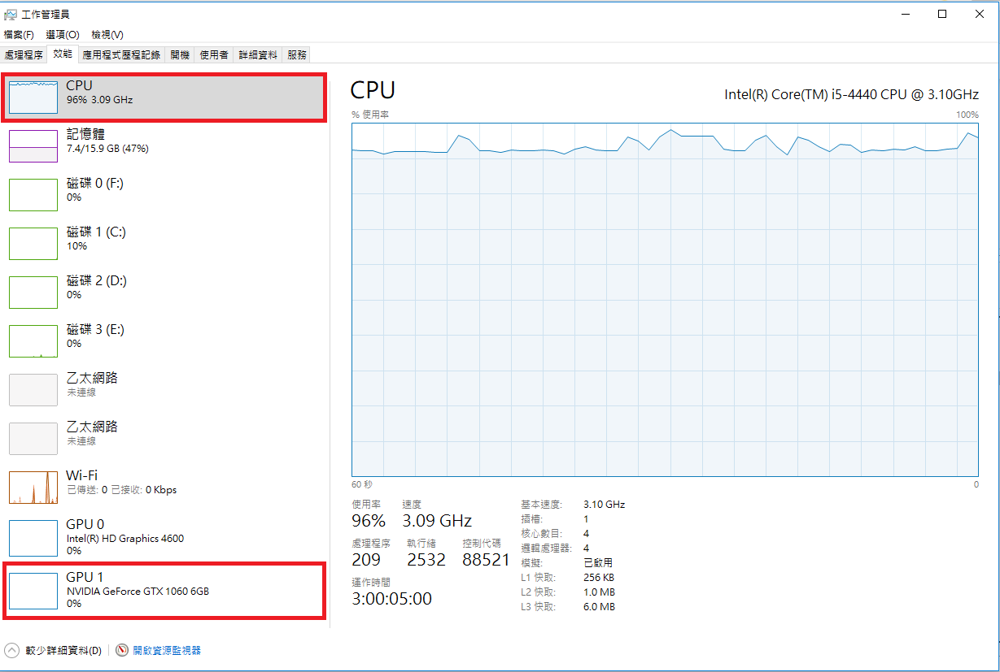

In [29]:
from IPython.display import Image
Image(filename = 'image/cpu_only.png', width = 1000)

## CPU 與 GPU 運算時間比較

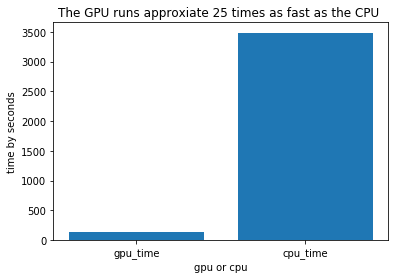

In [49]:
time_list= [139.93686032295227, 3486.66419672966]
name_list = ['gpu_time', 'cpu_time']

import matplotlib.pyplot as plt
plt.bar(name_list, time_list, width = 0.8) 
plt.xlabel('gpu or cpu')
plt.ylabel('time by seconds')
plt.title('The GPU runs approxiate ' + str(round(3486.66419672966 / 139.93686032295227)) + ' times as fast as the CPU ')
plt.show()